### Import all Libraries

In [1]:
import os
import csv
import cassandra
import logging as lg
print(cassandra.__version__)

3.25.0


### Establish the Connection

In [2]:
from cassandra.cluster import Cluster
from cassandra.auth import PlainTextAuthProvider

cloud_config= {
        'secure_connect_bundle': 'E:\secure-connect-amazon-employee-access.zip'
}
auth_provider = PlainTextAuthProvider('rINovXsuZJyDuFtjhmZoAgnk', 'iS-Zc8r+Fxr4ZaYDxEbD2R8h-Pb+jk-LZoIQajp5BXLqoZnuNH2Xa6KQWgGvksfgo-mhR+U1RKCkERyNTBtdbk4JJZ_w8_fCtZ_e-9,T+Emo,ZERXDGB2H9BoIj_daOh')
cluster = Cluster(cloud=cloud_config, auth_provider=auth_provider)
session = cluster.connect()

row = session.execute("select release_version from system.local").one()
if row:
    print(row[0])
else:
    print("An error occurred.")

4.0.0.6816


In [3]:
lg.basicConfig(filename = 'database.log', level = lg.INFO, format = '%(asctime)s%(levelname)s%(message)s')
console_log = lg.StreamHandler()
console_log.setLevel(lg.DEBUG)
format = lg.Formatter('%(asctime)s - %(message)s')
console_log.setFormatter(format)
lg.getLogger('').addHandler(console_log)
lg.info('Logging Started')

2022-06-20 09:23:31,928 - Logging Started


### Create Table for Train Dataset

In [4]:
try:
    def create_table():
        session.execute("DROP TABLE IF EXISTS amazon_employee.train;")
        lg.info('Creating Table...\n')
        query = """CREATE TABLE amazon_employee.train(s_no bigint, action bigint, resource bigint, mgr_id bigint,
            role_rollup_1 bigint, role_rollup_2 bigint, role_deptname bigint, role_title bigint,
            role_family_desc bigint, role_family bigint, role_code bigint, primary key(s_no));"""
        session.execute(query)
        lg.info('Table Created!')
except Exception as e:
    lg.info(e)
    print(str(e))

In [6]:
create_table()

2022-06-20 09:23:53,166 - Creating Table...

2022-06-20 09:23:57,353 - Table Created!


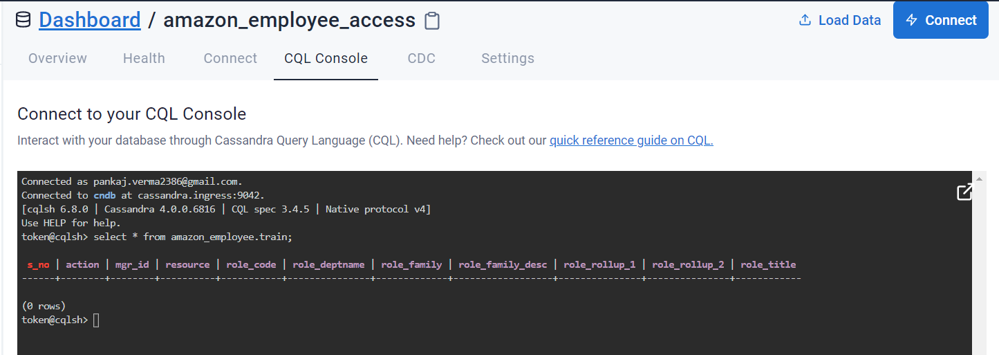

### Insert Data into Train Table

In [7]:
def insert_data():
    try:
        with open("train1.csv", "r") as data:
            lg.info('Start record insertion.....\n')
            next(data)
            data_csv = csv.reader(data, delimiter='\n')
            all_value = []
            for i in data_csv:
                all_value.append(i[0].split(','))
        train_data = []
        for i in all_value:
            train_data.append([int(j) for j in i])
        for i in train_data:
            query = """INSERT INTO amazon_employee.train (s_no, action, resource, mgr_id, role_rollup_1,
                            role_rollup_2, role_deptname, role_title, role_family_desc,
                            role_family, role_code) VALUES(%s,%s,%s,%s,%s,%s,%s,%s,%s,%s,%s)"""
            session.execute(query, i)
            lg.info(f'Record {i} Inserted!')
        lg.info('Record Insertion Completed!!')
    except Exception as e:
        lg.info(e)
        print(str(e))

In [8]:
insert_data()

2022-06-20 09:24:01,472 - Start record insertion.....

2022-06-20 09:24:01,960 - Record [1, 1, 39353, 85475, 117961, 118300, 123472, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:24:02,228 - Record [2, 1, 17183, 1540, 117961, 118343, 123125, 118536, 118536, 308574, 118539] Inserted!
2022-06-20 09:24:02,484 - Record [3, 1, 36724, 14457, 118219, 118220, 117884, 117879, 267952, 19721, 117880] Inserted!
2022-06-20 09:24:02,738 - Record [4, 1, 36135, 5396, 117961, 118343, 119993, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 09:24:03,000 - Record [5, 1, 42680, 5905, 117929, 117930, 119569, 119323, 123932, 19793, 119325] Inserted!
2022-06-20 09:24:03,251 - Record [6, 0, 45333, 14561, 117951, 117952, 118008, 118568, 118568, 19721, 118570] Inserted!
2022-06-20 09:24:03,500 - Record [7, 1, 25993, 17227, 117961, 118343, 123476, 118980, 301534, 118295, 118982] Inserted!
2022-06-20 09:24:03,756 - Record [8, 1, 19666, 4209, 117961, 117969, 118910, 126820, 269034, 118638, 126822] In

2022-06-20 09:24:19,544 - Record [69, 0, 15716, 18073, 118256, 118257, 118623, 118995, 286106, 292795, 118997] Inserted!
2022-06-20 09:24:19,813 - Record [70, 1, 39883, 55956, 118555, 118178, 119262, 117946, 119727, 292795, 117948] Inserted!
2022-06-20 09:24:20,074 - Record [71, 1, 42031, 88387, 118315, 118463, 118522, 119172, 121927, 118467, 119174] Inserted!
2022-06-20 09:24:20,337 - Record [72, 1, 27124, 2318, 117961, 118327, 118933, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:24:20,598 - Record [73, 1, 35498, 18454, 117961, 118343, 119598, 125171, 257115, 118424, 125173] Inserted!
2022-06-20 09:24:20,857 - Record [74, 1, 79168, 58465, 118602, 118603, 117941, 117885, 119621, 117887, 117888] Inserted!
2022-06-20 09:24:21,117 - Record [75, 1, 2252, 782, 117961, 118413, 127522, 118784, 240983, 290919, 118786] Inserted!
2022-06-20 09:24:21,376 - Record [76, 1, 45652, 7338, 117961, 118225, 119924, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 09:24:21,631 - Record [77,

2022-06-20 09:24:37,133 - Record [137, 1, 73752, 70062, 117961, 118386, 118746, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:24:37,385 - Record [138, 1, 6964, 5432, 117961, 118327, 118391, 118641, 123881, 118643, 118644] Inserted!
2022-06-20 09:24:37,641 - Record [139, 1, 25231, 1216, 117902, 117903, 118507, 119529, 205305, 119006, 119531] Inserted!
2022-06-20 09:24:37,899 - Record [140, 1, 34633, 4264, 118887, 118888, 118979, 118980, 199144, 118295, 118982] Inserted!
2022-06-20 09:24:38,148 - Record [141, 1, 28472, 28163, 118315, 118316, 120361, 118321, 175154, 290919, 118322] Inserted!
2022-06-20 09:24:38,405 - Record [142, 1, 24015, 14731, 117961, 118446, 118447, 119346, 302830, 4673, 119348] Inserted!
2022-06-20 09:24:38,661 - Record [143, 1, 75813, 75640, 118315, 118463, 119214, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:24:38,922 - Record [144, 1, 74161, 2290, 117902, 117903, 118403, 128422, 122352, 118453, 128424] Inserted!
2022-06-20 09:24:39,179 - Recor

2022-06-20 09:24:54,931 - Record [205, 1, 36674, 14633, 118106, 118107, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 09:24:55,187 - Record [206, 1, 25831, 55161, 118752, 119070, 118754, 119885, 118806, 118474, 119887] Inserted!
2022-06-20 09:24:55,435 - Record [207, 1, 35196, 16643, 119134, 119135, 118701, 119587, 284481, 118704, 119589] Inserted!
2022-06-20 09:24:55,689 - Record [208, 1, 39518, 7822, 117961, 118327, 118492, 118777, 174445, 308574, 118779] Inserted!
2022-06-20 09:24:55,943 - Record [209, 1, 41649, 4084, 117961, 118052, 118992, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:24:56,191 - Record [210, 0, 7543, 4554, 117961, 118300, 118514, 118259, 118260, 290919, 118261] Inserted!
2022-06-20 09:24:56,461 - Record [211, 1, 75078, 75114, 118315, 118463, 118522, 307024, 294485, 118331, 118332] Inserted!
2022-06-20 09:24:56,716 - Record [212, 1, 16153, 79105, 119062, 119063, 124211, 120516, 123107, 120518, 120519] Inserted!
2022-06-20 09:24:56,979 - Rec

2022-06-20 09:25:12,596 - Record [273, 1, 16301, 217, 117961, 118413, 120370, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:25:12,852 - Record [274, 1, 42976, 4713, 117961, 118052, 120398, 120344, 311360, 118424, 120346] Inserted!
2022-06-20 09:25:13,109 - Record [275, 1, 75272, 4918, 117961, 118300, 123055, 120344, 311360, 118424, 120346] Inserted!
2022-06-20 09:25:13,358 - Record [276, 0, 27416, 50601, 117916, 117917, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 09:25:13,628 - Record [277, 1, 35376, 28163, 118315, 118316, 120361, 118321, 175154, 290919, 118322] Inserted!
2022-06-20 09:25:13,882 - Record [278, 1, 98033, 4549, 117961, 118225, 120050, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:25:14,131 - Record [279, 1, 18072, 57715, 117961, 118446, 118701, 118702, 129679, 118704, 118705] Inserted!
2022-06-20 09:25:14,385 - Record [280, 1, 44592, 7081, 117961, 118225, 119924, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 09:25:14,647 - Recor

2022-06-20 09:25:30,160 - Record [341, 1, 79121, 4736, 117961, 118300, 118301, 307024, 204593, 118331, 118332] Inserted!
2022-06-20 09:25:30,409 - Record [342, 1, 74343, 52105, 118595, 118596, 81476, 118422, 170384, 118424, 118425] Inserted!
2022-06-20 09:25:30,666 - Record [343, 1, 33146, 1271, 117961, 118327, 118507, 118863, 127778, 118398, 118865] Inserted!
2022-06-20 09:25:30,924 - Record [344, 1, 3853, 49302, 117961, 118343, 118514, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 09:25:31,172 - Record [345, 1, 80920, 3973, 118887, 118888, 118631, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 09:25:31,429 - Record [346, 0, 77203, 15621, 117961, 119256, 120943, 126684, 126684, 292795, 126685] Inserted!
2022-06-20 09:25:31,692 - Record [347, 0, 16495, 26009, 117961, 118446, 119986, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 09:25:31,949 - Record [348, 1, 38655, 4993, 117961, 118300, 118979, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 09:25:32,204 - Reco

2022-06-20 09:25:47,820 - Record [409, 1, 76545, 3558, 117902, 118041, 118042, 118043, 118044, 270488, 118046] Inserted!
2022-06-20 09:25:48,088 - Record [410, 1, 44641, 5320, 118290, 118291, 119598, 120344, 260942, 118424, 120346] Inserted!
2022-06-20 09:25:48,350 - Record [411, 1, 80368, 5140, 119062, 119091, 121710, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:25:48,617 - Record [412, 1, 41594, 3225, 117961, 118327, 118929, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 09:25:48,890 - Record [413, 1, 42085, 22458, 117961, 117962, 120677, 307024, 306404, 118331, 118332] Inserted!
2022-06-20 09:25:49,147 - Record [414, 1, 43056, 2610, 117961, 118327, 121979, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 09:25:49,408 - Record [415, 1, 26437, 56310, 118212, 118580, 117895, 117896, 117913, 117887, 117898] Inserted!
2022-06-20 09:25:49,676 - Record [416, 1, 40997, 19286, 117961, 118225, 121716, 118636, 310589, 118638, 118639] Inserted!
2022-06-20 09:25:49,936 - Rec

2022-06-20 09:26:05,474 - Record [477, 1, 38480, 31061, 118212, 118580, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 09:26:05,725 - Record [478, 1, 75787, 15387, 118555, 118178, 118575, 119849, 212678, 118638, 119851] Inserted!
2022-06-20 09:26:05,998 - Record [479, 1, 4675, 97016, 119062, 119091, 118957, 118278, 118260, 290919, 118279] Inserted!
2022-06-20 09:26:06,256 - Record [480, 1, 79813, 49323, 118990, 118991, 118992, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:26:06,503 - Record [481, 1, 15907, 782, 117961, 118413, 277693, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:26:06,758 - Record [482, 1, 18332, 13411, 118023, 118024, 118810, 122952, 305581, 19793, 122954] Inserted!
2022-06-20 09:26:07,017 - Record [483, 1, 42093, 7858, 91261, 118026, 119362, 119363, 307210, 118667, 119365] Inserted!
2022-06-20 09:26:07,268 - Record [484, 1, 80515, 3085, 117961, 118300, 125821, 118834, 251171, 118424, 118836] Inserted!
2022-06-20 09:26:07,525 - Recor

2022-06-20 09:26:23,113 - Record [545, 0, 79602, 41795, 118315, 118316, 118317, 129561, 216140, 3130, 129563] Inserted!
2022-06-20 09:26:23,375 - Record [546, 1, 43452, 3486, 118752, 119070, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 09:26:23,623 - Record [547, 1, 17849, 58535, 117961, 117969, 130192, 123400, 130319, 19793, 123402] Inserted!
2022-06-20 09:26:23,879 - Record [548, 1, 27797, 70062, 117961, 118386, 118746, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:26:24,134 - Record [549, 1, 80674, 3918, 117961, 118343, 118660, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 09:26:24,386 - Record [550, 1, 3661, 2210, 117961, 126102, 118378, 119192, 300603, 119184, 119194] Inserted!
2022-06-20 09:26:24,642 - Record [551, 1, 110042, 1540, 117961, 118343, 123125, 118536, 118536, 308574, 118539] Inserted!
2022-06-20 09:26:24,897 - Record [552, 1, 78598, 1350, 117961, 118052, 122938, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:26:25,148 - Record

2022-06-20 09:26:40,576 - Record [613, 1, 78518, 1249, 117961, 118386, 118910, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:26:40,833 - Record [614, 1, 33054, 4933, 117961, 118300, 118458, 120006, 311622, 118424, 120008] Inserted!
2022-06-20 09:26:41,092 - Record [615, 1, 74593, 18213, 117961, 118386, 118746, 118747, 160002, 118453, 118749] Inserted!
2022-06-20 09:26:41,338 - Record [616, 1, 74196, 18450, 117961, 118052, 118821, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 09:26:41,595 - Record [617, 1, 44909, 3526, 117961, 118225, 124130, 119093, 120324, 119095, 119096] Inserted!
2022-06-20 09:26:41,853 - Record [618, 1, 37651, 50308, 118090, 118091, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 09:26:42,114 - Record [619, 1, 17308, 4821, 117961, 118343, 119598, 120348, 255097, 118295, 120350] Inserted!
2022-06-20 09:26:42,398 - Record [620, 1, 31732, 4110, 119596, 119597, 118292, 118422, 191064, 118424, 118425] Inserted!
2022-06-20 09:26:42,657 - Rec

2022-06-20 09:26:58,278 - Record [681, 1, 79814, 7553, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:26:58,528 - Record [682, 0, 38480, 51382, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 09:26:58,784 - Record [683, 1, 4675, 6021, 117961, 118413, 122007, 124886, 190212, 118643, 124888] Inserted!
2022-06-20 09:26:59,041 - Record [684, 1, 33054, 53081, 117961, 118343, 119598, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 09:26:59,288 - Record [685, 0, 39149, 3648, 117961, 118300, 118631, 118980, 301534, 118295, 118982] Inserted!
2022-06-20 09:26:59,558 - Record [686, 1, 75078, 257604, 117961, 118386, 119214, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:26:59,815 - Record [687, 1, 16018, 1550, 117961, 118225, 123173, 118054, 119601, 117887, 118055] Inserted!
2022-06-20 09:27:00,076 - Record [688, 1, 15714, 3606, 118169, 118170, 118179, 126684, 204891, 292795, 126685] Inserted!
2022-06-20 09:27:00,346 - Reco

2022-06-20 09:27:15,841 - Record [749, 1, 33248, 2908, 117961, 118343, 118979, 120344, 303717, 118424, 120346] Inserted!
2022-06-20 09:27:16,098 - Record [750, 1, 43247, 7022, 119062, 119091, 118535, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:27:16,362 - Record [751, 1, 27356, 119350, 117961, 118386, 118522, 119351, 123417, 3130, 119353] Inserted!
2022-06-20 09:27:16,631 - Record [752, 1, 43416, 32241, 117961, 118327, 118933, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 09:27:16,885 - Record [753, 1, 42972, 17244, 117961, 118052, 120398, 120006, 311622, 118424, 120008] Inserted!
2022-06-20 09:27:17,134 - Record [754, 1, 33154, 2014, 117961, 117962, 118910, 120773, 127525, 118960, 120774] Inserted!
2022-06-20 09:27:17,395 - Record [755, 1, 1281, 74967, 117961, 117962, 117904, 127782, 160080, 290919, 127783] Inserted!
2022-06-20 09:27:17,659 - Record [756, 1, 7543, 23136, 117961, 118052, 119742, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:27:17,908 - Reco

2022-06-20 09:27:33,436 - Record [817, 1, 25565, 1755, 117961, 117962, 119223, 125793, 146749, 118643, 125795] Inserted!
2022-06-20 09:27:33,714 - Record [818, 1, 13878, 13262, 118219, 118220, 118221, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 09:27:33,975 - Record [819, 1, 80213, 1334, 117961, 117962, 118910, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 09:27:34,223 - Record [820, 1, 71236, 5048, 117961, 118300, 118458, 119928, 310608, 118331, 119929] Inserted!
2022-06-20 09:27:34,477 - Record [821, 1, 20226, 2440, 118752, 119070, 119121, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 09:27:34,738 - Record [822, 1, 44722, 4576, 117961, 118327, 118391, 118321, 235272, 290919, 118322] Inserted!
2022-06-20 09:27:34,998 - Record [823, 1, 71236, 5211, 118290, 118291, 119837, 118980, 261436, 118295, 118982] Inserted!
2022-06-20 09:27:35,253 - Record [824, 1, 57888, 7647, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:27:35,534 - Record

2022-06-20 09:27:50,944 - Record [885, 1, 38719, 50213, 118079, 118080, 117878, 117885, 118177, 117887, 117888] Inserted!
2022-06-20 09:27:51,194 - Record [886, 1, 22682, 7014, 117961, 118446, 119961, 118278, 118260, 290919, 118279] Inserted!
2022-06-20 09:27:51,449 - Record [887, 1, 86309, 6277, 117961, 118343, 118437, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 09:27:51,704 - Record [888, 1, 28149, 5697, 117961, 118386, 118692, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 09:27:51,956 - Record [889, 1, 40061, 15012, 118212, 118213, 123201, 117905, 123202, 290919, 117908] Inserted!
2022-06-20 09:27:52,211 - Record [890, 1, 93625, 3967, 117961, 118052, 118706, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:27:52,466 - Record [891, 1, 28532, 26229, 117916, 118011, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 09:27:52,716 - Record [892, 0, 25270, 71202, 117961, 118386, 118522, 128764, 256805, 118612, 128765] Inserted!
2022-06-20 09:27:52,973 - Rec

2022-06-20 09:28:08,384 - Record [953, 1, 38782, 36327, 117961, 118327, 122070, 122129, 305057, 121916, 122131] Inserted!
2022-06-20 09:28:08,637 - Record [954, 1, 76416, 25329, 118212, 118213, 124449, 119849, 164945, 118638, 119851] Inserted!
2022-06-20 09:28:08,886 - Record [955, 1, 17308, 15620, 122880, 122974, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 09:28:09,140 - Record [956, 1, 31823, 4272, 117961, 118343, 120666, 123045, 123107, 120518, 123047] Inserted!
2022-06-20 09:28:09,399 - Record [957, 0, 36926, 15412, 117961, 118343, 127705, 119849, 170027, 118638, 119851] Inserted!
2022-06-20 09:28:09,648 - Record [958, 1, 27727, 3281, 117961, 118225, 275600, 119093, 120324, 119095, 119096] Inserted!
2022-06-20 09:28:09,905 - Record [959, 1, 91749, 249, 117961, 118225, 118403, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:28:10,161 - Record [960, 1, 23567, 7338, 117961, 118225, 119924, 118321, 152852, 290919, 118322] Inserted!
2022-06-20 09:28:10,422 - Rec

2022-06-20 09:28:25,931 - Record [1021, 1, 5893, 59312, 118550, 118551, 118378, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 09:28:26,196 - Record [1022, 1, 40276, 4622, 119402, 119403, 117878, 124537, 125539, 118870, 124539] Inserted!
2022-06-20 09:28:26,454 - Record [1023, 1, 90381, 70646, 117961, 118327, 118933, 120690, 120691, 290919, 120692] Inserted!
2022-06-20 09:28:26,708 - Record [1024, 1, 35792, 2661, 122880, 122974, 122870, 118207, 180031, 270488, 118209] Inserted!
2022-06-20 09:28:26,970 - Record [1025, 1, 43930, 25724, 118290, 118291, 119136, 120056, 155541, 118474, 120058] Inserted!
2022-06-20 09:28:27,232 - Record [1026, 1, 37732, 46557, 117922, 117923, 123279, 179731, 122593, 117887, 117973] Inserted!
2022-06-20 09:28:27,487 - Record [1027, 1, 34924, 7011, 117961, 118327, 120685, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 09:28:27,745 - Record [1028, 1, 45904, 55934, 118006, 118007, 117878, 179731, 124079, 117887, 117973] Inserted!
2022-06-20 09:28:28,

2022-06-20 09:28:43,437 - Record [1089, 1, 75834, 85475, 117961, 118300, 123472, 122022, 150273, 119221, 122024] Inserted!
2022-06-20 09:28:43,689 - Record [1090, 1, 38605, 4189, 117961, 118343, 119987, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:28:43,946 - Record [1091, 1, 39883, 13441, 117961, 118225, 122870, 125793, 128018, 118643, 125795] Inserted!
2022-06-20 09:28:44,200 - Record [1092, 1, 15680, 15683, 117961, 118300, 118957, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:28:44,486 - Record [1093, 1, 36610, 59347, 117961, 118327, 118320, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 09:28:44,751 - Record [1094, 1, 75477, 23203, 117961, 118386, 118896, 118792, 122002, 118424, 118794] Inserted!
2022-06-20 09:28:45,035 - Record [1095, 1, 37558, 46149, 117961, 118327, 4674, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:28:45,287 - Record [1096, 1, 28340, 31436, 118582, 120216, 117895, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 09:28:45,

2022-06-20 09:29:01,002 - Record [1157, 1, 39368, 5767, 117961, 118343, 118344, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:29:01,259 - Record [1158, 1, 4675, 2819, 117961, 118300, 123472, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:29:01,521 - Record [1159, 1, 31441, 4026, 117961, 118300, 118301, 120497, 149226, 118424, 120499] Inserted!
2022-06-20 09:29:01,788 - Record [1160, 1, 31226, 54684, 117961, 117962, 118910, 118685, 137802, 308574, 118687] Inserted!
2022-06-20 09:29:02,048 - Record [1161, 1, 1020, 57104, 130684, 130685, 118378, 121372, 300603, 119184, 121374] Inserted!
2022-06-20 09:29:02,319 - Record [1162, 1, 34429, 3881, 117961, 118343, 118514, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:29:02,587 - Record [1163, 0, 24016, 17688, 117961, 118413, 125133, 120628, 278014, 118131, 120629] Inserted!
2022-06-20 09:29:02,845 - Record [1164, 1, 79613, 25687, 117961, 118343, 118660, 118924, 124941, 118667, 118926] Inserted!
2022-06-20 09:29:03,09

2022-06-20 09:29:18,640 - Record [1225, 1, 35017, 4838, 117961, 118343, 120126, 118834, 133686, 118424, 118836] Inserted!
2022-06-20 09:29:18,896 - Record [1226, 0, 939, 7807, 117961, 118327, 118518, 118207, 190710, 270488, 118209] Inserted!
2022-06-20 09:29:19,151 - Record [1227, 0, 80042, 7012, 117961, 118225, 120050, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 09:29:19,413 - Record [1228, 1, 32270, 119350, 117961, 118386, 118522, 129561, 134045, 3130, 129563] Inserted!
2022-06-20 09:29:19,673 - Record [1229, 1, 39883, 95428, 91261, 118026, 118202, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:29:19,929 - Record [1230, 1, 45852, 4474, 117961, 118446, 119064, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:29:20,179 - Record [1231, 1, 43114, 44633, 117916, 117917, 118810, 134067, 134068, 19793, 134069] Inserted!
2022-06-20 09:29:20,433 - Record [1232, 1, 23968, 49425, 117961, 118343, 119598, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 09:29:20,691 -

2022-06-20 09:29:36,094 - Record [1293, 1, 14947, 23198, 117961, 117962, 118352, 120690, 117906, 290919, 120692] Inserted!
2022-06-20 09:29:36,379 - Record [1294, 1, 6977, 85475, 117961, 118300, 120410, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:29:36,633 - Record [1295, 1, 7543, 33, 117961, 118413, 119968, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 09:29:36,891 - Record [1296, 1, 28114, 4875, 120864, 121013, 121014, 120789, 171744, 118424, 120791] Inserted!
2022-06-20 09:29:37,148 - Record [1297, 1, 20487, 2931, 117961, 118343, 118700, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:29:37,431 - Record [1298, 1, 33151, 53150, 119062, 119091, 128935, 118863, 127778, 118398, 118865] Inserted!
2022-06-20 09:29:37,682 - Record [1299, 1, 96515, 5143, 117961, 118343, 123125, 119849, 244844, 118638, 119851] Inserted!
2022-06-20 09:29:37,953 - Record [1300, 1, 42031, 25303, 117961, 118386, 118522, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 09:29:38,219 

2022-06-20 09:29:53,900 - Record [1361, 1, 97019, 4933, 117961, 118300, 118458, 307024, 301218, 118331, 118332] Inserted!
2022-06-20 09:29:54,163 - Record [1362, 1, 19310, 13557, 5110, 117954, 122672, 124537, 275228, 118870, 124539] Inserted!
2022-06-20 09:29:54,431 - Record [1363, 1, 33241, 125466, 117902, 117903, 120171, 120990, 152438, 118398, 120992] Inserted!
2022-06-20 09:29:54,719 - Record [1364, 1, 79228, 4212, 117983, 117984, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 09:29:54,982 - Record [1365, 1, 38603, 7370, 117961, 118413, 118481, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:29:55,251 - Record [1366, 1, 42093, 5262, 119596, 119597, 124133, 120344, 282594, 118424, 120346] Inserted!
2022-06-20 09:29:55,516 - Record [1367, 1, 34769, 4588, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:29:55,776 - Record [1368, 1, 81350, 6046, 117961, 118446, 120317, 307024, 306404, 118331, 118332] Inserted!
2022-06-20 09:29:56,074 

2022-06-20 09:30:11,681 - Record [1429, 1, 31854, 5905, 117929, 117930, 118810, 119899, 310825, 19793, 119900] Inserted!
2022-06-20 09:30:11,938 - Record [1430, 1, 35903, 49823, 117961, 118300, 127168, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:30:12,187 - Record [1431, 1, 19723, 2078, 118114, 118115, 117920, 118568, 125937, 19721, 118570] Inserted!
2022-06-20 09:30:12,448 - Record [1432, 1, 74115, 1215, 117961, 118327, 120171, 118054, 126488, 117887, 118055] Inserted!
2022-06-20 09:30:12,703 - Record [1433, 1, 26982, 16569, 117961, 118327, 120559, 122269, 141096, 118643, 122271] Inserted!
2022-06-20 09:30:12,964 - Record [1434, 1, 37951, 14867, 117890, 118102, 117878, 117885, 118069, 117887, 117888] Inserted!
2022-06-20 09:30:13,221 - Record [1435, 1, 104961, 7545, 117961, 118300, 119181, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 09:30:13,478 - Record [1436, 1, 3853, 4308, 117961, 118343, 118833, 118054, 137362, 117887, 118055] Inserted!
2022-06-20 09:30:13,740

2022-06-20 09:30:29,163 - Record [1497, 0, 33229, 46704, 91261, 118026, 118202, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:30:29,419 - Record [1498, 1, 17278, 4147, 117961, 118300, 118631, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 09:30:29,681 - Record [1499, 1, 80190, 1409, 117961, 118300, 120722, 118784, 290919, 290919, 118786] Inserted!
2022-06-20 09:30:29,940 - Record [1500, 1, 80548, 1409, 117961, 118300, 118437, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:30:30,195 - Record [1501, 1, 26356, 16850, 117961, 118225, 119092, 120591, 120592, 119095, 120593] Inserted!
2022-06-20 09:30:30,453 - Record [1502, 1, 34464, 3116, 117961, 118300, 147589, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 09:30:30,704 - Record [1503, 1, 17308, 16371, 117961, 118446, 118684, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:30:31,007 - Record [1504, 1, 41649, 1325, 117961, 117962, 118910, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:30:31,26

2022-06-20 09:30:46,878 - Record [1565, 1, 34950, 12397, 117961, 118327, 121787, 123045, 123107, 120518, 123047] Inserted!
2022-06-20 09:30:47,145 - Record [1566, 1, 74995, 2983, 117961, 118343, 118700, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:30:47,398 - Record [1567, 1, 22662, 2409, 117961, 117962, 117904, 119949, 230830, 290919, 119951] Inserted!
2022-06-20 09:30:47,655 - Record [1568, 1, 74894, 56193, 117961, 118300, 120410, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 09:30:47,906 - Record [1569, 1, 278393, 70130, 118595, 118596, 81476, 118826, 158101, 118424, 118828] Inserted!
2022-06-20 09:30:48,161 - Record [1570, 1, 30841, 2710, 118290, 118291, 120823, 118396, 308262, 118398, 118399] Inserted!
2022-06-20 09:30:48,417 - Record [1571, 1, 75901, 5177, 117961, 118386, 125016, 128764, 217580, 118612, 128765] Inserted!
2022-06-20 09:30:48,679 - Record [1572, 1, 79963, 6656, 118095, 118096, 118008, 117885, 118097, 117887, 117888] Inserted!
2022-06-20 09:30:48,9

2022-06-20 09:31:04,383 - Record [1632, 1, 43742, 5002, 117961, 118343, 119598, 120344, 310997, 118424, 120346] Inserted!
2022-06-20 09:31:04,637 - Record [1633, 1, 74952, 84891, 120342, 120343, 118631, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:31:04,904 - Record [1634, 1, 5173, 3075, 117961, 117962, 120677, 120357, 120678, 118424, 120359] Inserted!
2022-06-20 09:31:05,160 - Record [1635, 1, 17308, 4733, 118290, 118291, 120126, 118980, 166203, 118295, 118982] Inserted!
2022-06-20 09:31:05,424 - Record [1636, 1, 39418, 15795, 119062, 119091, 118042, 118043, 142221, 270488, 118046] Inserted!
2022-06-20 09:31:05,684 - Record [1637, 1, 34592, 32457, 117961, 118327, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:31:05,948 - Record [1638, 1, 34502, 26320, 117961, 118327, 118391, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 09:31:06,202 - Record [1639, 1, 74995, 7824, 119280, 119281, 118623, 118995, 136748, 292795, 118997] Inserted!
2022-06-20 09:31:06,4

2022-06-20 09:31:22,107 - Record [1700, 1, 77177, 7460, 117961, 118300, 118783, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:31:22,369 - Record [1701, 1, 7543, 4106, 119062, 119091, 122012, 179731, 130134, 117887, 117973] Inserted!
2022-06-20 09:31:22,637 - Record [1702, 1, 73229, 2781, 117961, 118300, 118783, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 09:31:22,898 - Record [1703, 1, 31917, 7016, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:31:23,186 - Record [1704, 1, 41594, 8461, 117961, 118327, 118929, 124810, 131310, 249618, 124812] Inserted!
2022-06-20 09:31:23,446 - Record [1705, 1, 34211, 3963, 117961, 118300, 125872, 120344, 311360, 118424, 120346] Inserted!
2022-06-20 09:31:23,710 - Record [1706, 1, 80693, 15887, 117961, 118052, 120356, 120357, 127906, 118424, 120359] Inserted!
2022-06-20 09:31:23,977 - Record [1707, 1, 78296, 858, 117961, 118327, 118529, 122129, 305057, 121916, 122131] Inserted!
2022-06-20 09:31:24,255 -

2022-06-20 09:31:39,871 - Record [1768, 1, 36480, 15440, 118256, 118257, 117945, 117946, 128130, 292795, 117948] Inserted!
2022-06-20 09:31:40,129 - Record [1769, 1, 42084, 8343, 119301, 119302, 119303, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:31:40,390 - Record [1770, 1, 21307, 6986, 119062, 119091, 120323, 119093, 119094, 119095, 119096] Inserted!
2022-06-20 09:31:40,682 - Record [1771, 1, 35528, 4110, 119596, 119597, 118292, 118293, 118294, 118295, 118296] Inserted!
2022-06-20 09:31:40,934 - Record [1772, 1, 1003, 3000, 118000, 118001, 120551, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:31:41,214 - Record [1773, 1, 34958, 51226, 117961, 118327, 118320, 118641, 164752, 118643, 118644] Inserted!
2022-06-20 09:31:41,483 - Record [1774, 1, 37571, 6217, 117961, 118327, 118328, 119172, 184011, 118467, 119174] Inserted!
2022-06-20 09:31:41,742 - Record [1775, 1, 43272, 5496, 91261, 118026, 118202, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:31:41,990 

2022-06-20 09:31:57,605 - Record [1836, 1, 34297, 110921, 117932, 117933, 117878, 216825, 121386, 19721, 216827] Inserted!
2022-06-20 09:31:57,873 - Record [1837, 1, 27755, 8751, 117932, 117933, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 09:31:58,132 - Record [1838, 1, 80492, 19760, 117961, 117962, 118352, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:31:58,391 - Record [1839, 1, 23096, 55064, 126918, 126919, 118042, 118043, 146409, 270488, 118046] Inserted!
2022-06-20 09:31:58,647 - Record [1840, 1, 25103, 3883, 117961, 118343, 119987, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 09:31:58,907 - Record [1841, 1, 23968, 52855, 120810, 120811, 121108, 118728, 149333, 118295, 118730] Inserted!
2022-06-20 09:31:59,169 - Record [1842, 1, 33054, 15412, 117961, 118343, 127705, 119849, 170027, 118638, 119851] Inserted!
2022-06-20 09:31:59,424 - Record [1843, 1, 33154, 21037, 117961, 117969, 19666, 179731, 257952, 117887, 117973] Inserted!
2022-06-20 09:31:59,

2022-06-20 09:32:15,331 - Record [1904, 1, 34817, 34608, 117961, 118327, 118320, 118321, 125206, 290919, 118322] Inserted!
2022-06-20 09:32:15,583 - Record [1905, 1, 4675, 14952, 117961, 117962, 119223, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 09:32:15,851 - Record [1906, 1, 38391, 14580, 118212, 118580, 117895, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 09:32:16,109 - Record [1907, 1, 25812, 61948, 118163, 118164, 117878, 119192, 123881, 119184, 119194] Inserted!
2022-06-20 09:32:16,358 - Record [1908, 1, 33249, 59429, 118595, 118596, 81476, 120344, 130834, 118424, 120346] Inserted!
2022-06-20 09:32:16,626 - Record [1909, 1, 971, 6227, 117961, 118343, 118437, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 09:32:16,886 - Record [1910, 1, 25731, 13419, 117961, 118300, 120059, 119849, 310589, 118638, 119851] Inserted!
2022-06-20 09:32:17,135 - Record [1911, 1, 28114, 4110, 119596, 119597, 118292, 118422, 191064, 118424, 118425] Inserted!
2022-06-20 09:32:17,40

2022-06-20 09:32:32,937 - Record [1972, 1, 25865, 6201, 117961, 118225, 120663, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:32:33,195 - Record [1973, 1, 6977, 7287, 117961, 117962, 119223, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 09:32:33,445 - Record [1974, 1, 1020, 52394, 117961, 118300, 118458, 119928, 310608, 118331, 119929] Inserted!
2022-06-20 09:32:33,699 - Record [1975, 1, 34582, 1409, 117961, 118300, 120722, 118784, 290919, 290919, 118786] Inserted!
2022-06-20 09:32:33,954 - Record [1976, 1, 95853, 23200, 117961, 118343, 123125, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 09:32:34,234 - Record [1977, 1, 26313, 52316, 119596, 119597, 118292, 118293, 118294, 118295, 118296] Inserted!
2022-06-20 09:32:34,501 - Record [1978, 1, 3853, 53081, 117961, 118343, 119598, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 09:32:34,756 - Record [1979, 1, 17308, 5063, 117961, 118300, 121108, 119928, 150810, 118331, 119929] Inserted!
2022-06-20 09:32:35,011

2022-06-20 09:32:50,549 - Record [2040, 1, 28149, 28480, 118315, 118463, 118522, 129229, 251603, 119788, 129231] Inserted!
2022-06-20 09:32:50,803 - Record [2041, 1, 20364, 51124, 117961, 118300, 118631, 118422, 161852, 118424, 118425] Inserted!
2022-06-20 09:32:51,063 - Record [2042, 1, 44722, 36051, 117961, 118386, 118635, 118685, 262400, 308574, 118687] Inserted!
2022-06-20 09:32:51,315 - Record [2043, 1, 29076, 2598, 118169, 118170, 117945, 117946, 175307, 292795, 117948] Inserted!
2022-06-20 09:32:51,582 - Record [2044, 1, 38706, 52735, 117961, 118052, 120356, 122067, 127906, 118424, 122069] Inserted!
2022-06-20 09:32:51,841 - Record [2045, 1, 1732, 1222, 117961, 118327, 120171, 120647, 256168, 118398, 120649] Inserted!
2022-06-20 09:32:52,090 - Record [2046, 1, 42085, 15412, 117961, 118343, 127705, 119849, 127706, 118638, 119851] Inserted!
2022-06-20 09:32:52,356 - Record [2047, 1, 79092, 2327, 117961, 118300, 119181, 121594, 126485, 4673, 121596] Inserted!
2022-06-20 09:32:52,60

2022-06-20 09:33:07,879 - Record [2107, 1, 36871, 69487, 117882, 117883, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 09:33:08,137 - Record [2108, 1, 16265, 1483, 117961, 117962, 118840, 124886, 143242, 118643, 124888] Inserted!
2022-06-20 09:33:08,386 - Record [2109, 1, 109182, 53176, 117961, 117969, 120535, 118368, 124354, 117887, 118486] Inserted!
2022-06-20 09:33:08,649 - Record [2110, 1, 5488, 5490, 117961, 117962, 5488, 120618, 304465, 118643, 120619] Inserted!
2022-06-20 09:33:08,907 - Record [2111, 1, 75078, 92216, 118315, 118316, 120764, 118465, 175082, 118467, 118468] Inserted!
2022-06-20 09:33:09,155 - Record [2112, 1, 27264, 44038, 117902, 117903, 118910, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 09:33:09,437 - Record [2113, 1, 39958, 4659, 117961, 118225, 120663, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:33:09,697 - Record [2114, 1, 80208, 3724, 117961, 118300, 120059, 118636, 135814, 118638, 118639] Inserted!
2022-06-20 09:33:09,946 -

2022-06-20 09:33:25,221 - Record [2174, 1, 91167, 18220, 117961, 118052, 118867, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:33:25,469 - Record [2175, 1, 18913, 27872, 118090, 118091, 117912, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 09:33:25,726 - Record [2176, 0, 278393, 51124, 117961, 118300, 118631, 118422, 161852, 118424, 118425] Inserted!
2022-06-20 09:33:25,983 - Record [2177, 1, 13878, 13386, 118219, 118220, 118221, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 09:33:26,249 - Record [2178, 1, 278393, 23614, 117961, 118300, 117878, 122129, 124893, 121916, 122131] Inserted!
2022-06-20 09:33:26,503 - Record [2179, 1, 4675, 5916, 117961, 118446, 16232, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:33:26,770 - Record [2180, 1, 15797, 112642, 119301, 119302, 119303, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:33:27,032 - Record [2181, 1, 75445, 27515, 118953, 118954, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 09:33:27

2022-06-20 09:33:42,882 - Record [2242, 1, 73756, 51375, 118212, 118213, 118684, 119065, 215972, 118667, 119067] Inserted!
2022-06-20 09:33:43,143 - Record [2243, 1, 43876, 50193, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 09:33:43,393 - Record [2244, 1, 16342, 36144, 117961, 118300, 124816, 118685, 126297, 308574, 118687] Inserted!
2022-06-20 09:33:43,648 - Record [2245, 1, 33146, 2260, 117961, 118343, 119598, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 09:33:43,908 - Record [2246, 1, 39333, 8516, 117961, 118386, 118733, 169634, 235935, 118736, 169635] Inserted!
2022-06-20 09:33:44,156 - Record [2247, 1, 44731, 60055, 118079, 118080, 117878, 117885, 118177, 117887, 117888] Inserted!
2022-06-20 09:33:44,412 - Record [2248, 1, 3853, 6125, 119134, 119135, 19772, 119928, 306795, 118331, 119929] Inserted!
2022-06-20 09:33:44,671 - Record [2249, 1, 39488, 4571, 117961, 118225, 119924, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 09:33:44,932

2022-06-20 09:34:00,201 - Record [2309, 1, 74865, 19839, 117961, 118300, 120722, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 09:34:00,453 - Record [2310, 1, 39720, 58457, 117926, 118266, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 09:34:00,722 - Record [2311, 1, 33146, 7519, 91261, 118026, 118202, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 09:34:00,981 - Record [2312, 1, 27314, 2296, 117961, 118413, 127522, 118451, 256937, 118453, 118454] Inserted!
2022-06-20 09:34:01,245 - Record [2313, 0, 13878, 13037, 118006, 118007, 118008, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 09:34:01,513 - Record [2314, 1, 80541, 4362, 118212, 118213, 126955, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 09:34:01,794 - Record [2315, 1, 32474, 16147, 118541, 118542, 120539, 118777, 308574, 308574, 118779] Inserted!
2022-06-20 09:34:02,048 - Record [2316, 1, 46042, 3838, 117961, 118225, 119924, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:34:02,327

2022-06-20 09:34:17,900 - Record [2377, 1, 3853, 17598, 117961, 118300, 118631, 119587, 176829, 118704, 119589] Inserted!
2022-06-20 09:34:18,155 - Record [2378, 1, 74986, 86171, 118953, 118954, 117920, 122927, 123932, 118131, 122929] Inserted!
2022-06-20 09:34:18,416 - Record [2379, 1, 15716, 59228, 117902, 118041, 118623, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 09:34:18,682 - Record [2380, 1, 42093, 101792, 117961, 117962, 120677, 118054, 120238, 117887, 118055] Inserted!
2022-06-20 09:34:18,943 - Record [2381, 1, 20293, 83596, 118090, 118091, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 09:34:19,190 - Record [2382, 1, 39216, 7243, 117961, 118343, 118609, 120357, 120065, 118424, 120359] Inserted!
2022-06-20 09:34:19,459 - Record [2383, 1, 48436, 49961, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:34:19,716 - Record [2384, 1, 90460, 4023, 117961, 118446, 119064, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:34:1

2022-06-20 09:34:35,589 - Record [2445, 1, 79276, 8242, 117961, 117962, 119223, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 09:34:35,849 - Record [2446, 1, 40462, 851, 117961, 117962, 122215, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 09:34:36,106 - Record [2447, 1, 73114, 5080, 117961, 118300, 118395, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 09:34:36,370 - Record [2448, 1, 5045, 3116, 117961, 118300, 147589, 118826, 236735, 118424, 118828] Inserted!
2022-06-20 09:34:36,638 - Record [2449, 1, 79845, 85343, 117961, 118327, 118933, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 09:34:36,897 - Record [2450, 1, 17249, 18454, 117961, 118343, 119598, 125171, 257115, 118424, 125173] Inserted!
2022-06-20 09:34:37,147 - Record [2451, 1, 39187, 7539, 117961, 118343, 119987, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:34:37,450 - Record [2452, 1, 40202, 3023, 117961, 118343, 122012, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 09:34:37,706 

2022-06-20 09:34:53,459 - Record [2513, 1, 45412, 50368, 117926, 118266, 117884, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 09:34:53,711 - Record [2514, 1, 34012, 866, 117961, 118413, 120526, 118259, 132668, 290919, 118261] Inserted!
2022-06-20 09:34:53,978 - Record [2515, 1, 38470, 13165, 117890, 118102, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 09:34:54,234 - Record [2516, 1, 15030, 2291, 117961, 118225, 120663, 122297, 120664, 118331, 118899] Inserted!
2022-06-20 09:34:54,496 - Record [2517, 1, 77425, 4189, 117961, 118343, 119987, 118958, 123044, 118960, 118961] Inserted!
2022-06-20 09:34:54,764 - Record [2518, 1, 4675, 1011, 117961, 118225, 119924, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 09:34:55,022 - Record [2519, 1, 81390, 18044, 117961, 118386, 118522, 118321, 123513, 290919, 118322] Inserted!
2022-06-20 09:34:55,271 - Record [2520, 1, 27284, 1614, 117961, 118327, 118507, 129909, 185973, 118453, 129911] Inserted!
2022-06-20 09:34:55,544 -

2022-06-20 09:35:11,263 - Record [2581, 1, 32270, 5043, 117961, 118300, 118458, 118523, 129545, 118331, 118525] Inserted!
2022-06-20 09:35:11,521 - Record [2582, 1, 35279, 34461, 117961, 118327, 120685, 122060, 160617, 290919, 122062] Inserted!
2022-06-20 09:35:11,772 - Record [2583, 1, 40326, 1140, 117961, 117962, 118352, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:35:12,025 - Record [2584, 1, 38968, 6083, 117961, 117962, 122224, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:35:12,285 - Record [2585, 1, 80094, 20361, 117961, 117962, 118352, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 09:35:12,548 - Record [2586, 1, 75834, 84718, 117961, 118225, 121716, 120418, 259239, 249618, 120419] Inserted!
2022-06-20 09:35:12,804 - Record [2587, 1, 25993, 4950, 117961, 118343, 119598, 120344, 311360, 118424, 120346] Inserted!
2022-06-20 09:35:13,062 - Record [2588, 1, 45314, 1958, 118550, 118551, 118378, 119192, 300603, 119184, 119194] Inserted!
2022-06-20 09:35:13,3

2022-06-20 09:35:28,812 - Record [2649, 1, 15672, 7447, 117902, 117903, 118783, 117905, 118036, 290919, 117908] Inserted!
2022-06-20 09:35:29,074 - Record [2650, 1, 28853, 4583, 117961, 118413, 120370, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 09:35:29,331 - Record [2651, 1, 35632, 5210, 117961, 118343, 119598, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 09:35:29,578 - Record [2652, 1, 3658, 4301, 117961, 118343, 118660, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 09:35:29,847 - Record [2653, 1, 6678, 4659, 117961, 118225, 120663, 117905, 290919, 290919, 117908] Inserted!
2022-06-20 09:35:30,104 - Record [2654, 1, 25098, 1043, 117961, 118327, 121589, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 09:35:30,353 - Record [2655, 0, 80478, 49574, 117961, 118327, 118391, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 09:35:30,607 - Record [2656, 1, 6977, 4362, 118212, 118213, 126955, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 09:35:30,871 - 

2022-06-20 09:35:46,494 - Record [2717, 1, 79363, 56591, 118079, 118080, 117878, 117879, 199900, 19721, 117880] Inserted!
2022-06-20 09:35:46,743 - Record [2718, 1, 80416, 13419, 117961, 118300, 120059, 118636, 310589, 118638, 118639] Inserted!
2022-06-20 09:35:46,997 - Record [2719, 1, 33324, 3281, 117961, 118225, 120323, 122849, 120324, 119095, 122850] Inserted!
2022-06-20 09:35:47,255 - Record [2720, 1, 5502, 16838, 117961, 118413, 120370, 120690, 136365, 290919, 120692] Inserted!
2022-06-20 09:35:47,504 - Record [2721, 1, 28149, 28245, 118315, 118463, 123089, 117905, 130219, 290919, 117908] Inserted!
2022-06-20 09:35:47,761 - Record [2722, 1, 15716, 51757, 117961, 119256, 119257, 280788, 121024, 292795, 119082] Inserted!
2022-06-20 09:35:48,015 - Record [2723, 1, 80859, 14928, 117961, 118446, 120317, 120690, 136365, 290919, 120692] Inserted!
2022-06-20 09:35:48,264 - Record [2724, 1, 25287, 18213, 117961, 118386, 118692, 118451, 200947, 118453, 118454] Inserted!
2022-06-20 09:35:48

2022-06-20 09:36:04,178 - Record [2785, 1, 43323, 70062, 117961, 118386, 118746, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:36:04,438 - Record [2786, 1, 43535, 2610, 117961, 118327, 121979, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:36:04,688 - Record [2787, 1, 78246, 3868, 117961, 118052, 120096, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:36:04,955 - Record [2788, 0, 56130, 27759, 119062, 119091, 123125, 118318, 311618, 118205, 118319] Inserted!
2022-06-20 09:36:05,212 - Record [2789, 1, 39333, 3197, 117961, 118386, 120361, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:36:05,474 - Record [2790, 1, 42482, 23154, 117961, 118386, 118317, 307024, 310608, 118331, 118332] Inserted!
2022-06-20 09:36:05,730 - Record [2791, 1, 73756, 60790, 117961, 118052, 118867, 118523, 311622, 118331, 118525] Inserted!
2022-06-20 09:36:05,988 - Record [2792, 0, 33150, 4341, 117961, 118300, 118957, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:36:06,

2022-06-20 09:36:21,794 - Record [2853, 1, 40515, 96704, 117910, 117911, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 09:36:22,059 - Record [2854, 1, 78405, 14321, 118084, 118085, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 09:36:22,318 - Record [2855, 1, 38659, 1930, 122880, 122974, 122870, 120097, 281292, 270488, 120099] Inserted!
2022-06-20 09:36:22,568 - Record [2856, 1, 31008, 5697, 117961, 118386, 118692, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 09:36:22,834 - Record [2857, 1, 14570, 1550, 117961, 118225, 123173, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 09:36:23,091 - Record [2858, 1, 35531, 5360, 117961, 118446, 122550, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:36:23,354 - Record [2859, 1, 29771, 69089, 117961, 118300, 117970, 179731, 160027, 117887, 117973] Inserted!
2022-06-20 09:36:23,608 - Record [2860, 1, 116275, 8121, 91261, 118026, 118746, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:36:23,90

2022-06-20 09:36:39,388 - Record [2921, 1, 75901, 5228, 119596, 119597, 168533, 120789, 301124, 118424, 120791] Inserted!
2022-06-20 09:36:39,655 - Record [2922, 1, 38707, 46830, 117929, 117940, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 09:36:39,919 - Record [2923, 1, 20332, 7011, 117961, 118327, 120685, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:36:40,177 - Record [2924, 1, 6688, 8607, 117961, 118225, 118403, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 09:36:40,441 - Record [2925, 1, 14570, 13047, 118095, 118096, 118008, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 09:36:40,696 - Record [2926, 1, 73546, 22599, 117961, 118343, 119142, 122297, 193245, 118331, 118899] Inserted!
2022-06-20 09:36:40,953 - Record [2927, 1, 79021, 3692, 117961, 118413, 120370, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 09:36:41,202 - Record [2928, 1, 16349, 3745, 117961, 118300, 118360, 124435, 118362, 118363, 124436] Inserted!
2022-06-20 09:36:41,458

2022-06-20 09:36:56,986 - Record [2989, 1, 3130, 9597, 117961, 118446, 120317, 129561, 134531, 3130, 129563] Inserted!
2022-06-20 09:36:57,242 - Record [2990, 1, 80491, 56193, 117961, 118300, 120410, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:36:57,504 - Record [2991, 1, 17249, 14855, 117961, 118300, 123719, 118451, 153802, 118453, 118454] Inserted!
2022-06-20 09:36:57,771 - Record [2992, 1, 28586, 5196, 117961, 118052, 118053, 118636, 197472, 118638, 118639] Inserted!
2022-06-20 09:36:58,032 - Record [2993, 1, 3853, 13845, 117961, 117962, 118791, 119928, 310608, 118331, 119929] Inserted!
2022-06-20 09:36:58,280 - Record [2994, 1, 75834, 3619, 119134, 119135, 125440, 118685, 126297, 308574, 118687] Inserted!
2022-06-20 09:36:58,542 - Record [2995, 1, 14570, 3654, 117961, 118300, 118631, 118826, 168415, 118424, 118828] Inserted!
2022-06-20 09:36:58,816 - Record [2996, 1, 5355, 1043, 117961, 118327, 121589, 124886, 123881, 118643, 124888] Inserted!
2022-06-20 09:36:59,072 - 

2022-06-20 09:37:14,629 - Record [3057, 1, 80656, 5330, 117961, 118052, 120096, 120097, 174445, 270488, 120099] Inserted!
2022-06-20 09:37:14,910 - Record [3058, 1, 75834, 8343, 119301, 119302, 119303, 117905, 119304, 290919, 117908] Inserted!
2022-06-20 09:37:15,181 - Record [3059, 1, 17825, 2327, 117961, 118300, 119181, 121594, 126485, 4673, 121596] Inserted!
2022-06-20 09:37:15,444 - Record [3060, 1, 75243, 67326, 117910, 117911, 117912, 118568, 198040, 19721, 118570] Inserted!
2022-06-20 09:37:15,702 - Record [3061, 1, 31913, 5490, 117961, 117962, 5488, 120560, 304465, 118643, 120562] Inserted!
2022-06-20 09:37:15,954 - Record [3062, 1, 13878, 25487, 5110, 117954, 117895, 117899, 117897, 19721, 117900] Inserted!
2022-06-20 09:37:16,214 - Record [3063, 1, 6720, 18046, 117961, 118300, 118783, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:37:16,471 - Record [3064, 1, 81295, 1325, 117961, 117962, 118910, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:37:16,733 - Reco

2022-06-20 09:37:32,622 - Record [3125, 1, 74192, 16139, 117961, 118327, 119995, 118054, 120514, 117887, 118055] Inserted!
2022-06-20 09:37:32,899 - Record [3126, 1, 15369, 15395, 118256, 118257, 118575, 123670, 212510, 121916, 123672] Inserted!
2022-06-20 09:37:33,173 - Record [3127, 1, 17308, 51235, 120864, 121013, 124133, 120344, 303717, 118424, 120346] Inserted!
2022-06-20 09:37:33,445 - Record [3128, 1, 1465, 49678, 117961, 118300, 123749, 118636, 150376, 118638, 118639] Inserted!
2022-06-20 09:37:33,704 - Record [3129, 1, 708, 2409, 117961, 117962, 117904, 127782, 123170, 290919, 127783] Inserted!
2022-06-20 09:37:33,981 - Record [3130, 1, 80518, 4145, 117961, 118300, 120026, 307024, 303717, 118331, 118332] Inserted!
2022-06-20 09:37:34,256 - Record [3131, 1, 73815, 215806, 118315, 118316, 123656, 118321, 211648, 290919, 118322] Inserted!
2022-06-20 09:37:34,526 - Record [3132, 1, 87802, 124033, 124034, 124035, 117945, 117946, 162439, 292795, 117948] Inserted!
2022-06-20 09:37:34

2022-06-20 09:37:50,636 - Record [3193, 1, 18072, 46658, 117961, 119256, 119257, 117946, 118806, 292795, 117948] Inserted!
2022-06-20 09:37:50,891 - Record [3194, 1, 19751, 60790, 117961, 118052, 118867, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 09:37:51,140 - Record [3195, 1, 31613, 7610, 117961, 118327, 120383, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:37:51,408 - Record [3196, 1, 73814, 16850, 117961, 118225, 119092, 120591, 120592, 119095, 120593] Inserted!
2022-06-20 09:37:51,681 - Record [3197, 1, 33033, 15746, 117961, 118052, 119742, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:37:51,934 - Record [3198, 1, 83217, 7560, 117961, 118300, 119195, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:37:52,198 - Record [3199, 1, 81481, 96704, 117910, 117911, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 09:37:52,457 - Record [3200, 1, 15714, 51783, 118582, 118583, 117945, 117946, 137078, 292795, 117948] Inserted!
2022-06-20 09:37:52

2022-06-20 09:38:08,033 - Record [3260, 1, 40237, 102232, 91261, 118026, 118027, 119004, 120093, 119006, 119007] Inserted!
2022-06-20 09:38:08,281 - Record [3261, 1, 35793, 1600, 117961, 118327, 118507, 118054, 120514, 117887, 118055] Inserted!
2022-06-20 09:38:08,537 - Record [3262, 1, 1020, 17789, 117961, 118052, 119986, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:38:08,797 - Record [3263, 1, 23463, 2765, 118290, 118291, 118301, 120344, 267006, 118424, 120346] Inserted!
2022-06-20 09:38:09,045 - Record [3264, 1, 42367, 25760, 118006, 118007, 117884, 117899, 117897, 19721, 117900] Inserted!
2022-06-20 09:38:09,311 - Record [3265, 1, 25993, 4729, 117961, 118300, 125821, 118054, 118443, 117887, 118055] Inserted!
2022-06-20 09:38:09,571 - Record [3266, 1, 28568, 13418, 119402, 119403, 117895, 117896, 117913, 117887, 117898] Inserted!
2022-06-20 09:38:09,824 - Record [3267, 1, 20281, 71589, 117916, 118150, 118599, 179731, 150184, 117887, 117973] Inserted!
2022-06-20 09:38:10,0

2022-06-20 09:38:25,562 - Record [3328, 1, 15714, 46613, 118573, 118574, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 09:38:25,819 - Record [3329, 1, 75665, 96999, 119691, 119692, 118635, 131795, 117906, 119695, 131797] Inserted!
2022-06-20 09:38:26,082 - Record [3330, 1, 14960, 26172, 118084, 118085, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 09:38:26,374 - Record [3331, 1, 73102, 16098, 117961, 118327, 120171, 120647, 240979, 118398, 120649] Inserted!
2022-06-20 09:38:26,627 - Record [3332, 1, 40712, 771, 117961, 118300, 120722, 118784, 213944, 290919, 118786] Inserted!
2022-06-20 09:38:26,889 - Record [3333, 1, 23990, 4335, 119134, 119135, 118660, 118293, 118302, 118295, 118296] Inserted!
2022-06-20 09:38:27,157 - Record [3334, 1, 23174, 5114, 117961, 118300, 119890, 120344, 303717, 118424, 120346] Inserted!
2022-06-20 09:38:27,414 - Record [3335, 1, 80877, 1412, 117902, 117903, 119181, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 09:38:27,6

2022-06-20 09:38:43,252 - Record [3396, 1, 76415, 4659, 117961, 118225, 120663, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:38:43,520 - Record [3397, 1, 6977, 16850, 117961, 118225, 119238, 119093, 139668, 119095, 119096] Inserted!
2022-06-20 09:38:43,794 - Record [3398, 1, 28572, 33884, 118670, 118671, 117895, 117896, 117913, 117887, 117898] Inserted!
2022-06-20 09:38:44,056 - Record [3399, 1, 79092, 5432, 117961, 118327, 118391, 118641, 123881, 118643, 118644] Inserted!
2022-06-20 09:38:44,325 - Record [3400, 1, 22430, 1012, 117961, 118225, 119924, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:38:44,584 - Record [3401, 1, 74697, 942, 117902, 117903, 120722, 118958, 118959, 118960, 118961] Inserted!
2022-06-20 09:38:44,846 - Record [3402, 1, 42972, 29762, 117961, 118052, 120398, 118728, 128963, 118295, 118730] Inserted!
2022-06-20 09:38:45,100 - Record [3403, 0, 41340, 16588, 119920, 119921, 137107, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:38:45,35

2022-06-20 09:39:00,938 - Record [3464, 1, 37793, 50662, 118290, 118291, 118437, 124419, 137017, 118424, 124421] Inserted!
2022-06-20 09:39:01,200 - Record [3465, 1, 33592, 46515, 11146, 118491, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 09:39:01,456 - Record [3466, 1, 34648, 806, 117961, 118300, 123719, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:39:01,712 - Record [3467, 1, 78240, 2594, 117961, 118300, 120410, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 09:39:01,975 - Record [3468, 1, 38782, 858, 117961, 118327, 118529, 122129, 168451, 121916, 122131] Inserted!
2022-06-20 09:39:02,230 - Record [3469, 1, 4675, 13854, 117961, 118052, 118821, 119743, 119743, 3130, 119745] Inserted!
2022-06-20 09:39:02,494 - Record [3470, 1, 45904, 1030, 117961, 118343, 120722, 118361, 118362, 118363, 118364] Inserted!
2022-06-20 09:39:02,744 - Record [3471, 1, 23096, 3966, 117961, 118343, 122012, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 09:39:03,008 - Reco

2022-06-20 09:39:18,771 - Record [3532, 1, 77993, 5206, 117961, 117962, 120677, 123670, 305057, 121916, 123672] Inserted!
2022-06-20 09:39:19,028 - Record [3533, 1, 23965, 4951, 117961, 118343, 120126, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 09:39:19,276 - Record [3534, 0, 1937, 13876, 117961, 118386, 118404, 118841, 240982, 118643, 118843] Inserted!
2022-06-20 09:39:19,550 - Record [3535, 1, 70805, 15504, 117961, 118386, 123656, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:39:19,810 - Record [3536, 1, 31346, 20105, 117961, 117969, 120823, 129909, 181275, 118453, 129911] Inserted!
2022-06-20 09:39:20,071 - Record [3537, 1, 33642, 10087, 117910, 118855, 117920, 118568, 131694, 19721, 118570] Inserted!
2022-06-20 09:39:20,342 - Record [3538, 0, 941, 1915, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:39:20,601 - Record [3539, 0, 115394, 185, 119134, 119135, 118575, 118172, 307446, 249618, 118175] Inserted!
2022-06-20 09:39:20,855 

2022-06-20 09:39:36,070 - Record [3599, 1, 28074, 14889, 117961, 118300, 118437, 123045, 196284, 120518, 123047] Inserted!
2022-06-20 09:39:36,335 - Record [3600, 1, 74196, 4151, 118990, 118991, 118992, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 09:39:36,602 - Record [3601, 1, 15716, 55668, 117902, 118041, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 09:39:36,857 - Record [3602, 1, 34984, 5235, 120864, 121013, 121961, 125171, 174005, 118424, 125173] Inserted!
2022-06-20 09:39:37,132 - Record [3603, 1, 22682, 21824, 117961, 118446, 118684, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:39:37,390 - Record [3604, 1, 25225, 8697, 117961, 118446, 119064, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 09:39:37,650 - Record [3605, 1, 26808, 1080, 117961, 118052, 118378, 118451, 151171, 118453, 118454] Inserted!
2022-06-20 09:39:37,913 - Record [3606, 1, 74390, 3526, 117961, 118225, 120323, 119093, 120324, 119095, 119096] Inserted!
2022-06-20 09:39:38,181

2022-06-20 09:39:53,500 - Record [3666, 1, 79092, 2780, 118887, 118888, 19666, 118396, 310907, 118398, 118399] Inserted!
2022-06-20 09:39:53,772 - Record [3667, 1, 1020, 17215, 117961, 118225, 120535, 123067, 300044, 118398, 123068] Inserted!
2022-06-20 09:39:54,028 - Record [3668, 1, 78113, 18449, 117961, 118300, 119181, 118465, 159686, 118467, 118468] Inserted!
2022-06-20 09:39:54,279 - Record [3669, 1, 3853, 122272, 117961, 118225, 122273, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:39:54,534 - Record [3670, 1, 31200, 6227, 117961, 118343, 118437, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 09:39:54,789 - Record [3671, 1, 977, 61016, 119596, 119597, 119703, 118912, 174408, 118424, 118914] Inserted!
2022-06-20 09:39:55,051 - Record [3672, 1, 84797, 17223, 117961, 118225, 120535, 123067, 269406, 118398, 123068] Inserted!
2022-06-20 09:39:55,306 - Record [3673, 0, 73144, 52314, 117961, 118300, 118301, 118980, 306795, 118295, 118982] Inserted!
2022-06-20 09:39:55,56

2022-06-20 09:40:11,130 - Record [3734, 1, 25753, 20536, 122880, 122974, 129120, 118811, 245410, 19793, 118813] Inserted!
2022-06-20 09:40:11,384 - Record [3735, 1, 74302, 2072, 118138, 118139, 131868, 119192, 308590, 119184, 119194] Inserted!
2022-06-20 09:40:11,648 - Record [3736, 1, 35540, 23510, 117929, 117930, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 09:40:11,908 - Record [3737, 1, 16176, 6199, 117961, 118225, 120663, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:40:12,157 - Record [3738, 1, 26391, 26312, 138798, 138799, 120539, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:40:12,424 - Record [3739, 1, 83226, 23347, 117961, 118052, 119408, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 09:40:12,685 - Record [3740, 1, 90955, 70142, 117902, 117903, 118635, 159787, 118959, 119695, 159789] Inserted!
2022-06-20 09:40:12,952 - Record [3741, 1, 58678, 3236, 117961, 118327, 129972, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:40:13,

2022-06-20 09:40:28,815 - Record [3802, 1, 6449, 4004, 117961, 118343, 118856, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:40:29,071 - Record [3803, 1, 43903, 4565, 117961, 118386, 121961, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 09:40:29,319 - Record [3804, 1, 75834, 3225, 117961, 118327, 118929, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 09:40:29,575 - Record [3805, 1, 28083, 1038, 119596, 119597, 118889, 118890, 200678, 118398, 118892] Inserted!
2022-06-20 09:40:29,847 - Record [3806, 1, 78114, 65834, 117983, 117984, 117878, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 09:40:30,143 - Record [3807, 1, 919, 770, 117961, 118300, 120722, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 09:40:30,422 - Record [3808, 1, 36562, 15481, 118212, 118213, 118921, 118890, 305057, 118398, 118892] Inserted!
2022-06-20 09:40:30,693 - Record [3809, 1, 28441, 4641, 117961, 118343, 121747, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:40:30,946 - R

2022-06-20 09:40:46,681 - Record [3870, 1, 278393, 4343, 117961, 118343, 118660, 307024, 132719, 118331, 118332] Inserted!
2022-06-20 09:40:46,955 - Record [3871, 0, 28493, 14695, 118602, 118603, 117941, 117899, 117899, 19721, 117900] Inserted!
2022-06-20 09:40:47,228 - Record [3872, 1, 115959, 7530, 117961, 118343, 118514, 132671, 132672, 290919, 132673] Inserted!
2022-06-20 09:40:47,498 - Record [3873, 1, 27405, 16973, 117961, 118300, 124942, 118747, 126309, 118453, 118749] Inserted!
2022-06-20 09:40:47,757 - Record [3874, 1, 35788, 27104, 117961, 118327, 118507, 118863, 127778, 118398, 118865] Inserted!
2022-06-20 09:40:48,016 - Record [3875, 1, 41913, 718, 117961, 118300, 119181, 118641, 153273, 118643, 118644] Inserted!
2022-06-20 09:40:48,265 - Record [3876, 1, 19945, 15791, 117961, 118225, 120663, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 09:40:48,533 - Record [3877, 1, 80380, 17326, 117961, 118386, 118746, 133306, 135146, 118205, 133308] Inserted!
2022-06-20 09:40:48

2022-06-20 09:41:04,469 - Record [3938, 1, 45142, 59765, 117961, 118386, 121961, 124152, 304629, 118424, 124154] Inserted!
2022-06-20 09:41:04,727 - Record [3939, 1, 39331, 83351, 117961, 118386, 119954, 118368, 118368, 117887, 118486] Inserted!
2022-06-20 09:41:04,996 - Record [3940, 1, 6977, 6454, 117961, 118343, 118856, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:41:05,255 - Record [3941, 1, 41289, 71401, 91261, 118026, 118202, 118784, 124402, 290919, 118786] Inserted!
2022-06-20 09:41:05,505 - Record [3942, 1, 43338, 3905, 117961, 118343, 149210, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:41:05,774 - Record [3943, 1, 1020, 51129, 117961, 118343, 118609, 122022, 310779, 119221, 122024] Inserted!
2022-06-20 09:41:06,031 - Record [3944, 1, 23961, 125466, 117902, 117903, 120171, 120990, 152438, 118398, 120992] Inserted!
2022-06-20 09:41:06,280 - Record [3945, 1, 6104, 15785, 117961, 118343, 118395, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 09:41:06,5

2022-06-20 09:41:22,234 - Record [4006, 1, 77295, 6220, 117961, 118327, 121645, 120690, 127922, 290919, 120692] Inserted!
2022-06-20 09:41:22,492 - Record [4007, 1, 18418, 3332, 117961, 118343, 121747, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 09:41:22,752 - Record [4008, 1, 20293, 93303, 117926, 117927, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 09:41:23,006 - Record [4009, 1, 1008, 4669, 117961, 118327, 118391, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:41:23,266 - Record [4010, 1, 78766, 56680, 118079, 118080, 117878, 117879, 117913, 19721, 117880] Inserted!
2022-06-20 09:41:23,530 - Record [4011, 1, 33147, 2014, 117961, 117962, 117904, 120773, 127525, 118960, 120774] Inserted!
2022-06-20 09:41:23,792 - Record [4012, 1, 16086, 51058, 117902, 117903, 134257, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 09:41:24,048 - Record [4013, 1, 75078, 71391, 117961, 118386, 118522, 117905, 118278, 290919, 117908] Inserted!
2022-06-20 09:41:24,29

2022-06-20 09:41:39,827 - Record [4074, 1, 42505, 1331, 117961, 118225, 118403, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 09:41:40,082 - Record [4075, 1, 20364, 4145, 117961, 118300, 120026, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 09:41:40,342 - Record [4076, 1, 112581, 5490, 117961, 117962, 5488, 120988, 152777, 118643, 120989] Inserted!
2022-06-20 09:41:40,601 - Record [4077, 1, 80431, 59748, 117961, 118386, 120361, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 09:41:40,874 - Record [4078, 1, 17308, 16967, 117961, 118300, 125872, 120344, 267223, 118424, 120346] Inserted!
2022-06-20 09:41:41,128 - Record [4079, 1, 35134, 3242, 117961, 118343, 118514, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 09:41:41,388 - Record [4080, 1, 38470, 56059, 118670, 118671, 117895, 117896, 117913, 117887, 117898] Inserted!
2022-06-20 09:41:41,641 - Record [4081, 1, 29697, 222415, 120140, 120141, 120559, 120952, 128432, 118453, 120954] Inserted!
2022-06-20 09:41:41,

2022-06-20 09:41:57,507 - Record [4142, 1, 29288, 4468, 117961, 118413, 119968, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:41:57,758 - Record [4143, 1, 7678, 1550, 117961, 118225, 123173, 118054, 121311, 117887, 118055] Inserted!
2022-06-20 09:41:58,014 - Record [4144, 1, 18418, 3770, 117961, 118343, 123144, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 09:41:58,304 - Record [4145, 1, 77178, 8399, 117961, 118413, 120370, 122645, 137960, 119221, 122647] Inserted!
2022-06-20 09:41:58,563 - Record [4146, 1, 41314, 8516, 117961, 118386, 118733, 118734, 118735, 118736, 118737] Inserted!
2022-06-20 09:41:58,818 - Record [4147, 1, 79121, 56058, 118212, 118213, 118458, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 09:41:59,075 - Record [4148, 1, 42085, 51740, 118752, 119070, 119121, 280788, 130913, 292795, 119082] Inserted!
2022-06-20 09:41:59,339 - Record [4149, 1, 27122, 69337, 120140, 120141, 118492, 118274, 220988, 292795, 118276] Inserted!
2022-06-20 09:41:59,59

2022-06-20 09:42:15,153 - Record [4210, 1, 34950, 671, 117961, 117962, 118352, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 09:42:15,410 - Record [4211, 1, 33054, 3116, 117961, 118300, 147589, 118826, 236735, 118424, 118828] Inserted!
2022-06-20 09:42:15,659 - Record [4212, 1, 13878, 26172, 118084, 118085, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 09:42:15,914 - Record [4213, 1, 25287, 8715, 117961, 118052, 119986, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:42:16,173 - Record [4214, 1, 39264, 15460, 118256, 118257, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 09:42:16,436 - Record [4215, 1, 33111, 6284, 118212, 118213, 120551, 117905, 134159, 290919, 117908] Inserted!
2022-06-20 09:42:16,690 - Record [4216, 1, 33235, 16973, 117961, 118300, 124942, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:42:16,946 - Record [4217, 1, 13878, 71556, 117916, 118150, 117884, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 09:42:17,215

2022-06-20 09:42:32,894 - Record [4278, 1, 80566, 5697, 117961, 118386, 118692, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 09:42:33,150 - Record [4279, 1, 34056, 7389, 117961, 118386, 118746, 118451, 152307, 118453, 118454] Inserted!
2022-06-20 09:42:33,417 - Record [4280, 1, 278393, 5186, 118887, 118888, 124656, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 09:42:33,672 - Record [4281, 1, 42093, 4951, 117961, 118343, 120126, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 09:42:33,970 - Record [4282, 1, 79422, 15642, 117961, 118386, 118404, 118530, 278014, 118131, 118532] Inserted!
2022-06-20 09:42:34,230 - Record [4283, 1, 76880, 124316, 118887, 118888, 118889, 118863, 120991, 118398, 118865] Inserted!
2022-06-20 09:42:34,479 - Record [4284, 1, 75078, 15886, 117961, 118052, 120356, 122067, 237245, 118424, 122069] Inserted!
2022-06-20 09:42:34,740 - Record [4285, 1, 42093, 2437, 118290, 118291, 19772, 126085, 253147, 119221, 126087] Inserted!
2022-06-20 09:42:34,

2022-06-20 09:42:50,622 - Record [4346, 0, 4673, 13836, 119920, 119921, 142145, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 09:42:50,871 - Record [4347, 1, 80452, 1614, 117961, 118327, 118507, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 09:42:51,126 - Record [4348, 1, 38470, 4121, 118003, 118004, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 09:42:51,385 - Record [4349, 1, 37008, 74967, 117961, 117962, 117904, 118368, 118368, 117887, 118486] Inserted!
2022-06-20 09:42:51,632 - Record [4350, 1, 75078, 27384, 91261, 118026, 121533, 124144, 121534, 124145, 124146] Inserted!
2022-06-20 09:42:51,889 - Record [4351, 1, 42085, 5030, 117961, 118343, 120126, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 09:42:52,146 - Record [4352, 1, 15022, 50997, 117961, 118052, 120539, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:42:52,397 - Record [4353, 0, 43302, 7284, 91261, 118026, 118202, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:42:52,653 - 

2022-06-20 09:43:08,210 - Record [4414, 1, 76832, 30533, 91261, 118026, 119507, 123045, 123107, 120518, 123047] Inserted!
2022-06-20 09:43:08,473 - Record [4415, 1, 90377, 4199, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:43:08,722 - Record [4416, 1, 34498, 310793, 120342, 120343, 119076, 118834, 124426, 118424, 118836] Inserted!
2022-06-20 09:43:08,989 - Record [4417, 1, 79092, 4828, 117961, 118343, 118395, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 09:43:09,248 - Record [4418, 1, 32622, 8229, 117961, 118300, 121305, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:43:09,494 - Record [4419, 1, 7543, 190, 117961, 118413, 121639, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:43:09,747 - Record [4420, 1, 15022, 3967, 117961, 118052, 118706, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:43:10,014 - Record [4421, 1, 38704, 59507, 117916, 118011, 117912, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 09:43:10,265

2022-06-20 09:43:25,826 - Record [4482, 1, 35625, 310697, 117961, 118343, 118856, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:43:26,094 - Record [4483, 1, 4675, 2270, 117961, 118413, 277693, 120773, 155692, 118960, 120774] Inserted!
2022-06-20 09:43:26,355 - Record [4484, 0, 76799, 2594, 117961, 118300, 120410, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 09:43:26,630 - Record [4485, 1, 109469, 25293, 117961, 118386, 118317, 128764, 130802, 118612, 128765] Inserted!
2022-06-20 09:43:26,892 - Record [4486, 1, 15739, 2003, 118441, 118442, 118378, 119192, 208460, 119184, 119194] Inserted!
2022-06-20 09:43:27,152 - Record [4487, 1, 80992, 49696, 117961, 118052, 120096, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:43:27,413 - Record [4488, 1, 25328, 7393, 117902, 117903, 120428, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:43:27,672 - Record [4489, 1, 21741, 7252, 117961, 117962, 118352, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:43:27,92

2022-06-20 09:43:43,572 - Record [4550, 1, 4675, 7370, 117961, 118413, 118481, 117905, 172635, 290919, 117908] Inserted!
2022-06-20 09:43:43,832 - Record [4551, 1, 80497, 5021, 117961, 118300, 118458, 118293, 118302, 118295, 118296] Inserted!
2022-06-20 09:43:44,089 - Record [4552, 1, 28083, 1350, 117961, 118052, 120096, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:43:44,347 - Record [4553, 1, 45856, 70243, 183723, 119256, 118492, 118451, 125738, 118453, 118454] Inserted!
2022-06-20 09:43:44,628 - Record [4554, 1, 75472, 6999, 117961, 118343, 121747, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 09:43:44,895 - Record [4555, 0, 78872, 27863, 117959, 117960, 117920, 118568, 117897, 19721, 118570] Inserted!
2022-06-20 09:43:45,155 - Record [4556, 1, 78287, 46224, 117961, 118327, 118378, 120952, 130134, 118453, 120954] Inserted!
2022-06-20 09:43:45,417 - Record [4557, 1, 30835, 2710, 118290, 118291, 120823, 118396, 308262, 118398, 118399] Inserted!
2022-06-20 09:43:45,673

2022-06-20 09:44:01,015 - Record [4617, 1, 39476, 3838, 117961, 118225, 119924, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:44:01,284 - Record [4618, 1, 6977, 124925, 117961, 118225, 122273, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 09:44:01,541 - Record [4619, 1, 15699, 83934, 138798, 138799, 120539, 118641, 253938, 118643, 118644] Inserted!
2022-06-20 09:44:01,827 - Record [4620, 1, 32292, 2174, 118256, 118257, 118450, 121372, 268307, 119184, 121374] Inserted!
2022-06-20 09:44:02,086 - Record [4621, 1, 32634, 7016, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:44:02,346 - Record [4622, 1, 20271, 25983, 117916, 117917, 118599, 179731, 160757, 117887, 117973] Inserted!
2022-06-20 09:44:02,609 - Record [4623, 1, 189629, 16922, 117961, 117962, 118501, 118784, 124402, 290919, 118786] Inserted!
2022-06-20 09:44:02,878 - Record [4624, 1, 35528, 5649, 117961, 118446, 118684, 118760, 118761, 118762, 118763] Inserted!
2022-06-20 09:44:03

2022-06-20 09:44:18,827 - Record [4685, 1, 29621, 82613, 117961, 118300, 119984, 118890, 311441, 118398, 118892] Inserted!
2022-06-20 09:44:19,089 - Record [4686, 1, 21915, 21296, 118006, 118007, 117878, 179731, 150384, 117887, 117973] Inserted!
2022-06-20 09:44:19,346 - Record [4687, 1, 80817, 55556, 117961, 118052, 118979, 118318, 268659, 118205, 118319] Inserted!
2022-06-20 09:44:19,607 - Record [4688, 1, 33243, 767, 117961, 118343, 120722, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:44:19,857 - Record [4689, 0, 34216, 6256, 119134, 119135, 118437, 117896, 199346, 117887, 117898] Inserted!
2022-06-20 09:44:20,112 - Record [4690, 0, 33642, 84579, 117910, 118855, 117920, 117879, 259512, 19721, 117880] Inserted!
2022-06-20 09:44:20,378 - Record [4691, 1, 39615, 2946, 117961, 118343, 119796, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 09:44:20,633 - Record [4692, 1, 15365, 7389, 117961, 118386, 118746, 118747, 239652, 118453, 118749] Inserted!
2022-06-20 09:44:20,88

2022-06-20 09:44:36,504 - Record [4753, 1, 41594, 32242, 117961, 118327, 253965, 119849, 282370, 118638, 119851] Inserted!
2022-06-20 09:44:36,767 - Record [4754, 1, 20281, 90027, 117916, 118150, 118599, 179731, 123808, 117887, 117973] Inserted!
2022-06-20 09:44:37,029 - Record [4755, 0, 38992, 2855, 118169, 118170, 119262, 117946, 125711, 292795, 117948] Inserted!
2022-06-20 09:44:37,295 - Record [4756, 1, 43714, 18686, 117961, 118386, 128823, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 09:44:37,557 - Record [4757, 1, 43338, 6997, 117961, 118343, 119945, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:44:37,808 - Record [4758, 1, 39600, 22819, 117961, 118225, 119136, 120001, 239935, 118474, 120003] Inserted!
2022-06-20 09:44:38,074 - Record [4759, 1, 36957, 15459, 118169, 118170, 118575, 117946, 125297, 292795, 117948] Inserted!
2022-06-20 09:44:38,340 - Record [4760, 1, 34583, 1447, 117961, 118343, 120722, 120690, 120690, 290919, 120692] Inserted!
2022-06-20 09:44:38

2022-06-20 09:44:54,198 - Record [4821, 1, 42313, 745, 117961, 118300, 118437, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 09:44:54,464 - Record [4822, 1, 41276, 50976, 117961, 118413, 119968, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 09:44:54,721 - Record [4823, 1, 17308, 101792, 117961, 117962, 120677, 118054, 120238, 117887, 118055] Inserted!
2022-06-20 09:44:54,971 - Record [4824, 1, 23722, 7020, 118169, 118170, 121716, 120611, 136293, 249618, 120613] Inserted!
2022-06-20 09:44:55,229 - Record [4825, 1, 77213, 1080, 117961, 118327, 118378, 118451, 151171, 118453, 118454] Inserted!
2022-06-20 09:44:55,487 - Record [4826, 1, 43122, 5742, 117961, 118327, 120559, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 09:44:55,750 - Record [4827, 1, 20231, 15464, 119280, 119281, 117945, 117946, 150197, 292795, 117948] Inserted!
2022-06-20 09:44:56,005 - Record [4828, 1, 34542, 54303, 117961, 118327, 118492, 118747, 125738, 118453, 118749] Inserted!
2022-06-20 09:44:56,

2022-06-20 09:45:11,597 - Record [4888, 1, 26431, 55982, 117983, 117984, 117878, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 09:45:11,854 - Record [4889, 1, 14570, 27644, 117993, 117994, 117895, 117896, 117913, 117887, 117898] Inserted!
2022-06-20 09:45:12,103 - Record [4890, 1, 78560, 46118, 117961, 118327, 120171, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 09:45:12,371 - Record [4891, 1, 30628, 6217, 117961, 118327, 118328, 119172, 121927, 118467, 119174] Inserted!
2022-06-20 09:45:12,631 - Record [4892, 1, 36674, 11523, 118106, 118107, 117884, 118568, 145206, 19721, 118570] Inserted!
2022-06-20 09:45:12,893 - Record [4893, 1, 16191, 7629, 117961, 118327, 120383, 117905, 290919, 290919, 117908] Inserted!
2022-06-20 09:45:13,148 - Record [4894, 1, 80905, 4712, 117961, 118343, 118395, 123067, 269406, 118398, 123068] Inserted!
2022-06-20 09:45:13,407 - Record [4895, 1, 20275, 7455, 117961, 118343, 118833, 118784, 129054, 290919, 118786] Inserted!
2022-06-20 09:45:13,65

2022-06-20 09:45:29,034 - Record [4955, 1, 838, 1855, 119134, 119135, 117895, 118568, 307041, 19721, 118570] Inserted!
2022-06-20 09:45:29,294 - Record [4956, 1, 44585, 5909, 117961, 118446, 16232, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 09:45:29,550 - Record [4957, 1, 79328, 13782, 117961, 118343, 118395, 118396, 300044, 118398, 118399] Inserted!
2022-06-20 09:45:29,808 - Record [4958, 1, 16443, 3526, 117961, 118225, 120323, 122849, 122849, 119095, 122850] Inserted!
2022-06-20 09:45:30,056 - Record [4959, 1, 70504, 7370, 117961, 118413, 118481, 117905, 128528, 290919, 117908] Inserted!
2022-06-20 09:45:30,312 - Record [4960, 1, 36182, 5637, 117961, 118413, 122007, 118784, 124402, 290919, 118786] Inserted!
2022-06-20 09:45:30,570 - Record [4961, 1, 75078, 28481, 118315, 118316, 140453, 129229, 187845, 119788, 129231] Inserted!
2022-06-20 09:45:30,821 - Record [4962, 0, 114822, 14798, 117961, 118386, 118746, 121594, 126485, 4673, 121596] Inserted!
2022-06-20 09:45:31,090 - 

2022-06-20 09:45:46,810 - Record [5023, 1, 78999, 19959, 117961, 118327, 274241, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 09:45:47,090 - Record [5024, 1, 2824, 2855, 118169, 118170, 119262, 117946, 139510, 292795, 117948] Inserted!
2022-06-20 09:45:47,351 - Record [5025, 1, 20115, 7510, 117961, 118446, 118684, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 09:45:47,615 - Record [5026, 1, 34587, 4474, 117961, 118446, 119064, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 09:45:47,866 - Record [5027, 1, 27124, 32242, 117961, 118327, 118929, 118321, 118785, 290919, 118322] Inserted!
2022-06-20 09:45:48,141 - Record [5028, 1, 45019, 59312, 118441, 118442, 118378, 119192, 300603, 119184, 119194] Inserted!
2022-06-20 09:45:48,396 - Record [5029, 1, 79771, 7647, 117961, 118300, 119181, 126184, 295130, 118762, 126186] Inserted!
2022-06-20 09:45:48,665 - Record [5030, 1, 35991, 13874, 117961, 118446, 120368, 118321, 250732, 290919, 118322] Inserted!
2022-06-20 09:45:48,9

2022-06-20 09:46:04,893 - Record [5090, 1, 75078, 7910, 117961, 118052, 118053, 120812, 310589, 118638, 120814] Inserted!
2022-06-20 09:46:05,143 - Record [5091, 1, 37639, 12768, 117910, 117911, 117920, 121067, 229187, 121069, 121070] Inserted!
2022-06-20 09:46:05,409 - Record [5092, 1, 77993, 55805, 117961, 118343, 118856, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 09:46:05,669 - Record [5093, 1, 42015, 771, 117961, 118300, 120722, 118784, 152747, 290919, 118786] Inserted!
2022-06-20 09:46:05,918 - Record [5094, 1, 73814, 16850, 117961, 118225, 122298, 119093, 120324, 119095, 119096] Inserted!
2022-06-20 09:46:06,185 - Record [5095, 1, 43395, 55146, 118752, 119070, 118754, 119885, 118806, 118474, 119887] Inserted!
2022-06-20 09:46:06,451 - Record [5096, 1, 79092, 27214, 117961, 118386, 118733, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 09:46:06,712 - Record [5097, 1, 27755, 71983, 117932, 117933, 117878, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 09:46:06,

2022-06-20 09:46:22,475 - Record [5157, 1, 45815, 21037, 117961, 117969, 19666, 179731, 257952, 117887, 117973] Inserted!
2022-06-20 09:46:22,730 - Record [5158, 1, 25993, 15902, 117961, 118052, 120398, 118834, 136989, 118424, 118836] Inserted!
2022-06-20 09:46:22,990 - Record [5159, 1, 5340, 17225, 117961, 118300, 19772, 138019, 187788, 120518, 138021] Inserted!
2022-06-20 09:46:23,238 - Record [5160, 1, 76299, 76300, 117959, 117960, 117912, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 09:46:23,498 - Record [5161, 1, 13878, 4135, 117890, 118102, 117878, 117899, 123862, 19721, 117900] Inserted!
2022-06-20 09:46:23,757 - Record [5162, 1, 19484, 22871, 118219, 118220, 118008, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 09:46:24,028 - Record [5163, 1, 14570, 20496, 118219, 118220, 117912, 118568, 136473, 19721, 118570] Inserted!
2022-06-20 09:46:24,302 - Record [5164, 1, 45904, 7525, 117961, 118225, 120551, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:46:24,564

2022-06-20 09:46:40,441 - Record [5225, 1, 17296, 49423, 117961, 118052, 123144, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 09:46:40,697 - Record [5226, 1, 25993, 17058, 117961, 118300, 119488, 120418, 284553, 249618, 120419] Inserted!
2022-06-20 09:46:40,968 - Record [5227, 1, 17226, 3770, 117961, 118343, 118395, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 09:46:41,272 - Record [5228, 1, 18418, 8709, 117961, 118300, 128830, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 09:46:41,579 - Record [5229, 1, 33249, 4837, 117961, 118300, 120026, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 09:46:41,886 - Record [5230, 1, 79328, 994, 117961, 118300, 120312, 120516, 123107, 120518, 120519] Inserted!
2022-06-20 09:46:42,138 - Record [5231, 1, 34433, 3966, 117961, 118343, 122012, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 09:46:42,405 - Record [5232, 0, 20287, 56596, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 09:46:42,671

2022-06-20 09:46:58,434 - Record [5293, 1, 33642, 20648, 118219, 118220, 117941, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 09:46:58,694 - Record [5294, 1, 64721, 10704, 117932, 117933, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 09:46:58,951 - Record [5295, 1, 34817, 4589, 117961, 118327, 120383, 120690, 120690, 290919, 120692] Inserted!
2022-06-20 09:46:59,294 - Record [5296, 1, 43680, 13047, 118095, 118096, 118008, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 09:46:59,551 - Record [5297, 1, 31009, 5697, 117961, 118386, 118692, 118784, 126514, 290919, 118786] Inserted!
2022-06-20 09:46:59,799 - Record [5298, 1, 23968, 13822, 117961, 118300, 127849, 127850, 311360, 118424, 127851] Inserted!
2022-06-20 09:47:00,071 - Record [5299, 1, 20272, 71160, 117910, 117911, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 09:47:00,332 - Record [5300, 0, 93757, 1043, 120140, 120141, 121589, 118841, 118842, 118643, 118843] Inserted!
2022-06-20 09:47:00,59

2022-06-20 09:47:16,209 - Record [5361, 1, 86317, 5238, 118887, 118888, 118053, 118207, 174445, 270488, 118209] Inserted!
2022-06-20 09:47:16,475 - Record [5362, 1, 113914, 8088, 117961, 117962, 118481, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:47:16,726 - Record [5363, 1, 920, 1398, 117961, 118300, 118437, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 09:47:16,974 - Record [5364, 1, 4675, 2327, 117961, 118300, 119181, 128230, 127596, 4673, 128231] Inserted!
2022-06-20 09:47:17,241 - Record [5365, 1, 98044, 5717, 117961, 118343, 124725, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:47:17,502 - Record [5366, 1, 3853, 3966, 117961, 118343, 122012, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 09:47:17,765 - Record [5367, 1, 73144, 17058, 117961, 118300, 119488, 118728, 301534, 118295, 118730] Inserted!
2022-06-20 09:47:18,022 - Record [5368, 1, 18339, 7133, 117961, 118327, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:47:18,279 - Re

2022-06-20 09:47:33,993 - Record [5429, 1, 80900, 56193, 117961, 118300, 120410, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 09:47:34,246 - Record [5430, 1, 971, 4175, 117961, 118343, 118292, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 09:47:34,516 - Record [5431, 1, 79092, 7023, 117961, 117962, 119223, 118278, 118260, 290919, 118279] Inserted!
2022-06-20 09:47:34,772 - Record [5432, 1, 969, 15631, 118256, 119428, 118623, 126684, 193644, 292795, 126685] Inserted!
2022-06-20 09:47:35,023 - Record [5433, 1, 106306, 16922, 117961, 117962, 118501, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 09:47:35,293 - Record [5434, 1, 99558, 4434, 117961, 118052, 120671, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 09:47:35,547 - Record [5435, 1, 37709, 50498, 117910, 117911, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 09:47:35,826 - Record [5436, 1, 29119, 96560, 117961, 118327, 4674, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:47:36,082 

2022-06-20 09:47:51,864 - Record [5497, 1, 15716, 59230, 119280, 119281, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 09:47:52,126 - Record [5498, 0, 20284, 58590, 118953, 118954, 117884, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 09:47:52,390 - Record [5499, 1, 20351, 6216, 117961, 118052, 118328, 124886, 306399, 118643, 124888] Inserted!
2022-06-20 09:47:52,657 - Record [5500, 1, 25883, 3688, 120883, 120884, 118378, 119192, 300603, 119184, 119194] Inserted!
2022-06-20 09:47:52,916 - Record [5501, 1, 80510, 95486, 117961, 118327, 118862, 120647, 311441, 118398, 120649] Inserted!
2022-06-20 09:47:53,165 - Record [5502, 1, 15716, 2440, 118752, 119070, 119121, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 09:47:53,433 - Record [5503, 1, 34924, 3236, 117961, 118327, 129972, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 09:47:53,701 - Record [5504, 0, 20364, 13851, 117961, 118386, 118522, 307024, 306404, 118331, 118332] Inserted!
2022-06-20 09:47:53,9

2022-06-20 09:48:09,766 - Record [5565, 1, 23096, 16065, 117961, 118225, 120551, 118536, 132799, 308574, 118539] Inserted!
2022-06-20 09:48:10,021 - Record [5566, 1, 77975, 3811, 120864, 121013, 118395, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 09:48:10,294 - Record [5567, 1, 45183, 17549, 117961, 118446, 119064, 120690, 136365, 290919, 120692] Inserted!
2022-06-20 09:48:10,543 - Record [5568, 0, 20897, 7579, 117961, 118300, 119987, 118530, 257965, 118131, 118532] Inserted!
2022-06-20 09:48:10,814 - Record [5569, 1, 16443, 6736, 117961, 117969, 6725, 122290, 268766, 6725, 122292] Inserted!
2022-06-20 09:48:11,072 - Record [5570, 1, 33039, 7519, 91261, 118026, 118202, 118784, 124402, 290919, 118786] Inserted!
2022-06-20 09:48:11,332 - Record [5571, 1, 6977, 5730, 117961, 118446, 118833, 120578, 120579, 118762, 120580] Inserted!
2022-06-20 09:48:11,590 - Record [5572, 1, 24016, 3949, 117961, 117962, 118352, 118685, 237731, 308574, 118687] Inserted!
2022-06-20 09:48:11,850 - Re

2022-06-20 09:48:27,423 - Record [5633, 1, 6104, 6116, 117961, 118343, 120666, 120006, 255097, 118424, 120008] Inserted!
2022-06-20 09:48:27,674 - Record [5634, 1, 75179, 17451, 117961, 118052, 126137, 126138, 148208, 124136, 126140] Inserted!
2022-06-20 09:48:27,943 - Record [5635, 1, 34924, 25262, 117961, 118327, 118320, 122297, 301475, 118331, 118899] Inserted!
2022-06-20 09:48:28,201 - Record [5636, 0, 35528, 4903, 118290, 118291, 118825, 118293, 196697, 118295, 118296] Inserted!
2022-06-20 09:48:28,451 - Record [5637, 1, 23961, 125466, 117902, 117903, 120171, 121015, 160460, 119006, 121017] Inserted!
2022-06-20 09:48:28,718 - Record [5638, 1, 4675, 1483, 117961, 117962, 118840, 118841, 118842, 118643, 118843] Inserted!
2022-06-20 09:48:29,008 - Record [5639, 1, 21750, 7651, 117961, 118386, 118692, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:48:29,256 - Record [5640, 1, 76860, 7583, 118990, 118991, 118992, 118321, 120828, 290919, 118322] Inserted!
2022-06-20 09:48:29,52

2022-06-20 09:48:45,450 - Record [5701, 1, 37260, 53223, 117876, 117877, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 09:48:45,705 - Record [5702, 1, 23921, 5022, 118887, 118888, 118631, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 09:48:45,954 - Record [5703, 1, 25993, 4950, 117961, 118343, 119598, 120344, 303717, 118424, 120346] Inserted!
2022-06-20 09:48:46,212 - Record [5704, 1, 34950, 4496, 117961, 118225, 120551, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:48:46,479 - Record [5705, 1, 4675, 154585, 118212, 118213, 120551, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 09:48:46,736 - Record [5706, 0, 75876, 18097, 119280, 119281, 117945, 117946, 130662, 292795, 117948] Inserted!
2022-06-20 09:48:46,991 - Record [5707, 1, 26432, 2680, 120864, 120865, 120694, 118636, 310476, 118638, 118639] Inserted!
2022-06-20 09:48:47,251 - Record [5708, 1, 18072, 46646, 119280, 119281, 117945, 280788, 130913, 292795, 119082] Inserted!
2022-06-20 09:48:47,5

2022-06-20 09:49:02,841 - Record [5768, 1, 31202, 3883, 117961, 118343, 119987, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 09:49:03,100 - Record [5769, 1, 27124, 25254, 117961, 118327, 120299, 121122, 121788, 118612, 121124] Inserted!
2022-06-20 09:49:03,368 - Record [5770, 1, 17308, 53010, 118752, 119070, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 09:49:03,621 - Record [5771, 1, 15680, 815, 117961, 118300, 123719, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:49:03,878 - Record [5772, 1, 6977, 6046, 117961, 118446, 120317, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 09:49:04,140 - Record [5773, 1, 18255, 1409, 117961, 118300, 120722, 118958, 118959, 118960, 118961] Inserted!
2022-06-20 09:49:04,405 - Record [5774, 1, 110325, 2062, 117961, 118327, 119830, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 09:49:04,665 - Record [5775, 1, 37630, 14952, 117961, 117962, 119223, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 09:49:04,92

2022-06-20 09:49:20,522 - Record [5836, 1, 79092, 4909, 117961, 118300, 118458, 118834, 223125, 118424, 118836] Inserted!
2022-06-20 09:49:20,792 - Record [5837, 1, 41385, 310697, 117961, 118343, 118856, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:49:21,047 - Record [5838, 1, 7646, 888, 117902, 117903, 7646, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 09:49:21,296 - Record [5839, 1, 45325, 49425, 117961, 118343, 119598, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 09:49:21,553 - Record [5840, 1, 25993, 2594, 117961, 118300, 123472, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 09:49:21,832 - Record [5841, 1, 76880, 1600, 117961, 118327, 118507, 118863, 122008, 118398, 118865] Inserted!
2022-06-20 09:49:22,092 - Record [5842, 1, 26791, 994, 117961, 118300, 120312, 119849, 124690, 118638, 119851] Inserted!
2022-06-20 09:49:22,347 - Record [5843, 1, 37009, 1325, 117961, 117962, 118910, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 09:49:22,609 - 

2022-06-20 09:49:38,106 - Record [5904, 1, 34817, 34611, 117961, 118327, 118320, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 09:49:38,366 - Record [5905, 1, 25993, 16098, 117961, 118327, 120171, 120647, 240979, 118398, 120649] Inserted!
2022-06-20 09:49:38,655 - Record [5906, 1, 74099, 1999, 118084, 118085, 117920, 118568, 123239, 19721, 118570] Inserted!
2022-06-20 09:49:38,911 - Record [5907, 1, 42085, 3332, 117961, 118343, 121747, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 09:49:39,181 - Record [5908, 1, 25274, 25276, 117961, 118343, 121747, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:49:39,457 - Record [5909, 1, 27348, 4704, 117961, 118300, 120026, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 09:49:39,728 - Record [5910, 1, 1969, 44917, 117961, 117962, 118450, 119192, 119193, 119184, 119194] Inserted!
2022-06-20 09:49:39,992 - Record [5911, 1, 20332, 7011, 117961, 118327, 120685, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 09:49:40,24

2022-06-20 09:49:55,506 - Record [5971, 1, 23497, 3918, 117961, 118343, 118660, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 09:49:55,759 - Record [5972, 1, 972, 17227, 117961, 118343, 118979, 118826, 158101, 118424, 118828] Inserted!
2022-06-20 09:49:56,018 - Record [5973, 1, 39915, 7284, 91261, 118026, 118202, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:49:56,266 - Record [5974, 1, 19980, 5730, 117961, 118446, 119598, 120578, 137493, 118762, 120580] Inserted!
2022-06-20 09:49:56,525 - Record [5975, 1, 27082, 28590, 117961, 118327, 120685, 307024, 256202, 118331, 118332] Inserted!
2022-06-20 09:49:56,778 - Record [5976, 0, 93618, 3966, 117961, 118343, 122012, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 09:49:57,029 - Record [5977, 1, 35066, 7389, 117961, 118386, 118746, 118451, 152307, 118453, 118454] Inserted!
2022-06-20 09:49:57,282 - Record [5978, 1, 15715, 46616, 118256, 118257, 117945, 280788, 130913, 292795, 119082] Inserted!
2022-06-20 09:49:57,541 

2022-06-20 09:50:13,111 - Record [6039, 1, 33111, 3224, 117961, 118225, 120551, 126184, 147097, 118762, 126186] Inserted!
2022-06-20 09:50:13,376 - Record [6040, 1, 23459, 5002, 117961, 118343, 118292, 120344, 310997, 118424, 120346] Inserted!
2022-06-20 09:50:13,641 - Record [6041, 1, 278393, 2260, 117961, 118343, 119598, 120497, 223125, 118424, 120499] Inserted!
2022-06-20 09:50:13,900 - Record [6042, 1, 35625, 310697, 117961, 118343, 118856, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:50:14,146 - Record [6043, 1, 97004, 5540, 117961, 118300, 123472, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:50:14,401 - Record [6044, 1, 28322, 16850, 117961, 118225, 119092, 119093, 131097, 119095, 119096] Inserted!
2022-06-20 09:50:14,653 - Record [6045, 1, 15356, 28890, 117961, 118327, 118529, 122060, 224977, 290919, 122062] Inserted!
2022-06-20 09:50:14,911 - Record [6046, 1, 75834, 7761, 118752, 119070, 119121, 118274, 118806, 292795, 118276] Inserted!
2022-06-20 09:50:15

2022-06-20 09:50:30,651 - Record [6107, 1, 34346, 33266, 216705, 119256, 129526, 119849, 160290, 118638, 119851] Inserted!
2022-06-20 09:50:30,908 - Record [6108, 1, 79948, 53081, 117961, 118343, 119598, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 09:50:31,168 - Record [6109, 1, 80871, 4219, 117961, 118300, 120312, 120313, 157234, 118424, 120315] Inserted!
2022-06-20 09:50:31,426 - Record [6110, 1, 27323, 1373, 117943, 117944, 117945, 118274, 192835, 292795, 118276] Inserted!
2022-06-20 09:50:31,685 - Record [6111, 1, 14846, 20432, 117890, 117891, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 09:50:31,967 - Record [6112, 1, 26913, 2286, 117902, 117903, 277693, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 09:50:32,220 - Record [6113, 1, 36967, 15385, 117902, 118041, 117945, 259173, 130913, 292795, 118943] Inserted!
2022-06-20 09:50:32,478 - Record [6114, 1, 977, 30527, 117961, 118225, 124449, 119849, 193662, 118638, 119851] Inserted!
2022-06-20 09:50:32,72

2022-06-20 09:50:48,288 - Record [6175, 1, 38704, 33591, 117916, 118011, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 09:50:48,542 - Record [6176, 1, 78745, 4945, 117961, 118300, 118360, 118636, 171056, 118638, 118639] Inserted!
2022-06-20 09:50:48,799 - Record [6177, 1, 79793, 7339, 117961, 118300, 118360, 118361, 118362, 118363, 118364] Inserted!
2022-06-20 09:50:49,058 - Record [6178, 1, 80063, 2781, 117961, 118300, 118360, 119849, 310589, 118638, 119851] Inserted!
2022-06-20 09:50:49,313 - Record [6179, 1, 30837, 43994, 117961, 117962, 118791, 307024, 306404, 118331, 118332] Inserted!
2022-06-20 09:50:49,573 - Record [6180, 1, 75047, 71171, 117961, 118386, 123844, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:50:49,821 - Record [6181, 1, 26798, 8520, 117961, 118386, 119954, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 09:50:50,074 - Record [6182, 1, 17249, 23224, 117961, 118225, 120535, 118890, 311441, 118398, 118892] Inserted!
2022-06-20 09:50:50,

2022-06-20 09:51:05,513 - Record [6242, 1, 28074, 17790, 117961, 118225, 119924, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 09:51:05,772 - Record [6243, 1, 80742, 5234, 117961, 118343, 118660, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 09:51:06,020 - Record [6244, 1, 33248, 17261, 117961, 118343, 118833, 118054, 124356, 117887, 118055] Inserted!
2022-06-20 09:51:06,282 - Record [6245, 1, 34950, 7525, 117961, 118225, 120551, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:51:06,540 - Record [6246, 1, 86314, 49961, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:51:06,800 - Record [6247, 1, 99050, 3967, 117961, 118052, 118706, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:51:07,056 - Record [6248, 1, 29665, 1334, 117961, 117962, 118910, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 09:51:07,317 - Record [6249, 1, 4675, 50997, 117961, 118052, 120539, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:51:07,5

2022-06-20 09:51:23,179 - Record [6310, 1, 103045, 79105, 119062, 119063, 124211, 120516, 123107, 120518, 120519] Inserted!
2022-06-20 09:51:23,443 - Record [6311, 1, 35381, 8487, 117961, 118327, 118320, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 09:51:23,703 - Record [6312, 1, 95940, 4362, 117961, 118343, 126955, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 09:51:23,970 - Record [6313, 0, 80498, 15779, 117961, 118300, 19772, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:51:24,235 - Record [6314, 1, 78438, 7058, 117902, 117903, 118783, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:51:24,495 - Record [6315, 0, 74142, 19717, 117961, 117962, 118352, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 09:51:24,759 - Record [6316, 1, 45019, 1080, 117961, 118327, 118378, 118451, 151171, 118453, 118454] Inserted!
2022-06-20 09:51:25,028 - Record [6317, 1, 79092, 2395, 117961, 118300, 123055, 118728, 301534, 118295, 118730] Inserted!
2022-06-20 09:51:25,2

2022-06-20 09:51:41,825 - Record [6378, 1, 18072, 5569, 119280, 119281, 117945, 117946, 118806, 292795, 117948] Inserted!
2022-06-20 09:51:42,170 - Record [6379, 1, 25536, 7648, 117961, 118300, 119181, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 09:51:42,488 - Record [6380, 1, 25069, 67326, 117910, 117911, 117912, 118568, 198040, 19721, 118570] Inserted!
2022-06-20 09:51:42,752 - Record [6381, 1, 35903, 1913, 117902, 117903, 118783, 120952, 122352, 118453, 120954] Inserted!
2022-06-20 09:51:43,059 - Record [6382, 1, 4675, 8234, 117961, 118300, 118783, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:51:43,352 - Record [6383, 1, 75045, 6982, 117961, 118300, 118783, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 09:51:43,629 - Record [6384, 1, 82357, 795, 117961, 118225, 120551, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 09:51:43,891 - Record [6385, 1, 4675, 50976, 117961, 118413, 119968, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:51:44,177 - 

2022-06-20 09:52:01,305 - Record [6446, 1, 40848, 7067, 117961, 118225, 118403, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 09:52:01,557 - Record [6447, 1, 3815, 4036, 117961, 118413, 120370, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 09:52:01,830 - Record [6448, 1, 27416, 11987, 118006, 118007, 117884, 117885, 117886, 117887, 117888] Inserted!
2022-06-20 09:52:02,102 - Record [6449, 1, 15064, 102594, 117916, 117917, 117920, 179731, 259061, 117887, 117973] Inserted!
2022-06-20 09:52:02,354 - Record [6450, 0, 89181, 46526, 117961, 118300, 119984, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 09:52:02,610 - Record [6451, 1, 16495, 51058, 117902, 117903, 134257, 118318, 168365, 118205, 118319] Inserted!
2022-06-20 09:52:02,881 - Record [6452, 1, 38719, 72519, 118079, 118080, 117878, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 09:52:03,137 - Record [6453, 1, 31825, 5048, 117961, 118300, 118458, 119928, 310608, 118331, 119929] Inserted!
2022-06-20 09:52:03

2022-06-20 09:52:19,131 - Record [6514, 1, 20351, 100, 120140, 120141, 142145, 117905, 156948, 290919, 117908] Inserted!
2022-06-20 09:52:19,392 - Record [6515, 1, 27082, 17713, 117961, 118225, 122273, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 09:52:19,649 - Record [6516, 1, 44118, 6982, 117961, 118300, 118783, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:52:19,908 - Record [6517, 1, 23968, 3116, 117961, 118300, 147589, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 09:52:20,188 - Record [6518, 1, 81319, 1350, 117961, 118052, 122938, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:52:20,446 - Record [6519, 1, 20364, 20126, 117961, 117962, 120677, 120357, 120678, 118424, 120359] Inserted!
2022-06-20 09:52:20,703 - Record [6520, 1, 4675, 3000, 117961, 118225, 120551, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 09:52:20,967 - Record [6521, 0, 30911, 4743, 119062, 130600, 120663, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:52:21,242 

2022-06-20 09:52:36,982 - Record [6582, 1, 5764, 5767, 117961, 118343, 118344, 119849, 161024, 118638, 119851] Inserted!
2022-06-20 09:52:37,242 - Record [6583, 1, 81318, 41537, 122532, 123330, 120356, 122967, 189882, 119695, 122969] Inserted!
2022-06-20 09:52:37,513 - Record [6584, 1, 6104, 2270, 117961, 118413, 120666, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 09:52:37,772 - Record [6585, 1, 38710, 12751, 118084, 118085, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 09:52:38,030 - Record [6586, 1, 27124, 1043, 117961, 118327, 121589, 124886, 123881, 118643, 124888] Inserted!
2022-06-20 09:52:38,288 - Record [6587, 1, 42093, 4308, 117961, 118343, 118833, 118834, 309123, 118424, 118836] Inserted!
2022-06-20 09:52:38,545 - Record [6588, 1, 75527, 46704, 91261, 118026, 118202, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:52:38,803 - Record [6589, 1, 25210, 59765, 117961, 118386, 121961, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 09:52:39,070

2022-06-20 09:52:54,853 - Record [6650, 1, 32270, 14862, 117961, 118225, 124380, 118523, 163100, 118331, 118525] Inserted!
2022-06-20 09:52:55,109 - Record [6651, 1, 37464, 23345, 117961, 118327, 120318, 122060, 130360, 290919, 122062] Inserted!
2022-06-20 09:52:55,363 - Record [6652, 1, 928, 17598, 117961, 118300, 118631, 307024, 132719, 118331, 118332] Inserted!
2022-06-20 09:52:55,631 - Record [6653, 1, 45981, 4199, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:52:55,884 - Record [6654, 0, 38392, 65460, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 09:52:56,142 - Record [6655, 1, 38392, 6649, 118095, 118096, 117878, 179731, 119877, 117887, 117973] Inserted!
2022-06-20 09:52:56,412 - Record [6656, 1, 41649, 21023, 117961, 118052, 120398, 119351, 244798, 3130, 119353] Inserted!
2022-06-20 09:52:56,666 - Record [6657, 1, 42041, 311433, 117961, 118327, 118507, 121527, 128634, 118398, 121529] Inserted!
2022-06-20 09:52:56,92

2022-06-20 09:53:12,557 - Record [6718, 1, 36480, 2930, 117961, 118343, 118700, 120690, 136365, 290919, 120692] Inserted!
2022-06-20 09:53:12,812 - Record [6719, 1, 38710, 58721, 118084, 118085, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 09:53:13,068 - Record [6720, 1, 42327, 3838, 117961, 118225, 119924, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:53:13,328 - Record [6721, 1, 36480, 46376, 118573, 118574, 118623, 118995, 229793, 292795, 118997] Inserted!
2022-06-20 09:53:13,602 - Record [6722, 1, 31198, 3526, 117961, 118225, 120323, 119093, 152422, 119095, 119096] Inserted!
2022-06-20 09:53:13,866 - Record [6723, 1, 24902, 16225, 119062, 119091, 143531, 120690, 127922, 290919, 120692] Inserted!
2022-06-20 09:53:14,125 - Record [6724, 1, 34580, 1398, 117961, 118300, 120722, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 09:53:14,389 - Record [6725, 1, 15716, 7755, 118573, 118574, 118556, 280788, 162667, 292795, 119082] Inserted!
2022-06-20 09:53:14,64

2022-06-20 09:53:30,400 - Record [6786, 1, 6921, 51235, 120864, 121013, 124133, 120344, 303717, 118424, 120346] Inserted!
2022-06-20 09:53:30,669 - Record [6787, 1, 1020, 22948, 117961, 118225, 118403, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:53:30,936 - Record [6788, 1, 42480, 7514, 117961, 118300, 118783, 120690, 168373, 290919, 120692] Inserted!
2022-06-20 09:53:31,194 - Record [6789, 1, 114235, 7455, 117961, 118343, 118833, 118784, 290919, 290919, 118786] Inserted!
2022-06-20 09:53:31,477 - Record [6790, 1, 60039, 7022, 119062, 119091, 118535, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:53:31,743 - Record [6791, 1, 35828, 39942, 117961, 118225, 124380, 307024, 140976, 118331, 118332] Inserted!
2022-06-20 09:53:31,997 - Record [6792, 1, 79092, 4994, 117961, 118300, 118514, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:53:32,256 - Record [6793, 1, 23194, 52265, 117961, 118343, 118833, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 09:53:32,5

2022-06-20 09:53:48,343 - Record [6854, 1, 1937, 1475, 119062, 119091, 118450, 121372, 148801, 119184, 121374] Inserted!
2022-06-20 09:53:48,598 - Record [6855, 1, 39896, 13738, 117910, 117911, 119791, 179731, 119792, 117887, 117973] Inserted!
2022-06-20 09:53:48,854 - Record [6856, 1, 79121, 15781, 117961, 118343, 118395, 123067, 233714, 118398, 123068] Inserted!
2022-06-20 09:53:49,124 - Record [6857, 1, 33233, 4378, 117961, 118327, 118507, 118054, 120238, 117887, 118055] Inserted!
2022-06-20 09:53:49,375 - Record [6858, 1, 27320, 4875, 120864, 121013, 121014, 120789, 171744, 118424, 120791] Inserted!
2022-06-20 09:53:49,675 - Record [6859, 1, 28834, 16850, 117961, 118225, 122298, 120591, 127477, 119095, 120593] Inserted!
2022-06-20 09:53:49,934 - Record [6860, 1, 34924, 74831, 117961, 118327, 118391, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 09:53:50,185 - Record [6861, 1, 15365, 5396, 117961, 118343, 119993, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:53:50,4

2022-06-20 09:54:06,011 - Record [6921, 1, 76844, 7344, 117961, 118225, 120663, 123648, 147738, 120518, 123650] Inserted!
2022-06-20 09:54:06,267 - Record [6922, 0, 39329, 27759, 119062, 119091, 123125, 118318, 311618, 118205, 118319] Inserted!
2022-06-20 09:54:06,521 - Record [6923, 1, 112574, 87908, 117961, 118413, 120370, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:54:06,781 - Record [6924, 1, 20299, 61026, 117929, 117940, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 09:54:07,041 - Record [6925, 1, 73547, 17598, 117961, 118300, 118631, 307024, 132719, 118331, 118332] Inserted!
2022-06-20 09:54:07,305 - Record [6926, 1, 23970, 2780, 118887, 118888, 19666, 118396, 310907, 118398, 118399] Inserted!
2022-06-20 09:54:07,561 - Record [6927, 1, 924, 5717, 117961, 118300, 124725, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:54:07,842 - Record [6928, 1, 16767, 7076, 117961, 118225, 119238, 119093, 150341, 119095, 119096] Inserted!
2022-06-20 09:54:08,101

2022-06-20 09:54:23,677 - Record [6988, 1, 38704, 50642, 117893, 117894, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 09:54:23,945 - Record [6989, 1, 25638, 3188, 117961, 117962, 120924, 118523, 306404, 118331, 118525] Inserted!
2022-06-20 09:54:24,203 - Record [6990, 1, 43831, 5899, 117961, 118327, 120318, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:54:24,470 - Record [6991, 1, 106563, 44053, 117961, 117962, 117904, 119949, 123170, 290919, 119951] Inserted!
2022-06-20 09:54:24,762 - Record [6992, 1, 23181, 55982, 117983, 117984, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 09:54:25,015 - Record [6993, 1, 6977, 17713, 117961, 118225, 120663, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:54:25,273 - Record [6994, 1, 80543, 60097, 118212, 118213, 121014, 122645, 208559, 119221, 122647] Inserted!
2022-06-20 09:54:25,541 - Record [6995, 1, 278393, 13864, 117961, 118446, 123858, 119849, 282370, 118638, 119851] Inserted!
2022-06-20 09:54:2

2022-06-20 09:54:41,460 - Record [7056, 1, 1937, 2062, 117961, 118327, 119830, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 09:54:41,726 - Record [7057, 1, 1020, 49987, 118090, 118091, 117920, 118568, 133542, 19721, 118570] Inserted!
2022-06-20 09:54:41,997 - Record [7058, 1, 28852, 16835, 131853, 131854, 120370, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:54:42,254 - Record [7059, 1, 4675, 195311, 119301, 119302, 119303, 118784, 233216, 290919, 118786] Inserted!
2022-06-20 09:54:42,531 - Record [7060, 1, 75241, 5339, 117961, 118300, 19772, 123045, 248000, 120518, 123047] Inserted!
2022-06-20 09:54:42,794 - Record [7061, 1, 80955, 16371, 117961, 118446, 118684, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:54:43,087 - Record [7062, 1, 5605, 2710, 118290, 118291, 120823, 118396, 308262, 118398, 118399] Inserted!
2022-06-20 09:54:43,391 - Record [7063, 1, 740, 46526, 117961, 118300, 119984, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 09:54:43,661 - 

2022-06-20 09:54:59,422 - Record [7124, 1, 28586, 101834, 119134, 119135, 118042, 118207, 200069, 270488, 118209] Inserted!
2022-06-20 09:54:59,676 - Record [7125, 1, 16639, 4551, 117961, 118343, 118833, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 09:54:59,972 - Record [7126, 0, 21372, 4626, 117961, 118052, 119972, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 09:55:00,236 - Record [7127, 1, 5173, 17264, 117961, 118300, 118825, 118523, 163100, 118331, 118525] Inserted!
2022-06-20 09:55:00,491 - Record [7128, 1, 45560, 5526, 131853, 131854, 120370, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:55:00,755 - Record [7129, 1, 278393, 137983, 118163, 119075, 119076, 120789, 126546, 118424, 120791] Inserted!
2022-06-20 09:55:01,027 - Record [7130, 1, 35788, 46118, 117961, 118327, 120171, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 09:55:01,291 - Record [7131, 1, 73105, 56744, 117961, 118386, 118635, 118636, 310589, 118638, 118639] Inserted!
2022-06-20 09:55:

2022-06-20 09:55:17,268 - Record [7192, 1, 27348, 5320, 118290, 118291, 119598, 120789, 201782, 118424, 120791] Inserted!
2022-06-20 09:55:17,529 - Record [7193, 0, 99022, 3838, 117961, 118225, 119924, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 09:55:17,784 - Record [7194, 0, 43250, 18181, 117961, 118343, 118514, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:55:18,044 - Record [7195, 1, 26360, 5288, 119596, 119597, 149666, 120357, 149667, 118424, 120359] Inserted!
2022-06-20 09:55:18,335 - Record [7196, 1, 74891, 7408, 117961, 117962, 118352, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:55:18,598 - Record [7197, 1, 77938, 25616, 122532, 123330, 118317, 174391, 241995, 119695, 174393] Inserted!
2022-06-20 09:55:18,859 - Record [7198, 1, 1020, 46704, 91261, 118026, 118202, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:55:19,125 - Record [7199, 1, 25993, 51124, 117961, 118300, 118631, 118422, 126423, 118424, 118425] Inserted!
2022-06-20 09:55:19,38

2022-06-20 09:55:35,137 - Record [7260, 1, 34580, 770, 117961, 118300, 118437, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 09:55:35,394 - Record [7261, 1, 80109, 17970, 117961, 119256, 148450, 118054, 148451, 117887, 118055] Inserted!
2022-06-20 09:55:35,665 - Record [7262, 1, 39398, 16098, 117961, 118327, 120171, 120647, 240979, 118398, 120649] Inserted!
2022-06-20 09:55:35,929 - Record [7263, 1, 39333, 25293, 117961, 118386, 123072, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 09:55:36,178 - Record [7264, 1, 91110, 117445, 119062, 119091, 118535, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:55:36,446 - Record [7265, 0, 74555, 29134, 117961, 118300, 123719, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:55:36,707 - Record [7266, 1, 23096, 3136, 117961, 118343, 118856, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 09:55:36,961 - Record [7267, 1, 23194, 5659, 117961, 118300, 124725, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 09:55:37

2022-06-20 09:55:52,976 - Record [7328, 1, 26944, 50806, 117961, 118446, 119064, 118259, 287351, 290919, 118261] Inserted!
2022-06-20 09:55:53,231 - Record [7329, 0, 44861, 22854, 117902, 118041, 131461, 119778, 174194, 19721, 119779] Inserted!
2022-06-20 09:55:53,490 - Record [7330, 1, 78850, 1080, 117961, 118327, 118933, 118841, 128747, 118643, 118843] Inserted!
2022-06-20 09:55:53,765 - Record [7331, 1, 4675, 8164, 117961, 118327, 120685, 118841, 166363, 118643, 118843] Inserted!
2022-06-20 09:55:54,020 - Record [7332, 1, 6502, 51494, 118074, 23779, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 09:55:54,278 - Record [7333, 1, 4675, 5987, 192441, 141176, 16232, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:55:54,543 - Record [7334, 1, 45653, 17835, 117961, 118225, 118403, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 09:55:54,800 - Record [7335, 1, 80982, 7265, 117961, 118343, 119598, 120773, 123107, 118960, 120774] Inserted!
2022-06-20 09:55:55,058 - Re

2022-06-20 09:56:10,680 - Record [7396, 1, 73056, 50690, 118269, 118270, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 09:56:10,945 - Record [7397, 1, 80642, 5300, 119301, 119302, 119303, 119928, 189099, 118331, 119929] Inserted!
2022-06-20 09:56:11,209 - Record [7398, 1, 39333, 205, 117961, 118386, 118746, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:56:11,470 - Record [7399, 1, 80899, 17225, 117961, 118300, 19772, 138019, 187788, 120518, 138021] Inserted!
2022-06-20 09:56:11,729 - Record [7400, 1, 27082, 59748, 117961, 118386, 121961, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 09:56:11,982 - Record [7401, 1, 26411, 94495, 5110, 117954, 117895, 117885, 117955, 117887, 117888] Inserted!
2022-06-20 09:56:12,263 - Record [7402, 1, 85528, 4452, 117961, 118052, 120671, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 09:56:12,525 - Record [7403, 1, 42416, 53255, 120864, 120865, 124449, 118636, 175255, 118638, 118639] Inserted!
2022-06-20 09:56:12,780 

2022-06-20 09:56:28,510 - Record [7464, 1, 16145, 2890, 120864, 120865, 118437, 118636, 279443, 118638, 118639] Inserted!
2022-06-20 09:56:28,766 - Record [7465, 1, 29710, 718, 117961, 118300, 119181, 118641, 153273, 118643, 118644] Inserted!
2022-06-20 09:56:29,055 - Record [7466, 1, 16639, 5101, 117961, 118300, 127849, 118826, 236735, 118424, 118828] Inserted!
2022-06-20 09:56:29,343 - Record [7467, 1, 78405, 70243, 117961, 118327, 118492, 118451, 125738, 118453, 118454] Inserted!
2022-06-20 09:56:29,593 - Record [7468, 1, 28634, 67326, 117910, 117911, 117912, 118568, 198040, 19721, 118570] Inserted!
2022-06-20 09:56:29,856 - Record [7469, 1, 7677, 22800, 117961, 118343, 119796, 118636, 185784, 118638, 118639] Inserted!
2022-06-20 09:56:30,126 - Record [7470, 1, 33054, 49566, 118595, 118596, 119993, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:56:30,378 - Record [7471, 1, 75078, 4438, 117961, 118386, 121668, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 09:56:30,642

2022-06-20 09:56:46,433 - Record [7532, 1, 4675, 5919, 117961, 118446, 16232, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:56:46,688 - Record [7533, 1, 40288, 4571, 117961, 118225, 119924, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 09:56:46,939 - Record [7534, 1, 80313, 5511, 117961, 118386, 119954, 117905, 172635, 290919, 117908] Inserted!
2022-06-20 09:56:47,201 - Record [7535, 1, 16172, 86857, 117902, 118041, 118556, 118274, 118806, 292795, 118276] Inserted!
2022-06-20 09:56:47,461 - Record [7536, 1, 40962, 56058, 118212, 118213, 118458, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 09:56:47,717 - Record [7537, 1, 28109, 58849, 117961, 118327, 118492, 118747, 125738, 118453, 118749] Inserted!
2022-06-20 09:56:47,970 - Record [7538, 1, 41431, 7490, 118349, 118350, 122672, 130857, 125539, 308574, 130858] Inserted!
2022-06-20 09:56:48,227 - Record [7539, 1, 73145, 16046, 117961, 117962, 120677, 126078, 126079, 118424, 126080] Inserted!
2022-06-20 09:56:48,48

2022-06-20 09:57:04,365 - Record [7600, 1, 39720, 48801, 117926, 118266, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 09:57:04,631 - Record [7601, 1, 45955, 32457, 117961, 118327, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:57:04,887 - Record [7602, 1, 52365, 8156, 117902, 117903, 134257, 117905, 118036, 290919, 117908] Inserted!
2022-06-20 09:57:05,148 - Record [7603, 1, 79121, 820, 117961, 118300, 123719, 118321, 149826, 290919, 118322] Inserted!
2022-06-20 09:57:05,414 - Record [7604, 1, 79092, 1483, 117961, 117962, 118840, 124886, 124887, 118643, 124888] Inserted!
2022-06-20 09:57:05,670 - Record [7605, 1, 32270, 46462, 118290, 118291, 119837, 120344, 142386, 118424, 120346] Inserted!
2022-06-20 09:57:05,939 - Record [7606, 1, 75078, 7971, 117961, 118386, 119954, 118259, 155654, 290919, 118261] Inserted!
2022-06-20 09:57:06,195 - Record [7607, 1, 31654, 19760, 117961, 117962, 118352, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 09:57:06,45

2022-06-20 09:57:22,131 - Record [7668, 1, 28074, 51058, 117902, 117903, 134257, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 09:57:22,379 - Record [7669, 1, 78583, 50952, 117961, 118327, 118929, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 09:57:22,632 - Record [7670, 1, 24912, 27, 117961, 118413, 120370, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:57:22,889 - Record [7671, 1, 29570, 17196, 120864, 121013, 124266, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 09:57:23,140 - Record [7672, 1, 71226, 71189, 117961, 118386, 121883, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 09:57:23,395 - Record [7673, 1, 35897, 50538, 118953, 118954, 117920, 118568, 131694, 19721, 118570] Inserted!
2022-06-20 09:57:23,653 - Record [7674, 1, 23972, 13798, 117961, 118446, 123858, 122645, 234301, 119221, 122647] Inserted!
2022-06-20 09:57:23,900 - Record [7675, 0, 75216, 38902, 118256, 118257, 117945, 118995, 118806, 292795, 118997] Inserted!
2022-06-20 09:57:24,

2022-06-20 09:57:39,612 - Record [7736, 1, 36498, 46462, 118290, 118291, 119837, 120344, 142386, 118424, 120346] Inserted!
2022-06-20 09:57:39,871 - Record [7737, 1, 39330, 3889, 117961, 118386, 121668, 122551, 140840, 118762, 122552] Inserted!
2022-06-20 09:57:40,118 - Record [7738, 1, 78972, 116406, 117961, 117962, 120677, 120357, 236375, 118424, 120359] Inserted!
2022-06-20 09:57:40,375 - Record [7739, 1, 95384, 30533, 91261, 118026, 119507, 123045, 123107, 120518, 123047] Inserted!
2022-06-20 09:57:40,635 - Record [7740, 1, 27323, 16850, 117961, 118225, 119092, 119093, 120324, 119095, 119096] Inserted!
2022-06-20 09:57:40,895 - Record [7741, 1, 38725, 59575, 117916, 118150, 117920, 118568, 122142, 19721, 118570] Inserted!
2022-06-20 09:57:41,150 - Record [7742, 1, 18418, 25631, 117961, 118343, 120291, 118422, 144350, 118424, 118425] Inserted!
2022-06-20 09:57:41,427 - Record [7743, 1, 16164, 7460, 117961, 118300, 118783, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 09:57:41

2022-06-20 09:57:57,189 - Record [7804, 1, 25231, 1038, 117935, 117936, 117878, 119502, 117913, 117887, 119503] Inserted!
2022-06-20 09:57:57,444 - Record [7805, 1, 4675, 7344, 117961, 118225, 120663, 123045, 148730, 120518, 123047] Inserted!
2022-06-20 09:57:57,726 - Record [7806, 1, 43504, 4370, 117961, 118343, 118514, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:57:57,983 - Record [7807, 1, 80516, 36144, 117961, 118300, 124816, 118685, 126297, 308574, 118687] Inserted!
2022-06-20 09:57:58,249 - Record [7808, 1, 75335, 3332, 117961, 118343, 121747, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 09:57:58,528 - Record [7809, 1, 40391, 42230, 117961, 118327, 118744, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:57:58,775 - Record [7810, 1, 25442, 50255, 5110, 117954, 117895, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 09:57:59,031 - Record [7811, 1, 43147, 2983, 117961, 118343, 118700, 118784, 165715, 290919, 118786] Inserted!
2022-06-20 09:57:59,299 -

2022-06-20 09:58:16,141 - Record [7872, 1, 43839, 8430, 117961, 118225, 118403, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:58:16,410 - Record [7873, 1, 34214, 52108, 117961, 118343, 119993, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:58:16,678 - Record [7874, 1, 38392, 71961, 118003, 118004, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 09:58:16,948 - Record [7875, 1, 17308, 4929, 117961, 118300, 118825, 118826, 226343, 118424, 118828] Inserted!
2022-06-20 09:58:17,211 - Record [7876, 1, 15818, 25618, 117961, 118052, 118320, 118784, 121556, 290919, 118786] Inserted!
2022-06-20 09:58:17,491 - Record [7877, 1, 45634, 1541, 117961, 118225, 123173, 119093, 123174, 119095, 119096] Inserted!
2022-06-20 09:58:17,754 - Record [7878, 1, 33231, 15967, 117961, 118300, 124942, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 09:58:18,002 - Record [7879, 1, 75042, 15768, 117961, 118225, 124449, 122297, 143193, 118331, 118899] Inserted!
2022-06-20 09:58:18,

2022-06-20 09:58:33,886 - Record [7939, 1, 80883, 17598, 117961, 118300, 118631, 307024, 132719, 118331, 118332] Inserted!
2022-06-20 09:58:34,142 - Record [7940, 1, 41451, 34612, 117961, 118327, 118320, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 09:58:34,408 - Record [7941, 1, 17278, 120340, 120342, 120343, 119076, 118834, 311236, 118424, 118836] Inserted!
2022-06-20 09:58:34,664 - Record [7942, 1, 73144, 16701, 117961, 118300, 118458, 118293, 118302, 118295, 118296] Inserted!
2022-06-20 09:58:34,924 - Record [7943, 1, 42093, 4145, 117961, 118300, 120026, 307024, 303717, 118331, 118332] Inserted!
2022-06-20 09:58:35,181 - Record [7944, 1, 20299, 5903, 117929, 117940, 118810, 119323, 136340, 19793, 119325] Inserted!
2022-06-20 09:58:35,443 - Record [7945, 1, 75834, 17319, 117961, 117962, 118791, 121469, 310997, 118424, 121471] Inserted!
2022-06-20 09:58:35,698 - Record [7946, 1, 954, 5717, 117961, 118300, 124725, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:58:35,9

2022-06-20 09:58:51,652 - Record [8006, 1, 81447, 7284, 91261, 118026, 118202, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:58:51,914 - Record [8007, 1, 5173, 61062, 117961, 118446, 120368, 119849, 219966, 118638, 119851] Inserted!
2022-06-20 09:58:52,173 - Record [8008, 1, 38707, 12264, 117929, 117940, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 09:58:52,444 - Record [8009, 1, 78591, 89315, 117893, 117894, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 09:58:52,694 - Record [8010, 1, 73815, 88387, 118315, 118463, 118522, 119172, 121927, 118467, 119174] Inserted!
2022-06-20 09:58:52,977 - Record [8011, 1, 44723, 4498, 117890, 118102, 117878, 134118, 211100, 119788, 134120] Inserted!
2022-06-20 09:58:53,244 - Record [8012, 0, 84818, 4626, 117961, 118052, 119972, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 09:58:53,505 - Record [8013, 1, 29303, 770, 117961, 118300, 119181, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 09:58:53,764

2022-06-20 09:59:09,158 - Record [8073, 0, 78877, 1140, 117961, 117962, 118352, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 09:59:09,415 - Record [8074, 0, 23965, 4729, 117961, 118300, 118301, 118054, 118443, 117887, 118055] Inserted!
2022-06-20 09:59:09,681 - Record [8075, 1, 15714, 20543, 118169, 118170, 118556, 280788, 155276, 292795, 119082] Inserted!
2022-06-20 09:59:09,944 - Record [8076, 1, 78178, 83254, 247952, 118164, 117878, 117899, 117899, 19721, 117900] Inserted!
2022-06-20 09:59:10,202 - Record [8077, 1, 20231, 4278, 117961, 118300, 120059, 118274, 135140, 292795, 118276] Inserted!
2022-06-20 09:59:10,484 - Record [8078, 1, 18394, 55743, 117961, 118300, 28618, 120690, 127922, 290919, 120692] Inserted!
2022-06-20 09:59:10,742 - Record [8079, 1, 105470, 69502, 118658, 118659, 123606, 127723, 120319, 118643, 127725] Inserted!
2022-06-20 09:59:11,007 - Record [8080, 1, 75477, 2825, 117961, 118386, 118896, 121414, 121715, 118704, 121416] Inserted!
2022-06-20 09:59:11,2

2022-06-20 09:59:26,838 - Record [8141, 1, 4675, 8487, 117961, 118327, 118320, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 09:59:27,097 - Record [8142, 1, 25894, 111936, 117961, 118300, 118783, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 09:59:27,360 - Record [8143, 1, 78925, 15791, 117961, 118225, 120663, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 09:59:27,617 - Record [8144, 1, 32642, 3464, 118573, 118574, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 09:59:27,876 - Record [8145, 0, 28294, 46704, 91261, 118026, 118202, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 09:59:28,125 - Record [8146, 1, 75834, 7369, 117961, 118386, 118896, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:59:28,407 - Record [8147, 1, 80681, 4343, 117961, 118343, 118660, 307024, 132719, 118331, 118332] Inserted!
2022-06-20 09:59:28,669 - Record [8148, 1, 39419, 5113, 117961, 118300, 119890, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 09:59:28,91

2022-06-20 09:59:44,672 - Record [8209, 1, 39262, 7971, 117961, 118386, 119954, 118259, 155654, 290919, 118261] Inserted!
2022-06-20 09:59:44,927 - Record [8210, 1, 58678, 74831, 117961, 118327, 118391, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 09:59:45,185 - Record [8211, 1, 34099, 7389, 117961, 118386, 118746, 118451, 152307, 118453, 118454] Inserted!
2022-06-20 09:59:45,445 - Record [8212, 1, 29708, 4357, 117961, 118052, 119742, 118321, 303087, 290919, 118322] Inserted!
2022-06-20 09:59:45,699 - Record [8213, 1, 78183, 13201, 117951, 117952, 117941, 118568, 267952, 19721, 118570] Inserted!
2022-06-20 09:59:45,961 - Record [8214, 1, 31441, 5186, 118887, 118888, 124656, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 09:59:46,220 - Record [8215, 1, 17308, 4642, 117961, 118225, 120551, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 09:59:46,482 - Record [8216, 1, 73110, 1271, 117961, 118327, 118507, 121527, 128634, 118398, 121529] Inserted!
2022-06-20 09:59:46,736

2022-06-20 10:00:02,404 - Record [8277, 1, 75624, 7448, 117961, 118300, 118360, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:00:02,666 - Record [8278, 1, 44812, 770, 117961, 118300, 118437, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 10:00:02,935 - Record [8279, 1, 85557, 97016, 119062, 119091, 118957, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:00:03,193 - Record [8280, 1, 1020, 17913, 117961, 118343, 122358, 117985, 122359, 19793, 117987] Inserted!
2022-06-20 10:00:03,453 - Record [8281, 1, 32307, 16970, 91261, 118026, 124942, 120952, 126309, 118453, 120954] Inserted!
2022-06-20 10:00:03,712 - Record [8282, 1, 45990, 70480, 119280, 119281, 117945, 118274, 119235, 292795, 118276] Inserted!
2022-06-20 10:00:03,968 - Record [8283, 1, 35451, 22487, 117961, 117969, 118970, 120647, 121659, 118398, 120649] Inserted!
2022-06-20 10:00:04,230 - Record [8284, 1, 31167, 69089, 117961, 118300, 117970, 179731, 131312, 117887, 117973] Inserted!
2022-06-20 10:00:04,48

2022-06-20 10:00:20,183 - Record [8345, 1, 35376, 15746, 117961, 118052, 119742, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 10:00:20,441 - Record [8346, 1, 33151, 1350, 117961, 118052, 120096, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:00:20,689 - Record [8347, 1, 73228, 851, 117961, 117962, 122215, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:00:20,945 - Record [8348, 1, 29100, 7076, 117961, 118225, 119238, 119093, 121698, 119095, 119096] Inserted!
2022-06-20 10:00:21,205 - Record [8349, 1, 44655, 158757, 120342, 120343, 118395, 118396, 266864, 118398, 118399] Inserted!
2022-06-20 10:00:21,464 - Record [8350, 1, 74285, 858, 117961, 118327, 118529, 122129, 168451, 121916, 122131] Inserted!
2022-06-20 10:00:21,719 - Record [8351, 1, 14354, 73001, 117910, 118855, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 10:00:21,975 - Record [8352, 1, 37446, 1755, 117961, 117962, 119223, 150752, 137949, 118643, 150754] Inserted!
2022-06-20 10:00:22,223

2022-06-20 10:00:38,073 - Record [8413, 1, 45207, 48935, 119062, 119063, 119064, 118924, 254936, 118667, 118926] Inserted!
2022-06-20 10:00:38,364 - Record [8414, 1, 35185, 17640, 117961, 118052, 118706, 118278, 118707, 290919, 118279] Inserted!
2022-06-20 10:00:38,631 - Record [8415, 1, 79092, 5223, 118595, 118596, 81476, 118054, 120238, 117887, 118055] Inserted!
2022-06-20 10:00:38,894 - Record [8416, 0, 22643, 2409, 117961, 117962, 117904, 119949, 123170, 290919, 119951] Inserted!
2022-06-20 10:00:39,161 - Record [8417, 1, 39264, 14348, 118169, 118170, 118623, 117946, 144221, 292795, 117948] Inserted!
2022-06-20 10:00:39,423 - Record [8418, 1, 1020, 3875, 117961, 118327, 120318, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:00:39,678 - Record [8419, 1, 25865, 3526, 117961, 118225, 137996, 119093, 121698, 119095, 119096] Inserted!
2022-06-20 10:00:39,949 - Record [8420, 1, 20349, 2129, 119134, 119135, 118450, 119192, 150595, 119184, 119194] Inserted!
2022-06-20 10:00:40,218

2022-06-20 10:00:56,784 - Record [8481, 1, 35815, 7525, 117961, 118225, 120551, 118321, 118406, 290919, 118322] Inserted!
2022-06-20 10:00:57,045 - Record [8482, 1, 20293, 54435, 117926, 118266, 117920, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 10:00:57,303 - Record [8483, 1, 41594, 117445, 119062, 119091, 118535, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:00:57,562 - Record [8484, 1, 14939, 17713, 117961, 118225, 122273, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 10:00:57,810 - Record [8485, 1, 15369, 3119, 117961, 118300, 120312, 119849, 310589, 118638, 119851] Inserted!
2022-06-20 10:00:58,065 - Record [8486, 1, 23921, 4175, 117961, 118343, 119598, 120497, 133686, 118424, 120499] Inserted!
2022-06-20 10:00:58,323 - Record [8487, 1, 34817, 7133, 117961, 118327, 118320, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 10:00:58,572 - Record [8488, 1, 76436, 48938, 118169, 118170, 118042, 118043, 285669, 270488, 118046] Inserted!
2022-06-20 10:00:58

2022-06-20 10:01:14,221 - Record [8548, 0, 38481, 56591, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 10:01:14,475 - Record [8549, 1, 4696, 7530, 117961, 118300, 118514, 118054, 124424, 117887, 118055] Inserted!
2022-06-20 10:01:14,733 - Record [8550, 1, 278393, 131441, 117961, 118343, 118292, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 10:01:14,993 - Record [8551, 1, 20271, 71589, 117916, 118150, 118599, 179731, 139859, 117887, 117973] Inserted!
2022-06-20 10:01:15,261 - Record [8552, 1, 19998, 17414, 118752, 119070, 118042, 118043, 151099, 270488, 118046] Inserted!
2022-06-20 10:01:15,518 - Record [8553, 0, 25749, 60139, 118555, 118178, 119262, 117946, 119263, 292795, 117948] Inserted!
2022-06-20 10:01:15,779 - Record [8554, 1, 34924, 5595, 131853, 131854, 120370, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:01:16,046 - Record [8555, 1, 74601, 7014, 117961, 118446, 119961, 118259, 125206, 290919, 118261] Inserted!
2022-06-20 10:01:16

2022-06-20 10:01:31,910 - Record [8616, 1, 33111, 795, 117961, 118225, 120551, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:01:32,170 - Record [8617, 1, 4675, 8461, 117961, 118327, 118929, 127782, 127782, 290919, 127783] Inserted!
2022-06-20 10:01:32,424 - Record [8618, 1, 37942, 69630, 118181, 118182, 118008, 117885, 117886, 117887, 117888] Inserted!
2022-06-20 10:01:32,694 - Record [8619, 1, 33245, 1030, 117961, 118343, 120722, 124194, 147669, 118363, 124196] Inserted!
2022-06-20 10:01:32,956 - Record [8620, 1, 16826, 3688, 120883, 120884, 118378, 119192, 300603, 119184, 119194] Inserted!
2022-06-20 10:01:33,215 - Record [8621, 1, 13878, 119058, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 10:01:33,476 - Record [8622, 1, 25740, 18450, 117961, 118052, 118821, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:01:33,781 - Record [8623, 1, 3853, 3622, 117961, 118300, 118458, 118834, 223125, 118424, 118836] Inserted!
2022-06-20 10:01:34,050 

2022-06-20 10:01:49,768 - Record [8684, 1, 917, 4511, 117961, 118300, 119181, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 10:01:50,031 - Record [8685, 1, 5695, 806, 117961, 118300, 123719, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:01:50,277 - Record [8686, 1, 33149, 1605, 117961, 118327, 128935, 118396, 235280, 118398, 118399] Inserted!
2022-06-20 10:01:50,533 - Record [8687, 1, 43952, 23228, 117961, 118446, 118471, 130528, 255657, 118474, 120364] Inserted!
2022-06-20 10:01:50,818 - Record [8688, 1, 43187, 5244, 117961, 118343, 119598, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:01:51,070 - Record [8689, 1, 79992, 70066, 91261, 118026, 118202, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 10:01:51,325 - Record [8690, 1, 79141, 70168, 117961, 118052, 118053, 118685, 158670, 308574, 118687] Inserted!
2022-06-20 10:01:51,584 - Record [8691, 1, 17249, 4950, 117961, 118343, 119598, 120006, 310997, 118424, 120008] Inserted!
2022-06-20 10:01:51,835 - 

2022-06-20 10:02:07,171 - Record [8751, 1, 5112, 5137, 118212, 118213, 123614, 123615, 301534, 118424, 123617] Inserted!
2022-06-20 10:02:07,418 - Record [8752, 1, 5371, 51127, 117961, 118446, 120368, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:02:07,672 - Record [8753, 1, 23096, 51058, 117902, 117903, 134257, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 10:02:07,932 - Record [8754, 1, 27124, 3667, 118000, 118001, 117878, 118054, 311261, 117887, 118055] Inserted!
2022-06-20 10:02:08,193 - Record [8755, 1, 107503, 7560, 117961, 118300, 119195, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:02:08,446 - Record [8756, 1, 75834, 7338, 117961, 118225, 119924, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:02:08,716 - Record [8757, 1, 27356, 5697, 117961, 118386, 118692, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 10:02:08,983 - Record [8758, 1, 75057, 7703, 124034, 124035, 117945, 280788, 126042, 292795, 119082] Inserted!
2022-06-20 10:02:09,263

2022-06-20 10:02:25,729 - Record [8819, 1, 19722, 17514, 117961, 118343, 121747, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:02:26,012 - Record [8820, 1, 79121, 310793, 120342, 120343, 119076, 118834, 124426, 118424, 118836] Inserted!
2022-06-20 10:02:26,264 - Record [8821, 1, 74149, 3788, 117961, 118343, 120722, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:02:26,527 - Record [8822, 1, 16116, 15542, 117961, 118300, 118395, 123067, 269406, 118398, 123068] Inserted!
2022-06-20 10:02:26,776 - Record [8823, 1, 76465, 120822, 119596, 119597, 120823, 120647, 311441, 118398, 120649] Inserted!
2022-06-20 10:02:27,024 - Record [8824, 1, 70087, 59575, 117916, 118150, 117920, 127389, 127390, 19721, 127391] Inserted!
2022-06-20 10:02:27,278 - Record [8825, 1, 80458, 2594, 117961, 118300, 120410, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 10:02:27,543 - Record [8826, 1, 4675, 1116, 117961, 118343, 123454, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:02:27,7

2022-06-20 10:02:43,186 - Record [8886, 1, 74421, 3954, 117961, 118343, 120291, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 10:02:43,436 - Record [8887, 1, 32270, 18454, 117961, 118343, 119598, 125171, 257115, 118424, 125173] Inserted!
2022-06-20 10:02:43,713 - Record [8888, 1, 80779, 4272, 117961, 118343, 120666, 123045, 123107, 120518, 123047] Inserted!
2022-06-20 10:02:43,966 - Record [8889, 1, 4675, 19623, 117961, 118225, 118403, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:02:44,233 - Record [8890, 1, 19989, 3332, 117961, 118343, 121747, 118784, 130735, 290919, 118786] Inserted!
2022-06-20 10:02:44,499 - Record [8891, 1, 34982, 5409, 117961, 118343, 119993, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 10:02:44,758 - Record [8892, 1, 23127, 7586, 117961, 118225, 118403, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:02:45,018 - Record [8893, 0, 34817, 70243, 117961, 118327, 118492, 118451, 125738, 118453, 118454] Inserted!
2022-06-20 10:02:45,27

2022-06-20 10:03:00,935 - Record [8954, 1, 20897, 29575, 117961, 117969, 120574, 117985, 249859, 19793, 117987] Inserted!
2022-06-20 10:03:01,181 - Record [8955, 1, 19650, 19655, 117961, 117969, 121617, 124799, 251162, 121620, 124801] Inserted!
2022-06-20 10:03:01,436 - Record [8956, 1, 32270, 5396, 117961, 118343, 120270, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 10:03:01,692 - Record [8957, 0, 75834, 45963, 117961, 118386, 118896, 122645, 309858, 119221, 122647] Inserted!
2022-06-20 10:03:01,945 - Record [8958, 1, 38644, 16756, 119062, 130600, 139677, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:03:02,204 - Record [8959, 1, 40609, 2291, 117961, 118225, 120663, 122297, 120664, 118331, 118899] Inserted!
2022-06-20 10:03:02,460 - Record [8960, 1, 29304, 62490, 117975, 117976, 117920, 120132, 197098, 120134, 120135] Inserted!
2022-06-20 10:03:02,710 - Record [8961, 1, 43546, 93627, 91261, 118026, 119507, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:03:02,

2022-06-20 10:03:18,661 - Record [9022, 1, 16524, 4567, 117961, 118300, 118514, 118278, 118260, 290919, 118279] Inserted!
2022-06-20 10:03:18,930 - Record [9023, 1, 391, 65488, 117926, 117927, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 10:03:19,189 - Record [9024, 1, 33149, 133801, 119062, 119091, 118535, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 10:03:19,443 - Record [9025, 1, 74031, 1954, 117961, 117962, 118501, 118502, 130777, 118504, 118505] Inserted!
2022-06-20 10:03:19,712 - Record [9026, 1, 33642, 19858, 117929, 117940, 117941, 118568, 140630, 19721, 118570] Inserted!
2022-06-20 10:03:19,992 - Record [9027, 1, 37942, 14890, 117935, 117936, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 10:03:20,244 - Record [9028, 1, 76620, 2942, 117961, 118343, 118700, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 10:03:20,512 - Record [9029, 1, 16070, 770, 117961, 118300, 119181, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 10:03:20,760 

2022-06-20 10:03:36,320 - Record [9090, 1, 73756, 52872, 126918, 126919, 119136, 118563, 192155, 270488, 118565] Inserted!
2022-06-20 10:03:36,574 - Record [9091, 1, 32270, 17612, 117961, 118343, 119598, 120006, 310997, 118424, 120008] Inserted!
2022-06-20 10:03:36,829 - Record [9092, 1, 32032, 49626, 117961, 118327, 129972, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 10:03:37,079 - Record [9093, 1, 14354, 80413, 118163, 118164, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 10:03:37,329 - Record [9094, 1, 21445, 101834, 119134, 119135, 118042, 118207, 200069, 270488, 118209] Inserted!
2022-06-20 10:03:37,596 - Record [9095, 1, 25993, 770, 117961, 118300, 120722, 118451, 142600, 118453, 118454] Inserted!
2022-06-20 10:03:37,844 - Record [9096, 1, 38860, 13782, 117961, 118343, 118395, 118396, 300044, 118398, 118399] Inserted!
2022-06-20 10:03:38,108 - Record [9097, 1, 52683, 56007, 117980, 118076, 117912, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 10:03:38

2022-06-20 10:03:54,041 - Record [9158, 1, 33642, 17839, 118216, 118587, 117941, 118568, 135898, 19721, 118570] Inserted!
2022-06-20 10:03:54,299 - Record [9159, 1, 42301, 18680, 91261, 118026, 118202, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:03:54,545 - Record [9160, 1, 37734, 12260, 117926, 118124, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 10:03:54,828 - Record [9161, 1, 40237, 24925, 91261, 118026, 118027, 273308, 120072, 249618, 118232] Inserted!
2022-06-20 10:03:55,088 - Record [9162, 0, 13878, 23666, 118084, 118085, 117920, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 10:03:55,344 - Record [9163, 1, 33248, 4838, 117961, 118343, 120126, 118834, 133686, 118424, 118836] Inserted!
2022-06-20 10:03:55,598 - Record [9164, 1, 28149, 51178, 117961, 118386, 121961, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 10:03:55,850 - Record [9165, 1, 31232, 4560, 117890, 118102, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 10:03:56,098

2022-06-20 10:04:11,821 - Record [9226, 1, 4675, 5369, 117961, 118413, 122007, 118784, 124402, 290919, 118786] Inserted!
2022-06-20 10:04:12,078 - Record [9227, 1, 40309, 1541, 117961, 118225, 123173, 119093, 123174, 119095, 119096] Inserted!
2022-06-20 10:04:12,340 - Record [9228, 1, 28294, 7651, 117961, 118386, 118746, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:04:12,589 - Record [9229, 1, 42093, 13864, 117961, 118446, 123858, 119849, 282370, 118638, 119851] Inserted!
2022-06-20 10:04:12,861 - Record [9230, 1, 114236, 5509, 117961, 118343, 123454, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:04:13,143 - Record [9231, 1, 31450, 18686, 117961, 118386, 121883, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:04:13,389 - Record [9232, 1, 42680, 12261, 118106, 118107, 117920, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 10:04:13,692 - Record [9233, 1, 45979, 7252, 117961, 117962, 118352, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:04:13,94

2022-06-20 10:04:29,552 - Record [9294, 1, 36685, 82500, 117935, 117936, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 10:04:29,797 - Record [9295, 1, 278393, 15389, 117961, 118225, 122870, 118636, 310589, 118638, 118639] Inserted!
2022-06-20 10:04:30,063 - Record [9296, 1, 42093, 3371, 117902, 118041, 118042, 118043, 118044, 270488, 118046] Inserted!
2022-06-20 10:04:30,316 - Record [9297, 1, 37951, 4192, 117890, 117891, 117878, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 10:04:30,562 - Record [9298, 1, 74995, 50134, 119301, 119302, 119303, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:04:30,939 - Record [9299, 1, 32270, 2062, 117961, 118327, 119830, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 10:04:31,193 - Record [9300, 1, 32270, 52140, 118887, 118888, 124656, 118980, 236007, 118295, 118982] Inserted!
2022-06-20 10:04:31,444 - Record [9301, 1, 34038, 17992, 117916, 118011, 118810, 118054, 120238, 117887, 118055] Inserted!
2022-06-20 10:04:31,

2022-06-20 10:04:47,351 - Record [9362, 1, 971, 20434, 117890, 117891, 117878, 117899, 123862, 19721, 117900] Inserted!
2022-06-20 10:04:47,610 - Record [9363, 1, 75045, 6982, 117961, 118300, 118360, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:04:47,868 - Record [9364, 1, 78180, 52356, 117902, 117903, 119824, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:04:48,130 - Record [9365, 1, 74258, 50781, 91261, 118026, 139759, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:04:48,375 - Record [9366, 1, 70202, 87, 117961, 118446, 118447, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 10:04:48,668 - Record [9367, 1, 40997, 59748, 117961, 118386, 121961, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:04:48,936 - Record [9368, 1, 75815, 197, 117961, 118413, 118414, 118784, 240983, 290919, 118786] Inserted!
2022-06-20 10:04:49,204 - Record [9369, 1, 25322, 21254, 117932, 117933, 117878, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 10:04:49,450 - R

2022-06-20 10:05:04,881 - Record [9429, 1, 3853, 4584, 117961, 118300, 120297, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:05:05,176 - Record [9430, 1, 3130, 17386, 117961, 118446, 119064, 119743, 244798, 3130, 119745] Inserted!
2022-06-20 10:05:05,440 - Record [9431, 1, 73814, 16850, 117961, 118225, 122298, 120591, 127477, 119095, 120593] Inserted!
2022-06-20 10:05:05,720 - Record [9432, 1, 17308, 7076, 117961, 118225, 120323, 119093, 136840, 119095, 119096] Inserted!
2022-06-20 10:05:05,978 - Record [9433, 1, 75942, 4639, 117961, 118343, 118856, 118278, 117906, 290919, 118279] Inserted!
2022-06-20 10:05:06,242 - Record [9434, 1, 75895, 3868, 117961, 118386, 122938, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:05:06,511 - Record [9435, 1, 39262, 23136, 117961, 118052, 119742, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:05:06,778 - Record [9436, 1, 75078, 71171, 117961, 118386, 123844, 119962, 119962, 118205, 119964] Inserted!
2022-06-20 10:05:07,050 

2022-06-20 10:05:22,711 - Record [9497, 1, 80663, 49772, 91261, 118026, 118746, 118747, 126309, 118453, 118749] Inserted!
2022-06-20 10:05:22,971 - Record [9498, 1, 2235, 1482, 117961, 117962, 118450, 118841, 128747, 118643, 118843] Inserted!
2022-06-20 10:05:23,220 - Record [9499, 1, 45035, 50814, 117918, 117919, 117920, 118568, 125937, 19721, 118570] Inserted!
2022-06-20 10:05:23,484 - Record [9500, 1, 44305, 3097, 117961, 118300, 120312, 118792, 222652, 118424, 118794] Inserted!
2022-06-20 10:05:23,731 - Record [9501, 1, 80550, 4993, 117961, 118343, 118979, 118826, 134537, 118424, 118828] Inserted!
2022-06-20 10:05:23,993 - Record [9502, 1, 14960, 12751, 118084, 118085, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 10:05:24,276 - Record [9503, 1, 73815, 29592, 118315, 118463, 125004, 118674, 311392, 19793, 118676] Inserted!
2022-06-20 10:05:24,522 - Record [9504, 1, 75834, 3240, 117961, 118300, 118344, 123178, 144937, 3130, 123180] Inserted!
2022-06-20 10:05:24,769 - 

2022-06-20 10:05:40,574 - Record [9565, 1, 41594, 50126, 120864, 121013, 120299, 137969, 217580, 118612, 137970] Inserted!
2022-06-20 10:05:40,844 - Record [9566, 1, 41409, 13217, 117993, 117994, 118360, 118129, 118129, 118131, 118132] Inserted!
2022-06-20 10:05:41,097 - Record [9567, 1, 81390, 71391, 117961, 118386, 118522, 119962, 128948, 118205, 119964] Inserted!
2022-06-20 10:05:41,345 - Record [9568, 1, 35528, 4931, 118290, 118291, 119488, 118293, 119489, 118295, 118296] Inserted!
2022-06-20 10:05:41,610 - Record [9569, 1, 1109, 53190, 117961, 118300, 19772, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 10:05:41,864 - Record [9570, 1, 7678, 3225, 117961, 118327, 118929, 118784, 126514, 290919, 118786] Inserted!
2022-06-20 10:05:42,112 - Record [9571, 1, 40230, 46149, 117961, 118327, 4674, 118784, 174486, 290919, 118786] Inserted!
2022-06-20 10:05:42,377 - Record [9572, 1, 5349, 3046, 117961, 118413, 118481, 120690, 120691, 290919, 120692] Inserted!
2022-06-20 10:05:42,636 -

2022-06-20 10:05:58,253 - Record [9633, 1, 4675, 7539, 117961, 118343, 119987, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:05:58,561 - Record [9634, 1, 80523, 4715, 117961, 118300, 125872, 118422, 249904, 118424, 118425] Inserted!
2022-06-20 10:05:58,826 - Record [9635, 1, 80799, 59043, 117961, 118343, 118514, 118784, 165715, 290919, 118786] Inserted!
2022-06-20 10:05:59,099 - Record [9636, 1, 25729, 17227, 117961, 118343, 118292, 119928, 134544, 118331, 119929] Inserted!
2022-06-20 10:05:59,361 - Record [9637, 1, 15369, 51740, 118752, 119070, 118754, 118805, 130913, 118474, 118807] Inserted!
2022-06-20 10:05:59,643 - Record [9638, 1, 34924, 32241, 117961, 118327, 118933, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 10:05:59,921 - Record [9639, 1, 1003, 3224, 117961, 118225, 120551, 122551, 295130, 118762, 122552] Inserted!
2022-06-20 10:06:00,159 - Record [9640, 1, 45764, 1350, 117961, 118052, 122938, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:06:00,42

2022-06-20 10:06:15,822 - Record [9700, 1, 189629, 2071, 117961, 117962, 118501, 118502, 118503, 118504, 118505] Inserted!
2022-06-20 10:06:16,089 - Record [9701, 1, 23961, 2780, 118887, 118888, 19666, 118396, 310907, 118398, 118399] Inserted!
2022-06-20 10:06:16,345 - Record [9702, 1, 42668, 53255, 120864, 120865, 120551, 118777, 191629, 308574, 118779] Inserted!
2022-06-20 10:06:16,605 - Record [9703, 1, 33151, 15895, 117961, 118052, 120677, 122067, 300136, 118424, 122069] Inserted!
2022-06-20 10:06:16,863 - Record [9704, 1, 15714, 51758, 117961, 119256, 119257, 117946, 118806, 292795, 117948] Inserted!
2022-06-20 10:06:17,131 - Record [9705, 1, 37709, 60979, 117926, 117927, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 10:06:17,404 - Record [9706, 1, 23921, 4308, 117961, 118343, 118833, 118054, 137362, 117887, 118055] Inserted!
2022-06-20 10:06:17,663 - Record [9707, 1, 4675, 7265, 117961, 118343, 119598, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 10:06:17,9

2022-06-20 10:06:33,580 - Record [9768, 1, 27306, 1755, 117961, 117962, 119223, 125793, 146749, 118643, 125795] Inserted!
2022-06-20 10:06:33,832 - Record [9769, 1, 45790, 8487, 117961, 118327, 118320, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 10:06:34,096 - Record [9770, 1, 99031, 4413, 117961, 118343, 118833, 118321, 290878, 290919, 118322] Inserted!
2022-06-20 10:06:34,348 - Record [9771, 1, 115951, 50323, 117980, 117981, 117941, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 10:06:34,596 - Record [9772, 1, 76467, 6979, 117961, 117962, 119223, 127723, 305057, 118643, 127725] Inserted!
2022-06-20 10:06:34,877 - Record [9773, 1, 80494, 17199, 117961, 117969, 118970, 118890, 311441, 118398, 118892] Inserted!
2022-06-20 10:06:35,131 - Record [9774, 1, 74734, 43994, 117961, 117962, 118791, 307024, 306404, 118331, 118332] Inserted!
2022-06-20 10:06:35,410 - Record [9775, 1, 40384, 2610, 117961, 118327, 121979, 118321, 149217, 290919, 118322] Inserted!
2022-06-20 10:06:35,6

2022-06-20 10:06:51,382 - Record [9836, 1, 23497, 20560, 117876, 117877, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 10:06:51,628 - Record [9837, 1, 23166, 18047, 117902, 118041, 118783, 118028, 118368, 117887, 118030] Inserted!
2022-06-20 10:06:51,892 - Record [9838, 0, 18378, 4659, 117961, 118225, 120663, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 10:06:52,152 - Record [9839, 1, 78103, 46542, 117959, 117960, 117884, 118568, 209444, 19721, 118570] Inserted!
2022-06-20 10:06:52,402 - Record [9840, 1, 13878, 22871, 118219, 118220, 118008, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 10:06:52,651 - Record [9841, 1, 6666, 50976, 117961, 118413, 119968, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:06:52,914 - Record [9842, 1, 42093, 51119, 117961, 118343, 122012, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:06:53,161 - Record [9843, 1, 45979, 7023, 117961, 117962, 119223, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 10:06:53,42

2022-06-20 10:07:08,967 - Record [9903, 1, 35376, 112659, 118315, 118463, 123656, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:07:09,235 - Record [9904, 1, 79543, 2641, 117961, 118386, 118404, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:07:09,502 - Record [9905, 1, 75078, 24973, 91261, 118026, 118229, 273308, 118029, 249618, 118232] Inserted!
2022-06-20 10:07:09,761 - Record [9906, 1, 37151, 1140, 117961, 117962, 118352, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:07:10,014 - Record [9907, 1, 20279, 58689, 117916, 118011, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 10:07:10,265 - Record [9908, 1, 25993, 50589, 118079, 118080, 117878, 117879, 121386, 19721, 117880] Inserted!
2022-06-20 10:07:10,550 - Record [9909, 1, 34924, 7610, 117961, 118327, 120383, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:07:10,794 - Record [9910, 1, 33151, 46165, 118887, 118888, 118889, 118890, 126250, 118398, 118892] Inserted!
2022-06-20 10:07:11,

2022-06-20 10:07:26,831 - Record [9971, 1, 20351, 2068, 117980, 118076, 131868, 119192, 276422, 119184, 119194] Inserted!
2022-06-20 10:07:27,115 - Record [9972, 1, 41457, 7490, 118349, 118350, 122672, 130857, 125539, 308574, 130858] Inserted!
2022-06-20 10:07:27,369 - Record [9973, 1, 99989, 28163, 118315, 118316, 120361, 117905, 175154, 290919, 117908] Inserted!
2022-06-20 10:07:27,637 - Record [9974, 1, 34954, 58916, 117961, 118327, 118391, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:07:27,906 - Record [9975, 1, 76860, 6453, 125714, 125715, 118910, 118784, 229339, 290919, 118786] Inserted!
2022-06-20 10:07:28,185 - Record [9976, 0, 43000, 77950, 117916, 118150, 117941, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 10:07:28,439 - Record [9977, 1, 5112, 2296, 117961, 118413, 277693, 118958, 118959, 118960, 118961] Inserted!
2022-06-20 10:07:28,695 - Record [9978, 1, 23986, 3993, 117961, 118343, 119598, 124576, 124577, 118424, 124578] Inserted!
2022-06-20 10:07:28,945

2022-06-20 10:07:44,582 - Record [10038, 1, 4675, 7337, 117961, 118300, 124725, 118361, 149305, 118363, 118364] Inserted!
2022-06-20 10:07:44,863 - Record [10039, 1, 26437, 84558, 117893, 117894, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 10:07:45,128 - Record [10040, 1, 4675, 4478, 117961, 118386, 118692, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 10:07:45,373 - Record [10041, 1, 73561, 3966, 117961, 118343, 122012, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 10:07:45,634 - Record [10042, 1, 78227, 189, 117961, 118413, 121639, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:07:45,897 - Record [10043, 0, 102702, 4599, 117961, 118225, 124449, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 10:07:46,150 - Record [10044, 1, 34591, 2594, 117961, 118300, 123472, 118259, 118260, 290919, 118261] Inserted!
2022-06-20 10:07:46,398 - Record [10045, 1, 25731, 3745, 117961, 118300, 118360, 118361, 118362, 118363, 118364] Inserted!
2022-06-20 10:07:

2022-06-20 10:08:02,113 - Record [10105, 1, 33054, 4155, 117961, 118300, 118301, 120006, 259215, 118424, 120008] Inserted!
2022-06-20 10:08:02,370 - Record [10106, 0, 23497, 51761, 117961, 118413, 120370, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:08:02,620 - Record [10107, 1, 17098, 15411, 117961, 118343, 119796, 118530, 278014, 118131, 118532] Inserted!
2022-06-20 10:08:02,863 - Record [10108, 1, 45862, 119430, 117932, 117933, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 10:08:03,137 - Record [10109, 1, 43952, 50806, 117961, 118446, 119961, 118259, 118260, 290919, 118261] Inserted!
2022-06-20 10:08:03,393 - Record [10110, 1, 19723, 137643, 117975, 117976, 131868, 128093, 128093, 119184, 128095] Inserted!
2022-06-20 10:08:03,663 - Record [10111, 1, 15716, 58416, 117902, 118041, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 10:08:03,944 - Record [10112, 1, 34287, 4994, 117961, 118300, 118514, 126184, 128532, 118762, 126186] Inserted!
2022-06-2

2022-06-20 10:08:19,663 - Record [10172, 1, 4675, 2946, 117961, 118343, 119796, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 10:08:19,922 - Record [10173, 1, 6977, 901, 117902, 117903, 124948, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:08:20,198 - Record [10174, 1, 75078, 56201, 91261, 118026, 118746, 118278, 118260, 290919, 118279] Inserted!
2022-06-20 10:08:20,466 - Record [10175, 1, 41493, 1568, 117961, 118300, 120410, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:08:20,722 - Record [10176, 1, 4675, 2291, 117961, 118225, 120663, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 10:08:20,982 - Record [10177, 1, 39324, 7389, 117961, 118386, 118746, 118451, 152307, 118453, 118454] Inserted!
2022-06-20 10:08:21,247 - Record [10178, 0, 20897, 19829, 117961, 118386, 118896, 120773, 310589, 118960, 120774] Inserted!
2022-06-20 10:08:21,520 - Record [10179, 1, 23096, 4528, 117961, 118225, 120054, 118636, 310589, 118638, 118639] Inserted!
2022-06-20 10:08:21

2022-06-20 10:08:37,142 - Record [10239, 1, 31352, 72287, 126918, 126919, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 10:08:37,383 - Record [10240, 1, 34861, 8520, 117961, 118386, 119954, 118318, 168365, 118205, 118319] Inserted!
2022-06-20 10:08:37,648 - Record [10241, 1, 5502, 49302, 117961, 118343, 118514, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 10:08:37,897 - Record [10242, 1, 45349, 110921, 117932, 117933, 117878, 216825, 121386, 19721, 216827] Inserted!
2022-06-20 10:08:38,145 - Record [10243, 1, 42093, 1540, 117961, 118343, 123125, 118536, 118536, 308574, 118539] Inserted!
2022-06-20 10:08:38,404 - Record [10244, 0, 42031, 27218, 118315, 118463, 120764, 120765, 140197, 118467, 120767] Inserted!
2022-06-20 10:08:38,661 - Record [10245, 1, 17183, 13828, 117961, 118300, 121977, 120647, 311441, 118398, 120649] Inserted!
2022-06-20 10:08:38,991 - Record [10246, 1, 79272, 6082, 117961, 118327, 118529, 118054, 137135, 117887, 118055] Inserted!
2022-06-20 1

2022-06-20 10:08:54,586 - Record [10306, 1, 74995, 3023, 117961, 118343, 122012, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:08:54,833 - Record [10307, 1, 74627, 10038, 5110, 117954, 117895, 117885, 117955, 117887, 117888] Inserted!
2022-06-20 10:08:55,091 - Record [10308, 1, 16191, 25262, 117961, 118327, 129972, 118685, 310608, 308574, 118687] Inserted!
2022-06-20 10:08:55,348 - Record [10309, 1, 40867, 50019, 117961, 118052, 120096, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:08:55,614 - Record [10310, 1, 37260, 4498, 117890, 118102, 117878, 134118, 211100, 119788, 134120] Inserted!
2022-06-20 10:08:55,862 - Record [10311, 0, 78593, 15779, 117961, 118300, 19772, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:08:56,114 - Record [10312, 1, 32642, 46663, 118256, 118257, 118623, 118995, 118806, 292795, 118997] Inserted!
2022-06-20 10:08:56,393 - Record [10313, 1, 20294, 60180, 117916, 118011, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 10:

2022-06-20 10:09:11,985 - Record [10373, 1, 77262, 14839, 138798, 138799, 120539, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:09:12,248 - Record [10374, 1, 34902, 5636, 117961, 118413, 122007, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:09:12,500 - Record [10375, 1, 75649, 23339, 117961, 118300, 118783, 118321, 118406, 290919, 118322] Inserted!
2022-06-20 10:09:12,770 - Record [10376, 1, 79299, 13820, 117961, 118343, 119796, 120516, 256206, 120518, 120519] Inserted!
2022-06-20 10:09:13,046 - Record [10377, 1, 4675, 2270, 117961, 118413, 277693, 118958, 118959, 118960, 118961] Inserted!
2022-06-20 10:09:13,297 - Record [10378, 1, 34483, 14952, 117961, 117962, 119223, 118054, 124424, 117887, 118055] Inserted!
2022-06-20 10:09:13,554 - Record [10379, 1, 38468, 75281, 118953, 118954, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 10:09:13,831 - Record [10380, 1, 23194, 70264, 117961, 118343, 120722, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 

2022-06-20 10:09:29,499 - Record [10440, 1, 24016, 16850, 117961, 118225, 122298, 119093, 120324, 119095, 119096] Inserted!
2022-06-20 10:09:29,748 - Record [10441, 1, 16742, 16225, 119062, 119091, 143531, 120690, 127922, 290919, 120692] Inserted!
2022-06-20 10:09:30,015 - Record [10442, 1, 80556, 2270, 117961, 118413, 277693, 120773, 155692, 118960, 120774] Inserted!
2022-06-20 10:09:30,275 - Record [10443, 1, 17226, 158757, 120342, 120343, 118395, 118396, 266864, 118398, 118399] Inserted!
2022-06-20 10:09:30,520 - Record [10444, 1, 25993, 16371, 117961, 118446, 118684, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:09:30,782 - Record [10445, 1, 17308, 53105, 117961, 118052, 120677, 119928, 183590, 118331, 119929] Inserted!
2022-06-20 10:09:31,030 - Record [10446, 1, 74166, 15964, 117961, 118446, 118684, 118361, 127527, 118363, 118364] Inserted!
2022-06-20 10:09:31,297 - Record [10447, 1, 312140, 3966, 117961, 118343, 122012, 117905, 240983, 290919, 117908] Inserted!
2022-06-

2022-06-20 10:09:46,841 - Record [10507, 1, 16219, 873, 117961, 118413, 120526, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 10:09:47,108 - Record [10508, 1, 4675, 2631, 117961, 118327, 120624, 118784, 123644, 290919, 118786] Inserted!
2022-06-20 10:09:47,363 - Record [10509, 1, 39160, 7285, 117961, 118225, 118403, 119849, 310589, 118638, 119851] Inserted!
2022-06-20 10:09:47,618 - Record [10510, 1, 80251, 2594, 117961, 118300, 120410, 118784, 240983, 290919, 118786] Inserted!
2022-06-20 10:09:47,875 - Record [10511, 1, 43294, 3966, 117961, 118343, 122012, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:09:48,130 - Record [10512, 1, 75834, 5541, 117961, 118300, 118514, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:09:48,384 - Record [10513, 1, 31652, 5667, 122532, 122533, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 10:09:48,647 - Record [10514, 1, 75210, 13782, 117961, 118343, 118395, 120647, 311441, 118398, 120649] Inserted!
2022-06-20 10:09:

2022-06-20 10:10:04,115 - Record [10574, 1, 40630, 19888, 117916, 118011, 117920, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 10:10:04,365 - Record [10575, 1, 43877, 50563, 118079, 118080, 117878, 117879, 304519, 19721, 117880] Inserted!
2022-06-20 10:10:04,616 - Record [10576, 1, 34582, 1409, 117961, 118300, 118437, 118958, 118959, 118960, 118961] Inserted!
2022-06-20 10:10:04,896 - Record [10577, 1, 27723, 50976, 117961, 118413, 119968, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:10:05,145 - Record [10578, 1, 78327, 79402, 117983, 117984, 117878, 117879, 117913, 19721, 117880] Inserted!
2022-06-20 10:10:05,397 - Record [10579, 1, 917, 12543, 117961, 118300, 119019, 125751, 177698, 118870, 125753] Inserted!
2022-06-20 10:10:05,663 - Record [10580, 1, 14897, 7398, 117961, 118225, 119924, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 10:10:05,915 - Record [10581, 0, 74142, 19717, 117961, 117962, 118352, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 10:1

2022-06-20 10:10:21,556 - Record [10641, 1, 38725, 14674, 11146, 118491, 117920, 118568, 163031, 19721, 118570] Inserted!
2022-06-20 10:10:21,811 - Record [10642, 1, 90529, 6071, 117961, 118413, 122007, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:10:22,083 - Record [10643, 1, 27840, 25475, 118717, 118718, 117895, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 10:10:22,339 - Record [10644, 1, 42438, 87900, 117961, 118327, 118507, 120647, 126426, 118398, 120649] Inserted!
2022-06-20 10:10:22,590 - Record [10645, 1, 6977, 2270, 117961, 118413, 120584, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 10:10:22,861 - Record [10646, 1, 75029, 34064, 117961, 118386, 118746, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:10:23,108 - Record [10647, 1, 31441, 15542, 117961, 118300, 118395, 118396, 300044, 118398, 118399] Inserted!
2022-06-20 10:10:23,382 - Record [10648, 1, 42085, 3465, 122880, 122974, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 10:1

2022-06-20 10:10:39,156 - Record [10708, 1, 42085, 22871, 118219, 118220, 118221, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 10:10:39,415 - Record [10709, 1, 42304, 770, 117961, 118300, 118437, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 10:10:39,674 - Record [10710, 1, 40438, 17640, 117961, 118052, 118706, 118318, 140982, 118205, 118319] Inserted!
2022-06-20 10:10:39,940 - Record [10711, 1, 28315, 2174, 118573, 118574, 118042, 118043, 170746, 270488, 118046] Inserted!
2022-06-20 10:10:40,198 - Record [10712, 1, 45481, 2260, 117961, 118343, 119598, 120497, 133686, 118424, 120499] Inserted!
2022-06-20 10:10:40,450 - Record [10713, 1, 25993, 15683, 117961, 118300, 118957, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:10:40,708 - Record [10714, 1, 39361, 7504, 117961, 118300, 118783, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:10:40,974 - Record [10715, 1, 23147, 22431, 117961, 118413, 126229, 132671, 126363, 290919, 132673] Inserted!
2022-06-20 10:

2022-06-20 10:10:56,618 - Record [10775, 1, 80973, 4357, 117961, 118052, 119742, 118321, 303087, 290919, 118322] Inserted!
2022-06-20 10:10:56,867 - Record [10776, 1, 40867, 59402, 117961, 118052, 120096, 133306, 135146, 118205, 133308] Inserted!
2022-06-20 10:10:57,147 - Record [10777, 0, 27802, 70062, 117961, 118386, 118746, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 10:10:57,402 - Record [10778, 1, 100970, 15887, 117961, 118052, 120356, 123737, 305057, 118960, 123738] Inserted!
2022-06-20 10:10:57,649 - Record [10779, 1, 4605, 16642, 117961, 118300, 121176, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 10:10:57,930 - Record [10780, 1, 20897, 29576, 117961, 118343, 128742, 117985, 154744, 19793, 117987] Inserted!
2022-06-20 10:10:58,198 - Record [10781, 1, 80824, 5409, 117961, 118343, 119993, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:10:58,449 - Record [10782, 1, 23096, 14829, 117961, 118052, 119986, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 

2022-06-20 10:11:14,217 - Record [10842, 1, 76500, 14731, 117961, 118446, 118447, 118784, 213944, 290919, 118786] Inserted!
2022-06-20 10:11:14,468 - Record [10843, 1, 34950, 7822, 117961, 118327, 118492, 132692, 166382, 270488, 132694] Inserted!
2022-06-20 10:11:14,732 - Record [10844, 1, 25993, 4914, 117961, 118300, 120026, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 10:11:14,983 - Record [10845, 1, 19989, 1728, 117961, 118327, 118507, 121527, 128634, 118398, 121529] Inserted!
2022-06-20 10:11:15,247 - Record [10846, 1, 16524, 17669, 117961, 118300, 118514, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:11:15,516 - Record [10847, 1, 17249, 4110, 119596, 119597, 118292, 118422, 191064, 118424, 118425] Inserted!
2022-06-20 10:11:15,767 - Record [10848, 0, 78972, 52856, 117961, 118052, 121949, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 10:11:16,030 - Record [10849, 1, 6725, 53325, 118290, 118291, 6725, 188046, 188047, 6725, 188048] Inserted!
2022-06-20 10:11:

2022-06-20 10:11:31,656 - Record [10909, 1, 80617, 3814, 118290, 118291, 120823, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 10:11:31,910 - Record [10910, 0, 21751, 3967, 117961, 118052, 118706, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:11:32,169 - Record [10911, 1, 79121, 5079, 117961, 118300, 127284, 120789, 284092, 118424, 120791] Inserted!
2022-06-20 10:11:32,427 - Record [10912, 1, 73815, 29592, 118315, 118463, 125004, 119976, 301141, 19793, 119978] Inserted!
2022-06-20 10:11:32,693 - Record [10913, 1, 41594, 50043, 117961, 118327, 118929, 124810, 150886, 249618, 124812] Inserted!
2022-06-20 10:11:32,965 - Record [10914, 1, 43877, 104403, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 10:11:33,231 - Record [10915, 1, 34173, 2781, 117961, 118300, 118783, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:11:33,508 - Record [10916, 1, 28149, 18686, 117961, 118386, 128823, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10

2022-06-20 10:11:49,217 - Record [10976, 1, 36036, 57212, 117980, 117981, 118246, 179731, 118247, 117887, 117973] Inserted!
2022-06-20 10:11:49,474 - Record [10977, 1, 43214, 1540, 117961, 118343, 123125, 118536, 118536, 308574, 118539] Inserted!
2022-06-20 10:11:49,720 - Record [10978, 1, 28294, 21009, 117961, 118343, 149210, 118207, 174445, 270488, 118209] Inserted!
2022-06-20 10:11:49,982 - Record [10979, 1, 117070, 8115, 91261, 118026, 118202, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:11:50,233 - Record [10980, 1, 17308, 3085, 117961, 118300, 125821, 118834, 251171, 118424, 118836] Inserted!
2022-06-20 10:11:50,492 - Record [10981, 1, 25270, 15902, 117961, 118052, 120398, 118834, 136989, 118424, 118836] Inserted!
2022-06-20 10:11:50,782 - Record [10982, 1, 41279, 17190, 117961, 118446, 120368, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 10:11:51,034 - Record [10983, 1, 36965, 15377, 118256, 118257, 118623, 118995, 129082, 292795, 118997] Inserted!
2022-06-20 

2022-06-20 10:12:06,702 - Record [11043, 1, 76446, 4511, 117961, 118300, 119181, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 10:12:06,951 - Record [11044, 1, 34580, 1398, 117961, 118300, 118437, 118784, 130735, 290919, 118786] Inserted!
2022-06-20 10:12:07,205 - Record [11045, 1, 45784, 124925, 117961, 118225, 122273, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 10:12:07,476 - Record [11046, 1, 28315, 13441, 117961, 118225, 122870, 118207, 279443, 270488, 118209] Inserted!
2022-06-20 10:12:07,748 - Record [11047, 1, 41594, 32242, 117961, 118327, 121979, 120690, 120691, 290919, 120692] Inserted!
2022-06-20 10:12:08,004 - Record [11048, 1, 6977, 7067, 117961, 118225, 118403, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 10:12:08,254 - Record [11049, 1, 73756, 16698, 117961, 118300, 118597, 118636, 311057, 118638, 118639] Inserted!
2022-06-20 10:12:08,516 - Record [11050, 1, 42976, 50736, 117961, 118052, 118821, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 

2022-06-20 10:12:24,233 - Record [11110, 0, 74555, 5413, 117961, 118327, 118391, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 10:12:24,499 - Record [11111, 1, 80951, 3770, 117961, 118343, 118395, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 10:12:24,757 - Record [11112, 1, 39883, 17290, 91261, 118026, 118317, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:12:25,015 - Record [11113, 1, 16297, 26320, 117961, 118327, 118391, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 10:12:25,283 - Record [11114, 1, 73756, 14758, 117961, 118225, 120054, 118702, 122081, 118704, 118705] Inserted!
2022-06-20 10:12:25,542 - Record [11115, 1, 22318, 4474, 117961, 118446, 119064, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 10:12:25,799 - Record [11116, 0, 79168, 55751, 118602, 118603, 117941, 117885, 119621, 117887, 117888] Inserted!
2022-06-20 10:12:26,051 - Record [11117, 1, 698, 49850, 117961, 118413, 122007, 118259, 210052, 290919, 118261] Inserted!
2022-06-20 10:

2022-06-20 10:12:41,685 - Record [11177, 1, 28325, 4004, 117961, 118343, 118856, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:12:41,935 - Record [11178, 1, 73756, 16698, 117961, 118300, 118597, 118980, 301534, 118295, 118982] Inserted!
2022-06-20 10:12:42,185 - Record [11179, 1, 77993, 4004, 117961, 118343, 118856, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:12:42,446 - Record [11180, 1, 36031, 6222, 117961, 118052, 118746, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:12:42,685 - Record [11181, 1, 7678, 51311, 117961, 118343, 121747, 119928, 310608, 118331, 119929] Inserted!
2022-06-20 10:12:42,947 - Record [11182, 1, 74196, 6482, 117961, 118052, 118821, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:12:43,204 - Record [11183, 1, 17825, 783, 117961, 118413, 127522, 128230, 4673, 4673, 128231] Inserted!
2022-06-20 10:12:43,450 - Record [11184, 1, 35897, 1437, 118212, 118213, 118437, 118636, 192211, 118638, 118639] Inserted!
2022-06-20 10:12:43,

2022-06-20 10:12:59,142 - Record [11244, 1, 74649, 2803, 117961, 117962, 126930, 119587, 145659, 118704, 119589] Inserted!
2022-06-20 10:12:59,401 - Record [11245, 1, 80518, 2270, 117961, 118413, 277693, 120773, 155692, 118960, 120774] Inserted!
2022-06-20 10:12:59,669 - Record [11246, 1, 19998, 139593, 118573, 118574, 119781, 119782, 159510, 119784, 119785] Inserted!
2022-06-20 10:12:59,925 - Record [11247, 1, 19816, 3692, 117961, 118413, 126229, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:13:00,173 - Record [11248, 1, 72195, 52356, 117902, 117903, 119824, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:13:00,434 - Record [11249, 0, 43877, 56680, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 10:13:00,694 - Record [11250, 1, 74728, 4151, 118990, 118991, 118992, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:13:00,950 - Record [11251, 1, 25305, 17586, 117961, 118052, 118027, 118054, 119601, 117887, 118055] Inserted!
2022-06-20 1

2022-06-20 10:13:16,570 - Record [11311, 1, 36858, 13223, 11146, 118491, 117941, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 10:13:16,830 - Record [11312, 1, 23096, 7398, 117961, 118225, 119924, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:13:17,086 - Record [11313, 1, 97530, 20341, 117961, 118300, 125178, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 10:13:17,336 - Record [11314, 1, 35751, 2129, 119134, 119135, 118450, 119192, 150595, 119184, 119194] Inserted!
2022-06-20 10:13:17,604 - Record [11315, 1, 36891, 82044, 117926, 118266, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 10:13:17,854 - Record [11316, 1, 37103, 7229, 117902, 117903, 127168, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:13:18,103 - Record [11317, 0, 37793, 19832, 117961, 118386, 123757, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:13:18,356 - Record [11318, 1, 32029, 13330, 117961, 118446, 119969, 118801, 127171, 19793, 118803] Inserted!
2022-06-20 10:1

2022-06-20 10:13:34,030 - Record [11378, 0, 33231, 1350, 117961, 118052, 120096, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:13:34,280 - Record [11379, 1, 20293, 14643, 118219, 118220, 117884, 117885, 117886, 117887, 117888] Inserted!
2022-06-20 10:13:34,535 - Record [11380, 1, 35532, 2270, 117961, 118413, 277693, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 10:13:34,787 - Record [11381, 1, 1020, 7553, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:13:35,073 - Record [11382, 1, 42085, 14638, 117961, 118052, 118821, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:13:35,320 - Record [11383, 1, 14666, 24192, 11146, 118491, 118810, 119323, 119324, 19793, 119325] Inserted!
2022-06-20 10:13:35,584 - Record [11384, 1, 42093, 49566, 118595, 118596, 119993, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:13:35,834 - Record [11385, 1, 23503, 3053, 117961, 118225, 120663, 121594, 131163, 4673, 121596] Inserted!
2022-06-20 10:13:

2022-06-20 10:13:51,503 - Record [11445, 0, 45974, 46612, 118752, 119070, 120995, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 10:13:51,754 - Record [11446, 1, 45361, 5278, 118887, 118888, 125440, 120006, 303717, 118424, 120008] Inserted!
2022-06-20 10:13:52,022 - Record [11447, 1, 16794, 44917, 117961, 117962, 118450, 119192, 150602, 119184, 119194] Inserted!
2022-06-20 10:13:52,283 - Record [11448, 1, 80195, 64753, 118079, 118080, 117878, 117879, 141959, 19721, 117880] Inserted!
2022-06-20 10:13:52,536 - Record [11449, 1, 16524, 4994, 117961, 118300, 118514, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 10:13:52,789 - Record [11450, 1, 42093, 4993, 117961, 118300, 118979, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 10:13:53,036 - Record [11451, 1, 79299, 55638, 119280, 119281, 118623, 118995, 136748, 292795, 118997] Inserted!
2022-06-20 10:13:53,287 - Record [11452, 1, 35916, 7490, 118349, 118350, 122672, 124537, 125539, 118870, 124539] Inserted!
2022-06-20 10

2022-06-20 10:14:09,003 - Record [11512, 1, 41663, 15377, 118256, 118257, 118623, 118995, 129082, 292795, 118997] Inserted!
2022-06-20 10:14:09,278 - Record [11513, 1, 28340, 31427, 117993, 117994, 117895, 117896, 117913, 117887, 117898] Inserted!
2022-06-20 10:14:09,527 - Record [11514, 1, 37449, 7072, 117961, 117962, 118352, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:14:09,779 - Record [11515, 1, 17308, 20601, 118095, 118096, 118008, 117885, 118097, 117887, 117888] Inserted!
2022-06-20 10:14:10,035 - Record [11516, 1, 80259, 4850, 91261, 118026, 118027, 119409, 118148, 119006, 119411] Inserted!
2022-06-20 10:14:10,311 - Record [11517, 1, 41594, 25262, 117961, 118327, 118320, 118536, 258368, 308574, 118539] Inserted!
2022-06-20 10:14:10,561 - Record [11518, 1, 39262, 56723, 118315, 118316, 118317, 118318, 118318, 118205, 118319] Inserted!
2022-06-20 10:14:10,835 - Record [11519, 1, 18072, 14855, 117961, 118300, 123719, 118451, 153802, 118453, 118454] Inserted!
2022-06-20 

2022-06-20 10:14:26,569 - Record [11579, 1, 79851, 7287, 117961, 117962, 119223, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 10:14:26,822 - Record [11580, 0, 75078, 102234, 121411, 125018, 138789, 117879, 138790, 19721, 117880] Inserted!
2022-06-20 10:14:27,081 - Record [11581, 1, 73561, 4362, 117961, 118343, 126955, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 10:14:27,352 - Record [11582, 0, 1281, 52687, 117961, 117962, 118910, 119346, 4673, 4673, 119348] Inserted!
2022-06-20 10:14:27,604 - Record [11583, 1, 89850, 56565, 117961, 118327, 122109, 120172, 230830, 290919, 120173] Inserted!
2022-06-20 10:14:27,867 - Record [11584, 1, 79121, 140260, 118163, 119075, 119076, 118834, 311236, 118424, 118836] Inserted!
2022-06-20 10:14:28,117 - Record [11585, 1, 4675, 25618, 117961, 118327, 118320, 122060, 122060, 290919, 122062] Inserted!
2022-06-20 10:14:28,369 - Record [11586, 1, 76627, 30519, 117961, 117962, 119223, 118777, 127897, 308574, 118779] Inserted!
2022-06-20 10:1

2022-06-20 10:14:44,221 - Record [11646, 1, 45904, 3471, 118169, 118170, 118042, 118054, 119008, 117887, 118055] Inserted!
2022-06-20 10:14:44,477 - Record [11647, 1, 1023, 86299, 117961, 118327, 120383, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:14:44,737 - Record [11648, 1, 21811, 18686, 117961, 118386, 128823, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:14:45,004 - Record [11649, 1, 3853, 4215, 118212, 118213, 118597, 118728, 301534, 118295, 118730] Inserted!
2022-06-20 10:14:45,251 - Record [11650, 1, 79669, 7519, 91261, 118026, 118202, 118784, 124402, 290919, 118786] Inserted!
2022-06-20 10:14:45,520 - Record [11651, 1, 21743, 47986, 5110, 117954, 118810, 117985, 281445, 19793, 117987] Inserted!
2022-06-20 10:14:45,774 - Record [11652, 1, 25993, 5330, 117961, 118052, 118867, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 10:14:46,034 - Record [11653, 1, 27755, 16972, 118887, 118888, 119987, 119849, 240725, 118638, 119851] Inserted!
2022-06-20 10:14:4

2022-06-20 10:15:01,772 - Record [11713, 1, 312121, 49574, 117961, 118327, 118391, 118958, 256070, 118960, 118961] Inserted!
2022-06-20 10:15:02,038 - Record [11714, 1, 25098, 2003, 118441, 118442, 118378, 118054, 118443, 117887, 118055] Inserted!
2022-06-20 10:15:02,313 - Record [11715, 1, 16411, 16566, 117961, 118327, 120559, 120618, 304465, 118643, 120619] Inserted!
2022-06-20 10:15:02,570 - Record [11716, 1, 18913, 106629, 117929, 117930, 117912, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 10:15:02,870 - Record [11717, 1, 34613, 3748, 117961, 118300, 120059, 118636, 133779, 118638, 118639] Inserted!
2022-06-20 10:15:03,127 - Record [11718, 0, 4675, 2229, 117961, 118300, 118450, 119192, 132731, 119184, 119194] Inserted!
2022-06-20 10:15:03,386 - Record [11719, 1, 34346, 33266, 117961, 118300, 124725, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 10:15:03,654 - Record [11720, 1, 16989, 49961, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20

2022-06-20 10:15:20,056 - Record [11780, 1, 75834, 33266, 216705, 119256, 129526, 119849, 160290, 118638, 119851] Inserted!
2022-06-20 10:15:20,304 - Record [11781, 1, 18913, 19857, 117929, 117940, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 10:15:20,560 - Record [11782, 1, 38860, 46616, 118256, 118257, 117945, 280788, 130913, 292795, 119082] Inserted!
2022-06-20 10:15:20,806 - Record [11783, 1, 78842, 795, 117961, 118225, 120551, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:15:21,062 - Record [11784, 1, 80057, 7084, 117961, 118386, 118317, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:15:21,321 - Record [11785, 1, 59024, 6232, 117961, 118343, 118437, 120516, 185973, 120518, 120519] Inserted!
2022-06-20 10:15:21,574 - Record [11786, 1, 16985, 6257, 117961, 118343, 120722, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 10:15:21,820 - Record [11787, 1, 3853, 7893, 117961, 118343, 118979, 120497, 133686, 118424, 120499] Inserted!
2022-06-20 10:15

2022-06-20 10:15:37,404 - Record [11847, 1, 3853, 25293, 117961, 118386, 123072, 118523, 306404, 118331, 118525] Inserted!
2022-06-20 10:15:37,662 - Record [11848, 1, 78972, 1908, 119134, 119135, 118053, 117896, 121824, 117887, 117898] Inserted!
2022-06-20 10:15:37,914 - Record [11849, 0, 23096, 36, 117961, 118413, 119968, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:15:38,175 - Record [11850, 1, 18418, 46526, 117961, 118300, 119984, 123067, 269406, 118398, 123068] Inserted!
2022-06-20 10:15:38,435 - Record [11851, 1, 6977, 54684, 117961, 117962, 118910, 118685, 128848, 308574, 118687] Inserted!
2022-06-20 10:15:38,705 - Record [11852, 1, 42093, 120341, 120342, 120343, 119076, 120789, 156133, 118424, 120791] Inserted!
2022-06-20 10:15:38,959 - Record [11853, 1, 33642, 18046, 117961, 118300, 118783, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:15:39,206 - Record [11854, 1, 94632, 5496, 91261, 118026, 118202, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:1

2022-06-20 10:15:54,800 - Record [11914, 1, 41430, 7459, 5110, 117954, 122672, 118685, 223708, 308574, 118687] Inserted!
2022-06-20 10:15:55,081 - Record [11915, 1, 37138, 4936, 117961, 118343, 118292, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 10:15:55,340 - Record [11916, 0, 73214, 3811, 120864, 121013, 118395, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 10:15:55,587 - Record [11917, 1, 1937, 1938, 117961, 118300, 118066, 120560, 304465, 118643, 120562] Inserted!
2022-06-20 10:15:55,841 - Record [11918, 1, 1020, 767, 117961, 118343, 120722, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:15:56,108 - Record [11919, 1, 33354, 2362, 117961, 117962, 118501, 144353, 144354, 118504, 144355] Inserted!
2022-06-20 10:15:56,356 - Record [11920, 1, 41576, 5537, 117961, 118413, 120370, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:15:56,604 - Record [11921, 1, 20268, 71169, 117910, 118855, 119791, 179731, 155568, 117887, 117973] Inserted!
2022-06-20 10:15:56,

2022-06-20 10:16:12,139 - Record [11981, 1, 34810, 14758, 117961, 118225, 120054, 118702, 132654, 118704, 118705] Inserted!
2022-06-20 10:16:12,436 - Record [11982, 1, 43441, 32457, 117961, 118327, 118320, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:16:12,697 - Record [11983, 1, 31990, 34459, 118212, 118213, 118403, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 10:16:12,954 - Record [11984, 1, 42093, 22504, 117961, 118300, 123055, 120344, 128788, 118424, 120346] Inserted!
2022-06-20 10:16:13,221 - Record [11985, 1, 38482, 11506, 118216, 118217, 118846, 179731, 139615, 117887, 117973] Inserted!
2022-06-20 10:16:13,481 - Record [11986, 1, 22682, 16371, 117961, 118446, 118684, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:16:13,734 - Record [11987, 1, 17278, 30523, 117961, 118343, 119984, 123067, 269406, 118398, 123068] Inserted!
2022-06-20 10:16:14,000 - Record [11988, 1, 42502, 70264, 117961, 118343, 120722, 118777, 279443, 308574, 118779] Inserted!
2022-06-

2022-06-20 10:16:29,498 - Record [12048, 1, 38725, 21327, 117916, 117917, 117920, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 10:16:29,752 - Record [12049, 1, 18278, 4468, 117961, 118413, 119968, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:16:30,003 - Record [12050, 1, 71931, 18236, 117961, 118052, 120304, 307024, 129630, 118331, 118332] Inserted!
2022-06-20 10:16:30,266 - Record [12051, 1, 80148, 6699, 117961, 118343, 119993, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:16:30,519 - Record [12052, 1, 1022, 14785, 117961, 118327, 120318, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 10:16:30,774 - Record [12053, 1, 75078, 7369, 117961, 118386, 118896, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:16:31,036 - Record [12054, 1, 20364, 5269, 119596, 119597, 120356, 122067, 205243, 118424, 122069] Inserted!
2022-06-20 10:16:31,286 - Record [12055, 1, 33060, 13828, 117961, 118300, 118395, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 10:

2022-06-20 10:16:46,694 - Record [12115, 1, 74952, 84891, 120342, 120343, 118631, 118784, 125684, 290919, 118786] Inserted!
2022-06-20 10:16:46,949 - Record [12116, 1, 19965, 60121, 121785, 121786, 119922, 118784, 203564, 290919, 118786] Inserted!
2022-06-20 10:16:47,209 - Record [12117, 1, 18277, 6299, 117961, 117962, 118501, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:16:47,472 - Record [12118, 1, 75078, 71401, 91261, 118026, 118202, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:16:47,738 - Record [12119, 1, 73756, 4215, 118212, 118213, 118597, 118728, 301534, 118295, 118730] Inserted!
2022-06-20 10:16:48,008 - Record [12120, 1, 30583, 46613, 118573, 118574, 117945, 117946, 144259, 292795, 117948] Inserted!
2022-06-20 10:16:48,269 - Record [12121, 1, 99523, 7398, 117961, 118225, 119924, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:16:48,537 - Record [12122, 1, 75078, 69231, 91261, 118026, 123656, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10

2022-06-20 10:17:04,025 - Record [12182, 1, 25701, 16974, 117961, 118300, 119181, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 10:17:04,275 - Record [12183, 1, 34924, 8164, 117961, 118327, 120685, 118641, 123881, 118643, 118644] Inserted!
2022-06-20 10:17:04,534 - Record [12184, 1, 23205, 18185, 117961, 118225, 129617, 121414, 269394, 118704, 121416] Inserted!
2022-06-20 10:17:04,793 - Record [12185, 1, 31613, 5899, 117961, 118327, 120383, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 10:17:05,056 - Record [12186, 1, 42611, 770, 117961, 118300, 119181, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 10:17:05,307 - Record [12187, 1, 75078, 6107, 117961, 118386, 118404, 120690, 127922, 290919, 120692] Inserted!
2022-06-20 10:17:05,573 - Record [12188, 0, 35973, 14638, 117961, 118052, 118992, 118321, 290919, 290919, 118322] Inserted!
2022-06-20 10:17:05,821 - Record [12189, 1, 28294, 21837, 117961, 118327, 118507, 118890, 138290, 118398, 118892] Inserted!
2022-06-20 10

2022-06-20 10:17:21,837 - Record [12249, 1, 25103, 16855, 117961, 118225, 119092, 122849, 120324, 119095, 122850] Inserted!
2022-06-20 10:17:22,090 - Record [12250, 1, 27614, 60792, 117961, 118327, 121694, 118685, 147101, 308574, 118687] Inserted!
2022-06-20 10:17:22,349 - Record [12251, 1, 75834, 671, 117961, 117962, 118352, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 10:17:22,605 - Record [12252, 1, 17836, 32, 117961, 118343, 118514, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:17:22,855 - Record [12253, 1, 78611, 56161, 117961, 118225, 119824, 122129, 305057, 121916, 122131] Inserted!
2022-06-20 10:17:23,113 - Record [12254, 1, 14666, 82284, 118953, 118954, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 10:17:23,372 - Record [12255, 1, 43170, 71171, 117961, 118386, 123844, 118784, 121556, 290919, 118786] Inserted!
2022-06-20 10:17:23,621 - Record [12256, 1, 34300, 56784, 118216, 118217, 117920, 127389, 127390, 19721, 127391] Inserted!
2022-06-20 10:

2022-06-20 10:17:39,167 - Record [12316, 1, 23179, 5504, 117961, 118300, 118514, 118784, 171184, 290919, 118786] Inserted!
2022-06-20 10:17:39,418 - Record [12317, 0, 80687, 4341, 117961, 118300, 118957, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:17:39,715 - Record [12318, 1, 79363, 252252, 117902, 117903, 118437, 122129, 305057, 121916, 122131] Inserted!
2022-06-20 10:17:39,977 - Record [12319, 1, 25732, 3722, 117961, 118300, 120059, 119849, 124718, 118638, 119851] Inserted!
2022-06-20 10:17:40,239 - Record [12320, 1, 45790, 91342, 117961, 118327, 118933, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 10:17:40,502 - Record [12321, 1, 79121, 15887, 117961, 118052, 120356, 123737, 305057, 118960, 123738] Inserted!
2022-06-20 10:17:40,761 - Record [12322, 1, 27403, 1755, 117961, 117962, 119223, 125793, 139296, 118643, 125795] Inserted!
2022-06-20 10:17:41,037 - Record [12323, 1, 5906, 5966, 117961, 118446, 16232, 118368, 170012, 117887, 118486] Inserted!
2022-06-20 10:

2022-06-20 10:17:56,559 - Record [12383, 1, 3826, 193, 117961, 118413, 121639, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:17:56,811 - Record [12384, 1, 4673, 3692, 117961, 118413, 126229, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:17:57,071 - Record [12385, 1, 79543, 92371, 118315, 118463, 119214, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:17:57,335 - Record [12386, 1, 4675, 69225, 117961, 118052, 118821, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:17:57,595 - Record [12387, 0, 21751, 70062, 117961, 118386, 118746, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:17:57,854 - Record [12388, 1, 33151, 1652, 117961, 118327, 118507, 179731, 179731, 117887, 117973] Inserted!
2022-06-20 10:17:58,121 - Record [12389, 1, 30564, 85475, 117961, 118300, 123472, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:17:58,366 - Record [12390, 1, 23395, 4698, 117961, 117962, 118352, 118321, 290919, 290919, 118322] Inserted!
2022-06-20 10:17

2022-06-20 10:18:14,137 - Record [12450, 1, 20296, 14309, 118138, 118139, 139001, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 10:18:14,395 - Record [12451, 1, 917, 3119, 117961, 118300, 120312, 119849, 310589, 118638, 119851] Inserted!
2022-06-20 10:18:14,655 - Record [12452, 1, 25624, 7398, 117961, 118225, 118616, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:18:14,922 - Record [12453, 1, 34580, 1030, 117961, 118343, 120722, 118361, 118362, 118363, 118364] Inserted!
2022-06-20 10:18:15,195 - Record [12454, 1, 73498, 310758, 118169, 118170, 119136, 118043, 121371, 270488, 118046] Inserted!
2022-06-20 10:18:15,454 - Record [12455, 1, 43894, 5177, 117961, 118386, 125016, 120357, 126416, 118424, 120359] Inserted!
2022-06-20 10:18:15,721 - Record [12456, 1, 1020, 44038, 117902, 118041, 117904, 118028, 118368, 117887, 118030] Inserted!
2022-06-20 10:18:15,981 - Record [12457, 1, 80195, 7445, 117961, 118343, 122299, 118054, 305057, 117887, 118055] Inserted!
2022-06-20 10:1

2022-06-20 10:18:31,546 - Record [12517, 1, 25283, 53176, 117961, 117969, 118970, 120647, 137468, 118398, 120649] Inserted!
2022-06-20 10:18:31,827 - Record [12518, 1, 23497, 5022, 118887, 118888, 118631, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 10:18:32,123 - Record [12519, 1, 58678, 3236, 117961, 118327, 129972, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:18:32,373 - Record [12520, 1, 80371, 5140, 119062, 119091, 121710, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:18:32,641 - Record [12521, 1, 98047, 30, 117961, 118413, 120370, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:18:32,892 - Record [12522, 1, 44874, 34459, 117961, 118225, 118403, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 10:18:33,140 - Record [12523, 1, 38704, 8750, 118192, 118193, 117895, 117879, 118250, 19721, 117880] Inserted!
2022-06-20 10:18:33,404 - Record [12524, 1, 34832, 2074, 118441, 118442, 118378, 118054, 122180, 117887, 118055] Inserted!
2022-06-20 10:18:

2022-06-20 10:18:49,172 - Record [12584, 1, 23921, 4026, 117961, 118300, 118301, 118834, 127729, 118424, 118836] Inserted!
2022-06-20 10:18:49,424 - Record [12585, 1, 4675, 669, 117961, 118343, 118437, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:18:49,674 - Record [12586, 1, 38392, 46805, 117929, 117930, 117920, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 10:18:49,932 - Record [12587, 1, 31222, 49353, 117961, 117962, 118910, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:18:50,190 - Record [12588, 1, 25407, 17528, 117876, 117877, 117878, 118568, 294736, 19721, 118570] Inserted!
2022-06-20 10:18:50,457 - Record [12589, 1, 38704, 65834, 117983, 117984, 117878, 117885, 118020, 117887, 117888] Inserted!
2022-06-20 10:18:50,722 - Record [12590, 0, 43257, 5423, 117961, 118327, 118391, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:18:51,005 - Record [12591, 1, 80174, 20170, 117961, 118413, 120526, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 10:1

2022-06-20 10:19:06,724 - Record [12651, 1, 105470, 123605, 118658, 118659, 123606, 118784, 123607, 290919, 118786] Inserted!
2022-06-20 10:19:06,989 - Record [12652, 1, 39382, 3966, 117961, 118343, 122012, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:19:07,259 - Record [12653, 1, 20342, 9959, 118181, 118182, 117920, 118568, 132124, 19721, 118570] Inserted!
2022-06-20 10:19:07,524 - Record [12654, 1, 80652, 20394, 117961, 118052, 119954, 122129, 305057, 121916, 122131] Inserted!
2022-06-20 10:19:07,774 - Record [12655, 1, 41594, 49682, 118555, 118178, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:19:08,058 - Record [12656, 1, 41758, 255037, 118315, 118316, 123656, 118784, 225897, 290919, 118786] Inserted!
2022-06-20 10:19:08,317 - Record [12657, 1, 21914, 49657, 117961, 118300, 121405, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:19:08,556 - Record [12658, 1, 79774, 4511, 117961, 118300, 119181, 118784, 117906, 290919, 118786] Inserted!
2022-06-2

2022-06-20 10:19:24,480 - Record [12718, 1, 37709, 19429, 117918, 117919, 117912, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 10:19:24,766 - Record [12719, 1, 20231, 15388, 117961, 118343, 118171, 119849, 125204, 118638, 119851] Inserted!
2022-06-20 10:19:25,008 - Record [12720, 1, 32623, 34608, 117961, 118327, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:19:25,273 - Record [12721, 1, 41950, 1614, 117961, 118327, 120171, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 10:19:25,530 - Record [12722, 1, 20222, 32795, 118256, 118257, 118623, 280788, 193644, 292795, 119082] Inserted!
2022-06-20 10:19:25,796 - Record [12723, 1, 80926, 4933, 117961, 118300, 118458, 307024, 301218, 118331, 118332] Inserted!
2022-06-20 10:19:26,040 - Record [12724, 1, 41379, 133801, 119062, 119091, 118535, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 10:19:26,330 - Record [12725, 1, 16826, 1958, 118550, 118551, 118378, 121372, 300603, 119184, 121374] Inserted!
2022-06-20

2022-06-20 10:19:42,158 - Record [12785, 1, 4675, 6257, 117961, 118343, 120722, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 10:19:42,412 - Record [12786, 1, 37732, 113768, 117922, 117923, 117920, 179731, 311307, 117887, 117973] Inserted!
2022-06-20 10:19:42,673 - Record [12787, 1, 5695, 5657, 117961, 118300, 121176, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:19:42,940 - Record [12788, 0, 79168, 14289, 118602, 118603, 117941, 118568, 118568, 19721, 118570] Inserted!
2022-06-20 10:19:43,198 - Record [12789, 1, 3661, 2074, 118441, 118442, 118378, 119192, 208460, 119184, 119194] Inserted!
2022-06-20 10:19:43,457 - Record [12790, 1, 78819, 18220, 117961, 118052, 118867, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:19:43,724 - Record [12791, 1, 23921, 139593, 119062, 119091, 119781, 130479, 169944, 119784, 130481] Inserted!
2022-06-20 10:19:43,978 - Record [12792, 1, 18418, 7029, 117961, 117962, 120677, 120357, 149187, 118424, 120359] Inserted!
2022-06-20 10:

2022-06-20 10:19:59,737 - Record [12852, 1, 23921, 48960, 122880, 122974, 119136, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 10:19:59,979 - Record [12853, 1, 80865, 18011, 117961, 117969, 118560, 118674, 131356, 19793, 118676] Inserted!
2022-06-20 10:20:00,245 - Record [12854, 1, 37732, 5303, 118658, 119883, 118635, 174391, 273082, 119695, 174393] Inserted!
2022-06-20 10:20:00,491 - Record [12855, 1, 75078, 3197, 117961, 118386, 120361, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:20:00,765 - Record [12856, 1, 78610, 3967, 117961, 118052, 118706, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:20:01,039 - Record [12857, 1, 40519, 33, 117961, 118413, 118501, 144353, 144354, 118504, 144355] Inserted!
2022-06-20 10:20:01,289 - Record [12858, 1, 80443, 111685, 117961, 118225, 125139, 118685, 311622, 308574, 118687] Inserted!
2022-06-20 10:20:01,562 - Record [12859, 1, 41136, 27619, 117961, 118413, 118414, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:

2022-06-20 10:20:17,275 - Record [12919, 1, 75901, 13845, 117961, 117962, 118791, 118792, 211906, 118424, 118794] Inserted!
2022-06-20 10:20:17,548 - Record [12920, 1, 40345, 16566, 117961, 118327, 120559, 120618, 304465, 118643, 120619] Inserted!
2022-06-20 10:20:17,797 - Record [12921, 1, 42914, 2113, 117951, 117952, 117878, 119192, 128322, 119184, 119194] Inserted!
2022-06-20 10:20:18,057 - Record [12922, 1, 75639, 41804, 118315, 118463, 118404, 136701, 162182, 124487, 136702] Inserted!
2022-06-20 10:20:18,332 - Record [12923, 1, 79328, 10494, 117961, 118225, 120535, 118890, 311441, 118398, 118892] Inserted!
2022-06-20 10:20:18,591 - Record [12924, 1, 37089, 16922, 117961, 117962, 118501, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 10:20:18,840 - Record [12925, 1, 23921, 4928, 117961, 118300, 118421, 120344, 222039, 118424, 120346] Inserted!
2022-06-20 10:20:19,099 - Record [12926, 1, 35200, 7265, 117961, 118343, 119598, 120773, 123107, 118960, 120774] Inserted!
2022-06-20 

2022-06-20 10:20:34,729 - Record [12986, 1, 27786, 1806, 117961, 118413, 122007, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:20:34,976 - Record [12987, 1, 78608, 7560, 117961, 118300, 119195, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:20:35,234 - Record [12988, 1, 44987, 5899, 117961, 118327, 120318, 118641, 120319, 118643, 118644] Inserted!
2022-06-20 10:20:35,487 - Record [12989, 1, 38704, 27878, 117916, 118150, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 10:20:35,742 - Record [12990, 1, 40519, 2355, 117961, 117962, 118501, 118502, 118503, 118504, 118505] Inserted!
2022-06-20 10:20:35,996 - Record [12991, 1, 33248, 182078, 120810, 120811, 121014, 119219, 209654, 119221, 119222] Inserted!
2022-06-20 10:20:36,256 - Record [12992, 1, 20292, 22356, 117926, 118266, 117920, 118568, 122142, 19721, 118570] Inserted!
2022-06-20 10:20:36,507 - Record [12993, 1, 27986, 5163, 118290, 118291, 118597, 120344, 149688, 118424, 120346] Inserted!
2022-06-20 10

2022-06-20 10:20:52,145 - Record [13053, 1, 38704, 69566, 117893, 117894, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 10:20:52,393 - Record [13054, 0, 80738, 8698, 120864, 120865, 119824, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:20:52,670 - Record [13055, 1, 74463, 53261, 117961, 118225, 120054, 118702, 303450, 118704, 118705] Inserted!
2022-06-20 10:20:52,911 - Record [13056, 1, 4675, 16973, 117961, 118300, 124942, 118747, 126309, 118453, 118749] Inserted!
2022-06-20 10:20:53,173 - Record [13057, 1, 6960, 49850, 117961, 118413, 122007, 132671, 118260, 290919, 132673] Inserted!
2022-06-20 10:20:53,423 - Record [13058, 1, 20293, 48801, 117926, 118266, 117941, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 10:20:53,674 - Record [13059, 1, 38719, 50570, 118079, 118080, 117878, 117885, 118177, 117887, 117888] Inserted!
2022-06-20 10:20:53,955 - Record [13060, 1, 80703, 4584, 117961, 118300, 120297, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10

2022-06-20 10:21:09,596 - Record [13120, 1, 32270, 19736, 122532, 122533, 119136, 119137, 141119, 118474, 119139] Inserted!
2022-06-20 10:21:09,859 - Record [13121, 1, 15365, 5409, 117961, 118343, 119993, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:21:10,127 - Record [13122, 1, 29674, 16737, 117902, 117903, 118783, 117905, 118036, 290919, 117908] Inserted!
2022-06-20 10:21:10,381 - Record [13123, 1, 80195, 7539, 117961, 118343, 119987, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:21:10,641 - Record [13124, 1, 35067, 7586, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:21:10,917 - Record [13125, 1, 40229, 2078, 118114, 118115, 117920, 118568, 125937, 19721, 118570] Inserted!
2022-06-20 10:21:11,164 - Record [13126, 1, 34924, 121925, 117961, 118327, 118933, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:21:11,423 - Record [13127, 1, 25993, 5249, 117961, 118386, 123144, 118396, 233714, 118398, 118399] Inserted!
2022-06-20 10

2022-06-20 10:21:27,166 - Record [13187, 1, 75834, 2518, 117961, 118300, 19772, 118777, 164026, 308574, 118779] Inserted!
2022-06-20 10:21:27,441 - Record [13188, 1, 38205, 1999, 118185, 31010, 117920, 118568, 147516, 19721, 118570] Inserted!
2022-06-20 10:21:27,725 - Record [13189, 1, 27287, 34927, 117961, 118327, 120299, 124922, 143170, 118612, 124924] Inserted!
2022-06-20 10:21:27,981 - Record [13190, 1, 917, 1030, 117961, 118343, 120722, 124194, 147669, 118363, 124196] Inserted!
2022-06-20 10:21:28,229 - Record [13191, 1, 37942, 60084, 118006, 118007, 118008, 117885, 117886, 117887, 117888] Inserted!
2022-06-20 10:21:28,490 - Record [13192, 1, 79121, 12394, 119134, 119135, 125821, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 10:21:28,748 - Record [13193, 1, 75943, 3100, 117916, 117917, 118599, 179731, 120238, 117887, 117973] Inserted!
2022-06-20 10:21:29,006 - Record [13194, 1, 78879, 2409, 117961, 117962, 117904, 119949, 123170, 290919, 119951] Inserted!
2022-06-20 10:21:2

2022-06-20 10:21:44,671 - Record [13254, 1, 33147, 50117, 117961, 118327, 118507, 118863, 122008, 118398, 118865] Inserted!
2022-06-20 10:21:44,926 - Record [13255, 1, 39628, 5115, 117961, 118300, 118631, 119587, 176829, 118704, 119589] Inserted!
2022-06-20 10:21:45,224 - Record [13256, 1, 80766, 7525, 117961, 118225, 120551, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 10:21:45,470 - Record [13257, 1, 16495, 901, 117902, 117903, 120428, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:21:45,744 - Record [13258, 1, 80487, 770, 117961, 118300, 119181, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 10:21:46,009 - Record [13259, 1, 23966, 5113, 117961, 118300, 119890, 120497, 258776, 118424, 120499] Inserted!
2022-06-20 10:21:46,270 - Record [13260, 1, 34223, 2017, 117961, 118327, 121645, 124886, 147144, 118643, 124888] Inserted!
2022-06-20 10:21:46,556 - Record [13261, 0, 81266, 15389, 117961, 118225, 122870, 124886, 128018, 118643, 124888] Inserted!
2022-06-20 10:21

2022-06-20 10:22:02,461 - Record [13321, 1, 20883, 18224, 117961, 117969, 118970, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 10:22:02,726 - Record [13322, 1, 278393, 3108, 117961, 118225, 124449, 120313, 230838, 118424, 120315] Inserted!
2022-06-20 10:22:02,977 - Record [13323, 1, 1020, 50801, 117902, 117903, 277693, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 10:22:03,228 - Record [13324, 1, 80207, 2299, 117961, 117962, 119223, 123737, 131844, 118960, 123738] Inserted!
2022-06-20 10:22:03,492 - Record [13325, 1, 34958, 6220, 117961, 118327, 121645, 120690, 127922, 290919, 120692] Inserted!
2022-06-20 10:22:03,759 - Record [13326, 1, 31224, 3000, 117961, 118225, 120551, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 10:22:04,012 - Record [13327, 1, 30573, 132529, 117902, 117903, 132530, 117905, 137742, 290919, 117908] Inserted!
2022-06-20 10:22:04,274 - Record [13328, 1, 20279, 55845, 117916, 117917, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 1

2022-06-20 10:22:19,999 - Record [13388, 1, 45444, 52735, 117961, 118052, 120356, 122067, 127906, 118424, 122069] Inserted!
2022-06-20 10:22:20,261 - Record [13389, 1, 25993, 52856, 117961, 118052, 121949, 118207, 174445, 270488, 118209] Inserted!
2022-06-20 10:22:20,558 - Record [13390, 1, 34924, 1912, 119134, 119135, 118042, 117896, 287998, 117887, 117898] Inserted!
2022-06-20 10:22:20,814 - Record [13391, 1, 34433, 33, 117961, 118413, 119968, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:22:21,066 - Record [13392, 1, 79092, 8461, 117961, 118327, 118929, 124810, 288581, 249618, 124812] Inserted!
2022-06-20 10:22:21,326 - Record [13393, 1, 17308, 23136, 117961, 118052, 119742, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:22:21,592 - Record [13394, 1, 13878, 22356, 117926, 118124, 117920, 118568, 122142, 19721, 118570] Inserted!
2022-06-20 10:22:21,842 - Record [13395, 1, 44278, 49850, 117961, 118413, 122007, 132671, 118260, 290919, 132673] Inserted!
2022-06-20 10:

2022-06-20 10:22:37,777 - Record [13455, 1, 18072, 15459, 118169, 118170, 135245, 259173, 143905, 292795, 118943] Inserted!
2022-06-20 10:22:38,059 - Record [13456, 1, 17308, 13854, 117961, 118052, 118821, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:22:38,318 - Record [13457, 1, 25573, 16999, 118290, 118291, 121617, 119219, 193497, 119221, 119222] Inserted!
2022-06-20 10:22:38,576 - Record [13458, 1, 78722, 53214, 118095, 118096, 118008, 118568, 125652, 19721, 118570] Inserted!
2022-06-20 10:22:38,873 - Record [13459, 1, 42093, 52072, 119596, 119597, 119598, 135809, 135810, 118331, 135811] Inserted!
2022-06-20 10:22:39,135 - Record [13460, 1, 51802, 1810, 117961, 118327, 118529, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:22:39,390 - Record [13461, 1, 18058, 15516, 117961, 118052, 120304, 118702, 295036, 118704, 118705] Inserted!
2022-06-20 10:22:39,642 - Record [13462, 1, 34861, 5511, 117961, 118386, 119954, 117905, 172635, 290919, 117908] Inserted!
2022-06-20 

2022-06-20 10:22:55,430 - Record [13522, 1, 77510, 8461, 117961, 118327, 118929, 120575, 172007, 249618, 120577] Inserted!
2022-06-20 10:22:55,693 - Record [13523, 1, 38416, 15779, 117961, 118300, 19772, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:22:55,978 - Record [13524, 1, 35684, 1450, 117961, 118300, 118437, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 10:22:56,227 - Record [13525, 1, 42006, 13864, 117961, 118446, 123858, 119849, 244844, 118638, 119851] Inserted!
2022-06-20 10:22:56,493 - Record [13526, 1, 41594, 16810, 117961, 118327, 118320, 122060, 122060, 290919, 122062] Inserted!
2022-06-20 10:22:56,764 - Record [13527, 1, 6977, 4659, 117961, 118225, 120663, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 10:22:57,026 - Record [13528, 1, 43370, 1930, 122880, 122974, 122870, 120097, 159929, 270488, 120099] Inserted!
2022-06-20 10:22:57,291 - Record [13529, 1, 41325, 18686, 117961, 118386, 128823, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 10:

2022-06-20 10:23:13,211 - Record [13589, 1, 23181, 3941, 117876, 117877, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 10:23:13,471 - Record [13590, 1, 42242, 4567, 117961, 118300, 118514, 118318, 168365, 118205, 118319] Inserted!
2022-06-20 10:23:13,728 - Record [13591, 1, 23994, 2710, 118290, 118291, 120823, 118396, 308262, 118398, 118399] Inserted!
2022-06-20 10:23:13,992 - Record [13592, 1, 19731, 13827, 117961, 118343, 118514, 118777, 308574, 308574, 118779] Inserted!
2022-06-20 10:23:14,270 - Record [13593, 1, 17849, 53338, 117961, 117962, 122215, 118784, 160543, 290919, 118786] Inserted!
2022-06-20 10:23:14,520 - Record [13594, 1, 19989, 1583, 117961, 118327, 118507, 179731, 118054, 117887, 117973] Inserted!
2022-06-20 10:23:14,790 - Record [13595, 1, 25993, 2781, 117961, 118300, 118783, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 10:23:15,053 - Record [13596, 1, 42694, 16971, 117961, 118343, 119993, 120516, 310589, 120518, 120519] Inserted!
2022-06-20 10:

2022-06-20 10:23:30,921 - Record [13656, 0, 27416, 14136, 118006, 118007, 118008, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 10:23:31,182 - Record [13657, 1, 15805, 205, 117961, 118386, 118746, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:23:31,473 - Record [13658, 1, 1020, 4417, 117961, 118413, 119968, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 10:23:31,728 - Record [13659, 1, 45300, 51145, 118595, 118596, 81476, 118422, 149098, 118424, 118425] Inserted!
2022-06-20 10:23:31,988 - Record [13660, 1, 23127, 154585, 118212, 118213, 120551, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 10:23:32,257 - Record [13661, 0, 42914, 2078, 118216, 118587, 117920, 128093, 139264, 119184, 128095] Inserted!
2022-06-20 10:23:32,524 - Record [13662, 1, 20279, 58697, 117916, 118011, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 10:23:32,781 - Record [13663, 1, 74961, 49423, 117961, 118052, 123144, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 10:

2022-06-20 10:23:48,757 - Record [13723, 1, 38720, 25900, 119134, 119135, 119136, 120056, 283527, 118474, 120058] Inserted!
2022-06-20 10:23:49,010 - Record [13724, 1, 1020, 7164, 117902, 117903, 118783, 117905, 118036, 290919, 117908] Inserted!
2022-06-20 10:23:49,275 - Record [13725, 1, 79735, 1350, 117961, 118052, 120096, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:23:49,534 - Record [13726, 1, 80707, 17835, 117902, 117903, 118403, 120952, 130134, 118453, 120954] Inserted!
2022-06-20 10:23:49,791 - Record [13727, 1, 42085, 22835, 117961, 117969, 19666, 118396, 236551, 118398, 118399] Inserted!
2022-06-20 10:23:50,043 - Record [13728, 1, 27724, 7265, 117961, 118343, 119598, 120773, 123107, 118960, 120774] Inserted!
2022-06-20 10:23:50,302 - Record [13729, 1, 80873, 3000, 117961, 118225, 120551, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:23:50,559 - Record [13730, 1, 33642, 25772, 118006, 118007, 117941, 117899, 122240, 19721, 117900] Inserted!
2022-06-20 10:2

2022-06-20 10:24:06,382 - Record [13790, 1, 2252, 782, 117961, 118413, 277693, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:24:06,642 - Record [13791, 1, 41758, 28275, 118315, 118463, 123089, 118784, 121926, 290919, 118786] Inserted!
2022-06-20 10:24:06,895 - Record [13792, 1, 15797, 8343, 119301, 119302, 119303, 117905, 119304, 290919, 117908] Inserted!
2022-06-20 10:24:07,155 - Record [13793, 1, 98430, 18450, 117961, 118052, 118821, 121594, 142587, 4673, 121596] Inserted!
2022-06-20 10:24:07,411 - Record [13794, 1, 15361, 85475, 117961, 118300, 123472, 122022, 150273, 119221, 122024] Inserted!
2022-06-20 10:24:07,679 - Record [13795, 1, 44812, 5916, 117961, 118446, 16232, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:24:07,949 - Record [13796, 1, 73756, 4375, 117961, 118343, 120347, 120344, 311701, 118424, 120346] Inserted!
2022-06-20 10:24:08,209 - Record [13797, 1, 29100, 15541, 118573, 118574, 118556, 280788, 127423, 292795, 119082] Inserted!
2022-06-20 10:24:

2022-06-20 10:24:23,935 - Record [13857, 1, 79297, 8606, 117902, 118041, 118575, 119949, 131270, 290919, 119951] Inserted!
2022-06-20 10:24:24,195 - Record [13858, 1, 27314, 782, 117961, 118413, 127522, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:24:24,444 - Record [13859, 1, 45100, 13217, 117993, 117994, 118360, 118129, 130526, 118131, 118132] Inserted!
2022-06-20 10:24:24,719 - Record [13860, 1, 44769, 49096, 118212, 159716, 118378, 118747, 159717, 118453, 118749] Inserted!
2022-06-20 10:24:24,977 - Record [13861, 1, 36610, 15918, 117961, 118327, 118320, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 10:24:25,241 - Record [13862, 0, 278393, 51124, 117961, 118300, 118631, 118422, 126423, 118424, 118425] Inserted!
2022-06-20 10:24:25,498 - Record [13863, 1, 81350, 2260, 117961, 118343, 119598, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 10:24:25,744 - Record [13864, 1, 77956, 13125, 118717, 118718, 117895, 118194, 118195, 117887, 118196] Inserted!
2022-06-20 

2022-06-20 10:24:41,630 - Record [13924, 0, 36966, 23871, 118752, 119070, 117945, 119899, 127369, 19793, 119900] Inserted!
2022-06-20 10:24:41,894 - Record [13925, 1, 35237, 1331, 117961, 118225, 118403, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 10:24:42,144 - Record [13926, 1, 24016, 794, 118752, 119070, 117945, 280788, 152940, 292795, 119082] Inserted!
2022-06-20 10:24:42,399 - Record [13927, 1, 111578, 1447, 117961, 118343, 120722, 120690, 120690, 290919, 120692] Inserted!
2022-06-20 10:24:42,653 - Record [13928, 1, 76844, 7344, 117961, 118225, 120663, 138019, 153236, 120518, 138021] Inserted!
2022-06-20 10:24:42,911 - Record [13929, 1, 75901, 49484, 117961, 118300, 119890, 118054, 119601, 117887, 118055] Inserted!
2022-06-20 10:24:43,181 - Record [13930, 1, 74431, 7320, 5110, 117954, 122672, 128197, 273102, 119772, 128199] Inserted!
2022-06-20 10:24:43,446 - Record [13931, 1, 40997, 2582, 117961, 118343, 121710, 307024, 133833, 118331, 118332] Inserted!
2022-06-20 10:24:

2022-06-20 10:24:59,088 - Record [13991, 1, 80641, 15904, 117961, 118052, 118053, 118636, 121809, 118638, 118639] Inserted!
2022-06-20 10:24:59,363 - Record [13992, 1, 79092, 57580, 118169, 118170, 118450, 118636, 131394, 118638, 118639] Inserted!
2022-06-20 10:24:59,626 - Record [13993, 1, 80766, 7525, 117961, 118225, 120551, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:24:59,887 - Record [13994, 1, 17183, 17549, 117961, 118446, 119064, 120690, 136365, 290919, 120692] Inserted!
2022-06-20 10:25:00,147 - Record [13995, 1, 14354, 27461, 117926, 118124, 117941, 118568, 119927, 19721, 118570] Inserted!
2022-06-20 10:25:00,396 - Record [13996, 1, 27416, 13234, 117922, 117923, 117920, 118568, 122142, 19721, 118570] Inserted!
2022-06-20 10:25:00,671 - Record [13997, 1, 94746, 44022, 117961, 117962, 122215, 127782, 130085, 290919, 127783] Inserted!
2022-06-20 10:25:00,926 - Record [13998, 1, 32270, 2270, 117961, 118413, 277693, 118958, 118959, 118960, 118961] Inserted!
2022-06-20 1

2022-06-20 10:25:16,486 - Record [14058, 1, 90489, 98592, 117961, 118052, 120304, 123045, 123107, 120518, 123047] Inserted!
2022-06-20 10:25:16,743 - Record [14059, 1, 27178, 59067, 117961, 118327, 121645, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 10:25:16,998 - Record [14060, 1, 15915, 16566, 117961, 118327, 120559, 120618, 304465, 118643, 120619] Inserted!
2022-06-20 10:25:17,260 - Record [14061, 1, 74001, 27872, 118090, 118091, 117912, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 10:25:17,505 - Record [14062, 1, 73111, 1152, 117902, 118041, 118862, 118863, 305057, 118398, 118865] Inserted!
2022-06-20 10:25:17,777 - Record [14063, 1, 6977, 14638, 117961, 118052, 118821, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:25:18,031 - Record [14064, 1, 79092, 4567, 117961, 118300, 118514, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 10:25:18,287 - Record [14065, 1, 28294, 50793, 117961, 118052, 120096, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 1

2022-06-20 10:25:34,060 - Record [14125, 1, 25241, 8627, 117961, 118327, 120299, 120300, 153337, 120302, 120303] Inserted!
2022-06-20 10:25:34,311 - Record [14126, 1, 28149, 56724, 118315, 118316, 118317, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 10:25:34,575 - Record [14127, 0, 36250, 21019, 117961, 118386, 128516, 126820, 132015, 118638, 126822] Inserted!
2022-06-20 10:25:34,827 - Record [14128, 1, 3130, 3152, 117961, 118386, 123072, 119351, 138942, 3130, 119353] Inserted!
2022-06-20 10:25:35,088 - Record [14129, 1, 70453, 14695, 118602, 118603, 117941, 117885, 118097, 117887, 117888] Inserted!
2022-06-20 10:25:35,360 - Record [14130, 1, 4675, 17759, 117961, 118413, 122007, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 10:25:35,627 - Record [14131, 1, 80649, 71401, 91261, 118026, 118202, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:25:35,902 - Record [14132, 1, 43872, 2270, 117961, 118413, 120584, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 10:25

2022-06-20 10:25:51,695 - Record [14192, 1, 17849, 851, 117961, 117962, 122215, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:25:51,956 - Record [14193, 1, 17308, 141, 117961, 118225, 122273, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:25:52,208 - Record [14194, 1, 80888, 3763, 117961, 118300, 120059, 120812, 310589, 118638, 120814] Inserted!
2022-06-20 10:25:52,470 - Record [14195, 1, 39262, 94844, 117961, 117969, 121617, 124799, 124800, 121620, 124801] Inserted!
2022-06-20 10:25:52,725 - Record [14196, 1, 75078, 28281, 118315, 118316, 118202, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:25:52,978 - Record [14197, 1, 19722, 49823, 117961, 118300, 127168, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 10:25:53,243 - Record [14198, 1, 81350, 5253, 118887, 118888, 120126, 118980, 188371, 118295, 118982] Inserted!
2022-06-20 10:25:53,503 - Record [14199, 0, 42880, 4626, 117961, 118052, 119972, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:2

2022-06-20 10:26:09,279 - Record [14259, 1, 25993, 4727, 117961, 118300, 125872, 118530, 278014, 118131, 118532] Inserted!
2022-06-20 10:26:09,537 - Record [14260, 1, 74227, 44022, 117961, 117962, 122215, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 10:26:09,794 - Record [14261, 1, 967, 15398, 118169, 118170, 135245, 130479, 139169, 119784, 130481] Inserted!
2022-06-20 10:26:10,046 - Record [14262, 1, 81355, 151283, 117961, 118386, 118522, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:26:10,304 - Record [14263, 1, 38719, 50195, 118079, 118080, 117878, 117879, 304519, 19721, 117880] Inserted!
2022-06-20 10:26:10,567 - Record [14264, 1, 16172, 7553, 117961, 118225, 118403, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 10:26:10,810 - Record [14265, 1, 1014, 7338, 117961, 118225, 118616, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 10:26:11,072 - Record [14266, 1, 30839, 4712, 117961, 118343, 118395, 123067, 233714, 118398, 123068] Inserted!
2022-06-20 10:2

2022-06-20 10:26:26,728 - Record [14326, 0, 43147, 72209, 117961, 118225, 124948, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 10:26:26,980 - Record [14327, 1, 15714, 51753, 121005, 121006, 117945, 117946, 141723, 292795, 117948] Inserted!
2022-06-20 10:26:27,233 - Record [14328, 1, 39264, 51778, 118555, 118178, 118556, 118274, 301122, 292795, 118276] Inserted!
2022-06-20 10:26:27,558 - Record [14329, 1, 78399, 4924, 117961, 118300, 120144, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 10:26:27,813 - Record [14330, 1, 17278, 5114, 117961, 118300, 119890, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 10:26:28,078 - Record [14331, 1, 27124, 23345, 117961, 118327, 123757, 124775, 124776, 122032, 124777] Inserted!
2022-06-20 10:26:28,327 - Record [14332, 1, 36731, 13037, 118006, 118007, 118008, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 10:26:28,594 - Record [14333, 1, 80351, 7398, 117961, 118225, 119924, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 1

2022-06-20 10:26:44,428 - Record [14393, 0, 34620, 4903, 118290, 118291, 118825, 118293, 196697, 118295, 118296] Inserted!
2022-06-20 10:26:44,689 - Record [14394, 0, 80680, 59765, 117961, 118386, 118317, 118523, 294485, 118331, 118525] Inserted!
2022-06-20 10:26:44,944 - Record [14395, 1, 34109, 8343, 119301, 119302, 119303, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:26:45,197 - Record [14396, 0, 80894, 4219, 117961, 118300, 120312, 120313, 157234, 118424, 120315] Inserted!
2022-06-20 10:26:45,473 - Record [14397, 1, 79035, 8243, 118555, 118178, 118320, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 10:26:45,758 - Record [14398, 1, 81450, 4719, 119134, 119135, 118911, 118293, 118302, 118295, 118296] Inserted!
2022-06-20 10:26:46,011 - Record [14399, 1, 22430, 19271, 117961, 118225, 119924, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:26:46,272 - Record [14400, 1, 18072, 55643, 118256, 118257, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 10

2022-06-20 10:27:01,946 - Record [14460, 1, 109365, 1949, 117918, 117919, 117920, 118568, 125937, 19721, 118570] Inserted!
2022-06-20 10:27:02,200 - Record [14461, 1, 41325, 3053, 117961, 118225, 120663, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 10:27:02,462 - Record [14462, 1, 27416, 9954, 118742, 118743, 117920, 118568, 166848, 19721, 118570] Inserted!
2022-06-20 10:27:02,714 - Record [14463, 1, 25993, 15990, 117961, 118413, 125133, 118636, 310589, 118638, 118639] Inserted!
2022-06-20 10:27:02,962 - Record [14464, 1, 52684, 24099, 117916, 118011, 118599, 179731, 148617, 117887, 117973] Inserted!
2022-06-20 10:27:03,246 - Record [14465, 1, 19835, 3242, 117961, 118343, 118514, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:27:03,504 - Record [14466, 1, 20364, 4910, 117961, 118343, 118911, 118912, 284092, 118424, 118914] Inserted!
2022-06-20 10:27:03,744 - Record [14467, 0, 80778, 6235, 117961, 118343, 118437, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 10:2

2022-06-20 10:27:19,513 - Record [14527, 0, 20897, 19655, 117961, 117969, 121617, 131849, 233245, 121620, 131851] Inserted!
2022-06-20 10:27:19,808 - Record [14528, 1, 29693, 75693, 4292, 124335, 118378, 130060, 130061, 119772, 130062] Inserted!
2022-06-20 10:27:20,078 - Record [14529, 1, 25103, 3281, 117961, 118225, 119238, 122849, 120324, 119095, 122850] Inserted!
2022-06-20 10:27:20,330 - Record [14530, 1, 44643, 13441, 117961, 118225, 122870, 118207, 279443, 270488, 118209] Inserted!
2022-06-20 10:27:20,612 - Record [14531, 1, 15723, 141, 117961, 118225, 122273, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 10:27:20,862 - Record [14532, 1, 35794, 1938, 117961, 118300, 118066, 179731, 304465, 117887, 117973] Inserted!
2022-06-20 10:27:21,160 - Record [14533, 1, 4675, 16589, 119920, 119921, 137107, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:27:21,427 - Record [14534, 1, 78972, 15886, 117961, 118052, 120356, 122067, 237245, 118424, 122069] Inserted!
2022-06-20 10:2

2022-06-20 10:27:37,161 - Record [14594, 1, 31748, 26320, 117961, 118327, 118391, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 10:27:37,413 - Record [14595, 0, 28596, 4100, 118290, 118291, 120291, 119928, 278266, 118331, 119929] Inserted!
2022-06-20 10:27:37,678 - Record [14596, 0, 23096, 7578, 117961, 118343, 120722, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:27:37,932 - Record [14597, 1, 75718, 2270, 117961, 118413, 277693, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 10:27:38,196 - Record [14598, 1, 27727, 3281, 117961, 118225, 120323, 122849, 120324, 119095, 122850] Inserted!
2022-06-20 10:27:38,456 - Record [14599, 1, 4675, 8094, 117961, 118343, 119142, 117905, 290878, 290919, 117908] Inserted!
2022-06-20 10:27:38,712 - Record [14600, 1, 78438, 3753, 117961, 118300, 118360, 118636, 235337, 118638, 118639] Inserted!
2022-06-20 10:27:39,011 - Record [14601, 1, 2235, 44917, 117902, 117903, 118450, 119192, 150602, 119184, 119194] Inserted!
2022-06-20 10:27

2022-06-20 10:27:54,813 - Record [14661, 1, 20349, 49798, 117975, 117976, 118246, 118568, 174308, 19721, 118570] Inserted!
2022-06-20 10:27:55,075 - Record [14662, 1, 15057, 2113, 117951, 117952, 117920, 118568, 124610, 19721, 118570] Inserted!
2022-06-20 10:27:55,333 - Record [14663, 1, 23969, 4415, 118887, 118888, 124656, 118293, 301534, 118295, 118296] Inserted!
2022-06-20 10:27:55,611 - Record [14664, 1, 20097, 1755, 117961, 117962, 119223, 125793, 305057, 118643, 125795] Inserted!
2022-06-20 10:27:55,871 - Record [14665, 1, 20220, 15610, 118256, 118257, 117945, 259173, 126238, 292795, 118943] Inserted!
2022-06-20 10:27:56,121 - Record [14666, 1, 26822, 1744, 118290, 118291, 120171, 118863, 152438, 118398, 118865] Inserted!
2022-06-20 10:27:56,379 - Record [14667, 1, 6977, 218, 117961, 118413, 120370, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 10:27:56,661 - Record [14668, 1, 14354, 51104, 117876, 117877, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 10:27:5

2022-06-20 10:28:12,352 - Record [14728, 1, 74902, 19623, 117961, 118225, 118403, 117905, 141377, 290919, 117908] Inserted!
2022-06-20 10:28:12,629 - Record [14729, 1, 80202, 2299, 117961, 117962, 119223, 123737, 131844, 118960, 123738] Inserted!
2022-06-20 10:28:12,897 - Record [14730, 1, 36976, 19857, 117929, 117940, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 10:28:13,147 - Record [14731, 0, 31441, 18011, 117961, 117969, 118560, 118674, 131356, 19793, 118676] Inserted!
2022-06-20 10:28:13,411 - Record [14732, 1, 16443, 6727, 117961, 117969, 6725, 125687, 259130, 6725, 125689] Inserted!
2022-06-20 10:28:13,663 - Record [14733, 1, 38710, 58699, 118090, 118091, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 10:28:13,927 - Record [14734, 1, 27287, 25264, 117961, 118327, 122109, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 10:28:14,181 - Record [14735, 1, 6449, 25607, 117961, 118343, 118856, 118368, 118368, 117887, 118486] Inserted!
2022-06-20 10:28

2022-06-20 10:28:30,077 - Record [14795, 1, 15064, 19952, 117961, 118327, 118529, 118054, 120514, 117887, 118055] Inserted!
2022-06-20 10:28:30,354 - Record [14796, 1, 79168, 50517, 118602, 118603, 117941, 118568, 118568, 19721, 118570] Inserted!
2022-06-20 10:28:30,612 - Record [14797, 1, 23737, 46462, 118290, 118291, 119837, 120344, 142386, 118424, 120346] Inserted!
2022-06-20 10:28:30,891 - Record [14798, 1, 19272, 2594, 117961, 118300, 123472, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:28:31,137 - Record [14799, 1, 22281, 15623, 118169, 118170, 118575, 117946, 209441, 292795, 117948] Inserted!
2022-06-20 10:28:31,425 - Record [14800, 1, 36429, 15616, 119280, 119281, 118623, 118995, 286106, 292795, 118997] Inserted!
2022-06-20 10:28:31,677 - Record [14801, 1, 31825, 4821, 117961, 118343, 119598, 120348, 255097, 118295, 120350] Inserted!
2022-06-20 10:28:31,939 - Record [14802, 1, 35851, 34826, 118555, 118178, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 

2022-06-20 10:28:47,632 - Record [14862, 1, 36975, 4511, 117961, 118300, 119181, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:28:47,890 - Record [14863, 1, 20351, 6220, 117961, 118327, 121645, 120690, 120691, 290919, 120692] Inserted!
2022-06-20 10:28:48,146 - Record [14864, 1, 6977, 771, 117961, 118300, 118437, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:28:48,431 - Record [14865, 1, 16794, 15457, 119280, 119281, 118623, 259173, 154357, 292795, 118943] Inserted!
2022-06-20 10:28:48,693 - Record [14866, 1, 79092, 15683, 117961, 118300, 118957, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 10:28:48,961 - Record [14867, 1, 30839, 3774, 117961, 118343, 118395, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 10:28:49,215 - Record [14868, 1, 74638, 5490, 117961, 117962, 5488, 120560, 304465, 118643, 120562] Inserted!
2022-06-20 10:28:49,475 - Record [14869, 1, 23463, 4815, 118290, 118291, 118301, 118293, 118294, 118295, 118296] Inserted!
2022-06-20 10:28:4

2022-06-20 10:29:05,155 - Record [14929, 1, 45451, 57580, 118169, 118170, 118450, 118636, 131394, 118638, 118639] Inserted!
2022-06-20 10:29:05,423 - Record [14930, 1, 43876, 46751, 118079, 118080, 117878, 117885, 118177, 117887, 117888] Inserted!
2022-06-20 10:29:05,667 - Record [14931, 1, 3853, 51145, 118595, 118596, 81476, 118422, 149098, 118424, 118425] Inserted!
2022-06-20 10:29:05,929 - Record [14932, 1, 80253, 2594, 117961, 118300, 120410, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 10:29:06,185 - Record [14933, 1, 42085, 17046, 117902, 118041, 117945, 118274, 118806, 292795, 118276] Inserted!
2022-06-20 10:29:06,446 - Record [14934, 1, 17183, 2296, 117961, 118413, 277693, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 10:29:06,693 - Record [14935, 1, 4675, 239, 117961, 118225, 118403, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:29:06,962 - Record [14936, 1, 75033, 25765, 118006, 118007, 117941, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 10:29:0

2022-06-20 10:29:22,865 - Record [14996, 1, 74995, 3234, 119280, 119281, 118623, 118995, 136748, 292795, 118997] Inserted!
2022-06-20 10:29:23,138 - Record [14997, 1, 21307, 2291, 117961, 118225, 120663, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 10:29:23,396 - Record [14998, 1, 45904, 17610, 118006, 118007, 117884, 117899, 117897, 19721, 117900] Inserted!
2022-06-20 10:29:23,662 - Record [14999, 1, 35851, 59029, 118555, 118178, 118320, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:29:23,906 - Record [15000, 1, 19722, 7491, 117961, 118300, 119181, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 10:29:24,174 - Record [15001, 1, 27295, 5048, 117961, 118300, 118458, 120006, 129545, 118424, 120008] Inserted!
2022-06-20 10:29:24,437 - Record [15002, 1, 38386, 1450, 117961, 118300, 118437, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 10:29:24,715 - Record [15003, 1, 29693, 2209, 117887, 176316, 118378, 124000, 119771, 119772, 124002] Inserted!
2022-06-20 10:2

2022-06-20 10:29:40,499 - Record [15063, 1, 1020, 4663, 117961, 118225, 122298, 118636, 125666, 118638, 118639] Inserted!
2022-06-20 10:29:40,770 - Record [15064, 1, 15064, 7492, 117961, 118225, 125919, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 10:29:41,079 - Record [15065, 1, 79228, 56026, 117983, 117984, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 10:29:41,346 - Record [15066, 1, 1020, 242142, 125714, 125715, 118514, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:29:41,601 - Record [15067, 1, 23994, 17184, 117961, 118343, 118395, 120647, 126250, 118398, 120649] Inserted!
2022-06-20 10:29:41,863 - Record [15068, 1, 74592, 2270, 117961, 118413, 277693, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 10:29:42,146 - Record [15069, 1, 75468, 18686, 117961, 118386, 121883, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:29:42,399 - Record [15070, 1, 39511, 53240, 117876, 117877, 117878, 117899, 278712, 19721, 117900] Inserted!
2022-06-20 10:

2022-06-20 10:29:58,231 - Record [15130, 1, 75078, 15626, 117961, 118386, 129128, 120516, 307024, 120518, 120519] Inserted!
2022-06-20 10:29:58,497 - Record [15131, 1, 15672, 7331, 117961, 118300, 118360, 118361, 118362, 118363, 118364] Inserted!
2022-06-20 10:29:58,757 - Record [15132, 1, 42654, 4933, 117961, 118300, 118458, 307024, 301218, 118331, 118332] Inserted!
2022-06-20 10:29:58,999 - Record [15133, 1, 28544, 4511, 117961, 118300, 119181, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 10:29:59,264 - Record [15134, 1, 15714, 55643, 118256, 118257, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 10:29:59,516 - Record [15135, 1, 39883, 15886, 117961, 118052, 120356, 122067, 237245, 118424, 122069] Inserted!
2022-06-20 10:29:59,766 - Record [15136, 1, 34449, 2437, 118290, 118291, 19772, 126085, 253147, 119221, 126087] Inserted!
2022-06-20 10:30:00,021 - Record [15137, 1, 6215, 6217, 117961, 118327, 118328, 119172, 121927, 118467, 119174] Inserted!
2022-06-20 10:3

2022-06-20 10:30:15,680 - Record [15197, 1, 20292, 50641, 117926, 118124, 117941, 118568, 167402, 19721, 118570] Inserted!
2022-06-20 10:30:15,939 - Record [15198, 1, 28854, 16835, 131853, 131854, 120370, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:30:16,200 - Record [15199, 1, 39879, 5559, 119280, 119281, 118623, 118995, 286106, 292795, 118997] Inserted!
2022-06-20 10:30:16,448 - Record [15200, 1, 75078, 53105, 117961, 118052, 120677, 119928, 183590, 118331, 119929] Inserted!
2022-06-20 10:30:16,705 - Record [15201, 1, 20897, 25289, 117961, 118386, 120361, 132692, 133764, 270488, 132694] Inserted!
2022-06-20 10:30:16,962 - Record [15202, 1, 34950, 13844, 117961, 118327, 121787, 121122, 127593, 118612, 121124] Inserted!
2022-06-20 10:30:17,215 - Record [15203, 1, 391, 21593, 117926, 118266, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 10:30:17,490 - Record [15204, 1, 38392, 46827, 117929, 117930, 117941, 118568, 142433, 19721, 118570] Inserted!
2022-06-20 10

2022-06-20 10:30:33,112 - Record [15264, 0, 974, 51761, 117961, 118413, 120370, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:30:33,368 - Record [15265, 1, 25328, 1541, 117961, 118225, 123173, 118054, 120514, 117887, 118055] Inserted!
2022-06-20 10:30:33,633 - Record [15266, 1, 35751, 1475, 119062, 119091, 118450, 121372, 148801, 119184, 121374] Inserted!
2022-06-20 10:30:33,897 - Record [15267, 1, 80533, 13827, 117961, 118343, 118514, 118685, 122058, 308574, 118687] Inserted!
2022-06-20 10:30:34,149 - Record [15268, 1, 36895, 31851, 118185, 31010, 117941, 117879, 147755, 19721, 117880] Inserted!
2022-06-20 10:30:34,403 - Record [15269, 1, 38392, 19051, 117929, 117930, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 10:30:34,662 - Record [15270, 1, 81366, 69337, 120140, 120141, 118492, 118274, 220988, 292795, 118276] Inserted!
2022-06-20 10:30:34,916 - Record [15271, 1, 4675, 154585, 118212, 118213, 120551, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 10:3

2022-06-20 10:30:50,616 - Record [15331, 1, 80416, 13419, 117961, 118300, 120059, 120313, 127733, 118424, 120315] Inserted!
2022-06-20 10:30:50,882 - Record [15332, 1, 25883, 49024, 132839, 145248, 118378, 119192, 300603, 119184, 119194] Inserted!
2022-06-20 10:30:51,136 - Record [15333, 0, 41312, 7703, 117943, 117944, 117945, 118274, 129282, 292795, 118276] Inserted!
2022-06-20 10:30:51,382 - Record [15334, 1, 19481, 48227, 118106, 118107, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 10:30:51,649 - Record [15335, 1, 4675, 54248, 117961, 118327, 120559, 120618, 304465, 118643, 120619] Inserted!
2022-06-20 10:30:51,908 - Record [15336, 1, 33166, 7339, 117961, 118300, 118360, 124194, 130884, 118363, 124196] Inserted!
2022-06-20 10:30:52,156 - Record [15337, 1, 932, 1447, 117961, 118343, 120722, 120690, 120690, 290919, 120692] Inserted!
2022-06-20 10:30:52,431 - Record [15338, 1, 22343, 22356, 117926, 118124, 117920, 127389, 127390, 19721, 127391] Inserted!
2022-06-20 10:3

2022-06-20 10:31:07,955 - Record [15398, 1, 81044, 6257, 117961, 118343, 120722, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:31:08,208 - Record [15399, 1, 20293, 56781, 117926, 118266, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 10:31:08,465 - Record [15400, 1, 45773, 7021, 117961, 118300, 118783, 118784, 287626, 290919, 118786] Inserted!
2022-06-20 10:31:08,742 - Record [15401, 0, 13878, 27515, 118953, 118954, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 10:31:08,996 - Record [15402, 1, 74772, 7014, 117961, 118446, 119961, 118259, 125206, 290919, 118261] Inserted!
2022-06-20 10:31:09,249 - Record [15403, 1, 4675, 49283, 117961, 118300, 119181, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:31:09,507 - Record [15404, 1, 33590, 17156, 117961, 118300, 118810, 123082, 197687, 19793, 123084] Inserted!
2022-06-20 10:31:09,768 - Record [15405, 1, 43663, 4500, 117961, 118052, 118881, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:31

2022-06-20 10:31:25,366 - Record [15465, 1, 79969, 5249, 117961, 118386, 123144, 118396, 233714, 118398, 118399] Inserted!
2022-06-20 10:31:25,622 - Record [15466, 1, 39264, 43884, 118555, 118178, 118556, 117946, 118557, 292795, 117948] Inserted!
2022-06-20 10:31:25,882 - Record [15467, 1, 15715, 55666, 117902, 118041, 118556, 280788, 130913, 292795, 119082] Inserted!
2022-06-20 10:31:26,148 - Record [15468, 1, 79121, 120114, 118725, 118726, 119076, 118422, 124426, 118424, 118425] Inserted!
2022-06-20 10:31:26,399 - Record [15469, 1, 17308, 5739, 117961, 118446, 118684, 127108, 132156, 118667, 127110] Inserted!
2022-06-20 10:31:26,665 - Record [15470, 1, 18072, 40381, 118573, 118574, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 10:31:26,919 - Record [15471, 1, 22271, 3526, 117961, 118225, 120323, 119093, 152422, 119095, 119096] Inserted!
2022-06-20 10:31:27,170 - Record [15472, 1, 79815, 79113, 117961, 118052, 119598, 119743, 311782, 3130, 119745] Inserted!
2022-06-20 1

2022-06-20 10:31:42,670 - Record [15532, 0, 7677, 3267, 117961, 118052, 121949, 120097, 174445, 270488, 120099] Inserted!
2022-06-20 10:31:42,932 - Record [15533, 1, 37462, 23345, 117961, 118327, 120318, 122060, 130360, 290919, 122062] Inserted!
2022-06-20 10:31:43,205 - Record [15534, 1, 17825, 2781, 117961, 118300, 118783, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 10:31:43,467 - Record [15535, 1, 42085, 84891, 120342, 120343, 118631, 117905, 125684, 290919, 117908] Inserted!
2022-06-20 10:31:43,734 - Record [15536, 1, 39264, 32795, 118256, 119428, 118623, 117946, 119722, 292795, 117948] Inserted!
2022-06-20 10:31:44,113 - Record [15537, 1, 31990, 7253, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:31:44,366 - Record [15538, 1, 41146, 4189, 117961, 118343, 119987, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:31:44,632 - Record [15539, 1, 15022, 70062, 117961, 118386, 118746, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:3

2022-06-20 10:32:00,352 - Record [15599, 1, 59023, 15398, 118169, 118170, 118575, 130479, 139169, 119784, 130481] Inserted!
2022-06-20 10:32:00,616 - Record [15600, 1, 40630, 12733, 118120, 118121, 117941, 118568, 156279, 19721, 118570] Inserted!
2022-06-20 10:32:00,869 - Record [15601, 0, 42093, 25687, 117961, 118343, 118660, 119065, 119212, 118667, 119067] Inserted!
2022-06-20 10:32:01,133 - Record [15602, 1, 43085, 4712, 117961, 118343, 118395, 123067, 269406, 118398, 123068] Inserted!
2022-06-20 10:32:01,384 - Record [15603, 1, 42093, 5220, 117961, 118300, 118458, 120006, 303717, 118424, 120008] Inserted!
2022-06-20 10:32:01,649 - Record [15604, 1, 23356, 1755, 117961, 117962, 119223, 125793, 146749, 118643, 125795] Inserted!
2022-06-20 10:32:01,915 - Record [15605, 1, 26391, 6454, 117961, 118343, 118856, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:32:02,172 - Record [15606, 1, 74982, 18310, 118216, 118217, 118846, 179731, 123998, 117887, 117973] Inserted!
2022-06-20 10

2022-06-20 10:32:17,967 - Record [15666, 1, 79021, 55789, 121785, 121786, 120299, 121122, 217580, 118612, 121124] Inserted!
2022-06-20 10:32:18,216 - Record [15667, 1, 80843, 17128, 117961, 118300, 119984, 118396, 300044, 118398, 118399] Inserted!
2022-06-20 10:32:18,485 - Record [15668, 1, 26313, 2395, 117961, 118300, 123055, 118728, 301534, 118295, 118730] Inserted!
2022-06-20 10:32:18,764 - Record [15669, 1, 73144, 5001, 117961, 118343, 123476, 118980, 301534, 118295, 118982] Inserted!
2022-06-20 10:32:19,057 - Record [15670, 1, 73144, 16698, 118595, 118596, 118597, 118834, 282017, 118424, 118836] Inserted!
2022-06-20 10:32:19,313 - Record [15671, 1, 28510, 31851, 118185, 31010, 117941, 117879, 147755, 19721, 117880] Inserted!
2022-06-20 10:32:19,566 - Record [15672, 1, 28472, 5312, 117961, 118052, 119742, 119743, 244154, 3130, 119745] Inserted!
2022-06-20 10:32:19,815 - Record [15673, 1, 3853, 5113, 117961, 118300, 119890, 120497, 258776, 118424, 120499] Inserted!
2022-06-20 10:32:

2022-06-20 10:32:35,468 - Record [15733, 0, 18072, 18097, 119280, 119281, 117945, 117946, 130662, 292795, 117948] Inserted!
2022-06-20 10:32:35,733 - Record [15734, 1, 26784, 13844, 117961, 118327, 119995, 118523, 310608, 118331, 118525] Inserted!
2022-06-20 10:32:35,986 - Record [15735, 1, 23966, 5409, 117961, 118343, 119993, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 10:32:36,257 - Record [15736, 1, 78089, 76302, 117959, 117960, 118810, 118811, 241709, 19793, 118813] Inserted!
2022-06-20 10:32:36,517 - Record [15737, 1, 34751, 3053, 117961, 118225, 120663, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 10:32:36,771 - Record [15738, 1, 42878, 51138, 117961, 118413, 119968, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:32:37,032 - Record [15739, 1, 22281, 2836, 118169, 118170, 118556, 117946, 169286, 292795, 117948] Inserted!
2022-06-20 10:32:37,298 - Record [15740, 1, 41430, 7490, 118349, 118350, 122672, 130857, 125539, 308574, 130858] Inserted!
2022-06-20 10

2022-06-20 10:32:52,908 - Record [15800, 1, 36674, 21083, 118106, 118107, 117941, 117879, 121445, 19721, 117880] Inserted!
2022-06-20 10:32:53,168 - Record [15801, 1, 74734, 5060, 117961, 117962, 118791, 122022, 131419, 119221, 122024] Inserted!
2022-06-20 10:32:53,468 - Record [15802, 1, 3853, 8592, 119062, 119091, 118514, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:32:53,731 - Record [15803, 1, 117088, 806, 117961, 118300, 123719, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:32:53,966 - Record [15804, 1, 15739, 2003, 118441, 118442, 118378, 118054, 121603, 117887, 118055] Inserted!
2022-06-20 10:32:54,217 - Record [15805, 1, 38480, 50379, 118126, 118237, 117895, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 10:32:54,482 - Record [15806, 1, 20281, 90027, 117916, 118150, 118599, 179731, 118625, 117887, 117973] Inserted!
2022-06-20 10:32:54,734 - Record [15807, 1, 23921, 51318, 117961, 118300, 119890, 118368, 254718, 117887, 118486] Inserted!
2022-06-20 10:

2022-06-20 10:33:10,375 - Record [15867, 1, 40997, 17652, 120864, 120865, 171098, 118702, 194774, 118704, 118705] Inserted!
2022-06-20 10:33:10,664 - Record [15868, 1, 972, 3770, 117961, 118343, 118395, 120647, 311441, 118398, 120649] Inserted!
2022-06-20 10:33:10,920 - Record [15869, 1, 79311, 7445, 117961, 118343, 122299, 179731, 118054, 117887, 117973] Inserted!
2022-06-20 10:33:11,173 - Record [15870, 1, 43674, 7133, 117961, 118327, 118320, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:33:11,429 - Record [15871, 1, 3853, 4828, 117961, 118343, 118395, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 10:33:11,697 - Record [15872, 1, 31299, 4950, 117961, 118343, 118911, 118826, 257115, 118424, 118828] Inserted!
2022-06-20 10:33:11,958 - Record [15873, 1, 79313, 17733, 117961, 118300, 119984, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 10:33:12,256 - Record [15874, 1, 101844, 56193, 117961, 118300, 120410, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:3

2022-06-20 10:33:27,895 - Record [15934, 1, 16232, 5916, 117961, 118446, 16232, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:33:28,154 - Record [15935, 1, 17308, 16065, 117961, 118225, 120551, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 10:33:28,403 - Record [15936, 1, 81350, 7893, 117961, 118343, 118979, 118834, 133686, 118424, 118836] Inserted!
2022-06-20 10:33:28,679 - Record [15937, 1, 79092, 8243, 118555, 118178, 118320, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 10:33:28,949 - Record [15938, 1, 31441, 5504, 117961, 118300, 131274, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 10:33:29,202 - Record [15939, 1, 15716, 58883, 117902, 118041, 118556, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 10:33:29,465 - Record [15940, 0, 27801, 70062, 117961, 118386, 118746, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 10:33:29,717 - Record [15941, 1, 21402, 7021, 117961, 118300, 118783, 118784, 287626, 290919, 118786] Inserted!
2022-06-20 10:

2022-06-20 10:33:45,331 - Record [16001, 1, 45019, 86387, 117961, 118327, 4674, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:33:45,620 - Record [16002, 1, 41314, 49772, 91261, 118026, 118746, 118747, 126309, 118453, 118749] Inserted!
2022-06-20 10:33:45,868 - Record [16003, 1, 34277, 4970, 118212, 118213, 119598, 124152, 300136, 118424, 124154] Inserted!
2022-06-20 10:33:46,165 - Record [16004, 1, 42508, 8784, 117961, 118300, 119890, 118834, 150799, 118424, 118836] Inserted!
2022-06-20 10:33:46,441 - Record [16005, 1, 35469, 3966, 117961, 118343, 122012, 118259, 132715, 290919, 118261] Inserted!
2022-06-20 10:33:46,684 - Record [16006, 1, 78405, 54303, 117961, 118327, 118492, 119949, 125738, 290919, 119951] Inserted!
2022-06-20 10:33:46,950 - Record [16007, 1, 35903, 7229, 117902, 117903, 127168, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:33:47,205 - Record [16008, 1, 28586, 7510, 117961, 118446, 118684, 118784, 124402, 290919, 118786] Inserted!
2022-06-20 10:33

2022-06-20 10:34:02,785 - Record [16068, 1, 23151, 7389, 117961, 118386, 118746, 118451, 152307, 118453, 118454] Inserted!
2022-06-20 10:34:03,036 - Record [16069, 1, 19797, 5396, 117961, 118343, 119993, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 10:34:03,300 - Record [16070, 1, 25885, 1483, 117961, 117962, 118840, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 10:34:03,550 - Record [16071, 1, 18913, 103803, 117929, 117930, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 10:34:03,806 - Record [16072, 1, 39515, 7530, 117961, 118343, 118514, 132671, 132672, 290919, 132673] Inserted!
2022-06-20 10:34:04,067 - Record [16073, 0, 18418, 21033, 117961, 118300, 123749, 119849, 166593, 118638, 119851] Inserted!
2022-06-20 10:34:04,318 - Record [16074, 1, 5676, 2229, 117961, 118386, 118450, 119192, 132442, 119184, 119194] Inserted!
2022-06-20 10:34:04,569 - Record [16075, 1, 45185, 13742, 117929, 117940, 117920, 118568, 140630, 19721, 118570] Inserted!
2022-06-20 10:3

2022-06-20 10:34:20,185 - Record [16135, 1, 42587, 44038, 117902, 118041, 117904, 118028, 118368, 117887, 118030] Inserted!
2022-06-20 10:34:20,484 - Record [16136, 0, 38268, 22356, 117926, 118266, 117920, 121067, 139158, 121069, 121070] Inserted!
2022-06-20 10:34:20,741 - Record [16137, 0, 1020, 2078, 118114, 118115, 117920, 118568, 125937, 19721, 118570] Inserted!
2022-06-20 10:34:20,997 - Record [16138, 1, 13878, 1550, 117961, 118225, 123173, 118054, 120514, 117887, 118055] Inserted!
2022-06-20 10:34:21,259 - Record [16139, 1, 44262, 7377, 117961, 118225, 119924, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 10:34:21,510 - Record [16140, 1, 74016, 15516, 117961, 118052, 120417, 119587, 132675, 118704, 119589] Inserted!
2022-06-20 10:34:21,784 - Record [16141, 1, 974, 771, 117961, 118300, 120722, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 10:34:22,075 - Record [16142, 1, 42085, 5143, 117961, 118343, 123125, 118636, 310589, 118638, 118639] Inserted!
2022-06-20 10:34:2

2022-06-20 10:34:37,718 - Record [16202, 0, 36429, 70480, 119280, 119281, 117945, 118995, 128130, 292795, 118997] Inserted!
2022-06-20 10:34:37,969 - Record [16203, 1, 76605, 50538, 118953, 118954, 117920, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 10:34:38,221 - Record [16204, 1, 79092, 17616, 117961, 118225, 120054, 118702, 122081, 118704, 118705] Inserted!
2022-06-20 10:34:38,500 - Record [16205, 1, 41462, 71257, 118181, 118182, 117920, 117885, 117886, 117887, 117888] Inserted!
2022-06-20 10:34:38,752 - Record [16206, 1, 23921, 1467, 117961, 118343, 118833, 118834, 127160, 118424, 118836] Inserted!
2022-06-20 10:34:39,002 - Record [16207, 1, 28510, 5903, 117929, 117940, 117941, 119323, 136340, 19793, 119325] Inserted!
2022-06-20 10:34:39,267 - Record [16208, 1, 73536, 86, 117961, 118446, 122550, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:34:39,515 - Record [16209, 1, 3853, 4565, 117961, 118386, 121961, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:34

2022-06-20 10:34:55,174 - Record [16269, 1, 74754, 53049, 117961, 118052, 123195, 118054, 120514, 117887, 118055] Inserted!
2022-06-20 10:34:55,436 - Record [16270, 1, 42085, 15886, 117961, 118052, 120356, 122067, 237245, 118424, 122069] Inserted!
2022-06-20 10:34:55,702 - Record [16271, 1, 35652, 234670, 117902, 118041, 119238, 119093, 119094, 119095, 119096] Inserted!
2022-06-20 10:34:55,958 - Record [16272, 1, 111590, 4589, 117961, 118327, 120383, 118784, 200462, 290919, 118786] Inserted!
2022-06-20 10:34:56,218 - Record [16273, 1, 27122, 7807, 117961, 118327, 118518, 118207, 190710, 270488, 118209] Inserted!
2022-06-20 10:34:56,484 - Record [16274, 1, 3853, 49626, 117961, 118327, 129972, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 10:34:56,745 - Record [16275, 1, 38719, 101044, 117918, 117919, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 10:34:57,002 - Record [16276, 1, 4675, 50793, 117961, 118052, 120096, 117905, 117906, 290919, 117908] Inserted!
2022-06-2

2022-06-20 10:35:12,554 - Record [16336, 1, 41269, 3889, 117961, 118386, 121668, 126184, 140840, 118762, 126186] Inserted!
2022-06-20 10:35:12,823 - Record [16337, 1, 75834, 29762, 117961, 118052, 120398, 118728, 128963, 118295, 118730] Inserted!
2022-06-20 10:35:13,072 - Record [16338, 1, 33054, 5242, 117961, 118343, 120671, 121469, 125853, 118424, 121471] Inserted!
2022-06-20 10:35:13,351 - Record [16339, 1, 80732, 19986, 117961, 118225, 118403, 118958, 136187, 118960, 118961] Inserted!
2022-06-20 10:35:13,620 - Record [16340, 1, 73861, 55556, 117961, 118052, 118979, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:35:13,871 - Record [16341, 1, 278393, 5313, 117961, 118052, 120356, 122067, 141493, 118424, 122069] Inserted!
2022-06-20 10:35:14,134 - Record [16342, 1, 20788, 46254, 117961, 118327, 126310, 118641, 123881, 118643, 118644] Inserted!
2022-06-20 10:35:14,398 - Record [16343, 1, 25119, 5496, 91261, 118026, 118202, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 1

2022-06-20 10:35:30,019 - Record [16403, 1, 35199, 7265, 117961, 118343, 119598, 120773, 123107, 118960, 120774] Inserted!
2022-06-20 10:35:30,281 - Record [16404, 1, 88410, 5409, 117961, 118343, 119993, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 10:35:30,565 - Record [16405, 1, 45790, 20376, 117902, 117903, 120171, 120990, 152438, 118398, 120992] Inserted!
2022-06-20 10:35:30,819 - Record [16406, 1, 7543, 4589, 117961, 118327, 120383, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:35:31,113 - Record [16407, 1, 6977, 2818, 119062, 119091, 6104, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:35:31,370 - Record [16408, 1, 34503, 2641, 117961, 118327, 118391, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:35:31,633 - Record [16409, 1, 110823, 32117, 118555, 118178, 128742, 134067, 305581, 19793, 134069] Inserted!
2022-06-20 10:35:31,896 - Record [16410, 1, 45089, 1043, 117961, 118327, 126310, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 10:35:3

2022-06-20 10:35:47,619 - Record [16470, 1, 79610, 58865, 117961, 118446, 119064, 118702, 142652, 118704, 118705] Inserted!
2022-06-20 10:35:47,865 - Record [16471, 1, 39324, 7411, 117961, 118386, 118746, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 10:35:48,117 - Record [16472, 1, 80538, 51318, 117961, 118300, 119890, 118368, 254718, 117887, 118486] Inserted!
2022-06-20 10:35:48,384 - Record [16473, 1, 1020, 1437, 118212, 118213, 118437, 118636, 192211, 118638, 118639] Inserted!
2022-06-20 10:35:48,633 - Record [16474, 1, 7678, 7761, 118752, 118753, 119121, 118274, 118806, 292795, 118276] Inserted!
2022-06-20 10:35:48,899 - Record [16475, 1, 41594, 91342, 117961, 118327, 118933, 118685, 311622, 308574, 118687] Inserted!
2022-06-20 10:35:49,146 - Record [16476, 1, 16358, 6046, 117961, 118446, 120317, 307024, 306404, 118331, 118332] Inserted!
2022-06-20 10:35:49,406 - Record [16477, 1, 34924, 15478, 118256, 118257, 118623, 126684, 128108, 292795, 126685] Inserted!
2022-06-20 10:

2022-06-20 10:36:05,027 - Record [16537, 1, 109478, 743, 117961, 118300, 119181, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:36:05,286 - Record [16538, 1, 39883, 5196, 117961, 118052, 118053, 118636, 197472, 118638, 118639] Inserted!
2022-06-20 10:36:05,544 - Record [16539, 1, 75078, 5182, 118315, 118463, 118404, 307024, 138856, 118331, 118332] Inserted!
2022-06-20 10:36:05,802 - Record [16540, 1, 27124, 54303, 117961, 118327, 118492, 120097, 126339, 270488, 120099] Inserted!
2022-06-20 10:36:06,087 - Record [16541, 1, 1020, 2612, 117961, 118327, 123901, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:36:06,343 - Record [16542, 1, 40212, 7539, 117961, 118343, 119987, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:36:06,604 - Record [16543, 1, 3853, 3774, 117961, 118343, 118395, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 10:36:06,870 - Record [16544, 1, 73100, 27104, 117961, 118327, 118507, 121527, 128634, 118398, 121529] Inserted!
2022-06-20 10:36

2022-06-20 10:36:22,393 - Record [16604, 1, 55975, 2305, 117961, 117962, 119223, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 10:36:22,653 - Record [16605, 1, 4675, 18211, 117961, 118386, 119214, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:36:22,908 - Record [16606, 1, 36348, 7133, 117961, 118327, 118320, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:36:23,172 - Record [16607, 1, 23921, 4914, 117961, 118300, 120026, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 10:36:23,421 - Record [16608, 1, 31352, 3471, 118169, 118170, 118042, 118054, 122277, 117887, 118055] Inserted!
2022-06-20 10:36:23,673 - Record [16609, 1, 837, 2327, 117961, 118300, 119181, 121594, 126485, 4673, 121596] Inserted!
2022-06-20 10:36:23,936 - Record [16610, 1, 41975, 30533, 91261, 118026, 119507, 123648, 123107, 120518, 123650] Inserted!
2022-06-20 10:36:24,187 - Record [16611, 1, 919, 1443, 117961, 118343, 120722, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:36:24,452 

2022-06-20 10:36:40,156 - Record [16671, 1, 27178, 33, 117961, 118413, 118501, 144353, 144354, 118504, 144355] Inserted!
2022-06-20 10:36:40,421 - Record [16672, 1, 75078, 41804, 118315, 118463, 119214, 124486, 162182, 124487, 124488] Inserted!
2022-06-20 10:36:40,698 - Record [16673, 1, 32270, 7554, 117961, 118300, 121176, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 10:36:40,952 - Record [16674, 1, 6914, 7434, 117961, 118300, 118514, 118259, 287351, 290919, 118261] Inserted!
2022-06-20 10:36:41,251 - Record [16675, 1, 75047, 5496, 91261, 118026, 118202, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:36:41,544 - Record [16676, 1, 40630, 334, 118216, 118217, 117920, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 10:36:41,801 - Record [16677, 1, 20740, 51104, 117876, 117877, 117878, 118568, 189996, 19721, 118570] Inserted!
2022-06-20 10:36:42,087 - Record [16678, 1, 35908, 3944, 117961, 118343, 118514, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:36:42,3

2022-06-20 10:36:57,883 - Record [16738, 1, 16306, 2610, 117961, 118327, 121979, 118318, 168365, 118205, 118319] Inserted!
2022-06-20 10:36:58,153 - Record [16739, 1, 75078, 92274, 118315, 118316, 118522, 129229, 129230, 119788, 129231] Inserted!
2022-06-20 10:36:58,394 - Record [16740, 1, 75179, 7935, 117961, 118052, 120539, 118361, 127527, 118363, 118364] Inserted!
2022-06-20 10:36:58,655 - Record [16741, 1, 20299, 21000, 117929, 117940, 117920, 134118, 119787, 119788, 134120] Inserted!
2022-06-20 10:36:58,921 - Record [16742, 1, 33236, 27102, 117961, 118327, 118507, 118863, 147148, 118398, 118865] Inserted!
2022-06-20 10:36:59,178 - Record [16743, 1, 4675, 8238, 119301, 119302, 119303, 118321, 150358, 290919, 118322] Inserted!
2022-06-20 10:36:59,451 - Record [16744, 1, 27124, 8008, 117887, 118178, 118320, 122551, 128532, 118762, 122552] Inserted!
2022-06-20 10:36:59,704 - Record [16745, 1, 40420, 55896, 118074, 23779, 131868, 119192, 119192, 119184, 119194] Inserted!
2022-06-20 10:

2022-06-20 10:37:15,339 - Record [16805, 1, 42093, 3966, 117961, 118343, 122012, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 10:37:15,604 - Record [16806, 0, 75200, 56723, 118315, 118316, 120361, 133306, 117906, 118205, 133308] Inserted!
2022-06-20 10:37:15,867 - Record [16807, 1, 17292, 6957, 117961, 118300, 125821, 119849, 310589, 118638, 119851] Inserted!
2022-06-20 10:37:16,120 - Record [16808, 1, 20487, 2931, 117961, 118343, 118700, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:37:16,374 - Record [16809, 1, 1020, 17783, 117961, 118413, 118546, 117905, 172635, 290919, 117908] Inserted!
2022-06-20 10:37:16,637 - Record [16810, 1, 45856, 55941, 117961, 118327, 122109, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:37:16,920 - Record [16811, 1, 3130, 123535, 117961, 118300, 19772, 119743, 132775, 3130, 119745] Inserted!
2022-06-20 10:37:17,181 - Record [16812, 1, 43650, 17451, 117961, 118052, 126137, 126138, 252926, 124136, 126140] Inserted!
2022-06-20 10:3

2022-06-20 10:37:32,872 - Record [16872, 1, 3264, 55064, 126918, 126919, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 10:37:33,122 - Record [16873, 1, 40753, 57580, 118169, 118170, 118450, 118636, 131394, 118638, 118639] Inserted!
2022-06-20 10:37:33,386 - Record [16874, 1, 1937, 49096, 118212, 159716, 118378, 120952, 159717, 118453, 120954] Inserted!
2022-06-20 10:37:33,644 - Record [16875, 1, 79823, 18046, 117961, 118300, 118783, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:37:33,888 - Record [16876, 1, 838, 18449, 117961, 118300, 119181, 120690, 120691, 290919, 120692] Inserted!
2022-06-20 10:37:34,170 - Record [16877, 1, 45532, 61016, 119596, 119597, 119703, 118912, 174408, 118424, 118914] Inserted!
2022-06-20 10:37:34,423 - Record [16878, 1, 25993, 57691, 117961, 117962, 120677, 122645, 306795, 119221, 122647] Inserted!
2022-06-20 10:37:34,669 - Record [16879, 1, 43876, 50571, 118079, 118080, 117878, 117885, 118177, 117887, 117888] Inserted!
2022-06-20 1

2022-06-20 10:37:50,456 - Record [16939, 1, 13878, 54321, 117890, 117891, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 10:37:50,737 - Record [16940, 1, 16191, 42230, 117961, 118327, 118744, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:37:51,014 - Record [16941, 1, 4675, 2631, 117961, 118327, 120624, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:37:51,287 - Record [16942, 1, 41576, 50089, 117961, 118343, 118514, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 10:37:51,554 - Record [16943, 1, 101856, 2890, 120864, 120865, 118437, 118636, 279443, 118638, 118639] Inserted!
2022-06-20 10:37:51,821 - Record [16944, 1, 6977, 7586, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:37:52,089 - Record [16945, 1, 33032, 5504, 117961, 118300, 118514, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 10:37:52,400 - Record [16946, 1, 40867, 17618, 117961, 118052, 126137, 133718, 121386, 124136, 133719] Inserted!
2022-06-20 10:

2022-06-20 10:38:07,883 - Record [17006, 1, 78372, 6454, 117961, 118343, 118856, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 10:38:08,140 - Record [17007, 1, 16764, 1475, 124034, 124035, 118575, 119192, 249967, 119184, 119194] Inserted!
2022-06-20 10:38:08,388 - Record [17008, 1, 30570, 18190, 117961, 118386, 120361, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:38:08,655 - Record [17009, 1, 42085, 13814, 117961, 118343, 119598, 120497, 133686, 118424, 120499] Inserted!
2022-06-20 10:38:08,907 - Record [17010, 1, 80796, 7676, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:38:09,155 - Record [17011, 1, 34528, 4584, 117961, 118300, 120297, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:38:09,420 - Record [17012, 1, 33642, 54321, 117890, 117891, 117878, 118568, 122240, 19721, 118570] Inserted!
2022-06-20 10:38:09,671 - Record [17013, 1, 26938, 17156, 117961, 118300, 118810, 123082, 197687, 19793, 123084] Inserted!
2022-06-20 10:

2022-06-20 10:38:25,223 - Record [17073, 1, 26430, 8365, 118212, 118580, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 10:38:25,499 - Record [17074, 1, 4696, 8168, 117961, 118300, 118514, 118318, 168365, 118205, 118319] Inserted!
2022-06-20 10:38:25,755 - Record [17075, 1, 79311, 20341, 117961, 118300, 125178, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 10:38:26,008 - Record [17076, 1, 40456, 16974, 117961, 118300, 119181, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:38:26,270 - Record [17077, 1, 28149, 17290, 91261, 118026, 118317, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:38:26,537 - Record [17078, 1, 45990, 51793, 117961, 119256, 119257, 117946, 299126, 292795, 117948] Inserted!
2022-06-20 10:38:26,789 - Record [17079, 1, 20299, 31857, 117929, 117930, 117920, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 10:38:27,058 - Record [17080, 1, 99466, 17834, 117902, 117903, 124725, 123045, 305057, 120518, 123047] Inserted!
2022-06-20 10

2022-06-20 10:38:42,655 - Record [17140, 1, 23497, 120114, 118725, 118726, 119076, 118422, 124426, 118424, 118425] Inserted!
2022-06-20 10:38:42,913 - Record [17141, 1, 80203, 13791, 117961, 117962, 117904, 118368, 129597, 117887, 118486] Inserted!
2022-06-20 10:38:43,178 - Record [17142, 1, 75278, 1755, 117961, 117962, 119223, 125793, 139296, 118643, 125795] Inserted!
2022-06-20 10:38:43,454 - Record [17143, 1, 76855, 5244, 117961, 118343, 119598, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:38:43,738 - Record [17144, 1, 23096, 7346, 117961, 118343, 123125, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:38:43,992 - Record [17145, 0, 2252, 15784, 117961, 118343, 128639, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 10:38:44,241 - Record [17146, 1, 975, 131441, 117961, 118343, 119598, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 10:38:44,515 - Record [17147, 1, 20287, 57986, 118185, 31010, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 10:

2022-06-20 10:39:00,139 - Record [17207, 1, 29926, 70186, 117961, 117969, 19666, 118890, 127642, 118398, 118892] Inserted!
2022-06-20 10:39:00,391 - Record [17208, 1, 80881, 2908, 117961, 118343, 118979, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 10:39:00,653 - Record [17209, 1, 975, 49802, 117961, 118343, 118514, 307024, 294485, 118331, 118332] Inserted!
2022-06-20 10:39:00,907 - Record [17210, 1, 6977, 169, 117961, 118413, 121639, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:39:01,173 - Record [17211, 1, 915, 770, 117961, 118300, 119181, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 10:39:01,425 - Record [17212, 1, 81350, 5234, 117961, 118343, 118660, 119433, 300136, 118424, 119435] Inserted!
2022-06-20 10:39:01,703 - Record [17213, 1, 31614, 14810, 117961, 118413, 120370, 122551, 123475, 118762, 122552] Inserted!
2022-06-20 10:39:01,955 - Record [17214, 1, 78849, 5238, 119596, 119597, 118053, 118207, 174445, 270488, 118209] Inserted!
2022-06-20 10:39:02,2

2022-06-20 10:39:17,547 - Record [17274, 1, 37439, 27616, 117961, 118327, 120299, 121122, 127593, 118612, 121124] Inserted!
2022-06-20 10:39:17,806 - Record [17275, 1, 41758, 28217, 118315, 118316, 123656, 132671, 121926, 290919, 132673] Inserted!
2022-06-20 10:39:18,064 - Record [17276, 1, 79328, 994, 117961, 118300, 120312, 119849, 124690, 118638, 119851] Inserted!
2022-06-20 10:39:18,320 - Record [17277, 1, 18072, 7426, 117961, 118225, 119238, 119093, 120324, 119095, 119096] Inserted!
2022-06-20 10:39:18,575 - Record [17278, 1, 4675, 18044, 117961, 118386, 118522, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:39:18,823 - Record [17279, 1, 1020, 1443, 117961, 118343, 120722, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:39:19,084 - Record [17280, 1, 23979, 120822, 119596, 119597, 120823, 120647, 311441, 118398, 120649] Inserted!
2022-06-20 10:39:19,344 - Record [17281, 1, 21448, 1466, 117961, 118300, 123749, 125010, 157062, 118424, 125012] Inserted!
2022-06-20 10:

2022-06-20 10:39:34,692 - Record [17341, 1, 35540, 11529, 117929, 117940, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 10:39:34,941 - Record [17342, 1, 42085, 3954, 117961, 118343, 120291, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 10:39:35,197 - Record [17343, 1, 6977, 782, 117961, 118413, 277693, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:39:35,458 - Record [17344, 1, 39332, 17640, 117961, 118386, 118881, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 10:39:35,710 - Record [17345, 1, 25192, 5262, 119596, 119597, 123719, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:39:35,962 - Record [17346, 1, 391, 614, 117926, 118124, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 10:39:36,221 - Record [17347, 1, 15720, 16850, 117961, 118225, 119238, 119093, 120324, 119095, 119096] Inserted!
2022-06-20 10:39:36,475 - Record [17348, 1, 33248, 5001, 117961, 118343, 118911, 118826, 257115, 118424, 118828] Inserted!
2022-06-20 10:39:36

2022-06-20 10:39:52,045 - Record [17408, 1, 42912, 1605, 117961, 118327, 128935, 118396, 235280, 118398, 118399] Inserted!
2022-06-20 10:39:52,291 - Record [17409, 1, 20284, 56008, 117980, 118076, 117912, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 10:39:52,556 - Record [17410, 1, 26437, 50121, 117893, 117894, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 10:39:52,813 - Record [17411, 1, 80307, 8715, 117961, 118052, 119986, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:39:53,058 - Record [17412, 1, 43714, 15779, 117961, 118300, 19772, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:39:53,325 - Record [17413, 1, 7543, 123020, 117961, 118300, 118514, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:39:53,586 - Record [17414, 1, 41116, 56744, 117961, 118386, 118635, 118636, 310589, 118638, 118639] Inserted!
2022-06-20 10:39:53,825 - Record [17415, 1, 80860, 3838, 117961, 118225, 119924, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10

2022-06-20 10:40:09,248 - Record [17475, 1, 1022, 14785, 117961, 118327, 120318, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 10:40:09,504 - Record [17476, 1, 33111, 56161, 117961, 118225, 119824, 122129, 305057, 121916, 122131] Inserted!
2022-06-20 10:40:09,759 - Record [17477, 1, 4675, 25618, 117961, 118327, 118320, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 10:40:10,010 - Record [17478, 1, 3853, 16573, 117961, 117969, 6725, 159677, 159678, 159679, 159680] Inserted!
2022-06-20 10:40:10,270 - Record [17479, 1, 84051, 6046, 117961, 118446, 120317, 307024, 306404, 118331, 118332] Inserted!
2022-06-20 10:40:10,530 - Record [17480, 1, 28354, 21823, 117961, 118446, 118684, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:40:10,775 - Record [17481, 1, 18418, 70264, 117961, 118343, 118437, 118361, 249872, 118363, 118364] Inserted!
2022-06-20 10:40:11,085 - Record [17482, 1, 106148, 4698, 117961, 117962, 118352, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:

2022-06-20 10:40:26,643 - Record [17542, 1, 44812, 5717, 117961, 118300, 124725, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:40:26,892 - Record [17543, 0, 27396, 14638, 117961, 118052, 118992, 118321, 290919, 290919, 118322] Inserted!
2022-06-20 10:40:27,149 - Record [17544, 1, 44977, 50015, 117961, 118343, 119598, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 10:40:27,408 - Record [17545, 1, 18897, 53396, 117916, 118150, 117920, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 10:40:27,690 - Record [17546, 1, 33146, 139593, 117902, 118041, 119781, 130479, 179826, 119784, 130481] Inserted!
2022-06-20 10:40:27,948 - Record [17547, 1, 34536, 92550, 126974, 126975, 118492, 118747, 125738, 118453, 118749] Inserted!
2022-06-20 10:40:28,254 - Record [17548, 1, 7543, 6199, 117961, 118225, 120663, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:40:28,511 - Record [17549, 1, 31825, 17058, 117961, 118300, 119488, 118728, 301534, 118295, 118730] Inserted!
2022-06-20 

2022-06-20 10:40:44,492 - Record [17609, 1, 17308, 69225, 117961, 118052, 118821, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:40:44,749 - Record [17610, 1, 33245, 6227, 117961, 118343, 120722, 118784, 121347, 290919, 118786] Inserted!
2022-06-20 10:40:45,008 - Record [17611, 1, 34748, 1276, 117902, 117903, 120171, 120990, 137612, 118398, 120992] Inserted!
2022-06-20 10:40:45,278 - Record [17612, 1, 44243, 16527, 91261, 118026, 118202, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:40:45,548 - Record [17613, 1, 278393, 13441, 117961, 118225, 122870, 118207, 279443, 270488, 118209] Inserted!
2022-06-20 10:40:45,807 - Record [17614, 1, 23497, 51287, 117961, 118343, 119598, 120344, 195290, 118424, 120346] Inserted!
2022-06-20 10:40:46,059 - Record [17615, 1, 76800, 4046, 117961, 117962, 118352, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:40:46,332 - Record [17616, 1, 4675, 4549, 117961, 118225, 120050, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10

2022-06-20 10:41:01,930 - Record [17676, 1, 45904, 95215, 118006, 118007, 118008, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 10:41:02,177 - Record [17677, 1, 79168, 25396, 118602, 118603, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 10:41:02,446 - Record [17678, 1, 18058, 15460, 118256, 118257, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 10:41:02,709 - Record [17679, 1, 20351, 54248, 117961, 118327, 120559, 120618, 304465, 118643, 120619] Inserted!
2022-06-20 10:41:02,967 - Record [17680, 1, 21741, 7072, 117961, 117962, 118352, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:41:03,227 - Record [17681, 1, 81350, 4098, 117961, 118343, 119598, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 10:41:03,480 - Record [17682, 1, 278393, 4914, 117961, 118300, 120026, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 10:41:03,756 - Record [17683, 1, 34430, 108167, 117961, 118343, 118514, 118784, 124402, 290919, 118786] Inserted!
2022-06-20

2022-06-20 10:41:19,360 - Record [17743, 1, 41314, 20543, 118169, 118170, 118556, 280788, 155276, 292795, 119082] Inserted!
2022-06-20 10:41:19,630 - Record [17744, 1, 15013, 7454, 117961, 118413, 122007, 118784, 126519, 290919, 118786] Inserted!
2022-06-20 10:41:19,895 - Record [17745, 1, 77951, 96511, 117922, 117923, 118810, 119323, 128571, 19793, 119325] Inserted!
2022-06-20 10:41:20,142 - Record [17746, 1, 6977, 15015, 117961, 118413, 122007, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 10:41:20,425 - Record [17747, 1, 75078, 28163, 118315, 118316, 120361, 117905, 175154, 290919, 117908] Inserted!
2022-06-20 10:41:20,686 - Record [17748, 1, 33150, 55763, 117902, 117903, 118507, 118028, 118368, 117887, 118030] Inserted!
2022-06-20 10:41:20,938 - Record [17749, 1, 25989, 4918, 117961, 118300, 123055, 120344, 310997, 118424, 120346] Inserted!
2022-06-20 10:41:21,212 - Record [17750, 1, 80473, 4639, 117961, 118343, 118856, 118278, 117906, 290919, 118279] Inserted!
2022-06-20 10

2022-06-20 10:41:36,815 - Record [17810, 1, 278393, 16855, 117961, 118225, 120041, 119093, 120042, 119095, 119096] Inserted!
2022-06-20 10:41:37,093 - Record [17811, 1, 42914, 2144, 118582, 120216, 117878, 119192, 135350, 119184, 119194] Inserted!
2022-06-20 10:41:37,343 - Record [17812, 1, 28294, 5238, 119596, 119597, 118053, 118207, 174445, 270488, 118209] Inserted!
2022-06-20 10:41:37,597 - Record [17813, 1, 20742, 55677, 117926, 118124, 117920, 127389, 127390, 19721, 127391] Inserted!
2022-06-20 10:41:37,860 - Record [17814, 1, 79956, 15779, 117961, 118300, 19772, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:41:38,110 - Record [17815, 1, 5893, 49096, 118212, 159716, 118378, 120952, 159717, 118453, 120954] Inserted!
2022-06-20 10:41:38,364 - Record [17816, 1, 80454, 3639, 117961, 118300, 118631, 120812, 159134, 118638, 120814] Inserted!
2022-06-20 10:41:38,615 - Record [17817, 1, 20279, 79476, 117916, 118150, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 10

2022-06-20 10:41:54,272 - Record [17877, 1, 41314, 7785, 118573, 118574, 117945, 259173, 127423, 292795, 118943] Inserted!
2022-06-20 10:41:54,563 - Record [17878, 1, 79620, 51226, 117961, 118327, 118320, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 10:41:54,811 - Record [17879, 1, 75078, 151283, 117961, 118386, 118522, 117905, 123513, 290919, 117908] Inserted!
2022-06-20 10:41:55,087 - Record [17880, 1, 43641, 35191, 117961, 118446, 118447, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 10:41:55,342 - Record [17881, 1, 26986, 7011, 117961, 118327, 120685, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:41:55,609 - Record [17882, 1, 44722, 16139, 117961, 118327, 119995, 118054, 120514, 117887, 118055] Inserted!
2022-06-20 10:41:55,869 - Record [17883, 1, 31183, 4046, 117961, 117962, 118352, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:41:56,142 - Record [17884, 1, 36551, 7490, 118349, 118350, 122672, 130857, 125539, 308574, 130858] Inserted!
2022-06-20 

2022-06-20 10:42:11,678 - Record [17944, 1, 84819, 4068, 117961, 118300, 118458, 118980, 301534, 118295, 118982] Inserted!
2022-06-20 10:42:11,944 - Record [17945, 1, 42093, 18454, 117961, 118343, 119598, 125171, 257115, 118424, 125173] Inserted!
2022-06-20 10:42:12,212 - Record [17946, 1, 34924, 2355, 117961, 117962, 118501, 120702, 308462, 118504, 120704] Inserted!
2022-06-20 10:42:12,475 - Record [17947, 1, 80143, 4023, 117961, 118446, 119064, 117905, 137383, 290919, 117908] Inserted!
2022-06-20 10:42:12,734 - Record [17948, 1, 915, 770, 117961, 118343, 119181, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 10:42:12,988 - Record [17949, 1, 6215, 2017, 117961, 118327, 121645, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 10:42:13,248 - Record [17950, 1, 45019, 2371, 117961, 117962, 118501, 118502, 308462, 118504, 118505] Inserted!
2022-06-20 10:42:13,502 - Record [17951, 1, 25993, 15764, 91261, 118026, 119362, 119065, 158390, 118667, 119067] Inserted!
2022-06-20 10:42:13

2022-06-20 10:42:29,214 - Record [18011, 1, 30868, 57819, 117980, 117981, 118810, 119323, 167397, 19793, 119325] Inserted!
2022-06-20 10:42:29,472 - Record [18012, 1, 36568, 7016, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:42:29,726 - Record [18013, 1, 17308, 2908, 117961, 118343, 118979, 120344, 129564, 118424, 120346] Inserted!
2022-06-20 10:42:29,993 - Record [18014, 1, 23465, 33266, 216705, 119256, 124725, 119849, 160290, 118638, 119851] Inserted!
2022-06-20 10:42:30,251 - Record [18015, 1, 32270, 23340, 117961, 118225, 120663, 122030, 134579, 122032, 122033] Inserted!
2022-06-20 10:42:30,494 - Record [18016, 1, 278393, 2395, 117961, 118300, 119488, 118172, 301534, 249618, 118175] Inserted!
2022-06-20 10:42:30,759 - Record [18017, 1, 972, 131441, 117961, 118343, 119598, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 10:42:31,010 - Record [18018, 1, 16034, 5573, 122880, 122974, 117945, 118172, 130464, 249618, 118175] Inserted!
2022-06-20 10

2022-06-20 10:42:46,771 - Record [18078, 1, 78970, 17430, 117943, 117944, 118042, 118563, 118563, 270488, 118565] Inserted!
2022-06-20 10:42:47,061 - Record [18079, 1, 28149, 7547, 117961, 118327, 118933, 118784, 130086, 290919, 118786] Inserted!
2022-06-20 10:42:47,311 - Record [18080, 1, 15806, 17561, 91261, 118026, 118202, 118278, 151426, 290919, 118279] Inserted!
2022-06-20 10:42:47,564 - Record [18081, 1, 80769, 7525, 117961, 118225, 120551, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 10:42:47,825 - Record [18082, 1, 80830, 7504, 117961, 118300, 118783, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:42:48,078 - Record [18083, 1, 80238, 7520, 117961, 118343, 124725, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 10:42:48,338 - Record [18084, 1, 39262, 7084, 117961, 118386, 121961, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:42:48,577 - Record [18085, 1, 79341, 15608, 117961, 118343, 118395, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 10:

2022-06-20 10:43:04,246 - Record [18145, 1, 33054, 17128, 117961, 118300, 119984, 118396, 300044, 118398, 118399] Inserted!
2022-06-20 10:43:04,510 - Record [18146, 1, 838, 1895, 117902, 117903, 118783, 120952, 122352, 118453, 120954] Inserted!
2022-06-20 10:43:04,766 - Record [18147, 1, 23988, 5015, 117961, 118300, 118395, 118890, 311441, 118398, 118892] Inserted!
2022-06-20 10:43:05,012 - Record [18148, 1, 78176, 8026, 117961, 118386, 118746, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:43:05,277 - Record [18149, 1, 74874, 56596, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 10:43:05,537 - Record [18150, 1, 32270, 17253, 117961, 118052, 120398, 120344, 310997, 118424, 120346] Inserted!
2022-06-20 10:43:05,788 - Record [18151, 1, 81355, 28152, 118315, 118316, 118317, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 10:43:06,044 - Record [18152, 1, 1023, 5899, 117961, 118327, 120318, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 10:43

2022-06-20 10:43:21,559 - Record [18212, 1, 391, 50425, 117926, 117927, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 10:43:21,812 - Record [18213, 1, 43771, 19286, 117961, 118225, 121716, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 10:43:22,062 - Record [18214, 0, 14665, 91868, 117961, 118343, 123454, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:43:22,320 - Record [18215, 1, 79977, 4994, 117961, 118300, 118514, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 10:43:22,578 - Record [18216, 1, 19945, 6201, 117961, 118225, 120663, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:43:22,845 - Record [18217, 1, 85557, 15682, 117961, 118300, 118957, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:43:23,103 - Record [18218, 0, 13878, 22945, 118219, 118220, 122001, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 10:43:23,361 - Record [18219, 1, 41649, 4566, 119062, 130600, 118992, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:4

2022-06-20 10:43:38,896 - Record [18279, 1, 74809, 49566, 118595, 118596, 119993, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:43:39,152 - Record [18280, 1, 35790, 1930, 122880, 122974, 122870, 120097, 159929, 270488, 120099] Inserted!
2022-06-20 10:43:39,413 - Record [18281, 1, 19303, 19642, 117961, 118413, 118481, 118784, 240983, 290919, 118786] Inserted!
2022-06-20 10:43:39,680 - Record [18282, 1, 974, 7578, 117961, 118343, 118437, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:43:39,968 - Record [18283, 1, 7543, 3000, 117961, 118225, 120551, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 10:43:40,227 - Record [18284, 1, 4675, 8480, 117961, 118327, 118929, 124810, 221283, 249618, 124812] Inserted!
2022-06-20 10:43:40,524 - Record [18285, 1, 7543, 210, 117961, 118386, 118746, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 10:43:40,781 - Record [18286, 1, 3853, 3176, 117961, 118300, 121216, 119351, 160003, 3130, 119353] Inserted!
2022-06-20 10:43:41,043

2022-06-20 10:43:56,380 - Record [18346, 1, 75834, 4202, 117961, 118052, 118706, 307024, 306404, 118331, 118332] Inserted!
2022-06-20 10:43:56,674 - Record [18347, 1, 4675, 87, 117961, 118446, 118447, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 10:43:56,920 - Record [18348, 1, 13878, 2163, 118219, 118220, 120694, 118777, 130218, 308574, 118779] Inserted!
2022-06-20 10:43:57,179 - Record [18349, 1, 77974, 3811, 120864, 121013, 118395, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 10:43:57,474 - Record [18350, 1, 40779, 14731, 117961, 118446, 118447, 118784, 121926, 290919, 118786] Inserted!
2022-06-20 10:43:57,722 - Record [18351, 1, 80669, 7647, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:43:57,963 - Record [18352, 1, 20332, 8164, 117961, 118327, 120685, 124886, 123881, 118643, 124888] Inserted!
2022-06-20 10:43:58,228 - Record [18353, 1, 79443, 4004, 117961, 118343, 118856, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:43:5

2022-06-20 10:44:13,907 - Record [18413, 1, 75078, 5305, 118315, 118316, 126785, 307024, 294485, 118331, 118332] Inserted!
2022-06-20 10:44:14,163 - Record [18414, 1, 20312, 20504, 118219, 118220, 118008, 117885, 117886, 117887, 117888] Inserted!
2022-06-20 10:44:14,415 - Record [18415, 1, 42093, 5021, 117961, 118300, 118458, 118293, 118302, 118295, 118296] Inserted!
2022-06-20 10:44:14,678 - Record [18416, 1, 37793, 41786, 117961, 118386, 129128, 118636, 126747, 118638, 118639] Inserted!
2022-06-20 10:44:14,923 - Record [18417, 1, 31960, 3258, 117961, 118446, 16232, 119351, 138942, 3130, 119353] Inserted!
2022-06-20 10:44:15,201 - Record [18418, 1, 15662, 17835, 117961, 118225, 118403, 118451, 141500, 118453, 118454] Inserted!
2022-06-20 10:44:15,466 - Record [18419, 0, 74754, 16756, 119062, 130600, 139677, 118321, 290919, 290919, 118322] Inserted!
2022-06-20 10:44:15,728 - Record [18420, 1, 36429, 59229, 117961, 119256, 120943, 118995, 286106, 292795, 118997] Inserted!
2022-06-20 10:

2022-06-20 10:44:31,281 - Record [18480, 1, 103530, 2296, 117961, 118413, 277693, 123737, 127475, 118960, 123738] Inserted!
2022-06-20 10:44:31,547 - Record [18481, 1, 73102, 53154, 118887, 118888, 120171, 118890, 170311, 118398, 118892] Inserted!
2022-06-20 10:44:31,812 - Record [18482, 1, 32270, 5330, 117961, 118052, 118867, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 10:44:32,063 - Record [18483, 1, 31200, 767, 117961, 118343, 118437, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:44:32,313 - Record [18484, 1, 7543, 7553, 117961, 118225, 118403, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:44:32,579 - Record [18485, 1, 34954, 16833, 117961, 118327, 123901, 118536, 301475, 308574, 118539] Inserted!
2022-06-20 10:44:32,830 - Record [18486, 1, 20292, 79911, 117922, 117923, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 10:44:33,077 - Record [18487, 1, 32270, 5604, 117961, 118343, 119598, 118685, 155651, 308574, 118687] Inserted!
2022-06-20 10:4

2022-06-20 10:44:48,817 - Record [18547, 1, 38704, 24099, 117916, 118150, 118599, 179731, 148617, 117887, 117973] Inserted!
2022-06-20 10:44:49,065 - Record [18548, 1, 29262, 7133, 117961, 118327, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:44:49,347 - Record [18549, 1, 16464, 54618, 117961, 118052, 118992, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:44:49,600 - Record [18550, 1, 42093, 1568, 117961, 118300, 19772, 118278, 117906, 290919, 118279] Inserted!
2022-06-20 10:44:49,848 - Record [18551, 1, 75078, 20970, 119170, 119171, 126745, 118530, 129987, 118131, 118532] Inserted!
2022-06-20 10:44:50,113 - Record [18552, 1, 58069, 3966, 117961, 118343, 122012, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 10:44:50,383 - Record [18553, 1, 39264, 3802, 118573, 118574, 118623, 118995, 123460, 292795, 118997] Inserted!
2022-06-20 10:44:50,650 - Record [18554, 1, 16443, 3281, 117961, 118225, 120323, 122849, 120324, 119095, 122850] Inserted!
2022-06-20 10:

2022-06-20 10:45:06,401 - Record [18614, 1, 80584, 2942, 117961, 118343, 118700, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:45:06,649 - Record [18615, 1, 4675, 18213, 117961, 118386, 125016, 118451, 126309, 118453, 118454] Inserted!
2022-06-20 10:45:06,940 - Record [18616, 1, 80607, 46462, 118290, 118291, 119837, 118422, 120065, 118424, 118425] Inserted!
2022-06-20 10:45:07,226 - Record [18617, 1, 20277, 30875, 117980, 119762, 117920, 118568, 156279, 19721, 118570] Inserted!
2022-06-20 10:45:07,492 - Record [18618, 1, 25812, 1999, 118084, 118085, 131868, 128093, 139264, 119184, 128095] Inserted!
2022-06-20 10:45:07,761 - Record [18619, 1, 82357, 795, 117961, 118225, 120551, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 10:45:08,016 - Record [18620, 1, 75834, 239, 117961, 118225, 118403, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 10:45:08,278 - Record [18621, 1, 60782, 53027, 118602, 118603, 117920, 119192, 128322, 119184, 119194] Inserted!
2022-06-20 10:45

2022-06-20 10:45:32,545 - Record [18681, 1, 38723, 4511, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:45:32,800 - Record [18682, 1, 25993, 8234, 117961, 118300, 118783, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:45:33,059 - Record [18683, 1, 16191, 25242, 117887, 118178, 118320, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 10:45:33,308 - Record [18684, 1, 39939, 58799, 117961, 118225, 119781, 118054, 120514, 117887, 118055] Inserted!
2022-06-20 10:45:33,566 - Record [18685, 1, 45683, 6030, 118216, 118217, 118810, 119323, 128571, 19793, 119325] Inserted!
2022-06-20 10:45:33,874 - Record [18686, 1, 29619, 1755, 117961, 117962, 119223, 150752, 137949, 118643, 150754] Inserted!
2022-06-20 10:45:34,192 - Record [18687, 1, 27287, 49962, 120140, 120141, 118492, 119949, 125738, 290919, 119951] Inserted!
2022-06-20 10:45:34,447 - Record [18688, 1, 89148, 20105, 117961, 117969, 120823, 129909, 181275, 118453, 129911] Inserted!
2022-06-20 10

2022-06-20 10:45:52,111 - Record [18748, 1, 75078, 28266, 118315, 118316, 147019, 157799, 301462, 124487, 157801] Inserted!
2022-06-20 10:45:52,423 - Record [18749, 1, 80579, 23440, 117961, 117962, 118409, 118523, 310608, 118331, 118525] Inserted!
2022-06-20 10:45:52,729 - Record [18750, 1, 31990, 7253, 117961, 118225, 118403, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:45:53,036 - Record [18751, 1, 80205, 7069, 117961, 118386, 123844, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:45:53,291 - Record [18752, 1, 81450, 309791, 119134, 119135, 118292, 118293, 118302, 118295, 118296] Inserted!
2022-06-20 10:45:53,640 - Record [18753, 1, 13878, 27890, 118084, 118085, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 10:45:53,945 - Record [18754, 1, 973, 61016, 119596, 119597, 119703, 118912, 174408, 118424, 118914] Inserted!
2022-06-20 10:45:54,266 - Record [18755, 1, 78167, 18236, 117961, 118052, 120304, 307024, 129630, 118331, 118332] Inserted!
2022-06-20 1

2022-06-20 10:46:12,636 - Record [18815, 1, 84811, 81744, 117902, 117903, 118783, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 10:46:12,920 - Record [18816, 1, 6977, 1443, 117961, 118343, 120722, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:46:13,202 - Record [18817, 1, 37009, 1249, 117961, 118386, 118910, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:46:13,510 - Record [18818, 1, 79121, 3620, 119596, 119597, 120026, 118293, 118294, 118295, 118296] Inserted!
2022-06-20 10:46:13,813 - Record [18819, 1, 38710, 10061, 118269, 118270, 117878, 117885, 117937, 117887, 117888] Inserted!
2022-06-20 10:46:14,126 - Record [18820, 1, 33239, 4378, 117961, 118327, 118507, 118054, 120238, 117887, 118055] Inserted!
2022-06-20 10:46:14,438 - Record [18821, 1, 41314, 15581, 118256, 118257, 117945, 118995, 118806, 292795, 118997] Inserted!
2022-06-20 10:46:14,746 - Record [18822, 1, 3130, 71189, 117961, 118386, 128823, 118054, 124424, 117887, 118055] Inserted!
2022-06-20 10:

2022-06-20 10:46:33,273 - Record [18882, 1, 37778, 3770, 117961, 118343, 123144, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 10:46:33,587 - Record [18883, 1, 35395, 7530, 117961, 118343, 118631, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:46:33,886 - Record [18884, 1, 19752, 7651, 117961, 118386, 118746, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:46:34,200 - Record [18885, 1, 75624, 6982, 117961, 118300, 118783, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:46:34,499 - Record [18886, 0, 34987, 5043, 117961, 118300, 118458, 120344, 310997, 118424, 120346] Inserted!
2022-06-20 10:46:34,815 - Record [18887, 1, 4675, 32457, 117961, 118327, 118320, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 10:46:35,113 - Record [18888, 1, 28591, 33, 117961, 118413, 119968, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:46:35,427 - Record [18889, 1, 115831, 57625, 121005, 121006, 128742, 118811, 310825, 19793, 118813] Inserted!
2022-06-20 10:46:

2022-06-20 10:46:53,957 - Record [18949, 1, 80316, 25872, 118169, 118170, 119796, 118172, 129003, 249618, 118175] Inserted!
2022-06-20 10:46:54,268 - Record [18950, 1, 80460, 53190, 117961, 118300, 19772, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:46:54,581 - Record [18951, 1, 31992, 3692, 117961, 118413, 126229, 121594, 207709, 4673, 121596] Inserted!
2022-06-20 10:46:54,883 - Record [18952, 1, 4605, 151425, 119062, 119091, 118514, 118028, 168365, 117887, 118030] Inserted!
2022-06-20 10:46:55,226 - Record [18953, 1, 34950, 28805, 117961, 118327, 120299, 121122, 145774, 118612, 121124] Inserted!
2022-06-20 10:46:55,474 - Record [18954, 1, 20364, 1915, 117961, 118300, 119181, 119743, 244154, 3130, 119745] Inserted!
2022-06-20 10:46:55,804 - Record [18955, 1, 45325, 4950, 117961, 118343, 118911, 118826, 257115, 118424, 118828] Inserted!
2022-06-20 10:46:56,105 - Record [18956, 1, 42085, 84891, 120342, 120343, 118631, 118321, 311778, 290919, 118322] Inserted!
2022-06-20 10:46

2022-06-20 10:47:14,751 - Record [19016, 1, 77945, 19829, 117961, 118386, 118896, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 10:47:15,053 - Record [19017, 1, 73536, 24169, 117916, 117917, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 10:47:15,367 - Record [19018, 1, 75078, 24973, 91261, 118026, 118229, 119004, 257970, 119006, 119007] Inserted!
2022-06-20 10:47:15,665 - Record [19019, 1, 85540, 58916, 117961, 118327, 118391, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:47:15,977 - Record [19020, 1, 34817, 3005, 117961, 118413, 118481, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:47:16,276 - Record [19021, 1, 78876, 2305, 117961, 117962, 119223, 128230, 127596, 4673, 128231] Inserted!
2022-06-20 10:47:16,595 - Record [19022, 1, 33151, 6843, 117961, 117969, 6725, 125687, 259130, 6725, 125689] Inserted!
2022-06-20 10:47:16,903 - Record [19023, 1, 74170, 4193, 117961, 118343, 118514, 119849, 133986, 118638, 119851] Inserted!
2022-06-20 10:47:17

2022-06-20 10:47:35,336 - Record [19083, 1, 23994, 3814, 118290, 118291, 120823, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 10:47:35,641 - Record [19084, 1, 73547, 4108, 118887, 118888, 119136, 119137, 122564, 118474, 119139] Inserted!
2022-06-20 10:47:35,949 - Record [19085, 1, 34924, 15918, 117961, 118327, 118320, 118784, 160991, 290919, 118786] Inserted!
2022-06-20 10:47:36,256 - Record [19086, 1, 33147, 1271, 117961, 118327, 118507, 118054, 120716, 117887, 118055] Inserted!
2022-06-20 10:47:36,562 - Record [19087, 1, 104250, 17549, 117961, 118446, 119064, 120690, 136365, 290919, 120692] Inserted!
2022-06-20 10:47:36,869 - Record [19088, 1, 699, 783, 117961, 118413, 120584, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 10:47:37,179 - Record [19089, 1, 79543, 6107, 117961, 118386, 118404, 120690, 127922, 290919, 120692] Inserted!
2022-06-20 10:47:37,481 - Record [19090, 1, 20294, 77950, 117916, 118150, 117941, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 10:47:3

2022-06-20 10:47:56,018 - Record [19150, 1, 42808, 9959, 118742, 118743, 117920, 117899, 175972, 19721, 117900] Inserted!
2022-06-20 10:47:56,326 - Record [19151, 1, 31825, 5649, 117961, 118446, 118684, 118760, 118761, 118762, 118763] Inserted!
2022-06-20 10:47:56,635 - Record [19152, 1, 39262, 15504, 117961, 118386, 123656, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:47:57,001 - Record [19153, 1, 33189, 142801, 126974, 126975, 118963, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:47:57,349 - Record [19154, 1, 38710, 31002, 118114, 118115, 118810, 122952, 305581, 19793, 122954] Inserted!
2022-06-20 10:47:57,658 - Record [19155, 1, 41334, 28253, 118315, 118463, 123089, 118321, 124498, 290919, 118322] Inserted!
2022-06-20 10:47:57,962 - Record [19156, 1, 73815, 95845, 118315, 118463, 122636, 119172, 122637, 118467, 119174] Inserted!
2022-06-20 10:47:58,272 - Record [19157, 1, 76446, 1915, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 1

2022-06-20 10:48:16,808 - Record [19217, 1, 18418, 94844, 117961, 117969, 121617, 121618, 121619, 121620, 121621] Inserted!
2022-06-20 10:48:17,096 - Record [19218, 1, 19629, 19645, 117961, 118413, 118481, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:48:17,366 - Record [19219, 1, 78563, 20560, 117876, 117877, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 10:48:17,717 - Record [19220, 1, 79092, 17532, 117961, 118225, 124380, 135809, 310608, 118331, 135811] Inserted!
2022-06-20 10:48:18,032 - Record [19221, 1, 23921, 17058, 117961, 118300, 120026, 120006, 136977, 118424, 120008] Inserted!
2022-06-20 10:48:18,330 - Record [19222, 1, 13878, 46568, 117989, 117990, 117884, 118568, 147502, 19721, 118570] Inserted!
2022-06-20 10:48:18,647 - Record [19223, 1, 80570, 15964, 117961, 118446, 118684, 118361, 127527, 118363, 118364] Inserted!
2022-06-20 10:48:18,957 - Record [19224, 1, 99507, 87, 117961, 118446, 118447, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10

2022-06-20 10:48:37,380 - Record [19284, 1, 7543, 17759, 117961, 118413, 122007, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 10:48:37,697 - Record [19285, 1, 34954, 70641, 117961, 118327, 120318, 118685, 310608, 308574, 118687] Inserted!
2022-06-20 10:48:38,001 - Record [19286, 1, 15673, 6982, 117961, 118300, 118783, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:48:38,310 - Record [19287, 1, 79992, 18220, 117961, 118052, 118867, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:48:38,618 - Record [19288, 1, 4675, 13278, 118219, 118220, 118221, 117885, 117886, 117887, 117888] Inserted!
2022-06-20 10:48:38,925 - Record [19289, 1, 34211, 17128, 117961, 118300, 119984, 118396, 300044, 118398, 118399] Inserted!
2022-06-20 10:48:39,230 - Record [19290, 1, 6195, 3053, 117961, 118225, 120663, 121594, 131163, 4673, 121596] Inserted!
2022-06-20 10:48:39,539 - Record [19291, 1, 1151, 125466, 117902, 117903, 120171, 118863, 165046, 118398, 118865] Inserted!
2022-06-20 10:4

2022-06-20 10:48:57,423 - Record [19351, 1, 42093, 4567, 117961, 118300, 118514, 118278, 118260, 290919, 118279] Inserted!
2022-06-20 10:48:57,767 - Record [19352, 1, 79121, 131441, 117961, 118343, 118292, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 10:48:58,070 - Record [19353, 1, 79092, 5323, 117961, 118343, 119598, 120006, 304736, 118424, 120008] Inserted!
2022-06-20 10:48:58,383 - Record [19354, 1, 17292, 15568, 117961, 118446, 124170, 118890, 311441, 118398, 118892] Inserted!
2022-06-20 10:48:58,684 - Record [19355, 1, 25231, 5163, 118290, 118291, 118597, 118422, 122739, 118424, 118425] Inserted!
2022-06-20 10:48:58,986 - Record [19356, 1, 39262, 22629, 91261, 118026, 118317, 118784, 120474, 290919, 118786] Inserted!
2022-06-20 10:48:59,288 - Record [19357, 0, 22313, 22854, 119062, 119063, 131461, 119849, 164919, 118638, 119851] Inserted!
2022-06-20 10:48:59,706 - Record [19358, 0, 42085, 15746, 117961, 118052, 119742, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 

2022-06-20 10:49:15,744 - Record [19418, 1, 32642, 15503, 118573, 118574, 118623, 118995, 286106, 292795, 118997] Inserted!
2022-06-20 10:49:16,009 - Record [19419, 1, 78533, 32457, 117961, 118327, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:49:16,281 - Record [19420, 1, 688, 5537, 117961, 118413, 120370, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:49:16,535 - Record [19421, 1, 78749, 17713, 117961, 118225, 122273, 124194, 127527, 118363, 124196] Inserted!
2022-06-20 10:49:16,786 - Record [19422, 1, 81350, 918, 117961, 118300, 118458, 118980, 187517, 118295, 118982] Inserted!
2022-06-20 10:49:17,052 - Record [19423, 1, 39474, 7490, 118349, 118350, 122672, 124537, 125539, 118870, 124539] Inserted!
2022-06-20 10:49:17,308 - Record [19424, 1, 80235, 8714, 117961, 118300, 121951, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:49:17,566 - Record [19425, 0, 25212, 858, 117961, 118327, 118529, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 10:49:

2022-06-20 10:49:33,907 - Record [19485, 1, 5112, 5119, 117961, 118300, 119890, 120006, 133833, 118424, 120008] Inserted!
2022-06-20 10:49:34,216 - Record [19486, 1, 79565, 71186, 117961, 118386, 118522, 117905, 134559, 290919, 117908] Inserted!
2022-06-20 10:49:34,526 - Record [19487, 1, 32642, 7806, 118573, 118574, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 10:49:34,828 - Record [19488, 1, 75078, 33313, 118315, 118316, 129128, 118792, 169279, 118424, 118794] Inserted!
2022-06-20 10:49:35,140 - Record [19489, 1, 75216, 15417, 117961, 119256, 120943, 126684, 130913, 292795, 126685] Inserted!
2022-06-20 10:49:35,449 - Record [19490, 1, 37138, 5001, 117961, 118343, 118911, 118826, 257115, 118424, 118828] Inserted!
2022-06-20 10:49:35,755 - Record [19491, 1, 40456, 4511, 117961, 118300, 119181, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 10:49:36,064 - Record [19492, 1, 14354, 6352, 118114, 118115, 117941, 118568, 122535, 19721, 118570] Inserted!
2022-06-20 10:4

2022-06-20 10:49:54,804 - Record [19552, 1, 101949, 3966, 117961, 118343, 122012, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 10:49:55,067 - Record [19553, 1, 75834, 51235, 120864, 121013, 124133, 120344, 303717, 118424, 120346] Inserted!
2022-06-20 10:49:55,319 - Record [19554, 1, 13878, 46805, 117929, 117930, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 10:49:55,583 - Record [19555, 1, 16510, 1583, 117961, 118327, 118507, 179731, 118054, 117887, 117973] Inserted!
2022-06-20 10:49:55,882 - Record [19556, 1, 45143, 5313, 117961, 118052, 120356, 122067, 141493, 118424, 122069] Inserted!
2022-06-20 10:49:56,136 - Record [19557, 1, 23978, 5228, 119596, 119597, 168533, 120789, 301124, 118424, 120791] Inserted!
2022-06-20 10:49:56,393 - Record [19558, 1, 5349, 8088, 117961, 118413, 118481, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 10:49:56,660 - Record [19559, 1, 40627, 90707, 118219, 118220, 117920, 118568, 305057, 19721, 118570] Inserted!
2022-06-20 10:4

2022-06-20 10:50:13,138 - Record [19619, 1, 77556, 1915, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:50:13,439 - Record [19620, 1, 20349, 2109, 118219, 118220, 120694, 124886, 215880, 118643, 124888] Inserted!
2022-06-20 10:50:13,741 - Record [19621, 1, 25993, 3963, 117961, 118300, 125872, 120344, 311360, 118424, 120346] Inserted!
2022-06-20 10:50:14,054 - Record [19622, 1, 33150, 15895, 117961, 118052, 120677, 122067, 300136, 118424, 122069] Inserted!
2022-06-20 10:50:14,356 - Record [19623, 1, 20349, 55627, 117980, 118076, 131868, 128093, 163160, 119184, 128095] Inserted!
2022-06-20 10:50:14,669 - Record [19624, 1, 79092, 23312, 117961, 117962, 118416, 123067, 269406, 118398, 123068] Inserted!
2022-06-20 10:50:14,972 - Record [19625, 1, 35376, 8068, 117961, 118386, 121668, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:50:15,277 - Record [19626, 1, 1025, 58916, 117961, 118327, 118391, 120172, 230830, 290919, 120173] Inserted!
2022-06-20 10

2022-06-20 10:50:32,278 - Record [19686, 1, 42085, 5151, 117961, 118300, 118597, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 10:50:32,577 - Record [19687, 1, 31352, 48960, 122880, 122974, 118042, 118563, 118563, 270488, 118565] Inserted!
2022-06-20 10:50:32,840 - Record [19688, 1, 3853, 17549, 117961, 118446, 119064, 307024, 310608, 118331, 118332] Inserted!
2022-06-20 10:50:33,201 - Record [19689, 1, 35498, 58414, 117902, 117903, 120059, 118636, 310589, 118638, 118639] Inserted!
2022-06-20 10:50:33,511 - Record [19690, 1, 27935, 53292, 118006, 118007, 117920, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 10:50:33,774 - Record [19691, 1, 23965, 4219, 117961, 118300, 120312, 120313, 157234, 118424, 120315] Inserted!
2022-06-20 10:50:34,040 - Record [19692, 1, 4675, 27, 117961, 118413, 240766, 117905, 172635, 290919, 117908] Inserted!
2022-06-20 10:50:34,329 - Record [19693, 1, 19723, 49987, 118090, 118091, 117920, 118568, 133542, 19721, 118570] Inserted!
2022-06-20 10:50:

2022-06-20 10:50:51,335 - Record [19753, 1, 5045, 4175, 117961, 118343, 119598, 120789, 133686, 118424, 120791] Inserted!
2022-06-20 10:50:51,644 - Record [19754, 1, 25993, 15746, 117961, 118052, 119742, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:50:51,962 - Record [19755, 1, 76860, 6453, 125714, 125715, 118910, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:50:52,243 - Record [19756, 1, 79092, 17305, 117961, 118327, 118529, 118685, 132642, 308574, 118687] Inserted!
2022-06-20 10:50:52,548 - Record [19757, 1, 80657, 13782, 117961, 118343, 118395, 120647, 311441, 118398, 120649] Inserted!
2022-06-20 10:50:52,814 - Record [19758, 1, 14570, 5490, 117961, 117962, 5488, 118641, 118642, 118643, 118644] Inserted!
2022-06-20 10:50:53,066 - Record [19759, 1, 78270, 7320, 5110, 117954, 122672, 128197, 273102, 119772, 128199] Inserted!
2022-06-20 10:50:53,357 - Record [19760, 1, 81350, 17264, 117961, 118300, 118825, 118459, 251992, 249618, 118461] Inserted!
2022-06-20 10:50:

2022-06-20 10:51:11,802 - Record [19820, 1, 19666, 21618, 120864, 121013, 19666, 117896, 179731, 117887, 117898] Inserted!
2022-06-20 10:51:12,105 - Record [19821, 1, 73722, 7490, 118349, 118350, 122672, 124537, 125539, 118870, 124539] Inserted!
2022-06-20 10:51:12,422 - Record [19822, 1, 80688, 4341, 117961, 118300, 118957, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:51:12,803 - Record [19823, 1, 59020, 1012, 117961, 118225, 119924, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:51:13,137 - Record [19824, 1, 34924, 8399, 117961, 118413, 120370, 122645, 137960, 119221, 122647] Inserted!
2022-06-20 10:51:13,437 - Record [19825, 1, 0, 4468, 117961, 118413, 119968, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 10:51:13,754 - Record [19826, 1, 43877, 50571, 118079, 118080, 117878, 117885, 118177, 117887, 117888] Inserted!
2022-06-20 10:51:14,060 - Record [19827, 1, 78591, 28021, 118212, 118580, 117895, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 10:51:14

2022-06-20 10:51:32,892 - Record [19887, 1, 3853, 13849, 117961, 118386, 119954, 118523, 310608, 118331, 118525] Inserted!
2022-06-20 10:51:33,209 - Record [19888, 1, 27975, 4023, 117961, 118446, 119064, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:51:33,474 - Record [19889, 1, 25565, 89738, 117961, 117962, 118409, 307024, 310608, 118331, 118332] Inserted!
2022-06-20 10:51:33,817 - Record [19890, 1, 3130, 71189, 117961, 118386, 128823, 118318, 168365, 118205, 118319] Inserted!
2022-06-20 10:51:34,129 - Record [19891, 1, 34208, 69226, 91261, 118026, 118821, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 10:51:34,430 - Record [19892, 1, 79092, 55643, 118256, 118257, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 10:51:34,737 - Record [19893, 1, 39264, 7679, 118573, 118574, 118623, 118995, 286106, 292795, 118997] Inserted!
2022-06-20 10:51:35,053 - Record [19894, 1, 45603, 4823, 117961, 118343, 121710, 307024, 132719, 118331, 118332] Inserted!
2022-06-20 10:

2022-06-20 10:51:52,365 - Record [19954, 1, 40779, 20818, 117961, 118446, 118447, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:51:52,627 - Record [19955, 1, 39332, 17640, 117961, 118052, 118706, 118318, 120689, 118205, 118319] Inserted!
2022-06-20 10:51:52,886 - Record [19956, 1, 74016, 98592, 117961, 118052, 120304, 123045, 123107, 120518, 123047] Inserted!
2022-06-20 10:51:53,151 - Record [19957, 1, 80647, 20394, 117961, 118052, 119954, 122129, 305057, 121916, 122131] Inserted!
2022-06-20 10:51:53,412 - Record [19958, 1, 20349, 3878, 117961, 118327, 119830, 122551, 117906, 118762, 122552] Inserted!
2022-06-20 10:51:53,693 - Record [19959, 0, 42085, 45963, 117961, 118386, 118896, 122645, 309858, 119221, 122647] Inserted!
2022-06-20 10:51:53,962 - Record [19960, 1, 42085, 17270, 117961, 118300, 128830, 118826, 150790, 118424, 118828] Inserted!
2022-06-20 10:51:54,219 - Record [19961, 1, 79926, 6278, 117961, 118343, 120722, 118321, 117906, 290919, 118322] Inserted!
2022-06-20

2022-06-20 10:52:11,609 - Record [20021, 1, 25057, 15383, 117961, 118343, 119984, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 10:52:11,910 - Record [20022, 1, 114261, 4820, 117961, 118343, 123454, 119928, 310608, 118331, 119929] Inserted!
2022-06-20 10:52:12,222 - Record [20023, 1, 81476, 23614, 117961, 118300, 117878, 122129, 124893, 121916, 122131] Inserted!
2022-06-20 10:52:12,531 - Record [20024, 1, 16639, 124006, 91261, 118026, 119362, 119065, 124007, 118667, 119067] Inserted!
2022-06-20 10:52:12,901 - Record [20025, 1, 3617, 15389, 117961, 118225, 122870, 124886, 128018, 118643, 124888] Inserted!
2022-06-20 10:52:13,241 - Record [20026, 1, 39392, 1350, 117961, 118052, 120096, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:52:13,554 - Record [20027, 1, 27287, 58916, 117961, 118327, 118391, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:52:13,823 - Record [20028, 1, 44874, 3287, 118752, 119070, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 

2022-06-20 10:52:31,075 - Record [20088, 1, 4675, 123, 118290, 118291, 119922, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:52:31,334 - Record [20089, 1, 45338, 2075, 117876, 117877, 117878, 117899, 131470, 19721, 117900] Inserted!
2022-06-20 10:52:31,585 - Record [20090, 1, 18913, 31857, 117929, 117930, 117920, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 10:52:31,846 - Record [20091, 1, 17308, 30534, 117961, 118343, 119142, 118784, 130086, 290919, 118786] Inserted!
2022-06-20 10:52:32,100 - Record [20092, 1, 80559, 1411, 117902, 117903, 118437, 122129, 305057, 121916, 122131] Inserted!
2022-06-20 10:52:32,354 - Record [20093, 1, 38379, 7530, 117961, 118343, 118514, 132671, 132672, 290919, 132673] Inserted!
2022-06-20 10:52:32,599 - Record [20094, 1, 34434, 3023, 117961, 118343, 122012, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 10:52:32,879 - Record [20095, 1, 22282, 53131, 117935, 117936, 117878, 179731, 119038, 117887, 117973] Inserted!
2022-06-20 10:52:

2022-06-20 10:52:50,915 - Record [20155, 1, 27714, 16566, 117961, 118327, 120559, 120618, 304465, 118643, 120619] Inserted!
2022-06-20 10:52:51,234 - Record [20156, 1, 16008, 1080, 117961, 118327, 118378, 120618, 304465, 118643, 120619] Inserted!
2022-06-20 10:52:51,539 - Record [20157, 1, 39611, 3941, 117876, 117877, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 10:52:51,853 - Record [20158, 0, 38717, 119058, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 10:52:52,113 - Record [20159, 1, 45155, 15746, 117961, 118052, 119742, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:52:52,462 - Record [20160, 1, 36480, 53374, 118169, 118170, 119796, 259173, 189088, 292795, 118943] Inserted!
2022-06-20 10:52:52,770 - Record [20161, 1, 18418, 6736, 117961, 117969, 6725, 122290, 268766, 6725, 122292] Inserted!
2022-06-20 10:52:53,082 - Record [20162, 1, 37807, 55364, 117926, 117927, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 10:52

2022-06-20 10:53:11,511 - Record [20222, 1, 1003, 795, 117961, 118225, 120551, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:53:11,823 - Record [20223, 1, 40867, 7411, 117961, 118386, 118746, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 10:53:12,128 - Record [20224, 1, 20351, 15682, 117961, 118300, 118957, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:53:12,435 - Record [20225, 1, 79092, 2270, 117961, 118413, 277693, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 10:53:12,781 - Record [20226, 1, 1020, 6235, 117961, 118300, 118437, 307024, 294485, 118331, 118332] Inserted!
2022-06-20 10:53:13,058 - Record [20227, 1, 77206, 46477, 117961, 119256, 148450, 119778, 148997, 19721, 119779] Inserted!
2022-06-20 10:53:13,352 - Record [20228, 1, 91819, 14695, 118602, 118603, 117941, 117899, 117899, 19721, 117900] Inserted!
2022-06-20 10:53:13,660 - Record [20229, 1, 80586, 2983, 117961, 118343, 118700, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:53:1

2022-06-20 10:53:32,140 - Record [20289, 1, 39393, 1350, 117961, 118052, 122938, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:53:32,398 - Record [20290, 1, 112579, 70062, 117961, 118386, 118746, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:53:32,711 - Record [20291, 1, 31616, 85475, 117961, 118300, 123472, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:53:33,015 - Record [20292, 1, 40069, 20380, 117961, 118225, 124380, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 10:53:33,319 - Record [20293, 1, 80711, 3053, 117961, 118225, 120663, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 10:53:33,632 - Record [20294, 1, 106451, 7014, 117961, 118446, 119961, 118259, 125206, 290919, 118261] Inserted!
2022-06-20 10:53:33,976 - Record [20295, 1, 23568, 4488, 117961, 118413, 126229, 118259, 117906, 290919, 118261] Inserted!
2022-06-20 10:53:34,349 - Record [20296, 1, 75639, 28150, 118315, 118316, 119214, 126820, 207934, 118638, 126822] Inserted!
2022-06-20

2022-06-20 10:53:52,776 - Record [20356, 1, 34764, 6137, 117961, 118225, 119924, 118259, 118260, 290919, 118261] Inserted!
2022-06-20 10:53:53,083 - Record [20357, 1, 32270, 49453, 117961, 118343, 118660, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 10:53:53,391 - Record [20358, 1, 23179, 17669, 117961, 118300, 118514, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 10:53:53,699 - Record [20359, 1, 89819, 156, 117961, 118413, 121639, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:53:54,010 - Record [20360, 1, 19945, 4659, 117961, 118225, 120663, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 10:53:54,256 - Record [20361, 1, 29697, 53114, 120883, 120884, 118378, 130060, 128198, 119772, 130062] Inserted!
2022-06-20 10:53:54,585 - Record [20362, 1, 75078, 205, 117961, 118386, 118746, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 10:53:54,922 - Record [20363, 1, 20897, 17640, 117961, 118052, 118706, 118318, 140982, 118205, 118319] Inserted!
2022-06-20 10:

2022-06-20 10:54:13,260 - Record [20423, 1, 80562, 1409, 117961, 118300, 120722, 118958, 118959, 118960, 118961] Inserted!
2022-06-20 10:54:13,515 - Record [20424, 1, 75078, 151283, 117961, 118386, 118522, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:54:13,871 - Record [20425, 1, 34798, 77941, 119062, 119091, 119362, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:54:14,123 - Record [20426, 1, 34886, 6454, 117961, 118343, 118856, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:54:14,479 - Record [20427, 1, 70111, 3053, 117961, 118225, 120663, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 10:54:14,741 - Record [20428, 1, 22947, 19623, 117961, 118225, 118403, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:54:15,002 - Record [20429, 1, 45143, 5206, 117961, 117962, 120677, 123670, 305057, 121916, 123672] Inserted!
2022-06-20 10:54:15,303 - Record [20430, 1, 18418, 8784, 117961, 118300, 119890, 118422, 147040, 118424, 118425] Inserted!
2022-06-20 1

2022-06-20 10:54:33,013 - Record [20490, 1, 21457, 6071, 117961, 118413, 122007, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 10:54:33,287 - Record [20491, 1, 99461, 2062, 117961, 118327, 119830, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:54:33,558 - Record [20492, 1, 20733, 71566, 117916, 118011, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 10:54:33,839 - Record [20493, 1, 60007, 2641, 117961, 118327, 118391, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:54:34,095 - Record [20494, 1, 74883, 55195, 126918, 126919, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 10:54:34,436 - Record [20495, 1, 38063, 21340, 11146, 118491, 117920, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 10:54:34,771 - Record [20496, 1, 36174, 3918, 117961, 118343, 118660, 120789, 250337, 118424, 120791] Inserted!
2022-06-20 10:54:35,055 - Record [20497, 1, 37798, 33, 117961, 118413, 119968, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:54:3

2022-06-20 10:54:51,774 - Record [20557, 1, 80242, 5652, 117961, 118300, 121305, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:54:52,048 - Record [20558, 1, 18063, 3281, 117961, 118225, 120323, 119093, 120324, 119095, 119096] Inserted!
2022-06-20 10:54:52,335 - Record [20559, 1, 41298, 16972, 118887, 118888, 119987, 119849, 240725, 118638, 119851] Inserted!
2022-06-20 10:54:52,601 - Record [20560, 1, 78982, 22838, 117961, 117969, 19666, 179731, 179731, 117887, 117973] Inserted!
2022-06-20 10:54:52,860 - Record [20561, 1, 42444, 27214, 117961, 118386, 125016, 118523, 310608, 118331, 118525] Inserted!
2022-06-20 10:54:53,147 - Record [20562, 1, 6977, 2612, 117961, 118327, 123901, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:54:53,415 - Record [20563, 1, 75078, 28150, 118315, 118316, 125316, 119849, 265676, 118638, 119851] Inserted!
2022-06-20 10:54:53,715 - Record [20564, 1, 34817, 34826, 117887, 118178, 118320, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10

2022-06-20 10:55:10,202 - Record [20624, 1, 37651, 23125, 118752, 119070, 119136, 119137, 181720, 118474, 119139] Inserted!
2022-06-20 10:55:10,457 - Record [20625, 1, 77945, 7369, 117961, 118386, 118896, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:55:10,710 - Record [20626, 1, 79121, 120308, 118163, 119075, 119076, 118422, 124426, 118424, 118425] Inserted!
2022-06-20 10:55:10,977 - Record [20627, 1, 43637, 123310, 117961, 118386, 121883, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:55:11,236 - Record [20628, 1, 106563, 46476, 117902, 117903, 117904, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:55:11,504 - Record [20629, 1, 29304, 94919, 117975, 117976, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 10:55:11,780 - Record [20630, 1, 79412, 87910, 91261, 118026, 119279, 118451, 126309, 118453, 118454] Inserted!
2022-06-20 10:55:12,038 - Record [20631, 1, 33054, 2837, 118887, 118888, 118631, 118422, 163805, 118424, 118425] Inserted!
2022-06-

2022-06-20 10:55:27,734 - Record [20691, 1, 39695, 70242, 117882, 117883, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 10:55:27,988 - Record [20692, 1, 27728, 6986, 119062, 119091, 120323, 119093, 119094, 119095, 119096] Inserted!
2022-06-20 10:55:28,246 - Record [20693, 1, 34527, 4584, 117961, 118300, 120297, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:55:28,504 - Record [20694, 1, 20294, 26229, 117916, 118011, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 10:55:28,758 - Record [20695, 1, 80801, 6997, 117961, 118343, 119945, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:55:29,015 - Record [20696, 1, 79092, 21823, 117961, 118446, 118684, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:55:29,269 - Record [20697, 1, 41758, 20946, 118315, 118463, 118522, 126746, 279443, 118467, 126748] Inserted!
2022-06-20 10:55:29,540 - Record [20698, 1, 6977, 7495, 117961, 118225, 119924, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:

2022-06-20 10:55:45,158 - Record [20758, 1, 74310, 20126, 117961, 117962, 120677, 118636, 174800, 118638, 118639] Inserted!
2022-06-20 10:55:45,422 - Record [20759, 1, 116247, 4698, 117961, 117962, 118352, 118321, 290919, 290919, 118322] Inserted!
2022-06-20 10:55:45,684 - Record [20760, 1, 927, 1930, 122880, 122974, 122870, 120097, 159929, 270488, 120099] Inserted!
2022-06-20 10:55:45,968 - Record [20761, 1, 44301, 7339, 117961, 118300, 118360, 124194, 130884, 118363, 124196] Inserted!
2022-06-20 10:55:46,229 - Record [20762, 0, 7543, 1398, 117961, 118300, 118437, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:55:46,492 - Record [20763, 1, 42085, 4936, 117961, 118343, 120126, 123615, 133686, 118424, 123617] Inserted!
2022-06-20 10:55:46,776 - Record [20764, 1, 45815, 2014, 117961, 117962, 117904, 120773, 127525, 118960, 120774] Inserted!
2022-06-20 10:55:47,034 - Record [20765, 1, 42612, 770, 117961, 118300, 119181, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 10:55:4

2022-06-20 10:56:03,078 - Record [20825, 1, 1109, 15779, 117961, 118300, 19772, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:56:03,325 - Record [20826, 1, 79328, 3120, 117961, 118300, 120312, 118792, 255249, 118424, 118794] Inserted!
2022-06-20 10:56:03,584 - Record [20827, 1, 23096, 3270, 117961, 118225, 122870, 118563, 123784, 270488, 118565] Inserted!
2022-06-20 10:56:03,838 - Record [20828, 1, 45185, 31851, 118185, 31010, 117941, 117879, 147755, 19721, 117880] Inserted!
2022-06-20 10:56:04,109 - Record [20829, 1, 73561, 133801, 119062, 119091, 118535, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 10:56:04,359 - Record [20830, 1, 27785, 1806, 117961, 118413, 122007, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:56:04,614 - Record [20831, 1, 17249, 53280, 118290, 118291, 118727, 118834, 202884, 118424, 118836] Inserted!
2022-06-20 10:56:04,869 - Record [20832, 1, 312039, 5022, 118887, 118888, 118631, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 10:

2022-06-20 10:56:20,446 - Record [20892, 1, 5893, 783, 117961, 118413, 277693, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 10:56:20,703 - Record [20893, 1, 28821, 16687, 119134, 119135, 120054, 118702, 303995, 118704, 118705] Inserted!
2022-06-20 10:56:20,965 - Record [20894, 1, 1281, 54684, 117961, 117962, 118910, 118685, 137802, 308574, 118687] Inserted!
2022-06-20 10:56:21,220 - Record [20895, 1, 716, 4636, 117902, 117903, 119181, 120952, 130134, 118453, 120954] Inserted!
2022-06-20 10:56:21,473 - Record [20896, 1, 16639, 7029, 117961, 117962, 120677, 120357, 149187, 118424, 120359] Inserted!
2022-06-20 10:56:21,729 - Record [20897, 1, 23096, 20382, 117961, 118300, 124942, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 10:56:21,993 - Record [20898, 1, 16306, 2610, 117961, 118327, 121979, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:56:22,255 - Record [20899, 1, 4675, 71186, 117961, 118386, 118522, 117905, 134559, 290919, 117908] Inserted!
2022-06-20 10:56:22,

2022-06-20 10:56:39,173 - Record [20959, 1, 4675, 1915, 117961, 118300, 119181, 149228, 149229, 118643, 149230] Inserted!
2022-06-20 10:56:39,445 - Record [20960, 1, 80506, 2594, 117961, 118300, 120410, 118784, 240983, 290919, 118786] Inserted!
2022-06-20 10:56:39,712 - Record [20961, 1, 41279, 15894, 117961, 118052, 120304, 120313, 206347, 118424, 120315] Inserted!
2022-06-20 10:56:39,957 - Record [20962, 1, 26924, 7551, 117961, 118052, 118867, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:56:40,219 - Record [20963, 1, 73186, 87, 117961, 118446, 118447, 118361, 122092, 118363, 118364] Inserted!
2022-06-20 10:56:40,481 - Record [20964, 1, 80131, 29134, 117961, 118300, 121977, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:56:40,737 - Record [20965, 1, 4673, 783, 117961, 118413, 277693, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 10:56:40,998 - Record [20966, 1, 80804, 3770, 117961, 118343, 123144, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 10:56:41,2

2022-06-20 10:56:56,635 - Record [21026, 1, 20294, 24709, 117916, 118011, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 10:56:56,888 - Record [21027, 1, 20364, 22507, 117961, 118300, 120059, 118636, 135814, 118638, 118639] Inserted!
2022-06-20 10:56:57,149 - Record [21028, 1, 39883, 24973, 91261, 118026, 118229, 119004, 257970, 119006, 119007] Inserted!
2022-06-20 10:56:57,407 - Record [21029, 1, 4675, 6284, 118212, 118213, 120551, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 10:56:57,662 - Record [21030, 1, 41758, 3889, 117961, 118386, 121668, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:56:57,919 - Record [21031, 1, 4675, 7393, 117902, 117903, 120428, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:56:58,180 - Record [21032, 1, 27804, 50967, 118990, 118991, 118992, 118259, 118260, 290919, 118261] Inserted!
2022-06-20 10:56:58,433 - Record [21033, 0, 31825, 2837, 118887, 118888, 118631, 120344, 303717, 118424, 120346] Inserted!
2022-06-20 10:5

2022-06-20 10:57:14,074 - Record [21093, 1, 80772, 4500, 117961, 118052, 118881, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:57:14,333 - Record [21094, 0, 40061, 50952, 117961, 118327, 118929, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:57:14,591 - Record [21095, 1, 4675, 174, 117961, 118413, 121639, 120690, 127922, 290919, 120692] Inserted!
2022-06-20 10:57:14,852 - Record [21096, 1, 37807, 62044, 117910, 118855, 117912, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 10:57:15,111 - Record [21097, 1, 7543, 4589, 117961, 118327, 120383, 118784, 213944, 290919, 118786] Inserted!
2022-06-20 10:57:15,397 - Record [21098, 1, 34924, 7586, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:57:15,655 - Record [21099, 1, 27356, 15746, 117961, 118052, 119742, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:57:15,909 - Record [21100, 1, 36429, 1723, 117961, 119256, 120943, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 10:57

2022-06-20 10:57:31,661 - Record [21160, 1, 75834, 15620, 122880, 122974, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 10:57:31,919 - Record [21161, 1, 391, 2103, 117926, 117927, 117920, 118568, 125937, 19721, 118570] Inserted!
2022-06-20 10:57:32,172 - Record [21162, 1, 19802, 4542, 117961, 118225, 120551, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 10:57:32,433 - Record [21163, 1, 18418, 17227, 117961, 118343, 118979, 118826, 158101, 118424, 118828] Inserted!
2022-06-20 10:57:32,722 - Record [21164, 1, 7543, 133801, 119062, 119091, 118535, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 10:57:32,972 - Record [21165, 1, 19980, 5649, 117961, 118446, 118684, 124305, 124306, 118762, 124307] Inserted!
2022-06-20 10:57:33,243 - Record [21166, 1, 927, 13441, 117961, 118225, 119781, 118207, 279443, 270488, 118209] Inserted!
2022-06-20 10:57:33,513 - Record [21167, 1, 42031, 3872, 117961, 118386, 118522, 117905, 123513, 290919, 117908] Inserted!
2022-06-20 10:57:33

2022-06-20 10:57:49,094 - Record [21227, 1, 34797, 51746, 118752, 119070, 119121, 118274, 118806, 292795, 118276] Inserted!
2022-06-20 10:57:49,344 - Record [21228, 1, 23921, 5001, 117961, 118300, 123055, 120006, 128578, 118424, 120008] Inserted!
2022-06-20 10:57:49,594 - Record [21229, 1, 6977, 7547, 117961, 118327, 118933, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:57:49,864 - Record [21230, 1, 34516, 99669, 117961, 118446, 118701, 119587, 132462, 118704, 119589] Inserted!
2022-06-20 10:57:50,116 - Record [21231, 1, 78591, 50056, 117893, 117894, 117878, 130479, 131625, 119784, 130481] Inserted!
2022-06-20 10:57:50,377 - Record [21232, 1, 116876, 1614, 117961, 118327, 120171, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 10:57:50,652 - Record [21233, 1, 14999, 3692, 117961, 118413, 120370, 121594, 170665, 4673, 121596] Inserted!
2022-06-20 10:57:50,910 - Record [21234, 1, 111637, 4341, 117961, 118343, 118957, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:

2022-06-20 10:58:06,454 - Record [21294, 1, 40237, 49772, 91261, 118026, 118746, 118451, 126309, 118453, 118454] Inserted!
2022-06-20 10:58:06,736 - Record [21295, 1, 74450, 16133, 5110, 117954, 122672, 127389, 127390, 19721, 127391] Inserted!
2022-06-20 10:58:06,996 - Record [21296, 1, 23096, 174, 117961, 118413, 121639, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 10:58:07,251 - Record [21297, 1, 16496, 6137, 117961, 118225, 119924, 118259, 117906, 290919, 118261] Inserted!
2022-06-20 10:58:07,508 - Record [21298, 1, 27727, 16850, 117961, 118225, 119238, 119093, 139668, 119095, 119096] Inserted!
2022-06-20 10:58:07,784 - Record [21299, 1, 35041, 14800, 117961, 117962, 118352, 179731, 162809, 117887, 117973] Inserted!
2022-06-20 10:58:08,031 - Record [21300, 1, 42085, 17227, 117961, 118343, 123476, 118980, 301534, 118295, 118982] Inserted!
2022-06-20 10:58:08,288 - Record [21301, 1, 37951, 6034, 117890, 118102, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 10:58:

2022-06-20 10:58:23,911 - Record [21361, 1, 33642, 50581, 118114, 118115, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 10:58:24,168 - Record [21362, 1, 23096, 27818, 117916, 117917, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 10:58:24,418 - Record [21363, 1, 3853, 118619, 117961, 118343, 119142, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 10:58:24,669 - Record [21364, 1, 79720, 46476, 117902, 117903, 120171, 120172, 230830, 290919, 120173] Inserted!
2022-06-20 10:58:24,948 - Record [21365, 1, 42021, 4549, 117961, 118225, 120050, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 10:58:25,219 - Record [21366, 1, 6704, 6199, 117961, 118225, 120663, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 10:58:25,465 - Record [21367, 1, 80179, 17209, 117961, 118052, 123144, 123067, 233714, 118398, 123068] Inserted!
2022-06-20 10:58:25,734 - Record [21368, 1, 23921, 4145, 117961, 118300, 120026, 118834, 223125, 118424, 118836] Inserted!
2022-06-20 10

2022-06-20 10:58:41,243 - Record [21428, 1, 44900, 2583, 118752, 118753, 117945, 280788, 121024, 292795, 119082] Inserted!
2022-06-20 10:58:41,498 - Record [21429, 0, 18418, 3811, 120864, 121013, 118395, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 10:58:41,754 - Record [21430, 1, 73108, 53150, 119062, 119091, 128935, 118890, 125681, 118398, 118892] Inserted!
2022-06-20 10:58:42,014 - Record [21431, 1, 39177, 12986, 5110, 117954, 117895, 117899, 117897, 19721, 117900] Inserted!
2022-06-20 10:58:42,271 - Record [21432, 1, 25827, 5396, 117961, 118343, 119993, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:58:42,529 - Record [21433, 1, 25993, 5143, 117961, 118343, 123125, 118636, 310589, 118638, 118639] Inserted!
2022-06-20 10:58:42,792 - Record [21434, 1, 5173, 4590, 117961, 118343, 118395, 123067, 269406, 118398, 123068] Inserted!
2022-06-20 10:58:43,050 - Record [21435, 1, 72024, 50051, 117961, 118052, 120304, 118054, 118443, 117887, 118055] Inserted!
2022-06-20 10:58:

2022-06-20 10:58:58,636 - Record [21495, 1, 4675, 33266, 117961, 118300, 123719, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 10:58:58,898 - Record [21496, 1, 36281, 26321, 117961, 118225, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 10:58:59,157 - Record [21497, 1, 73756, 8699, 117961, 118343, 118660, 118924, 166636, 118667, 118926] Inserted!
2022-06-20 10:58:59,412 - Record [21498, 1, 38481, 73591, 121518, 121519, 117895, 118194, 118195, 117887, 118196] Inserted!
2022-06-20 10:58:59,672 - Record [21499, 1, 40753, 57580, 119596, 119597, 125440, 119192, 130411, 119184, 119194] Inserted!
2022-06-20 10:58:59,933 - Record [21500, 1, 15730, 744, 117961, 118300, 120722, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:59:00,201 - Record [21501, 1, 109735, 810, 117961, 118300, 121977, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:59:00,463 - Record [21502, 1, 6449, 3136, 117961, 118343, 118856, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 10:5

2022-06-20 10:59:16,046 - Record [21562, 1, 75078, 71391, 117961, 118386, 118522, 118259, 182361, 290919, 118261] Inserted!
2022-06-20 10:59:16,304 - Record [21563, 1, 28626, 8121, 91261, 118026, 118746, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 10:59:16,558 - Record [21564, 1, 80195, 13419, 117961, 118300, 120059, 120313, 127733, 118424, 120315] Inserted!
2022-06-20 10:59:16,815 - Record [21565, 1, 8708, 118906, 117951, 118907, 117878, 119077, 117886, 118372, 119079] Inserted!
2022-06-20 10:59:17,105 - Record [21566, 1, 32270, 3770, 117961, 118343, 118395, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 10:59:17,361 - Record [21567, 1, 79092, 4994, 117961, 118300, 118514, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 10:59:17,619 - Record [21568, 1, 16768, 6879, 117902, 118041, 119238, 119093, 119239, 119095, 119096] Inserted!
2022-06-20 10:59:17,883 - Record [21569, 1, 24016, 55670, 117902, 118041, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 10

2022-06-20 10:59:34,183 - Record [21629, 1, 18072, 55146, 118752, 119070, 118754, 119885, 118806, 118474, 119887] Inserted!
2022-06-20 10:59:34,484 - Record [21630, 1, 43952, 57715, 117961, 118446, 118701, 118702, 129679, 118704, 118705] Inserted!
2022-06-20 10:59:34,795 - Record [21631, 1, 79325, 17733, 117961, 118300, 119984, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 10:59:35,099 - Record [21632, 1, 1003, 1553, 117961, 118225, 123173, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 10:59:35,410 - Record [21633, 0, 33146, 4945, 117961, 118300, 118360, 118129, 122064, 118131, 118132] Inserted!
2022-06-20 10:59:35,718 - Record [21634, 1, 34950, 54303, 117961, 118327, 118492, 119949, 125738, 290919, 119951] Inserted!
2022-06-20 10:59:36,019 - Record [21635, 1, 27082, 2270, 117961, 118413, 120584, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 10:59:36,333 - Record [21636, 1, 34582, 14889, 117961, 118300, 118437, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 1

2022-06-20 10:59:54,863 - Record [21696, 1, 29025, 5186, 118887, 118888, 124656, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 10:59:55,172 - Record [21697, 1, 27401, 14758, 117961, 118225, 120054, 118702, 122081, 118704, 118705] Inserted!
2022-06-20 10:59:55,425 - Record [21698, 1, 16162, 6225, 117961, 118343, 120722, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 10:59:55,676 - Record [21699, 1, 25623, 15398, 118169, 118170, 118575, 130479, 139169, 119784, 130481] Inserted!
2022-06-20 10:59:55,994 - Record [21700, 1, 79000, 13080, 118219, 118220, 118810, 118811, 128802, 19793, 118813] Inserted!
2022-06-20 10:59:56,254 - Record [21701, 1, 81350, 5210, 117961, 118343, 119598, 118834, 133686, 118424, 118836] Inserted!
2022-06-20 10:59:56,515 - Record [21702, 1, 35929, 2109, 117876, 117877, 120694, 124886, 205741, 118643, 124888] Inserted!
2022-06-20 10:59:56,812 - Record [21703, 1, 77509, 3878, 117961, 118327, 119830, 122551, 117906, 118762, 122552] Inserted!
2022-06-20 10:

2022-06-20 11:00:15,244 - Record [21763, 1, 17308, 4945, 117961, 118300, 118360, 118636, 171056, 118638, 118639] Inserted!
2022-06-20 11:00:15,545 - Record [21764, 1, 1020, 5916, 117961, 118446, 16232, 122551, 128532, 118762, 122552] Inserted!
2022-06-20 11:00:15,861 - Record [21765, 1, 17308, 4098, 117961, 118343, 119598, 118834, 133686, 118424, 118836] Inserted!
2022-06-20 11:00:16,166 - Record [21766, 1, 1093, 888, 117902, 117903, 7646, 118451, 302623, 118453, 118454] Inserted!
2022-06-20 11:00:16,448 - Record [21767, 1, 114445, 54684, 117961, 117962, 118910, 118536, 279443, 308574, 118539] Inserted!
2022-06-20 11:00:16,778 - Record [21768, 1, 79275, 49574, 117961, 118327, 118391, 118958, 256070, 118960, 118961] Inserted!
2022-06-20 11:00:17,081 - Record [21769, 1, 75718, 2286, 117902, 117903, 277693, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 11:00:17,388 - Record [21770, 1, 33054, 4375, 117961, 118343, 120347, 120344, 311701, 118424, 120346] Inserted!
2022-06-20 11:00:17

2022-06-20 11:00:36,030 - Record [21830, 1, 73122, 20374, 117902, 117903, 120171, 122989, 141918, 119006, 122991] Inserted!
2022-06-20 11:00:36,338 - Record [21831, 1, 74881, 7651, 117961, 118386, 118746, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:00:36,641 - Record [21832, 1, 18373, 4511, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:00:36,953 - Record [21833, 1, 74127, 5115, 117961, 118300, 118631, 119928, 219829, 118331, 119929] Inserted!
2022-06-20 11:00:37,303 - Record [21834, 1, 20364, 49453, 117961, 118343, 118660, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 11:00:37,568 - Record [21835, 1, 77176, 3889, 117961, 118386, 121668, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 11:00:37,875 - Record [21836, 1, 41116, 4478, 117961, 118386, 118746, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 11:00:38,147 - Record [21837, 1, 80248, 1249, 117961, 117962, 118910, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 11:

2022-06-20 11:00:56,818 - Record [21897, 1, 37672, 17873, 118742, 118743, 117941, 117885, 117886, 117887, 117888] Inserted!
2022-06-20 11:00:57,121 - Record [21898, 1, 16443, 52194, 117961, 118052, 126137, 126138, 126139, 124136, 126140] Inserted!
2022-06-20 11:00:57,430 - Record [21899, 1, 24016, 16139, 117961, 118327, 119995, 118054, 120514, 117887, 118055] Inserted!
2022-06-20 11:00:57,733 - Record [21900, 1, 1020, 49655, 117961, 118446, 122550, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 11:00:58,048 - Record [21901, 0, 40131, 7524, 117961, 118300, 118437, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 11:00:58,348 - Record [21902, 1, 42031, 71387, 117961, 118386, 118522, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 11:00:58,658 - Record [21903, 1, 32270, 5405, 117961, 118343, 119598, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:00:58,969 - Record [21904, 1, 15716, 7791, 118752, 119070, 118754, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 1

2022-06-20 11:01:17,398 - Record [21964, 1, 79285, 21033, 117961, 118300, 123749, 119849, 166593, 118638, 119851] Inserted!
2022-06-20 11:01:17,709 - Record [21965, 1, 77659, 10472, 117876, 117877, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 11:01:18,014 - Record [21966, 1, 45610, 11987, 118006, 118007, 118008, 118568, 122240, 19721, 118570] Inserted!
2022-06-20 11:01:18,318 - Record [21967, 0, 20743, 51871, 118084, 118085, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 11:01:18,625 - Record [21968, 1, 35502, 16973, 117961, 118300, 124942, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:01:18,938 - Record [21969, 1, 3853, 17218, 117961, 118300, 120026, 123737, 180449, 118960, 123738] Inserted!
2022-06-20 11:01:19,244 - Record [21970, 1, 13878, 27818, 117916, 117917, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 11:01:19,548 - Record [21971, 1, 22662, 1334, 117961, 117962, 118910, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 11:

2022-06-20 11:01:37,977 - Record [22031, 1, 38391, 213600, 118095, 118096, 118008, 117885, 118097, 117887, 117888] Inserted!
2022-06-20 11:01:38,285 - Record [22032, 1, 35708, 770, 117961, 118343, 119181, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 11:01:38,598 - Record [22033, 1, 19802, 770, 117961, 118300, 119181, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 11:01:38,901 - Record [22034, 1, 39331, 18686, 117961, 118386, 121883, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:01:39,210 - Record [22035, 1, 37260, 1930, 122880, 122974, 122870, 120097, 281292, 270488, 120099] Inserted!
2022-06-20 11:01:39,514 - Record [22036, 1, 37260, 7339, 117961, 118300, 118360, 124194, 130884, 118363, 124196] Inserted!
2022-06-20 11:01:39,824 - Record [22037, 1, 31369, 3766, 117961, 118300, 118360, 123670, 311580, 121916, 123672] Inserted!
2022-06-20 11:01:40,133 - Record [22038, 1, 32270, 49425, 117961, 118343, 119598, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 11:01

2022-06-20 11:01:58,562 - Record [22098, 1, 73144, 5137, 118212, 118213, 123614, 123615, 301534, 118424, 123617] Inserted!
2022-06-20 11:01:58,871 - Record [22099, 1, 33642, 20648, 118219, 118220, 117941, 118568, 268194, 19721, 118570] Inserted!
2022-06-20 11:01:59,179 - Record [22100, 1, 35376, 56199, 117961, 118052, 118881, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:01:59,482 - Record [22101, 1, 21743, 1855, 119134, 119135, 117895, 118568, 307041, 19721, 118570] Inserted!
2022-06-20 11:01:59,855 - Record [22102, 1, 80519, 18011, 117961, 117969, 118560, 118674, 131356, 19793, 118676] Inserted!
2022-06-20 11:02:00,192 - Record [22103, 1, 25643, 7504, 117961, 118300, 118783, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:02:00,507 - Record [22104, 1, 29693, 8140, 120883, 120884, 118378, 130060, 119771, 119772, 130062] Inserted!
2022-06-20 11:02:00,812 - Record [22105, 1, 81350, 81794, 117961, 118052, 119972, 118685, 148772, 308574, 118687] Inserted!
2022-06-20 11:0

2022-06-20 11:02:19,450 - Record [22165, 1, 88479, 16671, 117961, 118052, 118706, 118523, 310608, 118331, 118525] Inserted!
2022-06-20 11:02:19,756 - Record [22166, 1, 23181, 54258, 117890, 118102, 117878, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 11:02:20,070 - Record [22167, 1, 17296, 13828, 117961, 118300, 118395, 118396, 300044, 118398, 118399] Inserted!
2022-06-20 11:02:20,377 - Record [22168, 1, 27124, 32241, 117961, 118327, 118933, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:02:20,679 - Record [22169, 1, 20364, 17227, 117961, 118343, 118979, 118826, 158101, 118424, 118828] Inserted!
2022-06-20 11:02:20,987 - Record [22170, 0, 43395, 2583, 118752, 118753, 117945, 118274, 128130, 292795, 118276] Inserted!
2022-06-20 11:02:21,295 - Record [22171, 1, 43225, 8068, 117961, 118386, 118635, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:02:21,608 - Record [22172, 1, 35376, 59748, 117961, 118386, 121961, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 

2022-06-20 11:02:40,138 - Record [22232, 0, 81437, 1080, 117961, 118327, 118378, 120952, 120953, 118453, 120954] Inserted!
2022-06-20 11:02:40,447 - Record [22233, 1, 87686, 2594, 117961, 118300, 120410, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 11:02:40,755 - Record [22234, 1, 29082, 1541, 117961, 118225, 123173, 120812, 123174, 118638, 120814] Inserted!
2022-06-20 11:02:41,104 - Record [22235, 1, 28660, 57599, 117890, 117891, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 11:02:41,364 - Record [22236, 1, 80177, 4639, 117961, 118343, 118856, 118278, 117906, 290919, 118279] Inserted!
2022-06-20 11:02:41,670 - Record [22237, 1, 18913, 12921, 117929, 117930, 119569, 179731, 119617, 117887, 117973] Inserted!
2022-06-20 11:02:41,977 - Record [22238, 0, 42093, 94844, 117961, 117969, 121617, 121618, 121619, 121620, 121621] Inserted!
2022-06-20 11:02:42,286 - Record [22239, 1, 27407, 2908, 117961, 118343, 118979, 120344, 303717, 118424, 120346] Inserted!
2022-06-20 11:02

2022-06-20 11:03:00,709 - Record [22299, 1, 78092, 19760, 117961, 117962, 118352, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:03:01,028 - Record [22300, 1, 924, 5717, 117961, 118300, 124725, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:03:01,327 - Record [22301, 1, 43147, 51372, 117961, 118343, 120666, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 11:03:01,586 - Record [22302, 0, 38718, 50488, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 11:03:01,844 - Record [22303, 1, 34867, 59267, 117961, 117962, 120924, 307024, 306404, 118331, 118332] Inserted!
2022-06-20 11:03:02,143 - Record [22304, 1, 20308, 718, 117961, 118300, 119181, 118259, 126363, 290919, 118261] Inserted!
2022-06-20 11:03:02,463 - Record [22305, 0, 44722, 25, 117961, 117962, 122224, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:03:02,850 - Record [22306, 1, 13878, 54321, 117890, 117891, 117878, 118568, 122240, 19721, 118570] Inserted!
2022-06-20 11:03:0

2022-06-20 11:03:22,023 - Record [22366, 1, 25280, 3918, 117961, 118343, 118660, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 11:03:22,318 - Record [22367, 1, 14354, 17002, 5110, 117954, 117895, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 11:03:22,636 - Record [22368, 1, 37260, 13037, 118006, 118007, 118008, 117885, 117886, 117887, 117888] Inserted!
2022-06-20 11:03:22,937 - Record [22369, 1, 25993, 5919, 117961, 118446, 16232, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 11:03:23,242 - Record [22370, 1, 79363, 1903, 117961, 118343, 118514, 118685, 122058, 308574, 118687] Inserted!
2022-06-20 11:03:23,550 - Record [22371, 1, 31825, 17218, 117961, 118300, 118395, 123067, 269406, 118398, 123068] Inserted!
2022-06-20 11:03:23,863 - Record [22372, 1, 77163, 7411, 117961, 118386, 118746, 118451, 152307, 118453, 118454] Inserted!
2022-06-20 11:03:24,162 - Record [22373, 1, 102654, 17326, 117961, 118386, 118746, 133306, 135146, 118205, 133308] Inserted!
2022-06-20 11:0

2022-06-20 11:03:42,590 - Record [22433, 1, 18229, 770, 117961, 118300, 119181, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 11:03:42,905 - Record [22434, 1, 79092, 4641, 117961, 118343, 121747, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:03:43,207 - Record [22435, 1, 29071, 5178, 117961, 118343, 118660, 118826, 158101, 118424, 118828] Inserted!
2022-06-20 11:03:43,521 - Record [22436, 1, 23571, 1350, 117961, 118052, 122938, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:03:43,828 - Record [22437, 1, 79020, 27, 117961, 118413, 120370, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 11:03:44,142 - Record [22438, 1, 18063, 7076, 117961, 118225, 120041, 122849, 120324, 119095, 122850] Inserted!
2022-06-20 11:03:44,437 - Record [22439, 1, 79092, 7578, 117961, 118343, 120722, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 11:03:44,746 - Record [22440, 1, 14354, 61859, 118219, 118220, 118221, 118568, 268194, 19721, 118570] Inserted!
2022-06-20 11:03:45

2022-06-20 11:04:03,288 - Record [22500, 1, 27082, 8430, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:04:03,589 - Record [22501, 1, 80168, 36145, 117961, 118052, 120304, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 11:04:03,905 - Record [22502, 1, 39177, 25487, 5110, 117954, 117895, 117899, 117897, 19721, 117900] Inserted!
2022-06-20 11:04:04,212 - Record [22503, 1, 82375, 7547, 117961, 118327, 118933, 118784, 130086, 290919, 118786] Inserted!
2022-06-20 11:04:04,515 - Record [22504, 1, 2824, 20533, 118169, 118170, 117945, 117946, 125711, 292795, 117948] Inserted!
2022-06-20 11:04:04,824 - Record [22505, 1, 42085, 25612, 120268, 120269, 120270, 118370, 162209, 118372, 118373] Inserted!
2022-06-20 11:04:05,119 - Record [22506, 1, 20747, 11826, 117989, 117990, 117920, 145648, 123191, 119784, 163313] Inserted!
2022-06-20 11:04:05,433 - Record [22507, 1, 21446, 5396, 117961, 118343, 119993, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 11:0

2022-06-20 11:04:23,872 - Record [22567, 1, 75649, 3053, 117961, 118225, 120663, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 11:04:24,171 - Record [22568, 1, 20733, 50675, 117983, 117984, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 11:04:24,480 - Record [22569, 1, 43952, 7434, 117961, 118343, 118514, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:04:24,789 - Record [22570, 1, 30932, 53010, 118752, 119070, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 11:04:25,087 - Record [22571, 1, 27416, 1549, 118084, 118085, 117920, 120632, 226503, 118131, 120634] Inserted!
2022-06-20 11:04:25,401 - Record [22572, 1, 39325, 8501, 117961, 118386, 120361, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:04:25,715 - Record [22573, 1, 917, 23789, 118074, 23779, 117884, 118568, 251257, 19721, 118570] Inserted!
2022-06-20 11:04:26,017 - Record [22574, 1, 80905, 7021, 117961, 118300, 118783, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:04:2

2022-06-20 11:04:44,448 - Record [22634, 1, 26313, 4108, 118887, 118888, 119136, 119137, 122564, 118474, 119139] Inserted!
2022-06-20 11:04:44,748 - Record [22635, 1, 1020, 7023, 117961, 117962, 119223, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 11:04:45,059 - Record [22636, 1, 75519, 770, 117961, 118343, 119181, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 11:04:45,366 - Record [22637, 1, 76414, 3878, 117961, 118327, 119830, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:04:45,683 - Record [22638, 1, 33054, 15554, 117961, 118386, 123144, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 11:04:45,976 - Record [22639, 1, 35754, 4413, 117961, 118343, 118979, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:04:46,292 - Record [22640, 1, 39883, 17615, 117961, 118052, 122392, 120097, 174445, 270488, 120099] Inserted!
2022-06-20 11:04:46,605 - Record [22641, 1, 32270, 51243, 117961, 118300, 123055, 120344, 134311, 118424, 120346] Inserted!
2022-06-20 11:0

2022-06-20 11:05:05,022 - Record [22701, 1, 79090, 2270, 117961, 118413, 120584, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 11:05:05,345 - Record [22702, 1, 15024, 1903, 117961, 118343, 118514, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 11:05:05,652 - Record [22703, 1, 29304, 106629, 117929, 117930, 117912, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 11:05:05,959 - Record [22704, 1, 4675, 50952, 117961, 118327, 118929, 118259, 120721, 290919, 118261] Inserted!
2022-06-20 11:05:06,265 - Record [22705, 1, 74555, 58916, 117961, 118327, 118391, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 11:05:06,572 - Record [22706, 1, 25812, 61247, 117910, 117911, 117920, 119192, 169561, 119184, 119194] Inserted!
2022-06-20 11:05:06,874 - Record [22707, 1, 74302, 2144, 118212, 118580, 117878, 121372, 137853, 119184, 121374] Inserted!
2022-06-20 11:05:07,178 - Record [22708, 1, 5045, 49509, 120810, 120811, 121108, 118422, 124428, 118424, 118425] Inserted!
2022-06-20 1

2022-06-20 11:05:25,604 - Record [22768, 1, 35994, 71401, 91261, 118026, 118202, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:05:25,917 - Record [22769, 1, 78175, 6993, 117961, 118343, 118514, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:05:26,225 - Record [22770, 1, 41594, 5897, 126974, 126975, 118963, 118636, 310589, 118638, 118639] Inserted!
2022-06-20 11:05:26,536 - Record [22771, 1, 37942, 20138, 5110, 117954, 117895, 117899, 117897, 19721, 117900] Inserted!
2022-06-20 11:05:26,841 - Record [22772, 1, 23921, 2837, 118887, 118888, 118631, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 11:05:27,153 - Record [22773, 1, 18418, 5106, 117961, 118300, 118597, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 11:05:27,454 - Record [22774, 1, 75078, 32512, 118541, 118542, 119136, 166800, 166800, 118474, 166801] Inserted!
2022-06-20 11:05:27,767 - Record [22775, 1, 28149, 50806, 117961, 118446, 119961, 119962, 180629, 118205, 119964] Inserted!
2022-06-20 11:05

2022-06-20 11:05:46,298 - Record [22835, 1, 3853, 17506, 117961, 118052, 120304, 122645, 158745, 119221, 122647] Inserted!
2022-06-20 11:05:46,601 - Record [22836, 0, 20293, 27911, 117926, 117927, 117941, 117879, 124672, 19721, 117880] Inserted!
2022-06-20 11:05:46,917 - Record [22837, 1, 25885, 160736, 119301, 119302, 119303, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 11:05:47,210 - Record [22838, 1, 33054, 49440, 117961, 118300, 118631, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 11:05:47,520 - Record [22839, 1, 740, 6232, 117961, 118343, 118437, 120516, 185973, 120518, 120519] Inserted!
2022-06-20 11:05:47,839 - Record [22840, 1, 41618, 141, 117961, 118225, 122273, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:05:48,135 - Record [22841, 1, 1969, 55896, 118074, 23779, 131868, 119192, 119192, 119184, 119194] Inserted!
2022-06-20 11:05:48,452 - Record [22842, 1, 77203, 51793, 117961, 119256, 119257, 117946, 119235, 292795, 117948] Inserted!
2022-06-20 11:05

2022-06-20 11:06:06,883 - Record [22902, 1, 78543, 18213, 117961, 118386, 118746, 118747, 160002, 118453, 118749] Inserted!
2022-06-20 11:06:07,131 - Record [22903, 1, 77945, 7369, 117961, 118386, 118896, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:06:07,456 - Record [22904, 1, 29098, 80413, 118163, 118164, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 11:06:07,710 - Record [22905, 1, 35652, 7344, 117961, 118225, 120663, 138019, 153236, 120518, 138021] Inserted!
2022-06-20 11:06:08,011 - Record [22906, 1, 32270, 3883, 117961, 118343, 119987, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 11:06:08,320 - Record [22907, 1, 74390, 3526, 117961, 118225, 124130, 119093, 120324, 119095, 119096] Inserted!
2022-06-20 11:06:08,623 - Record [22908, 1, 4675, 56199, 117961, 118052, 118706, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:06:08,927 - Record [22909, 1, 76420, 7411, 117961, 118386, 118746, 118451, 126089, 118453, 118454] Inserted!
2022-06-20 11:0

2022-06-20 11:06:27,366 - Record [22969, 1, 39332, 8516, 117961, 118386, 118733, 118734, 118735, 118736, 118737] Inserted!
2022-06-20 11:06:27,666 - Record [22970, 1, 43638, 71189, 117961, 118386, 121883, 118318, 168365, 118205, 118319] Inserted!
2022-06-20 11:06:27,977 - Record [22971, 1, 38470, 31067, 117893, 117894, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 11:06:28,287 - Record [22972, 1, 30845, 53193, 117961, 118343, 118395, 123737, 118959, 118960, 123738] Inserted!
2022-06-20 11:06:28,582 - Record [22973, 1, 18913, 18291, 117929, 117930, 119569, 179731, 118247, 117887, 117973] Inserted!
2022-06-20 11:06:28,892 - Record [22974, 1, 109545, 6993, 117961, 118343, 118514, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:06:29,206 - Record [22975, 1, 7543, 51761, 117961, 118413, 120370, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:06:29,502 - Record [22976, 1, 75078, 7660, 117961, 118386, 119954, 117905, 172635, 290919, 117908] Inserted!
2022-06-20 

2022-06-20 11:06:47,939 - Record [23036, 1, 42709, 57580, 118169, 118170, 118450, 118636, 131394, 118638, 118639] Inserted!
2022-06-20 11:06:48,253 - Record [23037, 1, 28494, 58466, 118602, 118603, 117920, 118568, 118568, 19721, 118570] Inserted!
2022-06-20 11:06:48,510 - Record [23038, 1, 75834, 4642, 117961, 118225, 120551, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:06:48,856 - Record [23039, 1, 36429, 20237, 119280, 119281, 118623, 117946, 119359, 292795, 117948] Inserted!
2022-06-20 11:06:49,170 - Record [23040, 0, 927, 15389, 117961, 118225, 122870, 124886, 128018, 118643, 124888] Inserted!
2022-06-20 11:06:49,484 - Record [23041, 1, 75331, 52687, 117961, 117962, 118910, 179731, 124635, 117887, 117973] Inserted!
2022-06-20 11:06:49,823 - Record [23042, 1, 915, 46526, 117961, 118300, 119984, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 11:06:50,078 - Record [23043, 1, 42641, 15990, 117961, 118413, 125133, 119849, 128470, 118638, 119851] Inserted!
2022-06-20 11:

2022-06-20 11:07:08,802 - Record [23103, 1, 79092, 15473, 117902, 118041, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 11:07:09,133 - Record [23104, 1, 33054, 5079, 117961, 118300, 127284, 120789, 284092, 118424, 120791] Inserted!
2022-06-20 11:07:09,442 - Record [23105, 1, 20299, 27881, 117929, 117940, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 11:07:09,747 - Record [23106, 1, 13878, 58511, 117890, 117891, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 11:07:10,054 - Record [23107, 1, 5112, 160017, 118725, 118726, 119076, 120789, 124626, 118424, 120791] Inserted!
2022-06-20 11:07:10,375 - Record [23108, 1, 14960, 51871, 118084, 118085, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 11:07:10,668 - Record [23109, 1, 17308, 22819, 117961, 118225, 119136, 118702, 140153, 118704, 118705] Inserted!
2022-06-20 11:07:10,987 - Record [23110, 1, 20292, 83596, 118090, 118091, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 

2022-06-20 11:07:29,434 - Record [23170, 1, 75078, 27214, 117961, 118386, 118733, 118523, 310608, 118331, 118525] Inserted!
2022-06-20 11:07:29,718 - Record [23171, 1, 87824, 7314, 117961, 118300, 121951, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:07:30,026 - Record [23172, 1, 16933, 3526, 117961, 118225, 120323, 119093, 120324, 119095, 119096] Inserted!
2022-06-20 11:07:30,302 - Record [23173, 1, 80860, 3838, 117961, 118225, 119924, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 11:07:30,563 - Record [23174, 1, 40919, 28475, 118315, 118463, 122636, 118465, 251993, 118467, 118468] Inserted!
2022-06-20 11:07:30,921 - Record [23175, 0, 75216, 15484, 118256, 118257, 118623, 259173, 193644, 292795, 118943] Inserted!
2022-06-20 11:07:31,263 - Record [23176, 1, 1023, 16561, 117961, 118327, 120318, 118784, 240983, 290919, 118786] Inserted!
2022-06-20 11:07:31,531 - Record [23177, 1, 33054, 140260, 118163, 119075, 119076, 118834, 311236, 118424, 118836] Inserted!
2022-06-20 

2022-06-20 11:07:50,307 - Record [23237, 0, 5370, 3697, 117961, 118327, 118933, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 11:07:50,616 - Record [23238, 1, 75078, 18190, 117961, 118386, 120361, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 11:07:50,922 - Record [23239, 1, 75078, 119059, 118541, 118542, 118562, 126138, 201302, 124136, 126140] Inserted!
2022-06-20 11:07:51,231 - Record [23240, 1, 28149, 24926, 91261, 118026, 118229, 273308, 120072, 249618, 118232] Inserted!
2022-06-20 11:07:51,540 - Record [23241, 1, 81341, 13812, 117961, 118225, 118320, 118841, 128747, 118643, 118843] Inserted!
2022-06-20 11:07:51,845 - Record [23242, 1, 25993, 13234, 117922, 117923, 117920, 122142, 122142, 19721, 122143] Inserted!
2022-06-20 11:07:52,151 - Record [23243, 1, 45391, 52140, 118887, 118888, 124656, 118980, 236007, 118295, 118982] Inserted!
2022-06-20 11:07:52,458 - Record [23244, 1, 39473, 7490, 118349, 118350, 122672, 124537, 125539, 118870, 124539] Inserted!
2022-06-20 1

2022-06-20 11:08:09,752 - Record [23304, 1, 73907, 57580, 118169, 118170, 118450, 118636, 131394, 118638, 118639] Inserted!
2022-06-20 11:08:10,013 - Record [23305, 1, 32270, 12397, 117961, 118327, 121787, 123045, 123107, 120518, 123047] Inserted!
2022-06-20 11:08:10,271 - Record [23306, 1, 16639, 4993, 117961, 118300, 118979, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 11:08:10,524 - Record [23307, 1, 43714, 7022, 119062, 119091, 118535, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:08:10,776 - Record [23308, 1, 20364, 46288, 119596, 119597, 118214, 118702, 195315, 118704, 118705] Inserted!
2022-06-20 11:08:11,025 - Record [23309, 1, 979, 20126, 117961, 118386, 120677, 122067, 206347, 118424, 122069] Inserted!
2022-06-20 11:08:11,283 - Record [23310, 1, 23096, 51172, 118000, 118001, 120551, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 11:08:11,550 - Record [23311, 1, 15679, 16566, 117961, 118327, 120559, 120618, 304465, 118643, 120619] Inserted!
2022-06-20 1

2022-06-20 11:08:28,095 - Record [23371, 1, 34797, 7807, 117961, 118327, 118518, 120097, 146705, 270488, 120099] Inserted!
2022-06-20 11:08:28,390 - Record [23372, 1, 45019, 16566, 117961, 118327, 120559, 120618, 304465, 118643, 120619] Inserted!
2022-06-20 11:08:28,704 - Record [23373, 1, 7543, 5767, 117961, 118343, 118344, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:08:29,012 - Record [23374, 1, 20351, 2117, 117961, 118327, 119830, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:08:29,264 - Record [23375, 1, 37639, 11506, 118120, 118121, 117920, 119786, 119787, 119788, 119789] Inserted!
2022-06-20 11:08:29,534 - Record [23376, 1, 42093, 4904, 119170, 119171, 121747, 118834, 127405, 118424, 118836] Inserted!
2022-06-20 11:08:29,837 - Record [23377, 1, 31352, 74884, 126918, 126919, 118042, 118043, 146409, 270488, 118046] Inserted!
2022-06-20 11:08:30,140 - Record [23378, 1, 41435, 52423, 119665, 119666, 117895, 118568, 267952, 19721, 118570] Inserted!
2022-06-20 11:

2022-06-20 11:08:46,843 - Record [23438, 1, 17308, 4998, 117961, 118343, 119598, 119928, 310608, 118331, 119929] Inserted!
2022-06-20 11:08:47,142 - Record [23439, 1, 80798, 19986, 117961, 118225, 118403, 120773, 136187, 118960, 120774] Inserted!
2022-06-20 11:08:47,450 - Record [23440, 1, 17308, 2296, 117961, 118413, 277693, 123737, 127475, 118960, 123738] Inserted!
2022-06-20 11:08:47,699 - Record [23441, 1, 4675, 23198, 117961, 117962, 118352, 120690, 117906, 290919, 120692] Inserted!
2022-06-20 11:08:48,026 - Record [23442, 1, 34432, 50736, 117961, 118052, 118821, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 11:08:48,368 - Record [23443, 1, 80202, 8717, 117961, 118225, 118403, 120952, 130134, 118453, 120954] Inserted!
2022-06-20 11:08:48,682 - Record [23444, 1, 31220, 46476, 117902, 117903, 120171, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:08:48,939 - Record [23445, 1, 41378, 51235, 120864, 121013, 124133, 120344, 303717, 118424, 120346] Inserted!
2022-06-20 1

2022-06-20 11:09:05,957 - Record [23505, 1, 28486, 54986, 117935, 117936, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 11:09:06,223 - Record [23506, 1, 73106, 124899, 117961, 118327, 120171, 118863, 149216, 118398, 118865] Inserted!
2022-06-20 11:09:06,496 - Record [23507, 1, 6977, 770, 117961, 118300, 119181, 179731, 133969, 117887, 117973] Inserted!
2022-06-20 11:09:06,814 - Record [23508, 1, 29621, 13419, 117961, 118300, 120059, 118636, 310589, 118638, 118639] Inserted!
2022-06-20 11:09:07,117 - Record [23509, 1, 43542, 5396, 117961, 118343, 120270, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 11:09:07,417 - Record [23510, 1, 70452, 58590, 118953, 118954, 117884, 118568, 146968, 19721, 118570] Inserted!
2022-06-20 11:09:07,725 - Record [23511, 1, 20364, 3113, 117961, 118343, 119598, 119433, 127160, 118424, 119435] Inserted!
2022-06-20 11:09:07,979 - Record [23512, 1, 33149, 4590, 117961, 118343, 118395, 123067, 269406, 118398, 123068] Inserted!
2022-06-20 11:0

2022-06-20 11:09:25,421 - Record [23572, 1, 23978, 46288, 119596, 119597, 118214, 118702, 195315, 118704, 118705] Inserted!
2022-06-20 11:09:25,675 - Record [23573, 1, 43872, 44062, 117961, 117962, 118910, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 11:09:25,951 - Record [23574, 1, 38439, 17209, 117961, 118052, 123144, 123067, 233714, 118398, 123068] Inserted!
2022-06-20 11:09:26,253 - Record [23575, 1, 94170, 25687, 117961, 118343, 118660, 119065, 119212, 118667, 119067] Inserted!
2022-06-20 11:09:26,565 - Record [23576, 1, 18072, 49374, 118752, 118753, 118754, 118805, 118806, 118474, 118807] Inserted!
2022-06-20 11:09:26,870 - Record [23577, 1, 17308, 1898, 117961, 118225, 131159, 120097, 131160, 270488, 120099] Inserted!
2022-06-20 11:09:27,129 - Record [23578, 1, 34983, 52735, 117961, 118052, 120356, 122067, 127906, 118424, 122069] Inserted!
2022-06-20 11:09:27,396 - Record [23579, 1, 36489, 26321, 117961, 118327, 118320, 118784, 240983, 290919, 118786] Inserted!
2022-06-2

2022-06-20 11:09:44,414 - Record [23639, 1, 33237, 4378, 117961, 118327, 118507, 118863, 122008, 118398, 118865] Inserted!
2022-06-20 11:09:44,780 - Record [23640, 1, 30911, 70066, 91261, 118026, 118202, 118203, 190841, 118205, 118206] Inserted!
2022-06-20 11:09:45,096 - Record [23641, 0, 43324, 70062, 117961, 118386, 118746, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 11:09:45,406 - Record [23642, 1, 4675, 6021, 117961, 118413, 122007, 117905, 172635, 290919, 117908] Inserted!
2022-06-20 11:09:45,665 - Record [23643, 1, 14831, 4554, 117961, 118300, 118514, 118259, 118260, 290919, 118261] Inserted!
2022-06-20 11:09:45,948 - Record [23644, 1, 3130, 111591, 117961, 118225, 124948, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 11:09:46,216 - Record [23645, 1, 78311, 53240, 117876, 117877, 117878, 117879, 167135, 19721, 117880] Inserted!
2022-06-20 11:09:46,532 - Record [23646, 1, 37451, 25813, 117961, 118300, 118066, 120988, 213772, 118643, 120989] Inserted!
2022-06-20 11:

2022-06-20 11:10:03,594 - Record [23706, 1, 25816, 6047, 117961, 118413, 120370, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 11:10:03,859 - Record [23707, 1, 79616, 70264, 117961, 118343, 118437, 118523, 310608, 118331, 118525] Inserted!
2022-06-20 11:10:04,141 - Record [23708, 1, 79850, 55805, 117961, 118343, 118856, 118784, 121926, 290919, 118786] Inserted!
2022-06-20 11:10:04,454 - Record [23709, 1, 37639, 75342, 118126, 118237, 117895, 117879, 119820, 19721, 117880] Inserted!
2022-06-20 11:10:04,762 - Record [23710, 1, 16116, 19839, 117961, 118300, 120722, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 11:10:05,035 - Record [23711, 1, 4675, 5360, 117961, 118446, 122550, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 11:10:05,315 - Record [23712, 1, 31990, 4199, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:10:05,564 - Record [23713, 1, 1020, 57715, 117961, 118446, 118701, 118702, 303450, 118704, 118705] Inserted!
2022-06-20 11:

2022-06-20 11:10:22,411 - Record [23773, 1, 16213, 221, 117961, 118413, 120370, 118321, 150358, 290919, 118322] Inserted!
2022-06-20 11:10:22,664 - Record [23774, 1, 38480, 89436, 118126, 118237, 117895, 117896, 117913, 117887, 117898] Inserted!
2022-06-20 11:10:22,918 - Record [23775, 1, 105075, 28590, 117961, 118327, 120685, 307024, 256202, 118331, 118332] Inserted!
2022-06-20 11:10:23,163 - Record [23776, 1, 73756, 3313, 118752, 119070, 118042, 118043, 151099, 270488, 118046] Inserted!
2022-06-20 11:10:23,435 - Record [23777, 1, 28149, 49850, 117961, 118413, 122007, 118259, 210052, 290919, 118261] Inserted!
2022-06-20 11:10:23,691 - Record [23778, 1, 45790, 32457, 117961, 118327, 118320, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:10:23,943 - Record [23779, 1, 14570, 275544, 117876, 117877, 117878, 118568, 179860, 19721, 118570] Inserted!
2022-06-20 11:10:24,200 - Record [23780, 1, 104323, 49230, 117961, 118300, 121176, 118321, 117906, 290919, 118322] Inserted!
2022-06-2

2022-06-20 11:10:41,726 - Record [23840, 1, 25241, 2017, 117961, 118327, 121645, 124886, 147144, 118643, 124888] Inserted!
2022-06-20 11:10:42,025 - Record [23841, 1, 78192, 8243, 118555, 118178, 118320, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 11:10:42,303 - Record [23842, 1, 31676, 6751, 117961, 117969, 6725, 118777, 241030, 308574, 118779] Inserted!
2022-06-20 11:10:42,555 - Record [23843, 1, 43748, 21009, 117961, 118343, 149210, 120097, 174445, 270488, 120099] Inserted!
2022-06-20 11:10:42,815 - Record [23844, 1, 36020, 20648, 118219, 118220, 117941, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 11:10:43,061 - Record [23845, 1, 14354, 27508, 117929, 117940, 117941, 118568, 125259, 19721, 118570] Inserted!
2022-06-20 11:10:43,329 - Record [23846, 1, 15064, 16566, 117961, 118327, 120559, 118054, 118443, 117887, 118055] Inserted!
2022-06-20 11:10:43,663 - Record [23847, 1, 32174, 7084, 117961, 118386, 121961, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:10

2022-06-20 11:11:00,760 - Record [23907, 1, 6977, 49961, 117961, 118225, 118403, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:11:01,029 - Record [23908, 1, 77291, 50538, 118953, 118954, 117920, 118568, 131694, 19721, 118570] Inserted!
2022-06-20 11:11:01,361 - Record [23909, 1, 91790, 65834, 117983, 117984, 117878, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 11:11:01,696 - Record [23910, 1, 74597, 2803, 117961, 117962, 126930, 119587, 145659, 118704, 119589] Inserted!
2022-06-20 11:11:01,996 - Record [23911, 1, 17278, 2837, 118887, 118888, 118631, 118422, 163805, 118424, 118425] Inserted!
2022-06-20 11:11:02,276 - Record [23912, 1, 43343, 36, 117961, 118413, 119968, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:11:02,605 - Record [23913, 1, 6725, 6775, 117961, 117969, 6725, 123684, 123685, 6725, 123686] Inserted!
2022-06-20 11:11:02,863 - Record [23914, 1, 31232, 6035, 117890, 117891, 117878, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 11:11:03,191 

2022-06-20 11:11:21,351 - Record [23974, 1, 38469, 13121, 118582, 120216, 117895, 117896, 117913, 117887, 117898] Inserted!
2022-06-20 11:11:21,622 - Record [23975, 1, 34982, 3075, 117961, 117962, 120677, 122067, 297566, 118424, 122069] Inserted!
2022-06-20 11:11:21,966 - Record [23976, 1, 75901, 4729, 117961, 118300, 125821, 118054, 118443, 117887, 118055] Inserted!
2022-06-20 11:11:22,226 - Record [23977, 1, 79121, 5021, 117961, 118300, 118458, 118293, 118302, 118295, 118296] Inserted!
2022-06-20 11:11:22,481 - Record [23978, 1, 45701, 25558, 117961, 118052, 120398, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 11:11:22,741 - Record [23979, 1, 28552, 14650, 118219, 118220, 117920, 117899, 117899, 19721, 117900] Inserted!
2022-06-20 11:11:22,991 - Record [23980, 1, 25993, 49147, 118887, 118888, 123719, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 11:11:23,275 - Record [23981, 1, 3130, 85631, 117961, 118225, 137996, 118054, 123286, 117887, 118055] Inserted!
2022-06-20 11

2022-06-20 11:11:40,610 - Record [24041, 1, 19998, 1553, 117961, 118225, 123173, 119093, 123174, 119095, 119096] Inserted!
2022-06-20 11:11:40,889 - Record [24042, 1, 80407, 16735, 117961, 118300, 118783, 118321, 290919, 290919, 118322] Inserted!
2022-06-20 11:11:41,219 - Record [24043, 1, 108818, 14731, 117961, 118446, 118447, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:11:41,484 - Record [24044, 1, 31441, 3116, 117961, 118300, 147589, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 11:11:41,732 - Record [24045, 1, 6977, 13854, 117961, 118052, 118821, 118278, 117906, 290919, 118279] Inserted!
2022-06-20 11:11:42,017 - Record [24046, 1, 75708, 17904, 117961, 118386, 125004, 118811, 141469, 19793, 118813] Inserted!
2022-06-20 11:11:42,348 - Record [24047, 1, 78879, 2409, 117961, 117962, 117904, 127782, 123170, 290919, 127783] Inserted!
2022-06-20 11:11:42,613 - Record [24048, 1, 34817, 8008, 117887, 118178, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11

2022-06-20 11:11:59,257 - Record [24108, 1, 29697, 34479, 117887, 118178, 118320, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:11:59,515 - Record [24109, 1, 42228, 42230, 117961, 118327, 118744, 118259, 125889, 290919, 118261] Inserted!
2022-06-20 11:11:59,762 - Record [24110, 1, 42093, 3075, 117961, 117962, 120677, 122067, 297566, 118424, 122069] Inserted!
2022-06-20 11:12:00,033 - Record [24111, 1, 25993, 19986, 117961, 118225, 118403, 120773, 136187, 118960, 120774] Inserted!
2022-06-20 11:12:00,294 - Record [24112, 1, 75057, 3936, 117943, 117944, 117945, 118274, 129282, 292795, 118276] Inserted!
2022-06-20 11:12:00,545 - Record [24113, 1, 34138, 6982, 117961, 118300, 118360, 117905, 172635, 290919, 117908] Inserted!
2022-06-20 11:12:00,816 - Record [24114, 0, 25993, 15894, 117961, 118052, 120304, 120313, 206347, 118424, 120315] Inserted!
2022-06-20 11:12:01,061 - Record [24115, 1, 27323, 16850, 117961, 118225, 122298, 122849, 120324, 119095, 122850] Inserted!
2022-06-20 

2022-06-20 11:12:18,039 - Record [24175, 1, 74390, 3526, 117961, 118225, 137996, 119093, 121698, 119095, 119096] Inserted!
2022-06-20 11:12:18,302 - Record [24176, 1, 18913, 25433, 117929, 117930, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 11:12:18,597 - Record [24177, 1, 31760, 2260, 117961, 118343, 119598, 120497, 223125, 118424, 120499] Inserted!
2022-06-20 11:12:18,858 - Record [24178, 1, 15064, 48956, 117961, 119256, 120356, 118028, 118368, 117887, 118030] Inserted!
2022-06-20 11:12:19,119 - Record [24179, 1, 27736, 8242, 117961, 117962, 119223, 124886, 306399, 118643, 124888] Inserted!
2022-06-20 11:12:19,383 - Record [24180, 1, 41643, 4566, 119062, 119091, 118992, 118028, 168365, 117887, 118030] Inserted!
2022-06-20 11:12:19,648 - Record [24181, 1, 80487, 5657, 117961, 118300, 120722, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:12:19,941 - Record [24182, 1, 78697, 1334, 117961, 117962, 118910, 119949, 230830, 290919, 119951] Inserted!
2022-06-20 11:1

2022-06-20 11:12:37,337 - Record [24242, 1, 74679, 4299, 117876, 117877, 117878, 117899, 121756, 19721, 117900] Inserted!
2022-06-20 11:12:37,641 - Record [24243, 1, 41123, 16973, 117961, 118300, 124942, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:12:37,943 - Record [24244, 1, 27082, 17223, 117961, 118225, 120535, 123067, 269406, 118398, 123068] Inserted!
2022-06-20 11:12:38,214 - Record [24245, 1, 20297, 17111, 118120, 118121, 117878, 123191, 123191, 19721, 123192] Inserted!
2022-06-20 11:12:38,563 - Record [24246, 1, 44641, 3622, 117961, 118300, 118458, 118834, 223125, 118424, 118836] Inserted!
2022-06-20 11:12:38,805 - Record [24247, 1, 1008, 3225, 117961, 118327, 118929, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 11:12:39,170 - Record [24248, 1, 18295, 13357, 117890, 117891, 118810, 119899, 135517, 19793, 119900] Inserted!
2022-06-20 11:12:39,435 - Record [24249, 1, 75275, 18438, 119170, 119171, 148436, 124886, 148437, 118643, 124888] Inserted!
2022-06-20 11:1

2022-06-20 11:12:57,560 - Record [24309, 1, 36422, 57516, 118120, 118121, 117878, 118568, 163031, 19721, 118570] Inserted!
2022-06-20 11:12:57,916 - Record [24310, 1, 71155, 2781, 117961, 118300, 118360, 119849, 310589, 118638, 119851] Inserted!
2022-06-20 11:12:58,226 - Record [24311, 1, 20733, 7320, 5110, 117954, 122672, 128197, 273102, 119772, 128199] Inserted!
2022-06-20 11:12:58,599 - Record [24312, 1, 79092, 2942, 117961, 118343, 118700, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 11:12:58,848 - Record [24313, 1, 80769, 7525, 117961, 118225, 120551, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 11:12:59,149 - Record [24314, 1, 117579, 71215, 117961, 118386, 118404, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 11:12:59,421 - Record [24315, 1, 40309, 1541, 117961, 118225, 123173, 119093, 120324, 119095, 119096] Inserted!
2022-06-20 11:12:59,761 - Record [24316, 1, 35498, 6982, 117961, 118300, 118783, 118784, 213944, 290919, 118786] Inserted!
2022-06-20 11:13

2022-06-20 11:13:16,935 - Record [24376, 1, 34583, 1450, 117961, 118300, 118437, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 11:13:17,183 - Record [24377, 1, 73535, 5604, 117961, 118343, 119598, 118958, 159709, 118960, 118961] Inserted!
2022-06-20 11:13:17,478 - Record [24378, 1, 104307, 3197, 117961, 118386, 120361, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 11:13:17,792 - Record [24379, 1, 34895, 139254, 119691, 119692, 118635, 159787, 301719, 119695, 159789] Inserted!
2022-06-20 11:13:18,054 - Record [24380, 1, 971, 21303, 117961, 118300, 119890, 120348, 249620, 118295, 120350] Inserted!
2022-06-20 11:13:18,321 - Record [24381, 0, 83256, 16830, 117961, 118327, 119830, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 11:13:18,603 - Record [24382, 1, 42093, 2765, 118290, 118291, 118301, 120344, 267006, 118424, 120346] Inserted!
2022-06-20 11:13:18,908 - Record [24383, 1, 4675, 4417, 117961, 118413, 119968, 118841, 123378, 118643, 118843] Inserted!
2022-06-20 11:

2022-06-20 11:13:36,108 - Record [24443, 1, 40997, 20380, 117961, 118225, 124380, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 11:13:36,382 - Record [24444, 1, 25744, 7615, 117961, 118300, 120059, 121469, 128942, 118424, 121471] Inserted!
2022-06-20 11:13:36,724 - Record [24445, 1, 17296, 17598, 117961, 118300, 118631, 307024, 132719, 118331, 118332] Inserted!
2022-06-20 11:13:36,997 - Record [24446, 1, 34647, 820, 117961, 118300, 123719, 118321, 118406, 290919, 118322] Inserted!
2022-06-20 11:13:37,266 - Record [24447, 1, 20897, 94844, 117961, 117969, 121617, 121618, 121619, 121620, 121621] Inserted!
2022-06-20 11:13:37,548 - Record [24448, 1, 832, 8229, 117961, 118300, 121305, 118784, 124402, 290919, 118786] Inserted!
2022-06-20 11:13:37,849 - Record [24449, 1, 35498, 46514, 117961, 118300, 120059, 119849, 132582, 118638, 119851] Inserted!
2022-06-20 11:13:38,156 - Record [24450, 1, 19722, 724, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:13

2022-06-20 11:13:57,126 - Record [24510, 1, 42875, 4417, 117961, 118413, 119968, 118841, 118842, 118643, 118843] Inserted!
2022-06-20 11:13:57,372 - Record [24511, 1, 115980, 79111, 117961, 118343, 119945, 119928, 231633, 118331, 119929] Inserted!
2022-06-20 11:13:57,628 - Record [24512, 1, 38205, 27484, 118185, 31010, 117920, 118568, 310732, 19721, 118570] Inserted!
2022-06-20 11:13:57,898 - Record [24513, 1, 36871, 67268, 117882, 117883, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 11:13:58,147 - Record [24514, 1, 25270, 50015, 117961, 118343, 119598, 120344, 310997, 118424, 120346] Inserted!
2022-06-20 11:13:58,403 - Record [24515, 1, 34832, 57104, 130684, 130685, 118552, 121372, 300603, 119184, 121374] Inserted!
2022-06-20 11:13:58,659 - Record [24516, 1, 80706, 19986, 117961, 118225, 118403, 120773, 136187, 118960, 120774] Inserted!
2022-06-20 11:13:58,912 - Record [24517, 1, 70452, 27862, 118953, 118954, 117884, 117885, 118247, 117887, 117888] Inserted!
2022-06-20 

2022-06-20 11:14:15,539 - Record [24577, 1, 84736, 6982, 117961, 118300, 118783, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:14:15,803 - Record [24578, 1, 972, 4757, 118212, 118213, 118458, 119849, 290535, 118638, 119851] Inserted!
2022-06-20 11:14:16,143 - Record [24579, 1, 16639, 4466, 117961, 118300, 118360, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 11:14:16,426 - Record [24580, 1, 31246, 783, 117961, 118413, 127522, 128230, 4673, 4673, 128231] Inserted!
2022-06-20 11:14:16,708 - Record [24581, 1, 31461, 7586, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:14:16,963 - Record [24582, 1, 27299, 15886, 117961, 118052, 120356, 122067, 237245, 118424, 122069] Inserted!
2022-06-20 11:14:17,231 - Record [24583, 1, 25231, 234958, 118290, 118291, 120026, 118422, 233456, 118424, 118425] Inserted!
2022-06-20 11:14:17,487 - Record [24584, 1, 14896, 4571, 117961, 118225, 119924, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 11:14:17,

2022-06-20 11:14:34,445 - Record [24644, 1, 80872, 7253, 117961, 118225, 118403, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:14:34,785 - Record [24645, 1, 27291, 4909, 117961, 118300, 118458, 120344, 311701, 118424, 120346] Inserted!
2022-06-20 11:14:35,092 - Record [24646, 1, 25993, 4924, 117961, 118300, 120144, 118054, 124356, 117887, 118055] Inserted!
2022-06-20 11:14:35,393 - Record [24647, 1, 80528, 2260, 117961, 118343, 119598, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 11:14:35,706 - Record [24648, 1, 81350, 4145, 117961, 118300, 120026, 118834, 311412, 118424, 118836] Inserted!
2022-06-20 11:14:36,119 - Record [24649, 1, 73090, 21837, 117961, 118327, 118507, 118890, 138290, 118398, 118892] Inserted!
2022-06-20 11:14:36,359 - Record [24650, 1, 80549, 17713, 117961, 118225, 122273, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 11:14:36,730 - Record [24651, 1, 80850, 17759, 117961, 118413, 122007, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 11

2022-06-20 11:14:53,855 - Record [24711, 1, 45349, 2078, 118216, 118587, 117920, 128093, 139264, 119184, 128095] Inserted!
2022-06-20 11:14:54,123 - Record [24712, 1, 674, 49961, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:14:54,373 - Record [24713, 1, 19481, 21083, 118106, 118107, 117941, 117879, 122853, 19721, 117880] Inserted!
2022-06-20 11:14:54,656 - Record [24714, 1, 28322, 1755, 117961, 117962, 119223, 125793, 139296, 118643, 125795] Inserted!
2022-06-20 11:14:54,976 - Record [24715, 1, 6921, 85475, 117961, 118300, 123472, 122022, 150273, 119221, 122024] Inserted!
2022-06-20 11:14:55,245 - Record [24716, 1, 26913, 2286, 117902, 117903, 120551, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 11:14:55,578 - Record [24717, 1, 3853, 5211, 118290, 118291, 119837, 118980, 261436, 118295, 118982] Inserted!
2022-06-20 11:14:55,875 - Record [24718, 0, 20364, 17789, 117961, 118052, 119986, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:14:

2022-06-20 11:15:12,780 - Record [24778, 0, 40420, 31577, 11146, 118491, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 11:15:13,040 - Record [24779, 1, 81254, 6235, 117961, 118343, 118437, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 11:15:13,328 - Record [24780, 1, 27124, 25618, 117961, 118327, 118320, 118523, 310608, 118331, 118525] Inserted!
2022-06-20 11:15:13,599 - Record [24781, 1, 74867, 70130, 118595, 118596, 81476, 118826, 158101, 118424, 118828] Inserted!
2022-06-20 11:15:13,907 - Record [24782, 1, 5334, 1409, 117961, 118300, 120722, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 11:15:14,168 - Record [24783, 1, 79501, 44062, 117961, 117962, 118910, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:15:14,422 - Record [24784, 1, 87695, 44038, 117902, 118041, 118910, 179731, 118368, 117887, 117973] Inserted!
2022-06-20 11:15:14,726 - Record [24785, 1, 75078, 101330, 118315, 118316, 121820, 118465, 121821, 118467, 118468] Inserted!
2022-06-20 11

2022-06-20 11:15:32,342 - Record [24845, 1, 79206, 59029, 117887, 118178, 118320, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:15:32,614 - Record [24846, 1, 35210, 4478, 117961, 118386, 118692, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:15:32,911 - Record [24847, 0, 76917, 8094, 117961, 118343, 119142, 118784, 121556, 290919, 118786] Inserted!
2022-06-20 11:15:33,258 - Record [24848, 1, 82383, 4743, 119062, 130600, 120663, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:15:33,565 - Record [24849, 0, 38268, 21593, 117926, 118266, 117941, 118568, 311184, 19721, 118570] Inserted!
2022-06-20 11:15:33,817 - Record [24850, 1, 15007, 139593, 117902, 118041, 119781, 130479, 179826, 119784, 130481] Inserted!
2022-06-20 11:15:34,078 - Record [24851, 1, 40311, 6726, 117961, 117969, 6725, 122290, 248267, 6725, 122292] Inserted!
2022-06-20 11:15:34,387 - Record [24852, 1, 4675, 7389, 117961, 118386, 118746, 118451, 152307, 118453, 118454] Inserted!
2022-06-20 11:15:3

2022-06-20 11:15:51,084 - Record [24912, 1, 3058, 1915, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:15:51,365 - Record [24913, 1, 80952, 16821, 117961, 118225, 120535, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 11:15:51,688 - Record [24914, 1, 79345, 49696, 117961, 118052, 122938, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:15:52,000 - Record [24915, 1, 13878, 71279, 118219, 118220, 118221, 117899, 117897, 19721, 117900] Inserted!
2022-06-20 11:15:52,271 - Record [24916, 1, 33248, 5604, 117961, 118343, 119598, 118636, 235245, 118638, 118639] Inserted!
2022-06-20 11:15:52,535 - Record [24917, 1, 4675, 2641, 117961, 118327, 118391, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 11:15:52,829 - Record [24918, 1, 23921, 2892, 118887, 118888, 118458, 126078, 309123, 118424, 126080] Inserted!
2022-06-20 11:15:53,125 - Record [24919, 1, 75834, 8234, 117961, 118300, 118783, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:15

2022-06-20 11:16:10,526 - Record [24979, 1, 75078, 1838, 117961, 118386, 118896, 118523, 311622, 118331, 118525] Inserted!
2022-06-20 11:16:10,833 - Record [24980, 1, 94720, 59043, 117961, 118343, 118514, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:16:11,138 - Record [24981, 1, 20299, 62155, 118079, 118080, 117878, 117885, 118177, 117887, 117888] Inserted!
2022-06-20 11:16:12,067 - Record [24982, 1, 34063, 70062, 117961, 118386, 118746, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 11:16:12,370 - Record [24983, 1, 27082, 13441, 117961, 118225, 122870, 118207, 279443, 270488, 118209] Inserted!
2022-06-20 11:16:12,674 - Record [24984, 1, 44944, 7935, 117961, 118052, 120539, 118361, 127527, 118363, 118364] Inserted!
2022-06-20 11:16:12,953 - Record [24985, 1, 43747, 79111, 117961, 118343, 119945, 119928, 231633, 118331, 119929] Inserted!
2022-06-20 11:16:13,288 - Record [24986, 1, 4675, 117794, 117961, 118446, 118447, 118321, 240983, 290919, 118322] Inserted!
2022-06-20

2022-06-20 11:16:31,616 - Record [25046, 1, 36602, 3116, 117961, 118300, 147589, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 11:16:31,948 - Record [25047, 1, 78311, 1208, 117890, 117891, 117878, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 11:16:32,241 - Record [25048, 1, 25270, 15902, 117961, 118052, 120398, 118054, 121311, 117887, 118055] Inserted!
2022-06-20 11:16:32,512 - Record [25049, 1, 25993, 15389, 117961, 118225, 122870, 119928, 129017, 118331, 119929] Inserted!
2022-06-20 11:16:32,847 - Record [25050, 1, 42085, 23118, 117961, 118343, 118833, 118834, 309123, 118424, 118836] Inserted!
2022-06-20 11:16:33,155 - Record [25051, 1, 16077, 7344, 117961, 118225, 120663, 123045, 148730, 120518, 123047] Inserted!
2022-06-20 11:16:33,461 - Record [25052, 1, 391, 27461, 117926, 118124, 117941, 118568, 119927, 19721, 118570] Inserted!
2022-06-20 11:16:33,728 - Record [25053, 1, 38707, 59517, 117916, 118011, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 11:1

2022-06-20 11:16:51,609 - Record [25113, 1, 106873, 13419, 117961, 118300, 120059, 120313, 127733, 118424, 120315] Inserted!
2022-06-20 11:16:51,873 - Record [25114, 1, 5173, 4933, 117961, 118300, 118458, 120006, 311622, 118424, 120008] Inserted!
2022-06-20 11:16:52,117 - Record [25115, 1, 80207, 154585, 118212, 118213, 120551, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 11:16:52,400 - Record [25116, 1, 43296, 46608, 118315, 118463, 122636, 133111, 133112, 118870, 133113] Inserted!
2022-06-20 11:16:52,686 - Record [25117, 1, 25744, 13820, 117961, 118343, 118171, 120516, 256206, 120518, 120519] Inserted!
2022-06-20 11:16:53,029 - Record [25118, 1, 23965, 4551, 117961, 118343, 118833, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 11:16:53,332 - Record [25119, 1, 75834, 5027, 117961, 118343, 119598, 118834, 133686, 118424, 118836] Inserted!
2022-06-20 11:16:53,629 - Record [25120, 0, 79980, 15568, 117961, 118446, 124170, 118890, 311441, 118398, 118892] Inserted!
2022-06-20

2022-06-20 11:17:10,912 - Record [25180, 1, 25865, 6199, 117961, 118225, 120663, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:17:11,257 - Record [25181, 1, 25569, 57757, 117961, 118343, 142038, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 11:17:11,499 - Record [25182, 1, 20742, 5768, 117961, 118343, 118344, 192867, 192868, 118347, 192869] Inserted!
2022-06-20 11:17:11,769 - Record [25183, 1, 44977, 53280, 118290, 118291, 118727, 118834, 202884, 118424, 118836] Inserted!
2022-06-20 11:17:12,083 - Record [25184, 1, 1017, 49598, 117961, 118327, 119995, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 11:17:12,380 - Record [25185, 1, 75078, 28253, 118315, 118463, 123089, 118259, 148669, 290919, 118261] Inserted!
2022-06-20 11:17:12,653 - Record [25186, 0, 15701, 2078, 118216, 118587, 117920, 128093, 139264, 119184, 128095] Inserted!
2022-06-20 11:17:13,001 - Record [25187, 1, 43604, 7424, 5110, 117954, 122672, 118777, 306530, 308574, 118779] Inserted!
2022-06-20 11:1

2022-06-20 11:17:30,300 - Record [25247, 1, 42208, 2117, 117961, 118327, 119830, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:17:30,712 - Record [25248, 0, 28532, 26170, 117916, 117917, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 11:17:31,017 - Record [25249, 1, 4675, 55805, 117961, 118343, 118856, 118784, 121926, 290919, 118786] Inserted!
2022-06-20 11:17:31,318 - Record [25250, 0, 39397, 50736, 117961, 118052, 118821, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 11:17:31,581 - Record [25251, 1, 19998, 3509, 118752, 119070, 118042, 118563, 118563, 270488, 118565] Inserted!
2022-06-20 11:17:31,835 - Record [25252, 1, 26971, 217, 117961, 118413, 120370, 117905, 150358, 290919, 117908] Inserted!
2022-06-20 11:17:32,104 - Record [25253, 1, 25874, 23338, 117961, 118052, 122392, 118207, 174445, 270488, 118209] Inserted!
2022-06-20 11:17:32,360 - Record [25254, 1, 88489, 5140, 117961, 118343, 121710, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:1

2022-06-20 11:17:49,144 - Record [25314, 1, 78320, 15399, 117983, 117984, 117878, 118396, 139898, 118398, 118399] Inserted!
2022-06-20 11:17:49,396 - Record [25315, 1, 20293, 58457, 117926, 118266, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 11:17:49,645 - Record [25316, 1, 75834, 16757, 117961, 118225, 122273, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:17:49,907 - Record [25317, 1, 18072, 3936, 117943, 117944, 117945, 118274, 299258, 292795, 118276] Inserted!
2022-06-20 11:17:50,169 - Record [25318, 1, 45904, 2924, 118887, 118888, 119031, 118912, 236285, 118424, 118914] Inserted!
2022-06-20 11:17:50,474 - Record [25319, 1, 80951, 86049, 117961, 118343, 120347, 307024, 294485, 118331, 118332] Inserted!
2022-06-20 11:17:50,773 - Record [25320, 1, 5173, 5228, 119596, 119597, 168533, 120789, 301124, 118424, 120791] Inserted!
2022-06-20 11:17:51,082 - Record [25321, 1, 73451, 3332, 117961, 118343, 121747, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11

2022-06-20 11:18:08,750 - Record [25381, 1, 13878, 80413, 118163, 118164, 117878, 117885, 117879, 117887, 117888] Inserted!
2022-06-20 11:18:09,004 - Record [25382, 1, 79285, 4519, 117961, 118300, 118783, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:18:09,293 - Record [25383, 1, 15805, 18213, 117961, 118386, 118692, 118451, 200947, 118453, 118454] Inserted!
2022-06-20 11:18:09,627 - Record [25384, 1, 39264, 58702, 118256, 118257, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 11:18:09,928 - Record [25385, 1, 44305, 1030, 117961, 118343, 120722, 118361, 118362, 118363, 118364] Inserted!
2022-06-20 11:18:10,207 - Record [25386, 1, 19989, 52417, 117961, 117962, 118791, 118396, 300044, 118398, 118399] Inserted!
2022-06-20 11:18:10,456 - Record [25387, 1, 32395, 6125, 119134, 119135, 19772, 119928, 306795, 118331, 119929] Inserted!
2022-06-20 11:18:10,710 - Record [25388, 1, 972, 4736, 117961, 118300, 118301, 307024, 204593, 118331, 118332] Inserted!
2022-06-20 11:1

2022-06-20 11:18:27,915 - Record [25448, 1, 80726, 18894, 120864, 120865, 120694, 118636, 159723, 118638, 118639] Inserted!
2022-06-20 11:18:28,200 - Record [25449, 1, 39230, 5717, 117961, 118300, 124725, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:18:28,563 - Record [25450, 1, 16172, 49961, 117961, 118225, 118403, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:18:28,824 - Record [25451, 1, 78982, 2409, 117961, 117962, 117904, 119949, 230830, 290919, 119951] Inserted!
2022-06-20 11:18:29,082 - Record [25452, 1, 35376, 25607, 117961, 118343, 118856, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:18:29,377 - Record [25453, 1, 23497, 225257, 120342, 120343, 119076, 118834, 311236, 118424, 118836] Inserted!
2022-06-20 11:18:29,647 - Record [25454, 1, 36106, 48502, 117961, 118225, 118403, 117905, 172635, 290919, 117908] Inserted!
2022-06-20 11:18:29,912 - Record [25455, 1, 27178, 46224, 117961, 118327, 118378, 120952, 143223, 118453, 120954] Inserted!
2022-06-2

2022-06-20 11:18:47,296 - Record [25515, 1, 79092, 16671, 117961, 118052, 118706, 118523, 310608, 118331, 118525] Inserted!
2022-06-20 11:18:47,613 - Record [25516, 1, 45337, 17615, 117961, 118052, 122392, 120097, 174445, 270488, 120099] Inserted!
2022-06-20 11:18:47,914 - Record [25517, 1, 34026, 2631, 117961, 118327, 120624, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 11:18:48,324 - Record [25518, 1, 3661, 2003, 118441, 118442, 118378, 118054, 118443, 117887, 118055] Inserted!
2022-06-20 11:18:48,633 - Record [25519, 1, 3264, 1550, 117961, 118225, 123173, 118054, 119601, 117887, 118055] Inserted!
2022-06-20 11:18:48,884 - Record [25520, 1, 74909, 7660, 117961, 118386, 120361, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:18:49,146 - Record [25521, 1, 5906, 19673, 117961, 118446, 16232, 118530, 278014, 118131, 118532] Inserted!
2022-06-20 11:18:49,446 - Record [25522, 1, 33111, 1550, 117961, 118225, 123173, 118054, 119601, 117887, 118055] Inserted!
2022-06-20 11:18:

2022-06-20 11:19:06,698 - Record [25582, 1, 837, 20504, 118219, 118220, 118008, 117885, 117886, 117887, 117888] Inserted!
2022-06-20 11:19:06,982 - Record [25583, 1, 20289, 29279, 118120, 118121, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 11:19:07,230 - Record [25584, 1, 1020, 1895, 117902, 117903, 118783, 118451, 122352, 118453, 118454] Inserted!
2022-06-20 11:19:07,489 - Record [25585, 1, 17308, 4642, 117961, 118225, 120551, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:19:07,777 - Record [25586, 1, 77178, 8461, 117961, 118327, 118929, 120575, 120576, 249618, 120577] Inserted!
2022-06-20 11:19:08,095 - Record [25587, 1, 13878, 110921, 117932, 117933, 117878, 216825, 121386, 19721, 216827] Inserted!
2022-06-20 11:19:08,362 - Record [25588, 1, 76299, 65140, 117980, 117981, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 11:19:08,705 - Record [25589, 1, 16358, 6046, 117961, 118446, 120317, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:1

2022-06-20 11:19:25,919 - Record [25649, 1, 28579, 15015, 117961, 118413, 122007, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 11:19:26,307 - Record [25650, 1, 27298, 3843, 117961, 118413, 120370, 118784, 237727, 290919, 118786] Inserted!
2022-06-20 11:19:26,562 - Record [25651, 1, 25139, 15422, 117961, 118052, 122392, 130479, 209981, 119784, 130481] Inserted!
2022-06-20 11:19:26,832 - Record [25652, 1, 23096, 3465, 122880, 122974, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 11:19:27,131 - Record [25653, 1, 73194, 54684, 117961, 117962, 118910, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 11:19:27,444 - Record [25654, 1, 34954, 7610, 117961, 118327, 120383, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:19:27,717 - Record [25655, 1, 4675, 112642, 119301, 119302, 119303, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:19:27,973 - Record [25656, 1, 80894, 6999, 117961, 118343, 121747, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 1

2022-06-20 11:19:46,042 - Record [25716, 1, 23465, 52314, 117961, 118300, 118301, 119928, 219829, 118331, 119929] Inserted!
2022-06-20 11:19:46,298 - Record [25717, 1, 42199, 770, 117961, 118300, 119181, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 11:19:46,598 - Record [25718, 1, 42085, 57692, 118595, 118596, 120677, 126078, 297560, 118424, 126080] Inserted!
2022-06-20 11:19:46,892 - Record [25719, 1, 77561, 14867, 117890, 118102, 117878, 117885, 118103, 117887, 117888] Inserted!
2022-06-20 11:19:47,159 - Record [25720, 1, 72355, 3281, 117961, 118225, 120041, 119093, 120324, 119095, 119096] Inserted!
2022-06-20 11:19:47,510 - Record [25721, 1, 7543, 50967, 118990, 118991, 118992, 118259, 118260, 290919, 118261] Inserted!
2022-06-20 11:19:47,820 - Record [25722, 1, 41643, 13854, 117961, 118052, 118821, 117905, 172635, 290919, 117908] Inserted!
2022-06-20 11:19:48,128 - Record [25723, 0, 33146, 20447, 117961, 118225, 120283, 118890, 133249, 118398, 118892] Inserted!
2022-06-20 1

2022-06-20 11:20:05,028 - Record [25783, 1, 28796, 19830, 119062, 119091, 123125, 118784, 121556, 290919, 118786] Inserted!
2022-06-20 11:20:05,273 - Record [25784, 1, 14354, 13031, 5110, 117954, 117895, 118568, 157237, 19721, 118570] Inserted!
2022-06-20 11:20:05,618 - Record [25785, 1, 27730, 3118, 117961, 118300, 118458, 120789, 309123, 118424, 120791] Inserted!
2022-06-20 11:20:05,895 - Record [25786, 1, 41594, 16833, 117961, 118327, 123901, 118536, 301475, 308574, 118539] Inserted!
2022-06-20 11:20:06,234 - Record [25787, 0, 79632, 60790, 117961, 118052, 118867, 118523, 311622, 118331, 118525] Inserted!
2022-06-20 11:20:06,488 - Record [25788, 1, 15369, 15516, 117961, 118052, 120304, 118702, 295036, 118704, 118705] Inserted!
2022-06-20 11:20:06,861 - Record [25789, 1, 79299, 7344, 117961, 118225, 120663, 123648, 127917, 120518, 123650] Inserted!
2022-06-20 11:20:07,174 - Record [25790, 1, 44088, 3838, 117961, 118225, 119924, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:

2022-06-20 11:20:24,678 - Record [25850, 1, 110276, 7346, 117961, 118343, 123125, 118259, 117906, 290919, 118261] Inserted!
2022-06-20 11:20:24,959 - Record [25851, 1, 23964, 57691, 117961, 117962, 120677, 122022, 265969, 119221, 122024] Inserted!
2022-06-20 11:20:25,260 - Record [25852, 1, 26380, 1030, 117961, 118343, 120722, 118361, 127527, 118363, 118364] Inserted!
2022-06-20 11:20:25,512 - Record [25853, 1, 80694, 90707, 118219, 118220, 117920, 118568, 305057, 19721, 118570] Inserted!
2022-06-20 11:20:25,792 - Record [25854, 1, 391, 50596, 117926, 118124, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 11:20:26,032 - Record [25855, 1, 80248, 74967, 117961, 117962, 118791, 118368, 129597, 117887, 118486] Inserted!
2022-06-20 11:20:26,305 - Record [25856, 1, 31200, 7665, 117961, 118343, 120722, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:20:26,559 - Record [25857, 1, 41325, 16757, 117961, 118225, 122273, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:

2022-06-20 11:20:43,369 - Record [25917, 1, 44913, 1540, 117961, 118343, 123125, 122297, 301475, 118331, 118899] Inserted!
2022-06-20 11:20:43,627 - Record [25918, 1, 20733, 54723, 118006, 118007, 117878, 133111, 141959, 118870, 133113] Inserted!
2022-06-20 11:20:43,934 - Record [25919, 1, 75834, 7346, 117961, 118343, 123125, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:20:44,230 - Record [25920, 1, 28149, 4478, 117961, 118386, 118692, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:20:44,501 - Record [25921, 1, 75834, 3204, 117961, 118343, 119142, 122274, 244798, 3130, 122275] Inserted!
2022-06-20 11:20:44,761 - Record [25922, 1, 5893, 74746, 117961, 118327, 118933, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 11:20:45,066 - Record [25923, 1, 75649, 17190, 117961, 118446, 120317, 118636, 194985, 118638, 118639] Inserted!
2022-06-20 11:20:45,341 - Record [25924, 1, 33012, 44022, 117961, 117962, 122215, 118321, 160543, 290919, 118322] Inserted!
2022-06-20 11:2

2022-06-20 11:21:03,092 - Record [25984, 1, 16985, 7212, 117961, 118300, 124725, 124194, 145500, 118363, 124196] Inserted!
2022-06-20 11:21:03,396 - Record [25985, 1, 35792, 1216, 117902, 117903, 118507, 120990, 120991, 118398, 120992] Inserted!
2022-06-20 11:21:03,704 - Record [25986, 1, 73259, 851, 117961, 117962, 122215, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 11:21:03,974 - Record [25987, 1, 26831, 2459, 122880, 122974, 117945, 117946, 126800, 292795, 117948] Inserted!
2022-06-20 11:21:04,229 - Record [25988, 1, 27755, 47104, 117890, 117891, 117878, 118568, 120877, 19721, 118570] Inserted!
2022-06-20 11:21:04,522 - Record [25989, 1, 30890, 2327, 117961, 118300, 119181, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 11:21:04,829 - Record [25990, 1, 25993, 55119, 119062, 119091, 123125, 134095, 300136, 118474, 118475] Inserted!
2022-06-20 11:21:05,135 - Record [25991, 1, 73876, 16850, 117961, 118225, 122298, 120591, 127477, 119095, 120593] Inserted!
2022-06-20 11:21:

2022-06-20 11:21:22,414 - Record [26051, 1, 1016, 13844, 117961, 118327, 119995, 118523, 310608, 118331, 118525] Inserted!
2022-06-20 11:21:22,660 - Record [26052, 1, 18418, 7553, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:21:23,140 - Record [26053, 1, 22682, 3486, 118752, 119070, 119781, 118563, 171750, 270488, 118565] Inserted!
2022-06-20 11:21:23,399 - Record [26054, 1, 31299, 49440, 117961, 118300, 118631, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 11:21:23,673 - Record [26055, 1, 75507, 35191, 117961, 118446, 118447, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 11:21:23,980 - Record [26056, 1, 41314, 46647, 117961, 119256, 120943, 118995, 118806, 292795, 118997] Inserted!
2022-06-20 11:21:24,369 - Record [26057, 1, 4675, 69089, 117961, 118300, 117970, 179731, 131312, 117887, 117973] Inserted!
2022-06-20 11:21:24,617 - Record [26058, 1, 74757, 15904, 117961, 118052, 121949, 118636, 121809, 118638, 118639] Inserted!
2022-06-20 1

2022-06-20 11:21:42,718 - Record [26118, 1, 83261, 309791, 119134, 119135, 118292, 118293, 118302, 118295, 118296] Inserted!
2022-06-20 11:21:42,979 - Record [26119, 1, 45337, 8204, 117961, 118052, 118867, 118054, 305057, 117887, 118055] Inserted!
2022-06-20 11:21:43,227 - Record [26120, 1, 20293, 32074, 117926, 118124, 119569, 179731, 288579, 117887, 117973] Inserted!
2022-06-20 11:21:43,495 - Record [26121, 1, 16985, 7578, 117961, 118343, 118437, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:21:43,750 - Record [26122, 1, 42690, 1443, 117961, 118343, 120722, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 11:21:44,151 - Record [26123, 1, 1020, 17759, 117961, 118413, 122007, 118536, 118536, 308574, 118539] Inserted!
2022-06-20 11:21:44,461 - Record [26124, 1, 45444, 311696, 117902, 118041, 118507, 120990, 120991, 118398, 120992] Inserted!
2022-06-20 11:21:44,759 - Record [26125, 1, 4675, 51226, 117961, 118327, 118320, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 

2022-06-20 11:22:00,835 - Record [26185, 1, 1020, 46299, 117961, 118386, 118501, 118502, 118503, 118504, 118505] Inserted!
2022-06-20 11:22:01,105 - Record [26186, 1, 60007, 26320, 117961, 118327, 118391, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:22:01,367 - Record [26187, 0, 31639, 4626, 117961, 118052, 119972, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 11:22:01,623 - Record [26188, 1, 84750, 86387, 117961, 118327, 4674, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:22:01,880 - Record [26189, 1, 16214, 2781, 117961, 118300, 118783, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 11:22:02,127 - Record [26190, 1, 42375, 60859, 117951, 117952, 118008, 118568, 118568, 19721, 118570] Inserted!
2022-06-20 11:22:02,382 - Record [26191, 1, 25993, 57714, 118595, 118596, 118447, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 11:22:02,647 - Record [26192, 1, 26431, 91398, 118219, 118220, 117920, 119502, 180051, 117887, 119503] Inserted!
2022-06-20 11:

2022-06-20 11:22:18,924 - Record [26252, 1, 6670, 2641, 117961, 118327, 118391, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:22:19,254 - Record [26253, 1, 25273, 22858, 120342, 120343, 118706, 120348, 298285, 118295, 120350] Inserted!
2022-06-20 11:22:19,517 - Record [26254, 1, 33642, 13223, 11146, 118491, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 11:22:19,774 - Record [26255, 0, 26913, 15784, 117961, 118343, 128639, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 11:22:20,028 - Record [26256, 1, 42914, 2078, 118216, 118587, 117920, 118568, 125937, 19721, 118570] Inserted!
2022-06-20 11:22:20,293 - Record [26257, 1, 116247, 7408, 117961, 117962, 118352, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 11:22:20,554 - Record [26258, 1, 100511, 8121, 91261, 118026, 118746, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:22:20,808 - Record [26259, 1, 23965, 2908, 117961, 118343, 118979, 120344, 129564, 118424, 120346] Inserted!
2022-06-20 11:22

2022-06-20 11:22:36,832 - Record [26319, 1, 75078, 95428, 91261, 118026, 118202, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:22:37,086 - Record [26320, 1, 40867, 7389, 117961, 118386, 118746, 118747, 239652, 118453, 118749] Inserted!
2022-06-20 11:22:37,341 - Record [26321, 1, 37124, 17386, 117961, 118446, 119064, 119743, 244798, 3130, 119745] Inserted!
2022-06-20 11:22:37,611 - Record [26322, 1, 80152, 6999, 117961, 118343, 121747, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 11:22:37,887 - Record [26323, 1, 16606, 5080, 117961, 118300, 118395, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 11:22:38,152 - Record [26324, 1, 29084, 4475, 117961, 118052, 118706, 118728, 301534, 118295, 118730] Inserted!
2022-06-20 11:22:38,411 - Record [26325, 0, 21444, 50134, 119301, 119302, 119303, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:22:38,675 - Record [26326, 1, 52684, 12763, 117916, 117917, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 11:2

2022-06-20 11:22:54,820 - Record [26386, 1, 37981, 96050, 118106, 118107, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 11:22:55,082 - Record [26387, 1, 75033, 11909, 118742, 118743, 117941, 118568, 268194, 19721, 118570] Inserted!
2022-06-20 11:22:55,341 - Record [26388, 1, 278393, 5115, 117961, 118300, 118631, 119928, 219829, 118331, 119929] Inserted!
2022-06-20 11:22:55,590 - Record [26389, 1, 98163, 3692, 117961, 118413, 126229, 121594, 207709, 4673, 121596] Inserted!
2022-06-20 11:22:55,867 - Record [26390, 1, 27589, 124033, 124034, 124035, 117945, 280788, 126042, 292795, 119082] Inserted!
2022-06-20 11:22:56,119 - Record [26391, 1, 79006, 23347, 117961, 118052, 119408, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 11:22:56,378 - Record [26392, 1, 38479, 4452, 117961, 118052, 120671, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 11:22:56,637 - Record [26393, 1, 19843, 15384, 117943, 117944, 117945, 118274, 129282, 292795, 118276] Inserted!
2022-06-20 11

2022-06-20 11:23:12,518 - Record [26453, 1, 1014, 7338, 117961, 118225, 119924, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:23:12,831 - Record [26454, 1, 87690, 7346, 117961, 118343, 123125, 118259, 117906, 290919, 118261] Inserted!
2022-06-20 11:23:13,098 - Record [26455, 1, 16333, 18040, 117961, 118300, 118783, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:23:13,357 - Record [26456, 1, 33150, 46185, 118887, 118888, 118889, 118863, 307233, 118398, 118865] Inserted!
2022-06-20 11:23:13,648 - Record [26457, 1, 15064, 3041, 117961, 118052, 121949, 118054, 120325, 117887, 118055] Inserted!
2022-06-20 11:23:13,957 - Record [26458, 1, 71931, 98592, 117961, 118052, 120304, 123045, 123107, 120518, 123047] Inserted!
2022-06-20 11:23:14,209 - Record [26459, 0, 41971, 70078, 91261, 118026, 118063, 128422, 128423, 118453, 128424] Inserted!
2022-06-20 11:23:15,083 - Record [26460, 1, 42207, 25766, 118006, 118007, 118008, 117899, 117897, 19721, 117900] Inserted!
2022-06-20 11:

2022-06-20 11:23:31,115 - Record [26520, 1, 33354, 2373, 117961, 117962, 118501, 118685, 159122, 308574, 118687] Inserted!
2022-06-20 11:23:31,365 - Record [26521, 1, 80751, 5339, 117961, 118300, 19772, 123045, 248000, 120518, 123047] Inserted!
2022-06-20 11:23:31,630 - Record [26522, 1, 45380, 8106, 117961, 118327, 120559, 120560, 304465, 118643, 120562] Inserted!
2022-06-20 11:23:31,886 - Record [26523, 1, 3853, 2407, 117961, 118446, 120317, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:23:32,146 - Record [26524, 1, 33147, 1466, 117961, 118300, 123749, 118636, 123751, 118638, 118639] Inserted!
2022-06-20 11:23:32,395 - Record [26525, 1, 29100, 15541, 118573, 118574, 118556, 280788, 162667, 292795, 119082] Inserted!
2022-06-20 11:23:32,660 - Record [26526, 1, 79092, 4012, 117961, 118300, 118597, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 11:23:32,909 - Record [26527, 1, 20299, 23510, 117929, 117930, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 11:23

2022-06-20 11:23:49,439 - Record [26587, 1, 27935, 53292, 118006, 118007, 117920, 117899, 117897, 19721, 117900] Inserted!
2022-06-20 11:23:49,705 - Record [26588, 1, 16018, 1398, 117961, 118300, 120722, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:23:49,957 - Record [26589, 1, 4675, 16928, 117961, 118446, 120317, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:23:50,205 - Record [26590, 1, 80702, 20578, 120864, 121013, 121014, 121015, 140512, 119006, 121017] Inserted!
2022-06-20 11:23:50,478 - Record [26591, 1, 25829, 51746, 118752, 119070, 119121, 118274, 118806, 292795, 118276] Inserted!
2022-06-20 11:23:50,744 - Record [26592, 1, 100039, 5767, 117961, 118343, 118344, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:23:51,003 - Record [26593, 1, 40497, 14798, 117961, 118386, 118746, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 11:23:51,267 - Record [26594, 1, 25993, 3032, 118212, 118213, 123201, 117905, 125206, 290919, 117908] Inserted!
2022-06-20 11:

2022-06-20 11:24:07,708 - Record [26654, 1, 28294, 55207, 118212, 118213, 120356, 120097, 174445, 270488, 120099] Inserted!
2022-06-20 11:24:07,992 - Record [26655, 1, 39600, 53010, 118752, 119070, 119781, 118563, 171750, 270488, 118565] Inserted!
2022-06-20 11:24:08,271 - Record [26656, 1, 39329, 7519, 91261, 118026, 118202, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 11:24:08,535 - Record [26657, 1, 25737, 4734, 118887, 118888, 118825, 120344, 158101, 118424, 120346] Inserted!
2022-06-20 11:24:08,796 - Record [26658, 1, 43650, 23338, 117961, 118052, 122392, 118207, 174445, 270488, 118209] Inserted!
2022-06-20 11:24:09,039 - Record [26659, 1, 3264, 3437, 118573, 118574, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 11:24:09,318 - Record [26660, 1, 37737, 58494, 117918, 117919, 118483, 117879, 121445, 19721, 117880] Inserted!
2022-06-20 11:24:09,657 - Record [26661, 1, 16606, 8234, 117961, 118300, 118783, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:2

2022-06-20 11:24:26,654 - Record [26721, 1, 36480, 70480, 119280, 119281, 117945, 118995, 128130, 292795, 118997] Inserted!
2022-06-20 11:24:26,958 - Record [26722, 0, 27416, 656, 118090, 118091, 117912, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 11:24:27,276 - Record [26723, 1, 44821, 2594, 117961, 118300, 123472, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:24:27,528 - Record [26724, 1, 16989, 7253, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:24:27,890 - Record [26725, 1, 72992, 15746, 117961, 118052, 119742, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 11:24:28,191 - Record [26726, 1, 43468, 15459, 118169, 118170, 119796, 122129, 181230, 121916, 122131] Inserted!
2022-06-20 11:24:28,450 - Record [26727, 1, 37383, 4475, 117961, 118052, 120356, 120497, 142545, 118424, 120499] Inserted!
2022-06-20 11:24:28,696 - Record [26728, 1, 34924, 5916, 117961, 118446, 16232, 122551, 128532, 118762, 122552] Inserted!
2022-06-20 11:24

2022-06-20 11:24:47,056 - Record [26788, 1, 84802, 18680, 91261, 118026, 118202, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:24:47,327 - Record [26789, 1, 43597, 59765, 117961, 118386, 121961, 124152, 304629, 118424, 124154] Inserted!
2022-06-20 11:24:47,650 - Record [26790, 1, 4675, 7822, 117961, 118327, 118492, 132692, 166382, 270488, 132694] Inserted!
2022-06-20 11:24:47,961 - Record [26791, 0, 88998, 19830, 119062, 119091, 123125, 118784, 121556, 290919, 118786] Inserted!
2022-06-20 11:24:48,226 - Record [26792, 1, 43953, 4950, 117961, 118343, 119598, 120344, 311360, 118424, 120346] Inserted!
2022-06-20 11:24:48,471 - Record [26793, 1, 15369, 15387, 117887, 118178, 117945, 118129, 118129, 118131, 118132] Inserted!
2022-06-20 11:24:48,738 - Record [26794, 1, 79121, 5085, 117961, 118300, 118395, 123067, 300044, 118398, 123068] Inserted!
2022-06-20 11:24:49,085 - Record [26795, 1, 16794, 15459, 118169, 118170, 118575, 117946, 125297, 292795, 117948] Inserted!
2022-06-20 11

2022-06-20 11:25:07,101 - Record [26855, 1, 81524, 55274, 91261, 118026, 118027, 121143, 281389, 249618, 121145] Inserted!
2022-06-20 11:25:07,361 - Record [26856, 1, 18072, 46646, 119280, 119281, 118623, 126684, 130913, 292795, 126685] Inserted!
2022-06-20 11:25:07,720 - Record [26857, 1, 28562, 11798, 119740, 119741, 117895, 179731, 117913, 117887, 117973] Inserted!
2022-06-20 11:25:08,020 - Record [26858, 1, 78947, 189, 117961, 118413, 121639, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 11:25:08,268 - Record [26859, 1, 74466, 1012, 117961, 118225, 119924, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:25:08,638 - Record [26860, 1, 29302, 2068, 117980, 118076, 131868, 119192, 276422, 119184, 119194] Inserted!
2022-06-20 11:25:08,947 - Record [26861, 1, 74152, 14800, 117961, 117962, 118352, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 11:25:09,216 - Record [26862, 1, 34293, 16133, 5110, 117954, 122672, 158289, 158290, 19721, 158291] Inserted!
2022-06-20 11:25

2022-06-20 11:25:26,436 - Record [26922, 1, 38852, 120822, 119596, 119597, 120823, 120647, 311441, 118398, 120649] Inserted!
2022-06-20 11:25:26,767 - Record [26923, 1, 25993, 5030, 117961, 118343, 120126, 120497, 309858, 118424, 120499] Inserted!
2022-06-20 11:25:27,077 - Record [26924, 1, 13878, 52423, 119665, 119666, 117895, 118568, 267952, 19721, 118570] Inserted!
2022-06-20 11:25:27,372 - Record [26925, 1, 79092, 51342, 117961, 118343, 118609, 120097, 174445, 270488, 120099] Inserted!
2022-06-20 11:25:27,692 - Record [26926, 1, 4675, 6299, 117961, 117962, 118501, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:25:27,952 - Record [26927, 1, 34057, 70062, 117961, 118386, 118746, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:25:28,212 - Record [26928, 1, 20897, 15993, 117961, 117969, 121617, 131849, 149815, 121620, 131851] Inserted!
2022-06-20 11:25:28,498 - Record [26929, 1, 70076, 71401, 91261, 118026, 118063, 128422, 128423, 118453, 128424] Inserted!
2022-06-20 1

2022-06-20 11:25:45,711 - Record [26989, 1, 1805, 1806, 117961, 118413, 122007, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 11:25:46,010 - Record [26990, 1, 45828, 57596, 118181, 118182, 117920, 118568, 124610, 19721, 118570] Inserted!
2022-06-20 11:25:46,276 - Record [26991, 1, 45349, 7424, 5110, 117954, 122672, 118777, 306530, 308574, 118779] Inserted!
2022-06-20 11:25:46,535 - Record [26992, 1, 39480, 7525, 117961, 118225, 120551, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:25:46,845 - Record [26993, 1, 36050, 17640, 117961, 118052, 118881, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 11:25:47,096 - Record [26994, 1, 4675, 8433, 117961, 118327, 118929, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:25:47,357 - Record [26995, 1, 16021, 2518, 117961, 118300, 19772, 118777, 164026, 308574, 118779] Inserted!
2022-06-20 11:25:47,660 - Record [26996, 1, 39879, 15639, 117902, 118041, 118623, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 11:25:47

2022-06-20 11:26:04,934 - Record [27056, 1, 6921, 14811, 117961, 118343, 118344, 120812, 120812, 118638, 120814] Inserted!
2022-06-20 11:26:05,194 - Record [27057, 1, 14570, 12261, 118106, 118107, 117920, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 11:26:05,471 - Record [27058, 1, 14354, 56781, 117926, 118266, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 11:26:05,786 - Record [27059, 1, 6696, 100035, 91261, 118026, 119734, 128422, 128423, 118453, 128424] Inserted!
2022-06-20 11:26:06,084 - Record [27060, 1, 42380, 51104, 117876, 117877, 117878, 118568, 128367, 19721, 118570] Inserted!
2022-06-20 11:26:06,396 - Record [27061, 0, 20218, 51733, 119280, 119281, 117945, 126684, 193644, 292795, 126685] Inserted!
2022-06-20 11:26:06,656 - Record [27062, 1, 4675, 8487, 117961, 118327, 118320, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:26:06,908 - Record [27063, 1, 23096, 4588, 117961, 118225, 118403, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:26

2022-06-20 11:26:24,411 - Record [27123, 1, 932, 7212, 117961, 118300, 124725, 124194, 145500, 118363, 124196] Inserted!
2022-06-20 11:26:24,677 - Record [27124, 1, 41378, 16671, 117961, 118052, 118706, 118523, 310608, 118331, 118525] Inserted!
2022-06-20 11:26:24,937 - Record [27125, 1, 30570, 8520, 117961, 118386, 119954, 118318, 168365, 118205, 118319] Inserted!
2022-06-20 11:26:25,204 - Record [27126, 1, 37651, 23255, 117961, 118225, 119136, 120056, 120057, 118474, 120058] Inserted!
2022-06-20 11:26:25,551 - Record [27127, 1, 969, 46477, 117961, 119256, 148450, 119778, 148997, 19721, 119779] Inserted!
2022-06-20 11:26:25,954 - Record [27128, 1, 13878, 54294, 118219, 118220, 117941, 117899, 260699, 19721, 117900] Inserted!
2022-06-20 11:26:26,265 - Record [27129, 1, 42093, 15764, 91261, 118026, 119362, 119065, 158390, 118667, 119067] Inserted!
2022-06-20 11:26:28,826 - Record [27130, 0, 43876, 56591, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 11:26:2

2022-06-20 11:26:46,126 - Record [27190, 1, 78559, 5323, 117961, 118343, 119598, 118459, 255097, 249618, 118461] Inserted!
2022-06-20 11:26:46,384 - Record [27191, 1, 28149, 101330, 118315, 118316, 121820, 118465, 121821, 118467, 118468] Inserted!
2022-06-20 11:26:46,744 - Record [27192, 1, 111912, 2270, 117961, 118413, 277693, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 11:26:46,996 - Record [27193, 1, 20299, 96751, 117929, 117930, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 11:26:47,263 - Record [27194, 1, 33058, 46104, 117961, 118327, 120559, 120560, 304465, 118643, 120562] Inserted!
2022-06-20 11:26:47,505 - Record [27195, 1, 28579, 5143, 117961, 118343, 123125, 119849, 244844, 118638, 119851] Inserted!
2022-06-20 11:26:47,760 - Record [27196, 1, 27356, 205, 117961, 118386, 118746, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 11:26:48,026 - Record [27197, 1, 25993, 21033, 117961, 118300, 123749, 166592, 166593, 118638, 166594] Inserted!
2022-06-20 1

2022-06-20 11:27:05,971 - Record [27257, 1, 38392, 12921, 117929, 117930, 119569, 179731, 119617, 117887, 117973] Inserted!
2022-06-20 11:27:06,225 - Record [27258, 1, 39262, 59748, 117961, 118386, 120361, 118321, 153262, 290919, 118322] Inserted!
2022-06-20 11:27:06,485 - Record [27259, 1, 45378, 3905, 117961, 118343, 149210, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:27:06,814 - Record [27260, 1, 42769, 7490, 118349, 118350, 122672, 124537, 125539, 118870, 124539] Inserted!
2022-06-20 11:27:07,114 - Record [27261, 1, 39333, 7389, 117961, 118386, 118746, 118451, 152307, 118453, 118454] Inserted!
2022-06-20 11:27:07,367 - Record [27262, 1, 34924, 8707, 117961, 118300, 19772, 132096, 168524, 119095, 132098] Inserted!
2022-06-20 11:27:07,636 - Record [27263, 1, 21448, 19839, 117961, 118300, 123201, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 11:27:07,934 - Record [27264, 1, 45726, 49735, 117935, 117936, 117878, 117885, 117937, 117887, 117888] Inserted!
2022-06-20 11

2022-06-20 11:27:25,543 - Record [27324, 1, 18418, 1930, 122880, 122974, 122870, 120097, 281292, 270488, 120099] Inserted!
2022-06-20 11:27:25,855 - Record [27325, 1, 19945, 6199, 117961, 118225, 120663, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:27:26,123 - Record [27326, 1, 17308, 3437, 118573, 118574, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 11:27:26,467 - Record [27327, 1, 36267, 23989, 117961, 118446, 118701, 118702, 135780, 118704, 118705] Inserted!
2022-06-20 11:27:26,782 - Record [27328, 1, 79092, 69089, 117961, 118300, 117970, 179731, 131312, 117887, 117973] Inserted!
2022-06-20 11:27:27,067 - Record [27329, 1, 43122, 1080, 117961, 118327, 118378, 118451, 151171, 118453, 118454] Inserted!
2022-06-20 11:27:27,308 - Record [27330, 1, 42085, 17058, 117961, 118300, 118301, 120344, 267615, 118424, 120346] Inserted!
2022-06-20 11:27:27,589 - Record [27331, 1, 302049, 56193, 117961, 118300, 120410, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 

2022-06-20 11:27:45,604 - Record [27391, 1, 34248, 20412, 117890, 117891, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 11:27:45,932 - Record [27392, 1, 32270, 20380, 117961, 118225, 124380, 307024, 310608, 118331, 118332] Inserted!
2022-06-20 11:27:46,206 - Record [27393, 1, 25665, 7287, 117961, 117962, 119223, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 11:27:46,453 - Record [27394, 1, 77385, 17506, 117961, 118052, 120304, 122645, 158745, 119221, 122647] Inserted!
2022-06-20 11:27:46,706 - Record [27395, 1, 23990, 49566, 118595, 118596, 119993, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:27:47,007 - Record [27396, 0, 80455, 19830, 119062, 119091, 123125, 118784, 121556, 290919, 118786] Inserted!
2022-06-20 11:27:47,256 - Record [27397, 1, 41758, 59765, 118315, 118316, 118317, 307024, 306404, 118331, 118332] Inserted!
2022-06-20 11:27:47,565 - Record [27398, 1, 13878, 58493, 117918, 117919, 117941, 118568, 131694, 19721, 118570] Inserted!
2022-06-20 

2022-06-20 11:28:05,657 - Record [27458, 1, 4675, 25607, 117961, 118343, 118856, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:28:05,989 - Record [27459, 1, 1023, 14785, 117961, 118327, 120318, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 11:28:06,302 - Record [27460, 1, 36285, 23136, 117961, 118052, 119742, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:28:06,617 - Record [27461, 1, 75787, 15570, 118752, 118753, 117945, 119849, 129519, 118638, 119851] Inserted!
2022-06-20 11:28:06,917 - Record [27462, 1, 41583, 2343, 119691, 119692, 118635, 122967, 311441, 119695, 122969] Inserted!
2022-06-20 11:28:07,184 - Record [27463, 0, 80551, 5540, 117961, 118300, 123472, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:28:07,449 - Record [27464, 0, 302049, 46612, 118752, 119070, 120995, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 11:28:07,738 - Record [27465, 1, 78753, 6982, 117961, 118300, 118783, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 1

2022-06-20 11:28:25,036 - Record [27525, 1, 13878, 20496, 118219, 118220, 117912, 118568, 136473, 19721, 118570] Inserted!
2022-06-20 11:28:25,306 - Record [27526, 1, 60040, 4738, 117961, 118300, 118458, 120006, 311622, 118424, 120008] Inserted!
2022-06-20 11:28:25,652 - Record [27527, 1, 27729, 3281, 117961, 118225, 120323, 122849, 120324, 119095, 122850] Inserted!
2022-06-20 11:28:25,904 - Record [27528, 1, 80651, 123313, 118169, 118170, 118171, 118172, 118173, 249618, 118175] Inserted!
2022-06-20 11:28:26,170 - Record [27529, 1, 971, 3120, 117961, 118300, 120312, 118792, 255249, 118424, 118794] Inserted!
2022-06-20 11:28:26,431 - Record [27530, 1, 43714, 1350, 117961, 118052, 122938, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:28:26,688 - Record [27531, 1, 34808, 27818, 117916, 117917, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 11:28:26,988 - Record [27532, 1, 34950, 27, 117961, 118413, 120370, 118685, 123004, 308574, 118687] Inserted!
2022-06-20 11:28:

2022-06-20 11:28:45,625 - Record [27592, 1, 44835, 1350, 117961, 118052, 120096, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:28:45,941 - Record [27593, 1, 1020, 7551, 117961, 118052, 118867, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 11:28:46,240 - Record [27594, 1, 20279, 90027, 117916, 118150, 118599, 179731, 118625, 117887, 117973] Inserted!
2022-06-20 11:28:46,539 - Record [27595, 1, 18072, 4659, 117961, 118225, 120663, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 11:28:46,805 - Record [27596, 1, 80938, 16971, 117961, 118343, 119993, 120516, 310589, 120518, 120519] Inserted!
2022-06-20 11:28:47,056 - Record [27597, 1, 75834, 23440, 117961, 117962, 118409, 118523, 310608, 118331, 118525] Inserted!
2022-06-20 11:28:47,333 - Record [27598, 1, 78085, 125444, 117959, 117960, 118810, 120033, 275613, 19793, 120035] Inserted!
2022-06-20 11:28:47,586 - Record [27599, 1, 80605, 5211, 118290, 118291, 119837, 118980, 261436, 118295, 118982] Inserted!
2022-06-20 11

2022-06-20 11:29:05,380 - Record [27659, 1, 80494, 15421, 117961, 117969, 118970, 118890, 311441, 118398, 118892] Inserted!
2022-06-20 11:29:05,651 - Record [27660, 1, 35190, 50806, 117961, 118446, 119961, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 11:29:05,909 - Record [27661, 1, 19945, 2291, 117961, 118225, 120663, 118523, 311622, 118331, 118525] Inserted!
2022-06-20 11:29:06,172 - Record [27662, 1, 40531, 3287, 118752, 119070, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 11:29:06,439 - Record [27663, 1, 39191, 17465, 91261, 118026, 118202, 118278, 118260, 290919, 118279] Inserted!
2022-06-20 11:29:06,692 - Record [27664, 1, 23986, 5652, 117961, 118300, 28618, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:29:06,973 - Record [27665, 1, 80502, 4362, 117961, 118343, 126955, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 11:29:07,230 - Record [27666, 1, 80180, 1350, 117961, 118052, 120096, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:2

2022-06-20 11:29:26,136 - Record [27726, 1, 39883, 15904, 117961, 118052, 118053, 118636, 121809, 118638, 118639] Inserted!
2022-06-20 11:29:26,398 - Record [27727, 1, 6977, 122272, 117961, 118225, 122273, 120516, 189220, 120518, 120519] Inserted!
2022-06-20 11:29:26,668 - Record [27728, 1, 24889, 17835, 117961, 118225, 118403, 121594, 170665, 4673, 121596] Inserted!
2022-06-20 11:29:27,010 - Record [27729, 1, 32243, 5001, 117961, 118300, 123055, 120006, 128578, 118424, 120008] Inserted!
2022-06-20 11:29:27,300 - Record [27730, 1, 35970, 1475, 117902, 117903, 118450, 121372, 148801, 119184, 121374] Inserted!
2022-06-20 11:29:27,615 - Record [27731, 1, 25572, 5143, 117961, 118343, 123125, 119849, 244844, 118638, 119851] Inserted!
2022-06-20 11:29:27,915 - Record [27732, 1, 4675, 2819, 119062, 119091, 120410, 118028, 310589, 117887, 118030] Inserted!
2022-06-20 11:29:28,192 - Record [27733, 1, 19755, 7022, 119062, 119091, 118535, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 11:29

2022-06-20 11:29:45,728 - Record [27793, 1, 27124, 26320, 117961, 118327, 118391, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 11:29:46,034 - Record [27794, 0, 20299, 50488, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 11:29:46,309 - Record [27795, 1, 17795, 1334, 117961, 117962, 118910, 119949, 230830, 290919, 119951] Inserted!
2022-06-20 11:29:46,569 - Record [27796, 1, 1490, 3843, 117961, 118413, 120370, 118784, 237727, 290919, 118786] Inserted!
2022-06-20 11:29:46,866 - Record [27797, 1, 35720, 18449, 117961, 118300, 119181, 118465, 159686, 118467, 118468] Inserted!
2022-06-20 11:29:47,126 - Record [27798, 1, 70533, 4875, 120864, 121013, 121014, 120789, 171744, 118424, 120791] Inserted!
2022-06-20 11:29:47,411 - Record [27799, 1, 79894, 148913, 118212, 118213, 118921, 118890, 305057, 118398, 118892] Inserted!
2022-06-20 11:29:47,671 - Record [27800, 1, 4675, 5518, 117961, 118343, 118514, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 11:

2022-06-20 11:30:05,908 - Record [27860, 1, 80749, 7459, 5110, 117954, 122672, 118685, 125511, 308574, 118687] Inserted!
2022-06-20 11:30:06,213 - Record [27861, 1, 79363, 744, 117961, 118300, 120722, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:30:06,464 - Record [27862, 1, 31990, 1915, 117961, 118300, 119181, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 11:30:06,720 - Record [27863, 1, 3853, 59267, 117961, 117962, 120924, 120418, 301534, 249618, 120419] Inserted!
2022-06-20 11:30:07,003 - Record [27864, 1, 28340, 31067, 117893, 117894, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 11:30:07,254 - Record [27865, 1, 79021, 54303, 117961, 118327, 118492, 118747, 125738, 118453, 118749] Inserted!
2022-06-20 11:30:07,520 - Record [27866, 1, 7543, 52108, 117961, 118343, 119993, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:30:07,853 - Record [27867, 1, 45131, 5385, 117961, 118343, 122012, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 11:30:

2022-06-20 11:30:24,952 - Record [27927, 1, 1937, 60121, 121785, 121786, 142145, 118321, 156948, 290919, 118322] Inserted!
2022-06-20 11:30:25,252 - Record [27928, 1, 2789, 8607, 117961, 118225, 118403, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 11:30:25,568 - Record [27929, 1, 21432, 6986, 119062, 119091, 120323, 119093, 119094, 119095, 119096] Inserted!
2022-06-20 11:30:25,854 - Record [27930, 1, 77385, 36145, 117961, 118052, 120304, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 11:30:26,113 - Record [27931, 1, 27618, 8088, 117961, 118413, 118481, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 11:30:26,388 - Record [27932, 1, 1969, 44917, 117961, 117962, 118450, 118054, 120325, 117887, 118055] Inserted!
2022-06-20 11:30:26,664 - Record [27933, 1, 33054, 4219, 117961, 118300, 120312, 120313, 157234, 118424, 120315] Inserted!
2022-06-20 11:30:26,963 - Record [27934, 1, 80727, 4932, 117961, 118225, 119824, 123737, 147851, 118960, 123738] Inserted!
2022-06-20 11:30

2022-06-20 11:30:44,777 - Record [27994, 1, 26398, 30533, 91261, 118026, 119507, 123045, 123107, 120518, 123047] Inserted!
2022-06-20 11:30:45,122 - Record [27995, 1, 43175, 54684, 117961, 117962, 118910, 118536, 279443, 308574, 118539] Inserted!
2022-06-20 11:30:45,401 - Record [27996, 1, 29697, 57762, 117961, 118327, 118984, 118054, 118985, 117887, 118055] Inserted!
2022-06-20 11:30:45,659 - Record [27997, 1, 77198, 5657, 117961, 118300, 121176, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:30:45,941 - Record [27998, 1, 79121, 4936, 117961, 118343, 120126, 124576, 124577, 118424, 124578] Inserted!
2022-06-20 11:30:46,256 - Record [27999, 1, 80656, 50997, 117961, 118052, 120539, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 11:30:46,538 - Record [28000, 1, 42085, 21823, 117961, 118446, 118684, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:30:46,873 - Record [28001, 0, 25993, 13851, 117961, 118386, 118522, 307024, 306404, 118331, 118332] Inserted!
2022-06-20 

2022-06-20 11:31:04,383 - Record [28061, 1, 32270, 14857, 117961, 118300, 121176, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 11:31:04,683 - Record [28062, 1, 75787, 7755, 118573, 118574, 118556, 117946, 125583, 292795, 117948] Inserted!
2022-06-20 11:31:04,983 - Record [28063, 1, 278393, 15869, 117961, 118300, 120410, 118777, 140279, 308574, 118779] Inserted!
2022-06-20 11:31:05,301 - Record [28064, 1, 40189, 7893, 117961, 118343, 118979, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 11:31:05,555 - Record [28065, 1, 75270, 54303, 117961, 118327, 118492, 118451, 126339, 118453, 118454] Inserted!
2022-06-20 11:31:05,813 - Record [28066, 1, 28490, 48456, 117935, 117936, 117878, 118568, 118568, 19721, 118570] Inserted!
2022-06-20 11:31:06,122 - Record [28067, 1, 58928, 17091, 117961, 118225, 118403, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 11:31:06,389 - Record [28068, 1, 78320, 51165, 117983, 117984, 117878, 118568, 120877, 19721, 118570] Inserted!
2022-06-20 

2022-06-20 11:31:23,689 - Record [28128, 1, 86975, 8008, 118555, 118178, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:31:23,947 - Record [28129, 1, 39449, 13125, 118717, 118718, 117895, 118194, 118195, 117887, 118196] Inserted!
2022-06-20 11:31:24,246 - Record [28130, 1, 37118, 8697, 117961, 118446, 119064, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 11:31:24,505 - Record [28131, 1, 28853, 4583, 117961, 118413, 120370, 118777, 232825, 308574, 118779] Inserted!
2022-06-20 11:31:24,755 - Record [28132, 1, 80905, 6982, 117961, 118300, 118783, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 11:31:25,017 - Record [28133, 1, 84025, 1350, 117961, 118052, 120096, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:31:25,371 - Record [28134, 1, 75834, 49960, 117961, 118446, 120368, 122274, 129467, 3130, 122275] Inserted!
2022-06-20 11:31:25,639 - Record [28135, 1, 80734, 15888, 118595, 118596, 81476, 179731, 233390, 117887, 117973] Inserted!
2022-06-20 11:31

2022-06-20 11:31:43,443 - Record [28195, 1, 4684, 15015, 117961, 118413, 122007, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 11:31:43,703 - Record [28196, 1, 6215, 6216, 117961, 118327, 118328, 117905, 290878, 290919, 117908] Inserted!
2022-06-20 11:31:44,002 - Record [28197, 1, 78327, 67267, 117983, 117984, 117878, 117879, 122142, 19721, 117880] Inserted!
2022-06-20 11:31:44,310 - Record [28198, 1, 33152, 56801, 120864, 120865, 19666, 120632, 278014, 118131, 120634] Inserted!
2022-06-20 11:31:44,580 - Record [28199, 1, 25098, 1810, 117961, 118327, 120559, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 11:31:45,013 - Record [28200, 1, 25753, 46473, 122532, 122533, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 11:31:45,320 - Record [28201, 1, 3853, 2837, 118887, 118888, 118631, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 11:31:45,574 - Record [28202, 1, 20284, 87595, 117980, 117981, 118246, 179731, 125290, 117887, 117973] Inserted!
2022-06-20 11:31

2022-06-20 11:32:02,107 - Record [28262, 0, 35376, 3872, 117961, 118386, 118522, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:32:02,360 - Record [28263, 1, 31686, 4533, 117961, 118343, 118700, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 11:32:02,614 - Record [28264, 1, 74261, 17669, 117961, 118300, 118514, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 11:32:02,865 - Record [28265, 1, 20364, 53040, 119062, 119091, 119362, 119363, 155292, 118667, 119365] Inserted!
2022-06-20 11:32:03,117 - Record [28266, 1, 22682, 14855, 117961, 118300, 123719, 118451, 153802, 118453, 118454] Inserted!
2022-06-20 11:32:03,372 - Record [28267, 1, 28841, 26009, 117961, 118446, 119986, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 11:32:03,629 - Record [28268, 1, 278393, 4498, 117890, 118102, 117878, 134118, 211100, 119788, 134120] Inserted!
2022-06-20 11:32:03,888 - Record [28269, 1, 19751, 7284, 91261, 118026, 122938, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 1

2022-06-20 11:32:20,771 - Record [28329, 1, 23921, 57797, 119596, 119597, 169899, 119928, 306404, 118331, 119929] Inserted!
2022-06-20 11:32:21,077 - Record [28330, 1, 113266, 23200, 117961, 118343, 123125, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 11:32:21,371 - Record [28331, 1, 25883, 2199, 4292, 126095, 118378, 119192, 300603, 119184, 119194] Inserted!
2022-06-20 11:32:21,612 - Record [28332, 1, 86891, 4567, 117961, 118300, 118514, 118278, 118260, 290919, 118279] Inserted!
2022-06-20 11:32:21,900 - Record [28333, 1, 25210, 116406, 117961, 117962, 120677, 122067, 297566, 118424, 122069] Inserted!
2022-06-20 11:32:22,207 - Record [28334, 1, 75901, 17270, 117961, 118300, 125872, 118826, 236735, 118424, 118828] Inserted!
2022-06-20 11:32:22,508 - Record [28335, 1, 43952, 61062, 117961, 118446, 120368, 119849, 219966, 118638, 119851] Inserted!
2022-06-20 11:32:22,785 - Record [28336, 1, 20271, 24709, 117916, 118011, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20

2022-06-20 11:32:40,184 - Record [28396, 1, 4675, 1397, 117961, 118300, 120722, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:32:40,449 - Record [28397, 1, 105766, 17788, 117961, 118446, 119961, 132671, 118260, 290919, 132673] Inserted!
2022-06-20 11:32:40,707 - Record [28398, 1, 39932, 2819, 117961, 118300, 123472, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:32:40,954 - Record [28399, 1, 52016, 58916, 117961, 118327, 118391, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:32:41,212 - Record [28400, 1, 39883, 51780, 118555, 118178, 119107, 118995, 241251, 292795, 118997] Inserted!
2022-06-20 11:32:41,461 - Record [28401, 1, 78603, 7560, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:32:41,766 - Record [28402, 1, 35655, 25237, 117961, 117962, 118910, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 11:32:42,020 - Record [28403, 1, 23497, 4736, 117961, 118300, 118301, 307024, 204593, 118331, 118332] Inserted!
2022-06-20 1

2022-06-20 11:32:59,068 - Record [28463, 1, 14570, 10387, 118349, 118350, 117895, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 11:32:59,389 - Record [28464, 1, 45790, 7807, 117961, 118327, 118518, 118043, 118756, 270488, 118046] Inserted!
2022-06-20 11:32:59,732 - Record [28465, 1, 34346, 17789, 117961, 118052, 119986, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:33:00,006 - Record [28466, 1, 312130, 54618, 117961, 118052, 118821, 118641, 123881, 118643, 118644] Inserted!
2022-06-20 11:33:00,252 - Record [28467, 1, 25749, 5557, 118169, 118170, 135245, 247659, 232183, 19721, 247660] Inserted!
2022-06-20 11:33:00,497 - Record [28468, 1, 15675, 4588, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:33:00,811 - Record [28469, 1, 42093, 5701, 117961, 118052, 120709, 120097, 174445, 270488, 120099] Inserted!
2022-06-20 11:33:01,069 - Record [28470, 1, 109442, 5244, 117961, 118343, 119598, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11

2022-06-20 11:33:18,255 - Record [28530, 1, 76860, 70062, 117961, 118386, 118387, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:33:18,500 - Record [28531, 1, 971, 4375, 117961, 118343, 120347, 120344, 311701, 118424, 120346] Inserted!
2022-06-20 11:33:18,832 - Record [28532, 1, 32270, 5604, 117961, 118343, 119598, 118636, 235245, 118638, 118639] Inserted!
2022-06-20 11:33:19,142 - Record [28533, 1, 74302, 2229, 117961, 118225, 118450, 119192, 135136, 119184, 119194] Inserted!
2022-06-20 11:33:19,397 - Record [28534, 1, 27894, 22356, 117926, 118266, 117920, 122142, 122142, 19721, 122143] Inserted!
2022-06-20 11:33:19,713 - Record [28535, 1, 35381, 34612, 117961, 118327, 118320, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 11:33:20,063 - Record [28536, 1, 15022, 8026, 117961, 118386, 118746, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:33:20,372 - Record [28537, 1, 27082, 13800, 117961, 118225, 118403, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 11:3

2022-06-20 11:33:37,969 - Record [28597, 1, 25993, 33266, 117961, 118300, 123719, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 11:33:38,237 - Record [28598, 1, 34521, 820, 117961, 118300, 123719, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 11:33:38,593 - Record [28599, 1, 79652, 5717, 117961, 118300, 124725, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:33:39,003 - Record [28600, 1, 45300, 5047, 117961, 118300, 127284, 118826, 236735, 118424, 118828] Inserted!
2022-06-20 11:33:39,264 - Record [28601, 1, 14354, 56776, 117916, 117917, 117920, 118568, 131694, 19721, 118570] Inserted!
2022-06-20 11:33:39,608 - Record [28602, 1, 80538, 8435, 117961, 118225, 124449, 122129, 150283, 121916, 122131] Inserted!
2022-06-20 11:33:39,929 - Record [28603, 1, 45765, 44022, 117961, 117962, 122215, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 11:33:40,232 - Record [28604, 1, 37672, 50366, 118138, 118139, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 11:3

2022-06-20 11:33:57,966 - Record [28664, 1, 33111, 7525, 117961, 118225, 120551, 118321, 118406, 290919, 118322] Inserted!
2022-06-20 11:33:58,869 - Record [28665, 1, 18072, 94005, 117902, 118041, 120323, 122849, 138522, 119095, 122850] Inserted!
2022-06-20 11:33:59,122 - Record [28666, 1, 16172, 49961, 117961, 118225, 118403, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 11:33:59,375 - Record [28667, 1, 81350, 7265, 117961, 118343, 119598, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 11:33:59,692 - Record [28668, 1, 34260, 2890, 120864, 120865, 118437, 120313, 230838, 118424, 120315] Inserted!
2022-06-20 11:33:59,993 - Record [28669, 1, 102625, 5652, 117961, 118300, 28618, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 11:34:00,294 - Record [28670, 1, 42093, 57691, 117961, 117962, 120677, 122645, 306795, 119221, 122647] Inserted!
2022-06-20 11:34:00,578 - Record [28671, 1, 80612, 5211, 118290, 118291, 119837, 118980, 261436, 118295, 118982] Inserted!
2022-06-20 11

2022-06-20 11:34:17,917 - Record [28731, 1, 971, 59429, 118595, 118596, 81476, 120344, 182985, 118424, 120346] Inserted!
2022-06-20 11:34:18,168 - Record [28732, 1, 917, 22347, 117961, 118300, 119019, 120628, 278014, 118131, 120629] Inserted!
2022-06-20 11:34:18,534 - Record [28733, 1, 34105, 15779, 117961, 118300, 118535, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:34:18,803 - Record [28734, 1, 1937, 8242, 117961, 117962, 119223, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 11:34:19,054 - Record [28735, 1, 35788, 50117, 117961, 118327, 118507, 118890, 311441, 118398, 118892] Inserted!
2022-06-20 11:34:19,353 - Record [28736, 1, 80924, 5085, 117961, 118300, 118395, 123067, 300044, 118398, 123068] Inserted!
2022-06-20 11:34:19,606 - Record [28737, 1, 14929, 44917, 117961, 117962, 118450, 119192, 150602, 119184, 119194] Inserted!
2022-06-20 11:34:19,857 - Record [28738, 1, 77561, 64779, 118003, 118004, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 11:34:

2022-06-20 11:34:37,431 - Record [28798, 1, 39151, 54684, 117961, 117962, 118910, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 11:34:37,685 - Record [28799, 1, 80837, 4110, 119596, 119597, 118292, 118728, 282017, 118295, 118730] Inserted!
2022-06-20 11:34:37,982 - Record [28800, 1, 31661, 71897, 118990, 118991, 118992, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:34:38,251 - Record [28801, 1, 80195, 1334, 117961, 117962, 118910, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 11:34:38,503 - Record [28802, 1, 25231, 311433, 117961, 118327, 118507, 121527, 128634, 118398, 121529] Inserted!
2022-06-20 11:34:38,802 - Record [28803, 1, 75901, 25686, 118541, 118542, 118562, 126138, 127068, 124136, 126140] Inserted!
2022-06-20 11:34:39,108 - Record [28804, 1, 1937, 1483, 117961, 117962, 118840, 124886, 124887, 118643, 124888] Inserted!
2022-06-20 11:34:39,422 - Record [28805, 1, 972, 15902, 117961, 118052, 120398, 118422, 136989, 118424, 118425] Inserted!
2022-06-20 11

2022-06-20 11:34:57,206 - Record [28865, 0, 20270, 59765, 117961, 118386, 118317, 118523, 294485, 118331, 118525] Inserted!
2022-06-20 11:34:57,476 - Record [28866, 1, 80151, 13845, 117961, 117962, 118791, 118792, 211906, 118424, 118794] Inserted!
2022-06-20 11:34:57,763 - Record [28867, 1, 16023, 994, 117961, 118300, 120312, 120516, 123107, 120518, 120519] Inserted!
2022-06-20 11:34:58,056 - Record [28868, 1, 14354, 102318, 117978, 117979, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 11:34:58,367 - Record [28869, 1, 14725, 3053, 117961, 118225, 120663, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 11:34:58,670 - Record [28870, 1, 79801, 2034, 117961, 118052, 118328, 299559, 259703, 118205, 163732] Inserted!
2022-06-20 11:34:58,937 - Record [28871, 1, 4675, 852, 117961, 117962, 122215, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 11:34:59,278 - Record [28872, 1, 80677, 17550, 117961, 118446, 118684, 118784, 130086, 290919, 118786] Inserted!
2022-06-20 11:3

2022-06-20 11:35:16,994 - Record [28932, 1, 37624, 1012, 117961, 118225, 119924, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 11:35:17,259 - Record [28933, 1, 33248, 17251, 117961, 118300, 121108, 120344, 202649, 118424, 120346] Inserted!
2022-06-20 11:35:17,525 - Record [28934, 1, 34026, 16900, 118256, 118257, 118623, 126684, 193644, 292795, 126685] Inserted!
2022-06-20 11:35:17,823 - Record [28935, 0, 18411, 16589, 119920, 119921, 137107, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 11:35:18,123 - Record [28936, 1, 7543, 8607, 117961, 118225, 118403, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 11:35:18,397 - Record [28937, 1, 23961, 46185, 118887, 118888, 118889, 118890, 206237, 118398, 118892] Inserted!
2022-06-20 11:35:18,655 - Record [28938, 1, 25993, 5656, 117961, 118300, 119362, 119849, 282370, 118638, 119851] Inserted!
2022-06-20 11:35:18,919 - Record [28939, 1, 15064, 13820, 117961, 118343, 119796, 118054, 124356, 117887, 118055] Inserted!
2022-06-20 1

2022-06-20 11:35:35,807 - Record [28999, 1, 18058, 46616, 118256, 118257, 117945, 280788, 130913, 292795, 119082] Inserted!
2022-06-20 11:35:36,150 - Record [29000, 1, 82337, 54684, 117961, 117962, 118910, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 11:35:36,433 - Record [29001, 1, 79092, 51375, 118212, 118213, 118684, 119065, 215972, 118667, 119067] Inserted!
2022-06-20 11:35:36,685 - Record [29002, 1, 35152, 25275, 117961, 118343, 121747, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:35:36,965 - Record [29003, 1, 106492, 60003, 119615, 119616, 117895, 117879, 118250, 19721, 117880] Inserted!
2022-06-20 11:35:37,247 - Record [29004, 1, 14570, 108550, 117929, 117930, 117912, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 11:35:37,499 - Record [29005, 1, 43894, 1350, 117961, 118052, 122938, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:35:37,759 - Record [29006, 1, 27323, 16850, 117961, 118225, 119238, 119093, 139668, 119095, 119096] Inserted!
2022-06-2

2022-06-20 11:35:55,093 - Record [29066, 1, 23966, 5114, 117961, 118300, 119890, 120344, 303717, 118424, 120346] Inserted!
2022-06-20 11:35:55,337 - Record [29067, 1, 25274, 4098, 117961, 118343, 119598, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 11:35:55,609 - Record [29068, 1, 28149, 22818, 117961, 118386, 120361, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 11:35:55,890 - Record [29069, 0, 34924, 767, 117961, 118343, 120722, 120516, 123107, 120518, 120519] Inserted!
2022-06-20 11:35:56,218 - Record [29070, 1, 42085, 8751, 117932, 117933, 117878, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 11:35:56,495 - Record [29071, 1, 75078, 52735, 117961, 118052, 120356, 120357, 220778, 118424, 120359] Inserted!
2022-06-20 11:35:56,749 - Record [29072, 1, 41642, 1905, 117961, 118052, 118992, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:35:57,041 - Record [29073, 1, 75678, 52434, 118212, 118213, 123472, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:3

2022-06-20 11:36:14,692 - Record [29133, 1, 6977, 15006, 117961, 118327, 120559, 120773, 123107, 118960, 120774] Inserted!
2022-06-20 11:36:14,952 - Record [29134, 1, 95247, 19702, 118269, 118270, 117878, 117899, 117899, 19721, 117900] Inserted!
2022-06-20 11:36:15,264 - Record [29135, 0, 302049, 20533, 118169, 118170, 117945, 117946, 125711, 292795, 117948] Inserted!
2022-06-20 11:36:15,577 - Record [29136, 1, 84049, 3917, 117961, 118300, 121405, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 11:36:15,884 - Record [29137, 1, 42093, 4945, 117961, 118300, 118360, 118636, 171056, 118638, 118639] Inserted!
2022-06-20 11:36:16,191 - Record [29138, 1, 32270, 78408, 117961, 118386, 125884, 307024, 255097, 118331, 118332] Inserted!
2022-06-20 11:36:16,465 - Record [29139, 1, 39264, 798, 118752, 119070, 119121, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 11:36:16,718 - Record [29140, 0, 6977, 4626, 117961, 118052, 119972, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 11:3

2022-06-20 11:36:34,729 - Record [29200, 1, 2408, 2409, 117961, 117962, 117904, 127782, 123170, 290919, 127783] Inserted!
2022-06-20 11:36:35,033 - Record [29201, 1, 79956, 5339, 117961, 118300, 19772, 123045, 248000, 120518, 123047] Inserted!
2022-06-20 11:36:35,331 - Record [29202, 1, 78766, 51385, 118079, 118080, 117878, 117879, 304519, 19721, 117880] Inserted!
2022-06-20 11:36:35,625 - Record [29203, 1, 27727, 3281, 117961, 118225, 120323, 120591, 120592, 119095, 120593] Inserted!
2022-06-20 11:36:35,912 - Record [29204, 1, 18605, 7067, 117961, 118225, 118403, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 11:36:36,163 - Record [29205, 1, 75834, 4013, 117961, 118300, 118514, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 11:36:36,432 - Record [29206, 1, 78766, 65460, 118079, 118080, 117878, 117885, 118177, 117887, 117888] Inserted!
2022-06-20 11:36:36,799 - Record [29207, 0, 75216, 15484, 118256, 118257, 118623, 126684, 193644, 292795, 126685] Inserted!
2022-06-20 11:36

2022-06-20 11:36:54,284 - Record [29267, 1, 27124, 59347, 117961, 118327, 118320, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:36:54,558 - Record [29268, 1, 39262, 28281, 118315, 118316, 118202, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 11:36:54,807 - Record [29269, 1, 17308, 17550, 117961, 118446, 118684, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:36:55,070 - Record [29270, 1, 40867, 36051, 117961, 118386, 118635, 118685, 262400, 308574, 118687] Inserted!
2022-06-20 11:36:55,406 - Record [29271, 1, 23194, 771, 117961, 118300, 118437, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:36:55,716 - Record [29272, 1, 80462, 2409, 117961, 117962, 117904, 119949, 230830, 290919, 119951] Inserted!
2022-06-20 11:36:56,022 - Record [29273, 1, 25883, 1970, 117887, 120846, 120142, 118028, 300603, 117887, 118030] Inserted!
2022-06-20 11:36:56,272 - Record [29274, 1, 36480, 1383, 121005, 121006, 118575, 122129, 164523, 121916, 122131] Inserted!
2022-06-20 11

2022-06-20 11:37:13,593 - Record [29334, 1, 707, 49353, 117961, 117962, 118910, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:37:13,841 - Record [29335, 1, 103048, 5405, 117961, 118343, 119598, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:37:14,113 - Record [29336, 1, 27124, 50126, 117961, 118327, 120299, 121122, 217580, 118612, 121124] Inserted!
2022-06-20 11:37:14,457 - Record [29337, 1, 278393, 51287, 117961, 118343, 119598, 120344, 195290, 118424, 120346] Inserted!
2022-06-20 11:37:14,766 - Record [29338, 1, 44312, 87, 117961, 118446, 118447, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:37:15,106 - Record [29339, 1, 25993, 19829, 117961, 118386, 118896, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 11:37:15,362 - Record [29340, 1, 86935, 3949, 117961, 117962, 118352, 118777, 128848, 308574, 118779] Inserted!
2022-06-20 11:37:15,681 - Record [29341, 1, 15007, 3332, 117961, 118343, 121747, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:

2022-06-20 11:37:32,478 - Record [29401, 1, 16199, 72347, 117961, 118413, 120370, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:37:32,781 - Record [29402, 1, 32456, 25262, 117961, 118327, 118320, 307024, 159162, 118331, 118332] Inserted!
2022-06-20 11:37:33,071 - Record [29403, 1, 111589, 56602, 118079, 118080, 117878, 130637, 302452, 119695, 130638] Inserted!
2022-06-20 11:37:33,317 - Record [29404, 0, 35275, 185, 119134, 119135, 118575, 118172, 307446, 249618, 118175] Inserted!
2022-06-20 11:37:33,611 - Record [29405, 1, 35897, 4864, 117961, 118300, 123055, 120344, 310997, 118424, 120346] Inserted!
2022-06-20 11:37:33,913 - Record [29406, 1, 79342, 15459, 118169, 118170, 118575, 117946, 125297, 292795, 117948] Inserted!
2022-06-20 11:37:34,178 - Record [29407, 1, 3853, 4500, 117961, 118052, 118881, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:37:34,439 - Record [29408, 1, 38113, 19915, 117935, 117936, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 11

2022-06-20 11:37:51,219 - Record [29468, 1, 5458, 5464, 117916, 119623, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:37:51,477 - Record [29469, 1, 6664, 33, 117961, 118413, 119968, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 11:37:51,761 - Record [29470, 1, 4675, 6137, 117961, 118225, 120551, 133306, 133307, 118205, 133308] Inserted!
2022-06-20 11:37:52,036 - Record [29471, 1, 75834, 4046, 117961, 117962, 118352, 118054, 117906, 117887, 118055] Inserted!
2022-06-20 11:37:52,290 - Record [29472, 1, 38604, 4638, 117961, 118343, 119987, 119172, 256190, 118467, 119174] Inserted!
2022-06-20 11:37:52,550 - Record [29473, 1, 917, 1530, 117961, 118300, 117878, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 11:37:52,854 - Record [29474, 1, 38706, 3654, 117961, 118300, 118631, 118826, 168415, 118424, 118828] Inserted!
2022-06-20 11:37:53,159 - Record [29475, 1, 20351, 59067, 117961, 118327, 121645, 124886, 306399, 118643, 124888] Inserted!
2022-06-20 11:37:53,41

2022-06-20 11:38:10,473 - Record [29535, 1, 35444, 5225, 117961, 118300, 118458, 120006, 311622, 118424, 120008] Inserted!
2022-06-20 11:38:10,772 - Record [29536, 1, 4675, 7344, 117961, 118225, 120663, 123045, 143748, 120518, 123047] Inserted!
2022-06-20 11:38:11,042 - Record [29537, 1, 74278, 123020, 117961, 118300, 118514, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:38:11,387 - Record [29538, 1, 38719, 118151, 118079, 118080, 117878, 117879, 120319, 19721, 117880] Inserted!
2022-06-20 11:38:11,685 - Record [29539, 1, 80778, 7445, 117961, 118343, 122299, 179731, 118054, 117887, 117973] Inserted!
2022-06-20 11:38:12,005 - Record [29540, 1, 36376, 190, 117961, 118413, 121639, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:38:12,323 - Record [29541, 1, 861, 873, 117961, 118413, 120526, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:38:12,612 - Record [29542, 1, 41234, 10472, 117876, 117877, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 11:38:1

2022-06-20 11:38:30,439 - Record [29602, 1, 80832, 5633, 121005, 151110, 5606, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:38:30,739 - Record [29603, 1, 34832, 2061, 117961, 118327, 120383, 118641, 120319, 118643, 118644] Inserted!
2022-06-20 11:38:31,007 - Record [29604, 1, 14354, 25396, 118602, 118603, 117941, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 11:38:31,284 - Record [29605, 1, 34314, 4636, 117902, 118041, 119181, 120952, 122352, 118453, 120954] Inserted!
2022-06-20 11:38:31,552 - Record [29606, 1, 28149, 75640, 118315, 118463, 119214, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:38:31,858 - Record [29607, 1, 77295, 16569, 117961, 118327, 120559, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 11:38:32,141 - Record [29608, 1, 26954, 16527, 91261, 118026, 118202, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:38:32,485 - Record [29609, 0, 1098, 14638, 117961, 118052, 118992, 118321, 290919, 290919, 118322] Inserted!
2022-06-20 11:38

2022-06-20 11:38:49,990 - Record [29669, 1, 39883, 87910, 91261, 118026, 118027, 118451, 126309, 118453, 118454] Inserted!
2022-06-20 11:38:50,253 - Record [29670, 0, 20293, 15978, 117961, 119256, 119257, 117946, 122492, 292795, 117948] Inserted!
2022-06-20 11:38:50,504 - Record [29671, 1, 44812, 118962, 120140, 120141, 4674, 118321, 213944, 290919, 118322] Inserted!
2022-06-20 11:38:50,803 - Record [29672, 0, 15064, 17578, 117961, 117962, 120677, 120812, 126079, 118638, 120814] Inserted!
2022-06-20 11:38:51,225 - Record [29673, 0, 42093, 28590, 117961, 118327, 120685, 307024, 256202, 118331, 118332] Inserted!
2022-06-20 11:38:51,529 - Record [29674, 1, 74032, 19829, 117961, 118386, 118896, 120773, 310589, 118960, 120774] Inserted!
2022-06-20 11:38:51,839 - Record [29675, 1, 40919, 38364, 118315, 118463, 118464, 118777, 145484, 308574, 118779] Inserted!
2022-06-20 11:38:52,141 - Record [29676, 1, 40779, 14731, 117961, 118446, 118447, 118321, 222729, 290919, 118322] Inserted!
2022-06-20

2022-06-20 11:39:10,168 - Record [29736, 1, 42085, 17618, 117961, 118052, 126137, 133718, 121386, 124136, 133719] Inserted!
2022-06-20 11:39:10,487 - Record [29737, 1, 23921, 3944, 117961, 118343, 118514, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:39:10,756 - Record [29738, 1, 35066, 4659, 117961, 118225, 120663, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:39:11,085 - Record [29739, 1, 31859, 2163, 118219, 118220, 120694, 118777, 242184, 308574, 118779] Inserted!
2022-06-20 11:39:11,338 - Record [29740, 1, 58905, 8229, 117961, 118300, 121305, 118784, 124402, 290919, 118786] Inserted!
2022-06-20 11:39:11,590 - Record [29741, 1, 40867, 5196, 117961, 118052, 121949, 118207, 127292, 270488, 118209] Inserted!
2022-06-20 11:39:11,905 - Record [29742, 1, 78859, 2210, 117961, 118052, 118378, 119192, 300603, 119184, 119194] Inserted!
2022-06-20 11:39:12,178 - Record [29743, 1, 20364, 15887, 117961, 118052, 120356, 126516, 300136, 118612, 126518] Inserted!
2022-06-20 11:

2022-06-20 11:39:30,493 - Record [29803, 1, 1020, 17386, 117961, 118446, 119064, 120690, 130887, 290919, 120692] Inserted!
2022-06-20 11:39:30,756 - Record [29804, 1, 35733, 5496, 91261, 118026, 118202, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:39:31,058 - Record [29805, 1, 7678, 1930, 122880, 122974, 122870, 120097, 159929, 270488, 120099] Inserted!
2022-06-20 11:39:31,357 - Record [29806, 1, 7678, 14861, 117890, 117891, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 11:39:31,642 - Record [29807, 1, 967, 15435, 117961, 118343, 122299, 119949, 131270, 290919, 119951] Inserted!
2022-06-20 11:39:31,900 - Record [29808, 1, 83108, 2270, 117961, 118413, 277693, 120773, 155692, 118960, 120774] Inserted!
2022-06-20 11:39:32,183 - Record [29809, 1, 25865, 16850, 117961, 118225, 122298, 120591, 127477, 119095, 120593] Inserted!
2022-06-20 11:39:32,484 - Record [29810, 1, 972, 4887, 117961, 118343, 120126, 258434, 283557, 118424, 258436] Inserted!
2022-06-20 11:39:32,7

2022-06-20 11:39:49,992 - Record [29870, 1, 27727, 16850, 117961, 118225, 122298, 119093, 128819, 119095, 119096] Inserted!
2022-06-20 11:39:50,307 - Record [29871, 0, 80157, 49574, 117961, 118052, 118391, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 11:39:50,569 - Record [29872, 1, 40062, 15012, 118212, 118213, 123201, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:39:50,915 - Record [29873, 1, 71430, 28590, 117961, 118327, 120685, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 11:39:51,231 - Record [29874, 1, 75834, 7525, 117961, 118225, 120551, 118321, 118406, 290919, 118322] Inserted!
2022-06-20 11:39:51,530 - Record [29875, 1, 36480, 15623, 118169, 118170, 118575, 117946, 209441, 292795, 117948] Inserted!
2022-06-20 11:39:51,838 - Record [29876, 1, 35754, 4413, 117961, 118343, 118833, 117905, 290878, 290919, 117908] Inserted!
2022-06-20 11:39:52,150 - Record [29877, 1, 76446, 7648, 117961, 118300, 119181, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 

2022-06-20 11:40:10,125 - Record [29937, 1, 32642, 59229, 117961, 119256, 120943, 118995, 286106, 292795, 118997] Inserted!
2022-06-20 11:40:10,472 - Record [29938, 1, 116247, 7408, 117961, 117962, 118352, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:40:10,781 - Record [29939, 1, 15672, 2781, 117961, 118300, 118783, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 11:40:11,053 - Record [29940, 0, 89037, 31093, 117961, 118343, 118810, 118674, 123679, 19793, 118676] Inserted!
2022-06-20 11:40:11,399 - Record [29941, 1, 15710, 16024, 117961, 118300, 119984, 123067, 269406, 118398, 123068] Inserted!
2022-06-20 11:40:11,699 - Record [29942, 1, 25993, 2395, 117961, 118300, 123055, 120006, 129545, 118424, 120008] Inserted!
2022-06-20 11:40:11,968 - Record [29943, 1, 18221, 158757, 120342, 120343, 118395, 118396, 266864, 118398, 118399] Inserted!
2022-06-20 11:40:12,326 - Record [29944, 1, 35499, 3722, 117961, 118300, 120059, 118636, 133779, 118638, 118639] Inserted!
2022-06-20 

2022-06-20 11:40:29,371 - Record [30004, 1, 21373, 5054, 117961, 118300, 118597, 118530, 278014, 118131, 118532] Inserted!
2022-06-20 11:40:29,627 - Record [30005, 1, 45043, 5739, 117961, 118446, 118684, 127108, 235721, 118667, 127110] Inserted!
2022-06-20 11:40:29,944 - Record [30006, 1, 78575, 20818, 119062, 119063, 124211, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:40:30,246 - Record [30007, 0, 37709, 71990, 117910, 117911, 119791, 179731, 118247, 117887, 117973] Inserted!
2022-06-20 11:40:30,548 - Record [30008, 1, 94769, 51127, 117961, 118446, 120368, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:40:30,852 - Record [30009, 1, 78176, 7023, 117961, 117962, 119223, 118278, 118260, 290919, 118279] Inserted!
2022-06-20 11:40:31,165 - Record [30010, 1, 37009, 2014, 117961, 117962, 117904, 118958, 127525, 118960, 118961] Inserted!
2022-06-20 11:40:31,430 - Record [30011, 1, 22682, 58865, 117961, 118446, 119064, 120097, 139690, 270488, 120099] Inserted!
2022-06-20 1

2022-06-20 11:40:48,573 - Record [30071, 1, 14662, 7426, 117961, 118225, 119238, 122849, 120324, 119095, 122850] Inserted!
2022-06-20 11:40:48,870 - Record [30072, 1, 33248, 5178, 117961, 118343, 118660, 118826, 158101, 118424, 118828] Inserted!
2022-06-20 11:40:49,138 - Record [30073, 1, 42189, 74831, 117961, 118327, 118391, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 11:40:49,403 - Record [30074, 1, 39264, 55669, 117902, 118041, 118623, 118274, 118806, 292795, 118276] Inserted!
2022-06-20 11:40:49,671 - Record [30075, 0, 16630, 15491, 117961, 118343, 119796, 118702, 303450, 118704, 118705] Inserted!
2022-06-20 11:40:49,932 - Record [30076, 1, 25287, 49772, 91261, 118026, 118746, 118451, 126309, 118453, 118454] Inserted!
2022-06-20 11:40:50,214 - Record [30077, 1, 4605, 7002, 117961, 118343, 123125, 118278, 132715, 290919, 118279] Inserted!
2022-06-20 11:40:50,500 - Record [30078, 1, 75078, 18686, 117961, 118386, 121883, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11

2022-06-20 11:41:08,128 - Record [30138, 1, 34613, 53265, 117961, 118300, 120059, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 11:41:08,382 - Record [30139, 1, 38841, 3654, 117961, 118300, 118631, 118826, 168415, 118424, 118828] Inserted!
2022-06-20 11:41:08,635 - Record [30140, 1, 75078, 37161, 118315, 118463, 118522, 129229, 311378, 119788, 129231] Inserted!
2022-06-20 11:41:08,893 - Record [30141, 0, 83108, 15784, 117961, 118343, 128639, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 11:41:09,259 - Record [30142, 1, 42093, 17243, 117961, 118300, 120026, 120344, 311360, 118424, 120346] Inserted!
2022-06-20 11:41:09,511 - Record [30143, 1, 25279, 22504, 117961, 118300, 123055, 120344, 128788, 118424, 120346] Inserted!
2022-06-20 11:41:09,873 - Record [30144, 1, 34950, 50952, 117961, 118327, 118929, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 11:41:10,121 - Record [30145, 1, 25988, 121925, 117961, 118327, 118933, 118321, 240983, 290919, 118322] Inserted!
2022-06-

2022-06-20 11:41:27,703 - Record [30205, 1, 98499, 1313, 117961, 117962, 117904, 118368, 118368, 117887, 118486] Inserted!
2022-06-20 11:41:27,986 - Record [30206, 1, 79639, 4549, 117961, 118225, 120050, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:41:28,307 - Record [30207, 1, 25985, 2685, 122880, 122974, 117945, 117946, 149467, 292795, 117948] Inserted!
2022-06-20 11:41:28,610 - Record [30208, 1, 25993, 6999, 117961, 118343, 121747, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 11:41:28,985 - Record [30209, 1, 20364, 13777, 117961, 118300, 118395, 123067, 300044, 118398, 123068] Inserted!
2022-06-20 11:41:29,244 - Record [30210, 1, 2925, 2942, 117961, 118343, 118700, 117905, 235717, 290919, 117908] Inserted!
2022-06-20 11:41:29,495 - Record [30211, 1, 4675, 25, 117961, 117962, 122224, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 11:41:29,749 - Record [30212, 1, 15747, 5114, 117961, 118300, 119890, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 11:41:30

2022-06-20 11:41:47,353 - Record [30272, 1, 80511, 34608, 117961, 118327, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:41:47,605 - Record [30273, 1, 15022, 59785, 91261, 118026, 120671, 121143, 139068, 249618, 121145] Inserted!
2022-06-20 11:41:47,861 - Record [30274, 1, 25339, 25323, 118006, 118007, 117920, 117899, 117897, 19721, 117900] Inserted!
2022-06-20 11:41:48,129 - Record [30275, 1, 3853, 16967, 117961, 118300, 125872, 120344, 267223, 118424, 120346] Inserted!
2022-06-20 11:41:48,477 - Record [30276, 1, 4675, 4420, 119691, 119692, 118635, 180927, 117906, 119695, 180928] Inserted!
2022-06-20 11:41:48,744 - Record [30277, 1, 73490, 16641, 117929, 117940, 117941, 118568, 293374, 19721, 118570] Inserted!
2022-06-20 11:41:49,011 - Record [30278, 1, 99064, 7081, 117961, 118225, 119924, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 11:41:49,294 - Record [30279, 1, 42085, 3918, 117961, 118343, 118660, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 11:41

2022-06-20 11:42:07,117 - Record [30339, 1, 3617, 3648, 117961, 118300, 118631, 118834, 309123, 118424, 118836] Inserted!
2022-06-20 11:42:07,423 - Record [30340, 1, 16443, 17451, 117961, 118052, 126137, 126138, 194170, 124136, 126140] Inserted!
2022-06-20 11:42:07,704 - Record [30341, 1, 25993, 5106, 117961, 118300, 118597, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 11:42:08,127 - Record [30342, 1, 77178, 25262, 117961, 118327, 118320, 307024, 159162, 118331, 118332] Inserted!
2022-06-20 11:42:08,448 - Record [30343, 1, 42085, 25396, 118602, 118603, 117941, 117899, 117899, 19721, 117900] Inserted!
2022-06-20 11:42:08,740 - Record [30344, 1, 836, 1915, 117961, 118300, 119181, 149228, 149229, 118643, 149230] Inserted!
2022-06-20 11:42:09,060 - Record [30345, 1, 18373, 7016, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:42:09,316 - Record [30346, 1, 73815, 29592, 118315, 118463, 118522, 118811, 286597, 19793, 118813] Inserted!
2022-06-20 11:42:

2022-06-20 11:42:27,686 - Record [30406, 0, 42710, 15484, 118256, 118257, 118623, 118995, 286106, 292795, 118997] Inserted!
2022-06-20 11:42:28,006 - Record [30407, 1, 36311, 4438, 117961, 118386, 121668, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 11:42:28,305 - Record [30408, 1, 37793, 20412, 117890, 117891, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 11:42:28,606 - Record [30409, 1, 75197, 4698, 117961, 117962, 118352, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:42:28,881 - Record [30410, 0, 6977, 14811, 117961, 118343, 118344, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:42:29,225 - Record [30411, 1, 40456, 8074, 117961, 118300, 119181, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 11:42:29,506 - Record [30412, 1, 20364, 4945, 117961, 118300, 118360, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 11:42:29,849 - Record [30413, 1, 80873, 7578, 117961, 118343, 120722, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 11:4

2022-06-20 11:42:47,604 - Record [30473, 1, 79955, 1030, 117961, 118343, 120722, 118361, 118362, 118363, 118364] Inserted!
2022-06-20 11:42:47,972 - Record [30474, 1, 44722, 4663, 117961, 118225, 122298, 120591, 132696, 119095, 120593] Inserted!
2022-06-20 11:42:48,250 - Record [30475, 1, 75078, 69226, 119062, 119091, 118992, 179731, 130134, 117887, 117973] Inserted!
2022-06-20 11:42:48,509 - Record [30476, 1, 32642, 123313, 118290, 118291, 118171, 118172, 118173, 249618, 118175] Inserted!
2022-06-20 11:42:48,786 - Record [30477, 1, 40438, 50736, 117961, 118052, 118821, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 11:42:49,100 - Record [30478, 0, 80232, 49574, 117961, 118052, 118391, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 11:42:49,407 - Record [30479, 1, 31825, 15781, 117961, 118300, 118395, 118890, 305057, 118398, 118892] Inserted!
2022-06-20 11:42:49,661 - Record [30480, 0, 113262, 6071, 117961, 118413, 122007, 118321, 117906, 290919, 118322] Inserted!
2022-06-2

2022-06-20 11:43:06,977 - Record [30540, 1, 76500, 3692, 117961, 118413, 120370, 121594, 170665, 4673, 121596] Inserted!
2022-06-20 11:43:07,325 - Record [30541, 1, 23096, 4549, 117961, 118225, 120050, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:43:07,624 - Record [30542, 1, 13878, 53223, 117876, 117877, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 11:43:07,892 - Record [30543, 1, 73151, 7434, 117961, 118300, 118514, 118259, 287351, 290919, 118261] Inserted!
2022-06-20 11:43:08,145 - Record [30544, 1, 78766, 50570, 118079, 118080, 117878, 117879, 304519, 19721, 117880] Inserted!
2022-06-20 11:43:08,443 - Record [30545, 1, 34924, 6220, 117961, 118327, 121645, 122269, 122270, 118643, 122271] Inserted!
2022-06-20 11:43:08,758 - Record [30546, 1, 28361, 16244, 117961, 118327, 120318, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:43:09,027 - Record [30547, 1, 78405, 58849, 117961, 118327, 118492, 118451, 125738, 118453, 118454] Inserted!
2022-06-20 11:43

2022-06-20 11:43:26,282 - Record [30607, 1, 80174, 13828, 117961, 118300, 118395, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 11:43:26,579 - Record [30608, 1, 33038, 7519, 91261, 118026, 118202, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 11:43:26,872 - Record [30609, 1, 17278, 3645, 117961, 118300, 118631, 124576, 124577, 118424, 124578] Inserted!
2022-06-20 11:43:27,141 - Record [30610, 1, 15680, 15682, 117961, 118300, 118957, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:43:27,395 - Record [30611, 1, 40997, 19986, 117961, 118225, 124948, 120773, 136187, 118960, 120774] Inserted!
2022-06-20 11:43:27,661 - Record [30612, 1, 33642, 25396, 118602, 118603, 117941, 117899, 117899, 19721, 117900] Inserted!
2022-06-20 11:43:27,915 - Record [30613, 1, 15716, 15961, 119280, 119281, 118623, 126684, 193644, 292795, 126685] Inserted!
2022-06-20 11:43:28,168 - Record [30614, 1, 73741, 2409, 117961, 117962, 117904, 118368, 118368, 117887, 118486] Inserted!
2022-06-20 11

2022-06-20 11:43:45,558 - Record [30674, 1, 76843, 3053, 117961, 118225, 120663, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 11:43:45,809 - Record [30675, 1, 80165, 745, 117961, 118300, 120722, 118451, 142600, 118453, 118454] Inserted!
2022-06-20 11:43:46,126 - Record [30676, 1, 43863, 6083, 117961, 117962, 122224, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 11:43:46,398 - Record [30677, 1, 39324, 7411, 117961, 118386, 118746, 118747, 152307, 118453, 118749] Inserted!
2022-06-20 11:43:46,749 - Record [30678, 1, 83256, 16973, 117961, 118300, 124942, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:43:47,049 - Record [30679, 1, 42897, 1030, 117961, 118343, 120722, 118361, 118362, 118363, 118364] Inserted!
2022-06-20 11:43:47,360 - Record [30680, 1, 278393, 15412, 117961, 118343, 127705, 119849, 127706, 118638, 119851] Inserted!
2022-06-20 11:43:47,609 - Record [30681, 1, 79092, 4953, 117961, 118343, 123476, 120006, 294485, 118424, 120008] Inserted!
2022-06-20 11:

2022-06-20 11:44:05,529 - Record [30741, 1, 28315, 79116, 118169, 118170, 118042, 118043, 129174, 270488, 118046] Inserted!
2022-06-20 11:44:05,797 - Record [30742, 1, 28598, 23154, 118315, 118316, 118317, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 11:44:06,050 - Record [30743, 1, 23921, 15390, 117961, 118300, 118301, 120344, 311360, 118424, 120346] Inserted!
2022-06-20 11:44:06,400 - Record [30744, 1, 28294, 52735, 117961, 118052, 120356, 120357, 220778, 118424, 120359] Inserted!
2022-06-20 11:44:06,715 - Record [30745, 1, 78241, 3905, 117961, 118343, 119945, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:44:07,019 - Record [30746, 1, 42031, 92216, 118315, 118463, 118522, 118465, 175082, 118467, 118468] Inserted!
2022-06-20 11:44:07,271 - Record [30747, 1, 75033, 17873, 118742, 118743, 117941, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 11:44:07,524 - Record [30748, 1, 4675, 14952, 117961, 117962, 119223, 118259, 125889, 290919, 118261] Inserted!
2022-06-20 

2022-06-20 11:44:25,148 - Record [30808, 1, 79092, 6993, 117961, 118343, 118514, 118321, 290919, 290919, 118322] Inserted!
2022-06-20 11:44:25,448 - Record [30809, 1, 18072, 2683, 120864, 120865, 118171, 122129, 281792, 121916, 122131] Inserted!
2022-06-20 11:44:25,753 - Record [30810, 1, 78429, 46832, 117989, 117990, 118810, 119323, 120978, 19793, 119325] Inserted!
2022-06-20 11:44:26,035 - Record [30811, 1, 40456, 724, 117961, 118300, 119181, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:44:26,331 - Record [30812, 1, 74031, 2349, 117961, 117962, 118501, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:44:26,624 - Record [30813, 1, 32270, 70264, 117961, 118343, 120722, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 11:44:26,892 - Record [30814, 1, 27262, 14811, 117961, 118343, 118344, 120812, 120812, 118638, 120814] Inserted!
2022-06-20 11:44:27,194 - Record [30815, 1, 23990, 5244, 117961, 118343, 119598, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 11:4

2022-06-20 11:44:44,767 - Record [30875, 1, 19295, 20583, 117961, 118327, 274241, 150074, 166580, 119772, 150076] Inserted!
2022-06-20 11:44:45,116 - Record [30876, 1, 38480, 1930, 122880, 122974, 122870, 120097, 281292, 270488, 120099] Inserted!
2022-06-20 11:44:45,377 - Record [30877, 1, 41569, 17561, 91261, 118026, 118202, 118278, 118260, 290919, 118279] Inserted!
2022-06-20 11:44:45,733 - Record [30878, 1, 37103, 16974, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:44:46,030 - Record [30879, 1, 20344, 4511, 117961, 118300, 119181, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 11:44:46,343 - Record [30880, 1, 32270, 53150, 119062, 119091, 118507, 120647, 129274, 118398, 120649] Inserted!
2022-06-20 11:44:46,614 - Record [30881, 1, 35792, 311696, 117902, 117903, 118507, 120990, 120991, 118398, 120992] Inserted!
2022-06-20 11:44:46,874 - Record [30882, 1, 3853, 8074, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 1

2022-06-20 11:45:04,259 - Record [30942, 1, 38852, 3620, 119596, 119597, 120026, 118293, 118294, 118295, 118296] Inserted!
2022-06-20 11:45:04,570 - Record [30943, 1, 33054, 5017, 117961, 118343, 119598, 121915, 185973, 121916, 121917] Inserted!
2022-06-20 11:45:04,873 - Record [30944, 1, 79121, 120340, 120342, 120343, 119076, 118834, 311236, 118424, 118836] Inserted!
2022-06-20 11:45:05,143 - Record [30945, 1, 73876, 51226, 117961, 118327, 118320, 118451, 118545, 118453, 118454] Inserted!
2022-06-20 11:45:05,396 - Record [30946, 1, 76556, 17327, 117961, 118446, 118684, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:45:05,696 - Record [30947, 1, 35790, 53240, 117876, 117877, 117878, 117879, 167135, 19721, 117880] Inserted!
2022-06-20 11:45:05,954 - Record [30948, 1, 79313, 17733, 117961, 118300, 119984, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 11:45:06,215 - Record [30949, 1, 16191, 26321, 117961, 118327, 118320, 118784, 240983, 290919, 118786] Inserted!
2022-06-20

2022-06-20 11:45:24,133 - Record [31009, 1, 45779, 1840, 117961, 118343, 118514, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:45:24,395 - Record [31010, 1, 75834, 5253, 118887, 118888, 120126, 118980, 188371, 118295, 118982] Inserted!
2022-06-20 11:45:24,738 - Record [31011, 1, 78507, 2199, 4292, 124335, 118378, 128093, 300603, 119184, 128095] Inserted!
2022-06-20 11:45:25,014 - Record [31012, 1, 104315, 13782, 117961, 118343, 118395, 120647, 311441, 118398, 120649] Inserted!
2022-06-20 11:45:25,360 - Record [31013, 1, 40864, 46526, 117961, 118300, 119984, 120647, 311441, 118398, 120649] Inserted!
2022-06-20 11:45:25,631 - Record [31014, 1, 25274, 52891, 117961, 118343, 120126, 118293, 118302, 118295, 118296] Inserted!
2022-06-20 11:45:25,883 - Record [31015, 1, 80005, 1117, 117961, 117962, 118352, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:45:26,181 - Record [31016, 1, 35017, 4838, 117961, 118343, 119598, 118834, 133686, 118424, 118836] Inserted!
2022-06-20 11:

2022-06-20 11:45:43,695 - Record [31076, 1, 23729, 17091, 117961, 118225, 118403, 132671, 132894, 290919, 132673] Inserted!
2022-06-20 11:45:43,995 - Record [31077, 1, 4675, 6481, 117961, 118343, 123454, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:45:44,296 - Record [31078, 1, 73798, 15888, 118595, 118596, 81476, 120344, 233010, 118424, 120346] Inserted!
2022-06-20 11:45:44,607 - Record [31079, 0, 33642, 19881, 118006, 118007, 117941, 117885, 117886, 117887, 117888] Inserted!
2022-06-20 11:45:44,922 - Record [31080, 1, 34225, 3692, 117961, 118413, 126229, 121594, 207709, 4673, 121596] Inserted!
2022-06-20 11:45:45,222 - Record [31081, 1, 28294, 5701, 117961, 118052, 120709, 120097, 174445, 270488, 120099] Inserted!
2022-06-20 11:45:45,475 - Record [31082, 1, 37951, 58465, 118602, 118603, 117941, 117885, 119621, 117887, 117888] Inserted!
2022-06-20 11:45:45,840 - Record [31083, 1, 20701, 13874, 117961, 118446, 120368, 118321, 250732, 290919, 118322] Inserted!
2022-06-20 11:4

2022-06-20 11:46:04,018 - Record [31143, 1, 34865, 1558, 117961, 118300, 120312, 118792, 144958, 118424, 118794] Inserted!
2022-06-20 11:46:04,269 - Record [31144, 1, 109183, 30533, 91261, 118026, 119507, 123045, 123107, 120518, 123047] Inserted!
2022-06-20 11:46:04,569 - Record [31145, 1, 75834, 15406, 117961, 118225, 118403, 119351, 257510, 3130, 119353] Inserted!
2022-06-20 11:46:04,889 - Record [31146, 1, 75338, 8272, 119740, 119741, 117895, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 11:46:05,164 - Record [31147, 1, 31825, 2582, 117961, 118343, 121710, 307024, 133833, 118331, 118332] Inserted!
2022-06-20 11:46:05,498 - Record [31148, 1, 79299, 40381, 118573, 118574, 117945, 117946, 144259, 292795, 117948] Inserted!
2022-06-20 11:46:05,751 - Record [31149, 1, 74478, 3295, 118169, 118170, 118042, 118563, 158413, 270488, 118565] Inserted!
2022-06-20 11:46:06,007 - Record [31150, 1, 31858, 5903, 117929, 117940, 118810, 119323, 136340, 19793, 119325] Inserted!
2022-06-20 11:46

2022-06-20 11:46:23,525 - Record [31210, 1, 5893, 49024, 132839, 145248, 118378, 119192, 300603, 119184, 119194] Inserted!
2022-06-20 11:46:23,833 - Record [31211, 1, 41128, 14731, 117961, 118446, 118447, 118321, 222729, 290919, 118322] Inserted!
2022-06-20 11:46:24,107 - Record [31212, 1, 40777, 31851, 118185, 31010, 117941, 118568, 241805, 19721, 118570] Inserted!
2022-06-20 11:46:24,358 - Record [31213, 1, 73756, 8784, 117961, 118300, 119890, 118422, 147040, 118424, 118425] Inserted!
2022-06-20 11:46:24,646 - Record [31214, 1, 45974, 55161, 118752, 119070, 118754, 119885, 118806, 118474, 119887] Inserted!
2022-06-20 11:46:24,953 - Record [31215, 1, 15064, 3857, 117961, 117969, 118673, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 11:46:25,213 - Record [31216, 1, 23096, 53297, 126918, 126919, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 11:46:25,573 - Record [31217, 1, 79620, 51226, 117961, 118327, 118320, 118641, 164752, 118643, 118644] Inserted!
2022-06-20 11

2022-06-20 11:46:42,571 - Record [31277, 1, 78674, 49952, 117932, 117933, 117878, 120628, 126012, 118131, 120629] Inserted!
2022-06-20 11:46:42,872 - Record [31278, 1, 41441, 53348, 117961, 117969, 118970, 118396, 122194, 118398, 118399] Inserted!
2022-06-20 11:46:43,125 - Record [31279, 1, 79541, 3881, 117961, 118343, 118514, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:46:43,392 - Record [31280, 1, 13878, 19858, 117929, 117940, 117941, 118568, 140630, 19721, 118570] Inserted!
2022-06-20 11:46:43,642 - Record [31281, 1, 44474, 5524, 117961, 118343, 118514, 118784, 121556, 290919, 118786] Inserted!
2022-06-20 11:46:43,942 - Record [31282, 1, 75817, 2374, 117961, 117962, 118501, 118502, 134578, 118504, 118505] Inserted!
2022-06-20 11:46:44,205 - Record [31283, 1, 20279, 17106, 117916, 117917, 117920, 145648, 123191, 119784, 163313] Inserted!
2022-06-20 11:46:44,512 - Record [31284, 1, 256, 6440, 118216, 118217, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 11:46

2022-06-20 11:47:01,920 - Record [31344, 1, 81044, 6257, 117961, 118343, 120722, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 11:47:02,208 - Record [31345, 1, 39450, 7703, 124034, 124035, 117945, 280788, 126042, 292795, 119082] Inserted!
2022-06-20 11:47:02,541 - Record [31346, 1, 3003, 4219, 117961, 118300, 120312, 120313, 144958, 118424, 120315] Inserted!
2022-06-20 11:47:02,811 - Record [31347, 1, 80320, 4145, 117961, 118300, 120026, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 11:47:03,062 - Record [31348, 1, 27714, 16566, 117961, 118327, 120559, 118054, 118443, 117887, 118055] Inserted!
2022-06-20 11:47:03,362 - Record [31349, 1, 1008, 50952, 117961, 118327, 118929, 126184, 247599, 118762, 126186] Inserted!
2022-06-20 11:47:03,614 - Record [31350, 1, 4673, 3692, 117961, 118413, 120370, 121594, 170665, 4673, 121596] Inserted!
2022-06-20 11:47:03,873 - Record [31351, 1, 35498, 102989, 119178, 119179, 118360, 120632, 130526, 118131, 120634] Inserted!
2022-06-20 11:47:

2022-06-20 11:47:20,657 - Record [31411, 1, 25749, 46637, 117887, 118178, 119262, 117946, 119263, 292795, 117948] Inserted!
2022-06-20 11:47:20,923 - Record [31412, 1, 17226, 5396, 117961, 118343, 119993, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 11:47:21,214 - Record [31413, 1, 78108, 50625, 117916, 118150, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 11:47:21,472 - Record [31414, 1, 25562, 43996, 117961, 117962, 118409, 122297, 173951, 118331, 118899] Inserted!
2022-06-20 11:47:21,746 - Record [31415, 1, 18913, 31857, 117929, 117930, 117920, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 11:47:22,094 - Record [31416, 1, 42085, 2900, 118887, 118888, 118458, 118728, 138565, 118295, 118730] Inserted!
2022-06-20 11:47:22,401 - Record [31417, 1, 81350, 6267, 120864, 121013, 124266, 118728, 274325, 118295, 118730] Inserted!
2022-06-20 11:47:22,711 - Record [31418, 1, 28315, 3471, 118169, 118170, 118042, 118563, 311839, 270488, 118565] Inserted!
2022-06-20 11:

2022-06-20 11:47:39,519 - Record [31478, 1, 80900, 15781, 117961, 118300, 118395, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 11:47:39,808 - Record [31479, 1, 23127, 7586, 117961, 118225, 118403, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 11:47:40,083 - Record [31480, 1, 4675, 27358, 117961, 118413, 128801, 118536, 118536, 308574, 118539] Inserted!
2022-06-20 11:47:40,339 - Record [31481, 1, 4675, 7578, 117961, 118343, 120722, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 11:47:40,677 - Record [31482, 1, 43264, 133436, 118212, 118213, 119136, 120056, 137119, 118474, 120058] Inserted!
2022-06-20 11:47:40,925 - Record [31483, 1, 75649, 5507, 117961, 118413, 120370, 118321, 130817, 290919, 118322] Inserted!
2022-06-20 11:47:41,185 - Record [31484, 1, 15739, 49024, 132839, 145248, 118378, 119192, 300603, 119184, 119194] Inserted!
2022-06-20 11:47:41,514 - Record [31485, 1, 17292, 97016, 119062, 119091, 118957, 118278, 118260, 290919, 118279] Inserted!
2022-06-20 1

2022-06-20 11:47:58,859 - Record [31545, 1, 38391, 19350, 118095, 118096, 117941, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 11:47:59,168 - Record [31546, 1, 18418, 17261, 117961, 118343, 118833, 118834, 127160, 118424, 118836] Inserted!
2022-06-20 11:47:59,426 - Record [31547, 1, 20280, 50604, 11146, 118491, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 11:47:59,770 - Record [31548, 1, 73815, 73840, 119170, 119171, 121363, 131336, 131337, 118467, 131338] Inserted!
2022-06-20 11:48:00,044 - Record [31549, 1, 25328, 3073, 119134, 119135, 118437, 117896, 281586, 117887, 117898] Inserted!
2022-06-20 11:48:00,335 - Record [31550, 1, 20270, 8195, 117961, 118343, 120270, 138019, 138020, 120518, 138021] Inserted!
2022-06-20 11:48:00,619 - Record [31551, 1, 25740, 69226, 91261, 118026, 118746, 118451, 126309, 118453, 118454] Inserted!
2022-06-20 11:48:00,909 - Record [31552, 1, 34637, 1443, 117961, 118343, 118437, 117905, 172635, 290919, 117908] Inserted!
2022-06-20 11:4

2022-06-20 11:48:17,902 - Record [31612, 1, 38719, 50281, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 11:48:18,183 - Record [31613, 1, 20292, 82044, 117926, 118266, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 11:48:18,519 - Record [31614, 1, 18688, 51104, 117876, 117877, 117878, 118568, 189996, 19721, 118570] Inserted!
2022-06-20 11:48:18,918 - Record [31615, 1, 81012, 4698, 117961, 117962, 118352, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:48:19,236 - Record [31616, 1, 45828, 55632, 117890, 117891, 117878, 117899, 123239, 19721, 117900] Inserted!
2022-06-20 11:48:19,489 - Record [31617, 0, 31825, 185, 119134, 119135, 118575, 118172, 307446, 249618, 118175] Inserted!
2022-06-20 11:48:19,742 - Record [31618, 1, 43263, 139593, 118212, 118213, 119781, 119782, 169177, 119784, 119785] Inserted!
2022-06-20 11:48:20,017 - Record [31619, 1, 20733, 21162, 118095, 118096, 118008, 118568, 125652, 19721, 118570] Inserted!
2022-06-20 11:4

2022-06-20 11:48:37,572 - Record [31679, 1, 25314, 51058, 117902, 117903, 134257, 118318, 168365, 118205, 118319] Inserted!
2022-06-20 11:48:37,872 - Record [31680, 1, 42085, 4909, 117961, 118300, 118458, 120006, 143820, 118424, 120008] Inserted!
2022-06-20 11:48:38,181 - Record [31681, 1, 20330, 7133, 117961, 118327, 118320, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 11:48:38,462 - Record [31682, 1, 43431, 5103, 117961, 118225, 120050, 118784, 118406, 290919, 118786] Inserted!
2022-06-20 11:48:38,781 - Record [31683, 1, 74909, 21280, 117961, 118386, 118317, 118685, 122058, 308574, 118687] Inserted!
2022-06-20 11:48:39,027 - Record [31684, 1, 75834, 8094, 117961, 118343, 119142, 117905, 290878, 290919, 117908] Inserted!
2022-06-20 11:48:39,403 - Record [31685, 1, 43522, 7398, 117961, 118225, 119924, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:48:39,684 - Record [31686, 1, 74390, 139593, 117961, 118225, 120323, 119782, 238219, 119784, 119785] Inserted!
2022-06-20 1

2022-06-20 11:48:57,051 - Record [31746, 1, 13878, 25766, 118006, 118007, 118008, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 11:48:57,331 - Record [31747, 1, 4675, 2373, 117961, 117962, 118501, 118685, 159122, 308574, 118687] Inserted!
2022-06-20 11:48:57,596 - Record [31748, 0, 15716, 55642, 118256, 118257, 117945, 118995, 118806, 292795, 118997] Inserted!
2022-06-20 11:48:57,944 - Record [31749, 1, 17226, 148913, 118212, 118213, 118921, 118890, 305057, 118398, 118892] Inserted!
2022-06-20 11:48:58,200 - Record [31750, 1, 1732, 54684, 117961, 117962, 118910, 118536, 279443, 308574, 118539] Inserted!
2022-06-20 11:48:58,466 - Record [31751, 1, 39264, 55643, 118256, 118257, 117945, 118995, 119235, 292795, 118997] Inserted!
2022-06-20 11:48:58,764 - Record [31752, 1, 6977, 4713, 117961, 118052, 120398, 118459, 299565, 249618, 118461] Inserted!
2022-06-20 11:48:59,049 - Record [31753, 1, 16923, 21824, 117961, 118446, 118684, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11

2022-06-20 11:49:16,677 - Record [31813, 1, 42508, 20382, 117961, 118300, 124942, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 11:49:16,989 - Record [31814, 1, 23921, 3270, 117961, 118225, 122870, 118563, 123784, 270488, 118565] Inserted!
2022-06-20 11:49:17,295 - Record [31815, 1, 23842, 795, 117961, 118225, 120551, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 11:49:17,548 - Record [31816, 1, 24887, 94005, 117902, 118041, 119238, 119093, 138522, 119095, 119096] Inserted!
2022-06-20 11:49:17,809 - Record [31817, 1, 32270, 4931, 118290, 118291, 119488, 118293, 119489, 118295, 118296] Inserted!
2022-06-20 11:49:18,114 - Record [31818, 1, 38972, 46634, 118256, 118257, 117945, 126684, 280788, 292795, 126685] Inserted!
2022-06-20 11:49:18,363 - Record [31819, 1, 27287, 6850, 117961, 117969, 6725, 120527, 275449, 6725, 120529] Inserted!
2022-06-20 11:49:18,633 - Record [31820, 1, 23733, 55132, 118169, 118170, 118042, 118043, 129174, 270488, 118046] Inserted!
2022-06-20 11:49:

2022-06-20 11:49:36,001 - Record [31880, 0, 80203, 7314, 117961, 118300, 121951, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:49:36,257 - Record [31881, 1, 28149, 7069, 117961, 118386, 123844, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 11:49:36,549 - Record [31882, 1, 20284, 58554, 117980, 117981, 117920, 120632, 132803, 118131, 120634] Inserted!
2022-06-20 11:49:36,853 - Record [31883, 1, 42031, 71391, 117961, 118386, 118522, 117905, 195224, 290919, 117908] Inserted!
2022-06-20 11:49:37,131 - Record [31884, 1, 75305, 15967, 117961, 118300, 124942, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 11:49:37,384 - Record [31885, 0, 45529, 133801, 119062, 119091, 118535, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 11:49:37,678 - Record [31886, 1, 26929, 31837, 117926, 117927, 119569, 179731, 117913, 117887, 117973] Inserted!
2022-06-20 11:49:37,933 - Record [31887, 1, 35788, 1728, 117961, 118327, 118507, 121527, 128634, 118398, 121529] Inserted!
2022-06-20

2022-06-20 11:49:54,896 - Record [31947, 1, 73756, 5360, 117961, 118446, 118684, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:49:55,144 - Record [31948, 1, 22682, 4434, 117961, 118052, 120671, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 11:49:55,408 - Record [31949, 1, 76991, 87, 117961, 118446, 118447, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:49:55,698 - Record [31950, 1, 28294, 5242, 120864, 121013, 120671, 212192, 309877, 118424, 212194] Inserted!
2022-06-20 11:49:55,991 - Record [31951, 1, 34924, 29134, 117961, 118300, 123719, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:49:56,248 - Record [31952, 1, 33146, 49423, 117961, 118052, 123144, 118890, 203706, 118398, 118892] Inserted!
2022-06-20 11:49:56,506 - Record [31953, 1, 14354, 26172, 118084, 118085, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 11:49:56,819 - Record [31954, 1, 42093, 214, 117961, 118343, 6104, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:49:57

2022-06-20 11:50:14,738 - Record [32014, 0, 14354, 53205, 118095, 118096, 118008, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 11:50:15,049 - Record [32015, 1, 15702, 2109, 118006, 118007, 120694, 118641, 294129, 118643, 118644] Inserted!
2022-06-20 11:50:15,357 - Record [32016, 1, 87835, 4933, 117961, 118300, 118458, 307024, 301218, 118331, 118332] Inserted!
2022-06-20 11:50:15,665 - Record [32017, 1, 20292, 16049, 117926, 118124, 81476, 118054, 120238, 117887, 118055] Inserted!
2022-06-20 11:50:15,971 - Record [32018, 1, 34148, 2104, 117961, 118300, 118066, 118636, 130218, 118638, 118639] Inserted!
2022-06-20 11:50:16,281 - Record [32019, 1, 75954, 17451, 117961, 118052, 126137, 126138, 252926, 124136, 126140] Inserted!
2022-06-20 11:50:16,534 - Record [32020, 1, 80816, 6252, 117961, 118300, 120312, 124419, 157234, 118424, 124421] Inserted!
2022-06-20 11:50:16,796 - Record [32021, 1, 26410, 3936, 117943, 117944, 117945, 118274, 299258, 292795, 118276] Inserted!
2022-06-20 11:5

2022-06-20 11:50:34,744 - Record [32081, 1, 36569, 724, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:50:35,016 - Record [32082, 1, 42611, 4620, 117961, 118300, 119181, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 11:50:35,275 - Record [32083, 1, 4675, 16589, 119920, 119921, 137107, 117905, 306399, 290919, 117908] Inserted!
2022-06-20 11:50:35,533 - Record [32084, 1, 1109, 1568, 117961, 118300, 19772, 118278, 117906, 290919, 118279] Inserted!
2022-06-20 11:50:35,816 - Record [32085, 1, 44975, 1475, 91261, 118026, 118450, 128093, 150602, 119184, 128095] Inserted!
2022-06-20 11:50:36,075 - Record [32086, 1, 16443, 15824, 117961, 118225, 120323, 120591, 120324, 119095, 120593] Inserted!
2022-06-20 11:50:36,345 - Record [32087, 1, 74478, 7553, 117961, 118225, 118403, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 11:50:36,612 - Record [32088, 1, 76541, 5659, 117961, 118300, 124725, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:50:36

2022-06-20 11:50:54,023 - Record [32148, 1, 23127, 239, 117961, 118225, 124380, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:50:54,273 - Record [32149, 1, 34817, 34479, 117887, 118178, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:50:54,578 - Record [32150, 1, 16030, 51138, 117961, 118413, 119968, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:50:54,879 - Record [32151, 1, 43743, 7460, 117961, 118300, 118783, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 11:50:55,140 - Record [32152, 1, 42610, 18894, 120864, 120865, 120694, 118636, 159723, 118638, 118639] Inserted!
2022-06-20 11:50:55,396 - Record [32153, 0, 98505, 7583, 118990, 118991, 118992, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:50:55,702 - Record [32154, 1, 75078, 17640, 117961, 118052, 118706, 118318, 140982, 118205, 118319] Inserted!
2022-06-20 11:50:56,013 - Record [32155, 1, 25993, 13814, 117961, 118343, 119598, 120497, 133686, 118424, 120499] Inserted!
2022-06-20 1

2022-06-20 11:51:13,772 - Record [32215, 1, 34483, 30519, 117961, 117962, 119223, 132671, 118260, 290919, 132673] Inserted!
2022-06-20 11:51:14,037 - Record [32216, 1, 74717, 52265, 117961, 118343, 118833, 118834, 309123, 118424, 118836] Inserted!
2022-06-20 11:51:14,343 - Record [32217, 1, 34950, 2318, 117961, 118327, 118933, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 11:51:14,659 - Record [32218, 1, 20271, 14302, 117916, 117917, 118599, 179731, 118625, 117887, 117973] Inserted!
2022-06-20 11:51:15,061 - Record [32219, 1, 77300, 15623, 118169, 118170, 118575, 117946, 209441, 292795, 117948] Inserted!
2022-06-20 11:51:15,373 - Record [32220, 1, 74310, 3973, 118887, 118888, 118631, 120789, 309694, 118424, 120791] Inserted!
2022-06-20 11:51:15,673 - Record [32221, 0, 969, 3606, 118169, 118170, 118179, 126684, 204891, 292795, 126685] Inserted!
2022-06-20 11:51:15,943 - Record [32222, 1, 80167, 7539, 117961, 118343, 119987, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:

2022-06-20 11:51:33,446 - Record [32282, 1, 31247, 782, 117961, 118413, 127522, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:51:33,720 - Record [32283, 1, 34817, 25262, 117961, 118327, 118320, 118685, 311622, 308574, 118687] Inserted!
2022-06-20 11:51:33,976 - Record [32284, 1, 16433, 3053, 117961, 118225, 120663, 121594, 131163, 4673, 121596] Inserted!
2022-06-20 11:51:34,309 - Record [32285, 1, 4675, 16928, 117961, 118446, 120317, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:51:34,610 - Record [32286, 1, 35499, 7339, 117961, 118300, 118360, 118361, 118362, 118363, 118364] Inserted!
2022-06-20 11:51:34,865 - Record [32287, 1, 25701, 49823, 117961, 118300, 127168, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:51:35,131 - Record [32288, 1, 79092, 2983, 117961, 118343, 118700, 118784, 165715, 290919, 118786] Inserted!
2022-06-20 11:51:35,403 - Record [32289, 1, 42093, 4993, 117961, 118343, 118979, 118826, 134537, 118424, 118828] Inserted!
2022-06-20 11:51:

2022-06-20 11:51:52,800 - Record [32349, 1, 40702, 32457, 117961, 118327, 118320, 118641, 123881, 118643, 118644] Inserted!
2022-06-20 11:51:53,062 - Record [32350, 1, 26391, 1483, 117961, 117962, 118840, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 11:51:53,336 - Record [32351, 1, 32630, 6995, 117961, 117962, 118352, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 11:51:53,595 - Record [32352, 1, 75078, 45963, 117961, 118386, 118896, 119928, 310608, 118331, 119929] Inserted!
2022-06-20 11:51:53,878 - Record [32353, 1, 45324, 5496, 91261, 118026, 118202, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:51:54,135 - Record [32354, 1, 6009, 51165, 117983, 117984, 117878, 118568, 120877, 19721, 118570] Inserted!
2022-06-20 11:51:54,392 - Record [32355, 1, 27348, 4031, 117961, 118300, 120026, 118422, 239205, 118424, 118425] Inserted!
2022-06-20 11:51:54,646 - Record [32356, 0, 27396, 1840, 117961, 118343, 118514, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 11:51

2022-06-20 11:52:12,604 - Record [32416, 1, 74132, 20104, 117961, 117969, 120823, 120773, 128088, 118960, 120774] Inserted!
2022-06-20 11:52:12,861 - Record [32417, 1, 45790, 14321, 118084, 118085, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 11:52:13,222 - Record [32418, 1, 78839, 2354, 117961, 117962, 118501, 120702, 308462, 118504, 120704] Inserted!
2022-06-20 11:52:13,528 - Record [32419, 1, 42093, 5240, 118887, 118888, 127284, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 11:52:13,827 - Record [32420, 1, 6977, 18211, 117961, 118386, 119214, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:52:14,097 - Record [32421, 1, 3853, 918, 117961, 118300, 118458, 118980, 187517, 118295, 118982] Inserted!
2022-06-20 11:52:14,357 - Record [32422, 1, 36480, 46477, 117961, 119256, 148450, 119778, 148997, 19721, 119779] Inserted!
2022-06-20 11:52:14,655 - Record [32423, 1, 25739, 7265, 117961, 118343, 119598, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:52

2022-06-20 11:52:31,949 - Record [32483, 1, 20777, 1915, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:52:32,249 - Record [32484, 1, 20218, 15443, 119280, 119281, 117945, 280788, 130913, 292795, 119082] Inserted!
2022-06-20 11:52:32,504 - Record [32485, 1, 80424, 215806, 118315, 118316, 123656, 118321, 211648, 290919, 118322] Inserted!
2022-06-20 11:52:32,772 - Record [32486, 0, 80802, 858, 117961, 118327, 118529, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 11:52:33,039 - Record [32487, 1, 34498, 139354, 120342, 120343, 119076, 119077, 139355, 118372, 119079] Inserted!
2022-06-20 11:52:33,294 - Record [32488, 1, 60782, 61948, 118163, 118164, 117878, 119192, 123881, 119184, 119194] Inserted!
2022-06-20 11:52:33,684 - Record [32489, 1, 25993, 16698, 117961, 118300, 118597, 118980, 301534, 118295, 118982] Inserted!
2022-06-20 11:52:33,952 - Record [32490, 1, 25993, 5262, 119596, 119597, 123719, 118321, 117906, 290919, 118322] Inserted!
2022-06-20

2022-06-20 11:52:51,029 - Record [32550, 1, 7678, 6736, 117961, 117969, 6725, 122290, 268766, 6725, 122292] Inserted!
2022-06-20 11:52:51,300 - Record [32551, 1, 36500, 15595, 118582, 118583, 117945, 118274, 153596, 292795, 118276] Inserted!
2022-06-20 11:52:51,616 - Record [32552, 1, 17183, 17223, 117961, 118225, 120535, 118396, 233714, 118398, 118399] Inserted!
2022-06-20 11:52:51,888 - Record [32553, 1, 20226, 283684, 118752, 119070, 120995, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 11:52:52,149 - Record [32554, 1, 75078, 71385, 118315, 118463, 118522, 118259, 117906, 290919, 118261] Inserted!
2022-06-20 11:52:52,403 - Record [32555, 1, 79121, 3119, 117961, 118300, 120312, 119849, 236236, 118638, 119851] Inserted!
2022-06-20 11:52:52,675 - Record [32556, 1, 4675, 21135, 117961, 118343, 123494, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:52:52,942 - Record [32557, 1, 43537, 46104, 117961, 118327, 120559, 120988, 304465, 118643, 120989] Inserted!
2022-06-20 11:5

2022-06-20 11:53:10,354 - Record [32617, 1, 37651, 13262, 118219, 118220, 118221, 118568, 268194, 19721, 118570] Inserted!
2022-06-20 11:53:10,624 - Record [32618, 1, 25993, 22356, 117926, 118124, 117920, 118568, 122142, 19721, 118570] Inserted!
2022-06-20 11:53:10,975 - Record [32619, 1, 37260, 15620, 122880, 122974, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 11:53:11,244 - Record [32620, 1, 79092, 4370, 117961, 118343, 118514, 118784, 165715, 290919, 118786] Inserted!
2022-06-20 11:53:11,492 - Record [32621, 1, 74883, 60827, 118573, 118574, 119781, 120097, 165573, 270488, 120099] Inserted!
2022-06-20 11:53:11,745 - Record [32622, 1, 38860, 3234, 119280, 119281, 118623, 118805, 136748, 118474, 118807] Inserted!
2022-06-20 11:53:12,060 - Record [32623, 1, 99464, 26312, 138798, 138799, 120539, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:53:12,312 - Record [32624, 1, 45019, 46254, 117961, 118327, 126310, 124886, 306399, 118643, 124888] Inserted!
2022-06-20 1

2022-06-20 11:53:29,884 - Record [32684, 1, 19735, 50460, 118290, 118291, 118631, 118826, 311635, 118424, 118828] Inserted!
2022-06-20 11:53:30,132 - Record [32685, 1, 6977, 4567, 117961, 118300, 118514, 117905, 287351, 290919, 117908] Inserted!
2022-06-20 11:53:30,418 - Record [32686, 1, 20364, 48956, 117961, 119256, 120356, 118028, 118368, 117887, 118030] Inserted!
2022-06-20 11:53:30,688 - Record [32687, 1, 74906, 17713, 117961, 118225, 120663, 124194, 127527, 118363, 124196] Inserted!
2022-06-20 11:53:31,047 - Record [32688, 1, 80987, 22507, 117961, 118300, 120059, 118636, 135814, 118638, 118639] Inserted!
2022-06-20 11:53:31,340 - Record [32689, 1, 33423, 51127, 117961, 118446, 120368, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:53:31,657 - Record [32690, 1, 6977, 13854, 117961, 118052, 118821, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 11:53:31,959 - Record [32691, 1, 36731, 72157, 118006, 118007, 117941, 117899, 122240, 19721, 117900] Inserted!
2022-06-20 1

2022-06-20 11:53:49,628 - Record [32751, 1, 77178, 3225, 117961, 118327, 118929, 118784, 126514, 290919, 118786] Inserted!
2022-06-20 11:53:49,879 - Record [32752, 1, 16442, 4659, 117961, 118225, 120663, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 11:53:50,189 - Record [32753, 1, 32529, 22355, 118120, 118121, 117920, 121067, 229187, 121069, 121070] Inserted!
2022-06-20 11:53:50,494 - Record [32754, 1, 23096, 53282, 118290, 118291, 120211, 117985, 121679, 19793, 117987] Inserted!
2022-06-20 11:53:50,806 - Record [32755, 1, 52684, 59712, 117916, 118150, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 11:53:51,105 - Record [32756, 1, 42085, 54618, 117961, 118052, 118821, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 11:53:51,373 - Record [32757, 1, 79969, 3221, 120342, 120343, 124133, 118728, 244948, 118295, 118730] Inserted!
2022-06-20 11:53:51,720 - Record [32758, 1, 16639, 4945, 117961, 118300, 118360, 118129, 122064, 118131, 118132] Inserted!
2022-06-20 11

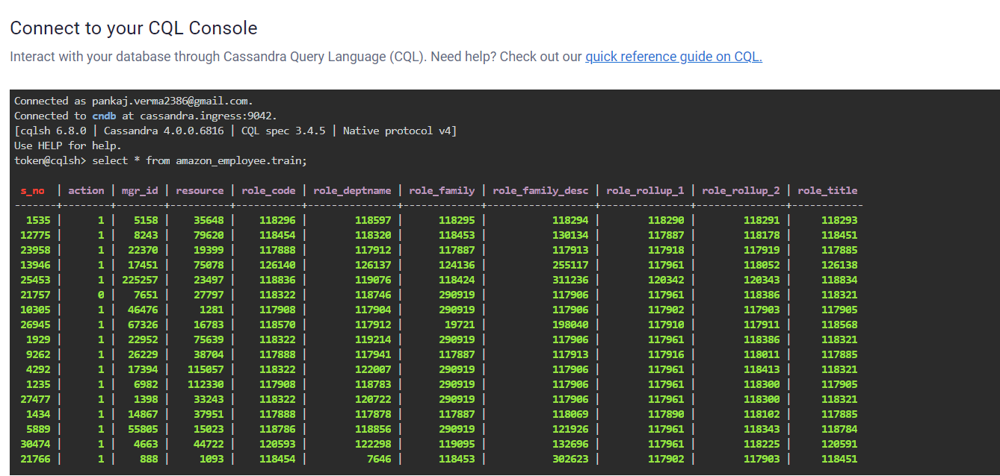

### Create Table for Test Dataset

In [19]:
try:
    def create_table():
        session.execute("DROP TABLE IF EXISTS amazon_employee.test;")
        lg.info('Creating Table...\n')
        query = """CREATE TABLE amazon_employee.test(id bigint, resource bigint, mgr_id bigint,
            role_rollup_1 bigint, role_rollup_2 bigint, role_deptname bigint, role_title bigint,
            role_family_desc bigint, role_family bigint, role_code bigint, primary key(id));"""
        session.execute(query)
        lg.info('Table Created!')
except Exception as e:
    lg.info(e)
    print(str(e))

In [21]:
create_table()

2022-06-20 14:22:38,462 - Creating Table...

2022-06-20 14:22:43,500 - Table Created!


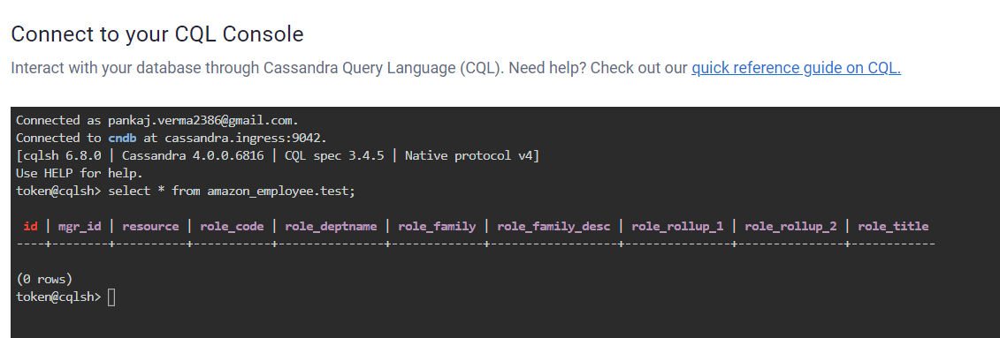

### Insert Data into Test Table

In [22]:
def insert_data():
    try:
        with open("test.csv", "r") as data:
            lg.info('Start record insertion.....\n')
            next(data)
            data_csv = csv.reader(data, delimiter='\n')
            all_value = []
            for i in data_csv:
                all_value.append(i[0].split(','))
        test_data = []
        for i in all_value:
            test_data.append([int(j) for j in i])
        for i in test_data:
            query = """INSERT INTO amazon_employee.test(id, resource, mgr_id, role_rollup_1,
                            role_rollup_2, role_deptname, role_title, role_family_desc,
                            role_family, role_code) VALUES(%s,%s,%s,%s,%s,%s,%s,%s,%s,%s)"""
            session.execute(query, i)
            lg.info(f'Record {i} Inserted!')
        lg.info('Record Insertion Completed!!')
    except Exception as e:
        lg.info(e)
        print(str(e))

In [23]:
insert_data()

2022-06-20 14:22:45,943 - Start record insertion.....

2022-06-20 14:22:46,553 - Record [1, 78766, 72734, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 14:22:46,825 - Record [2, 40644, 4378, 117961, 118327, 118507, 118863, 122008, 118398, 118865] Inserted!
2022-06-20 14:22:47,093 - Record [3, 75443, 2395, 117961, 118300, 119488, 118172, 301534, 249618, 118175] Inserted!
2022-06-20 14:22:47,355 - Record [4, 43219, 19986, 117961, 118225, 118403, 120773, 136187, 118960, 120774] Inserted!
2022-06-20 14:22:47,608 - Record [5, 42093, 50015, 117961, 118343, 119598, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 14:22:47,947 - Record [6, 44722, 1755, 117961, 117962, 119223, 125793, 146749, 118643, 125795] Inserted!
2022-06-20 14:22:48,201 - Record [7, 75834, 21135, 117961, 118343, 123494, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 14:22:48,463 - Record [8, 4675, 3077, 117961, 118300, 120312, 124194, 124195, 118363, 124196] Inserted!
2022-06-20 14:2

2022-06-20 14:23:04,854 - Record [71, 27295, 4933, 117961, 118300, 118458, 307024, 301218, 118331, 118332] Inserted!
2022-06-20 14:23:05,116 - Record [72, 45519, 13845, 117961, 117962, 118791, 118792, 211906, 118424, 118794] Inserted!
2022-06-20 14:23:05,381 - Record [73, 42481, 101834, 119134, 119135, 118042, 118207, 200069, 270488, 118209] Inserted!
2022-06-20 14:23:05,638 - Record [74, 74995, 2541, 117961, 118343, 118856, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:23:05,895 - Record [75, 14937, 5739, 117961, 118446, 118684, 118924, 140784, 118667, 118926] Inserted!
2022-06-20 14:23:06,145 - Record [76, 40338, 1411, 117902, 117903, 118437, 123670, 305057, 121916, 123672] Inserted!
2022-06-20 14:23:06,393 - Record [77, 79121, 16972, 117961, 118300, 119987, 118523, 310608, 118331, 118525] Inserted!
2022-06-20 14:23:06,649 - Record [78, 22471, 15412, 117961, 118343, 127705, 119849, 127706, 118638, 119851] Inserted!
2022-06-20 14:23:06,909 - Record [79, 78422, 15894, 117961,

2022-06-20 14:23:23,009 - Record [141, 4675, 7551, 117961, 118052, 118867, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:23:23,272 - Record [142, 38469, 105262, 118953, 118954, 118246, 179731, 291378, 117887, 117973] Inserted!
2022-06-20 14:23:23,529 - Record [143, 79325, 7445, 117961, 118343, 122299, 179731, 118054, 117887, 117973] Inserted!
2022-06-20 14:23:23,785 - Record [144, 20364, 15764, 91261, 118026, 119362, 119065, 158390, 118667, 119067] Inserted!
2022-06-20 14:23:24,045 - Record [145, 27323, 7076, 117961, 118225, 119238, 119093, 139668, 119095, 119096] Inserted!
2022-06-20 14:23:24,308 - Record [146, 302049, 2590, 118169, 118170, 118556, 117946, 125711, 292795, 117948] Inserted!
2022-06-20 14:23:24,572 - Record [147, 18072, 18080, 117961, 119256, 119257, 117946, 118806, 292795, 117948] Inserted!
2022-06-20 14:23:24,834 - Record [148, 39327, 15504, 117961, 118386, 123656, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 14:23:25,083 - Record [149, 33248, 3085, 

2022-06-20 14:23:42,354 - Record [211, 79092, 3656, 117961, 118300, 118631, 118924, 153285, 118667, 118926] Inserted!
2022-06-20 14:23:42,614 - Record [212, 967, 15459, 118169, 118170, 135245, 259173, 143905, 292795, 118943] Inserted!
2022-06-20 14:23:42,879 - Record [213, 42093, 5186, 118887, 118888, 124656, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 14:23:43,132 - Record [214, 16988, 15608, 117961, 118343, 118395, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 14:23:43,382 - Record [215, 5334, 771, 117961, 118300, 120722, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:23:43,652 - Record [216, 74190, 1443, 117961, 118343, 120722, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:23:43,907 - Record [217, 7543, 7398, 117961, 118225, 119924, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 14:23:44,169 - Record [218, 20351, 1938, 117961, 118300, 118066, 179731, 304465, 117887, 117973] Inserted!
2022-06-20 14:23:44,436 - Record [219, 33147, 2014, 117961,

2022-06-20 14:24:01,442 - Record [281, 17249, 4887, 117961, 118343, 119598, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 14:24:01,698 - Record [282, 17296, 23224, 117961, 118225, 120535, 123067, 269406, 118398, 123068] Inserted!
2022-06-20 14:24:01,962 - Record [283, 79299, 51755, 119280, 119281, 118754, 118805, 118806, 118474, 118807] Inserted!
2022-06-20 14:24:02,222 - Record [284, 16219, 4004, 117961, 118343, 118856, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:24:02,474 - Record [285, 6215, 6217, 117961, 118327, 118328, 120765, 120765, 118467, 120767] Inserted!
2022-06-20 14:24:02,758 - Record [286, 44812, 70264, 117961, 118343, 120722, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 14:24:03,013 - Record [287, 4675, 3756, 117961, 117969, 118970, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 14:24:03,282 - Record [288, 39883, 15895, 117961, 118052, 120677, 122067, 300136, 118424, 122069] Inserted!
2022-06-20 14:24:03,543 - Record [289, 39450, 3936, 11

2022-06-20 14:24:19,623 - Record [351, 79092, 7001, 117961, 118327, 118933, 121594, 302830, 4673, 121596] Inserted!
2022-06-20 14:24:19,882 - Record [352, 4675, 7639, 117961, 118300, 118957, 117905, 172635, 290919, 117908] Inserted!
2022-06-20 14:24:20,129 - Record [353, 35788, 82613, 117961, 118300, 119984, 118890, 311441, 118398, 118892] Inserted!
2022-06-20 14:24:20,385 - Record [354, 31661, 7032, 117961, 118052, 118992, 118259, 133680, 290919, 118261] Inserted!
2022-06-20 14:24:20,645 - Record [355, 78175, 1140, 117961, 117962, 118352, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:24:20,914 - Record [356, 79121, 2270, 117961, 118413, 118631, 123737, 127475, 118960, 123738] Inserted!
2022-06-20 14:24:21,179 - Record [357, 80903, 2819, 117961, 118300, 123472, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:24:21,437 - Record [358, 78311, 54672, 117932, 117933, 117878, 117899, 121756, 19721, 117900] Inserted!
2022-06-20 14:24:21,698 - Record [359, 25569, 214, 117961,

2022-06-20 14:24:37,852 - Record [421, 4675, 5620, 121005, 151110, 5606, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:24:38,133 - Record [422, 37651, 13386, 118219, 118220, 118221, 118568, 268194, 19721, 118570] Inserted!
2022-06-20 14:24:38,395 - Record [423, 33642, 56776, 117916, 117917, 117920, 118568, 131694, 19721, 118570] Inserted!
2022-06-20 14:24:38,653 - Record [424, 37737, 25514, 117918, 117919, 118483, 117879, 121445, 19721, 117880] Inserted!
2022-06-20 14:24:38,934 - Record [425, 23964, 61062, 117961, 118446, 120368, 119849, 219966, 118638, 119851] Inserted!
2022-06-20 14:24:39,200 - Record [426, 16767, 3526, 117961, 118225, 120323, 119093, 152422, 119095, 119096] Inserted!
2022-06-20 14:24:39,456 - Record [427, 74156, 7520, 91261, 118026, 124725, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:24:39,719 - Record [428, 81070, 5496, 91261, 118026, 118202, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:24:39,980 - Record [429, 25326, 3767, 120864, 

2022-06-20 14:24:56,172 - Record [491, 17308, 47104, 117890, 117891, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 14:24:56,428 - Record [492, 23096, 69507, 126918, 126919, 118042, 118043, 146409, 270488, 118046] Inserted!
2022-06-20 14:24:56,687 - Record [493, 21719, 18027, 117961, 117969, 120620, 120621, 120622, 19793, 120623] Inserted!
2022-06-20 14:24:56,934 - Record [494, 39474, 7459, 5110, 117954, 122672, 125751, 135104, 118870, 125753] Inserted!
2022-06-20 14:24:57,191 - Record [495, 18913, 13742, 117929, 117940, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 14:24:57,452 - Record [496, 4675, 7032, 117961, 118225, 120551, 133306, 133307, 118205, 133308] Inserted!
2022-06-20 14:24:57,700 - Record [497, 26808, 46503, 120140, 120141, 118378, 120952, 202760, 118453, 120954] Inserted!
2022-06-20 14:24:57,955 - Record [498, 40391, 42230, 117961, 118327, 118744, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:24:58,212 - Record [499, 3853, 3085, 1179

2022-06-20 14:25:14,379 - Record [561, 79299, 36958, 122532, 122533, 118171, 259173, 208153, 292795, 118943] Inserted!
2022-06-20 14:25:14,642 - Record [562, 23489, 5053, 117961, 118300, 121108, 120344, 267189, 118424, 120346] Inserted!
2022-06-20 14:25:14,901 - Record [563, 25570, 32, 117961, 118343, 118514, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:25:15,175 - Record [564, 967, 15510, 118169, 118170, 134743, 130479, 137505, 119784, 130481] Inserted!
2022-06-20 14:25:15,432 - Record [565, 75078, 24974, 91261, 118026, 118027, 119529, 123357, 119006, 119531] Inserted!
2022-06-20 14:25:15,691 - Record [566, 17849, 17858, 117961, 118386, 118673, 119976, 123220, 19793, 119978] Inserted!
2022-06-20 14:25:15,947 - Record [567, 278393, 22819, 117961, 118225, 119136, 118702, 140153, 118704, 118705] Inserted!
2022-06-20 14:25:16,203 - Record [568, 45904, 17973, 118006, 118007, 118810, 122952, 305581, 19793, 122954] Inserted!
2022-06-20 14:25:16,448 - Record [569, 78320, 71984, 118

2022-06-20 14:25:32,675 - Record [631, 72345, 8168, 117961, 118386, 119954, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 14:25:32,934 - Record [632, 23096, 4004, 117961, 118343, 118856, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:25:33,201 - Record [633, 35793, 1605, 117961, 118327, 128935, 118396, 235280, 118398, 118399] Inserted!
2022-06-20 14:25:33,462 - Record [634, 34810, 49961, 117961, 118225, 118403, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:25:33,712 - Record [635, 78730, 17930, 117961, 118446, 118810, 118811, 120605, 19793, 118813] Inserted!
2022-06-20 14:25:33,976 - Record [636, 6195, 1146, 117961, 118225, 120663, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 14:25:34,234 - Record [637, 27230, 49850, 117961, 118413, 122007, 118259, 118260, 290919, 118261] Inserted!
2022-06-20 14:25:34,481 - Record [638, 81350, 4419, 117961, 118300, 118458, 118293, 118302, 118295, 118296] Inserted!
2022-06-20 14:25:34,746 - Record [639, 20218, 15381, 11

2022-06-20 14:25:50,902 - Record [701, 28149, 81903, 118315, 118316, 118317, 307024, 310608, 118331, 118332] Inserted!
2022-06-20 14:25:51,156 - Record [702, 44641, 5225, 117961, 118343, 118458, 120006, 311622, 118424, 120008] Inserted!
2022-06-20 14:25:51,413 - Record [703, 13878, 17002, 5110, 117954, 117895, 117899, 117897, 19721, 117900] Inserted!
2022-06-20 14:25:51,664 - Record [704, 75957, 45165, 117902, 117903, 118341, 118028, 118368, 117887, 118030] Inserted!
2022-06-20 14:25:51,918 - Record [705, 18255, 1443, 117961, 118343, 120722, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:25:52,179 - Record [706, 20231, 15586, 119280, 119281, 118623, 126684, 193644, 292795, 126685] Inserted!
2022-06-20 14:25:52,441 - Record [707, 32270, 4952, 117961, 118343, 120126, 123615, 133686, 118424, 123617] Inserted!
2022-06-20 14:25:52,700 - Record [708, 79121, 3085, 117961, 118300, 127284, 118826, 236735, 118424, 118828] Inserted!
2022-06-20 14:25:52,957 - Record [709, 25993, 25687, 11

2022-06-20 14:26:09,205 - Record [771, 20364, 2395, 117961, 118300, 123055, 118834, 127160, 118424, 118836] Inserted!
2022-06-20 14:26:09,464 - Record [772, 20294, 53250, 117890, 117891, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 14:26:09,723 - Record [773, 25322, 93163, 118163, 118164, 117878, 117885, 117879, 117887, 117888] Inserted!
2022-06-20 14:26:09,978 - Record [774, 73144, 16125, 117961, 118052, 120304, 118459, 156072, 249618, 118461] Inserted!
2022-06-20 14:26:10,231 - Record [775, 2997, 770, 117961, 118300, 118437, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 14:26:10,491 - Record [776, 32642, 46646, 119280, 119281, 117945, 126684, 193644, 292795, 126685] Inserted!
2022-06-20 14:26:10,744 - Record [777, 39332, 205, 117961, 118386, 118746, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 14:26:11,002 - Record [778, 36348, 7133, 117961, 118327, 118320, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 14:26:11,261 - Record [779, 40867, 17451, 117

2022-06-20 14:26:27,438 - Record [841, 20364, 3963, 117961, 118300, 125872, 120344, 311360, 118424, 120346] Inserted!
2022-06-20 14:26:27,687 - Record [842, 38704, 84558, 117893, 117894, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 14:26:27,944 - Record [843, 42093, 5113, 117961, 118300, 119890, 120497, 258776, 118424, 120499] Inserted!
2022-06-20 14:26:28,198 - Record [844, 20271, 90027, 117916, 118150, 118599, 179731, 131017, 117887, 117973] Inserted!
2022-06-20 14:26:28,463 - Record [845, 74001, 27872, 118090, 118091, 117912, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 14:26:28,715 - Record [846, 74549, 4567, 117961, 118300, 118514, 118278, 118260, 290919, 118279] Inserted!
2022-06-20 14:26:28,995 - Record [847, 36463, 7796, 118573, 118574, 118623, 118995, 129731, 292795, 118997] Inserted!
2022-06-20 14:26:29,256 - Record [848, 45903, 3883, 117961, 118343, 119987, 118536, 132799, 308574, 118539] Inserted!
2022-06-20 14:26:29,525 - Record [849, 33147, 27104, 

2022-06-20 14:26:45,672 - Record [911, 19722, 2942, 117961, 118343, 119195, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:26:45,943 - Record [912, 25322, 123367, 117932, 117933, 117878, 118568, 167210, 19721, 118570] Inserted!
2022-06-20 14:26:46,199 - Record [913, 15672, 7339, 117961, 118300, 118360, 124194, 130884, 118363, 124196] Inserted!
2022-06-20 14:26:46,448 - Record [914, 28581, 7364, 117902, 117903, 119181, 117905, 118036, 290919, 117908] Inserted!
2022-06-20 14:26:46,703 - Record [915, 31247, 782, 117961, 118413, 127522, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 14:26:46,969 - Record [916, 73561, 2818, 119062, 119091, 6104, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 14:26:47,248 - Record [917, 39518, 7807, 117961, 118327, 118518, 120097, 124862, 270488, 120099] Inserted!
2022-06-20 14:26:47,510 - Record [918, 5390, 814, 118887, 118888, 123719, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:26:47,772 - Record [919, 26430, 49632, 118212,

2022-06-20 14:27:04,500 - Record [981, 42362, 46254, 117961, 118327, 126310, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 14:27:04,760 - Record [982, 30932, 4474, 117961, 118446, 119064, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 14:27:05,018 - Record [983, 4675, 1816, 117961, 118413, 122007, 120690, 136365, 290919, 120692] Inserted!
2022-06-20 14:27:05,273 - Record [984, 15668, 2583, 118752, 118753, 117945, 118274, 128130, 292795, 118276] Inserted!
2022-06-20 14:27:05,533 - Record [985, 45192, 6284, 118212, 118213, 120551, 117905, 134159, 290919, 117908] Inserted!
2022-06-20 14:27:05,782 - Record [986, 91176, 7016, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:27:06,060 - Record [987, 4675, 7525, 117961, 118225, 120551, 118321, 118406, 290919, 118322] Inserted!
2022-06-20 14:27:06,323 - Record [988, 73580, 3242, 117961, 118343, 118514, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:27:06,582 - Record [989, 45856, 5568, 12178

2022-06-20 14:27:22,430 - Record [1050, 75078, 7660, 117961, 118386, 121961, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:27:22,697 - Record [1051, 80320, 2395, 117961, 118300, 123055, 118728, 301534, 118295, 118730] Inserted!
2022-06-20 14:27:22,953 - Record [1052, 42093, 55119, 119062, 119091, 123125, 134095, 300136, 118474, 118475] Inserted!
2022-06-20 14:27:23,212 - Record [1053, 27082, 49961, 117961, 118225, 124380, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:27:23,472 - Record [1054, 37410, 58925, 118212, 119763, 128350, 128351, 144111, 118347, 128353] Inserted!
2022-06-20 14:27:23,730 - Record [1055, 19310, 47858, 5110, 117954, 117878, 117885, 117955, 117887, 117888] Inserted!
2022-06-20 14:27:23,997 - Record [1056, 42805, 9959, 118742, 118743, 117920, 118568, 127564, 19721, 118570] Inserted!
2022-06-20 14:27:24,260 - Record [1057, 76626, 2938, 117961, 118413, 122007, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:27:24,511 - Record [1058, 37622, 

2022-06-20 14:27:40,446 - Record [1119, 30999, 17930, 117961, 118446, 128742, 118811, 120605, 19793, 118813] Inserted!
2022-06-20 14:27:40,702 - Record [1120, 15064, 17654, 117961, 118052, 118229, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 14:27:40,951 - Record [1121, 79092, 3889, 117961, 118386, 121668, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 14:27:41,211 - Record [1122, 1937, 2017, 117961, 118052, 121645, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 14:27:41,470 - Record [1123, 36429, 43588, 117961, 119256, 119257, 118995, 122492, 292795, 118997] Inserted!
2022-06-20 14:27:41,732 - Record [1124, 25287, 4500, 117961, 118052, 118881, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:27:41,996 - Record [1125, 37785, 311203, 118212, 118213, 121716, 121372, 221283, 119184, 121374] Inserted!
2022-06-20 14:27:42,247 - Record [1126, 15716, 58910, 117902, 118041, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 14:27:42,500 - Record [1127, 1536

2022-06-20 14:27:58,403 - Record [1188, 32642, 58702, 118256, 118257, 117945, 126684, 280788, 292795, 126685] Inserted!
2022-06-20 14:27:58,671 - Record [1189, 732, 770, 117961, 118300, 120722, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 14:27:58,928 - Record [1190, 42093, 8229, 117961, 118300, 28618, 119351, 149246, 3130, 119353] Inserted!
2022-06-20 14:27:59,182 - Record [1191, 16985, 5053, 117961, 118300, 121108, 120344, 267189, 118424, 120346] Inserted!
2022-06-20 14:27:59,940 - Record [1192, 27323, 54635, 117961, 118225, 119238, 119093, 150341, 119095, 119096] Inserted!
2022-06-20 14:28:00,196 - Record [1193, 74343, 15888, 118595, 118596, 81476, 120344, 233010, 118424, 120346] Inserted!
2022-06-20 14:28:00,450 - Record [1194, 18418, 3763, 117961, 118300, 120059, 120812, 310589, 118638, 120814] Inserted!
2022-06-20 14:28:00,708 - Record [1195, 17308, 17603, 118541, 118542, 117945, 128903, 126800, 292795, 128905] Inserted!
2022-06-20 14:28:00,968 - Record [1196, 42972, 2976

2022-06-20 14:28:16,731 - Record [1257, 76860, 25558, 118990, 118991, 118992, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 14:28:16,994 - Record [1258, 33054, 8229, 117961, 118300, 28618, 119351, 149246, 3130, 119353] Inserted!
2022-06-20 14:28:17,252 - Record [1259, 36050, 56744, 117961, 118386, 118635, 118636, 310589, 118638, 118639] Inserted!
2022-06-20 14:28:17,509 - Record [1260, 4675, 49577, 117961, 118327, 118933, 118321, 153318, 290919, 118322] Inserted!
2022-06-20 14:28:17,774 - Record [1261, 42508, 3239, 117961, 118300, 118597, 123178, 159048, 3130, 123180] Inserted!
2022-06-20 14:28:18,030 - Record [1262, 20299, 19858, 117929, 117940, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 14:28:18,287 - Record [1263, 37942, 78024, 118181, 118182, 118221, 117885, 117886, 117887, 117888] Inserted!
2022-06-20 14:28:18,549 - Record [1264, 35525, 17002, 5110, 117954, 117895, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 14:28:18,832 - Record [1265, 27082, 6157,

2022-06-20 14:28:34,711 - Record [1326, 34950, 7807, 117961, 118327, 118518, 118207, 190710, 270488, 118209] Inserted!
2022-06-20 14:28:34,973 - Record [1327, 203, 4589, 117961, 118327, 120383, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 14:28:35,234 - Record [1328, 19722, 770, 117961, 118300, 119181, 179731, 133969, 117887, 117973] Inserted!
2022-06-20 14:28:35,489 - Record [1329, 27082, 16822, 117961, 118300, 118535, 118536, 118537, 308574, 118539] Inserted!
2022-06-20 14:28:35,750 - Record [1330, 18278, 26320, 117961, 118327, 118391, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 14:28:36,004 - Record [1331, 39939, 23255, 117961, 118225, 119136, 120056, 255657, 118474, 120058] Inserted!
2022-06-20 14:28:36,260 - Record [1332, 36575, 17727, 118169, 118170, 118171, 118172, 118173, 249618, 118175] Inserted!
2022-06-20 14:28:36,520 - Record [1333, 74735, 50589, 118079, 118080, 117878, 117879, 121386, 19721, 117880] Inserted!
2022-06-20 14:28:36,780 - Record [1334, 33996, 

2022-06-20 14:28:52,736 - Record [1395, 112338, 4972, 117961, 118052, 118395, 120647, 311441, 118398, 120649] Inserted!
2022-06-20 14:28:52,994 - Record [1396, 39628, 3645, 117961, 118300, 118631, 124576, 124577, 118424, 124578] Inserted!
2022-06-20 14:28:53,242 - Record [1397, 43906, 8074, 117961, 118300, 119181, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 14:28:53,496 - Record [1398, 1020, 3768, 117961, 118327, 118862, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 14:28:53,757 - Record [1399, 136, 4565, 117961, 118386, 121961, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 14:28:54,015 - Record [1400, 27829, 56193, 117961, 118300, 120410, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 14:28:54,281 - Record [1401, 84071, 24926, 91261, 118026, 118229, 273308, 120072, 249618, 118232] Inserted!
2022-06-20 14:28:54,543 - Record [1402, 18418, 23118, 117961, 118343, 118833, 118834, 309123, 118424, 118836] Inserted!
2022-06-20 14:28:54,792 - Record [1403, 18418, 4

2022-06-20 14:29:10,793 - Record [1464, 15022, 2612, 117961, 118386, 123901, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:29:11,052 - Record [1465, 33151, 51342, 117961, 118343, 118609, 120097, 174445, 270488, 120099] Inserted!
2022-06-20 14:29:11,302 - Record [1466, 39615, 2931, 117961, 118343, 118700, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 14:29:11,574 - Record [1467, 7543, 53190, 117961, 118300, 19772, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 14:29:11,831 - Record [1468, 4675, 81794, 117961, 118052, 119972, 122551, 159682, 118762, 122552] Inserted!
2022-06-20 14:29:12,092 - Record [1469, 31825, 16838, 117961, 118413, 120370, 307024, 310608, 118331, 118332] Inserted!
2022-06-20 14:29:12,346 - Record [1470, 20733, 79474, 117916, 118150, 117920, 120132, 154083, 120134, 120135] Inserted!
2022-06-20 14:29:12,607 - Record [1471, 42093, 5053, 117961, 118300, 121108, 120344, 267189, 118424, 120346] Inserted!
2022-06-20 14:29:12,854 - Record [1472, 42031,

2022-06-20 14:29:28,702 - Record [1533, 80564, 6235, 117961, 118343, 118437, 124194, 249872, 118363, 124196] Inserted!
2022-06-20 14:29:28,959 - Record [1534, 80445, 3883, 117961, 118343, 119987, 118536, 132799, 308574, 118539] Inserted!
2022-06-20 14:29:29,231 - Record [1535, 4675, 15918, 117961, 118327, 118320, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 14:29:29,491 - Record [1536, 74982, 1530, 117961, 118300, 119984, 118890, 311441, 118398, 118892] Inserted!
2022-06-20 14:29:29,762 - Record [1537, 5371, 7014, 117961, 118446, 119961, 118259, 118260, 290919, 118261] Inserted!
2022-06-20 14:29:30,013 - Record [1538, 15740, 15918, 117961, 118327, 118320, 120690, 136365, 290919, 120692] Inserted!
2022-06-20 14:29:30,280 - Record [1539, 40456, 724, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:29:30,535 - Record [1540, 17308, 5244, 117961, 118343, 119598, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:29:30,803 - Record [1541, 27714, 16

2022-06-20 14:29:46,647 - Record [1602, 35498, 7615, 117961, 118300, 120059, 118777, 132558, 308574, 118779] Inserted!
2022-06-20 14:29:46,909 - Record [1603, 80714, 7398, 117961, 118225, 119924, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:29:47,167 - Record [1604, 38708, 6444, 118114, 118115, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 14:29:47,422 - Record [1605, 16218, 8607, 117961, 118225, 118403, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 14:29:47,695 - Record [1606, 20364, 17250, 117961, 118300, 125872, 118826, 236735, 118424, 118828] Inserted!
2022-06-20 14:29:47,947 - Record [1607, 7678, 5560, 118256, 118257, 117945, 259173, 280788, 292795, 118943] Inserted!
2022-06-20 14:29:48,201 - Record [1608, 31661, 54618, 117961, 118052, 118821, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:29:48,468 - Record [1609, 18072, 58711, 117961, 119256, 120943, 118995, 118806, 292795, 118997] Inserted!
2022-06-20 14:29:48,722 - Record [1610, 20897,

2022-06-20 14:30:04,585 - Record [1671, 14354, 2078, 118114, 118115, 117920, 118568, 125937, 19721, 118570] Inserted!
2022-06-20 14:30:04,846 - Record [1672, 33054, 13799, 117961, 118052, 120356, 120357, 310997, 118424, 120359] Inserted!
2022-06-20 14:30:05,104 - Record [1673, 1115, 6995, 117961, 117962, 118352, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:30:05,358 - Record [1674, 75047, 83216, 91261, 118026, 118317, 118278, 118260, 290919, 118279] Inserted!
2022-06-20 14:30:05,622 - Record [1675, 18072, 22854, 117902, 118041, 131461, 119778, 174194, 19721, 119779] Inserted!
2022-06-20 14:30:05,887 - Record [1676, 79934, 6235, 117961, 118343, 118437, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 14:30:06,157 - Record [1677, 36020, 118906, 117951, 118907, 117878, 119077, 117886, 118372, 119079] Inserted!
2022-06-20 14:30:06,409 - Record [1678, 6977, 7411, 117961, 118386, 118746, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 14:30:06,669 - Record [1679, 43302, 1

2022-06-20 14:30:22,505 - Record [1740, 2341, 196, 117961, 118413, 121639, 129909, 130134, 118453, 129911] Inserted!
2022-06-20 14:30:22,770 - Record [1741, 29304, 82284, 118953, 118954, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 14:30:23,037 - Record [1742, 25993, 25629, 117961, 118343, 120291, 120006, 129545, 118424, 120008] Inserted!
2022-06-20 14:30:23,300 - Record [1743, 77993, 8121, 91261, 118026, 118746, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:30:23,558 - Record [1744, 74909, 5511, 117961, 118386, 120361, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:30:23,812 - Record [1745, 79092, 33, 117961, 118413, 118501, 144353, 144354, 118504, 144355] Inserted!
2022-06-20 14:30:24,076 - Record [1746, 74961, 8204, 117961, 118052, 118867, 118054, 305057, 117887, 118055] Inserted!
2022-06-20 14:30:24,335 - Record [1747, 6977, 6047, 117961, 118413, 120370, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 14:30:24,584 - Record [1748, 25703, 20183

2022-06-20 14:30:40,430 - Record [1809, 45444, 1605, 117961, 118327, 128935, 118396, 235280, 118398, 118399] Inserted!
2022-06-20 14:30:40,690 - Record [1810, 32032, 49626, 117961, 118327, 129972, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:30:40,953 - Record [1811, 16008, 8164, 117961, 118327, 120685, 118641, 123881, 118643, 118644] Inserted!
2022-06-20 14:30:41,221 - Record [1812, 35068, 6035, 117890, 117891, 117878, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 14:30:41,479 - Record [1813, 6921, 5313, 117961, 118386, 120356, 120357, 201020, 118424, 120359] Inserted!
2022-06-20 14:30:41,729 - Record [1814, 34056, 70062, 117961, 118386, 118746, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:30:41,985 - Record [1815, 79328, 17733, 117961, 118300, 119984, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 14:30:42,243 - Record [1816, 25416, 19857, 117929, 117940, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 14:30:42,505 - Record [1817, 75047, 

2022-06-20 14:30:58,609 - Record [1878, 79969, 59765, 117961, 118386, 118317, 118523, 294485, 118331, 118525] Inserted!
2022-06-20 14:30:58,859 - Record [1879, 16443, 3281, 117961, 118225, 119238, 122849, 120324, 119095, 122850] Inserted!
2022-06-20 14:30:59,112 - Record [1880, 28586, 23262, 118595, 118596, 81476, 118834, 140185, 118424, 118836] Inserted!
2022-06-20 14:30:59,378 - Record [1881, 78563, 17227, 117961, 118343, 118979, 118826, 158101, 118424, 118828] Inserted!
2022-06-20 14:30:59,639 - Record [1882, 278393, 12394, 119134, 119135, 125821, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 14:30:59,892 - Record [1883, 74555, 58916, 117961, 118327, 118391, 120172, 230830, 290919, 120173] Inserted!
2022-06-20 14:31:00,157 - Record [1884, 31492, 19832, 117961, 118386, 123757, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:31:00,414 - Record [1885, 16767, 16850, 117961, 118225, 119092, 119093, 120324, 119095, 119096] Inserted!
2022-06-20 14:31:00,676 - Record [1886, 2

2022-06-20 14:31:16,750 - Record [1947, 15938, 3692, 117961, 118413, 120370, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 14:31:17,000 - Record [1948, 42085, 11987, 118006, 118007, 118008, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 14:31:17,264 - Record [1949, 312039, 52426, 118887, 118888, 124656, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 14:31:17,530 - Record [1950, 1041, 1065, 117961, 118327, 121589, 118641, 118842, 118643, 118644] Inserted!
2022-06-20 14:31:17,807 - Record [1951, 13878, 53251, 117983, 117984, 117878, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 14:31:18,057 - Record [1952, 13878, 18236, 117961, 118052, 120304, 122297, 301475, 118331, 118899] Inserted!
2022-06-20 14:31:18,312 - Record [1953, 14914, 49384, 117961, 118343, 118609, 118728, 301534, 118295, 118730] Inserted!
2022-06-20 14:31:18,568 - Record [1954, 20701, 49655, 117961, 118446, 122550, 122551, 117906, 118762, 122552] Inserted!
2022-06-20 14:31:18,829 - Record [1955, 3870

2022-06-20 14:31:34,709 - Record [2016, 25328, 17223, 117961, 118225, 120535, 123067, 233714, 118398, 123068] Inserted!
2022-06-20 14:31:34,969 - Record [2017, 3124, 22835, 117961, 117969, 19666, 118396, 236551, 118398, 118399] Inserted!
2022-06-20 14:31:35,216 - Record [2018, 39879, 17059, 117902, 118041, 117945, 259173, 191237, 292795, 118943] Inserted!
2022-06-20 14:31:35,473 - Record [2019, 35502, 2395, 117961, 118300, 123055, 118728, 301534, 118295, 118730] Inserted!
2022-06-20 14:31:35,732 - Record [2020, 6692, 72209, 117961, 118225, 124948, 118747, 235735, 118453, 118749] Inserted!
2022-06-20 14:31:35,981 - Record [2021, 39392, 17209, 117961, 118052, 123144, 118396, 310598, 118398, 118399] Inserted!
2022-06-20 14:31:36,236 - Record [2022, 80696, 4341, 117961, 118300, 118957, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:31:36,495 - Record [2023, 75649, 70066, 91261, 118026, 118202, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:31:36,756 - Record [2024, 74310,

2022-06-20 14:31:52,616 - Record [2085, 27287, 27103, 117902, 117903, 120171, 118863, 183958, 118398, 118865] Inserted!
2022-06-20 14:31:52,877 - Record [2086, 7543, 7075, 119062, 119091, 143531, 117905, 118036, 290919, 117908] Inserted!
2022-06-20 14:31:53,137 - Record [2087, 23990, 125466, 117902, 117903, 120171, 120990, 262257, 118398, 120992] Inserted!
2022-06-20 14:31:53,407 - Record [2088, 34950, 7133, 117961, 118327, 118320, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 14:31:53,667 - Record [2089, 15730, 1398, 117961, 118300, 120722, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:31:53,935 - Record [2090, 76562, 16371, 117961, 118446, 118684, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:31:54,194 - Record [2091, 391, 58692, 117926, 118124, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 14:31:54,456 - Record [2092, 79343, 15435, 117961, 118343, 122299, 119949, 131270, 290919, 119951] Inserted!
2022-06-20 14:31:54,717 - Record [2093, 34780

2022-06-20 14:32:10,663 - Record [2154, 43305, 16642, 117961, 118300, 81476, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:32:10,920 - Record [2155, 15714, 57718, 117961, 119256, 120943, 118995, 118806, 292795, 118997] Inserted!
2022-06-20 14:32:11,182 - Record [2156, 45981, 8607, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:32:11,443 - Record [2157, 36789, 29758, 118120, 118121, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 14:32:11,703 - Record [2158, 40391, 70297, 117961, 118327, 118744, 118259, 120721, 290919, 118261] Inserted!
2022-06-20 14:32:11,962 - Record [2159, 42362, 1065, 117961, 118327, 120559, 118641, 132791, 118643, 118644] Inserted!
2022-06-20 14:32:12,215 - Record [2160, 45603, 5016, 117961, 118343, 121710, 120789, 250337, 118424, 120791] Inserted!
2022-06-20 14:32:12,476 - Record [2161, 44944, 5238, 119596, 119597, 118053, 118207, 174445, 270488, 118209] Inserted!
2022-06-20 14:32:12,737 - Record [2162, 42093

2022-06-20 14:32:28,674 - Record [2223, 28294, 48956, 117961, 119256, 120356, 118028, 118368, 117887, 118030] Inserted!
2022-06-20 14:32:28,936 - Record [2224, 77659, 65834, 117983, 117984, 117878, 117879, 117913, 19721, 117880] Inserted!
2022-06-20 14:32:29,187 - Record [2225, 4675, 5507, 117961, 118413, 120370, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:32:29,477 - Record [2226, 43622, 7388, 117961, 118225, 119924, 118318, 168365, 118205, 118319] Inserted!
2022-06-20 14:32:29,731 - Record [2227, 73104, 1600, 117961, 118327, 118507, 118890, 311441, 118398, 118892] Inserted!
2022-06-20 14:32:29,982 - Record [2228, 17226, 7893, 117961, 118343, 118979, 118834, 133686, 118424, 118836] Inserted!
2022-06-20 14:32:30,240 - Record [2229, 6960, 6225, 117961, 118343, 118437, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:32:30,496 - Record [2230, 34924, 6124, 117961, 118343, 6104, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:32:30,744 - Record [2231, 73493, 5775

2022-06-20 14:32:46,602 - Record [2292, 7678, 15575, 117902, 118041, 118623, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 14:32:46,869 - Record [2293, 33248, 5039, 117961, 118343, 123125, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 14:32:47,129 - Record [2294, 26391, 2541, 117961, 118343, 118856, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:32:47,384 - Record [2295, 3853, 13827, 117961, 118343, 118514, 118777, 308574, 308574, 118779] Inserted!
2022-06-20 14:32:47,663 - Record [2296, 17226, 4909, 117961, 118300, 118458, 120344, 311701, 118424, 120346] Inserted!
2022-06-20 14:32:47,930 - Record [2297, 6977, 69637, 119062, 119091, 120410, 118278, 120411, 290919, 118279] Inserted!
2022-06-20 14:32:48,209 - Record [2298, 33054, 5114, 117961, 118300, 119890, 120344, 303717, 118424, 120346] Inserted!
2022-06-20 14:32:48,468 - Record [2299, 33054, 5313, 117961, 118052, 120356, 122067, 141493, 118424, 122069] Inserted!
2022-06-20 14:32:48,737 - Record [2300, 95755, 6

2022-06-20 14:33:04,757 - Record [2361, 34431, 4566, 119062, 119091, 118992, 118028, 130134, 117887, 118030] Inserted!
2022-06-20 14:33:05,043 - Record [2362, 38704, 46515, 11146, 118491, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 14:33:05,295 - Record [2363, 105472, 196, 117961, 118413, 121639, 121594, 131163, 4673, 121596] Inserted!
2022-06-20 14:33:05,560 - Record [2364, 20364, 52898, 118212, 118580, 119362, 119065, 159733, 118667, 119067] Inserted!
2022-06-20 14:33:05,822 - Record [2365, 44722, 3270, 117961, 118225, 122870, 118563, 123784, 270488, 118565] Inserted!
2022-06-20 14:33:06,081 - Record [2366, 17308, 16971, 117961, 118343, 119993, 125793, 125794, 118643, 125795] Inserted!
2022-06-20 14:33:06,340 - Record [2367, 1041, 1065, 117961, 118327, 126310, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 14:33:06,597 - Record [2368, 5112, 21303, 117961, 118300, 119890, 120348, 249620, 118295, 120350] Inserted!
2022-06-20 14:33:06,850 - Record [2369, 43876, 50

2022-06-20 14:33:22,801 - Record [2430, 13878, 59000, 118181, 118182, 117941, 117899, 117897, 19721, 117900] Inserted!
2022-06-20 14:33:23,061 - Record [2431, 76459, 54618, 117961, 118052, 118821, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:33:23,310 - Record [2432, 74001, 79825, 118090, 118091, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 14:33:23,563 - Record [2433, 73581, 16907, 117961, 117962, 134848, 124775, 134849, 122032, 124777] Inserted!
2022-06-20 14:33:23,824 - Record [2434, 32270, 7615, 117961, 118300, 120059, 118777, 132558, 308574, 118779] Inserted!
2022-06-20 14:33:24,074 - Record [2435, 6977, 820, 117961, 118300, 123719, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 14:33:24,327 - Record [2436, 39939, 43916, 117961, 118225, 119136, 119137, 120057, 118474, 119139] Inserted!
2022-06-20 14:33:24,592 - Record [2437, 25285, 27, 117961, 118413, 120370, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 14:33:24,852 - Record [2438, 3264, 722

2022-06-20 14:33:40,908 - Record [2499, 15716, 15540, 118573, 118574, 117945, 280788, 127423, 292795, 119082] Inserted!
2022-06-20 14:33:41,166 - Record [2500, 25753, 2685, 122880, 122974, 117945, 117946, 149467, 292795, 117948] Inserted!
2022-06-20 14:33:41,430 - Record [2501, 15030, 17713, 117961, 118225, 120663, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:33:41,698 - Record [2502, 28294, 15887, 117961, 118052, 120677, 120357, 310997, 118424, 120359] Inserted!
2022-06-20 14:33:41,959 - Record [2503, 79131, 7520, 117961, 118343, 124725, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:33:42,214 - Record [2504, 6215, 6216, 117961, 118327, 118328, 130857, 161026, 308574, 130858] Inserted!
2022-06-20 14:33:42,490 - Record [2505, 28149, 4202, 117961, 118052, 118706, 118523, 306404, 118331, 118525] Inserted!
2022-06-20 14:33:42,752 - Record [2506, 25305, 53049, 117961, 118052, 118229, 118054, 120514, 117887, 118055] Inserted!
2022-06-20 14:33:43,001 - Record [2507, 31825

2022-06-20 14:33:58,957 - Record [2568, 28360, 95479, 117961, 118327, 118492, 132692, 226262, 270488, 132694] Inserted!
2022-06-20 14:33:59,219 - Record [2569, 45378, 5197, 117961, 118343, 127491, 307024, 294485, 118331, 118332] Inserted!
2022-06-20 14:33:59,468 - Record [2570, 43873, 2014, 117961, 117962, 117904, 120773, 127525, 118960, 120774] Inserted!
2022-06-20 14:33:59,725 - Record [2571, 81350, 3860, 117961, 118446, 120317, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:33:59,984 - Record [2572, 44722, 4663, 117961, 118225, 120041, 120591, 132696, 119095, 120593] Inserted!
2022-06-20 14:34:00,246 - Record [2573, 6977, 7339, 117961, 118300, 118360, 118361, 118362, 118363, 118364] Inserted!
2022-06-20 14:34:00,503 - Record [2574, 42347, 52356, 117902, 117903, 119824, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:34:00,767 - Record [2575, 42093, 91868, 117961, 118343, 123454, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:34:01,027 - Record [2576, 20897,

2022-06-20 14:34:17,030 - Record [2637, 73815, 94615, 118315, 118463, 118522, 136701, 162182, 124487, 136702] Inserted!
2022-06-20 14:34:17,286 - Record [2638, 20273, 56006, 117890, 117891, 117878, 117885, 118069, 117887, 117888] Inserted!
2022-06-20 14:34:17,546 - Record [2639, 29304, 17116, 117980, 118076, 117920, 123191, 123191, 19721, 123192] Inserted!
2022-06-20 14:34:17,811 - Record [2640, 80667, 18686, 117961, 118386, 128823, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:34:18,072 - Record [2641, 15369, 4736, 117961, 118300, 118301, 307024, 204593, 118331, 118332] Inserted!
2022-06-20 14:34:18,334 - Record [2642, 39518, 70243, 117961, 118327, 118492, 118451, 125738, 118453, 118454] Inserted!
2022-06-20 14:34:18,592 - Record [2643, 45990, 32884, 118573, 118574, 117945, 117946, 129731, 292795, 117948] Inserted!
2022-06-20 14:34:18,854 - Record [2644, 33248, 61062, 117961, 118446, 120368, 119849, 219966, 118638, 119851] Inserted!
2022-06-20 14:34:19,132 - Record [2645, 74

2022-06-20 14:34:35,041 - Record [2706, 42085, 4998, 117961, 118343, 119598, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 14:34:35,330 - Record [2707, 41314, 7411, 117961, 118386, 118746, 118747, 152307, 118453, 118749] Inserted!
2022-06-20 14:34:35,579 - Record [2708, 28149, 16573, 117961, 118386, 123519, 125798, 140250, 125407, 125800] Inserted!
2022-06-20 14:34:35,834 - Record [2709, 75078, 7624, 117961, 118052, 119742, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:34:36,095 - Record [2710, 45652, 7338, 117961, 118225, 119924, 122551, 128532, 118762, 122552] Inserted!
2022-06-20 14:34:36,356 - Record [2711, 33209, 17930, 117961, 118446, 117945, 118811, 120605, 19793, 118813] Inserted!
2022-06-20 14:34:36,611 - Record [2712, 104693, 28152, 118315, 118463, 120361, 118784, 121926, 290919, 118786] Inserted!
2022-06-20 14:34:36,902 - Record [2713, 80574, 7683, 117887, 118178, 117945, 123670, 305057, 121916, 123672] Inserted!
2022-06-20 14:34:37,164 - Record [2714, 23921

2022-06-20 14:34:53,445 - Record [2775, 42093, 4189, 117961, 118343, 119987, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 14:34:53,705 - Record [2776, 43876, 50568, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 14:34:53,964 - Record [2777, 40000, 873, 117961, 118413, 120526, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 14:34:54,229 - Record [2778, 31441, 17225, 117961, 118300, 19772, 138019, 187788, 120518, 138021] Inserted!
2022-06-20 14:34:54,491 - Record [2779, 25270, 4838, 117961, 118343, 120126, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 14:34:54,740 - Record [2780, 38481, 56680, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 14:34:55,006 - Record [2781, 20271, 17992, 117916, 118011, 118810, 118054, 120238, 117887, 118055] Inserted!
2022-06-20 14:34:55,302 - Record [2782, 45378, 54290, 119301, 119302, 119303, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:34:55,560 - Record [2783, 40185, 

2022-06-20 14:35:11,534 - Record [2844, 73561, 2818, 119062, 119091, 6104, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:35:11,792 - Record [2845, 75078, 1350, 117961, 118052, 120096, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:35:12,053 - Record [2846, 3853, 3944, 117961, 118343, 118514, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:35:12,311 - Record [2847, 79092, 154, 117961, 118413, 121639, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:35:12,590 - Record [2848, 75241, 85475, 117961, 118300, 120410, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:35:12,850 - Record [2849, 25829, 49598, 117961, 118327, 119995, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 14:35:13,119 - Record [2850, 20222, 46616, 118256, 118257, 117945, 280788, 130913, 292795, 119082] Inserted!
2022-06-20 14:35:13,403 - Record [2851, 45790, 3053, 117961, 118225, 120663, 121594, 131163, 4673, 121596] Inserted!
2022-06-20 14:35:13,656 - Record [2852, 6104, 50963

2022-06-20 14:35:29,581 - Record [2913, 18418, 17270, 117961, 118300, 128830, 118826, 150790, 118424, 118828] Inserted!
2022-06-20 14:35:29,843 - Record [2914, 75463, 205, 117961, 118386, 118746, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:35:30,092 - Record [2915, 80483, 1443, 117961, 118343, 120722, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 14:35:30,364 - Record [2916, 1020, 18190, 117961, 118386, 119954, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:35:30,620 - Record [2917, 113914, 8088, 117961, 118413, 118481, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 14:35:30,883 - Record [2918, 21811, 18686, 117961, 118386, 121883, 117905, 172635, 290919, 117908] Inserted!
2022-06-20 14:35:31,149 - Record [2919, 27124, 3005, 117961, 118413, 118481, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:35:31,411 - Record [2920, 73815, 95845, 118315, 118463, 122636, 118465, 125758, 118467, 118468] Inserted!
2022-06-20 14:35:31,674 - Record [2921, 17249

2022-06-20 14:35:47,604 - Record [2982, 23990, 833, 118595, 118596, 119993, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:35:47,869 - Record [2983, 42093, 4914, 117961, 118300, 120026, 118834, 127160, 118424, 118836] Inserted!
2022-06-20 14:35:48,129 - Record [2984, 16018, 3883, 117961, 118343, 119987, 118536, 132799, 308574, 118539] Inserted!
2022-06-20 14:35:48,388 - Record [2985, 20732, 4620, 117961, 118300, 119181, 117905, 180083, 290919, 117908] Inserted!
2022-06-20 14:35:48,643 - Record [2986, 34615, 60121, 121785, 121786, 142145, 118321, 156948, 290919, 118322] Inserted!
2022-06-20 14:35:48,893 - Record [2987, 37089, 852, 117961, 117962, 122215, 121594, 302830, 4673, 121596] Inserted!
2022-06-20 14:35:49,165 - Record [2988, 32270, 20341, 117961, 118300, 125178, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 14:35:49,417 - Record [2989, 33054, 5178, 117961, 118343, 118660, 118826, 158101, 118424, 118828] Inserted!
2022-06-20 14:35:49,665 - Record [2990, 41497, 505

2022-06-20 14:36:05,597 - Record [3051, 2925, 2931, 117961, 118343, 119796, 117905, 172635, 290919, 117908] Inserted!
2022-06-20 14:36:05,857 - Record [3052, 43280, 54635, 117961, 118225, 119238, 122849, 120324, 119095, 122850] Inserted!
2022-06-20 14:36:06,110 - Record [3053, 38468, 28001, 117993, 117994, 117895, 117896, 117913, 117887, 117898] Inserted!
2022-06-20 14:36:06,376 - Record [3054, 20364, 5183, 118290, 118291, 119837, 118834, 169002, 118424, 118836] Inserted!
2022-06-20 14:36:06,666 - Record [3055, 27400, 22819, 117961, 118225, 119824, 121414, 132041, 118704, 121416] Inserted!
2022-06-20 14:36:06,931 - Record [3056, 80190, 14889, 117961, 118300, 118437, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:36:07,187 - Record [3057, 34924, 95479, 126974, 126975, 118492, 132692, 226262, 270488, 132694] Inserted!
2022-06-20 14:36:07,444 - Record [3058, 40867, 15061, 91261, 118026, 119507, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:36:07,697 - Record [3059, 7954

2022-06-20 14:36:23,581 - Record [3120, 25103, 16850, 117961, 118225, 119238, 119093, 120324, 119095, 119096] Inserted!
2022-06-20 14:36:23,841 - Record [3121, 39375, 18213, 117961, 118386, 118692, 118451, 200947, 118453, 118454] Inserted!
2022-06-20 14:36:24,090 - Record [3122, 75179, 20394, 117961, 118052, 118706, 120773, 305057, 118960, 120774] Inserted!
2022-06-20 14:36:24,344 - Record [3123, 7677, 20382, 117961, 118300, 124942, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 14:36:24,602 - Record [3124, 79092, 2849, 118887, 118888, 118395, 120006, 269406, 118424, 120008] Inserted!
2022-06-20 14:36:24,865 - Record [3125, 40867, 52856, 117961, 118052, 121949, 118207, 174445, 270488, 118209] Inserted!
2022-06-20 14:36:25,133 - Record [3126, 5173, 23347, 117961, 118052, 120671, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 14:36:25,389 - Record [3127, 5358, 6018, 117961, 118413, 122007, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 14:36:25,642 - Record [3128, 10577

2022-06-20 14:36:41,530 - Record [3189, 34950, 25255, 118595, 118596, 120299, 120300, 135124, 120302, 120303] Inserted!
2022-06-20 14:36:41,789 - Record [3190, 14570, 9378, 117910, 117911, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 14:36:42,039 - Record [3191, 17308, 70128, 118595, 118596, 81476, 118834, 153821, 118424, 118836] Inserted!
2022-06-20 14:36:42,307 - Record [3192, 77659, 52228, 117983, 117984, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 14:36:42,568 - Record [3193, 27180, 92288, 119062, 119091, 119303, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 14:36:42,828 - Record [3194, 44722, 59267, 117961, 117962, 120924, 307024, 306404, 118331, 118332] Inserted!
2022-06-20 14:36:43,081 - Record [3195, 34748, 1214, 119134, 119135, 120171, 117896, 136369, 117887, 117898] Inserted!
2022-06-20 14:36:43,343 - Record [3196, 40391, 13671, 117961, 118327, 118744, 118685, 137335, 308574, 118687] Inserted!
2022-06-20 14:36:43,609 - Record [3197, 76429

2022-06-20 14:36:59,611 - Record [3258, 1020, 27104, 117961, 118327, 118507, 120647, 304633, 118398, 120649] Inserted!
2022-06-20 14:36:59,860 - Record [3259, 79440, 134819, 121005, 121006, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 14:37:00,123 - Record [3260, 32270, 5323, 117961, 118343, 119598, 120006, 304736, 118424, 120008] Inserted!
2022-06-20 14:37:00,378 - Record [3261, 278393, 5234, 117961, 118343, 118660, 119433, 300136, 118424, 119435] Inserted!
2022-06-20 14:37:00,637 - Record [3262, 28149, 17460, 117961, 118052, 118867, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 14:37:00,887 - Record [3263, 25559, 49598, 117961, 118327, 119995, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 14:37:01,142 - Record [3264, 78563, 4125, 118887, 118888, 121108, 120006, 311746, 118424, 120008] Inserted!
2022-06-20 14:37:01,404 - Record [3265, 75472, 13782, 117961, 118343, 118395, 120647, 311441, 118398, 120649] Inserted!
2022-06-20 14:37:01,654 - Record [3266, 24

2022-06-20 14:37:17,547 - Record [3327, 25328, 111559, 117961, 118225, 119824, 118702, 129851, 118704, 118705] Inserted!
2022-06-20 14:37:17,807 - Record [3328, 18523, 25275, 117961, 118343, 121747, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:37:18,069 - Record [3329, 80788, 8234, 117961, 118300, 118783, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:37:18,343 - Record [3330, 32270, 4864, 117961, 118300, 123055, 120344, 310997, 118424, 120346] Inserted!
2022-06-20 14:37:18,595 - Record [3331, 34982, 5701, 117961, 118052, 118821, 118636, 310589, 118638, 118639] Inserted!
2022-06-20 14:37:18,844 - Record [3332, 25749, 46637, 118555, 118178, 119262, 117946, 119263, 292795, 117948] Inserted!
2022-06-20 14:37:19,114 - Record [3333, 41758, 28253, 118315, 118463, 123089, 118784, 128796, 290919, 118786] Inserted!
2022-06-20 14:37:19,382 - Record [3334, 34432, 54618, 117961, 118052, 118821, 118641, 123881, 118643, 118644] Inserted!
2022-06-20 14:37:19,645 - Record [3335, 37

2022-06-20 14:37:35,633 - Record [3396, 77203, 18080, 117961, 119256, 119257, 117946, 118806, 292795, 117948] Inserted!
2022-06-20 14:37:35,891 - Record [3397, 14570, 4560, 117890, 118102, 117878, 117899, 123862, 19721, 117900] Inserted!
2022-06-20 14:37:36,153 - Record [3398, 34688, 210, 117961, 118386, 118746, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 14:37:36,406 - Record [3399, 79353, 195311, 119301, 119302, 119303, 118784, 233216, 290919, 118786] Inserted!
2022-06-20 14:37:36,690 - Record [3400, 82371, 8115, 91261, 118026, 118202, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:37:36,947 - Record [3401, 27082, 60790, 117961, 118052, 118867, 118523, 310608, 118331, 118525] Inserted!
2022-06-20 14:37:37,201 - Record [3402, 79299, 123313, 118169, 118170, 125857, 117946, 125858, 292795, 117948] Inserted!
2022-06-20 14:37:37,466 - Record [3403, 4675, 210, 117961, 118386, 118746, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 14:37:37,725 - Record [3404, 15938, 

2022-06-20 14:37:53,692 - Record [3465, 43193, 7624, 117961, 118052, 119742, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:37:53,950 - Record [3466, 18418, 1038, 118887, 118888, 118889, 118863, 307233, 118398, 118865] Inserted!
2022-06-20 14:37:54,229 - Record [3467, 80313, 17730, 117961, 118052, 120096, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:37:54,488 - Record [3468, 998, 3077, 117961, 118300, 120312, 140847, 140848, 118363, 140849] Inserted!
2022-06-20 14:37:54,745 - Record [3469, 79092, 5001, 117961, 118300, 123007, 118826, 257115, 118424, 118828] Inserted!
2022-06-20 14:37:54,996 - Record [3470, 15672, 2781, 117961, 118300, 118783, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:37:55,248 - Record [3471, 34924, 5108, 117961, 118300, 118395, 118396, 233714, 118398, 118399] Inserted!
2022-06-20 14:37:55,507 - Record [3472, 17308, 4449, 117961, 118300, 118825, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 14:37:55,771 - Record [3473, 15672, 23

2022-06-20 14:38:11,589 - Record [3534, 79543, 49889, 118315, 118463, 118404, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:38:11,850 - Record [3535, 41952, 80499, 91261, 118026, 119734, 122345, 240337, 118667, 122346] Inserted!
2022-06-20 14:38:12,099 - Record [3536, 75834, 3145, 117961, 118300, 81476, 122274, 129658, 3130, 122275] Inserted!
2022-06-20 14:38:12,377 - Record [3537, 35423, 1325, 117961, 117962, 118910, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:38:12,625 - Record [3538, 20342, 14650, 118219, 118220, 117920, 117899, 117899, 19721, 117900] Inserted!
2022-06-20 14:38:12,875 - Record [3539, 79121, 17443, 118212, 118213, 119837, 179731, 306711, 117887, 117973] Inserted!
2022-06-20 14:38:13,143 - Record [3540, 38719, 50327, 118079, 118080, 117878, 117885, 118177, 117887, 117888] Inserted!
2022-06-20 14:38:13,402 - Record [3541, 80192, 20655, 117961, 118300, 123749, 123670, 305057, 121916, 123672] Inserted!
2022-06-20 14:38:13,661 - Record [3542, 4675, 3

2022-06-20 14:38:29,691 - Record [3603, 5893, 2003, 118441, 118442, 118552, 118028, 158422, 117887, 118030] Inserted!
2022-06-20 14:38:29,952 - Record [3604, 15715, 22854, 117902, 118041, 131461, 119778, 174194, 19721, 119779] Inserted!
2022-06-20 14:38:30,215 - Record [3605, 4675, 17558, 91261, 118026, 118706, 118318, 168365, 118205, 118319] Inserted!
2022-06-20 14:38:30,470 - Record [3606, 33149, 21037, 117961, 117969, 19666, 179731, 157794, 117887, 117973] Inserted!
2022-06-20 14:38:30,728 - Record [3607, 23842, 34459, 118212, 118213, 118403, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 14:38:30,992 - Record [3608, 36301, 2778, 118290, 118291, 123476, 118293, 118294, 118295, 118296] Inserted!
2022-06-20 14:38:31,260 - Record [3609, 79141, 24926, 91261, 118026, 123195, 273308, 128448, 249618, 118232] Inserted!
2022-06-20 14:38:31,520 - Record [3610, 6977, 72209, 117961, 118225, 124948, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 14:38:31,770 - Record [3611, 42770, 46

2022-06-20 14:38:47,686 - Record [3672, 25829, 54308, 126974, 126975, 118518, 118043, 118756, 270488, 118046] Inserted!
2022-06-20 14:38:47,949 - Record [3673, 28294, 23338, 117961, 118052, 122392, 118207, 174445, 270488, 118209] Inserted!
2022-06-20 14:38:48,200 - Record [3674, 45481, 16971, 117961, 118300, 119993, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:38:48,453 - Record [3675, 75078, 28151, 117961, 118386, 119214, 118318, 128948, 118205, 118319] Inserted!
2022-06-20 14:38:48,712 - Record [3676, 1020, 7822, 117961, 118327, 118492, 118777, 174445, 308574, 118779] Inserted!
2022-06-20 14:38:48,963 - Record [3677, 32270, 7578, 117961, 118343, 120722, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 14:38:49,218 - Record [3678, 74745, 74746, 117961, 118327, 118933, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 14:38:49,488 - Record [3679, 81350, 4933, 117961, 118300, 118458, 118293, 118302, 118295, 118296] Inserted!
2022-06-20 14:38:49,743 - Record [3680, 8147

2022-06-20 14:39:05,682 - Record [3741, 33146, 16971, 117961, 118343, 119993, 125793, 125794, 118643, 125795] Inserted!
2022-06-20 14:39:05,940 - Record [3742, 79121, 4375, 117961, 118343, 120347, 120344, 311701, 118424, 120346] Inserted!
2022-06-20 14:39:06,200 - Record [3743, 1969, 44917, 117961, 117962, 118450, 119192, 126438, 119184, 119194] Inserted!
2022-06-20 14:39:06,456 - Record [3744, 79092, 8674, 117961, 118327, 120318, 120690, 127922, 290919, 120692] Inserted!
2022-06-20 14:39:06,714 - Record [3745, 39329, 70692, 118315, 118316, 118202, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:39:06,975 - Record [3746, 15716, 55640, 118752, 119070, 118754, 118805, 118806, 118474, 118807] Inserted!
2022-06-20 14:39:07,270 - Record [3747, 42085, 4918, 117961, 118300, 123055, 120344, 311360, 118424, 120346] Inserted!
2022-06-20 14:39:07,531 - Record [3748, 75210, 3332, 117961, 118343, 121747, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:39:07,780 - Record [3749, 20897

2022-06-20 14:39:23,670 - Record [3810, 40069, 4931, 118290, 118291, 119488, 118293, 119489, 118295, 118296] Inserted!
2022-06-20 14:39:23,933 - Record [3811, 3853, 7370, 117961, 118413, 118481, 118321, 118785, 290919, 118322] Inserted!
2022-06-20 14:39:24,183 - Record [3812, 43903, 3195, 117961, 118052, 118706, 307024, 306404, 118331, 118332] Inserted!
2022-06-20 14:39:24,450 - Record [3813, 75078, 28163, 118315, 118316, 120361, 118321, 264516, 290919, 118322] Inserted!
2022-06-20 14:39:24,708 - Record [3814, 79226, 17865, 117961, 117962, 132484, 122952, 305581, 19793, 122954] Inserted!
2022-06-20 14:39:24,958 - Record [3815, 30584, 7679, 118573, 118574, 117945, 259173, 127423, 292795, 118943] Inserted!
2022-06-20 14:39:25,212 - Record [3816, 34924, 81744, 117902, 117903, 118783, 117905, 118036, 290919, 117908] Inserted!
2022-06-20 14:39:25,470 - Record [3817, 27589, 43398, 118752, 118753, 119121, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 14:39:25,737 - Record [3818, 5349, 

2022-06-20 14:39:41,581 - Record [3879, 3853, 2908, 117961, 118343, 118979, 120344, 129564, 118424, 120346] Inserted!
2022-06-20 14:39:41,841 - Record [3880, 80202, 8430, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:39:42,089 - Record [3881, 3853, 4728, 117961, 118343, 123125, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 14:39:42,357 - Record [3882, 80195, 3120, 117961, 118300, 120312, 120313, 120314, 118424, 120315] Inserted!
2022-06-20 14:39:42,612 - Record [3883, 34950, 34479, 118555, 120862, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:39:42,866 - Record [3884, 41470, 5767, 117961, 118343, 118344, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 14:39:43,119 - Record [3885, 27935, 19881, 118006, 118007, 117941, 117885, 273803, 117887, 117888] Inserted!
2022-06-20 14:39:43,368 - Record [3886, 43952, 23989, 117961, 118446, 118701, 118702, 146532, 118704, 118705] Inserted!
2022-06-20 14:39:43,632 - Record [3887, 34924, 

2022-06-20 14:39:59,480 - Record [3948, 971, 1411, 117902, 117903, 118437, 122129, 305057, 121916, 122131] Inserted!
2022-06-20 14:39:59,740 - Record [3949, 20272, 83792, 117910, 117911, 117912, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 14:40:00,001 - Record [3950, 13878, 31851, 118185, 31010, 117941, 118568, 117886, 19721, 118570] Inserted!
2022-06-20 14:40:00,268 - Record [3951, 39392, 7389, 117961, 118386, 118746, 118747, 239652, 118453, 118749] Inserted!
2022-06-20 14:40:00,526 - Record [3952, 15739, 59312, 118441, 118442, 118378, 119192, 300603, 119184, 119194] Inserted!
2022-06-20 14:40:00,787 - Record [3953, 75078, 23154, 118315, 118316, 118317, 307024, 138856, 118331, 118332] Inserted!
2022-06-20 14:40:01,064 - Record [3954, 28343, 7434, 117961, 118343, 118514, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:40:01,334 - Record [3955, 24887, 16850, 117961, 118225, 122298, 122849, 120324, 119095, 122850] Inserted!
2022-06-20 14:40:01,588 - Record [3956, 7543, 3

2022-06-20 14:40:17,696 - Record [4017, 25993, 5002, 117961, 118343, 119598, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 14:40:17,959 - Record [4018, 1020, 18189, 117961, 118327, 123757, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:40:18,225 - Record [4019, 34150, 50806, 117961, 118446, 119961, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 14:40:18,498 - Record [4020, 19965, 53369, 119920, 119921, 123766, 124886, 148437, 118643, 124888] Inserted!
2022-06-20 14:40:18,775 - Record [4021, 33054, 4322, 117961, 118343, 118833, 118834, 309123, 118424, 118836] Inserted!
2022-06-20 14:40:19,047 - Record [4022, 36828, 87977, 117926, 117927, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 14:40:19,318 - Record [4023, 44874, 19987, 117961, 118225, 118403, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 14:40:19,588 - Record [4024, 6690, 7525, 117961, 118225, 120551, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:40:19,849 - Record [4025, 3853, 

2022-06-20 14:40:35,841 - Record [4086, 18418, 4865, 117961, 118343, 121710, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 14:40:36,094 - Record [4087, 25536, 7505, 117961, 118300, 119181, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:40:36,356 - Record [4088, 6705, 4659, 117961, 118225, 120663, 117905, 290919, 290919, 117908] Inserted!
2022-06-20 14:40:36,625 - Record [4089, 4675, 196, 117961, 118413, 121639, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:40:36,884 - Record [4090, 79092, 5043, 117961, 118300, 118458, 120006, 310997, 118424, 120008] Inserted!
2022-06-20 14:40:37,134 - Record [4091, 33642, 59000, 118181, 118182, 117941, 117885, 117886, 117887, 117888] Inserted!
2022-06-20 14:40:37,389 - Record [4092, 74735, 50176, 118079, 118080, 117878, 117879, 311057, 19721, 117880] Inserted!
2022-06-20 14:40:37,649 - Record [4093, 3853, 3077, 117961, 118300, 120312, 124194, 124195, 118363, 124196] Inserted!
2022-06-20 14:40:37,911 - Record [4094, 43877, 7207

2022-06-20 14:40:54,501 - Record [4155, 75649, 19642, 117961, 118413, 118481, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:40:54,757 - Record [4156, 15720, 16850, 117961, 118225, 119238, 119093, 139668, 119095, 119096] Inserted!
2022-06-20 14:40:55,018 - Record [4157, 42085, 20648, 118219, 118220, 117941, 117879, 154842, 19721, 117880] Inserted!
2022-06-20 14:40:55,292 - Record [4158, 7543, 7935, 117961, 118052, 120539, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 14:40:55,553 - Record [4159, 39330, 75640, 118315, 118463, 119214, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:40:55,819 - Record [4160, 45089, 1947, 120140, 120141, 120559, 120560, 304465, 118643, 120562] Inserted!
2022-06-20 14:40:56,088 - Record [4161, 73214, 6454, 117961, 118343, 118856, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 14:40:56,354 - Record [4162, 43278, 32457, 117961, 118327, 118320, 118641, 123881, 118643, 118644] Inserted!
2022-06-20 14:40:56,628 - Record [4163, 4675,

2022-06-20 14:41:12,516 - Record [4224, 80802, 1334, 117961, 117962, 118910, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 14:41:12,788 - Record [4225, 20897, 15387, 118555, 118178, 117945, 118129, 118129, 118131, 118132] Inserted!
2022-06-20 14:41:13,044 - Record [4226, 23497, 137983, 118163, 119075, 119076, 120789, 126546, 118424, 120791] Inserted!
2022-06-20 14:41:13,310 - Record [4227, 40062, 7524, 117961, 118300, 118437, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 14:41:13,567 - Record [4228, 75834, 7539, 117961, 118343, 119987, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:41:13,817 - Record [4229, 37709, 50368, 117926, 118266, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 14:41:14,084 - Record [4230, 80852, 2270, 117961, 118413, 277693, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 14:41:14,346 - Record [4231, 33054, 17789, 117961, 118052, 119986, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:41:14,597 - Record [4232, 375

2022-06-20 14:41:30,570 - Record [4293, 80714, 7081, 117961, 118225, 119924, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 14:41:30,830 - Record [4294, 45380, 8242, 117961, 117962, 119223, 118841, 306399, 118643, 118843] Inserted!
2022-06-20 14:41:31,079 - Record [4295, 75834, 25558, 117961, 118052, 120398, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 14:41:31,348 - Record [4296, 75834, 3889, 117961, 118386, 121668, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:41:31,605 - Record [4297, 28149, 59402, 117961, 118052, 120096, 133306, 135146, 118205, 133308] Inserted!
2022-06-20 14:41:31,866 - Record [4298, 41594, 6220, 117961, 118327, 121645, 122269, 122270, 118643, 122271] Inserted!
2022-06-20 14:41:32,139 - Record [4299, 80727, 5089, 117961, 118300, 118514, 120516, 123107, 120518, 120519] Inserted!
2022-06-20 14:41:32,392 - Record [4300, 838, 19839, 117961, 118300, 123201, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 14:41:32,653 - Record [4301, 3853, 5

2022-06-20 14:41:49,231 - Record [4362, 971, 7030, 118212, 118213, 123201, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:41:49,495 - Record [4363, 34780, 69637, 119062, 119091, 120410, 118278, 120411, 290919, 118279] Inserted!
2022-06-20 14:41:49,761 - Record [4364, 84038, 69502, 118658, 118659, 123606, 128230, 165609, 4673, 128231] Inserted!
2022-06-20 14:41:50,029 - Record [4365, 19815, 2594, 117961, 118300, 120410, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 14:41:50,300 - Record [4366, 45300, 2395, 117961, 118300, 123055, 118728, 301534, 118295, 118730] Inserted!
2022-06-20 14:41:50,556 - Record [4367, 14845, 7553, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:41:50,816 - Record [4368, 27714, 54248, 117961, 118327, 120559, 120618, 304465, 118643, 120619] Inserted!
2022-06-20 14:41:51,068 - Record [4369, 32642, 55162, 118752, 118753, 118754, 280788, 126684, 292795, 119082] Inserted!
2022-06-20 14:41:51,351 - Record [4370, 75078, 417

2022-06-20 14:42:07,408 - Record [4431, 17092, 53150, 117902, 117903, 128935, 118863, 142453, 118398, 118865] Inserted!
2022-06-20 14:42:07,689 - Record [4432, 19752, 34064, 117961, 118386, 118746, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:42:07,947 - Record [4433, 18640, 53303, 117961, 118300, 121951, 119743, 130169, 3130, 119745] Inserted!
2022-06-20 14:42:08,210 - Record [4434, 39416, 27214, 117961, 118386, 118692, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 14:42:08,466 - Record [4435, 28149, 4482, 118169, 118170, 118171, 118172, 118173, 249618, 118175] Inserted!
2022-06-20 14:42:08,730 - Record [4436, 27356, 70169, 117961, 118386, 118635, 131997, 131998, 131999, 132000] Inserted!
2022-06-20 14:42:08,999 - Record [4437, 17249, 4952, 117961, 118343, 120126, 123615, 133686, 118424, 123617] Inserted!
2022-06-20 14:42:09,257 - Record [4438, 278393, 4950, 117961, 118343, 118911, 118826, 236735, 118424, 118828] Inserted!
2022-06-20 14:42:09,509 - Record [4439, 7504

2022-06-20 14:42:25,448 - Record [4500, 38710, 17152, 118084, 118085, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 14:42:25,703 - Record [4501, 3853, 3753, 117961, 118300, 118360, 118636, 235337, 118638, 118639] Inserted!
2022-06-20 14:42:25,963 - Record [4502, 21915, 58466, 118602, 118603, 117920, 118568, 118568, 19721, 118570] Inserted!
2022-06-20 14:42:26,234 - Record [4503, 81355, 56723, 117961, 118386, 123072, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:42:26,508 - Record [4504, 79092, 3766, 117961, 118300, 118360, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 14:42:26,769 - Record [4505, 73581, 1475, 119062, 119091, 118450, 121372, 148801, 119184, 121374] Inserted!
2022-06-20 14:42:27,049 - Record [4506, 25287, 7411, 117961, 118386, 118746, 118054, 168337, 117887, 118055] Inserted!
2022-06-20 14:42:27,308 - Record [4507, 23096, 17759, 117961, 118413, 122007, 118536, 118536, 308574, 118539] Inserted!
2022-06-20 14:42:27,558 - Record [4508, 76299, 

2022-06-20 14:42:43,698 - Record [4569, 4675, 5730, 117961, 118446, 120026, 120578, 120579, 118762, 120580] Inserted!
2022-06-20 14:42:43,965 - Record [4570, 44812, 3878, 117961, 118327, 119830, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:42:44,227 - Record [4571, 25993, 4287, 117961, 118343, 118833, 118912, 278748, 118424, 118914] Inserted!
2022-06-20 14:42:44,478 - Record [4572, 34924, 16850, 117961, 118225, 122298, 120591, 127477, 119095, 120593] Inserted!
2022-06-20 14:42:44,739 - Record [4573, 42508, 7068, 117902, 117903, 118783, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:42:45,006 - Record [4574, 37789, 255037, 118315, 118316, 123656, 118784, 225897, 290919, 118786] Inserted!
2022-06-20 14:42:45,269 - Record [4575, 36731, 50511, 118006, 118007, 117884, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 14:42:45,531 - Record [4576, 38391, 1942, 118212, 119763, 117878, 128093, 180941, 119184, 128095] Inserted!
2022-06-20 14:42:45,788 - Record [4577, 278393

2022-06-20 14:43:01,825 - Record [4638, 28362, 6216, 117961, 118052, 118328, 299559, 236756, 118205, 163732] Inserted!
2022-06-20 14:43:02,083 - Record [4639, 26360, 49566, 118595, 118596, 119993, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:43:02,331 - Record [4640, 6977, 32242, 117961, 118327, 118929, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:43:02,585 - Record [4641, 23994, 3918, 117961, 118343, 118660, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 14:43:02,849 - Record [4642, 42031, 71391, 117961, 118386, 118522, 118318, 168365, 118205, 118319] Inserted!
2022-06-20 14:43:03,098 - Record [4643, 3719, 3745, 117961, 118300, 118360, 118361, 118362, 118363, 118364] Inserted!
2022-06-20 14:43:03,350 - Record [4644, 39262, 20394, 117961, 118052, 118706, 120773, 305057, 118960, 120774] Inserted!
2022-06-20 14:43:03,610 - Record [4645, 25731, 80408, 117961, 118300, 118360, 118636, 311843, 118638, 118639] Inserted!
2022-06-20 14:43:03,874 - Record [4646, 921, 

2022-06-20 14:43:19,808 - Record [4707, 42313, 7665, 117961, 118343, 120722, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 14:43:20,063 - Record [4708, 33996, 7822, 117961, 118327, 118492, 132692, 226262, 270488, 132694] Inserted!
2022-06-20 14:43:20,329 - Record [4709, 33249, 33266, 117961, 118300, 123719, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 14:43:20,591 - Record [4710, 32456, 46104, 117961, 118327, 120559, 120618, 304465, 118643, 120619] Inserted!
2022-06-20 14:43:20,848 - Record [4711, 19722, 3883, 117961, 118343, 119987, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 14:43:21,119 - Record [4712, 27416, 9383, 117918, 117919, 117920, 118568, 146632, 19721, 118570] Inserted!
2022-06-20 14:43:21,378 - Record [4713, 41470, 2168, 118269, 118270, 117878, 117899, 141802, 19721, 117900] Inserted!
2022-06-20 14:43:21,632 - Record [4714, 16826, 49024, 132839, 145248, 118552, 118054, 132841, 117887, 118055] Inserted!
2022-06-20 14:43:21,888 - Record [4715, 91790, 

2022-06-20 14:43:37,648 - Record [4776, 19989, 1915, 117961, 118300, 119181, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 14:43:37,902 - Record [4777, 74348, 1584, 117961, 118327, 128935, 118396, 299403, 118398, 118399] Inserted!
2022-06-20 14:43:38,158 - Record [4778, 20351, 16569, 117961, 118327, 120559, 120560, 304465, 118643, 120562] Inserted!
2022-06-20 14:43:38,409 - Record [4779, 4673, 46094, 117902, 117903, 122007, 119346, 217527, 4673, 119348] Inserted!
2022-06-20 14:43:38,669 - Record [4780, 33642, 31851, 118185, 31010, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 14:43:38,925 - Record [4781, 75231, 5244, 117961, 118343, 119598, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:43:39,188 - Record [4782, 33054, 4886, 117961, 118343, 118979, 118422, 155142, 118424, 118425] Inserted!
2022-06-20 14:43:39,439 - Record [4783, 20271, 24672, 117916, 118011, 118599, 179731, 131017, 117887, 117973] Inserted!
2022-06-20 14:43:39,691 - Record [4784, 78178, 83

2022-06-20 14:43:55,503 - Record [4845, 35278, 7011, 117961, 118327, 120685, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:43:55,778 - Record [4846, 25993, 119074, 118163, 119075, 119076, 118834, 124426, 118424, 118836] Inserted!
2022-06-20 14:43:56,038 - Record [4847, 27356, 7389, 117961, 118386, 118746, 118747, 239652, 118453, 118749] Inserted!
2022-06-20 14:43:56,308 - Record [4848, 45481, 4965, 120864, 121013, 124133, 124134, 225335, 124136, 124137] Inserted!
2022-06-20 14:43:56,569 - Record [4849, 25192, 16682, 119596, 119597, 120026, 118293, 118294, 118295, 118296] Inserted!
2022-06-20 14:43:56,823 - Record [4850, 17183, 15682, 117961, 118300, 118957, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:43:57,085 - Record [4851, 3853, 117445, 119062, 119091, 118535, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:43:57,338 - Record [4852, 20294, 59517, 117916, 118011, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 14:43:57,590 - Record [4853, 75

2022-06-20 14:44:13,441 - Record [4914, 4675, 3967, 117961, 118052, 118706, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:44:13,698 - Record [4915, 14354, 8750, 118192, 118193, 117895, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 14:44:13,948 - Record [4916, 44812, 1116, 117961, 118343, 123454, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:44:14,208 - Record [4917, 79092, 17815, 117961, 118300, 119019, 125751, 236692, 118870, 125753] Inserted!
2022-06-20 14:44:14,469 - Record [4918, 39177, 7320, 5110, 117954, 122672, 128197, 273102, 119772, 128199] Inserted!
2022-06-20 14:44:14,728 - Record [4919, 34886, 6454, 117961, 118343, 118856, 120773, 165589, 118960, 120774] Inserted!
2022-06-20 14:44:15,049 - Record [4920, 42085, 139593, 117902, 118041, 119781, 130479, 179826, 119784, 130481] Inserted!
2022-06-20 14:44:15,349 - Record [4921, 43948, 54618, 117961, 118052, 118992, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:44:15,648 - Record [4922, 13878, 5

2022-06-20 14:44:32,165 - Record [4983, 1020, 8088, 131853, 131854, 118481, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:44:32,419 - Record [4984, 34628, 54248, 117961, 118327, 120559, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 14:44:32,679 - Record [4985, 33323, 53010, 118752, 119070, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 14:44:32,939 - Record [4986, 4675, 8008, 117887, 118178, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:44:33,199 - Record [4987, 39252, 21556, 118006, 118007, 117941, 117899, 117897, 19721, 117900] Inserted!
2022-06-20 14:44:33,461 - Record [4988, 38029, 27857, 117918, 117919, 117920, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 14:44:33,719 - Record [4989, 38723, 3005, 117961, 118413, 118481, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 14:44:33,978 - Record [4990, 18913, 27508, 117929, 117940, 117941, 118568, 125259, 19721, 118570] Inserted!
2022-06-20 14:44:34,238 - Record [4991, 74283, 

2022-06-20 14:44:50,170 - Record [5052, 4675, 17617, 117961, 118386, 119214, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 14:44:50,465 - Record [5053, 27082, 4588, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:44:50,724 - Record [5054, 78563, 281951, 118290, 118291, 119837, 118422, 160318, 118424, 118425] Inserted!
2022-06-20 14:44:50,988 - Record [5055, 18072, 5739, 117961, 118446, 118684, 127108, 235721, 118667, 127110] Inserted!
2022-06-20 14:44:51,248 - Record [5056, 14570, 17261, 117961, 118300, 118833, 118054, 118443, 117887, 118055] Inserted!
2022-06-20 14:44:51,510 - Record [5057, 79623, 15645, 117961, 118052, 122392, 128903, 160695, 292795, 128905] Inserted!
2022-06-20 14:44:51,769 - Record [5058, 17308, 51318, 117961, 118300, 119890, 118368, 254718, 117887, 118486] Inserted!
2022-06-20 14:44:52,019 - Record [5059, 79092, 51081, 118582, 118583, 117945, 280788, 136634, 292795, 119082] Inserted!
2022-06-20 14:44:52,288 - Record [5060, 46

2022-06-20 14:45:08,411 - Record [5121, 33169, 17218, 117961, 118300, 118395, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 14:45:08,668 - Record [5122, 38481, 53251, 117983, 117984, 117878, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 14:45:08,931 - Record [5123, 915, 770, 117961, 118300, 118437, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 14:45:09,192 - Record [5124, 34620, 6890, 117961, 118446, 118684, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:45:09,451 - Record [5125, 15672, 49823, 117961, 118300, 127168, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 14:45:09,712 - Record [5126, 74883, 169112, 117902, 118041, 119781, 118563, 121024, 270488, 118565] Inserted!
2022-06-20 14:45:09,972 - Record [5127, 4675, 85506, 117961, 118327, 118929, 119849, 254249, 118638, 119851] Inserted!
2022-06-20 14:45:10,227 - Record [5128, 27728, 7426, 117961, 118225, 124130, 119093, 120324, 119095, 119096] Inserted!
2022-06-20 14:45:10,497 - Record [5129, 1003, 3

2022-06-20 14:45:26,494 - Record [5190, 25287, 59765, 118315, 118316, 118317, 307024, 306404, 118331, 118332] Inserted!
2022-06-20 14:45:26,757 - Record [5191, 32634, 744, 117961, 118300, 118437, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:45:27,012 - Record [5192, 36544, 1549, 118084, 118085, 117884, 118568, 138897, 19721, 118570] Inserted!
2022-06-20 14:45:27,281 - Record [5193, 4675, 17694, 117961, 118343, 119598, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:45:27,532 - Record [5194, 18063, 2299, 117961, 117962, 119223, 123045, 118959, 120518, 123047] Inserted!
2022-06-20 14:45:27,782 - Record [5195, 20287, 50351, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 14:45:28,042 - Record [5196, 45300, 4715, 117961, 118300, 125872, 118422, 249904, 118424, 118425] Inserted!
2022-06-20 14:45:28,322 - Record [5197, 837, 2327, 117961, 118300, 119181, 128230, 127596, 4673, 128231] Inserted!
2022-06-20 14:45:28,592 - Record [5198, 44987, 1080, 

2022-06-20 14:45:44,702 - Record [5259, 3853, 4511, 117961, 118300, 119181, 117905, 290919, 290919, 117908] Inserted!
2022-06-20 14:45:44,992 - Record [5260, 76465, 3918, 117961, 118343, 118660, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 14:45:45,252 - Record [5261, 45412, 72493, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 14:45:45,562 - Record [5262, 45019, 2199, 4292, 126095, 118378, 119192, 300603, 119184, 119194] Inserted!
2022-06-20 14:45:45,901 - Record [5263, 22329, 51757, 117961, 119256, 119257, 280788, 121024, 292795, 119082] Inserted!
2022-06-20 14:45:46,672 - Record [5264, 80197, 3875, 117961, 118327, 120318, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 14:45:46,973 - Record [5265, 27755, 21556, 118006, 118007, 117941, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 14:45:47,243 - Record [5266, 1020, 7651, 117961, 118386, 118746, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:45:47,503 - Record [5267, 39953, 6012

2022-06-20 14:46:03,612 - Record [5328, 27618, 8088, 117961, 117962, 118481, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:46:03,872 - Record [5329, 80985, 3748, 117961, 118300, 120059, 118636, 133779, 118638, 118639] Inserted!
2022-06-20 14:46:04,132 - Record [5330, 15672, 18040, 117961, 118300, 118783, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:46:04,401 - Record [5331, 80905, 7021, 117961, 118300, 118783, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 14:46:04,682 - Record [5332, 76557, 5360, 117961, 118446, 118684, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:46:04,932 - Record [5333, 32270, 4821, 117961, 118343, 119598, 120348, 255097, 118295, 120350] Inserted!
2022-06-20 14:46:05,197 - Record [5334, 75834, 5244, 117961, 118343, 119598, 118980, 133686, 118295, 118982] Inserted!
2022-06-20 14:46:05,452 - Record [5335, 75649, 85475, 117961, 118300, 120410, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 14:46:05,702 - Record [5336, 25328,

2022-06-20 14:46:21,772 - Record [5397, 78591, 55842, 117893, 117894, 117895, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 14:46:22,032 - Record [5398, 75834, 4375, 117961, 118343, 128113, 118826, 257115, 118424, 118828] Inserted!
2022-06-20 14:46:22,302 - Record [5399, 7543, 168, 117961, 118413, 121639, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 14:46:22,562 - Record [5400, 34591, 85475, 117961, 118300, 120410, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:46:22,812 - Record [5401, 42680, 21658, 118216, 118587, 118810, 120033, 275613, 19793, 120035] Inserted!
2022-06-20 14:46:23,072 - Record [5402, 42093, 2395, 117961, 118300, 123055, 118834, 127160, 118424, 118836] Inserted!
2022-06-20 14:46:23,337 - Record [5403, 20226, 55640, 118752, 119070, 118754, 118274, 118806, 292795, 118276] Inserted!
2022-06-20 14:46:23,601 - Record [5404, 4675, 46224, 117961, 118327, 118378, 120952, 143223, 118453, 120954] Inserted!
2022-06-20 14:46:23,862 - Record [5405, 5173, 42

2022-06-20 14:46:39,712 - Record [5466, 75901, 5114, 117961, 118300, 119890, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 14:46:39,982 - Record [5467, 79327, 4823, 117961, 118343, 121710, 307024, 132719, 118331, 118332] Inserted!
2022-06-20 14:46:40,235 - Record [5468, 75834, 7019, 119134, 119135, 118597, 118777, 308574, 308574, 118779] Inserted!
2022-06-20 14:46:40,496 - Record [5469, 915, 15012, 118212, 118213, 123201, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:46:40,762 - Record [5470, 25274, 4887, 117961, 118343, 120126, 258434, 283557, 118424, 258436] Inserted!
2022-06-20 14:46:41,022 - Record [5471, 25554, 8430, 117961, 118225, 118403, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:46:41,282 - Record [5472, 33146, 15886, 117961, 118052, 120356, 120357, 310997, 118424, 120359] Inserted!
2022-06-20 14:46:41,532 - Record [5473, 32642, 69370, 118256, 119428, 118623, 117946, 119359, 292795, 117948] Inserted!
2022-06-20 14:46:41,782 - Record [5474, 74310, 

2022-06-20 14:46:57,672 - Record [5535, 73742, 1222, 117961, 118327, 120171, 120773, 141986, 118960, 120774] Inserted!
2022-06-20 14:46:57,924 - Record [5536, 79285, 13419, 117961, 118300, 120059, 119849, 310589, 118638, 119851] Inserted!
2022-06-20 14:46:58,182 - Record [5537, 20281, 24728, 117916, 118011, 118599, 179731, 155780, 117887, 117973] Inserted!
2022-06-20 14:46:58,476 - Record [5538, 33592, 50613, 117916, 118150, 118810, 119323, 128571, 19793, 119325] Inserted!
2022-06-20 14:46:58,722 - Record [5539, 19723, 50267, 118742, 118743, 117920, 118568, 124610, 19721, 118570] Inserted!
2022-06-20 14:46:58,983 - Record [5540, 80951, 3966, 117961, 118343, 122012, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:46:59,284 - Record [5541, 18072, 7804, 118573, 118574, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 14:46:59,542 - Record [5542, 37610, 19760, 117961, 117962, 118352, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:46:59,795 - Record [5543, 28294

2022-06-20 14:47:15,803 - Record [5604, 25993, 70238, 117961, 118446, 135307, 147122, 221283, 249618, 147124] Inserted!
2022-06-20 14:47:16,062 - Record [5605, 33642, 85445, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 14:47:16,323 - Record [5606, 34442, 50040, 117961, 118327, 118391, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:47:16,582 - Record [5607, 6977, 4583, 117961, 118413, 120370, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 14:47:16,842 - Record [5608, 38469, 48701, 117926, 117927, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 14:47:17,096 - Record [5609, 14725, 3136, 117961, 118343, 118856, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 14:47:17,362 - Record [5610, 6921, 4945, 117961, 118300, 118360, 118636, 171056, 118638, 118639] Inserted!
2022-06-20 14:47:17,612 - Record [5611, 74302, 54762, 117951, 117952, 118008, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 14:47:17,872 - Record [5612, 25287, 1

2022-06-20 14:47:33,905 - Record [5673, 32236, 85343, 117961, 118327, 118933, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:47:34,162 - Record [5674, 79226, 3046, 117961, 118413, 118481, 118777, 163766, 308574, 118779] Inserted!
2022-06-20 14:47:34,417 - Record [5675, 73454, 13812, 117961, 118225, 118320, 118841, 128747, 118643, 118843] Inserted!
2022-06-20 14:47:34,672 - Record [5676, 38710, 53318, 118084, 118085, 118810, 119323, 119456, 19793, 119325] Inserted!
2022-06-20 14:47:34,952 - Record [5677, 25103, 124925, 117961, 118225, 122273, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 14:47:35,212 - Record [5678, 20364, 1276, 117902, 117903, 118507, 121527, 166118, 118398, 121529] Inserted!
2022-06-20 14:47:35,505 - Record [5679, 27755, 100147, 117951, 117952, 117941, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 14:47:35,782 - Record [5680, 3719, 16024, 117961, 118300, 119984, 123067, 269406, 118398, 123068] Inserted!
2022-06-20 14:47:36,044 - Record [5681, 379

2022-06-20 14:47:52,226 - Record [5742, 17183, 15781, 117961, 118300, 118395, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 14:47:52,486 - Record [5743, 23921, 16687, 119134, 119135, 120054, 118702, 303995, 118704, 118705] Inserted!
2022-06-20 14:47:52,736 - Record [5744, 15720, 7076, 117961, 118225, 119238, 119093, 120324, 119095, 119096] Inserted!
2022-06-20 14:47:52,996 - Record [5745, 33996, 7822, 117961, 118327, 118492, 118777, 174445, 308574, 118779] Inserted!
2022-06-20 14:47:53,256 - Record [5746, 42085, 140260, 118163, 119075, 119076, 118834, 311236, 118424, 118836] Inserted!
2022-06-20 14:47:53,541 - Record [5747, 15064, 15096, 117902, 117903, 122215, 118028, 118368, 117887, 118030] Inserted!
2022-06-20 14:47:53,791 - Record [5748, 80742, 16698, 118595, 118596, 118597, 118834, 282017, 118424, 118836] Inserted!
2022-06-20 14:47:54,046 - Record [5749, 1020, 5568, 121785, 121786, 118492, 118207, 174445, 270488, 118209] Inserted!
2022-06-20 14:47:54,296 - Record [5750, 331

2022-06-20 14:48:10,366 - Record [5811, 22680, 26291, 117961, 118225, 118403, 118685, 126297, 308574, 118687] Inserted!
2022-06-20 14:48:10,626 - Record [5812, 13878, 50517, 118602, 118603, 117941, 118568, 118568, 19721, 118570] Inserted!
2022-06-20 14:48:10,876 - Record [5813, 4675, 2781, 117961, 118300, 118783, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 14:48:11,136 - Record [5814, 25744, 7339, 117961, 118300, 118360, 124194, 130884, 118363, 124196] Inserted!
2022-06-20 14:48:11,386 - Record [5815, 75834, 4701, 117961, 118300, 123472, 118054, 132425, 117887, 118055] Inserted!
2022-06-20 14:48:11,646 - Record [5816, 27348, 57797, 119596, 119597, 169899, 119928, 306404, 118331, 119929] Inserted!
2022-06-20 14:48:11,914 - Record [5817, 32270, 2296, 117961, 118413, 127522, 118451, 256937, 118453, 118454] Inserted!
2022-06-20 14:48:12,166 - Record [5818, 38805, 240, 117961, 118386, 118404, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:48:12,426 - Record [5819, 77953, 4

2022-06-20 14:48:30,571 - Record [5880, 25882, 1080, 117961, 118327, 118378, 120618, 304465, 118643, 120619] Inserted!
2022-06-20 14:48:30,828 - Record [5881, 278393, 16698, 117961, 118300, 118597, 118636, 311057, 118638, 118639] Inserted!
2022-06-20 14:48:31,085 - Record [5882, 23498, 1533, 117961, 117969, 118800, 118801, 160694, 19793, 118803] Inserted!
2022-06-20 14:48:31,346 - Record [5883, 80891, 3963, 117961, 118300, 125872, 120344, 311360, 118424, 120346] Inserted!
2022-06-20 14:48:31,616 - Record [5884, 41457, 9953, 118717, 118718, 117895, 117879, 118250, 19721, 117880] Inserted!
2022-06-20 14:48:31,876 - Record [5885, 0, 4417, 117961, 118413, 119968, 130857, 232825, 308574, 130858] Inserted!
2022-06-20 14:48:32,136 - Record [5886, 45337, 1350, 117961, 118052, 122938, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:48:32,406 - Record [5887, 3853, 111685, 117961, 118225, 125139, 118685, 311622, 308574, 118687] Inserted!
2022-06-20 14:48:32,656 - Record [5888, 74348, 1274

2022-06-20 14:48:48,812 - Record [5949, 34430, 5540, 117961, 118300, 123472, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:48:49,090 - Record [5950, 13878, 11722, 118269, 118270, 117878, 179731, 270876, 117887, 117973] Inserted!
2022-06-20 14:48:49,396 - Record [5951, 6977, 18449, 117961, 118300, 119181, 120690, 120691, 290919, 120692] Inserted!
2022-06-20 14:48:49,716 - Record [5952, 86127, 782, 117961, 118413, 127522, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 14:48:50,006 - Record [5953, 18418, 2908, 117961, 118343, 118979, 120344, 303717, 118424, 120346] Inserted!
2022-06-20 14:48:50,256 - Record [5954, 32270, 5234, 117961, 118343, 118660, 119433, 300136, 118424, 119435] Inserted!
2022-06-20 14:48:50,515 - Record [5955, 79168, 23391, 118602, 118603, 117941, 117885, 118097, 117887, 117888] Inserted!
2022-06-20 14:48:50,772 - Record [5956, 17249, 3963, 117961, 118300, 125872, 120344, 311360, 118424, 120346] Inserted!
2022-06-20 14:48:51,055 - Record [5957, 34817, 

2022-06-20 14:49:07,206 - Record [6018, 114819, 7445, 117961, 118343, 122299, 118054, 305057, 117887, 118055] Inserted!
2022-06-20 14:49:07,516 - Record [6019, 14354, 26141, 118212, 118580, 117895, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 14:49:07,777 - Record [6020, 33249, 5220, 117961, 118300, 118458, 120006, 303717, 118424, 120008] Inserted!
2022-06-20 14:49:08,049 - Record [6021, 15805, 18686, 117961, 118386, 121883, 118784, 124402, 290919, 118786] Inserted!
2022-06-20 14:49:08,309 - Record [6022, 38751, 4589, 117961, 118327, 120383, 118536, 301475, 308574, 118539] Inserted!
2022-06-20 14:49:08,555 - Record [6023, 278393, 52735, 117961, 118052, 120356, 122067, 127906, 118424, 122069] Inserted!
2022-06-20 14:49:08,817 - Record [6024, 75532, 49577, 117961, 118327, 118933, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:49:09,090 - Record [6025, 78111, 67940, 117980, 118076, 117941, 118568, 136753, 19721, 118570] Inserted!
2022-06-20 14:49:09,336 - Record [6026, 239

2022-06-20 14:49:26,094 - Record [6087, 29304, 25374, 117980, 118076, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 14:49:26,354 - Record [6088, 18913, 19857, 117929, 117940, 117941, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 14:49:26,634 - Record [6089, 39262, 4565, 117961, 118386, 121961, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 14:49:26,899 - Record [6090, 14354, 17002, 5110, 117954, 117895, 118568, 157237, 19721, 118570] Inserted!
2022-06-20 14:49:27,164 - Record [6091, 34810, 7553, 117961, 118225, 118403, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 14:49:27,437 - Record [6092, 1014, 7495, 117961, 118225, 119924, 122551, 128532, 118762, 122552] Inserted!
2022-06-20 14:49:27,719 - Record [6093, 17308, 16052, 118887, 118888, 118825, 118728, 306088, 118295, 118730] Inserted!
2022-06-20 14:49:28,000 - Record [6094, 20289, 22355, 118120, 118121, 117920, 121067, 229187, 121069, 121070] Inserted!
2022-06-20 14:49:28,262 - Record [6095, 25098, 16

2022-06-20 14:49:44,444 - Record [6156, 79311, 3120, 117961, 118300, 120312, 120313, 120314, 118424, 120315] Inserted!
2022-06-20 14:49:44,704 - Record [6157, 45519, 52426, 118887, 118888, 142493, 118912, 173879, 118424, 118914] Inserted!
2022-06-20 14:49:44,964 - Record [6158, 33236, 2409, 117961, 117962, 117904, 119949, 123170, 290919, 119951] Inserted!
2022-06-20 14:49:45,238 - Record [6159, 75078, 70066, 91261, 118026, 118202, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 14:49:45,493 - Record [6160, 81355, 18211, 117961, 118386, 119214, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:49:45,744 - Record [6161, 79092, 2299, 117961, 117962, 119223, 123045, 118959, 120518, 123047] Inserted!
2022-06-20 14:49:46,004 - Record [6162, 4675, 828, 117961, 118300, 124816, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:49:46,267 - Record [6163, 75272, 21824, 117961, 118446, 118684, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:49:46,533 - Record [6164, 4675, 2

2022-06-20 14:50:02,553 - Record [6225, 52683, 58710, 117980, 117981, 117884, 118568, 119907, 19721, 118570] Inserted!
2022-06-20 14:50:02,813 - Record [6226, 38470, 50570, 118079, 118080, 117878, 117879, 304519, 19721, 117880] Inserted!
2022-06-20 14:50:03,068 - Record [6227, 74463, 4571, 117961, 118225, 119924, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 14:50:03,323 - Record [6228, 28294, 27386, 117961, 118386, 118635, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 14:50:03,594 - Record [6229, 33147, 4909, 117961, 118300, 118458, 120006, 143820, 118424, 120008] Inserted!
2022-06-20 14:50:03,853 - Record [6230, 25570, 32, 117961, 118343, 118514, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:50:04,114 - Record [6231, 28472, 3872, 117961, 118386, 118522, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:50:04,364 - Record [6232, 16116, 16024, 117961, 118300, 119984, 123067, 269406, 118398, 123068] Inserted!
2022-06-20 14:50:04,623 - Record [6233, 4650, 48

2022-06-20 14:50:20,643 - Record [6294, 34584, 1412, 117902, 117903, 120722, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 14:50:20,904 - Record [6295, 5372, 4566, 119062, 119091, 118992, 118028, 168365, 117887, 118030] Inserted!
2022-06-20 14:50:21,167 - Record [6296, 45603, 2582, 117961, 118343, 121710, 307024, 133833, 118331, 118332] Inserted!
2022-06-20 14:50:21,425 - Record [6297, 25241, 5423, 117961, 118327, 118391, 123045, 123107, 120518, 123047] Inserted!
2022-06-20 14:50:21,700 - Record [6298, 25287, 27214, 117961, 118386, 118692, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 14:50:21,954 - Record [6299, 28149, 5179, 117961, 118386, 121961, 122297, 122297, 118331, 118899] Inserted!
2022-06-20 14:50:22,203 - Record [6300, 20293, 50448, 117926, 118124, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 14:50:22,464 - Record [6301, 73102, 16098, 117961, 118327, 120171, 118890, 182227, 118398, 118892] Inserted!
2022-06-20 14:50:22,716 - Record [6302, 75078, 

2022-06-20 14:50:38,793 - Record [6363, 4675, 783, 117961, 118413, 127522, 128230, 4673, 4673, 128231] Inserted!
2022-06-20 14:50:39,054 - Record [6364, 35899, 7364, 117902, 117903, 119181, 117905, 118036, 290919, 117908] Inserted!
2022-06-20 14:50:39,314 - Record [6365, 42031, 76568, 118315, 118463, 118522, 118784, 121926, 290919, 118786] Inserted!
2022-06-20 14:50:39,564 - Record [6366, 81044, 7578, 117961, 118343, 120722, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 14:50:39,819 - Record [6367, 32270, 3979, 117961, 118343, 120347, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 14:50:40,104 - Record [6368, 35190, 50806, 117961, 118446, 119961, 118318, 180629, 118205, 118319] Inserted!
2022-06-20 14:50:40,373 - Record [6369, 1020, 6284, 118212, 118213, 120551, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 14:50:40,637 - Record [6370, 6977, 17835, 117961, 118225, 118403, 118451, 141500, 118453, 118454] Inserted!
2022-06-20 14:50:40,898 - Record [6371, 3130, 3162, 1

2022-06-20 14:50:56,883 - Record [6432, 74194, 2649, 117961, 118413, 120526, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:50:57,133 - Record [6433, 4675, 15435, 117961, 118343, 122299, 119949, 121350, 290919, 119951] Inserted!
2022-06-20 14:50:57,403 - Record [6434, 17278, 124625, 118725, 118726, 119076, 118422, 124426, 118424, 118425] Inserted!
2022-06-20 14:50:57,654 - Record [6435, 40789, 4420, 119691, 119692, 118635, 180927, 117906, 119695, 180928] Inserted!
2022-06-20 14:50:57,929 - Record [6436, 45349, 2088, 118006, 118007, 117920, 117899, 117897, 19721, 117900] Inserted!
2022-06-20 14:50:58,183 - Record [6437, 42431, 17196, 120864, 121013, 124266, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 14:50:58,484 - Record [6438, 34924, 16810, 117961, 118327, 118320, 122060, 122060, 290919, 122062] Inserted!
2022-06-20 14:50:58,779 - Record [6439, 35376, 6108, 117961, 118386, 118404, 118784, 121556, 290919, 118786] Inserted!
2022-06-20 14:50:59,033 - Record [6440, 75078

2022-06-20 14:51:15,266 - Record [6501, 33248, 8709, 117961, 118300, 128830, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 14:51:15,529 - Record [6502, 38469, 6256, 119134, 119135, 118437, 117896, 199346, 117887, 117898] Inserted!
2022-06-20 14:51:15,791 - Record [6503, 79739, 7445, 117961, 118343, 122299, 179731, 118054, 117887, 117973] Inserted!
2022-06-20 14:51:16,050 - Record [6504, 43294, 4375, 117961, 118343, 120347, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 14:51:16,316 - Record [6505, 80177, 6454, 117961, 118343, 118856, 117905, 172635, 290919, 117908] Inserted!
2022-06-20 14:51:16,564 - Record [6506, 33146, 1728, 117961, 118327, 118507, 118890, 124964, 118398, 118892] Inserted!
2022-06-20 14:51:16,841 - Record [6507, 14893, 19271, 117961, 118225, 119924, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 14:51:17,110 - Record [6508, 15023, 59785, 91261, 118026, 120671, 121143, 247469, 249618, 121145] Inserted!
2022-06-20 14:51:17,374 - Record [6509, 1109, 8

2022-06-20 14:51:33,484 - Record [6570, 26982, 2225, 117961, 117962, 118501, 126110, 126111, 118504, 126112] Inserted!
2022-06-20 14:51:33,734 - Record [6571, 20342, 4403, 118315, 118316, 129128, 119849, 126747, 118638, 119851] Inserted!
2022-06-20 14:51:33,984 - Record [6572, 17308, 4375, 117961, 118343, 120347, 307024, 132719, 118331, 118332] Inserted!
2022-06-20 14:51:34,246 - Record [6573, 39447, 7490, 118349, 118350, 122672, 124537, 125539, 118870, 124539] Inserted!
2022-06-20 14:51:34,508 - Record [6574, 33149, 46165, 118887, 118888, 118889, 118890, 126250, 118398, 118892] Inserted!
2022-06-20 14:51:34,796 - Record [6575, 7543, 6999, 117961, 118343, 121747, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:51:35,058 - Record [6576, 4685, 3697, 117961, 118327, 118933, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 14:51:35,314 - Record [6577, 44722, 16850, 117961, 118225, 119092, 119093, 120324, 119095, 119096] Inserted!
2022-06-20 14:51:35,575 - Record [6578, 3853, 13

2022-06-20 14:51:51,545 - Record [6639, 3826, 2819, 117961, 118300, 120410, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 14:51:51,814 - Record [6640, 45610, 25768, 118006, 118007, 118008, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 14:51:52,074 - Record [6641, 80655, 70078, 91261, 118026, 119734, 128422, 137673, 118453, 128424] Inserted!
2022-06-20 14:51:52,379 - Record [6642, 27122, 14815, 117961, 118327, 118320, 123045, 123107, 120518, 123047] Inserted!
2022-06-20 14:51:52,644 - Record [6643, 80746, 58865, 117961, 118446, 119064, 120097, 139690, 270488, 120099] Inserted!
2022-06-20 14:51:52,926 - Record [6644, 25993, 3868, 117961, 118052, 122938, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:51:53,174 - Record [6645, 26380, 6225, 117961, 118343, 120722, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 14:51:53,424 - Record [6646, 38708, 101251, 117893, 117894, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 14:51:53,685 - Record [6647, 27348

2022-06-20 14:52:09,794 - Record [6708, 5893, 1043, 120140, 120141, 121589, 118841, 118842, 118643, 118843] Inserted!
2022-06-20 14:52:10,044 - Record [6709, 18072, 51330, 117961, 118300, 119890, 118834, 149550, 118424, 118836] Inserted!
2022-06-20 14:52:10,324 - Record [6710, 20271, 58488, 117916, 117917, 117920, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 14:52:10,614 - Record [6711, 4675, 1030, 117961, 118343, 120722, 124435, 118362, 118363, 124436] Inserted!
2022-06-20 14:52:10,872 - Record [6712, 20897, 7085, 117961, 118225, 124380, 120628, 237231, 118131, 120629] Inserted!
2022-06-20 14:52:11,124 - Record [6713, 75078, 46608, 118315, 118463, 122636, 128230, 157653, 4673, 128231] Inserted!
2022-06-20 14:52:11,404 - Record [6714, 14570, 54762, 117951, 117952, 118008, 117899, 117899, 19721, 117900] Inserted!
2022-06-20 14:52:11,654 - Record [6715, 75901, 5186, 118887, 118888, 124656, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 14:52:11,946 - Record [6716, 3719, 278

2022-06-20 14:52:27,834 - Record [6777, 80571, 15646, 117961, 118343, 119796, 307024, 310608, 118331, 118332] Inserted!
2022-06-20 14:52:28,084 - Record [6778, 46033, 7014, 117961, 118446, 119961, 118259, 118260, 290919, 118261] Inserted!
2022-06-20 14:52:28,343 - Record [6779, 28315, 53297, 126918, 126919, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 14:52:28,584 - Record [6780, 43646, 7389, 117961, 118386, 118746, 118747, 239652, 118453, 118749] Inserted!
2022-06-20 14:52:28,854 - Record [6781, 4675, 2930, 117961, 118343, 118700, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:52:29,115 - Record [6782, 32270, 5015, 117961, 118300, 118395, 118890, 311441, 118398, 118892] Inserted!
2022-06-20 14:52:29,364 - Record [6783, 17308, 55064, 126918, 126919, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 14:52:29,614 - Record [6784, 39743, 17487, 117890, 117891, 117878, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 14:52:29,877 - Record [6785, 28294,

2022-06-20 14:52:46,024 - Record [6846, 25570, 14928, 117961, 118446, 120317, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:52:46,305 - Record [6847, 37651, 53289, 118219, 118220, 117941, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 14:52:46,564 - Record [6848, 39488, 19987, 117961, 118225, 118403, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 14:52:46,824 - Record [6849, 80566, 7578, 117961, 118343, 118437, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:52:47,114 - Record [6850, 4667, 1482, 117961, 117962, 118450, 125793, 153681, 118643, 125795] Inserted!
2022-06-20 14:52:47,364 - Record [6851, 79509, 795, 117961, 118225, 120551, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:52:47,624 - Record [6852, 28586, 2938, 117961, 118413, 122007, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 14:52:47,894 - Record [6853, 30865, 770, 117961, 118300, 119181, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 14:52:48,155 - Record [6854, 278393, 2

2022-06-20 14:53:04,264 - Record [6915, 43030, 858, 117961, 118327, 118529, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 14:53:04,526 - Record [6916, 38482, 85728, 118212, 118580, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 14:53:04,789 - Record [6917, 16070, 7578, 117961, 118343, 120722, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 14:53:05,084 - Record [6918, 32642, 51734, 118256, 118257, 117945, 280788, 121024, 292795, 119082] Inserted!
2022-06-20 14:53:05,344 - Record [6919, 6725, 6735, 117961, 117969, 6725, 123684, 125826, 6725, 123686] Inserted!
2022-06-20 14:53:05,634 - Record [6920, 33248, 14855, 117961, 118300, 123719, 118451, 153802, 118453, 118454] Inserted!
2022-06-20 14:53:05,897 - Record [6921, 78270, 7424, 5110, 117954, 122672, 133111, 306530, 118870, 133113] Inserted!
2022-06-20 14:53:06,184 - Record [6922, 18231, 14798, 117961, 118386, 118746, 121594, 126485, 4673, 121596] Inserted!
2022-06-20 14:53:06,434 - Record [6923, 1281, 1325, 11

2022-06-20 14:53:22,664 - Record [6984, 27124, 1080, 117961, 118327, 118378, 120618, 304465, 118643, 120619] Inserted!
2022-06-20 14:53:22,924 - Record [6985, 36429, 18097, 119280, 119281, 117945, 117946, 130662, 292795, 117948] Inserted!
2022-06-20 14:53:23,194 - Record [6986, 75052, 19832, 117961, 118386, 123901, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:53:23,464 - Record [6987, 79168, 56226, 118602, 118603, 118008, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 14:53:23,724 - Record [6988, 45349, 4620, 117961, 118300, 119181, 117905, 180083, 290919, 117908] Inserted!
2022-06-20 14:53:23,979 - Record [6989, 39327, 8520, 117961, 118386, 119954, 118278, 259258, 290919, 118279] Inserted!
2022-06-20 14:53:24,234 - Record [6990, 4675, 89285, 118658, 125100, 118856, 118784, 171698, 290919, 118786] Inserted!
2022-06-20 14:53:24,495 - Record [6991, 5893, 1958, 118550, 118551, 118378, 118054, 122180, 117887, 118055] Inserted!
2022-06-20 14:53:24,750 - Record [6992, 45553,

2022-06-20 14:53:40,727 - Record [7053, 75901, 2395, 117961, 118300, 119488, 118172, 301534, 249618, 118175] Inserted!
2022-06-20 14:53:40,977 - Record [7054, 1020, 19986, 117961, 118225, 118403, 120773, 136187, 118960, 120774] Inserted!
2022-06-20 14:53:41,247 - Record [7055, 34799, 3606, 118169, 118170, 118179, 117946, 144221, 292795, 117948] Inserted!
2022-06-20 14:53:41,508 - Record [7056, 2925, 2818, 119062, 119091, 6104, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:53:41,777 - Record [7057, 17849, 23238, 117961, 118343, 134576, 119976, 134577, 19793, 119978] Inserted!
2022-06-20 14:53:42,038 - Record [7058, 73756, 4871, 117961, 118300, 125872, 120006, 159698, 118424, 120008] Inserted!
2022-06-20 14:53:42,429 - Record [7059, 44722, 5103, 117961, 118225, 120050, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 14:53:42,702 - Record [7060, 4675, 15006, 117961, 118327, 120559, 120773, 123107, 118960, 120774] Inserted!
2022-06-20 14:53:42,977 - Record [7061, 39262, 2560

2022-06-20 14:53:59,017 - Record [7122, 78176, 14638, 117961, 118052, 118992, 118321, 290919, 290919, 118322] Inserted!
2022-06-20 14:53:59,279 - Record [7123, 27124, 7001, 117961, 118327, 118933, 121594, 127596, 4673, 121596] Inserted!
2022-06-20 14:53:59,537 - Record [7124, 1969, 1942, 117893, 117894, 117878, 119192, 135350, 119184, 119194] Inserted!
2022-06-20 14:53:59,797 - Record [7125, 6977, 133801, 119062, 119091, 118535, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:54:00,062 - Record [7126, 33248, 15390, 117961, 118300, 118301, 118054, 118443, 117887, 118055] Inserted!
2022-06-20 14:54:00,323 - Record [7127, 80830, 6199, 117961, 118225, 120663, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:54:00,567 - Record [7128, 41470, 50690, 118269, 118270, 117878, 117899, 242666, 19721, 117900] Inserted!
2022-06-20 14:54:00,817 - Record [7129, 35027, 3281, 117961, 118225, 120323, 120591, 120592, 119095, 120593] Inserted!
2022-06-20 14:54:01,090 - Record [7130, 3853, 54

2022-06-20 14:54:17,017 - Record [7191, 36480, 15530, 118573, 118574, 117945, 280788, 127423, 292795, 119082] Inserted!
2022-06-20 14:54:17,288 - Record [7192, 34810, 14638, 117961, 118052, 118992, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 14:54:17,547 - Record [7193, 25749, 15459, 118169, 118170, 119796, 122129, 181230, 121916, 122131] Inserted!
2022-06-20 14:54:17,800 - Record [7194, 16191, 51226, 117961, 118327, 118320, 124886, 164752, 118643, 124888] Inserted!
2022-06-20 14:54:18,057 - Record [7195, 42977, 4566, 119062, 119091, 118992, 179731, 117906, 117887, 117973] Inserted!
2022-06-20 14:54:18,317 - Record [7196, 75078, 38364, 118315, 118463, 118464, 118685, 156150, 308574, 118687] Inserted!
2022-06-20 14:54:18,581 - Record [7197, 80474, 30533, 91261, 118026, 119507, 123045, 123107, 120518, 123047] Inserted!
2022-06-20 14:54:18,837 - Record [7198, 14960, 53519, 11146, 118491, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 14:54:19,127 - Record [7199, 252

2022-06-20 14:54:35,179 - Record [7260, 16199, 87908, 117961, 118413, 120370, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:54:35,449 - Record [7261, 36020, 58466, 118602, 118603, 117920, 118568, 118568, 19721, 118570] Inserted!
2022-06-20 14:54:35,719 - Record [7262, 33411, 2818, 119062, 119091, 6104, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:54:35,979 - Record [7263, 75179, 17460, 117961, 118052, 118867, 119928, 310608, 118331, 119929] Inserted!
2022-06-20 14:54:36,249 - Record [7264, 40456, 4511, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:54:36,509 - Record [7265, 23921, 2395, 117961, 118300, 123055, 120006, 129545, 118424, 120008] Inserted!
2022-06-20 14:54:36,779 - Record [7266, 75078, 92887, 118315, 118316, 140453, 129229, 182258, 119788, 129231] Inserted!
2022-06-20 14:54:37,039 - Record [7267, 18913, 64387, 117929, 117930, 117884, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 14:54:37,315 - Record [7268, 44722, 

2022-06-20 14:54:53,289 - Record [7329, 42132, 70264, 117961, 118343, 118437, 118361, 249872, 118363, 118364] Inserted!
2022-06-20 14:54:53,549 - Record [7330, 17849, 6748, 117961, 117969, 6725, 119997, 278014, 118131, 119998] Inserted!
2022-06-20 14:54:53,830 - Record [7331, 15915, 59347, 117961, 118327, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:54:54,099 - Record [7332, 45904, 25764, 118006, 118007, 118008, 117879, 122240, 19721, 117880] Inserted!
2022-06-20 14:54:54,351 - Record [7333, 22682, 4474, 117961, 118446, 119064, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:54:54,630 - Record [7334, 78270, 7459, 5110, 117954, 122672, 125751, 135104, 118870, 125753] Inserted!
2022-06-20 14:54:54,889 - Record [7335, 34449, 51235, 120864, 121013, 124133, 120344, 303717, 118424, 120346] Inserted!
2022-06-20 14:54:55,149 - Record [7336, 79092, 2174, 118256, 118257, 118450, 121372, 268307, 119184, 121374] Inserted!
2022-06-20 14:54:55,399 - Record [7337, 16191, 30

2022-06-20 14:55:12,079 - Record [7398, 4675, 55941, 117961, 118327, 122109, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 14:55:12,329 - Record [7399, 74592, 5987, 117961, 118446, 16232, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:55:12,581 - Record [7400, 40867, 123313, 118290, 118291, 118171, 118172, 118173, 249618, 118175] Inserted!
2022-06-20 14:55:13,349 - Record [7401, 35952, 70134, 117961, 117962, 126930, 134095, 303450, 118474, 118475] Inserted!
2022-06-20 14:55:13,619 - Record [7402, 75511, 16973, 117961, 118300, 124942, 118747, 126309, 118453, 118749] Inserted!
2022-06-20 14:55:13,879 - Record [7403, 33234, 4378, 117961, 118327, 118507, 118054, 120238, 117887, 118055] Inserted!
2022-06-20 14:55:14,139 - Record [7404, 34580, 6225, 117961, 118343, 120722, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 14:55:14,421 - Record [7405, 75078, 60789, 117961, 118386, 118522, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 14:55:14,701 - Record [7406, 1619

2022-06-20 14:55:31,524 - Record [7467, 25993, 139354, 120342, 120343, 119076, 119077, 309291, 118372, 119079] Inserted!
2022-06-20 14:55:31,779 - Record [7468, 14666, 11525, 117910, 117911, 117920, 118568, 129510, 19721, 118570] Inserted!
2022-06-20 14:55:32,039 - Record [7469, 42085, 18330, 117935, 117936, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 14:55:32,308 - Record [7470, 32398, 214, 117961, 118343, 6104, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:55:32,579 - Record [7471, 33241, 21037, 117961, 117969, 19666, 179731, 257952, 117887, 117973] Inserted!
2022-06-20 14:55:32,839 - Record [7472, 16342, 5652, 117961, 118300, 28618, 118784, 124402, 290919, 118786] Inserted!
2022-06-20 14:55:33,108 - Record [7473, 25993, 28590, 117961, 118327, 120685, 307024, 256202, 118331, 118332] Inserted!
2022-06-20 14:55:33,359 - Record [7474, 34536, 70243, 183723, 119256, 118492, 118451, 125738, 118453, 118454] Inserted!
2022-06-20 14:55:33,631 - Record [7475, 972, 140

2022-06-20 14:55:49,654 - Record [7536, 33245, 1397, 117961, 118300, 120722, 118784, 240983, 290919, 118786] Inserted!
2022-06-20 14:55:49,923 - Record [7537, 1020, 5507, 117961, 118413, 120370, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:55:50,179 - Record [7538, 25993, 5253, 118887, 118888, 120126, 118980, 188371, 118295, 118982] Inserted!
2022-06-20 14:55:50,479 - Record [7539, 17849, 18039, 117961, 117969, 123462, 120033, 275613, 19793, 120035] Inserted!
2022-06-20 14:55:50,739 - Record [7540, 28294, 1600, 117961, 118327, 118507, 118890, 311441, 118398, 118892] Inserted!
2022-06-20 14:55:51,023 - Record [7541, 35498, 18040, 117961, 118300, 118783, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 14:55:51,289 - Record [7542, 39883, 98641, 91261, 118026, 123656, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:55:51,550 - Record [7543, 4675, 14839, 138798, 138799, 120539, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:55:51,799 - Record [7544, 38972, 3

2022-06-20 14:56:08,399 - Record [7605, 74187, 40790, 119691, 119692, 118635, 157359, 280500, 119695, 157361] Inserted!
2022-06-20 14:56:08,648 - Record [7606, 15714, 2946, 117961, 118343, 119796, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 14:56:08,904 - Record [7607, 42367, 12914, 118006, 118007, 117941, 118568, 127856, 19721, 118570] Inserted!
2022-06-20 14:56:09,159 - Record [7608, 75901, 3116, 117961, 118300, 147589, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 14:56:09,419 - Record [7609, 34583, 7578, 117961, 118343, 120722, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 14:56:09,679 - Record [7610, 25734, 3722, 117961, 118300, 120059, 121469, 128942, 118424, 121471] Inserted!
2022-06-20 14:56:09,936 - Record [7611, 42085, 8784, 117961, 118300, 119890, 118834, 150799, 118424, 118836] Inserted!
2022-06-20 14:56:10,214 - Record [7612, 40000, 873, 117961, 118413, 120526, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 14:56:10,469 - Record [7613, 75078, 3

2022-06-20 14:56:26,998 - Record [7674, 80222, 858, 117961, 118327, 118529, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 14:56:27,259 - Record [7675, 27082, 17598, 117961, 118300, 118631, 119928, 219829, 118331, 119929] Inserted!
2022-06-20 14:56:27,522 - Record [7676, 20364, 13864, 117961, 118446, 123858, 119849, 282370, 118638, 119851] Inserted!
2022-06-20 14:56:27,779 - Record [7677, 19484, 25772, 118006, 118007, 117941, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 14:56:28,039 - Record [7678, 33245, 6225, 117961, 118343, 118437, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:56:28,304 - Record [7679, 18394, 5262, 119596, 119597, 123719, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:56:28,559 - Record [7680, 3853, 4847, 118290, 118291, 120144, 118293, 224680, 118295, 118296] Inserted!
2022-06-20 14:56:28,819 - Record [7681, 21751, 3967, 117961, 118052, 118706, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:56:29,079 - Record [7682, 18418, 3

2022-06-20 14:56:45,356 - Record [7743, 4675, 7067, 117961, 118225, 118403, 117905, 172635, 290919, 117908] Inserted!
2022-06-20 14:56:45,609 - Record [7744, 29304, 27451, 117975, 117976, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 14:56:45,868 - Record [7745, 22318, 4474, 117961, 118446, 119064, 117905, 137383, 290919, 117908] Inserted!
2022-06-20 14:56:46,128 - Record [7746, 37639, 50640, 117926, 117927, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 14:56:46,378 - Record [7747, 18256, 5403, 117961, 118413, 121639, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:56:46,639 - Record [7748, 15723, 6986, 119062, 119091, 120323, 119093, 119094, 119095, 119096] Inserted!
2022-06-20 14:56:46,889 - Record [7749, 972, 4219, 117961, 118300, 120312, 120313, 157234, 118424, 120315] Inserted!
2022-06-20 14:56:47,189 - Record [7750, 34817, 6220, 117961, 118327, 121645, 120690, 120691, 290919, 120692] Inserted!
2022-06-20 14:56:47,444 - Record [7751, 35792, 16

2022-06-20 14:57:03,659 - Record [7812, 75834, 15450, 117916, 117917, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 14:57:03,949 - Record [7813, 38, 47, 119062, 119063, 176153, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:57:04,210 - Record [7814, 13878, 53584, 117916, 117917, 117884, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 14:57:04,469 - Record [7815, 34431, 6482, 117961, 118343, 118821, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:57:04,729 - Record [7816, 41618, 141, 117961, 118225, 122273, 122274, 244154, 3130, 122275] Inserted!
2022-06-20 14:57:04,989 - Record [7817, 25898, 4588, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:57:05,248 - Record [7818, 4675, 51007, 117961, 118413, 120526, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 14:57:05,509 - Record [7819, 278393, 5027, 117961, 118343, 119598, 118834, 133686, 118424, 118836] Inserted!
2022-06-20 14:57:05,769 - Record [7820, 1020, 4566, 11

2022-06-20 14:57:21,999 - Record [7881, 78185, 7639, 117961, 118300, 118957, 117905, 172635, 290919, 117908] Inserted!
2022-06-20 14:57:22,258 - Record [7882, 73756, 77555, 126918, 126919, 119136, 119065, 175530, 118667, 119067] Inserted!
2022-06-20 14:57:22,539 - Record [7883, 76416, 49353, 117961, 117962, 118910, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:57:22,799 - Record [7884, 43534, 59067, 117961, 118327, 121645, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 14:57:23,089 - Record [7885, 15798, 8717, 117961, 118225, 118403, 120952, 130134, 118453, 120954] Inserted!
2022-06-20 14:57:23,349 - Record [7886, 7543, 249, 117961, 118225, 118403, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:57:23,599 - Record [7887, 13878, 50584, 118006, 118007, 117941, 117899, 122240, 19721, 117900] Inserted!
2022-06-20 14:57:23,859 - Record [7888, 80773, 7220, 117961, 118225, 120551, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 14:57:24,109 - Record [7889, 42085, 

2022-06-20 14:57:40,144 - Record [7950, 3853, 6047, 117961, 118413, 120370, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 14:57:40,399 - Record [7951, 21826, 1533, 117961, 117969, 118800, 118801, 160694, 19793, 118803] Inserted!
2022-06-20 14:57:40,659 - Record [7952, 74995, 70480, 119280, 119281, 117945, 118995, 119235, 292795, 118997] Inserted!
2022-06-20 14:57:40,910 - Record [7953, 74788, 26320, 117961, 118327, 118391, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:57:41,178 - Record [7954, 15720, 1508, 117961, 118225, 120663, 118784, 240983, 290919, 118786] Inserted!
2022-06-20 14:57:41,439 - Record [7955, 1969, 2003, 118550, 118551, 118378, 119192, 300603, 119184, 119194] Inserted!
2022-06-20 14:57:41,689 - Record [7956, 97515, 27, 117961, 118413, 240766, 117905, 172635, 290919, 117908] Inserted!
2022-06-20 14:57:41,949 - Record [7957, 25865, 6879, 117902, 118041, 119238, 119093, 119239, 119095, 119096] Inserted!
2022-06-20 14:57:42,199 - Record [7958, 79092, 1564

2022-06-20 14:57:58,008 - Record [8019, 45790, 36051, 117961, 118386, 118635, 118685, 262400, 308574, 118687] Inserted!
2022-06-20 14:57:58,259 - Record [8020, 39262, 86, 117961, 118446, 122550, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:57:58,520 - Record [8021, 39937, 86385, 117961, 118225, 121574, 122645, 309858, 119221, 122647] Inserted!
2022-06-20 14:57:58,778 - Record [8022, 16333, 7460, 117961, 118300, 118783, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 14:57:59,039 - Record [8023, 33248, 4375, 117961, 118343, 120347, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 14:57:59,288 - Record [8024, 22484, 53010, 118752, 119070, 118042, 118563, 118563, 270488, 118565] Inserted!
2022-06-20 14:57:59,538 - Record [8025, 39879, 7824, 119280, 119281, 118623, 118995, 136748, 292795, 118997] Inserted!
2022-06-20 14:57:59,801 - Record [8026, 4675, 4474, 117961, 118446, 119064, 117905, 137383, 290919, 117908] Inserted!
2022-06-20 14:58:00,063 - Record [8027, 16443, 6

2022-06-20 14:58:15,979 - Record [8088, 32642, 51781, 127616, 119256, 118623, 118995, 286106, 292795, 118997] Inserted!
2022-06-20 14:58:16,239 - Record [8089, 43909, 5432, 117961, 118327, 118391, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:58:16,498 - Record [8090, 40519, 2362, 117961, 117962, 118501, 144353, 144354, 118504, 144355] Inserted!
2022-06-20 14:58:16,759 - Record [8091, 5112, 15412, 117961, 118343, 127705, 119849, 170027, 118638, 119851] Inserted!
2022-06-20 14:58:17,018 - Record [8092, 25993, 18010, 117876, 117877, 117878, 118568, 146303, 19721, 118570] Inserted!
2022-06-20 14:58:17,279 - Record [8093, 41325, 14810, 117961, 118413, 120370, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:58:17,549 - Record [8094, 33423, 17332, 117961, 118446, 122550, 118054, 223110, 117887, 118055] Inserted!
2022-06-20 14:58:17,799 - Record [8095, 33241, 1276, 117902, 117903, 118507, 118863, 120991, 118398, 118865] Inserted!
2022-06-20 14:58:18,058 - Record [8096, 79092

2022-06-20 14:58:34,537 - Record [8157, 79092, 4918, 117961, 118300, 123055, 120344, 311360, 118424, 120346] Inserted!
2022-06-20 14:58:34,795 - Record [8158, 78766, 1531, 117961, 117969, 118816, 118530, 278014, 118131, 118532] Inserted!
2022-06-20 14:58:35,056 - Record [8159, 20294, 90027, 117916, 118150, 118599, 179731, 123910, 117887, 117973] Inserted!
2022-06-20 14:58:35,325 - Record [8160, 37789, 6481, 117961, 118343, 123454, 118784, 121926, 290919, 118786] Inserted!
2022-06-20 14:58:35,585 - Record [8161, 42093, 120340, 120342, 120343, 119076, 118834, 311236, 118424, 118836] Inserted!
2022-06-20 14:58:35,836 - Record [8162, 87802, 124033, 124034, 124035, 117945, 117946, 126044, 292795, 117948] Inserted!
2022-06-20 14:58:36,096 - Record [8163, 15818, 6220, 117961, 118327, 121645, 122269, 122270, 118643, 122271] Inserted!
2022-06-20 14:58:36,356 - Record [8164, 15715, 259734, 119280, 119281, 117945, 280788, 130913, 292795, 119082] Inserted!
2022-06-20 14:58:36,615 - Record [8165, 1

2022-06-20 14:58:52,585 - Record [8226, 37793, 770, 117961, 118300, 119181, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 14:58:52,850 - Record [8227, 18418, 5017, 117961, 118343, 119598, 121915, 185973, 121916, 121917] Inserted!
2022-06-20 14:58:53,118 - Record [8228, 13878, 20648, 118219, 118220, 117941, 117879, 128781, 19721, 117880] Inserted!
2022-06-20 14:58:53,385 - Record [8229, 79973, 20380, 117961, 118225, 124380, 307024, 310608, 118331, 118332] Inserted!
2022-06-20 14:58:53,636 - Record [8230, 41952, 70078, 91261, 118026, 119734, 128422, 137673, 118453, 128424] Inserted!
2022-06-20 14:58:53,894 - Record [8231, 39262, 49655, 117961, 118446, 122550, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 14:58:54,156 - Record [8232, 37789, 5509, 117961, 118343, 123454, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 14:58:54,411 - Record [8233, 21373, 5127, 117961, 118300, 118597, 118834, 146010, 118424, 118836] Inserted!
2022-06-20 14:58:54,666 - Record [8234, 6725, 6

2022-06-20 14:59:10,547 - Record [8295, 42093, 115255, 5110, 117954, 117895, 118194, 118195, 117887, 118196] Inserted!
2022-06-20 14:59:10,805 - Record [8296, 4675, 28468, 117961, 118327, 118933, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 14:59:11,056 - Record [8297, 80076, 15504, 117961, 118386, 123656, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 14:59:11,320 - Record [8298, 36480, 15491, 117961, 118343, 119796, 121414, 129974, 118704, 121416] Inserted!
2022-06-20 14:59:11,580 - Record [8299, 15701, 61247, 117910, 117911, 117920, 119192, 169561, 119184, 119194] Inserted!
2022-06-20 14:59:11,845 - Record [8300, 16826, 49024, 132839, 145248, 118378, 121372, 300603, 119184, 121374] Inserted!
2022-06-20 14:59:12,115 - Record [8301, 76446, 4620, 117961, 118300, 119181, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 14:59:12,385 - Record [8302, 23096, 4023, 117961, 118446, 119064, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 14:59:12,635 - Record [8303, 2599

2022-06-20 14:59:28,585 - Record [8364, 38723, 6252, 117961, 118300, 120312, 124419, 157234, 118424, 124421] Inserted!
2022-06-20 14:59:28,845 - Record [8365, 707, 1249, 117961, 118386, 118910, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:59:29,101 - Record [8366, 23730, 3118, 117961, 118300, 118458, 120789, 309123, 118424, 120791] Inserted!
2022-06-20 14:59:29,362 - Record [8367, 19722, 3332, 117961, 118343, 121747, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 14:59:29,615 - Record [8368, 79296, 17128, 117961, 118300, 119984, 119949, 230830, 290919, 119951] Inserted!
2022-06-20 14:59:29,866 - Record [8369, 42085, 14855, 117961, 118300, 123719, 118451, 153802, 118453, 118454] Inserted!
2022-06-20 14:59:30,135 - Record [8370, 41378, 4928, 117961, 118343, 123055, 120006, 128578, 118424, 120008] Inserted!
2022-06-20 14:59:30,395 - Record [8371, 73144, 4821, 117961, 118343, 119598, 118980, 304760, 118295, 118982] Inserted!
2022-06-20 14:59:30,655 - Record [8372, 4675, 76

2022-06-20 14:59:46,520 - Record [8433, 25730, 17270, 117961, 118300, 125872, 118826, 236735, 118424, 118828] Inserted!
2022-06-20 14:59:46,775 - Record [8434, 1020, 2113, 117951, 117952, 117920, 118568, 124610, 19721, 118570] Inserted!
2022-06-20 14:59:47,035 - Record [8435, 3853, 4952, 117961, 118343, 120126, 123615, 133686, 118424, 123617] Inserted!
2022-06-20 14:59:47,299 - Record [8436, 33054, 4993, 117961, 118343, 118979, 118826, 134537, 118424, 118828] Inserted!
2022-06-20 14:59:47,555 - Record [8437, 34950, 50952, 117961, 118327, 118929, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 14:59:47,816 - Record [8438, 75078, 59749, 118315, 118316, 118464, 119172, 162182, 118467, 119174] Inserted!
2022-06-20 14:59:48,076 - Record [8439, 44655, 2710, 118290, 118291, 120823, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 14:59:48,335 - Record [8440, 15720, 6879, 117902, 118041, 119238, 119093, 119239, 119095, 119096] Inserted!
2022-06-20 14:59:48,602 - Record [8441, 39355, 8

2022-06-20 15:00:04,545 - Record [8502, 75901, 1550, 117961, 118225, 123173, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 15:00:04,807 - Record [8503, 14854, 820, 117961, 118300, 123719, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 15:00:05,087 - Record [8504, 75834, 25686, 118541, 118542, 118562, 126138, 127068, 124136, 126140] Inserted!
2022-06-20 15:00:05,345 - Record [8505, 23096, 5103, 117961, 118225, 120050, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 15:00:05,605 - Record [8506, 38704, 56059, 118670, 118671, 117895, 117896, 117913, 117887, 117898] Inserted!
2022-06-20 15:00:05,855 - Record [8507, 35190, 51127, 117961, 118446, 120368, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 15:00:06,115 - Record [8508, 42085, 5122, 117961, 118300, 118631, 118422, 153195, 118424, 118425] Inserted!
2022-06-20 15:00:06,420 - Record [8509, 75834, 51330, 117961, 118300, 119890, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 15:00:06,675 - Record [8510, 16201

2022-06-20 15:00:22,495 - Record [8571, 33054, 4218, 117961, 118300, 118301, 124152, 300136, 118424, 124154] Inserted!
2022-06-20 15:00:22,756 - Record [8572, 34583, 7578, 117961, 118343, 120722, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 15:00:23,016 - Record [8573, 79943, 27394, 117961, 118343, 119142, 122297, 301475, 118331, 118899] Inserted!
2022-06-20 15:00:23,275 - Record [8574, 39327, 8150, 117961, 118386, 119954, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 15:00:23,535 - Record [8575, 1969, 1080, 117961, 118327, 118378, 118451, 151171, 118453, 118454] Inserted!
2022-06-20 15:00:23,815 - Record [8576, 1023, 8674, 117961, 118327, 120318, 120690, 127922, 290919, 120692] Inserted!
2022-06-20 15:00:24,075 - Record [8577, 38704, 65175, 117993, 117994, 117895, 117896, 117913, 117887, 117898] Inserted!
2022-06-20 15:00:24,325 - Record [8578, 39331, 8520, 117961, 118386, 119954, 118278, 259258, 290919, 118279] Inserted!
2022-06-20 15:00:24,575 - Record [8579, 25993, 2

2022-06-20 15:00:40,396 - Record [8640, 3853, 3770, 117961, 118343, 118395, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 15:00:40,658 - Record [8641, 44722, 19760, 117961, 117962, 118352, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:00:40,916 - Record [8642, 23096, 50134, 119301, 119302, 119303, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 15:00:41,175 - Record [8643, 34637, 85728, 118212, 118580, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 15:00:41,425 - Record [8644, 87836, 29134, 117961, 118300, 123719, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:00:41,675 - Record [8645, 39511, 4299, 117876, 117877, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 15:00:41,930 - Record [8646, 42006, 85475, 117961, 118300, 120410, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:00:42,195 - Record [8647, 17308, 3979, 117961, 118343, 120347, 118368, 128683, 117887, 118486] Inserted!
2022-06-20 15:00:42,455 - Record [8648, 79299

2022-06-20 15:00:58,212 - Record [8709, 32642, 3234, 119280, 119281, 118623, 117946, 119359, 292795, 117948] Inserted!
2022-06-20 15:00:58,482 - Record [8710, 34536, 54303, 117961, 118327, 118492, 119949, 125738, 290919, 119951] Inserted!
2022-06-20 15:00:58,752 - Record [8711, 34954, 34826, 118555, 118178, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:00:59,022 - Record [8712, 3853, 3884, 118573, 118574, 118575, 118172, 152755, 249618, 118175] Inserted!
2022-06-20 15:00:59,292 - Record [8713, 81076, 54618, 117961, 118052, 118320, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 15:00:59,552 - Record [8714, 34924, 13850, 117961, 118386, 121961, 121414, 147611, 118704, 121416] Inserted!
2022-06-20 15:00:59,822 - Record [8715, 1937, 59067, 117961, 118327, 121645, 118641, 147144, 118643, 118644] Inserted!
2022-06-20 15:01:00,092 - Record [8716, 3130, 3241, 117961, 118225, 124449, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 15:01:00,355 - Record [8717, 43000,

2022-06-20 15:01:16,294 - Record [8778, 28149, 28152, 118315, 118316, 118317, 307024, 310608, 118331, 118332] Inserted!
2022-06-20 15:01:16,560 - Record [8779, 6977, 5140, 117961, 118343, 121710, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 15:01:16,818 - Record [8780, 15716, 15616, 119280, 119281, 118623, 118995, 286106, 292795, 118997] Inserted!
2022-06-20 15:01:17,073 - Record [8781, 79092, 3963, 117961, 118300, 125872, 120344, 311360, 118424, 120346] Inserted!
2022-06-20 15:01:17,333 - Record [8782, 38972, 15610, 118256, 118257, 117945, 259173, 119168, 292795, 118943] Inserted!
2022-06-20 15:01:17,592 - Record [8783, 4675, 7454, 117961, 118413, 122007, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 15:01:17,862 - Record [8784, 75901, 78094, 118212, 119763, 119362, 119065, 144144, 118667, 119067] Inserted!
2022-06-20 15:01:18,112 - Record [8785, 25993, 49384, 117961, 118343, 118609, 118728, 301534, 118295, 118730] Inserted!
2022-06-20 15:01:18,374 - Record [8786, 75078

2022-06-20 15:01:34,162 - Record [8847, 14570, 46568, 117989, 117990, 117884, 118568, 125259, 19721, 118570] Inserted!
2022-06-20 15:01:34,422 - Record [8848, 33249, 4914, 117961, 118300, 120026, 118834, 127160, 118424, 118836] Inserted!
2022-06-20 15:01:34,672 - Record [8849, 13878, 53396, 117916, 118150, 117920, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 15:01:34,932 - Record [8850, 80473, 25607, 117961, 118343, 118856, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:01:35,192 - Record [8851, 39324, 7389, 117961, 118386, 118746, 118747, 239652, 118453, 118749] Inserted!
2022-06-20 15:01:35,452 - Record [8852, 34982, 4887, 117961, 118343, 118979, 120006, 310997, 118424, 120008] Inserted!
2022-06-20 15:01:35,712 - Record [8853, 36511, 11697, 117951, 117952, 118810, 134067, 305581, 19793, 134069] Inserted!
2022-06-20 15:01:35,975 - Record [8854, 80495, 3970, 117961, 118300, 118458, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 15:01:36,232 - Record [8855, 37737, 

2022-06-20 15:01:52,082 - Record [8916, 25993, 7265, 117961, 118343, 119598, 120773, 123107, 118960, 120774] Inserted!
2022-06-20 15:01:52,333 - Record [8917, 27589, 7761, 118752, 118753, 119121, 118274, 118806, 292795, 118276] Inserted!
2022-06-20 15:01:52,602 - Record [8918, 79092, 4950, 117961, 118343, 119598, 120344, 311360, 118424, 120346] Inserted!
2022-06-20 15:01:52,852 - Record [8919, 33147, 1271, 117961, 118327, 118507, 121527, 128634, 118398, 121529] Inserted!
2022-06-20 15:01:53,114 - Record [8920, 28149, 27214, 117961, 118386, 118692, 118259, 132715, 290919, 118261] Inserted!
2022-06-20 15:01:53,382 - Record [8921, 22281, 3606, 118169, 118170, 118179, 126684, 204891, 292795, 126685] Inserted!
2022-06-20 15:01:53,632 - Record [8922, 20351, 6216, 117961, 118327, 118328, 130857, 161026, 308574, 130858] Inserted!
2022-06-20 15:01:53,892 - Record [8923, 78970, 34459, 119134, 119135, 118403, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 15:01:54,152 - Record [8924, 31226,

2022-06-20 15:02:10,012 - Record [8985, 25554, 7285, 117961, 118225, 118403, 119849, 310589, 118638, 119851] Inserted!
2022-06-20 15:02:10,272 - Record [8986, 35973, 6982, 117961, 118300, 118360, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:02:10,532 - Record [8987, 20279, 66843, 117916, 118150, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 15:02:10,792 - Record [8988, 34109, 241781, 119301, 119302, 119303, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:02:11,082 - Record [8989, 32234, 49626, 117961, 118327, 129972, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:02:11,332 - Record [8990, 36480, 13330, 117961, 118446, 119969, 120621, 166884, 19793, 120623] Inserted!
2022-06-20 15:02:11,592 - Record [8991, 42228, 13671, 117961, 118327, 118744, 118685, 137335, 308574, 118687] Inserted!
2022-06-20 15:02:11,854 - Record [8992, 75078, 8283, 117961, 118052, 118933, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:02:12,112 - Record [8993, 332

2022-06-20 15:02:27,924 - Record [9054, 80348, 22818, 117961, 118386, 120361, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 15:02:28,172 - Record [9055, 41314, 15510, 118169, 118170, 125857, 117946, 310843, 292795, 117948] Inserted!
2022-06-20 15:02:28,422 - Record [9056, 976, 13820, 117961, 118343, 119796, 120516, 256206, 120518, 120519] Inserted!
2022-06-20 15:02:28,672 - Record [9057, 6977, 7220, 117961, 118225, 120551, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 15:02:28,922 - Record [9058, 23096, 17835, 117902, 117903, 118403, 120952, 130134, 118453, 120954] Inserted!
2022-06-20 15:02:29,177 - Record [9059, 35901, 16314, 117961, 118446, 120317, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:02:29,462 - Record [9060, 78180, 4515, 117961, 118225, 119136, 122129, 236229, 121916, 122131] Inserted!
2022-06-20 15:02:29,725 - Record [9061, 23921, 18213, 117961, 118386, 118692, 118451, 200947, 118453, 118454] Inserted!
2022-06-20 15:02:29,980 - Record [9062, 72024

2022-06-20 15:02:45,817 - Record [9123, 25274, 7265, 117961, 118343, 119598, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:02:46,077 - Record [9124, 42085, 17261, 117961, 118343, 118833, 118054, 120238, 117887, 118055] Inserted!
2022-06-20 15:02:46,337 - Record [9125, 15673, 2294, 117902, 117903, 118783, 120773, 123107, 118960, 120774] Inserted!
2022-06-20 15:02:46,597 - Record [9126, 74883, 3486, 118752, 119070, 118042, 118563, 171750, 270488, 118565] Inserted!
2022-06-20 15:02:46,857 - Record [9127, 36976, 54303, 117961, 118327, 118492, 118747, 125738, 118453, 118749] Inserted!
2022-06-20 15:02:47,113 - Record [9128, 31200, 6278, 117961, 118343, 120722, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:02:47,375 - Record [9129, 80746, 20818, 119062, 119063, 124211, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:02:47,627 - Record [9130, 36429, 46645, 119280, 119281, 118623, 117946, 119722, 292795, 117948] Inserted!
2022-06-20 15:02:47,877 - Record [9131, 2022

2022-06-20 15:03:03,607 - Record [9192, 35532, 4583, 117961, 118413, 120370, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:03:03,881 - Record [9193, 1250, 1728, 117961, 118327, 118507, 121527, 128634, 118398, 121529] Inserted!
2022-06-20 15:03:04,140 - Record [9194, 23974, 53280, 118290, 118291, 118727, 118834, 202884, 118424, 118836] Inserted!
2022-06-20 15:03:04,397 - Record [9195, 33151, 125466, 117902, 117903, 120171, 118863, 154602, 118398, 118865] Inserted!
2022-06-20 15:03:04,657 - Record [9196, 16038, 46459, 117943, 117944, 117945, 259173, 126800, 292795, 118943] Inserted!
2022-06-20 15:03:04,917 - Record [9197, 23921, 17264, 117961, 118300, 118825, 307024, 127752, 118331, 118332] Inserted!
2022-06-20 15:03:05,177 - Record [9198, 2809, 2594, 117961, 118300, 120410, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 15:03:05,444 - Record [9199, 40621, 19736, 122532, 122533, 119136, 119137, 122050, 118474, 119139] Inserted!
2022-06-20 15:03:05,696 - Record [9200, 79121,

2022-06-20 15:03:21,397 - Record [9261, 75078, 28241, 119170, 119171, 118522, 129229, 200658, 119788, 129231] Inserted!
2022-06-20 15:03:21,697 - Record [9262, 14929, 44917, 117961, 117962, 118450, 119192, 126438, 119184, 119194] Inserted!
2022-06-20 15:03:21,957 - Record [9263, 1008, 3225, 206349, 119256, 118929, 118784, 200462, 290919, 118786] Inserted!
2022-06-20 15:03:22,217 - Record [9264, 18897, 12239, 117978, 117979, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 15:03:22,479 - Record [9265, 1969, 1080, 117961, 118327, 118378, 120952, 120953, 118453, 120954] Inserted!
2022-06-20 15:03:22,737 - Record [9266, 6977, 35191, 117961, 118446, 118447, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:03:22,987 - Record [9267, 1020, 16698, 117961, 118300, 118597, 118980, 301534, 118295, 118982] Inserted!
2022-06-20 15:03:23,257 - Record [9268, 3130, 71365, 118990, 118991, 118992, 119351, 156064, 3130, 119353] Inserted!
2022-06-20 15:03:23,522 - Record [9269, 3853, 5730

2022-06-20 15:03:39,779 - Record [9330, 35498, 2286, 117902, 117903, 277693, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:03:40,036 - Record [9331, 16798, 2296, 117961, 118413, 127522, 118451, 256937, 118453, 118454] Inserted!
2022-06-20 15:03:40,292 - Record [9332, 38391, 331, 118106, 118107, 119565, 179731, 117913, 117887, 117973] Inserted!
2022-06-20 15:03:40,547 - Record [9333, 35788, 311696, 117902, 118041, 118507, 120990, 120991, 118398, 120992] Inserted!
2022-06-20 15:03:40,810 - Record [9334, 74302, 54606, 118090, 118091, 131868, 119192, 205262, 119184, 119194] Inserted!
2022-06-20 15:03:41,067 - Record [9335, 34886, 3136, 117961, 118343, 118856, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 15:03:41,317 - Record [9336, 75834, 7434, 117961, 118343, 118514, 118054, 255692, 117887, 118055] Inserted!
2022-06-20 15:03:41,597 - Record [9337, 36281, 26321, 117961, 118327, 118320, 124886, 306399, 118643, 124888] Inserted!
2022-06-20 15:03:41,857 - Record [9338, 33146

2022-06-20 15:03:57,777 - Record [9399, 35526, 3936, 117943, 117944, 117945, 280788, 126042, 292795, 119082] Inserted!
2022-06-20 15:03:58,027 - Record [9400, 42594, 140260, 118163, 119075, 119076, 118834, 311236, 118424, 118836] Inserted!
2022-06-20 15:03:58,287 - Record [9401, 79934, 4511, 117961, 118300, 119181, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 15:03:58,547 - Record [9402, 34695, 770, 117961, 118300, 119181, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 15:03:58,797 - Record [9403, 18418, 833, 118595, 118596, 119993, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:03:59,066 - Record [9404, 34924, 49577, 117961, 118327, 118933, 118321, 153318, 290919, 118322] Inserted!
2022-06-20 15:03:59,317 - Record [9405, 86309, 6227, 117961, 118343, 120722, 118784, 121347, 290919, 118786] Inserted!
2022-06-20 15:03:59,577 - Record [9406, 22390, 5294, 119596, 119597, 118979, 118293, 118294, 118295, 118296] Inserted!
2022-06-20 15:03:59,847 - Record [9407, 20332, 70

2022-06-20 15:04:16,315 - Record [9468, 13878, 14455, 118006, 118007, 117941, 117899, 117897, 19721, 117900] Inserted!
2022-06-20 15:04:16,586 - Record [9469, 74627, 94495, 5110, 117954, 117895, 118194, 118195, 117887, 118196] Inserted!
2022-06-20 15:04:16,835 - Record [9470, 1020, 34064, 117961, 118386, 118746, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:04:17,086 - Record [9471, 37942, 19706, 117935, 117936, 117878, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 15:04:17,342 - Record [9472, 38721, 28519, 121518, 121519, 117895, 118568, 212837, 19721, 118570] Inserted!
2022-06-20 15:04:17,616 - Record [9473, 45059, 15967, 117961, 118300, 124942, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 15:04:17,875 - Record [9474, 39332, 5697, 117961, 118386, 118692, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 15:04:18,126 - Record [9475, 73151, 7032, 117961, 118052, 118992, 118259, 287351, 290919, 118261] Inserted!
2022-06-20 15:04:18,376 - Record [9476, 79092, 

2022-06-20 15:04:34,845 - Record [9537, 3003, 3005, 117961, 118413, 118481, 120690, 136365, 290919, 120692] Inserted!
2022-06-20 15:04:35,095 - Record [9538, 27826, 7344, 117961, 118225, 120663, 123045, 143748, 120518, 123047] Inserted!
2022-06-20 15:04:35,355 - Record [9539, 74302, 55777, 117887, 120846, 121787, 118530, 278014, 118131, 118532] Inserted!
2022-06-20 15:04:35,606 - Record [9540, 15030, 16850, 117961, 118225, 122298, 119093, 162960, 119095, 119096] Inserted!
2022-06-20 15:04:35,866 - Record [9541, 6977, 14952, 117961, 117962, 119223, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 15:04:36,116 - Record [9542, 4675, 28590, 117961, 118327, 120685, 118784, 240983, 290919, 118786] Inserted!
2022-06-20 15:04:36,366 - Record [9543, 34924, 8164, 117961, 118327, 120685, 118841, 123881, 118643, 118843] Inserted!
2022-06-20 15:04:36,625 - Record [9544, 42085, 25760, 118006, 118007, 118008, 117879, 122240, 19721, 117880] Inserted!
2022-06-20 15:04:36,886 - Record [9545, 13878, 

2022-06-20 15:04:52,706 - Record [9606, 34817, 14815, 117961, 118327, 118320, 123045, 123107, 120518, 123047] Inserted!
2022-06-20 15:04:52,996 - Record [9607, 20364, 15389, 117961, 118225, 122870, 119928, 129017, 118331, 119929] Inserted!
2022-06-20 15:04:53,255 - Record [9608, 4675, 1505, 117961, 118327, 4674, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:04:53,509 - Record [9609, 45300, 49521, 117961, 118300, 123055, 120006, 150350, 118424, 120008] Inserted!
2022-06-20 15:04:53,766 - Record [9610, 34579, 21033, 117961, 118300, 123749, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 15:04:54,020 - Record [9611, 20364, 4909, 117961, 118300, 118458, 118834, 223125, 118424, 118836] Inserted!
2022-06-20 15:04:54,275 - Record [9612, 16923, 17669, 117961, 118446, 118514, 117905, 128804, 290919, 117908] Inserted!
2022-06-20 15:04:54,537 - Record [9613, 40237, 24916, 91261, 118026, 118027, 273308, 118029, 249618, 118232] Inserted!
2022-06-20 15:04:54,786 - Record [9614, 75078,

2022-06-20 15:05:10,615 - Record [9675, 40531, 60827, 118573, 118574, 119781, 120097, 165573, 270488, 120099] Inserted!
2022-06-20 15:05:10,865 - Record [9676, 38751, 25262, 117961, 118327, 118320, 118536, 258368, 308574, 118539] Inserted!
2022-06-20 15:05:11,117 - Record [9677, 15716, 2583, 118752, 119070, 118754, 119885, 118806, 118474, 119887] Inserted!
2022-06-20 15:05:11,380 - Record [9678, 34620, 4736, 117961, 118300, 118301, 307024, 204593, 118331, 118332] Inserted!
2022-06-20 15:05:11,626 - Record [9679, 79561, 5244, 117961, 118343, 119598, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:05:11,888 - Record [9680, 79021, 19857, 117929, 117940, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 15:05:12,141 - Record [9681, 15720, 7344, 117961, 118225, 120663, 123045, 123046, 120518, 123047] Inserted!
2022-06-20 15:05:12,396 - Record [9682, 25731, 13419, 117961, 118300, 120059, 119849, 127733, 118638, 119851] Inserted!
2022-06-20 15:05:12,646 - Record [9683, 7811

2022-06-20 15:05:31,635 - Record [9744, 38719, 95245, 118079, 118080, 117878, 117885, 118177, 117887, 117888] Inserted!
2022-06-20 15:05:31,945 - Record [9745, 38708, 55842, 117893, 117894, 117895, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 15:05:32,243 - Record [9746, 79276, 19718, 117961, 117962, 119223, 122269, 122270, 118643, 122271] Inserted!
2022-06-20 15:05:32,554 - Record [9747, 5906, 3258, 117961, 118446, 16232, 119351, 257510, 3130, 119353] Inserted!
2022-06-20 15:05:32,866 - Record [9748, 39177, 13031, 5110, 117954, 117895, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 15:05:33,173 - Record [9749, 16084, 17835, 117961, 118225, 118403, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 15:05:33,554 - Record [9750, 42093, 6114, 117961, 118343, 6104, 118278, 118260, 290919, 118279] Inserted!
2022-06-20 15:05:33,805 - Record [9751, 36463, 7789, 118573, 118574, 117945, 117946, 144259, 292795, 117948] Inserted!
2022-06-20 15:05:34,062 - Record [9752, 80766, 4642, 11

2022-06-20 15:05:52,171 - Record [9813, 15868, 54618, 117961, 118052, 118992, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 15:05:52,580 - Record [9814, 6964, 25618, 117961, 118327, 118320, 118784, 121556, 290919, 118786] Inserted!
2022-06-20 15:05:52,851 - Record [9815, 15352, 7344, 117961, 118225, 120663, 123045, 123046, 120518, 123047] Inserted!
2022-06-20 15:05:53,192 - Record [9816, 41758, 28275, 118315, 118463, 123089, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:05:53,561 - Record [9817, 19723, 1999, 118185, 31010, 117920, 118568, 147516, 19721, 118570] Inserted!
2022-06-20 15:05:53,821 - Record [9818, 15716, 7679, 118573, 118574, 135245, 259173, 126238, 292795, 118943] Inserted!
2022-06-20 15:05:54,096 - Record [9819, 15739, 2049, 117887, 124157, 118378, 117896, 159717, 117887, 117898] Inserted!
2022-06-20 15:05:54,351 - Record [9820, 37651, 56496, 118126, 118237, 117895, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 15:05:54,691 - Record [9821, 73101, 2

2022-06-20 15:06:11,323 - Record [9882, 16301, 221, 117961, 118413, 120370, 118784, 240983, 290919, 118786] Inserted!
2022-06-20 15:06:11,601 - Record [9883, 77300, 1755, 117961, 117962, 119223, 125793, 305057, 118643, 125795] Inserted!
2022-06-20 15:06:11,861 - Record [9884, 32642, 58883, 117902, 118041, 118556, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 15:06:12,131 - Record [9885, 33151, 7243, 117961, 118343, 118609, 120357, 120065, 118424, 120359] Inserted!
2022-06-20 15:06:12,396 - Record [9886, 17278, 17598, 117961, 118300, 118631, 307024, 132719, 118331, 118332] Inserted!
2022-06-20 15:06:12,662 - Record [9887, 4675, 5730, 117961, 118446, 119598, 120578, 137493, 118762, 120580] Inserted!
2022-06-20 15:06:12,941 - Record [9888, 81437, 1080, 117961, 118327, 118378, 118451, 123137, 118453, 118454] Inserted!
2022-06-20 15:06:13,206 - Record [9889, 41649, 78164, 118990, 118991, 118992, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:06:13,465 - Record [9890, 42914, 

2022-06-20 15:06:30,711 - Record [9951, 42085, 4838, 117961, 118343, 119598, 118834, 133686, 118424, 118836] Inserted!
2022-06-20 15:06:30,971 - Record [9952, 45104, 46170, 118290, 118291, 118889, 118863, 307233, 118398, 118865] Inserted!
2022-06-20 15:06:31,232 - Record [9953, 33054, 16065, 117961, 118225, 120551, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 15:06:31,501 - Record [9954, 78436, 78024, 118219, 118220, 118008, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 15:06:31,791 - Record [9955, 25993, 2014, 117961, 117962, 117904, 127782, 160080, 290919, 127783] Inserted!
2022-06-20 15:06:32,061 - Record [9956, 20292, 33795, 117926, 118124, 118344, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 15:06:32,329 - Record [9957, 74883, 3371, 117902, 118041, 118042, 118043, 118044, 270488, 118046] Inserted!
2022-06-20 15:06:32,601 - Record [9958, 39262, 34064, 117961, 118386, 118746, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:06:32,876 - Record [9959, 3122

2022-06-20 15:06:50,531 - Record [10020, 80195, 743, 117961, 118300, 119181, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 15:06:50,951 - Record [10021, 33642, 48801, 117926, 118266, 117941, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 15:06:51,311 - Record [10022, 1020, 20096, 119062, 119063, 124211, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:06:51,577 - Record [10023, 36480, 5490, 117961, 117962, 5488, 120988, 152777, 118643, 120989] Inserted!
2022-06-20 15:06:51,844 - Record [10024, 78167, 17728, 117961, 118052, 119986, 118318, 168365, 118205, 118319] Inserted!
2022-06-20 15:06:52,126 - Record [10025, 3661, 222415, 120140, 120141, 120559, 120952, 128432, 118453, 120954] Inserted!
2022-06-20 15:06:52,410 - Record [10026, 23499, 15967, 117961, 118300, 124942, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 15:06:52,681 - Record [10027, 28074, 4105, 117961, 118225, 118616, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 15:06:52,946 - Record [10028,

2022-06-20 15:07:10,190 - Record [10089, 25328, 10494, 117961, 118225, 120535, 118890, 311441, 118398, 118892] Inserted!
2022-06-20 15:07:10,441 - Record [10090, 25565, 1755, 117961, 117962, 119223, 125793, 139296, 118643, 125795] Inserted!
2022-06-20 15:07:10,701 - Record [10091, 79263, 15552, 119134, 119135, 146387, 120647, 311441, 118398, 120649] Inserted!
2022-06-20 15:07:10,971 - Record [10092, 37651, 2362, 117961, 117962, 118501, 118530, 278014, 118131, 118532] Inserted!
2022-06-20 15:07:11,232 - Record [10093, 36152, 9273, 117951, 117952, 118221, 118568, 267952, 19721, 118570] Inserted!
2022-06-20 15:07:11,501 - Record [10094, 74754, 24973, 91261, 118026, 118229, 273308, 120072, 249618, 118232] Inserted!
2022-06-20 15:07:11,780 - Record [10095, 76551, 4299, 117876, 117877, 117878, 117899, 121756, 19721, 117900] Inserted!
2022-06-20 15:07:12,040 - Record [10096, 45300, 5178, 117961, 118343, 118660, 118826, 158101, 118424, 118828] Inserted!
2022-06-20 15:07:12,318 - Record [10097,

2022-06-20 15:07:30,121 - Record [10158, 23965, 4375, 117961, 118343, 128113, 118826, 257115, 118424, 118828] Inserted!
2022-06-20 15:07:30,381 - Record [10159, 18063, 3281, 117961, 118225, 120323, 120591, 120592, 119095, 120593] Inserted!
2022-06-20 15:07:30,708 - Record [10160, 31441, 7314, 117961, 118300, 121951, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:07:30,971 - Record [10161, 33054, 3979, 117961, 118343, 120347, 118368, 128683, 117887, 118486] Inserted!
2022-06-20 15:07:31,238 - Record [10162, 1969, 56602, 118079, 118080, 117878, 117879, 120319, 19721, 117880] Inserted!
2022-06-20 15:07:31,501 - Record [10163, 77213, 15918, 117961, 118327, 118320, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 15:07:31,841 - Record [10164, 33423, 23228, 117961, 118446, 118471, 130528, 120363, 118474, 120364] Inserted!
2022-06-20 15:07:32,107 - Record [10165, 45904, 19881, 118006, 118007, 117941, 117885, 117886, 117887, 117888] Inserted!
2022-06-20 15:07:32,371 - Record [1016

2022-06-20 15:07:49,550 - Record [10227, 33054, 4887, 117961, 118343, 118979, 120006, 310997, 118424, 120008] Inserted!
2022-06-20 15:07:49,844 - Record [10228, 28294, 53091, 119134, 119135, 118395, 118396, 300044, 118398, 118399] Inserted!
2022-06-20 15:07:50,139 - Record [10229, 18072, 57718, 117961, 119256, 120943, 118995, 118806, 292795, 118997] Inserted!
2022-06-20 15:07:50,450 - Record [10230, 78723, 7539, 117961, 118343, 119987, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:07:50,774 - Record [10231, 41642, 50736, 117961, 118052, 118821, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 15:07:51,091 - Record [10232, 75078, 56745, 118315, 118316, 118202, 118278, 117906, 290919, 118279] Inserted!
2022-06-20 15:07:51,398 - Record [10233, 78859, 2210, 117961, 126102, 118378, 119192, 300603, 119184, 119194] Inserted!
2022-06-20 15:07:51,707 - Record [10234, 36463, 15503, 118573, 118574, 118623, 118995, 286106, 292795, 118997] Inserted!
2022-06-20 15:07:52,005 - Record [1

2022-06-20 15:08:09,486 - Record [10296, 33154, 46165, 118887, 118888, 118889, 118890, 126250, 118398, 118892] Inserted!
2022-06-20 15:08:09,756 - Record [10297, 3853, 88561, 117961, 118343, 119218, 120348, 196416, 118295, 120350] Inserted!
2022-06-20 15:08:10,021 - Record [10298, 72168, 35323, 117961, 118052, 120539, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:08:10,299 - Record [10299, 77246, 7344, 117961, 118225, 120663, 123045, 143748, 120518, 123047] Inserted!
2022-06-20 15:08:10,586 - Record [10300, 33155, 46165, 118887, 118888, 118889, 118890, 126250, 118398, 118892] Inserted!
2022-06-20 15:08:10,856 - Record [10301, 16985, 7578, 117961, 118343, 120722, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:08:11,136 - Record [10302, 25993, 4202, 117961, 118052, 118706, 307024, 306404, 118331, 118332] Inserted!
2022-06-20 15:08:11,396 - Record [10303, 27665, 2892, 118887, 118888, 118458, 126078, 309123, 118424, 126080] Inserted!
2022-06-20 15:08:11,662 - Record [103

2022-06-20 15:08:28,076 - Record [10365, 23921, 139593, 117902, 118041, 119781, 130479, 168305, 119784, 130481] Inserted!
2022-06-20 15:08:28,342 - Record [10366, 6720, 111936, 117961, 118300, 118783, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 15:08:28,650 - Record [10367, 15716, 15435, 117961, 118343, 122299, 119949, 131270, 290919, 119951] Inserted!
2022-06-20 15:08:28,916 - Record [10368, 25988, 121925, 117961, 118327, 118933, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 15:08:29,183 - Record [10369, 32270, 5002, 117961, 118343, 119598, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 15:08:29,441 - Record [10370, 14666, 20533, 118169, 118170, 117945, 117946, 125711, 292795, 117948] Inserted!
2022-06-20 15:08:29,715 - Record [10371, 32423, 2109, 117876, 117877, 120694, 124886, 205741, 118643, 124888] Inserted!
2022-06-20 15:08:29,981 - Record [10372, 78721, 14811, 117961, 118343, 118344, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:08:30,236 - Record

2022-06-20 15:08:46,558 - Record [10434, 42093, 4554, 117961, 118300, 118514, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 15:08:46,816 - Record [10435, 75507, 7243, 117961, 118343, 118609, 120357, 120065, 118424, 120359] Inserted!
2022-06-20 15:08:47,066 - Record [10436, 73554, 5666, 122880, 122974, 117945, 118274, 149467, 292795, 118276] Inserted!
2022-06-20 15:08:47,343 - Record [10437, 5045, 2898, 118887, 118888, 119031, 118980, 202550, 118295, 118982] Inserted!
2022-06-20 15:08:47,614 - Record [10438, 38480, 4922, 118212, 118580, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 15:08:47,876 - Record [10439, 37451, 1938, 117961, 118300, 118066, 120560, 304465, 118643, 120562] Inserted!
2022-06-20 15:08:48,176 - Record [10440, 19399, 53205, 118095, 118096, 118008, 117885, 118097, 117887, 117888] Inserted!
2022-06-20 15:08:48,436 - Record [10441, 3853, 4945, 117961, 118300, 118360, 118636, 310589, 118638, 118639] Inserted!
2022-06-20 15:08:48,752 - Record [10442, 

2022-06-20 15:09:05,376 - Record [10503, 78697, 1325, 117961, 117962, 118910, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 15:09:05,632 - Record [10504, 42914, 2221, 118670, 118671, 117878, 119192, 135350, 119184, 119194] Inserted!
2022-06-20 15:09:05,881 - Record [10505, 3853, 6107, 117961, 118386, 118404, 122060, 128997, 290919, 122062] Inserted!
2022-06-20 15:09:06,146 - Record [10506, 79092, 25687, 117961, 118343, 118660, 118924, 119212, 118667, 118926] Inserted!
2022-06-20 15:09:06,466 - Record [10507, 75901, 2679, 122880, 122974, 117945, 280788, 135815, 292795, 119082] Inserted!
2022-06-20 15:09:06,775 - Record [10508, 42093, 5656, 117961, 118300, 119362, 119849, 282370, 118638, 119851] Inserted!
2022-06-20 15:09:07,086 - Record [10509, 77203, 15417, 117961, 119256, 119257, 280788, 130913, 292795, 119082] Inserted!
2022-06-20 15:09:07,386 - Record [10510, 15714, 46647, 117961, 119256, 120943, 118995, 118806, 292795, 118997] Inserted!
2022-06-20 15:09:07,705 - Record [1051

2022-06-20 15:09:26,037 - Record [10572, 78766, 56606, 118079, 118080, 117878, 117885, 118177, 117887, 117888] Inserted!
2022-06-20 15:09:26,316 - Record [10573, 3853, 4341, 117961, 118300, 118957, 118784, 240983, 290919, 118786] Inserted!
2022-06-20 15:09:26,581 - Record [10574, 75901, 1541, 117961, 118225, 123173, 119093, 123174, 119095, 119096] Inserted!
2022-06-20 15:09:26,835 - Record [10575, 25882, 1954, 117961, 117962, 118501, 118502, 130777, 118504, 118505] Inserted!
2022-06-20 15:09:27,097 - Record [10576, 36023, 2109, 117876, 117877, 120694, 124886, 205741, 118643, 124888] Inserted!
2022-06-20 15:09:27,347 - Record [10577, 18418, 17612, 117961, 118343, 119598, 120006, 310997, 118424, 120008] Inserted!
2022-06-20 15:09:27,605 - Record [10578, 43387, 4918, 117961, 118300, 123055, 120344, 311360, 118424, 120346] Inserted!
2022-06-20 15:09:27,859 - Record [10579, 15064, 6137, 117961, 118225, 118616, 118054, 120238, 117887, 118055] Inserted!
2022-06-20 15:09:28,116 - Record [10580

2022-06-20 15:09:45,506 - Record [10641, 78903, 8207, 118212, 118213, 126955, 117905, 134159, 290919, 117908] Inserted!
2022-06-20 15:09:45,816 - Record [10642, 25736, 2864, 118887, 118888, 119031, 118980, 311577, 118295, 118982] Inserted!
2022-06-20 15:09:46,129 - Record [10643, 40003, 28232, 118315, 118463, 118522, 119172, 155701, 118467, 119174] Inserted!
2022-06-20 15:09:46,417 - Record [10644, 80653, 18213, 117961, 118386, 118692, 118451, 200947, 118453, 118454] Inserted!
2022-06-20 15:09:46,773 - Record [10645, 15710, 16065, 117961, 118225, 120551, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 15:09:47,058 - Record [10646, 14354, 58476, 117929, 117930, 117920, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 15:09:47,374 - Record [10647, 43071, 5739, 117961, 118446, 118684, 118924, 140784, 118667, 118926] Inserted!
2022-06-20 15:09:47,735 - Record [10648, 34313, 84160, 11146, 118491, 117920, 117879, 124314, 19721, 117880] Inserted!
2022-06-20 15:09:48,054 - Record [1064

2022-06-20 15:10:06,785 - Record [10710, 79092, 4370, 117961, 118343, 118514, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:10:07,093 - Record [10711, 35502, 192210, 118315, 118316, 140453, 119849, 192211, 118638, 119851] Inserted!
2022-06-20 15:10:07,396 - Record [10712, 43622, 6137, 117961, 118225, 119924, 133306, 168365, 118205, 133308] Inserted!
2022-06-20 15:10:07,738 - Record [10713, 23096, 48492, 117961, 118225, 118403, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 15:10:08,012 - Record [10714, 32270, 806, 117961, 118300, 123719, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:10:08,322 - Record [10715, 25285, 13867, 117961, 118300, 122550, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 15:10:08,629 - Record [10716, 42093, 14855, 117961, 118300, 123719, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 15:10:08,935 - Record [10717, 1020, 3220, 117961, 118052, 118706, 119351, 257510, 3130, 119353] Inserted!
2022-06-20 15:10:09,242 - Record [10718

2022-06-20 15:10:27,975 - Record [10779, 27348, 29575, 117961, 117969, 120574, 119976, 148648, 19793, 119978] Inserted!
2022-06-20 15:10:28,284 - Record [10780, 32306, 770, 117961, 118300, 119181, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 15:10:28,591 - Record [10781, 80501, 3949, 117961, 117962, 118352, 118777, 128848, 308574, 118779] Inserted!
2022-06-20 15:10:28,902 - Record [10782, 25865, 7553, 117961, 118225, 118403, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:10:29,210 - Record [10783, 189629, 2354, 117961, 117962, 118501, 118502, 118503, 118504, 118505] Inserted!
2022-06-20 15:10:29,516 - Record [10784, 80805, 4590, 117961, 118343, 118395, 123067, 269406, 118398, 123068] Inserted!
2022-06-20 15:10:29,822 - Record [10785, 20293, 58458, 117926, 118266, 117884, 118568, 128395, 19721, 118570] Inserted!
2022-06-20 15:10:30,132 - Record [10786, 26346, 3526, 117961, 118225, 120323, 122849, 120324, 119095, 122850] Inserted!
2022-06-20 15:10:30,443 - Record [10787,

2022-06-20 15:10:48,877 - Record [10848, 31221, 1325, 117961, 117962, 118910, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:10:49,133 - Record [10849, 6977, 15421, 117961, 117969, 118970, 118890, 153842, 118398, 118892] Inserted!
2022-06-20 15:10:49,381 - Record [10850, 4675, 70062, 117961, 118386, 118387, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:10:49,655 - Record [10851, 41913, 18449, 117961, 118300, 119181, 118465, 159686, 118467, 118468] Inserted!
2022-06-20 15:10:49,910 - Record [10852, 39398, 21844, 117961, 117969, 126574, 120647, 160007, 118398, 120649] Inserted!
2022-06-20 15:10:50,166 - Record [10853, 6977, 6199, 117961, 118225, 120663, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:10:50,424 - Record [10854, 5173, 4993, 117961, 118343, 118979, 118826, 134537, 118424, 118828] Inserted!
2022-06-20 15:10:50,713 - Record [10855, 33054, 48956, 117961, 119256, 120356, 118028, 118368, 117887, 118030] Inserted!
2022-06-20 15:10:51,015 - Record [10856

2022-06-20 15:11:09,557 - Record [10917, 27082, 2291, 117961, 118225, 120663, 120628, 257967, 118131, 120629] Inserted!
2022-06-20 15:11:09,860 - Record [10918, 38114, 718, 117961, 118300, 119181, 118259, 126363, 290919, 118261] Inserted!
2022-06-20 15:11:10,127 - Record [10919, 78925, 1540, 117961, 118343, 123125, 118536, 118536, 308574, 118539] Inserted!
2022-06-20 15:11:10,396 - Record [10920, 41431, 7490, 118349, 118350, 122672, 124537, 125539, 118870, 124539] Inserted!
2022-06-20 15:11:10,682 - Record [10921, 25993, 14928, 117961, 118446, 120317, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:11:10,987 - Record [10922, 33234, 46704, 91261, 118026, 118202, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:11:11,271 - Record [10923, 4675, 2631, 117961, 118327, 120624, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 15:11:11,527 - Record [10924, 4675, 23136, 117961, 118052, 119742, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:11:11,810 - Record [10925, 

2022-06-20 15:11:30,546 - Record [10986, 36746, 50185, 118216, 118587, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 15:11:30,855 - Record [10987, 75078, 58834, 91261, 118026, 118706, 124144, 121534, 124145, 124146] Inserted!
2022-06-20 15:11:31,163 - Record [10988, 15805, 7069, 117961, 118386, 123844, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:11:31,464 - Record [10989, 75834, 5504, 117961, 118300, 118514, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:11:31,774 - Record [10990, 19722, 7539, 117961, 118343, 119987, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:11:32,081 - Record [10991, 15022, 18686, 117961, 118386, 128823, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:11:32,386 - Record [10992, 41457, 7424, 5110, 117954, 122672, 130857, 125539, 308574, 130858] Inserted!
2022-06-20 15:11:32,693 - Record [10993, 74390, 15824, 117961, 118225, 120323, 122849, 120324, 119095, 122850] Inserted!
2022-06-20 15:11:33,041 - Record [10994,

2022-06-20 15:11:50,503 - Record [11055, 73956, 2541, 117961, 118343, 118856, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:11:50,817 - Record [11056, 917, 7676, 117961, 118300, 119181, 118685, 270229, 308574, 118687] Inserted!
2022-06-20 15:11:51,123 - Record [11057, 1020, 4468, 117961, 118413, 119968, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:11:51,433 - Record [11058, 37651, 14758, 117961, 118225, 120054, 118702, 132654, 118704, 118705] Inserted!
2022-06-20 15:11:51,737 - Record [11059, 75639, 41759, 118315, 118463, 119214, 118784, 121926, 290919, 118786] Inserted!
2022-06-20 15:11:52,040 - Record [11060, 28787, 16682, 119596, 119597, 120026, 118293, 118294, 118295, 118296] Inserted!
2022-06-20 15:11:52,355 - Record [11061, 42085, 5244, 117961, 118343, 119598, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 15:11:52,667 - Record [11062, 41235, 58466, 118602, 118603, 118008, 118568, 118568, 19721, 118570] Inserted!
2022-06-20 15:11:52,960 - Record [11063,

2022-06-20 15:12:11,605 - Record [11124, 70452, 91966, 118953, 118954, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 15:12:11,867 - Record [11125, 79141, 70168, 117961, 118052, 120539, 118685, 158670, 308574, 118687] Inserted!
2022-06-20 15:12:12,221 - Record [11126, 23921, 52734, 118290, 118291, 118660, 118293, 118294, 118295, 118296] Inserted!
2022-06-20 15:12:12,530 - Record [11127, 38725, 26229, 117916, 118011, 117941, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 15:12:12,838 - Record [11128, 74142, 2409, 117961, 117962, 117904, 127782, 123170, 290919, 127783] Inserted!
2022-06-20 15:12:13,144 - Record [11129, 13878, 25764, 118006, 118007, 118008, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 15:12:13,448 - Record [11130, 71151, 12265, 118120, 118121, 117920, 119323, 120978, 19793, 119325] Inserted!
2022-06-20 15:12:13,757 - Record [11131, 41594, 50952, 117961, 118327, 118929, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 15:12:14,068 - Record [111

2022-06-20 15:12:33,008 - Record [11193, 3853, 4994, 117961, 118300, 118514, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 15:12:33,317 - Record [11194, 77241, 55643, 118256, 118257, 117945, 118274, 118806, 292795, 118276] Inserted!
2022-06-20 15:12:33,627 - Record [11195, 78766, 95245, 118079, 118080, 117878, 117879, 304519, 19721, 117880] Inserted!
2022-06-20 15:12:33,933 - Record [11196, 25287, 64715, 91261, 118026, 118317, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:12:34,236 - Record [11197, 36237, 767, 117961, 118343, 120722, 120516, 123107, 120518, 120519] Inserted!
2022-06-20 15:12:34,541 - Record [11198, 26313, 3109, 117961, 118300, 118458, 307024, 133833, 118331, 118332] Inserted!
2022-06-20 15:12:34,850 - Record [11199, 28149, 56744, 117961, 118386, 118635, 118777, 308574, 308574, 118779] Inserted!
2022-06-20 15:12:35,156 - Record [11200, 109442, 5244, 117961, 118343, 119598, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 15:12:35,461 - Record [11201

2022-06-20 15:12:53,698 - Record [11262, 20289, 12919, 118120, 118121, 124051, 179731, 128361, 117887, 117973] Inserted!
2022-06-20 15:12:54,005 - Record [11263, 75901, 5002, 117961, 118343, 119598, 120344, 310997, 118424, 120346] Inserted!
2022-06-20 15:12:54,307 - Record [11264, 42233, 4274, 117961, 118327, 118744, 121414, 129558, 118704, 121416] Inserted!
2022-06-20 15:12:54,619 - Record [11265, 26360, 7524, 117961, 118300, 119195, 118636, 227378, 118638, 118639] Inserted!
2022-06-20 15:12:54,883 - Record [11266, 35017, 13814, 117961, 118343, 119598, 120497, 133686, 118424, 120499] Inserted!
2022-06-20 15:12:55,226 - Record [11267, 37734, 24167, 118090, 118091, 117912, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 15:12:55,541 - Record [11268, 27323, 16850, 117961, 118225, 119238, 122849, 149223, 119095, 122850] Inserted!
2022-06-20 15:12:55,846 - Record [11269, 32270, 17270, 117961, 118300, 128830, 118826, 150790, 118424, 118828] Inserted!
2022-06-20 15:12:56,150 - Record [1

2022-06-20 15:13:13,562 - Record [11331, 25993, 2395, 117961, 118300, 123055, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 15:13:13,898 - Record [11332, 40997, 89318, 117961, 118225, 118403, 122274, 244610, 3130, 122275] Inserted!
2022-06-20 15:13:14,782 - Record [11333, 36424, 18307, 118106, 118107, 118810, 119323, 129197, 19793, 119325] Inserted!
2022-06-20 15:13:15,098 - Record [11334, 44451, 26320, 117961, 118327, 118391, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:13:15,397 - Record [11335, 23096, 50997, 117961, 118052, 120539, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 15:13:15,713 - Record [11336, 91804, 7069, 117961, 118386, 123844, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:13:16,012 - Record [11337, 17308, 6018, 117961, 118413, 122007, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 15:13:16,321 - Record [11338, 27826, 7426, 117961, 118225, 119238, 119093, 120324, 119095, 119096] Inserted!
2022-06-20 15:13:16,634 - Record [11339

2022-06-20 15:13:34,720 - Record [11400, 75217, 5496, 91261, 118026, 118202, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:13:34,969 - Record [11401, 25993, 5047, 117961, 118300, 127284, 118826, 236735, 118424, 118828] Inserted!
2022-06-20 15:13:35,237 - Record [11402, 40060, 770, 117961, 118300, 120722, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 15:13:35,498 - Record [11403, 42085, 17603, 117961, 118052, 117945, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 15:13:35,752 - Record [11404, 2642, 873, 117961, 118413, 120526, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:13:36,004 - Record [11405, 78841, 19987, 117961, 118225, 118403, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 15:13:36,273 - Record [11406, 25744, 3077, 117961, 118300, 120312, 124194, 124195, 118363, 124196] Inserted!
2022-06-20 15:13:36,599 - Record [11407, 20293, 607, 117926, 118124, 119569, 179731, 134755, 117887, 117973] Inserted!
2022-06-20 15:13:36,900 - Record [11408, 75

2022-06-20 15:13:55,543 - Record [11469, 16342, 5652, 117961, 118300, 28618, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 15:13:55,848 - Record [11470, 27122, 5568, 121785, 121786, 118492, 118451, 130707, 118453, 118454] Inserted!
2022-06-20 15:13:56,156 - Record [11471, 23096, 31986, 118573, 118574, 118042, 118811, 145413, 19793, 118813] Inserted!
2022-06-20 15:13:56,459 - Record [11472, 28486, 19915, 117935, 117936, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 15:13:56,771 - Record [11473, 25559, 7807, 117961, 118327, 118518, 120097, 124862, 270488, 120099] Inserted!
2022-06-20 15:13:57,069 - Record [11474, 16347, 16527, 91261, 118026, 118229, 118203, 190841, 118205, 118206] Inserted!
2022-06-20 15:13:57,383 - Record [11475, 16767, 7076, 117961, 118225, 120323, 119093, 136840, 119095, 119096] Inserted!
2022-06-20 15:13:57,689 - Record [11476, 79092, 1011, 117961, 118225, 119924, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 15:13:57,991 - Record [11477, 

2022-06-20 15:14:16,639 - Record [11538, 40069, 13867, 117961, 118446, 120317, 132500, 132500, 124487, 132502] Inserted!
2022-06-20 15:14:16,944 - Record [11539, 79121, 52902, 118595, 118596, 81476, 118834, 216197, 118424, 118836] Inserted!
2022-06-20 15:14:17,244 - Record [11540, 32270, 2270, 117961, 118413, 118631, 123737, 127475, 118960, 123738] Inserted!
2022-06-20 15:14:17,557 - Record [11541, 45300, 17270, 117961, 118300, 128830, 118826, 150790, 118424, 118828] Inserted!
2022-06-20 15:14:17,869 - Record [11542, 43534, 25618, 117961, 118327, 118320, 118784, 121556, 290919, 118786] Inserted!
2022-06-20 15:14:18,177 - Record [11543, 17183, 23312, 117961, 117962, 118416, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 15:14:18,480 - Record [11544, 23921, 132399, 120342, 120343, 119076, 118834, 124426, 118424, 118836] Inserted!
2022-06-20 15:14:18,734 - Record [11545, 16232, 57548, 117961, 118446, 16232, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 15:14:19,088 - Record [

2022-06-20 15:14:38,241 - Record [11607, 1020, 133892, 91261, 118026, 119507, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:14:38,552 - Record [11608, 25993, 131441, 117961, 118343, 118292, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 15:14:38,852 - Record [11609, 16486, 5490, 117961, 117962, 5488, 120618, 304465, 118643, 120619] Inserted!
2022-06-20 15:14:39,168 - Record [11610, 19722, 18449, 117961, 118300, 119181, 118465, 159686, 118467, 118468] Inserted!
2022-06-20 15:14:39,468 - Record [11611, 3853, 4036, 117961, 118413, 120370, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 15:14:39,770 - Record [11612, 77177, 16735, 117961, 118300, 118783, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:14:40,086 - Record [11613, 29693, 53110, 118550, 118551, 118378, 118054, 122554, 117887, 118055] Inserted!
2022-06-20 15:14:41,005 - Record [11614, 1020, 61948, 247952, 118164, 117878, 117879, 141802, 19721, 117880] Inserted!
2022-06-20 15:14:41,272 - Record [11615

2022-06-20 15:14:58,934 - Record [11676, 43750, 86299, 117961, 118327, 120383, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:14:59,240 - Record [11677, 17308, 14855, 117961, 118300, 123719, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 15:14:59,547 - Record [11678, 80656, 50997, 117961, 118052, 120539, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:14:59,854 - Record [11679, 27178, 7370, 117961, 118413, 118481, 118321, 118785, 290919, 118322] Inserted!
2022-06-20 15:15:00,160 - Record [11680, 44812, 14638, 117961, 118052, 118992, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:15:00,462 - Record [11681, 4675, 50952, 117961, 118327, 118929, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 15:15:00,777 - Record [11682, 33980, 53348, 117961, 117969, 118970, 118396, 122194, 118398, 118399] Inserted!
2022-06-20 15:15:01,082 - Record [11683, 42654, 14758, 117961, 118225, 120054, 118702, 122081, 118704, 118705] Inserted!
2022-06-20 15:15:01,396 - Record [

2022-06-20 15:15:19,598 - Record [11745, 25985, 16850, 117961, 118225, 119238, 119093, 139668, 119095, 119096] Inserted!
2022-06-20 15:15:19,872 - Record [11746, 32270, 5060, 117961, 117962, 118791, 122022, 131419, 119221, 122024] Inserted!
2022-06-20 15:15:20,152 - Record [11747, 18418, 51269, 117961, 118300, 118360, 120812, 159700, 118638, 120814] Inserted!
2022-06-20 15:15:20,416 - Record [11748, 80688, 4341, 117961, 118300, 118957, 124435, 127527, 118363, 124436] Inserted!
2022-06-20 15:15:20,702 - Record [11749, 31441, 4864, 117961, 118300, 123055, 120344, 310997, 118424, 120346] Inserted!
2022-06-20 15:15:20,952 - Record [11750, 75834, 3872, 117961, 118386, 118522, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:15:21,202 - Record [11751, 36674, 27897, 118106, 118107, 117884, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 15:15:21,462 - Record [11752, 37807, 62044, 117910, 118855, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 15:15:21,762 - Record [1175

2022-06-20 15:15:39,072 - Record [11814, 42031, 3872, 117961, 118386, 118522, 118784, 124874, 290919, 118786] Inserted!
2022-06-20 15:15:39,380 - Record [11815, 17292, 4729, 117961, 118300, 125821, 118054, 118443, 117887, 118055] Inserted!
2022-06-20 15:15:39,681 - Record [11816, 79121, 5244, 117961, 118343, 119598, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 15:15:39,993 - Record [11817, 45300, 4993, 117961, 118343, 118979, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 15:15:40,306 - Record [11818, 15716, 58874, 117902, 118041, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 15:15:40,602 - Record [11819, 34436, 54642, 117961, 118327, 120283, 121527, 133249, 118398, 121529] Inserted!
2022-06-20 15:15:40,916 - Record [11820, 90532, 18421, 117961, 118343, 119993, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:15:41,224 - Record [11821, 33642, 78332, 117983, 117984, 117878, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 15:15:41,525 - Record [118

2022-06-20 15:15:58,673 - Record [11883, 39322, 7389, 117961, 118386, 118746, 118451, 152307, 118453, 118454] Inserted!
2022-06-20 15:15:58,932 - Record [11884, 45412, 137643, 117975, 117976, 131868, 128093, 128093, 119184, 128095] Inserted!
2022-06-20 15:15:59,194 - Record [11885, 37639, 1550, 117961, 118225, 123173, 118054, 120514, 117887, 118055] Inserted!
2022-06-20 15:15:59,449 - Record [11886, 20842, 4511, 117961, 118300, 119195, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:15:59,712 - Record [11887, 5372, 51119, 117961, 118343, 122012, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:16:00,073 - Record [11888, 974, 3077, 117961, 118300, 120312, 124194, 155644, 118363, 124196] Inserted!
2022-06-20 15:16:00,372 - Record [11889, 27785, 3104, 117961, 118343, 123476, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 15:16:00,679 - Record [11890, 43876, 65460, 118079, 118080, 117878, 117879, 117913, 19721, 117880] Inserted!
2022-06-20 15:16:00,982 - Record [11891,

2022-06-20 15:16:18,334 - Record [11952, 81009, 21621, 117961, 117969, 19666, 118396, 133290, 118398, 118399] Inserted!
2022-06-20 15:16:18,603 - Record [11953, 35444, 3599, 117961, 118343, 121747, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 15:16:18,873 - Record [11954, 23921, 4904, 119170, 119171, 121747, 118834, 127405, 118424, 118836] Inserted!
2022-06-20 15:16:19,129 - Record [11955, 43214, 5143, 117961, 118343, 123125, 118636, 310589, 118638, 118639] Inserted!
2022-06-20 15:16:19,392 - Record [11956, 78591, 50121, 117893, 117894, 117895, 118568, 117897, 19721, 118570] Inserted!
2022-06-20 15:16:19,652 - Record [11957, 80202, 7067, 117961, 118225, 118403, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 15:16:19,938 - Record [11958, 278393, 15886, 117961, 118052, 120356, 122067, 237245, 118424, 122069] Inserted!
2022-06-20 15:16:20,232 - Record [11959, 75033, 13199, 117951, 117952, 117941, 117899, 119989, 19721, 117900] Inserted!
2022-06-20 15:16:20,545 - Record [1196

2022-06-20 15:16:37,572 - Record [12021, 25993, 61016, 119596, 119597, 119703, 118912, 174408, 118424, 118914] Inserted!
2022-06-20 15:16:37,832 - Record [12022, 78175, 1140, 117961, 117962, 118352, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 15:16:38,092 - Record [12023, 43877, 60055, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 15:16:38,342 - Record [12024, 15369, 46646, 119280, 119281, 117945, 280788, 130913, 292795, 119082] Inserted!
2022-06-20 15:16:38,612 - Record [12025, 6977, 820, 117961, 118300, 123719, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 15:16:38,872 - Record [12026, 75834, 3486, 118752, 119070, 118042, 118043, 119820, 270488, 118046] Inserted!
2022-06-20 15:16:39,122 - Record [12027, 23921, 537, 117926, 118124, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 15:16:39,380 - Record [12028, 79620, 15918, 117961, 118327, 118320, 120690, 136365, 290919, 120692] Inserted!
2022-06-20 15:16:39,636 - Record [12029,

2022-06-20 15:16:58,636 - Record [12090, 30583, 7684, 118573, 118574, 118623, 118995, 129731, 292795, 118997] Inserted!
2022-06-20 15:16:58,944 - Record [12091, 107890, 18450, 117961, 118052, 118821, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 15:16:59,252 - Record [12092, 18221, 1652, 117961, 118327, 118507, 179731, 131099, 117887, 117973] Inserted!
2022-06-20 15:16:59,552 - Record [12093, 15714, 55146, 118752, 119070, 118754, 118805, 118806, 118474, 118807] Inserted!
2022-06-20 15:16:59,863 - Record [12094, 77203, 46477, 117961, 119256, 148450, 119778, 148997, 19721, 119779] Inserted!
2022-06-20 15:17:00,123 - Record [12095, 35394, 7530, 117961, 118300, 118514, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 15:17:00,381 - Record [12096, 39333, 13545, 117961, 118386, 125016, 125798, 183899, 125407, 125800] Inserted!
2022-06-20 15:17:00,645 - Record [12097, 45237, 11909, 118742, 118743, 117941, 117899, 117897, 19721, 117900] Inserted!
2022-06-20 15:17:00,912 - Record [12

2022-06-20 15:17:18,562 - Record [12159, 23728, 4549, 117961, 118225, 120050, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:17:18,822 - Record [12160, 79121, 5080, 117961, 118300, 118395, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 15:17:19,082 - Record [12161, 34924, 1505, 117961, 118327, 4674, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:17:19,332 - Record [12162, 78878, 1947, 120140, 120141, 120559, 120618, 304465, 118643, 120619] Inserted!
2022-06-20 15:17:19,592 - Record [12163, 45856, 70243, 117961, 118327, 118492, 118451, 125738, 118453, 118454] Inserted!
2022-06-20 15:17:19,854 - Record [12164, 23207, 11691, 118106, 118107, 119565, 117885, 123998, 117887, 117888] Inserted!
2022-06-20 15:17:20,142 - Record [12165, 34817, 28890, 117961, 118327, 118529, 122060, 224977, 290919, 122062] Inserted!
2022-06-20 15:17:20,407 - Record [12166, 26430, 56310, 118212, 118580, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 15:17:20,782 - Record [1216

2022-06-20 15:17:38,027 - Record [12228, 39720, 50368, 117926, 118266, 117884, 118568, 119907, 19721, 118570] Inserted!
2022-06-20 15:17:38,362 - Record [12229, 838, 17244, 117961, 118052, 120398, 118784, 127126, 290919, 118786] Inserted!
2022-06-20 15:17:38,672 - Record [12230, 64721, 55982, 117983, 117984, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 15:17:38,981 - Record [12231, 20294, 12732, 117910, 117911, 117912, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 15:17:39,282 - Record [12232, 6977, 6979, 117961, 117962, 119223, 127723, 305057, 118643, 127725] Inserted!
2022-06-20 15:17:39,592 - Record [12233, 45033, 5228, 119596, 119597, 168533, 120789, 301124, 118424, 120791] Inserted!
2022-06-20 15:17:39,899 - Record [12234, 43603, 7424, 5110, 117954, 122672, 130857, 125539, 308574, 130858] Inserted!
2022-06-20 15:17:40,213 - Record [12235, 20271, 14302, 117916, 117917, 118599, 179731, 131017, 117887, 117973] Inserted!
2022-06-20 15:17:40,520 - Record [12236, 8

2022-06-20 15:17:58,712 - Record [12297, 79344, 5244, 117961, 118343, 119598, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 15:17:58,972 - Record [12298, 33249, 5127, 117961, 118300, 118597, 118834, 146010, 118424, 118836] Inserted!
2022-06-20 15:17:59,231 - Record [12299, 75443, 51124, 117961, 118300, 118631, 118422, 126423, 118424, 118425] Inserted!
2022-06-20 15:17:59,482 - Record [12300, 74754, 17586, 117961, 118052, 118027, 118054, 119601, 117887, 118055] Inserted!
2022-06-20 15:17:59,737 - Record [12301, 30583, 50323, 117980, 117981, 117941, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 15:18:00,040 - Record [12302, 25993, 7520, 117961, 118343, 124725, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 15:18:00,382 - Record [12303, 13878, 68048, 118163, 118164, 117878, 117885, 117879, 117887, 117888] Inserted!
2022-06-20 15:18:00,692 - Record [12304, 73815, 49889, 118315, 118463, 118404, 118784, 127126, 290919, 118786] Inserted!
2022-06-20 15:18:00,991 - Record [12

2022-06-20 15:18:18,622 - Record [12366, 75834, 18450, 117961, 118052, 118821, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:18:18,886 - Record [12367, 278393, 5320, 118290, 118291, 119598, 120344, 260942, 118424, 120346] Inserted!
2022-06-20 15:18:19,145 - Record [12368, 38468, 14708, 117993, 117994, 117895, 117879, 117913, 19721, 117880] Inserted!
2022-06-20 15:18:19,396 - Record [12369, 73815, 148980, 118315, 118316, 121820, 119172, 162182, 118467, 119174] Inserted!
2022-06-20 15:18:19,652 - Record [12370, 79092, 4352, 117961, 118300, 19772, 120516, 120517, 120518, 120519] Inserted!
2022-06-20 15:18:19,921 - Record [12371, 55932, 17669, 117961, 118446, 118514, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:18:20,177 - Record [12372, 4675, 4565, 117961, 118386, 121961, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 15:18:20,422 - Record [12373, 4675, 671, 117961, 117962, 118352, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:18:20,681 - Record [12374

2022-06-20 15:18:38,169 - Record [12435, 7543, 3005, 117961, 118413, 118481, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:18:38,478 - Record [12436, 75216, 32795, 118256, 118257, 118623, 118995, 286106, 292795, 118997] Inserted!
2022-06-20 15:18:38,782 - Record [12437, 6302, 23755, 118114, 118115, 118846, 179731, 134755, 117887, 117973] Inserted!
2022-06-20 15:18:39,039 - Record [12438, 25287, 24924, 91261, 118026, 119507, 118636, 311824, 118638, 118639] Inserted!
2022-06-20 15:18:39,393 - Record [12439, 38391, 4922, 118212, 118580, 117895, 117896, 117913, 117887, 117898] Inserted!
2022-06-20 15:18:39,707 - Record [12440, 25287, 4202, 117961, 118052, 118706, 307024, 306404, 118331, 118332] Inserted!
2022-06-20 15:18:40,012 - Record [12441, 4675, 4496, 117961, 118225, 120551, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:18:40,279 - Record [12442, 3853, 6157, 117961, 118446, 118684, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 15:18:40,532 - Record [12443, 6

2022-06-20 15:18:58,637 - Record [12504, 79226, 280319, 117902, 117903, 121678, 122952, 305581, 19793, 122954] Inserted!
2022-06-20 15:18:58,951 - Record [12505, 43452, 13441, 117961, 118225, 119781, 118207, 279443, 270488, 118209] Inserted!
2022-06-20 15:18:59,262 - Record [12506, 18418, 3634, 119596, 119597, 121108, 118728, 252267, 118295, 118730] Inserted!
2022-06-20 15:18:59,571 - Record [12507, 45019, 25618, 117961, 118052, 118320, 118784, 121556, 290919, 118786] Inserted!
2022-06-20 15:18:59,871 - Record [12508, 686, 7001, 117961, 118327, 118933, 128230, 131284, 4673, 128231] Inserted!
2022-06-20 15:19:00,184 - Record [12509, 33054, 4909, 117961, 118300, 118458, 120497, 223125, 118424, 120499] Inserted!
2022-06-20 15:19:00,491 - Record [12510, 35499, 56148, 117961, 117969, 118970, 120647, 123405, 118398, 120649] Inserted!
2022-06-20 15:19:00,800 - Record [12511, 16265, 44917, 117961, 117962, 118450, 119192, 135136, 119184, 119194] Inserted!
2022-06-20 15:19:01,102 - Record [12512

2022-06-20 15:19:19,021 - Record [12573, 20364, 769, 117961, 118343, 120722, 118636, 277718, 118638, 118639] Inserted!
2022-06-20 15:19:19,329 - Record [12574, 17814, 12543, 117961, 118300, 119019, 125751, 177698, 118870, 125753] Inserted!
2022-06-20 15:19:19,642 - Record [12575, 80533, 4370, 117961, 118343, 118514, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:19:19,942 - Record [12576, 79361, 70641, 117961, 118327, 120318, 209874, 311622, 308574, 209875] Inserted!
2022-06-20 15:19:20,252 - Record [12577, 31661, 14638, 117961, 118052, 118992, 118321, 290919, 290919, 118322] Inserted!
2022-06-20 15:19:20,562 - Record [12578, 79092, 7023, 117961, 117962, 119223, 118259, 118260, 290919, 118261] Inserted!
2022-06-20 15:19:20,872 - Record [12579, 6104, 209, 117961, 118343, 6104, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 15:19:21,172 - Record [12580, 45143, 5196, 117961, 118052, 118053, 118636, 197472, 118638, 118639] Inserted!
2022-06-20 15:19:21,432 - Record [12581, 3

2022-06-20 15:19:39,507 - Record [12642, 28074, 8563, 117961, 118300, 118783, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:19:39,817 - Record [12643, 17278, 3648, 117961, 118300, 118631, 126869, 283548, 118295, 126870] Inserted!
2022-06-20 15:19:40,121 - Record [12644, 45019, 46224, 117961, 118327, 118378, 120952, 130134, 118453, 120954] Inserted!
2022-06-20 15:19:40,422 - Record [12645, 73756, 7014, 117961, 118446, 119961, 118278, 118260, 290919, 118279] Inserted!
2022-06-20 15:19:40,702 - Record [12646, 80483, 769, 117961, 118343, 120722, 118636, 277718, 118638, 118639] Inserted!
2022-06-20 15:19:40,942 - Record [12647, 78972, 60790, 117961, 118052, 118867, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 15:19:41,201 - Record [12648, 81350, 21280, 117961, 118386, 119954, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 15:19:41,447 - Record [12649, 4675, 5511, 117961, 118386, 120361, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:19:41,705 - Record [12650

2022-06-20 15:19:59,984 - Record [12711, 4675, 4567, 117961, 118300, 118514, 118054, 287351, 117887, 118055] Inserted!
2022-06-20 15:20:00,291 - Record [12712, 78103, 76301, 117959, 117960, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 15:20:00,605 - Record [12713, 917, 15785, 117961, 118343, 118395, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 15:20:01,532 - Record [12714, 80210, 7445, 117961, 118343, 122299, 179731, 118054, 117887, 117973] Inserted!
2022-06-20 15:20:01,842 - Record [12715, 38482, 93568, 118976, 118977, 117895, 118194, 118195, 117887, 118196] Inserted!
2022-06-20 15:20:02,134 - Record [12716, 74042, 22431, 117961, 118413, 126229, 118685, 266548, 308574, 118687] Inserted!
2022-06-20 15:20:02,442 - Record [12717, 20364, 1274, 118887, 118888, 118889, 118863, 229267, 118398, 118865] Inserted!
2022-06-20 15:20:02,692 - Record [12718, 35050, 1140, 117961, 117962, 118352, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:20:02,951 - Record [12719,

2022-06-20 15:20:21,492 - Record [12780, 38708, 50359, 118114, 118115, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 15:20:21,857 - Record [12781, 20364, 3634, 119596, 119597, 121108, 118728, 252267, 118295, 118730] Inserted!
2022-06-20 15:20:22,201 - Record [12782, 28787, 49495, 119596, 119597, 127849, 118293, 118294, 118295, 118296] Inserted!
2022-06-20 15:20:22,516 - Record [12783, 7543, 7081, 117961, 118225, 119924, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 15:20:22,802 - Record [12784, 1281, 74967, 117961, 117962, 117904, 118368, 118368, 117887, 118486] Inserted!
2022-06-20 15:20:23,082 - Record [12785, 75078, 8150, 117961, 118386, 119954, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 15:20:23,438 - Record [12786, 75037, 7398, 117961, 118225, 119924, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:20:23,744 - Record [12787, 35498, 7514, 117961, 118300, 118783, 120690, 168373, 290919, 120692] Inserted!
2022-06-20 15:20:24,061 - Record [12788

2022-06-20 15:20:42,072 - Record [12849, 933, 1558, 117961, 118300, 120312, 118792, 185973, 118424, 118794] Inserted!
2022-06-20 15:20:42,381 - Record [12850, 79131, 7966, 91261, 118026, 129526, 128422, 130134, 118453, 128424] Inserted!
2022-06-20 15:20:42,681 - Record [12851, 42085, 6444, 118216, 118587, 117884, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 15:20:42,931 - Record [12852, 81350, 4239, 117961, 118343, 118660, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 15:20:43,182 - Record [12853, 45338, 53240, 117876, 117877, 117878, 117899, 278712, 19721, 117900] Inserted!
2022-06-20 15:20:43,431 - Record [12854, 75078, 71386, 118315, 118316, 120764, 118530, 278014, 118131, 118532] Inserted!
2022-06-20 15:20:43,682 - Record [12855, 16633, 5039, 117961, 118343, 123125, 119849, 282370, 118638, 119851] Inserted!
2022-06-20 15:20:43,932 - Record [12856, 34005, 1412, 117902, 117903, 120722, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 15:20:44,211 - Record [12857, 31

2022-06-20 15:21:01,226 - Record [12918, 33054, 52426, 118887, 118888, 142493, 118912, 173879, 118424, 118914] Inserted!
2022-06-20 15:21:01,492 - Record [12919, 79121, 15902, 117961, 118052, 120398, 118422, 136989, 118424, 118425] Inserted!
2022-06-20 15:21:01,752 - Record [12920, 75834, 4713, 117961, 118052, 120398, 307024, 306404, 118331, 118332] Inserted!
2022-06-20 15:21:02,012 - Record [12921, 39615, 72209, 117961, 118343, 124948, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:21:02,276 - Record [12922, 25274, 5001, 117961, 118343, 123476, 118980, 301534, 118295, 118982] Inserted!
2022-06-20 15:21:02,533 - Record [12923, 80802, 1334, 117961, 117962, 118910, 127782, 129606, 290919, 127783] Inserted!
2022-06-20 15:21:02,799 - Record [12924, 20897, 4549, 117961, 118225, 120050, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:21:03,068 - Record [12925, 3853, 5089, 117961, 118343, 131274, 307024, 181615, 118331, 118332] Inserted!
2022-06-20 15:21:03,325 - Record [1292

2022-06-20 15:21:20,469 - Record [12987, 82332, 3966, 117961, 118343, 122012, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:21:20,781 - Record [12988, 81350, 4155, 117961, 118300, 118301, 120006, 259215, 118424, 120008] Inserted!
2022-06-20 15:21:21,089 - Record [12989, 79092, 49655, 117961, 118446, 122550, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:21:21,392 - Record [12990, 80762, 16541, 117961, 118225, 120551, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:21:21,701 - Record [12991, 29100, 3281, 117961, 118225, 120323, 120591, 120592, 119095, 120593] Inserted!
2022-06-20 15:21:22,011 - Record [12992, 80143, 4023, 117961, 118446, 119064, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 15:21:22,313 - Record [12993, 33054, 16971, 117961, 118343, 119993, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:21:22,588 - Record [12994, 75078, 6108, 117961, 118386, 118404, 118784, 121556, 290919, 118786] Inserted!
2022-06-20 15:21:22,854 - Record [129

2022-06-20 15:21:40,234 - Record [13056, 27082, 70056, 117961, 118225, 118403, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 15:21:40,544 - Record [13057, 78106, 60374, 117916, 118150, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 15:21:40,851 - Record [13058, 33151, 46185, 118887, 118888, 118889, 118890, 206237, 118398, 118892] Inserted!
2022-06-20 15:21:41,156 - Record [13059, 80177, 6454, 117961, 118343, 118856, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:21:41,462 - Record [13060, 34924, 4642, 117961, 118225, 120551, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:21:41,770 - Record [13061, 43431, 7012, 117961, 118225, 120050, 118777, 120316, 308574, 118779] Inserted!
2022-06-20 15:21:42,082 - Record [13062, 5173, 13827, 117961, 118343, 118514, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 15:21:42,490 - Record [13063, 6690, 4199, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:21:42,771 - Record [13064

2022-06-20 15:21:59,791 - Record [13125, 78175, 7072, 117961, 117962, 118352, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:22:00,053 - Record [13126, 31505, 54618, 117961, 118052, 118992, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:22:00,304 - Record [13127, 38725, 77372, 117916, 118150, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 15:22:00,561 - Record [13128, 4675, 1840, 117961, 118343, 118514, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 15:22:00,811 - Record [13129, 75078, 4850, 91261, 118026, 118027, 119529, 119543, 119006, 119531] Inserted!
2022-06-20 15:22:01,121 - Record [13130, 1937, 2199, 4292, 126095, 118378, 179731, 179731, 117887, 117973] Inserted!
2022-06-20 15:22:01,435 - Record [13131, 31825, 17598, 117961, 118300, 118631, 119928, 219829, 118331, 119929] Inserted!
2022-06-20 15:22:01,741 - Record [13132, 25241, 60792, 117961, 118327, 121694, 118685, 147101, 308574, 118687] Inserted!
2022-06-20 15:22:02,043 - Record [13133, 

2022-06-20 15:22:18,726 - Record [13194, 75078, 4565, 117961, 118386, 121961, 117905, 290878, 290919, 117908] Inserted!
2022-06-20 15:22:19,047 - Record [13195, 17308, 4965, 120864, 121013, 124133, 124134, 225335, 124136, 124137] Inserted!
2022-06-20 15:22:19,354 - Record [13196, 3853, 25293, 117961, 118386, 123072, 128764, 130802, 118612, 128765] Inserted!
2022-06-20 15:22:19,658 - Record [13197, 39331, 58719, 117961, 118386, 119954, 118318, 168365, 118205, 118319] Inserted!
2022-06-20 15:22:19,969 - Record [13198, 77300, 72054, 118582, 118583, 117945, 118274, 117946, 292795, 118276] Inserted!
2022-06-20 15:22:20,271 - Record [13199, 80945, 3623, 117961, 118343, 121747, 307024, 306404, 118331, 118332] Inserted!
2022-06-20 15:22:20,531 - Record [13200, 74195, 108868, 119062, 119091, 120297, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:22:20,886 - Record [13201, 80142, 1334, 117961, 117962, 118910, 119949, 230830, 290919, 119951] Inserted!
2022-06-20 15:22:21,141 - Record [13

2022-06-20 15:22:38,092 - Record [13263, 73815, 10987, 119170, 119171, 121363, 131336, 131337, 118467, 131338] Inserted!
2022-06-20 15:22:38,401 - Record [13264, 73536, 50806, 117961, 118446, 119961, 118054, 124424, 117887, 118055] Inserted!
2022-06-20 15:22:38,715 - Record [13265, 32642, 1723, 117961, 119256, 119257, 118995, 122492, 292795, 118997] Inserted!
2022-06-20 15:22:39,016 - Record [13266, 75324, 52351, 118573, 118574, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 15:22:39,321 - Record [13267, 27082, 56082, 117961, 118225, 125919, 120628, 278014, 118131, 120629] Inserted!
2022-06-20 15:22:39,622 - Record [13268, 74909, 5423, 117961, 118327, 118391, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:22:39,934 - Record [13269, 17849, 29592, 118315, 118463, 118522, 118811, 286597, 19793, 118813] Inserted!
2022-06-20 15:22:40,244 - Record [13270, 73756, 18238, 117961, 118446, 118684, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:22:40,551 - Record [1

2022-06-20 15:22:59,291 - Record [13332, 32270, 4886, 117961, 118343, 118979, 118422, 155142, 118424, 118425] Inserted!
2022-06-20 15:22:59,599 - Record [13333, 28294, 17451, 117961, 118052, 126137, 126138, 255117, 124136, 126140] Inserted!
2022-06-20 15:22:59,898 - Record [13334, 43583, 2299, 117961, 117962, 119223, 123737, 131844, 118960, 123738] Inserted!
2022-06-20 15:23:00,208 - Record [13335, 52683, 55677, 117980, 118076, 117920, 121067, 124097, 121069, 121070] Inserted!
2022-06-20 15:23:00,519 - Record [13336, 43452, 48960, 122880, 122974, 118042, 118563, 118563, 270488, 118565] Inserted!
2022-06-20 15:23:00,825 - Record [13337, 74415, 2163, 118219, 118220, 120694, 118777, 242184, 308574, 118779] Inserted!
2022-06-20 15:23:01,129 - Record [13338, 20364, 29134, 117961, 118300, 28618, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:23:01,441 - Record [13339, 77943, 41760, 118315, 118316, 123656, 118259, 117906, 290919, 118261] Inserted!
2022-06-20 15:23:01,742 - Record [13

2022-06-20 15:23:20,384 - Record [13401, 33642, 13196, 117951, 117952, 117941, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 15:23:20,691 - Record [13402, 76460, 8686, 117961, 118327, 119830, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:23:21,006 - Record [13403, 25561, 51007, 117961, 118413, 120526, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:23:21,306 - Record [13404, 28294, 240, 117961, 118386, 118404, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:23:21,613 - Record [13405, 15064, 15214, 117902, 118041, 121678, 118028, 128869, 117887, 118030] Inserted!
2022-06-20 15:23:21,914 - Record [13406, 14354, 275544, 117876, 117877, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 15:23:22,227 - Record [13407, 1529, 1550, 117961, 118225, 123173, 118054, 120716, 117887, 118055] Inserted!
2022-06-20 15:23:22,529 - Record [13408, 7678, 116406, 117961, 117962, 120677, 120357, 236375, 118424, 120359] Inserted!
2022-06-20 15:23:22,840 - Record [1340

2022-06-20 15:23:41,582 - Record [13470, 21445, 31093, 117961, 118343, 118810, 118674, 123679, 19793, 118676] Inserted!
2022-06-20 15:23:41,882 - Record [13471, 75078, 18686, 117961, 118386, 121883, 118784, 124402, 290919, 118786] Inserted!
2022-06-20 15:23:42,192 - Record [13472, 16174, 3800, 117961, 118225, 118403, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 15:23:42,502 - Record [13473, 15022, 7411, 117961, 118386, 118746, 118451, 126089, 118453, 118454] Inserted!
2022-06-20 15:23:42,812 - Record [13474, 14858, 51091, 120864, 121013, 124266, 118826, 154886, 118424, 118828] Inserted!
2022-06-20 15:23:43,118 - Record [13475, 935, 4549, 117961, 118225, 120050, 118259, 118260, 290919, 118261] Inserted!
2022-06-20 15:23:43,428 - Record [13476, 75834, 70128, 118595, 118596, 81476, 118834, 153821, 118424, 118836] Inserted!
2022-06-20 15:23:43,733 - Record [13477, 25993, 7893, 117961, 118343, 118979, 118834, 133686, 118424, 118836] Inserted!
2022-06-20 15:23:44,038 - Record [13478,

2022-06-20 15:24:02,363 - Record [13539, 20351, 59067, 117961, 118327, 121645, 118641, 147144, 118643, 118644] Inserted!
2022-06-20 15:24:02,677 - Record [13540, 80774, 3000, 117961, 118225, 120551, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:24:02,990 - Record [13541, 45412, 2068, 117980, 118076, 131868, 119192, 276422, 119184, 119194] Inserted!
2022-06-20 15:24:03,312 - Record [13542, 38392, 100990, 117929, 117930, 117912, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 15:24:03,566 - Record [13543, 6977, 89738, 117961, 117962, 118409, 119928, 310608, 118331, 119929] Inserted!
2022-06-20 15:24:03,817 - Record [13544, 16116, 18236, 117961, 118052, 120304, 118523, 311622, 118331, 118525] Inserted!
2022-06-20 15:24:04,082 - Record [13545, 15672, 2781, 117961, 118300, 118783, 118278, 118260, 290919, 118279] Inserted!
2022-06-20 15:24:04,350 - Record [13546, 45412, 1999, 118084, 118085, 117920, 118568, 123239, 19721, 118570] Inserted!
2022-06-20 15:24:04,612 - Record [1354

2022-06-20 15:24:21,722 - Record [13608, 75078, 28485, 118315, 118463, 118522, 143183, 143184, 119788, 143185] Inserted!
2022-06-20 15:24:22,032 - Record [13609, 17171, 1810, 117961, 118327, 118529, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:24:22,337 - Record [13610, 17308, 3610, 119062, 119091, 118042, 118043, 118044, 270488, 118046] Inserted!
2022-06-20 15:24:22,640 - Record [13611, 18632, 30533, 91261, 118026, 119507, 123648, 123107, 120518, 123650] Inserted!
2022-06-20 15:24:22,942 - Record [13612, 4675, 770, 117961, 118300, 120722, 121594, 127596, 4673, 121596] Inserted!
2022-06-20 15:24:23,257 - Record [13613, 87764, 49574, 117961, 118327, 118391, 118958, 256070, 118960, 118961] Inserted!
2022-06-20 15:24:23,566 - Record [13614, 40059, 148913, 118212, 118213, 118921, 118890, 305057, 118398, 118892] Inserted!
2022-06-20 15:24:23,873 - Record [13615, 30583, 18133, 118573, 118574, 118623, 118995, 130573, 292795, 118997] Inserted!
2022-06-20 15:24:24,172 - Record [13616

2022-06-20 15:24:43,124 - Record [13677, 34800, 17050, 117943, 117944, 117945, 280788, 126042, 292795, 119082] Inserted!
2022-06-20 15:24:43,432 - Record [13678, 33620, 3883, 117961, 118343, 119987, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 15:24:43,735 - Record [13679, 28315, 3509, 130570, 119256, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 15:24:44,045 - Record [13680, 41758, 41759, 118315, 118463, 119214, 118784, 121926, 290919, 118786] Inserted!
2022-06-20 15:24:44,352 - Record [13681, 13878, 20432, 117890, 117891, 117878, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 15:24:44,652 - Record [13682, 18897, 60982, 11146, 118491, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 15:24:44,968 - Record [13683, 33054, 53280, 118290, 118291, 118727, 118834, 202884, 118424, 118836] Inserted!
2022-06-20 15:24:45,271 - Record [13684, 28149, 25303, 117961, 118386, 118522, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:24:45,582 - Record [136

2022-06-20 15:25:02,373 - Record [13746, 78507, 2199, 4292, 126095, 118378, 119192, 300603, 119184, 119194] Inserted!
2022-06-20 15:25:02,682 - Record [13747, 4675, 6018, 117961, 118413, 122007, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 15:25:02,992 - Record [13748, 28622, 4395, 117961, 118300, 118597, 118422, 150827, 118424, 118425] Inserted!
2022-06-20 15:25:03,292 - Record [13749, 836, 1915, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:25:03,603 - Record [13750, 38113, 148795, 117935, 117936, 117878, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 15:25:03,901 - Record [13751, 37981, 21083, 118106, 118107, 117941, 118568, 153078, 19721, 118570] Inserted!
2022-06-20 15:25:04,164 - Record [13752, 76542, 117887, 117961, 117969, 123766, 162860, 162861, 155173, 162862] Inserted!
2022-06-20 15:25:04,522 - Record [13753, 85558, 17561, 91261, 118026, 118202, 118278, 118260, 290919, 118279] Inserted!
2022-06-20 15:25:04,834 - Record [13754, 

2022-06-20 15:25:22,381 - Record [13815, 25703, 14758, 117961, 118225, 120054, 118702, 157677, 118704, 118705] Inserted!
2022-06-20 15:25:22,692 - Record [13816, 73747, 14793, 117902, 117903, 120526, 118259, 287351, 290919, 118261] Inserted!
2022-06-20 15:25:22,945 - Record [13817, 39322, 11529, 117929, 117940, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 15:25:23,202 - Record [13818, 6156, 5649, 117961, 118446, 118684, 118760, 118761, 118762, 118763] Inserted!
2022-06-20 15:25:23,452 - Record [13819, 28294, 70066, 91261, 118026, 118202, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 15:25:23,703 - Record [13820, 15716, 15503, 118573, 118574, 118623, 118995, 286106, 292795, 118997] Inserted!
2022-06-20 15:25:23,952 - Record [13821, 16219, 16973, 117961, 118300, 124942, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:25:24,202 - Record [13822, 15716, 15627, 117961, 119256, 119257, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 15:25:24,452 - Record [13

2022-06-20 15:25:41,956 - Record [13884, 34924, 2610, 117961, 118327, 121979, 118321, 149217, 290919, 118322] Inserted!
2022-06-20 15:25:42,310 - Record [13885, 80873, 3005, 117961, 118413, 118481, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 15:25:42,612 - Record [13886, 39325, 18190, 117961, 118386, 120361, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:25:42,862 - Record [13887, 3130, 3211, 117961, 118446, 120368, 122274, 159048, 3130, 122275] Inserted!
2022-06-20 15:25:43,117 - Record [13888, 38704, 3748, 117961, 118300, 120059, 125010, 146585, 118424, 125012] Inserted!
2022-06-20 15:25:43,372 - Record [13889, 3853, 25607, 117961, 118343, 118856, 118685, 126297, 308574, 118687] Inserted!
2022-06-20 15:25:43,755 - Record [13890, 5112, 5137, 118212, 118213, 123614, 120497, 229576, 118424, 120499] Inserted!
2022-06-20 15:25:44,048 - Record [13891, 40131, 770, 117961, 118300, 119181, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 15:25:44,364 - Record [13892, 196

2022-06-20 15:26:01,757 - Record [13953, 19980, 5730, 117961, 118446, 120026, 120578, 120579, 118762, 120580] Inserted!
2022-06-20 15:26:02,006 - Record [13954, 74142, 1065, 117961, 118327, 121589, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 15:26:02,268 - Record [13955, 3853, 3966, 117961, 118343, 122012, 118259, 132715, 290919, 118261] Inserted!
2022-06-20 15:26:02,527 - Record [13956, 116246, 6979, 117961, 117962, 119223, 127723, 305057, 118643, 127725] Inserted!
2022-06-20 15:26:02,784 - Record [13957, 18072, 2452, 118752, 118753, 117945, 280788, 121024, 292795, 119082] Inserted!
2022-06-20 15:26:03,044 - Record [13958, 81364, 59394, 91261, 118026, 118317, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:26:03,298 - Record [13959, 45904, 95215, 118006, 118007, 118008, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 15:26:03,558 - Record [13960, 3853, 52434, 118212, 118213, 123472, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:26:03,814 - Record [13961,

2022-06-20 15:26:21,426 - Record [14022, 41470, 79116, 118169, 118170, 118042, 118043, 129174, 270488, 118046] Inserted!
2022-06-20 15:26:21,733 - Record [14023, 28149, 257604, 117961, 118386, 119214, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 15:26:22,041 - Record [14024, 23976, 3814, 118290, 118291, 120823, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 15:26:22,345 - Record [14025, 20733, 98229, 117975, 117976, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 15:26:22,659 - Record [14026, 278393, 4910, 117961, 118343, 118911, 118912, 284092, 118424, 118914] Inserted!
2022-06-20 15:26:22,963 - Record [14027, 34714, 34611, 117961, 118327, 118320, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 15:26:23,277 - Record [14028, 40420, 61247, 117910, 117911, 131868, 119192, 139264, 119184, 119194] Inserted!
2022-06-20 15:26:23,575 - Record [14029, 17308, 70056, 117961, 118225, 118403, 118777, 131444, 308574, 118779] Inserted!
2022-06-20 15:26:23,883 - Record 

2022-06-20 15:26:42,728 - Record [14091, 75078, 4721, 117961, 118386, 119214, 118523, 311622, 118331, 118525] Inserted!
2022-06-20 15:26:42,995 - Record [14092, 278393, 46511, 117961, 118300, 118597, 118054, 120514, 117887, 118055] Inserted!
2022-06-20 15:26:43,342 - Record [14093, 80160, 1325, 117961, 117962, 118910, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:26:43,649 - Record [14094, 45036, 4110, 119596, 119597, 118292, 118422, 191064, 118424, 118425] Inserted!
2022-06-20 15:26:43,902 - Record [14095, 33642, 27897, 118106, 118107, 117884, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 15:26:44,160 - Record [14096, 20351, 2163, 117935, 117936, 120694, 118636, 130218, 118638, 118639] Inserted!
2022-06-20 15:26:44,412 - Record [14097, 75078, 23154, 117961, 118386, 118317, 307024, 310608, 118331, 118332] Inserted!
2022-06-20 15:26:44,673 - Record [14098, 52683, 31943, 118953, 118954, 118246, 179731, 118247, 117887, 117973] Inserted!
2022-06-20 15:26:44,928 - Record [14

2022-06-20 15:27:02,698 - Record [14160, 43300, 4362, 118212, 118213, 126955, 119962, 311618, 118205, 119964] Inserted!
2022-06-20 15:27:03,000 - Record [14161, 16018, 744, 117961, 118300, 120722, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:27:03,308 - Record [14162, 17308, 3270, 117961, 118225, 119781, 120097, 123784, 270488, 120099] Inserted!
2022-06-20 15:27:03,610 - Record [14163, 3853, 4413, 117961, 118343, 118833, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:27:03,893 - Record [14164, 45300, 70128, 118595, 118596, 81476, 118834, 153821, 118424, 118836] Inserted!
2022-06-20 15:27:04,143 - Record [14165, 33140, 16527, 91261, 118026, 118229, 118203, 190841, 118205, 118206] Inserted!
2022-06-20 15:27:04,390 - Record [14166, 74592, 57757, 117961, 118343, 142038, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 15:27:04,654 - Record [14167, 36772, 7314, 117961, 118300, 121951, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:27:04,903 - Record [14168, 

2022-06-20 15:27:22,459 - Record [14229, 34982, 13799, 117961, 118052, 120356, 120357, 310997, 118424, 120359] Inserted!
2022-06-20 15:27:22,768 - Record [14230, 14354, 5115, 117961, 118300, 118631, 119928, 219829, 118331, 119929] Inserted!
2022-06-20 15:27:23,073 - Record [14231, 74302, 137643, 117975, 117976, 131868, 121372, 176805, 119184, 121374] Inserted!
2022-06-20 15:27:23,331 - Record [14232, 32642, 15503, 118573, 118574, 118623, 118995, 144259, 292795, 118997] Inserted!
2022-06-20 15:27:23,687 - Record [14233, 43108, 15612, 117902, 118041, 118556, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 15:27:23,936 - Record [14234, 27614, 4589, 117961, 118327, 120383, 118536, 301475, 308574, 118539] Inserted!
2022-06-20 15:27:24,188 - Record [14235, 79961, 8074, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:27:24,440 - Record [14236, 78405, 19857, 117929, 117940, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 15:27:24,690 - Record [

2022-06-20 15:27:42,324 - Record [14298, 27298, 14810, 117961, 118413, 120370, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:27:42,590 - Record [14299, 73229, 7377, 117961, 118225, 119924, 118777, 119925, 308574, 118779] Inserted!
2022-06-20 15:27:42,853 - Record [14300, 45337, 52194, 117961, 118052, 126137, 126138, 126139, 124136, 126140] Inserted!
2022-06-20 15:27:43,115 - Record [14301, 973, 4757, 118212, 118213, 118458, 119849, 290535, 118638, 119851] Inserted!
2022-06-20 15:27:43,363 - Record [14302, 36152, 13201, 117951, 117952, 117941, 118568, 267952, 19721, 118570] Inserted!
2022-06-20 15:27:43,627 - Record [14303, 36429, 77306, 119280, 119281, 117945, 117946, 118258, 292795, 117948] Inserted!
2022-06-20 15:27:43,885 - Record [14304, 39879, 15586, 119280, 119281, 118623, 126684, 193644, 292795, 126685] Inserted!
2022-06-20 15:27:44,167 - Record [14305, 35068, 50662, 118290, 118291, 118437, 124419, 137017, 118424, 124421] Inserted!
2022-06-20 15:27:44,450 - Record [143

2022-06-20 15:28:01,363 - Record [14367, 25865, 15824, 117961, 118225, 120323, 119093, 132900, 119095, 119096] Inserted!
2022-06-20 15:28:01,677 - Record [14368, 42610, 770, 117961, 118343, 119181, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 15:28:01,988 - Record [14369, 34005, 994, 117961, 118300, 120312, 120516, 123107, 120518, 120519] Inserted!
2022-06-20 15:28:02,295 - Record [14370, 74347, 7212, 117961, 118300, 124725, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 15:28:02,593 - Record [14371, 42085, 17253, 117961, 118052, 120398, 120344, 310997, 118424, 120346] Inserted!
2022-06-20 15:28:02,907 - Record [14372, 80804, 4319, 117961, 118300, 118395, 118890, 311441, 118398, 118892] Inserted!
2022-06-20 15:28:03,213 - Record [14373, 79299, 3234, 119280, 119281, 118623, 118805, 136748, 118474, 118807] Inserted!
2022-06-20 15:28:03,523 - Record [14374, 23921, 4951, 117961, 118343, 120126, 120497, 310984, 118424, 120499] Inserted!
2022-06-20 15:28:03,823 - Record [14375,

2022-06-20 15:28:22,153 - Record [14436, 42093, 4110, 119596, 119597, 118292, 138137, 177534, 118424, 138139] Inserted!
2022-06-20 15:28:22,402 - Record [14437, 35498, 82613, 117961, 118300, 119984, 118890, 311441, 118398, 118892] Inserted!
2022-06-20 15:28:22,668 - Record [14438, 20231, 15978, 117961, 119256, 119257, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 15:28:22,953 - Record [14439, 15723, 3281, 117961, 118225, 120323, 119093, 120324, 119095, 119096] Inserted!
2022-06-20 15:28:23,211 - Record [14440, 23966, 806, 117961, 118300, 123719, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:28:23,462 - Record [14441, 1020, 58525, 117890, 117891, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 15:28:23,748 - Record [14442, 6104, 17188, 117961, 118343, 6104, 120690, 127922, 290919, 120692] Inserted!
2022-06-20 15:28:24,016 - Record [14443, 80773, 6284, 118212, 118213, 120551, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 15:28:24,454 - Record [14444, 7

2022-06-20 15:28:41,274 - Record [14505, 78229, 8505, 117961, 117962, 118352, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:28:41,542 - Record [14506, 27697, 1903, 117961, 118343, 118514, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 15:28:41,805 - Record [14507, 52684, 59575, 117916, 118150, 117920, 127389, 127390, 19721, 127391] Inserted!
2022-06-20 15:28:42,080 - Record [14508, 28105, 3281, 117961, 118225, 120323, 119093, 120324, 119095, 119096] Inserted!
2022-06-20 15:28:42,344 - Record [14509, 39331, 8115, 91261, 118026, 118202, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:28:42,612 - Record [14510, 1581, 20368, 117902, 117903, 120171, 120990, 137612, 118398, 120992] Inserted!
2022-06-20 15:28:42,882 - Record [14511, 23503, 4511, 117961, 118300, 119181, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 15:28:43,172 - Record [14512, 81027, 4669, 117961, 118327, 118391, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:28:43,437 - Record [14513, 

2022-06-20 15:28:59,505 - Record [14574, 391, 46788, 117929, 117940, 117920, 118568, 163031, 19721, 118570] Inserted!
2022-06-20 15:28:59,775 - Record [14575, 80193, 1334, 117961, 117962, 118910, 119949, 230830, 290919, 119951] Inserted!
2022-06-20 15:29:00,027 - Record [14576, 73145, 17046, 117902, 118041, 117945, 118274, 118806, 292795, 118276] Inserted!
2022-06-20 15:29:00,277 - Record [14577, 42006, 2908, 117961, 118343, 118979, 118980, 301534, 118295, 118982] Inserted!
2022-06-20 15:29:00,543 - Record [14578, 75078, 119350, 117961, 118386, 118522, 129561, 134045, 3130, 129563] Inserted!
2022-06-20 15:29:00,813 - Record [14579, 75078, 17290, 117961, 118386, 118522, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:29:01,070 - Record [14580, 80199, 3883, 117961, 118343, 119987, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 15:29:01,343 - Record [14581, 79299, 15395, 118256, 118257, 119796, 123670, 212510, 121916, 123672] Inserted!
2022-06-20 15:29:01,604 - Record [14582

2022-06-20 15:29:19,093 - Record [14643, 39264, 15459, 118169, 118170, 118575, 117946, 125297, 292795, 117948] Inserted!
2022-06-20 15:29:19,392 - Record [14644, 41234, 275544, 117876, 117877, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 15:29:19,705 - Record [14645, 39177, 6985, 119134, 119135, 118437, 118777, 264725, 308574, 118779] Inserted!
2022-06-20 15:29:20,007 - Record [14646, 26436, 4622, 118212, 118580, 117878, 133111, 125539, 118870, 133113] Inserted!
2022-06-20 15:29:20,313 - Record [14647, 74093, 55805, 117961, 118343, 118856, 118784, 121926, 290919, 118786] Inserted!
2022-06-20 15:29:20,626 - Record [14648, 32234, 3236, 117961, 118327, 129972, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 15:29:20,932 - Record [14649, 35897, 1584, 117961, 118327, 118507, 118396, 299403, 118398, 118399] Inserted!
2022-06-20 15:29:21,241 - Record [14650, 21668, 866, 117961, 118413, 120526, 118451, 132777, 118453, 118454] Inserted!
2022-06-20 15:29:21,552 - Record [1465

2022-06-20 15:29:40,388 - Record [14712, 44987, 32457, 117961, 118327, 118320, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:29:40,692 - Record [14713, 79092, 13304, 117961, 118327, 123757, 119849, 144429, 118638, 119851] Inserted!
2022-06-20 15:29:41,004 - Record [14714, 25287, 56744, 117961, 118386, 118635, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 15:29:41,312 - Record [14715, 4675, 174, 117961, 118413, 121639, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 15:29:41,617 - Record [14716, 43876, 85445, 118079, 118080, 117878, 117885, 118177, 117887, 117888] Inserted!
2022-06-20 15:29:41,927 - Record [14717, 79092, 20447, 117961, 118225, 120283, 118890, 133249, 118398, 118892] Inserted!
2022-06-20 15:29:42,233 - Record [14718, 23459, 15412, 117961, 118343, 127705, 119849, 170027, 118638, 119851] Inserted!
2022-06-20 15:29:42,538 - Record [14719, 1020, 18005, 117961, 118327, 119496, 118054, 120238, 117887, 118055] Inserted!
2022-06-20 15:29:42,853 - Record [14

2022-06-20 15:30:00,242 - Record [14781, 45444, 1652, 117961, 118327, 118507, 179731, 135309, 117887, 117973] Inserted!
2022-06-20 15:30:00,510 - Record [14782, 27144, 6699, 117961, 118343, 119993, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 15:30:00,752 - Record [14783, 34072, 218, 117961, 118413, 120370, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 15:30:01,004 - Record [14784, 79296, 15512, 117961, 118343, 119984, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 15:30:01,270 - Record [14785, 18913, 16941, 117929, 117930, 117941, 118568, 122535, 19721, 118570] Inserted!
2022-06-20 15:30:01,537 - Record [14786, 25993, 5701, 117961, 118052, 118821, 118207, 174445, 270488, 118209] Inserted!
2022-06-20 15:30:01,794 - Record [14787, 25238, 23118, 117961, 118343, 118833, 118834, 309123, 118424, 118836] Inserted!
2022-06-20 15:30:02,054 - Record [14788, 34817, 8126, 117961, 118327, 118320, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:30:02,313 - Record [14789

2022-06-20 15:30:19,761 - Record [14850, 20294, 98757, 117959, 117960, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 15:30:20,014 - Record [14851, 1020, 7346, 117961, 118343, 123125, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:30:20,323 - Record [14852, 6977, 3246, 117961, 118300, 121216, 119351, 138942, 3130, 119353] Inserted!
2022-06-20 15:30:20,632 - Record [14853, 6690, 51058, 117902, 117903, 134257, 118318, 168365, 118205, 118319] Inserted!
2022-06-20 15:30:20,913 - Record [14854, 13878, 61859, 118219, 118220, 118221, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 15:30:21,178 - Record [14855, 34861, 5511, 117961, 118386, 120361, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:30:21,453 - Record [14856, 75078, 58525, 117890, 117891, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 15:30:21,752 - Record [14857, 20351, 4084, 117961, 118052, 118992, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:30:22,072 - Record [14858, 80

2022-06-20 15:30:39,366 - Record [14919, 45337, 7074, 117961, 118052, 122938, 118784, 216282, 290919, 118786] Inserted!
2022-06-20 15:30:39,622 - Record [14920, 23921, 48956, 117961, 119256, 120356, 118028, 118368, 117887, 118030] Inserted!
2022-06-20 15:30:39,882 - Record [14921, 34924, 19830, 119062, 119091, 123125, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:30:40,152 - Record [14922, 79092, 54618, 117961, 118052, 118992, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:30:40,404 - Record [14923, 42085, 48956, 117961, 118052, 120356, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 15:30:40,704 - Record [14924, 42085, 5043, 117961, 118300, 118458, 120006, 310997, 118424, 120008] Inserted!
2022-06-20 15:30:41,012 - Record [14925, 89861, 30533, 91261, 118026, 119507, 123648, 123107, 120518, 123650] Inserted!
2022-06-20 15:30:41,352 - Record [14926, 75649, 7547, 117961, 118327, 118933, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:30:41,607 - Record [14

2022-06-20 15:30:58,357 - Record [14988, 5173, 918, 117961, 118300, 118458, 118980, 187517, 118295, 118982] Inserted!
2022-06-20 15:30:58,623 - Record [14989, 44812, 14731, 117961, 118446, 118447, 119346, 302830, 4673, 119348] Inserted!
2022-06-20 15:30:58,891 - Record [14990, 20294, 25983, 117916, 117917, 118599, 179731, 118247, 117887, 117973] Inserted!
2022-06-20 15:30:59,153 - Record [14991, 23921, 5143, 117961, 118343, 123125, 118636, 310589, 118638, 118639] Inserted!
2022-06-20 15:30:59,409 - Record [14992, 29100, 54635, 117961, 118225, 120041, 119093, 120324, 119095, 119096] Inserted!
2022-06-20 15:30:59,653 - Record [14993, 41279, 5179, 117961, 118386, 121961, 122297, 122297, 118331, 118899] Inserted!
2022-06-20 15:30:59,912 - Record [14994, 81364, 2931, 117961, 118343, 118700, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:31:00,172 - Record [14995, 33232, 1725, 117902, 117903, 118507, 179731, 118368, 117887, 117973] Inserted!
2022-06-20 15:31:00,442 - Record [14996, 

2022-06-20 15:31:18,389 - Record [15057, 19843, 46459, 117943, 117944, 117945, 259173, 126800, 292795, 118943] Inserted!
2022-06-20 15:31:18,692 - Record [15058, 72331, 15012, 118212, 118213, 123201, 117905, 123202, 290919, 117908] Inserted!
2022-06-20 15:31:18,952 - Record [15059, 3853, 2349, 117961, 117962, 118501, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:31:19,209 - Record [15060, 43831, 13876, 117961, 118386, 118404, 118841, 240982, 118643, 118843] Inserted!
2022-06-20 15:31:19,465 - Record [15061, 73227, 22858, 118887, 118888, 118706, 118980, 298285, 118295, 118982] Inserted!
2022-06-20 15:31:19,726 - Record [15062, 81350, 49388, 118887, 118888, 118631, 118728, 301534, 118295, 118730] Inserted!
2022-06-20 15:31:19,973 - Record [15063, 28149, 64710, 117961, 118386, 119408, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 15:31:20,225 - Record [15064, 76446, 3332, 117961, 118343, 121747, 118784, 130735, 290919, 118786] Inserted!
2022-06-20 15:31:20,514 - Record [1

2022-06-20 15:31:37,332 - Record [15126, 35376, 17730, 117961, 118052, 122938, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:31:37,639 - Record [15127, 79308, 55669, 117902, 118041, 118623, 118274, 118806, 292795, 118276] Inserted!
2022-06-20 15:31:37,945 - Record [15128, 28149, 17561, 91261, 118026, 118202, 118318, 168365, 118205, 118319] Inserted!
2022-06-20 15:31:38,252 - Record [15129, 45610, 21556, 118006, 118007, 117941, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 15:31:38,562 - Record [15130, 79130, 55269, 91261, 118026, 118027, 273308, 141185, 249618, 118232] Inserted!
2022-06-20 15:31:38,867 - Record [15131, 16639, 51345, 117961, 118052, 120417, 118702, 125047, 118704, 118705] Inserted!
2022-06-20 15:31:39,175 - Record [15132, 5045, 18417, 117961, 118343, 119598, 307024, 294485, 118331, 118332] Inserted!
2022-06-20 15:31:39,483 - Record [15133, 75834, 49451, 118212, 118213, 118597, 118728, 155527, 118295, 118730] Inserted!
2022-06-20 15:31:39,782 - Record [15

2022-06-20 15:31:57,694 - Record [15195, 4675, 5507, 117961, 118413, 120370, 118321, 130817, 290919, 118322] Inserted!
2022-06-20 15:31:57,944 - Record [15196, 110329, 3966, 117961, 118343, 122012, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 15:31:58,192 - Record [15197, 75901, 16682, 119596, 119597, 120026, 118293, 118294, 118295, 118296] Inserted!
2022-06-20 15:31:58,455 - Record [15198, 39264, 55670, 117902, 118041, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 15:31:58,703 - Record [15199, 79092, 17873, 118742, 118743, 117941, 117899, 117897, 19721, 117900] Inserted!
2022-06-20 15:31:59,040 - Record [15200, 42093, 16698, 117961, 118300, 118597, 118980, 301534, 118295, 118982] Inserted!
2022-06-20 15:31:59,346 - Record [15201, 17308, 59429, 118595, 118596, 81476, 120344, 182985, 118424, 120346] Inserted!
2022-06-20 15:31:59,652 - Record [15202, 80984, 18046, 117961, 118300, 118783, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:31:59,962 - Record [15

2022-06-20 15:32:17,888 - Record [15264, 15710, 21261, 117961, 117969, 118970, 118890, 148662, 118398, 118892] Inserted!
2022-06-20 15:32:18,142 - Record [15265, 3853, 5919, 117961, 118446, 16232, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:32:18,412 - Record [15266, 1020, 17783, 117961, 118413, 118414, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:32:18,659 - Record [15267, 75324, 3395, 118573, 118574, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 15:32:18,925 - Record [15268, 43742, 5278, 118887, 118888, 125440, 120006, 303717, 118424, 120008] Inserted!
2022-06-20 15:32:19,211 - Record [15269, 75078, 40006, 118315, 118463, 123089, 118465, 136945, 118467, 118468] Inserted!
2022-06-20 15:32:19,512 - Record [15270, 25993, 22871, 118219, 118220, 118008, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 15:32:19,828 - Record [15271, 39332, 69326, 91261, 118026, 123656, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:32:20,145 - Record [15272,

2022-06-20 15:32:37,742 - Record [15333, 38392, 108550, 117929, 117930, 117912, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 15:32:38,050 - Record [15334, 1023, 86299, 117961, 118327, 120383, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:32:38,362 - Record [15335, 27124, 60792, 117961, 118327, 121694, 118536, 147608, 308574, 118539] Inserted!
2022-06-20 15:32:38,664 - Record [15336, 77048, 6222, 117961, 118052, 120096, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 15:32:38,976 - Record [15337, 17308, 27394, 117961, 118343, 119142, 122297, 301475, 118331, 118899] Inserted!
2022-06-20 15:32:39,283 - Record [15338, 23921, 22458, 117961, 117962, 120677, 307024, 306404, 118331, 118332] Inserted!
2022-06-20 15:32:39,583 - Record [15339, 58678, 8283, 117961, 118327, 118933, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:32:39,896 - Record [15340, 25231, 27104, 117961, 118327, 118507, 120647, 304633, 118398, 120649] Inserted!
2022-06-20 15:32:40,149 - Record [1

2022-06-20 15:32:58,605 - Record [15402, 79092, 7966, 91261, 118026, 129526, 128422, 130134, 118453, 128424] Inserted!
2022-06-20 15:32:58,862 - Record [15403, 101783, 2014, 117961, 117962, 117904, 120773, 127525, 118960, 120774] Inserted!
2022-06-20 15:32:59,149 - Record [15404, 79313, 16816, 117961, 118300, 119984, 120647, 311441, 118398, 120649] Inserted!
2022-06-20 15:32:59,452 - Record [15405, 32270, 4953, 117961, 118343, 120126, 120497, 223125, 118424, 120499] Inserted!
2022-06-20 15:32:59,762 - Record [15406, 34434, 16314, 117961, 118446, 120317, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:33:00,066 - Record [15407, 75901, 29575, 117961, 117969, 120574, 119976, 148648, 19793, 119978] Inserted!
2022-06-20 15:33:00,377 - Record [15408, 23990, 21261, 117961, 117969, 118970, 118890, 148662, 118398, 118892] Inserted!
2022-06-20 15:33:00,682 - Record [15409, 40288, 3838, 117961, 118225, 119924, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:33:00,992 - Record [154

2022-06-20 15:33:21,264 - Record [15471, 25212, 1311, 117961, 117962, 118910, 118451, 123503, 118453, 118454] Inserted!
2022-06-20 15:33:21,582 - Record [15472, 16443, 23280, 117961, 117969, 6725, 126264, 251186, 6725, 126266] Inserted!
2022-06-20 15:33:21,964 - Record [15473, 3719, 27147, 117961, 118343, 122299, 119949, 121350, 290919, 119951] Inserted!
2022-06-20 15:33:22,288 - Record [15474, 26918, 873, 117961, 118413, 120526, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 15:33:22,642 - Record [15475, 6712, 18238, 117961, 118446, 118684, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 15:33:22,922 - Record [15476, 42085, 798, 118752, 119070, 119121, 117946, 124151, 292795, 117948] Inserted!
2022-06-20 15:33:23,212 - Record [15477, 37260, 20440, 117890, 117891, 117878, 117899, 123862, 19721, 117900] Inserted!
2022-06-20 15:33:23,518 - Record [15478, 37804, 1088, 117961, 118327, 119830, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:33:23,826 - Record [15479, 3305

2022-06-20 15:33:42,362 - Record [15540, 29302, 770, 117961, 118300, 119181, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 15:33:42,662 - Record [15541, 20292, 5829, 117926, 118124, 118344, 118054, 167069, 117887, 118055] Inserted!
2022-06-20 15:33:42,972 - Record [15542, 32270, 4319, 117961, 118300, 118395, 118890, 311441, 118398, 118892] Inserted!
2022-06-20 15:33:43,282 - Record [15543, 74888, 19760, 117961, 117962, 118352, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:33:43,640 - Record [15544, 32236, 74746, 117961, 118327, 118933, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:33:43,972 - Record [15545, 1020, 4669, 117961, 118327, 118391, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:33:44,302 - Record [15546, 15030, 7344, 117961, 118225, 120663, 123045, 148730, 120518, 123047] Inserted!
2022-06-20 15:33:44,612 - Record [15547, 31008, 4478, 117961, 118386, 118692, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:33:44,921 - Record [15548,

2022-06-20 15:34:03,545 - Record [15609, 80843, 46526, 117961, 118300, 119984, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 15:34:03,797 - Record [15610, 26437, 31067, 117893, 117894, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 15:34:04,052 - Record [15611, 33054, 56058, 118212, 118213, 118458, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 15:34:04,322 - Record [15612, 39488, 7553, 117961, 118225, 118403, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 15:34:04,582 - Record [15613, 78876, 2305, 117961, 117962, 119223, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 15:34:04,836 - Record [15614, 42085, 13864, 117961, 118446, 123858, 119849, 282370, 118638, 119851] Inserted!
2022-06-20 15:34:05,094 - Record [15615, 29304, 58686, 117975, 117976, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 15:34:05,402 - Record [15616, 4675, 30520, 117902, 117903, 117945, 128422, 130134, 118453, 128424] Inserted!
2022-06-20 15:34:05,703 - Record [1561

2022-06-20 15:34:22,948 - Record [15678, 41279, 7519, 91261, 118026, 118202, 118784, 124402, 290919, 118786] Inserted!
2022-06-20 15:34:23,205 - Record [15679, 75952, 2270, 117961, 118413, 277693, 120773, 155692, 118960, 120774] Inserted!
2022-06-20 15:34:23,522 - Record [15680, 74302, 2078, 118216, 118587, 117920, 118568, 125937, 19721, 118570] Inserted!
2022-06-20 15:34:23,832 - Record [15681, 22271, 7076, 117961, 118225, 120323, 119093, 136840, 119095, 119096] Inserted!
2022-06-20 15:34:24,141 - Record [15682, 5173, 46288, 119596, 119597, 118214, 118702, 195315, 118704, 118705] Inserted!
2022-06-20 15:34:24,447 - Record [15683, 14570, 4642, 117961, 118225, 120551, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 15:34:24,756 - Record [15684, 34432, 1325, 117961, 117962, 118910, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:34:25,061 - Record [15685, 32642, 15961, 119280, 119281, 118623, 126684, 193644, 292795, 126685] Inserted!
2022-06-20 15:34:25,370 - Record [15686, 

2022-06-20 15:34:43,357 - Record [15747, 25274, 4953, 117961, 118343, 123476, 120006, 294485, 118424, 120008] Inserted!
2022-06-20 15:34:43,609 - Record [15748, 15022, 21135, 117961, 118343, 123494, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:34:43,862 - Record [15749, 35451, 13767, 117961, 117969, 118970, 118396, 160046, 118398, 118399] Inserted!
2022-06-20 15:34:44,123 - Record [15750, 14570, 53318, 118084, 118085, 118810, 119323, 119456, 19793, 119325] Inserted!
2022-06-20 15:34:44,372 - Record [15751, 16219, 217, 117961, 118413, 120370, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 15:34:44,635 - Record [15752, 3130, 4362, 118212, 118213, 126955, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 15:34:44,892 - Record [15753, 35190, 50806, 117961, 118446, 119961, 119962, 180629, 118205, 119964] Inserted!
2022-06-20 15:34:45,162 - Record [15754, 33987, 20102, 117961, 118327, 123757, 122129, 187084, 121916, 122131] Inserted!
2022-06-20 15:34:45,437 - Record [1575

2022-06-20 15:35:03,397 - Record [15816, 0, 3685, 120140, 120141, 119968, 124886, 306399, 118643, 124888] Inserted!
2022-06-20 15:35:03,762 - Record [15817, 919, 3032, 118212, 118213, 123201, 117905, 125206, 290919, 117908] Inserted!
2022-06-20 15:35:04,072 - Record [15818, 28569, 100318, 117893, 117894, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 15:35:04,382 - Record [15819, 16503, 5490, 117961, 117962, 5488, 120560, 304465, 118643, 120562] Inserted!
2022-06-20 15:35:04,691 - Record [15820, 6977, 1540, 117961, 118343, 123125, 118536, 118536, 308574, 118539] Inserted!
2022-06-20 15:35:04,992 - Record [15821, 74968, 1325, 117961, 117962, 118910, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 15:35:05,301 - Record [15822, 34076, 5549, 122880, 122974, 117945, 280788, 135815, 292795, 119082] Inserted!
2022-06-20 15:35:05,612 - Record [15823, 391, 58457, 117926, 118266, 117941, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 15:35:05,918 - Record [15824, 27356, 4

2022-06-20 15:35:23,127 - Record [15885, 43603, 7320, 5110, 117954, 122672, 128197, 273102, 119772, 128199] Inserted!
2022-06-20 15:35:23,404 - Record [15886, 1020, 1505, 117961, 118327, 4674, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:35:23,671 - Record [15887, 27124, 6217, 117961, 118327, 118328, 123651, 121927, 118467, 123652] Inserted!
2022-06-20 15:35:24,061 - Record [15888, 32270, 4738, 117961, 118300, 118458, 120006, 311622, 118424, 120008] Inserted!
2022-06-20 15:35:24,346 - Record [15889, 45333, 54762, 117951, 117952, 118008, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 15:35:24,657 - Record [15890, 33054, 7524, 117961, 118300, 118437, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 15:35:25,048 - Record [15891, 31219, 2014, 117961, 117962, 117904, 120773, 127525, 118960, 120774] Inserted!
2022-06-20 15:35:25,374 - Record [15892, 23728, 19623, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:35:25,677 - Record [15893, 319

2022-06-20 15:35:44,627 - Record [15954, 35134, 3236, 117961, 118327, 129972, 118784, 121556, 290919, 118786] Inserted!
2022-06-20 15:35:44,970 - Record [15955, 34817, 3005, 117961, 118413, 118481, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:35:45,238 - Record [15956, 34902, 6021, 117961, 118413, 122007, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 15:35:45,556 - Record [15957, 45338, 4118, 117876, 117877, 117878, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 15:35:45,855 - Record [15958, 19751, 7389, 117961, 118386, 118746, 118747, 239652, 118453, 118749] Inserted!
2022-06-20 15:35:46,163 - Record [15959, 73876, 32457, 117961, 118327, 118320, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:35:46,469 - Record [15960, 33896, 745, 117961, 118300, 120722, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 15:35:46,775 - Record [15961, 6977, 196, 117961, 118413, 121639, 129909, 130134, 118453, 129911] Inserted!
2022-06-20 15:35:47,084 - Record [15962, 33

2022-06-20 15:36:05,722 - Record [16023, 31661, 54618, 117961, 118052, 118320, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 15:36:06,028 - Record [16024, 35788, 1271, 117961, 118327, 118507, 118863, 127778, 118398, 118865] Inserted!
2022-06-20 15:36:06,392 - Record [16025, 109182, 14800, 117961, 117962, 118352, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 15:36:06,739 - Record [16026, 5045, 13864, 117961, 118446, 123858, 119849, 282370, 118638, 119851] Inserted!
2022-06-20 15:36:07,051 - Record [16027, 45904, 25763, 118006, 118007, 117920, 117899, 205556, 19721, 117900] Inserted!
2022-06-20 15:36:07,356 - Record [16028, 18072, 794, 118752, 119070, 117945, 280788, 152940, 292795, 119082] Inserted!
2022-06-20 15:36:07,668 - Record [16029, 41378, 131441, 117961, 118343, 118292, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 15:36:07,974 - Record [16030, 23969, 5278, 118887, 118888, 118979, 120006, 303717, 118424, 120008] Inserted!
2022-06-20 15:36:08,274 - Record [16

2022-06-20 15:36:27,429 - Record [16092, 15064, 3041, 117961, 118052, 118053, 179731, 141357, 117887, 117973] Inserted!
2022-06-20 15:36:27,729 - Record [16093, 26360, 5701, 117961, 118052, 118821, 118636, 310589, 118638, 118639] Inserted!
2022-06-20 15:36:28,001 - Record [16094, 79092, 918, 117961, 118300, 118458, 118980, 187517, 118295, 118982] Inserted!
2022-06-20 15:36:28,352 - Record [16095, 43870, 1080, 117961, 118327, 118378, 118451, 151171, 118453, 118454] Inserted!
2022-06-20 15:36:28,660 - Record [16096, 20272, 31002, 118114, 118115, 118810, 122952, 305581, 19793, 122954] Inserted!
2022-06-20 15:36:28,967 - Record [16097, 3066, 770, 117961, 118300, 120722, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 15:36:29,275 - Record [16098, 6977, 3966, 117961, 118343, 122012, 118321, 290878, 290919, 118322] Inserted!
2022-06-20 15:36:29,588 - Record [16099, 45990, 5559, 119280, 119281, 118623, 117946, 119722, 292795, 117948] Inserted!
2022-06-20 15:36:29,889 - Record [16100, 306

2022-06-20 15:36:48,517 - Record [16161, 14570, 1541, 117961, 118225, 123173, 119093, 123174, 119095, 119096] Inserted!
2022-06-20 15:36:48,821 - Record [16162, 34433, 50736, 117961, 118052, 118821, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 15:36:49,138 - Record [16163, 17308, 3499, 117902, 118041, 118042, 118043, 118044, 270488, 118046] Inserted!
2022-06-20 15:36:49,446 - Record [16164, 79092, 78637, 117961, 118327, 120032, 120033, 120034, 19793, 120035] Inserted!
2022-06-20 15:36:49,745 - Record [16165, 79092, 4823, 117961, 118343, 121710, 307024, 132719, 118331, 118332] Inserted!
2022-06-20 15:36:50,051 - Record [16166, 44900, 2608, 118752, 119070, 117945, 118274, 118806, 292795, 118276] Inserted!
2022-06-20 15:36:50,368 - Record [16167, 15356, 8686, 117961, 118327, 119830, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:36:50,669 - Record [16168, 23990, 108112, 117961, 117969, 118970, 120647, 121659, 118398, 120649] Inserted!
2022-06-20 15:36:50,981 - Record [161

2022-06-20 15:37:09,918 - Record [16230, 22390, 5228, 119596, 119597, 168533, 120789, 301124, 118424, 120791] Inserted!
2022-06-20 15:37:10,232 - Record [16231, 38392, 5905, 117929, 117930, 118810, 119899, 310825, 19793, 119900] Inserted!
2022-06-20 15:37:10,506 - Record [16232, 23096, 100547, 118212, 118213, 119136, 123670, 232072, 121916, 123672] Inserted!
2022-06-20 15:37:10,847 - Record [16233, 27287, 70243, 117961, 118327, 118492, 118451, 125738, 118453, 118454] Inserted!
2022-06-20 15:37:11,151 - Record [16234, 25993, 4375, 117961, 118343, 120347, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 15:37:11,459 - Record [16235, 43877, 50509, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 15:37:11,768 - Record [16236, 33248, 3954, 117961, 118343, 120291, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 15:37:12,069 - Record [16237, 25883, 2049, 117887, 124157, 118378, 117896, 159717, 117887, 117898] Inserted!
2022-06-20 15:37:12,374 - Record [1623

2022-06-20 15:37:31,118 - Record [16299, 38119, 17687, 118219, 118220, 117941, 117885, 117886, 117887, 117888] Inserted!
2022-06-20 15:37:31,435 - Record [16300, 18913, 19858, 117929, 117940, 117941, 118568, 140630, 19721, 118570] Inserted!
2022-06-20 15:37:31,724 - Record [16301, 3853, 25607, 117961, 118343, 118856, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:37:32,051 - Record [16302, 19764, 249, 117961, 118225, 118403, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:37:32,352 - Record [16303, 31613, 7987, 117961, 118327, 120383, 117905, 290919, 290919, 117908] Inserted!
2022-06-20 15:37:32,655 - Record [16304, 39939, 19736, 122532, 122533, 119136, 119137, 122050, 118474, 119139] Inserted!
2022-06-20 15:37:32,958 - Record [16305, 42031, 35379, 118315, 118463, 118522, 119172, 138493, 118467, 119174] Inserted!
2022-06-20 15:37:33,259 - Record [16306, 77659, 56026, 117983, 117984, 117878, 117879, 117913, 19721, 117880] Inserted!
2022-06-20 15:37:33,576 - Record [1630

2022-06-20 15:37:52,214 - Record [16368, 79299, 7679, 118573, 118574, 135245, 259173, 126238, 292795, 118943] Inserted!
2022-06-20 15:37:52,521 - Record [16369, 25730, 8709, 117961, 118300, 128830, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 15:37:52,825 - Record [16370, 75834, 43989, 117961, 118300, 118631, 122860, 129975, 3130, 122862] Inserted!
2022-06-20 15:37:53,136 - Record [16371, 20287, 50193, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 15:37:53,446 - Record [16372, 28315, 21287, 117961, 118225, 119781, 119782, 134867, 119784, 119785] Inserted!
2022-06-20 15:37:53,755 - Record [16373, 75901, 8784, 117961, 118300, 119890, 118834, 150799, 118424, 118836] Inserted!
2022-06-20 15:37:54,058 - Record [16374, 27124, 1065, 117961, 118327, 120559, 118641, 132791, 118643, 118644] Inserted!
2022-06-20 15:37:54,367 - Record [16375, 91167, 7551, 117961, 118052, 118867, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:37:54,667 - Record [16376,

2022-06-20 15:38:13,312 - Record [16437, 22662, 21868, 117961, 117969, 118816, 120647, 311441, 118398, 120649] Inserted!
2022-06-20 15:38:13,610 - Record [16438, 34817, 51226, 117961, 118327, 118320, 118641, 164752, 118643, 118644] Inserted!
2022-06-20 15:38:13,927 - Record [16439, 80755, 7377, 117961, 118225, 119924, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 15:38:14,228 - Record [16440, 25734, 22507, 117961, 118300, 120059, 118636, 135814, 118638, 118639] Inserted!
2022-06-20 15:38:14,532 - Record [16441, 20220, 15610, 118256, 118257, 117945, 259173, 119168, 292795, 118943] Inserted!
2022-06-20 15:38:14,839 - Record [16442, 27348, 17264, 117961, 118300, 118825, 307024, 127752, 118331, 118332] Inserted!
2022-06-20 15:38:15,107 - Record [16443, 13878, 123367, 117932, 117933, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 15:38:15,367 - Record [16444, 1937, 2163, 118219, 118220, 120694, 118777, 242184, 308574, 118779] Inserted!
2022-06-20 15:38:15,653 - Record [1

2022-06-20 15:38:34,399 - Record [16506, 73756, 5730, 117961, 118446, 120026, 120578, 120579, 118762, 120580] Inserted!
2022-06-20 15:38:34,715 - Record [16507, 58678, 3225, 117961, 118327, 118929, 118784, 126514, 290919, 118786] Inserted!
2022-06-20 15:38:35,010 - Record [16508, 25730, 4738, 117961, 118300, 118458, 120006, 311622, 118424, 120008] Inserted!
2022-06-20 15:38:35,403 - Record [16509, 15720, 3053, 117961, 118225, 120663, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 15:38:35,664 - Record [16510, 80158, 16850, 117961, 118225, 119092, 120591, 120592, 119095, 120593] Inserted!
2022-06-20 15:38:36,009 - Record [16511, 25103, 15824, 117961, 118225, 120323, 120591, 120324, 119095, 120593] Inserted!
2022-06-20 15:38:36,350 - Record [16512, 27785, 6021, 117961, 118413, 122007, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 15:38:36,650 - Record [16513, 28941, 3075, 117961, 117962, 120677, 120357, 120678, 118424, 120359] Inserted!
2022-06-20 15:38:36,957 - Record [1651

2022-06-20 15:38:55,487 - Record [16575, 43080, 7369, 117961, 118386, 118896, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:38:55,806 - Record [16576, 1023, 86299, 117961, 118327, 120383, 120690, 130887, 290919, 120692] Inserted!
2022-06-20 15:38:56,107 - Record [16577, 99208, 74746, 117961, 118327, 118933, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 15:38:56,417 - Record [16578, 23497, 5703, 118887, 118888, 123719, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:38:56,721 - Record [16579, 35708, 896, 117902, 117903, 120722, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 15:38:57,028 - Record [16580, 1020, 8047, 119062, 119091, 118514, 117905, 118036, 290919, 117908] Inserted!
2022-06-20 15:38:57,342 - Record [16581, 278393, 8563, 117961, 118300, 118783, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:38:57,648 - Record [16582, 27755, 13196, 117951, 117952, 117941, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 15:38:57,949 - Record [16583,

2022-06-20 15:39:16,584 - Record [16644, 27416, 91334, 118084, 118085, 117912, 118568, 117886, 19721, 118570] Inserted!
2022-06-20 15:39:16,841 - Record [16645, 4675, 69502, 118658, 118659, 123606, 128230, 165609, 4673, 128231] Inserted!
2022-06-20 15:39:17,197 - Record [16646, 278393, 13851, 117961, 118386, 118522, 307024, 306404, 118331, 118332] Inserted!
2022-06-20 15:39:17,503 - Record [16647, 7543, 718, 117961, 118300, 119181, 118641, 153273, 118643, 118644] Inserted!
2022-06-20 15:39:17,817 - Record [16648, 77993, 4474, 117961, 118446, 119064, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:39:18,129 - Record [16649, 32270, 5085, 117961, 118300, 118395, 123067, 300044, 118398, 123068] Inserted!
2022-06-20 15:39:18,437 - Record [16650, 80905, 7058, 117902, 117903, 118783, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:39:18,742 - Record [16651, 37807, 51095, 117926, 118124, 118344, 179731, 130424, 117887, 117973] Inserted!
2022-06-20 15:39:19,051 - Record [16652, 

2022-06-20 15:39:38,091 - Record [16713, 45904, 11987, 118006, 118007, 118008, 118568, 226012, 19721, 118570] Inserted!
2022-06-20 15:39:38,395 - Record [16714, 77367, 17327, 117961, 118446, 118684, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:39:38,714 - Record [16715, 80230, 19986, 117961, 118225, 125139, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 15:39:39,015 - Record [16716, 35066, 7551, 117961, 118052, 118867, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:39:39,319 - Record [16717, 15064, 16569, 117961, 118052, 120559, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 15:39:39,635 - Record [16718, 25554, 7553, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:39:39,883 - Record [16719, 73110, 125466, 117902, 117903, 120171, 118863, 152641, 118398, 118865] Inserted!
2022-06-20 15:39:40,218 - Record [16720, 42093, 5604, 117961, 118343, 119598, 118636, 235245, 118638, 118639] Inserted!
2022-06-20 15:39:40,552 - Record [1

2022-06-20 15:39:59,185 - Record [16782, 16639, 5242, 117961, 118052, 120671, 120357, 120065, 118424, 120359] Inserted!
2022-06-20 15:39:59,502 - Record [16783, 740, 770, 117961, 118343, 119181, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 15:39:59,797 - Record [16784, 27124, 2074, 118441, 118442, 118378, 118054, 121603, 117887, 118055] Inserted!
2022-06-20 15:40:00,111 - Record [16785, 43894, 5177, 117961, 118386, 125016, 118685, 132054, 308574, 118687] Inserted!
2022-06-20 15:40:00,408 - Record [16786, 80873, 18236, 117961, 118052, 120304, 122297, 301475, 118331, 118899] Inserted!
2022-06-20 15:40:00,720 - Record [16787, 74047, 17290, 117961, 118386, 118522, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:40:01,029 - Record [16788, 80191, 1334, 117961, 117962, 118910, 127782, 129606, 290919, 127783] Inserted!
2022-06-20 15:40:01,333 - Record [16789, 36480, 7679, 118573, 118574, 117945, 259173, 127423, 292795, 118943] Inserted!
2022-06-20 15:40:01,645 - Record [16790, 

2022-06-20 15:40:20,391 - Record [16851, 25098, 1080, 117961, 118327, 118378, 120618, 304465, 118643, 120619] Inserted!
2022-06-20 15:40:20,690 - Record [16852, 4675, 23347, 117961, 118052, 121667, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 15:40:20,996 - Record [16853, 37651, 46546, 117978, 117979, 117912, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 15:40:21,302 - Record [16854, 25740, 6482, 117961, 118343, 118821, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:40:21,657 - Record [16855, 26360, 7893, 117961, 118343, 118979, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 15:40:21,926 - Record [16856, 15679, 54248, 117961, 118327, 120559, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 15:40:22,226 - Record [16857, 20897, 8516, 117961, 118386, 118733, 118734, 118735, 118736, 118737] Inserted!
2022-06-20 15:40:22,538 - Record [16858, 39262, 58719, 117961, 118386, 119954, 118318, 168365, 118205, 118319] Inserted!
2022-06-20 15:40:22,836 - Record [168

2022-06-20 15:40:41,584 - Record [16920, 75901, 49678, 117961, 118300, 123749, 118636, 150376, 118638, 118639] Inserted!
2022-06-20 15:40:41,893 - Record [16921, 31825, 2395, 117961, 118300, 123055, 118728, 301534, 118295, 118730] Inserted!
2022-06-20 15:40:42,164 - Record [16922, 44641, 15785, 117961, 118343, 118395, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 15:40:42,496 - Record [16923, 72024, 82362, 117961, 118052, 120304, 118054, 138060, 117887, 118055] Inserted!
2022-06-20 15:40:42,801 - Record [16924, 16639, 4936, 117961, 118343, 120126, 124576, 124577, 118424, 124578] Inserted!
2022-06-20 15:40:43,093 - Record [16925, 45652, 23144, 117961, 118225, 118403, 119849, 149249, 118638, 119851] Inserted!
2022-06-20 15:40:43,425 - Record [16926, 75901, 3085, 117961, 118300, 125821, 119849, 154949, 118638, 119851] Inserted!
2022-06-20 15:40:43,725 - Record [16927, 25993, 64710, 117961, 118446, 121667, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 15:40:44,036 - Record [1

2022-06-20 15:41:02,780 - Record [16989, 42093, 51330, 117961, 118300, 119890, 118834, 149550, 118424, 118836] Inserted!
2022-06-20 15:41:03,082 - Record [16990, 35210, 5697, 117961, 118386, 118692, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:41:03,391 - Record [16991, 5173, 4475, 117961, 118052, 120356, 120497, 142545, 118424, 120499] Inserted!
2022-06-20 15:41:03,706 - Record [16992, 23921, 17549, 117961, 118446, 119064, 307024, 310608, 118331, 118332] Inserted!
2022-06-20 15:41:04,007 - Record [16993, 7543, 5697, 117961, 118386, 118692, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 15:41:04,312 - Record [16994, 14570, 11925, 118742, 118743, 118008, 118568, 268194, 19721, 118570] Inserted!
2022-06-20 15:41:04,619 - Record [16995, 76860, 70062, 117961, 118386, 118746, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:41:04,933 - Record [16996, 79168, 6618, 118602, 118603, 117941, 118568, 118568, 19721, 118570] Inserted!
2022-06-20 15:41:05,230 - Record [16997,

2022-06-20 15:41:23,976 - Record [17058, 40328, 21009, 117961, 118343, 149210, 118207, 174445, 270488, 118209] Inserted!
2022-06-20 15:41:24,273 - Record [17059, 41279, 8697, 117961, 118446, 119064, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 15:41:24,594 - Record [17060, 26346, 7076, 117961, 118225, 120041, 119093, 254399, 119095, 119096] Inserted!
2022-06-20 15:41:24,892 - Record [17061, 79121, 76601, 117961, 118052, 120417, 118702, 125047, 118704, 118705] Inserted!
2022-06-20 15:41:25,203 - Record [17062, 33235, 1727, 117902, 117903, 118507, 118028, 118368, 117887, 118030] Inserted!
2022-06-20 15:41:25,503 - Record [17063, 42189, 26320, 117961, 118327, 118391, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 15:41:25,824 - Record [17064, 35068, 54258, 117890, 118102, 117878, 118568, 123862, 19721, 118570] Inserted!
2022-06-20 15:41:26,121 - Record [17065, 89859, 13441, 117961, 118225, 122870, 124886, 128018, 118643, 124888] Inserted!
2022-06-20 15:41:26,431 - Record [17

2022-06-20 15:41:45,677 - Record [17127, 39447, 7424, 5110, 117954, 122672, 130857, 125539, 308574, 130858] Inserted!
2022-06-20 15:41:46,064 - Record [17128, 42479, 13905, 117916, 118011, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 15:41:46,396 - Record [17129, 40327, 34479, 118555, 120862, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:41:46,714 - Record [17130, 25270, 4821, 117961, 118343, 119598, 118980, 304760, 118295, 118982] Inserted!
2022-06-20 15:41:47,018 - Record [17131, 43769, 79111, 117961, 118343, 119945, 119928, 231633, 118331, 119929] Inserted!
2022-06-20 15:41:47,318 - Record [17132, 80673, 17451, 117961, 118052, 118867, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 15:41:47,638 - Record [17133, 44821, 2594, 117961, 118300, 120410, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 15:41:47,934 - Record [17134, 20364, 4887, 117961, 118343, 118979, 118054, 238749, 117887, 118055] Inserted!
2022-06-20 15:41:48,246 - Record [17135, 

2022-06-20 15:42:06,900 - Record [17196, 17308, 820, 117961, 118300, 123719, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 15:42:07,187 - Record [17197, 34714, 15918, 117961, 118327, 118320, 118784, 160991, 290919, 118786] Inserted!
2022-06-20 15:42:07,499 - Record [17198, 23194, 743, 117961, 118343, 120722, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 15:42:07,794 - Record [17199, 3853, 49425, 117961, 118343, 119598, 118834, 133686, 118424, 118836] Inserted!
2022-06-20 15:42:08,106 - Record [17200, 14570, 21127, 117961, 118386, 121667, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 15:42:08,421 - Record [17201, 79299, 70480, 119280, 119281, 117945, 118995, 128130, 292795, 118997] Inserted!
2022-06-20 15:42:08,730 - Record [17202, 29304, 91412, 117975, 117976, 117920, 118568, 131190, 19721, 118570] Inserted!
2022-06-20 15:42:09,068 - Record [17203, 13878, 50581, 118114, 118115, 117941, 117879, 142967, 19721, 117880] Inserted!
2022-06-20 15:42:09,331 - Record [17204

2022-06-20 15:42:27,939 - Record [17265, 28315, 3464, 118573, 118574, 118042, 118043, 135536, 270488, 118046] Inserted!
2022-06-20 15:42:28,252 - Record [17266, 14354, 14890, 117935, 117936, 117878, 117899, 117899, 19721, 117900] Inserted!
2022-06-20 15:42:28,593 - Record [17267, 13878, 53230, 117876, 117877, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 15:42:28,896 - Record [17268, 3853, 13782, 117961, 118343, 118395, 118396, 300044, 118398, 118399] Inserted!
2022-06-20 15:42:29,202 - Record [17269, 73756, 51301, 118290, 118291, 121108, 126869, 118302, 118295, 126870] Inserted!
2022-06-20 15:42:29,508 - Record [17270, 25993, 3905, 117961, 118343, 119945, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:42:29,817 - Record [17271, 38972, 58702, 118256, 118257, 117945, 117946, 118258, 292795, 117948] Inserted!
2022-06-20 15:42:30,128 - Record [17272, 31441, 4953, 117961, 118343, 118911, 120344, 310997, 118424, 120346] Inserted!
2022-06-20 15:42:30,428 - Record [1727

2022-06-20 15:42:49,068 - Record [17334, 6696, 70078, 91261, 118026, 118063, 128422, 137673, 118453, 128424] Inserted!
2022-06-20 15:42:49,420 - Record [17335, 81091, 743, 117961, 118300, 119181, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 15:42:49,688 - Record [17336, 42085, 20543, 118169, 118170, 118556, 280788, 155276, 292795, 119082] Inserted!
2022-06-20 15:42:49,996 - Record [17337, 73542, 16756, 119062, 130600, 139677, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:42:50,297 - Record [17338, 42093, 49403, 118595, 118596, 118367, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 15:42:50,604 - Record [17339, 79092, 48956, 117961, 118052, 120356, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 15:42:50,910 - Record [17340, 34832, 54248, 117961, 118327, 120559, 120560, 304465, 118643, 120562] Inserted!
2022-06-20 15:42:51,173 - Record [17341, 25993, 47104, 117890, 117891, 117878, 118568, 117899, 19721, 118570] Inserted!
2022-06-20 15:42:51,432 - Record [173

2022-06-20 15:43:10,171 - Record [17403, 27124, 49714, 121785, 121786, 118492, 118747, 130707, 118453, 118749] Inserted!
2022-06-20 15:43:10,469 - Record [17404, 78563, 4953, 117961, 118343, 119598, 120344, 310997, 118424, 120346] Inserted!
2022-06-20 15:43:10,783 - Record [17405, 17278, 3619, 119134, 119135, 125440, 118685, 126297, 308574, 118687] Inserted!
2022-06-20 15:43:11,083 - Record [17406, 42976, 71899, 118990, 118991, 118992, 135123, 292871, 120302, 135125] Inserted!
2022-06-20 15:43:11,399 - Record [17407, 15714, 15978, 117961, 119256, 119257, 117946, 118806, 292795, 117948] Inserted!
2022-06-20 15:43:11,706 - Record [17408, 25278, 6957, 117961, 118300, 125821, 119849, 310589, 118638, 119851] Inserted!
2022-06-20 15:43:12,003 - Record [17409, 6977, 2942, 117961, 118343, 118700, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 15:43:12,319 - Record [17410, 6977, 2931, 117961, 118343, 118700, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:43:12,626 - Record [17411

2022-06-20 15:43:31,364 - Record [17472, 80501, 2299, 117961, 117962, 119223, 123045, 118959, 120518, 123047] Inserted!
2022-06-20 15:43:31,673 - Record [17473, 81350, 52314, 117961, 118300, 118301, 118980, 306795, 118295, 118982] Inserted!
2022-06-20 15:43:31,972 - Record [17474, 75834, 5030, 117961, 118343, 120126, 120497, 133686, 118424, 120499] Inserted!
2022-06-20 15:43:32,277 - Record [17475, 17183, 46526, 117961, 118300, 119984, 123067, 269406, 118398, 123068] Inserted!
2022-06-20 15:43:32,596 - Record [17476, 75834, 52434, 118212, 118213, 123472, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:43:32,902 - Record [17477, 25993, 4887, 117961, 118343, 119598, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 15:43:33,209 - Record [17478, 78926, 19830, 119062, 119091, 123125, 118784, 121556, 290919, 118786] Inserted!
2022-06-20 15:43:33,509 - Record [17479, 74310, 55119, 119062, 119091, 123125, 134095, 300136, 118474, 118475] Inserted!
2022-06-20 15:43:33,817 - Record [1

2022-06-20 15:43:52,461 - Record [17541, 40062, 770, 117961, 118300, 119181, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 15:43:52,779 - Record [17542, 22598, 118619, 117961, 118343, 119142, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 15:43:53,074 - Record [17543, 36429, 7824, 119280, 119281, 118623, 117946, 119359, 292795, 117948] Inserted!
2022-06-20 15:43:53,379 - Record [17544, 25993, 3966, 117961, 118343, 122012, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 15:43:53,677 - Record [17545, 36997, 22487, 117961, 117969, 118970, 120647, 121659, 118398, 120649] Inserted!
2022-06-20 15:43:53,994 - Record [17546, 43876, 72493, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 15:43:54,305 - Record [17547, 20285, 2068, 117980, 118076, 131868, 119192, 276422, 119184, 119194] Inserted!
2022-06-20 15:43:54,601 - Record [17548, 17183, 3917, 117961, 118300, 121405, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 15:43:54,913 - Record [1754

2022-06-20 15:44:13,646 - Record [17610, 4675, 18686, 117961, 118386, 128823, 118784, 124402, 290919, 118786] Inserted!
2022-06-20 15:44:13,954 - Record [17611, 75179, 7935, 117961, 118052, 120539, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:44:14,273 - Record [17612, 1281, 44038, 117902, 117903, 118910, 119346, 302830, 4673, 119348] Inserted!
2022-06-20 15:44:14,571 - Record [17613, 38719, 50208, 118079, 118080, 117878, 117879, 304519, 19721, 117880] Inserted!
2022-06-20 15:44:14,820 - Record [17614, 3853, 3023, 117961, 118343, 122012, 126184, 128532, 118762, 126186] Inserted!
2022-06-20 15:44:15,092 - Record [17615, 80809, 3755, 117961, 118343, 118395, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 15:44:15,384 - Record [17616, 25993, 3868, 117961, 118386, 122938, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:44:15,699 - Record [17617, 73741, 2409, 117961, 117962, 117904, 119949, 123170, 290919, 119951] Inserted!
2022-06-20 15:44:16,078 - Record [17618, 74

2022-06-20 15:44:34,865 - Record [17679, 38719, 56604, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 15:44:35,150 - Record [17680, 45015, 3242, 117961, 118343, 118514, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 15:44:35,456 - Record [17681, 23722, 84718, 117961, 118225, 121716, 120418, 259239, 249618, 120419] Inserted!
2022-06-20 15:44:35,774 - Record [17682, 79092, 4175, 117961, 118343, 119598, 120497, 133686, 118424, 120499] Inserted!
2022-06-20 15:44:36,075 - Record [17683, 14666, 54321, 117890, 117891, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 15:44:36,385 - Record [17684, 31441, 45964, 117961, 118386, 118896, 125793, 125794, 118643, 125795] Inserted!
2022-06-20 15:44:36,729 - Record [17685, 81350, 4815, 118290, 118291, 118301, 118293, 118294, 118295, 118296] Inserted!
2022-06-20 15:44:37,005 - Record [17686, 20281, 14575, 118006, 118007, 118008, 117885, 117886, 117887, 117888] Inserted!
2022-06-20 15:44:37,309 - Record [176

2022-06-20 15:44:55,834 - Record [17748, 75037, 7081, 117961, 118225, 119924, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 15:44:56,142 - Record [17749, 73090, 4378, 117961, 118327, 118507, 118863, 122008, 118398, 118865] Inserted!
2022-06-20 15:44:56,461 - Record [17750, 932, 743, 117961, 118343, 120722, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 15:44:56,760 - Record [17751, 25993, 3656, 117961, 118300, 118631, 120812, 157702, 118638, 120814] Inserted!
2022-06-20 15:44:57,071 - Record [17752, 43194, 111559, 117961, 118225, 119824, 118702, 129851, 118704, 118705] Inserted!
2022-06-20 15:44:57,373 - Record [17753, 38469, 93303, 117926, 117927, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 15:44:57,682 - Record [17754, 73547, 4108, 118887, 118888, 119136, 120056, 122909, 118474, 120058] Inserted!
2022-06-20 15:44:57,997 - Record [17755, 28074, 26009, 117961, 118446, 119986, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 15:44:58,305 - Record [17756,

2022-06-20 15:45:16,927 - Record [17817, 16191, 32457, 117961, 118327, 118320, 118502, 130777, 118504, 118505] Inserted!
2022-06-20 15:45:17,243 - Record [17818, 25993, 124899, 117961, 118327, 120171, 118890, 149216, 118398, 118892] Inserted!
2022-06-20 15:45:17,556 - Record [17819, 1581, 21837, 117961, 118327, 118507, 118890, 311441, 118398, 118892] Inserted!
2022-06-20 15:45:17,859 - Record [17820, 20294, 79476, 117916, 118150, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 15:45:18,167 - Record [17821, 34536, 54308, 126974, 126975, 118518, 118043, 118756, 270488, 118046] Inserted!
2022-06-20 15:45:18,529 - Record [17822, 7543, 4626, 117961, 118052, 119972, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 15:45:18,887 - Record [17823, 44724, 31436, 118582, 120216, 117895, 117899, 117899, 19721, 117900] Inserted!
2022-06-20 15:45:19,182 - Record [17824, 2925, 2931, 117961, 118343, 118700, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:45:19,489 - Record [1782

2022-06-20 15:45:38,334 - Record [17886, 44814, 1483, 117961, 117962, 118840, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 15:45:38,638 - Record [17887, 20287, 65460, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 15:45:38,945 - Record [17888, 27178, 7370, 117961, 118413, 118481, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:45:39,256 - Record [17889, 6977, 19832, 117961, 118327, 123901, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:45:39,562 - Record [17890, 40197, 7520, 91261, 118026, 124725, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:45:39,868 - Record [17891, 25993, 5127, 117961, 118300, 118597, 118834, 146010, 118424, 118836] Inserted!
2022-06-20 15:45:40,178 - Record [17892, 5173, 3109, 117961, 118300, 118458, 307024, 133833, 118331, 118332] Inserted!
2022-06-20 15:45:40,494 - Record [17893, 15798, 2290, 117902, 117903, 118403, 128422, 122352, 118453, 128424] Inserted!
2022-06-20 15:45:40,797 - Record [17894, 3

2022-06-20 15:45:59,636 - Record [17955, 45300, 50015, 117961, 118343, 119598, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 15:45:59,935 - Record [17956, 36858, 21340, 11146, 118491, 117920, 118568, 131694, 19721, 118570] Inserted!
2022-06-20 15:46:00,252 - Record [17957, 40474, 32242, 117961, 118327, 118929, 118321, 118785, 290919, 118322] Inserted!
2022-06-20 15:46:00,561 - Record [17958, 6977, 14855, 117961, 118300, 123719, 118451, 153802, 118453, 118454] Inserted!
2022-06-20 15:46:00,860 - Record [17959, 79121, 4904, 119170, 119171, 121747, 118422, 127405, 118424, 118425] Inserted!
2022-06-20 15:46:01,179 - Record [17960, 14914, 8717, 117961, 118225, 118403, 120952, 130134, 118453, 120954] Inserted!
2022-06-20 15:46:01,486 - Record [17961, 45790, 50040, 117961, 118327, 118391, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:46:01,786 - Record [17962, 76416, 3053, 117961, 118225, 120663, 124886, 132017, 118643, 124888] Inserted!
2022-06-20 15:46:02,100 - Record [1796

2022-06-20 15:46:20,829 - Record [18024, 6960, 14855, 117961, 118300, 123719, 118451, 153802, 118453, 118454] Inserted!
2022-06-20 15:46:21,143 - Record [18025, 44944, 5196, 117961, 118052, 118053, 118207, 127292, 270488, 118209] Inserted!
2022-06-20 15:46:21,452 - Record [18026, 15710, 7445, 117961, 118343, 122299, 118054, 305057, 117887, 118055] Inserted!
2022-06-20 15:46:21,753 - Record [18027, 25736, 5253, 118887, 118888, 120126, 118980, 188371, 118295, 118982] Inserted!
2022-06-20 15:46:22,064 - Record [18028, 27356, 23198, 117961, 117962, 118352, 120690, 117906, 290919, 120692] Inserted!
2022-06-20 15:46:22,365 - Record [18029, 33054, 13845, 117961, 117962, 118791, 118792, 211906, 118424, 118794] Inserted!
2022-06-20 15:46:22,672 - Record [18030, 1020, 23804, 117961, 118413, 120526, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 15:46:22,988 - Record [18031, 1020, 20170, 117961, 118413, 120526, 118685, 122058, 308574, 118687] Inserted!
2022-06-20 15:46:23,297 - Record [1803

2022-06-20 15:46:42,031 - Record [18093, 41314, 55667, 117902, 118041, 117945, 280788, 130913, 292795, 119082] Inserted!
2022-06-20 15:46:42,345 - Record [18094, 2342, 1080, 117961, 118327, 118378, 120952, 120953, 118453, 120954] Inserted!
2022-06-20 15:46:42,650 - Record [18095, 20294, 24623, 117916, 117917, 118599, 179731, 131017, 117887, 117973] Inserted!
2022-06-20 15:46:42,956 - Record [18096, 75078, 24916, 91261, 118026, 118027, 273308, 307480, 249618, 118232] Inserted!
2022-06-20 15:46:43,257 - Record [18097, 80973, 15746, 117961, 118052, 119742, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:46:43,567 - Record [18098, 42479, 55636, 117916, 118011, 117920, 118568, 125937, 19721, 118570] Inserted!
2022-06-20 15:46:43,865 - Record [18099, 37807, 46512, 117926, 118124, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 15:46:44,182 - Record [18100, 27728, 7076, 117961, 118225, 119238, 119093, 120324, 119095, 119096] Inserted!
2022-06-20 15:46:44,494 - Record [181

2022-06-20 15:47:03,118 - Record [18162, 18418, 3075, 117961, 117962, 120677, 122067, 297566, 118424, 122069] Inserted!
2022-06-20 15:47:03,437 - Record [18163, 28586, 1930, 122880, 122974, 122870, 120097, 159929, 270488, 120099] Inserted!
2022-06-20 15:47:03,744 - Record [18164, 33147, 1276, 117902, 117903, 118507, 118863, 120991, 118398, 118865] Inserted!
2022-06-20 15:47:04,097 - Record [18165, 37737, 19429, 117918, 117919, 117912, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 15:47:04,427 - Record [18166, 22598, 30534, 117961, 118343, 119142, 118321, 153318, 290919, 118322] Inserted!
2022-06-20 15:47:04,751 - Record [18167, 77241, 18073, 118256, 118257, 118623, 118995, 286106, 292795, 118997] Inserted!
2022-06-20 15:47:05,075 - Record [18168, 15660, 54618, 117961, 118052, 118992, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 15:47:05,376 - Record [18169, 6977, 4209, 117961, 117969, 118910, 126820, 269034, 118638, 126822] Inserted!
2022-06-20 15:47:05,683 - Record [181

2022-06-20 15:47:24,424 - Record [18231, 971, 51124, 117961, 118300, 118631, 118422, 126423, 118424, 118425] Inserted!
2022-06-20 15:47:24,731 - Record [18232, 42085, 7524, 117961, 118300, 118437, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 15:47:25,034 - Record [18233, 5605, 2710, 118290, 118291, 120823, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 15:47:25,350 - Record [18234, 74310, 23440, 117961, 118386, 121961, 124152, 304629, 118424, 124154] Inserted!
2022-06-20 15:47:25,647 - Record [18235, 17308, 7076, 117961, 118225, 120323, 119093, 120324, 119095, 119096] Inserted!
2022-06-20 15:47:25,960 - Record [18236, 33642, 103803, 117929, 117930, 117941, 118568, 303423, 19721, 118570] Inserted!
2022-06-20 15:47:26,275 - Record [18237, 37326, 8487, 117961, 118327, 118320, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 15:47:26,580 - Record [18238, 99208, 5690, 117961, 118413, 120370, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 15:47:26,876 - Record [18239,

2022-06-20 15:47:45,586 - Record [18300, 38470, 22764, 117876, 117877, 117878, 117885, 118157, 117887, 117888] Inserted!
2022-06-20 15:47:45,932 - Record [18301, 20281, 24708, 117916, 118011, 118599, 179731, 164223, 117887, 117973] Inserted!
2022-06-20 15:47:46,241 - Record [18302, 14960, 95513, 118084, 118085, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 15:47:46,548 - Record [18303, 28546, 19679, 117935, 117936, 117878, 117899, 117899, 19721, 117900] Inserted!
2022-06-20 15:47:46,852 - Record [18304, 27727, 7426, 117961, 118225, 119238, 122849, 120324, 119095, 122850] Inserted!
2022-06-20 15:47:47,155 - Record [18305, 23096, 19622, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:47:47,460 - Record [18306, 39264, 7766, 118256, 119428, 118623, 117946, 119359, 292795, 117948] Inserted!
2022-06-20 15:47:47,777 - Record [18307, 45904, 14455, 118006, 118007, 117941, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 15:47:48,075 - Record [183

2022-06-20 15:48:06,720 - Record [18369, 34425, 122401, 117961, 118446, 118684, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:48:07,017 - Record [18370, 4675, 59029, 118555, 118178, 118320, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:48:07,322 - Record [18371, 32270, 46149, 117961, 118327, 4674, 118784, 174486, 290919, 118786] Inserted!
2022-06-20 15:48:07,634 - Record [18372, 42891, 56763, 118219, 118220, 117884, 117899, 117899, 19721, 117900] Inserted!
2022-06-20 15:48:07,940 - Record [18373, 34628, 54248, 117961, 118327, 120559, 120618, 304465, 118643, 120619] Inserted!
2022-06-20 15:48:08,251 - Record [18374, 77946, 15601, 117980, 118076, 118810, 119323, 120978, 19793, 119325] Inserted!
2022-06-20 15:48:08,559 - Record [18375, 31671, 7460, 117961, 118300, 118783, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:48:08,861 - Record [18376, 42085, 5201, 117961, 118343, 118979, 307024, 159672, 118331, 118332] Inserted!
2022-06-20 15:48:09,170 - Record [1837

2022-06-20 15:48:27,914 - Record [18438, 34057, 70062, 117961, 118386, 118746, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 15:48:28,212 - Record [18439, 23096, 16855, 117961, 118225, 119092, 122849, 120324, 119095, 122850] Inserted!
2022-06-20 15:48:28,528 - Record [18440, 3853, 5151, 117961, 118300, 118597, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 15:48:28,827 - Record [18441, 26313, 4110, 119596, 119597, 118292, 118293, 118294, 118295, 118296] Inserted!
2022-06-20 15:48:29,139 - Record [18442, 23921, 5030, 117961, 118343, 120126, 120497, 309858, 118424, 120499] Inserted!
2022-06-20 15:48:29,453 - Record [18443, 23961, 1222, 117961, 118327, 120171, 120647, 163794, 118398, 120649] Inserted!
2022-06-20 15:48:29,746 - Record [18444, 80762, 7525, 117961, 118225, 120551, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 15:48:30,066 - Record [18445, 17226, 5043, 117961, 118300, 118458, 120006, 310997, 118424, 120008] Inserted!
2022-06-20 15:48:30,367 - Record [18446

2022-06-20 15:48:49,048 - Record [18507, 6502, 23235, 118074, 23779, 121458, 179731, 131017, 117887, 117973] Inserted!
2022-06-20 15:48:49,299 - Record [18508, 20364, 16673, 119691, 119692, 120356, 120069, 280134, 119695, 120071] Inserted!
2022-06-20 15:48:49,572 - Record [18509, 1020, 7002, 117961, 118343, 123125, 118278, 132715, 290919, 118279] Inserted!
2022-06-20 15:48:49,843 - Record [18510, 79121, 15413, 117961, 118343, 120270, 119997, 278014, 118131, 119998] Inserted!
2022-06-20 15:48:50,090 - Record [18511, 80648, 49574, 117961, 118052, 118391, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 15:48:50,351 - Record [18512, 15714, 46661, 118256, 118257, 117945, 118995, 118806, 292795, 118997] Inserted!
2022-06-20 15:48:50,607 - Record [18513, 43379, 19623, 117961, 118225, 118403, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 15:48:50,874 - Record [18514, 43876, 50281, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 15:48:51,140 - Record [185

2022-06-20 15:49:07,044 - Record [18576, 23964, 5220, 117961, 118300, 118458, 120006, 303717, 118424, 120008] Inserted!
2022-06-20 15:49:07,296 - Record [18577, 4675, 19986, 117961, 118225, 124948, 120773, 136187, 118960, 120774] Inserted!
2022-06-20 15:49:07,550 - Record [18578, 44812, 3697, 117961, 118327, 118933, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 15:49:07,801 - Record [18579, 34863, 8343, 119301, 119302, 119303, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:49:08,061 - Record [18580, 41128, 14731, 117961, 118446, 118447, 118784, 213944, 290919, 118786] Inserted!
2022-06-20 15:49:08,314 - Record [18581, 45790, 59347, 117961, 118327, 118320, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 15:49:08,587 - Record [18582, 34924, 13671, 117961, 118327, 118744, 118685, 126297, 308574, 118687] Inserted!
2022-06-20 15:49:08,849 - Record [18583, 80566, 49453, 117961, 118343, 118660, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 15:49:09,122 - Record [18

2022-06-20 15:49:25,025 - Record [18645, 1020, 3889, 117961, 118386, 121668, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:49:25,275 - Record [18646, 7543, 4566, 119062, 119091, 118992, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:49:25,549 - Record [18647, 42873, 195311, 119301, 119302, 119303, 118784, 233216, 290919, 118786] Inserted!
2022-06-20 15:49:25,801 - Record [18648, 31921, 31002, 117978, 117979, 119386, 179731, 151018, 117887, 117973] Inserted!
2022-06-20 15:49:26,062 - Record [18649, 31983, 15417, 117961, 119256, 120943, 126684, 130913, 292795, 126685] Inserted!
2022-06-20 15:49:26,335 - Record [18650, 1020, 7229, 117902, 117903, 118783, 117905, 118036, 290919, 117908] Inserted!
2022-06-20 15:49:26,591 - Record [18651, 23921, 17549, 117961, 118446, 119064, 120690, 136365, 290919, 120692] Inserted!
2022-06-20 15:49:26,852 - Record [18652, 77385, 15894, 117961, 118052, 119986, 118685, 126297, 308574, 118687] Inserted!
2022-06-20 15:49:27,100 - Record [186

2022-06-20 15:49:42,985 - Record [18714, 3853, 3709, 118290, 118291, 125440, 118980, 125441, 118295, 118982] Inserted!
2022-06-20 15:49:43,236 - Record [18715, 75052, 7411, 117961, 118386, 118746, 118747, 152307, 118453, 118749] Inserted!
2022-06-20 15:49:43,493 - Record [18716, 18255, 1409, 117961, 118300, 120722, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 15:49:43,754 - Record [18717, 25231, 1271, 117961, 118327, 118507, 118890, 138290, 118398, 118892] Inserted!
2022-06-20 15:49:44,018 - Record [18718, 73815, 92216, 118315, 118463, 118522, 118465, 175082, 118467, 118468] Inserted!
2022-06-20 15:49:44,265 - Record [18719, 7543, 13820, 117961, 118343, 119796, 120516, 256206, 120518, 120519] Inserted!
2022-06-20 15:49:44,522 - Record [18720, 42031, 71391, 117961, 118386, 118522, 117905, 287351, 290919, 117908] Inserted!
2022-06-20 15:49:44,794 - Record [18721, 3853, 4993, 117961, 118343, 118979, 118826, 134537, 118424, 118828] Inserted!
2022-06-20 15:49:45,054 - Record [18722,

2022-06-20 15:50:00,964 - Record [18783, 1020, 6119, 117961, 118343, 120666, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:50:01,228 - Record [18784, 34429, 5537, 117961, 118413, 120370, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:50:01,488 - Record [18785, 28149, 7389, 117961, 118386, 118746, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 15:50:01,754 - Record [18786, 40186, 87239, 117893, 117894, 117895, 117899, 117897, 19721, 117900] Inserted!
2022-06-20 15:50:02,011 - Record [18787, 189629, 2371, 117961, 117962, 118501, 120702, 308462, 118504, 120704] Inserted!
2022-06-20 15:50:02,262 - Record [18788, 32270, 18450, 117961, 118052, 118821, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:50:02,516 - Record [18789, 20299, 100702, 117929, 117930, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 15:50:02,767 - Record [18790, 25231, 56663, 117902, 117903, 118507, 120990, 120991, 118398, 120992] Inserted!
2022-06-20 15:50:03,015 - Record [18

2022-06-20 15:50:18,986 - Record [18852, 42508, 7285, 117961, 118225, 118403, 120611, 221283, 249618, 120613] Inserted!
2022-06-20 15:50:19,269 - Record [18853, 73798, 59765, 117961, 118386, 121961, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 15:50:19,531 - Record [18854, 83129, 2270, 117961, 118413, 277693, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 15:50:19,780 - Record [18855, 278393, 16967, 117961, 118300, 125872, 120344, 267223, 118424, 120346] Inserted!
2022-06-20 15:50:20,034 - Record [18856, 79955, 1409, 117961, 118300, 118437, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:50:20,289 - Record [18857, 31661, 14638, 117961, 118052, 118992, 118784, 120474, 290919, 118786] Inserted!
2022-06-20 15:50:20,552 - Record [18858, 78176, 7023, 117961, 117962, 119223, 118259, 118260, 290919, 118261] Inserted!
2022-06-20 15:50:20,816 - Record [18859, 37737, 25618, 117961, 118225, 118320, 120690, 120691, 290919, 120692] Inserted!
2022-06-20 15:50:21,082 - Record [1

2022-06-20 15:50:37,139 - Record [18921, 43831, 5899, 117961, 118327, 120318, 124886, 120319, 118643, 124888] Inserted!
2022-06-20 15:50:37,400 - Record [18922, 4675, 8501, 117961, 118386, 120361, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:50:37,661 - Record [18923, 80240, 2299, 117961, 117962, 119223, 120516, 146694, 120518, 120519] Inserted!
2022-06-20 15:50:37,937 - Record [18924, 73741, 44053, 117961, 117962, 117904, 119949, 123170, 290919, 119951] Inserted!
2022-06-20 15:50:38,202 - Record [18925, 79992, 60790, 117961, 118052, 118867, 118523, 311622, 118331, 118525] Inserted!
2022-06-20 15:50:38,461 - Record [18926, 75834, 14758, 117961, 118225, 120054, 118702, 122081, 118704, 118705] Inserted!
2022-06-20 15:50:38,714 - Record [18927, 25993, 20496, 118219, 118220, 117912, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 15:50:38,970 - Record [18928, 38751, 55789, 121785, 121786, 120299, 121122, 217580, 118612, 121124] Inserted!
2022-06-20 15:50:39,236 - Record [189

2022-06-20 15:50:55,342 - Record [18990, 78327, 18018, 117983, 117984, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 15:50:55,605 - Record [18991, 18072, 7782, 118573, 118574, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 15:50:55,843 - Record [18992, 32642, 69370, 118256, 118257, 117945, 259173, 118806, 292795, 118943] Inserted!
2022-06-20 15:50:56,096 - Record [18993, 19989, 15682, 117961, 118300, 118957, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:50:56,373 - Record [18994, 35066, 8128, 119062, 119091, 118856, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:50:56,617 - Record [18995, 79092, 4950, 117961, 118343, 119598, 120006, 310997, 118424, 120008] Inserted!
2022-06-20 15:50:57,389 - Record [18996, 33245, 1398, 117961, 118300, 118437, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 15:50:57,648 - Record [18997, 82382, 19655, 117961, 117969, 121617, 124799, 251162, 121620, 124801] Inserted!
2022-06-20 15:50:57,905 - Record [189

2022-06-20 15:51:14,599 - Record [19059, 20733, 50634, 118163, 118164, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 15:51:14,882 - Record [19060, 37807, 666, 117926, 118124, 117941, 117879, 124672, 19721, 117880] Inserted!
2022-06-20 15:51:15,141 - Record [19061, 78405, 7822, 117961, 118327, 118492, 132692, 174445, 270488, 132694] Inserted!
2022-06-20 15:51:15,414 - Record [19062, 40630, 6340, 118114, 118115, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 15:51:15,671 - Record [19063, 38723, 49283, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:51:15,938 - Record [19064, 75078, 27214, 117961, 118386, 125016, 307024, 155696, 118331, 118332] Inserted!
2022-06-20 15:51:16,192 - Record [19065, 13878, 58526, 117890, 117891, 117878, 117899, 123862, 19721, 117900] Inserted!
2022-06-20 15:51:16,466 - Record [19066, 74883, 19839, 117961, 118300, 120722, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 15:51:16,742 - Record [19067,

2022-06-20 15:51:32,984 - Record [19128, 78184, 15682, 117961, 118300, 118957, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:51:33,240 - Record [19129, 1020, 50089, 117961, 118343, 118514, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 15:51:33,494 - Record [19130, 42208, 6220, 117961, 118327, 121645, 122269, 122270, 118643, 122271] Inserted!
2022-06-20 15:51:33,762 - Record [19131, 26798, 8150, 117961, 118386, 119954, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 15:51:34,009 - Record [19132, 3853, 15645, 117961, 118052, 122392, 128903, 160695, 292795, 128905] Inserted!
2022-06-20 15:51:34,268 - Record [19133, 116247, 7023, 117961, 117962, 119223, 118259, 118260, 290919, 118261] Inserted!
2022-06-20 15:51:34,541 - Record [19134, 44944, 25293, 117961, 118386, 118317, 128764, 130802, 118612, 128765] Inserted!
2022-06-20 15:51:34,805 - Record [19135, 43952, 30488, 119370, 119370, 118701, 118702, 132221, 118704, 118705] Inserted!
2022-06-20 15:51:35,048 - Record [19

2022-06-20 15:51:50,938 - Record [19197, 78886, 3619, 119134, 119135, 125440, 118685, 126297, 308574, 118687] Inserted!
2022-06-20 15:51:51,190 - Record [19198, 1020, 1480, 122532, 122533, 118575, 119192, 129506, 119184, 119194] Inserted!
2022-06-20 15:51:51,441 - Record [19199, 78955, 80413, 247952, 118164, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 15:51:51,689 - Record [19200, 20294, 17695, 117890, 117891, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 15:51:51,963 - Record [19201, 971, 3119, 117961, 118300, 120312, 119849, 236236, 118638, 119851] Inserted!
2022-06-20 15:51:52,227 - Record [19202, 73756, 17598, 117961, 118300, 118631, 119587, 176829, 118704, 119589] Inserted!
2022-06-20 15:51:52,502 - Record [19203, 28294, 96354, 118990, 118991, 118992, 118784, 165715, 290919, 118786] Inserted!
2022-06-20 15:51:52,756 - Record [19204, 27124, 8106, 117961, 118327, 120559, 120560, 304465, 118643, 120562] Inserted!
2022-06-20 15:51:53,016 - Record [19205, 

2022-06-20 15:52:08,993 - Record [19266, 4675, 99, 119920, 119921, 142145, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 15:52:09,256 - Record [19267, 79992, 52194, 117961, 118052, 126137, 133718, 121386, 124136, 133719] Inserted!
2022-06-20 15:52:09,516 - Record [19268, 25738, 4341, 117961, 118300, 118957, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:52:09,769 - Record [19269, 38391, 26141, 118212, 118580, 117895, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 15:52:10,072 - Record [19270, 34924, 5409, 117961, 118343, 119993, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:52:10,335 - Record [19271, 27348, 4267, 119596, 119597, 119837, 120344, 237832, 118424, 120346] Inserted!
2022-06-20 15:52:10,583 - Record [19272, 116517, 2071, 117961, 117962, 118501, 118502, 118503, 118504, 118505] Inserted!
2022-06-20 15:52:10,840 - Record [19273, 15716, 15541, 118573, 118574, 118556, 280788, 162667, 292795, 119082] Inserted!
2022-06-20 15:52:11,086 - Record [19274, 

2022-06-20 15:52:27,076 - Record [19335, 42972, 69225, 117961, 118052, 118821, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:52:27,343 - Record [19336, 278393, 3654, 117961, 118300, 118631, 118826, 168415, 118424, 118828] Inserted!
2022-06-20 15:52:27,609 - Record [19337, 99989, 28163, 118315, 118316, 120361, 118321, 264516, 290919, 118322] Inserted!
2022-06-20 15:52:27,856 - Record [19338, 40059, 7524, 117961, 118300, 118437, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 15:52:28,112 - Record [19339, 1020, 3053, 117961, 118225, 120663, 124886, 132017, 118643, 124888] Inserted!
2022-06-20 15:52:28,409 - Record [19340, 27124, 49626, 117961, 118327, 129972, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 15:52:28,659 - Record [19341, 80208, 17133, 117961, 117969, 118970, 120647, 208375, 118398, 120649] Inserted!
2022-06-20 15:52:28,925 - Record [19342, 24016, 7076, 117961, 118225, 120041, 122849, 120324, 119095, 122850] Inserted!
2022-06-20 15:52:29,189 - Record [19

2022-06-20 15:52:45,272 - Record [19404, 40630, 6340, 118114, 118115, 117941, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 15:52:45,526 - Record [19405, 38710, 10061, 118269, 118270, 117878, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 15:52:45,793 - Record [19406, 42680, 72192, 117902, 117903, 120283, 120990, 120991, 118398, 120992] Inserted!
2022-06-20 15:52:46,055 - Record [19407, 75834, 49678, 117961, 118300, 123749, 118636, 150376, 118638, 118639] Inserted!
2022-06-20 15:52:46,324 - Record [19408, 39883, 7935, 117961, 118052, 120539, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:52:46,603 - Record [19409, 79296, 36958, 122532, 122533, 118171, 259173, 208153, 292795, 118943] Inserted!
2022-06-20 15:52:46,854 - Record [19410, 80809, 4712, 117961, 118343, 118395, 123067, 233714, 118398, 123068] Inserted!
2022-06-20 15:52:47,107 - Record [19411, 42734, 18324, 117978, 117979, 119386, 179731, 118247, 117887, 117973] Inserted!
2022-06-20 15:52:47,365 - Record [19

2022-06-20 15:53:03,466 - Record [19473, 35051, 4698, 117961, 117962, 118352, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:53:03,719 - Record [19474, 73756, 4929, 117961, 118300, 118825, 118826, 226343, 118424, 118828] Inserted!
2022-06-20 15:53:03,972 - Record [19475, 44812, 52687, 117961, 117962, 117904, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 15:53:04,237 - Record [19476, 21811, 71189, 117961, 118386, 121883, 118278, 125206, 290919, 118279] Inserted!
2022-06-20 15:53:04,496 - Record [19477, 74302, 66719, 117989, 117990, 117920, 118568, 174308, 19721, 118570] Inserted!
2022-06-20 15:53:04,759 - Record [19478, 74142, 2305, 117961, 117962, 119223, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 15:53:05,013 - Record [19479, 1020, 20126, 117961, 117962, 120677, 118636, 174800, 118638, 118639] Inserted!
2022-06-20 15:53:05,270 - Record [19480, 0, 6083, 117961, 117962, 122224, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 15:53:05,520 - Record [19481, 1041,

2022-06-20 15:53:21,517 - Record [19542, 39333, 49772, 91261, 118026, 118746, 118451, 126309, 118453, 118454] Inserted!
2022-06-20 15:53:21,771 - Record [19543, 17226, 25631, 117961, 118343, 120291, 118422, 144350, 118424, 118425] Inserted!
2022-06-20 15:53:22,023 - Record [19544, 3853, 85631, 117961, 118225, 137996, 119351, 137997, 3130, 119353] Inserted!
2022-06-20 15:53:22,274 - Record [19545, 5371, 50806, 117961, 118446, 119961, 118259, 125889, 290919, 118261] Inserted!
2022-06-20 15:53:22,541 - Record [19546, 37260, 2397, 117876, 117877, 142540, 118568, 201726, 19721, 118570] Inserted!
2022-06-20 15:53:22,806 - Record [19547, 16201, 50806, 117961, 118446, 119064, 118259, 287351, 290919, 118261] Inserted!
2022-06-20 15:53:23,065 - Record [19548, 31661, 4566, 119062, 119091, 118992, 118028, 168365, 117887, 118030] Inserted!
2022-06-20 15:53:23,321 - Record [19549, 33236, 55763, 117902, 117903, 118507, 118028, 118368, 117887, 118030] Inserted!
2022-06-20 15:53:23,587 - Record [19550,

2022-06-20 15:53:39,471 - Record [19611, 18072, 51758, 117961, 119256, 119257, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 15:53:39,721 - Record [19612, 37793, 58525, 117890, 117891, 117878, 117899, 122240, 19721, 117900] Inserted!
2022-06-20 15:53:39,995 - Record [19613, 79121, 6122, 117961, 118300, 120026, 118834, 127160, 118424, 118836] Inserted!
2022-06-20 15:53:40,262 - Record [19614, 39327, 8516, 117961, 118386, 118733, 169634, 198341, 118736, 169635] Inserted!
2022-06-20 15:53:40,517 - Record [19615, 36480, 46376, 118573, 118574, 117945, 117946, 229793, 292795, 117948] Inserted!
2022-06-20 15:53:40,772 - Record [19616, 17278, 5127, 117961, 118300, 118597, 118834, 146010, 118424, 118836] Inserted!
2022-06-20 15:53:41,034 - Record [19617, 32270, 8204, 117961, 118052, 118867, 118054, 305057, 117887, 118055] Inserted!
2022-06-20 15:53:41,300 - Record [19618, 25103, 1755, 117961, 117962, 119223, 125793, 137422, 118643, 125795] Inserted!
2022-06-20 15:53:41,564 - Record [1961

2022-06-20 15:53:57,445 - Record [19680, 25812, 118151, 118079, 118080, 117878, 117879, 120319, 19721, 117880] Inserted!
2022-06-20 15:53:57,712 - Record [19681, 75078, 70168, 117961, 118052, 118053, 118685, 158670, 308574, 118687] Inserted!
2022-06-20 15:53:57,974 - Record [19682, 39608, 6216, 117961, 118052, 118328, 299559, 236756, 118205, 163732] Inserted!
2022-06-20 15:53:58,241 - Record [19683, 78175, 671, 117961, 117962, 118352, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 15:53:58,501 - Record [19684, 33996, 32457, 117961, 118327, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:53:58,772 - Record [19685, 25993, 3246, 117961, 118300, 121216, 119351, 138942, 3130, 119353] Inserted!
2022-06-20 15:53:59,029 - Record [19686, 80754, 16024, 117961, 118300, 119984, 120647, 311441, 118398, 120649] Inserted!
2022-06-20 15:53:59,306 - Record [19687, 25732, 6982, 117961, 118300, 118783, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 15:53:59,550 - Record [19688

2022-06-20 15:54:15,474 - Record [19749, 34958, 15918, 117961, 118327, 118320, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 15:54:15,732 - Record [19750, 37778, 3770, 117961, 118343, 118395, 120647, 311441, 118398, 120649] Inserted!
2022-06-20 15:54:15,997 - Record [19751, 45358, 21009, 117961, 118343, 149210, 118207, 174445, 270488, 118209] Inserted!
2022-06-20 15:54:16,255 - Record [19752, 80195, 4511, 117961, 118300, 119181, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 15:54:16,512 - Record [19753, 42770, 4620, 117961, 118300, 119181, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 15:54:16,763 - Record [19754, 40762, 17225, 117961, 118300, 19772, 138019, 187788, 120518, 138021] Inserted!
2022-06-20 15:54:17,015 - Record [19755, 33233, 1727, 117902, 117903, 118507, 118028, 118368, 117887, 118030] Inserted!
2022-06-20 15:54:17,278 - Record [19756, 45412, 118151, 118079, 118080, 117878, 120990, 127602, 118398, 120992] Inserted!
2022-06-20 15:54:17,522 - Record [19

2022-06-20 15:54:33,381 - Record [19818, 18418, 52902, 118595, 118596, 81476, 118834, 216197, 118424, 118836] Inserted!
2022-06-20 15:54:33,632 - Record [19819, 81006, 22838, 117961, 117969, 19666, 179731, 179731, 117887, 117973] Inserted!
2022-06-20 15:54:33,920 - Record [19820, 32270, 5288, 119596, 119597, 149666, 120357, 149667, 118424, 120359] Inserted!
2022-06-20 15:54:34,180 - Record [19821, 4675, 8433, 117961, 118327, 118929, 122551, 128532, 118762, 122552] Inserted!
2022-06-20 15:54:34,440 - Record [19822, 972, 5272, 117961, 118343, 118979, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 15:54:34,806 - Record [19823, 39447, 7490, 118349, 118350, 122672, 130857, 125539, 308574, 130858] Inserted!
2022-06-20 15:54:35,080 - Record [19824, 27323, 3270, 117961, 118225, 122870, 118563, 123784, 270488, 118565] Inserted!
2022-06-20 15:54:35,332 - Record [19825, 28149, 311597, 117961, 118052, 119408, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:54:35,613 - Record [19826, 

2022-06-20 15:54:51,505 - Record [19887, 18072, 17560, 118752, 118753, 118754, 118805, 118806, 118474, 118807] Inserted!
2022-06-20 15:54:51,767 - Record [19888, 25993, 7314, 117961, 118300, 121951, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:54:52,028 - Record [19889, 23497, 5269, 119596, 119597, 120356, 122067, 205243, 118424, 122069] Inserted!
2022-06-20 15:54:52,281 - Record [19890, 35768, 34461, 117961, 118327, 120685, 122060, 160617, 290919, 122062] Inserted!
2022-06-20 15:54:52,570 - Record [19891, 75078, 41795, 118315, 118316, 118317, 119849, 220211, 118638, 119851] Inserted!
2022-06-20 15:54:52,847 - Record [19892, 40061, 770, 117961, 118300, 119181, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 15:54:53,099 - Record [19893, 80799, 7002, 117961, 118343, 123125, 118278, 132715, 290919, 118279] Inserted!
2022-06-20 15:54:53,368 - Record [19894, 76884, 85475, 117961, 118300, 120410, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 15:54:53,634 - Record [198

2022-06-20 15:55:09,598 - Record [19956, 42093, 22496, 117961, 118300, 118631, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 15:55:09,855 - Record [19957, 88412, 25557, 117961, 118300, 121951, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:55:10,118 - Record [19958, 42957, 20169, 117961, 118343, 118660, 118451, 270976, 118453, 118454] Inserted!
2022-06-20 15:55:10,385 - Record [19959, 37793, 58526, 117890, 117891, 117878, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 15:55:10,656 - Record [19960, 37942, 82500, 117935, 117936, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 15:55:10,919 - Record [19961, 18913, 56810, 117929, 117930, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 15:55:11,191 - Record [19962, 34431, 69225, 117961, 118052, 118821, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:55:11,468 - Record [19963, 26380, 6225, 117961, 118343, 118437, 118368, 139118, 117887, 118486] Inserted!
2022-06-20 15:55:11,747 - Record [19

2022-06-20 15:55:27,701 - Record [20025, 72179, 7583, 118990, 118991, 118992, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:55:27,968 - Record [20026, 37260, 20690, 117876, 117877, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 15:55:28,249 - Record [20027, 3130, 75056, 117961, 118300, 118597, 122860, 127673, 3130, 122862] Inserted!
2022-06-20 15:55:28,501 - Record [20028, 20274, 108112, 117961, 117969, 118970, 120647, 121659, 118398, 120649] Inserted!
2022-06-20 15:55:28,765 - Record [20029, 76416, 3526, 117961, 118225, 120323, 122849, 120324, 119095, 122850] Inserted!
2022-06-20 15:55:29,009 - Record [20030, 4675, 7133, 117961, 118327, 118320, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 15:55:29,283 - Record [20031, 80566, 1412, 117902, 117903, 119181, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 15:55:29,549 - Record [20032, 278393, 4887, 117961, 118343, 119598, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 15:55:29,805 - Record [20033,

2022-06-20 15:55:45,979 - Record [20094, 16116, 95486, 117961, 118327, 118862, 120647, 311441, 118398, 120649] Inserted!
2022-06-20 15:55:46,243 - Record [20095, 20897, 16572, 117961, 117969, 123766, 118530, 278014, 118131, 118532] Inserted!
2022-06-20 15:55:46,500 - Record [20096, 23150, 18686, 117961, 118386, 128823, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:55:46,756 - Record [20097, 20351, 1810, 117961, 118327, 120559, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:55:47,018 - Record [20098, 80654, 7935, 117961, 118052, 120539, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:55:47,319 - Record [20099, 25993, 14715, 117910, 117911, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 15:55:47,570 - Record [20100, 3853, 5730, 117961, 118446, 118833, 120578, 120579, 118762, 120580] Inserted!
2022-06-20 15:55:47,833 - Record [20101, 25231, 1652, 117961, 118327, 118507, 179731, 131099, 117887, 117973] Inserted!
2022-06-20 15:55:48,081 - Record [2010

2022-06-20 15:56:04,243 - Record [20163, 6977, 858, 117961, 118327, 118529, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 15:56:04,500 - Record [20164, 79121, 17789, 117961, 118052, 119986, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:56:04,765 - Record [20165, 23970, 158757, 120342, 120343, 118395, 118396, 266864, 118398, 118399] Inserted!
2022-06-20 15:56:05,032 - Record [20166, 42093, 5047, 117961, 118300, 127284, 118826, 236735, 118424, 118828] Inserted!
2022-06-20 15:56:05,299 - Record [20167, 1020, 98693, 117961, 118327, 120685, 120690, 127922, 290919, 120692] Inserted!
2022-06-20 15:56:05,567 - Record [20168, 153, 169, 117961, 118413, 121639, 117905, 287626, 290919, 117908] Inserted!
2022-06-20 15:56:05,846 - Record [20169, 4675, 3707, 117961, 118446, 118684, 124305, 124306, 118762, 124307] Inserted!
2022-06-20 15:56:06,100 - Record [20170, 5173, 5021, 117961, 118300, 118458, 118293, 118302, 118295, 118296] Inserted!
2022-06-20 15:56:06,356 - Record [20171, 102

2022-06-20 15:56:22,565 - Record [20232, 278393, 57691, 117961, 117962, 120677, 122645, 306795, 119221, 122647] Inserted!
2022-06-20 15:56:22,817 - Record [20233, 14570, 46568, 117989, 117990, 117884, 118568, 151645, 19721, 118570] Inserted!
2022-06-20 15:56:23,073 - Record [20234, 28315, 3313, 118752, 119070, 118042, 118043, 151099, 270488, 118046] Inserted!
2022-06-20 15:56:23,353 - Record [20235, 6690, 4474, 117961, 118446, 119064, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:56:23,619 - Record [20236, 15030, 16850, 117961, 118225, 119238, 119093, 180121, 119095, 119096] Inserted!
2022-06-20 15:56:23,879 - Record [20237, 34924, 7133, 117961, 118327, 118320, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 15:56:24,137 - Record [20238, 45035, 2112, 5110, 117954, 117895, 117896, 186208, 117887, 117898] Inserted!
2022-06-20 15:56:24,402 - Record [20239, 25993, 5396, 117961, 118343, 119993, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:56:24,651 - Record [20240,

2022-06-20 15:56:40,888 - Record [20301, 3264, 1912, 119134, 119135, 118042, 117896, 287998, 117887, 117898] Inserted!
2022-06-20 15:56:41,161 - Record [20302, 79092, 1806, 117961, 118413, 122007, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:56:41,409 - Record [20303, 33150, 125466, 117902, 117903, 120171, 118863, 154602, 118398, 118865] Inserted!
2022-06-20 15:56:41,664 - Record [20304, 73102, 124899, 117961, 118327, 120171, 118890, 182227, 118398, 118892] Inserted!
2022-06-20 15:56:41,923 - Record [20305, 41758, 40922, 118315, 118463, 118464, 118465, 191723, 118467, 118468] Inserted!
2022-06-20 15:56:42,192 - Record [20306, 74016, 17728, 117961, 118052, 119986, 118318, 168365, 118205, 118319] Inserted!
2022-06-20 15:56:42,468 - Record [20307, 20293, 102646, 117926, 118124, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 15:56:42,735 - Record [20308, 17249, 4950, 117961, 118343, 118911, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 15:56:42,993 - Record 

2022-06-20 15:56:59,406 - Record [20370, 83108, 2270, 117961, 118413, 277693, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 15:56:59,667 - Record [20371, 14960, 58407, 117975, 117976, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 15:56:59,935 - Record [20372, 36049, 83224, 118212, 118213, 121014, 126085, 309858, 119221, 126087] Inserted!
2022-06-20 15:57:00,189 - Record [20373, 17278, 5409, 117961, 118343, 119993, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:57:00,450 - Record [20374, 20293, 27461, 117926, 118124, 117941, 118568, 119927, 19721, 118570] Inserted!
2022-06-20 15:57:00,716 - Record [20375, 40438, 69226, 91261, 118026, 118821, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 15:57:00,976 - Record [20376, 39474, 7424, 5110, 117954, 117878, 133111, 306530, 118870, 133113] Inserted!
2022-06-20 15:57:01,250 - Record [20377, 4675, 51058, 117902, 117903, 134257, 118318, 168365, 118205, 118319] Inserted!
2022-06-20 15:57:01,518 - Record [20378,

2022-06-20 15:57:17,698 - Record [20439, 34628, 2034, 117961, 118327, 118328, 124886, 258798, 118643, 124888] Inserted!
2022-06-20 15:57:17,961 - Record [20440, 40420, 54606, 118090, 118091, 131868, 128093, 119193, 119184, 128095] Inserted!
2022-06-20 15:57:18,195 - Record [20441, 43194, 20183, 117961, 118225, 120054, 119587, 176103, 118704, 119589] Inserted!
2022-06-20 15:57:18,478 - Record [20442, 27356, 205, 117961, 118386, 118746, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 15:57:18,738 - Record [20443, 15030, 16850, 117961, 118225, 119238, 119093, 139668, 119095, 119096] Inserted!
2022-06-20 15:57:19,007 - Record [20444, 972, 50015, 117961, 118343, 119598, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 15:57:19,276 - Record [20445, 6977, 7447, 117902, 117903, 118783, 117905, 118036, 290919, 117908] Inserted!
2022-06-20 15:57:19,537 - Record [20446, 42093, 16972, 117961, 118343, 119987, 118523, 310608, 118331, 118525] Inserted!
2022-06-20 15:57:19,791 - Record [20447

2022-06-20 15:57:35,906 - Record [20508, 17292, 5047, 117961, 118300, 127284, 118826, 236735, 118424, 118828] Inserted!
2022-06-20 15:57:36,158 - Record [20509, 27124, 6216, 117961, 118327, 118328, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 15:57:36,418 - Record [20510, 37009, 1249, 117961, 117962, 118910, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:57:36,710 - Record [20511, 42085, 16065, 117961, 118225, 120551, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 15:57:37,008 - Record [20512, 6977, 48492, 117961, 118225, 118403, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 15:57:37,266 - Record [20513, 36005, 31718, 117893, 117894, 117895, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 15:57:37,543 - Record [20514, 18381, 53338, 117961, 117962, 122215, 118777, 127130, 308574, 118779] Inserted!
2022-06-20 15:57:37,813 - Record [20515, 34688, 210, 117961, 118386, 118746, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 15:57:38,065 - Record [20516

2022-06-20 15:57:54,367 - Record [20577, 41462, 14560, 117951, 117952, 117920, 118568, 298607, 19721, 118570] Inserted!
2022-06-20 15:57:54,638 - Record [20578, 18418, 49509, 120810, 120811, 121108, 118422, 124428, 118424, 118425] Inserted!
2022-06-20 15:57:54,897 - Record [20579, 4675, 193, 117961, 118413, 121639, 118451, 269912, 118453, 118454] Inserted!
2022-06-20 15:57:55,172 - Record [20580, 25098, 2003, 118550, 118551, 118378, 119192, 300603, 119184, 119194] Inserted!
2022-06-20 15:57:55,437 - Record [20581, 42508, 2649, 117961, 118413, 120526, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 15:57:55,698 - Record [20582, 14570, 1949, 117918, 117919, 117920, 118568, 125937, 19721, 118570] Inserted!
2022-06-20 15:57:55,975 - Record [20583, 77466, 17002, 5110, 117954, 117895, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 15:57:56,243 - Record [20584, 29304, 77947, 117980, 118076, 117941, 118568, 128163, 19721, 118570] Inserted!
2022-06-20 15:57:56,511 - Record [20585, 792

2022-06-20 15:58:12,709 - Record [20646, 3853, 16833, 117961, 118327, 123901, 118536, 301475, 308574, 118539] Inserted!
2022-06-20 15:58:12,959 - Record [20647, 23961, 3770, 117961, 118343, 118395, 120647, 311441, 118398, 120649] Inserted!
2022-06-20 15:58:13,219 - Record [20648, 79934, 17128, 117961, 118300, 119984, 119949, 230830, 290919, 119951] Inserted!
2022-06-20 15:58:13,486 - Record [20649, 27082, 1146, 117961, 118225, 120663, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 15:58:13,748 - Record [20650, 25993, 3770, 117961, 118343, 118395, 120647, 311441, 118398, 120649] Inserted!
2022-06-20 15:58:14,011 - Record [20651, 37734, 8342, 117975, 117976, 117912, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 15:58:14,270 - Record [20652, 5906, 5741, 117961, 118446, 16232, 118784, 139332, 290919, 118786] Inserted!
2022-06-20 15:58:14,544 - Record [20653, 38720, 7019, 119134, 119135, 118597, 118777, 308574, 308574, 118779] Inserted!
2022-06-20 15:58:14,800 - Record [20654, 

2022-06-20 15:58:30,915 - Record [20715, 78530, 7807, 117961, 118327, 118518, 120097, 124862, 270488, 120099] Inserted!
2022-06-20 15:58:31,183 - Record [20716, 36429, 15961, 119280, 119281, 118623, 126684, 122534, 292795, 126685] Inserted!
2022-06-20 15:58:31,443 - Record [20717, 4675, 46104, 117961, 118327, 120559, 120988, 304465, 118643, 120989] Inserted!
2022-06-20 15:58:31,710 - Record [20718, 681, 13836, 119920, 119921, 142145, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 15:58:31,967 - Record [20719, 38392, 49676, 119665, 119666, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 15:58:32,227 - Record [20720, 33054, 4057, 117961, 118343, 119598, 118834, 133686, 118424, 118836] Inserted!
2022-06-20 15:58:32,481 - Record [20721, 15064, 27978, 117902, 117903, 121678, 118028, 121679, 117887, 118030] Inserted!
2022-06-20 15:58:32,736 - Record [20722, 4675, 34611, 117961, 118327, 118320, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:58:33,008 - Record [20723,

2022-06-20 15:58:49,171 - Record [20784, 16524, 151425, 119062, 119091, 118514, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 15:58:49,438 - Record [20785, 18418, 125466, 117902, 117903, 120171, 120990, 152438, 118398, 120992] Inserted!
2022-06-20 15:58:49,705 - Record [20786, 78591, 31067, 117893, 117894, 117895, 118568, 267952, 19721, 118570] Inserted!
2022-06-20 15:58:49,974 - Record [20787, 31369, 7615, 117961, 118300, 120059, 121469, 128942, 118424, 121471] Inserted!
2022-06-20 15:58:50,242 - Record [20788, 4675, 1146, 117961, 118225, 120663, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:58:50,506 - Record [20789, 64721, 69566, 117893, 117894, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 15:58:50,761 - Record [20790, 78287, 46224, 117961, 118327, 118378, 120952, 120953, 118453, 120954] Inserted!
2022-06-20 15:58:51,043 - Record [20791, 31441, 5210, 117961, 118343, 119598, 118834, 133686, 118424, 118836] Inserted!
2022-06-20 15:58:51,305 - Record [2

2022-06-20 15:59:07,547 - Record [20853, 79092, 49425, 117961, 118343, 119598, 118834, 133686, 118424, 118836] Inserted!
2022-06-20 15:59:07,806 - Record [20854, 40713, 127738, 117961, 118225, 118403, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 15:59:08,083 - Record [20855, 23921, 4953, 117961, 118343, 120126, 120497, 223125, 118424, 120499] Inserted!
2022-06-20 15:59:08,353 - Record [20856, 23127, 7586, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:59:08,636 - Record [20857, 44451, 852, 117961, 117962, 122215, 123737, 118959, 118960, 123738] Inserted!
2022-06-20 15:59:08,919 - Record [20858, 33054, 17140, 117961, 118386, 121961, 118792, 167148, 118424, 118794] Inserted!
2022-06-20 15:59:09,199 - Record [20859, 17308, 48993, 126918, 126919, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 15:59:09,456 - Record [20860, 3853, 5047, 117961, 118300, 127284, 118826, 236735, 118424, 118828] Inserted!
2022-06-20 15:59:09,735 - Record [208

2022-06-20 15:59:25,885 - Record [20922, 20364, 4887, 117961, 118343, 120126, 120497, 223125, 118424, 120499] Inserted!
2022-06-20 15:59:26,146 - Record [20923, 23875, 121219, 118074, 23779, 121458, 179731, 139859, 117887, 117973] Inserted!
2022-06-20 15:59:26,406 - Record [20924, 39262, 123310, 117961, 118386, 121883, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:59:26,661 - Record [20925, 27416, 59575, 117916, 118150, 117920, 127389, 127390, 19721, 127391] Inserted!
2022-06-20 15:59:26,925 - Record [20926, 16116, 70264, 117961, 118343, 118437, 118361, 249872, 118363, 118364] Inserted!
2022-06-20 15:59:27,188 - Record [20927, 25993, 3648, 117961, 118300, 118631, 118834, 309123, 118424, 118836] Inserted!
2022-06-20 15:59:27,459 - Record [20928, 6690, 3800, 117961, 118225, 118403, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 15:59:27,709 - Record [20929, 43434, 3770, 117961, 118343, 118395, 120647, 311441, 118398, 120649] Inserted!
2022-06-20 15:59:27,968 - Record [209

2022-06-20 15:59:44,036 - Record [20991, 1020, 58465, 118602, 118603, 118008, 117885, 118097, 117887, 117888] Inserted!
2022-06-20 15:59:44,285 - Record [20992, 17308, 4566, 119062, 119091, 118992, 118028, 130134, 117887, 118030] Inserted!
2022-06-20 15:59:44,542 - Record [20993, 42680, 44022, 117961, 117962, 122215, 118321, 160543, 290919, 118322] Inserted!
2022-06-20 15:59:44,839 - Record [20994, 4675, 5409, 117961, 118343, 119993, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 15:59:45,092 - Record [20995, 45333, 2113, 117951, 117952, 117920, 118568, 117897, 19721, 118570] Inserted!
2022-06-20 15:59:45,341 - Record [20996, 26430, 8280, 118212, 118580, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 15:59:45,599 - Record [20997, 36463, 7679, 118573, 118574, 117945, 117946, 130573, 292795, 117948] Inserted!
2022-06-20 15:59:45,853 - Record [20998, 35498, 13419, 117961, 118300, 120059, 119849, 310589, 118638, 119851] Inserted!
2022-06-20 15:59:46,109 - Record [20999,

2022-06-20 16:00:02,411 - Record [21060, 27896, 96013, 118106, 118107, 117920, 121067, 121068, 121069, 121070] Inserted!
2022-06-20 16:00:02,661 - Record [21061, 32270, 7265, 117961, 118343, 119598, 120773, 123107, 118960, 120774] Inserted!
2022-06-20 16:00:02,925 - Record [21062, 3853, 53303, 117961, 118300, 121951, 119743, 130169, 3130, 119745] Inserted!
2022-06-20 16:00:03,192 - Record [21063, 79121, 51145, 118595, 118596, 81476, 118422, 149098, 118424, 118425] Inserted!
2022-06-20 16:00:03,456 - Record [21064, 4675, 49577, 117961, 118327, 118933, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:00:03,709 - Record [21065, 78697, 14638, 117961, 118052, 118910, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:00:03,977 - Record [21066, 40438, 4130, 117961, 118052, 118881, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:00:04,235 - Record [21067, 15797, 195311, 119301, 119302, 119303, 118321, 195312, 290919, 118322] Inserted!
2022-06-20 16:00:04,493 - Record [2106

2022-06-20 16:00:20,557 - Record [21129, 40003, 28232, 118315, 118463, 118522, 119172, 132732, 118467, 119174] Inserted!
2022-06-20 16:00:20,819 - Record [21130, 87843, 6482, 117961, 118343, 118992, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 16:00:21,084 - Record [21131, 43452, 70274, 119062, 119091, 118042, 118043, 118044, 270488, 118046] Inserted!
2022-06-20 16:00:21,341 - Record [21132, 17308, 48935, 119062, 119063, 119064, 118924, 254936, 118667, 118926] Inserted!
2022-06-20 16:00:21,613 - Record [21133, 28370, 43, 119920, 119921, 119922, 117905, 129950, 290919, 117908] Inserted!
2022-06-20 16:00:21,881 - Record [21134, 25993, 1480, 122532, 122533, 118575, 119192, 129506, 119184, 119194] Inserted!
2022-06-20 16:00:22,155 - Record [21135, 80877, 16973, 117961, 118300, 124942, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:00:22,416 - Record [21136, 42085, 3116, 117961, 118300, 147589, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 16:00:22,668 - Record [2113

2022-06-20 16:00:38,798 - Record [21198, 74310, 50066, 117961, 118343, 118833, 118912, 278748, 118424, 118914] Inserted!
2022-06-20 16:00:39,052 - Record [21199, 25993, 6071, 117961, 118413, 122007, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 16:00:39,313 - Record [21200, 45444, 1719, 117961, 118327, 118507, 118890, 138290, 118398, 118892] Inserted!
2022-06-20 16:00:39,574 - Record [21201, 14354, 56052, 118219, 118220, 117920, 118568, 306742, 19721, 118570] Inserted!
2022-06-20 16:00:39,872 - Record [21202, 23194, 994, 117961, 118300, 120312, 120516, 123107, 120518, 120519] Inserted!
2022-06-20 16:00:40,123 - Record [21203, 4675, 29134, 117961, 118300, 28618, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 16:00:40,384 - Record [21204, 3853, 17828, 117961, 118300, 118514, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 16:00:40,638 - Record [21205, 27124, 7807, 117961, 118327, 118518, 118043, 118756, 270488, 118046] Inserted!
2022-06-20 16:00:40,901 - Record [21206, 75

2022-06-20 16:00:56,947 - Record [21267, 39324, 18213, 117961, 118386, 118746, 118747, 160002, 118453, 118749] Inserted!
2022-06-20 16:00:57,211 - Record [21268, 79010, 8717, 117961, 118225, 118403, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 16:00:57,454 - Record [21269, 73815, 49110, 118315, 118463, 118522, 125687, 145795, 6725, 125689] Inserted!
2022-06-20 16:00:57,728 - Record [21270, 13878, 6729, 117961, 117969, 6725, 120527, 275449, 6725, 120529] Inserted!
2022-06-20 16:00:58,000 - Record [21271, 30851, 13777, 117961, 118300, 118395, 123067, 300044, 118398, 123068] Inserted!
2022-06-20 16:00:58,235 - Record [21272, 80574, 8606, 117902, 118041, 118575, 119949, 131270, 290919, 119951] Inserted!
2022-06-20 16:00:58,494 - Record [21273, 4673, 3697, 117961, 118327, 118933, 126293, 162849, 4673, 126295] Inserted!
2022-06-20 16:00:58,772 - Record [21274, 4675, 7370, 117961, 118413, 118481, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:00:59,017 - Record [21275, 94748,

2022-06-20 16:01:14,909 - Record [21336, 19964, 16588, 119920, 119921, 137107, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:01:15,160 - Record [21337, 74979, 118151, 118079, 118080, 117878, 117879, 242253, 19721, 117880] Inserted!
2022-06-20 16:01:15,416 - Record [21338, 14665, 851, 117961, 117962, 122215, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 16:01:15,678 - Record [21339, 23096, 8343, 119301, 119302, 119303, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:01:15,963 - Record [21340, 80151, 6278, 117961, 118343, 120722, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 16:01:16,227 - Record [21341, 75078, 3197, 117961, 118386, 120361, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:01:16,477 - Record [21342, 41495, 7539, 117961, 118343, 119987, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:01:16,730 - Record [21343, 32270, 16690, 117961, 118446, 119064, 122022, 131302, 119221, 122024] Inserted!
2022-06-20 16:01:16,987 - Record [2134

2022-06-20 16:01:32,974 - Record [21405, 278393, 1541, 117961, 118225, 123173, 118054, 120514, 117887, 118055] Inserted!
2022-06-20 16:01:33,245 - Record [21406, 80220, 87, 117961, 118446, 118447, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:01:33,504 - Record [21407, 43305, 13871, 117961, 118300, 118514, 118784, 240983, 290919, 118786] Inserted!
2022-06-20 16:01:33,751 - Record [21408, 37124, 8697, 117961, 118446, 119064, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 16:01:34,013 - Record [21409, 20271, 46568, 117989, 117990, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 16:01:34,261 - Record [21410, 20284, 48101, 117918, 117919, 117941, 118568, 131694, 19721, 118570] Inserted!
2022-06-20 16:01:34,524 - Record [21411, 3853, 239, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:01:34,796 - Record [21412, 45798, 7369, 117961, 118386, 118896, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:01:35,033 - Record [21413, 

2022-06-20 16:01:51,064 - Record [21474, 1969, 2174, 118256, 118257, 118450, 121372, 268307, 119184, 121374] Inserted!
2022-06-20 16:01:51,316 - Record [21475, 39330, 205, 117961, 118386, 118746, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:01:51,572 - Record [21476, 13878, 58703, 117929, 117940, 117941, 117879, 281735, 19721, 117880] Inserted!
2022-06-20 16:01:51,833 - Record [21477, 38470, 28527, 5110, 117954, 117895, 117885, 117955, 117887, 117888] Inserted!
2022-06-20 16:01:52,107 - Record [21478, 75649, 6227, 117961, 118343, 120722, 118784, 121347, 290919, 118786] Inserted!
2022-06-20 16:01:52,366 - Record [21479, 37445, 6979, 117961, 117962, 119223, 127723, 305057, 118643, 127725] Inserted!
2022-06-20 16:01:52,617 - Record [21480, 15720, 3526, 117961, 118225, 124130, 119093, 120324, 119095, 119096] Inserted!
2022-06-20 16:01:52,870 - Record [21481, 80394, 100035, 91261, 118026, 119734, 128422, 128423, 118453, 128424] Inserted!
2022-06-20 16:01:53,128 - Record [21482, 2

2022-06-20 16:02:09,085 - Record [21543, 41269, 3889, 117961, 118386, 121668, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 16:02:09,340 - Record [21544, 26313, 17264, 117961, 118300, 118825, 118523, 163100, 118331, 118525] Inserted!
2022-06-20 16:02:09,589 - Record [21545, 23921, 4713, 117961, 118052, 120398, 122067, 164160, 118424, 122069] Inserted!
2022-06-20 16:02:09,845 - Record [21546, 34810, 8430, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:02:10,111 - Record [21547, 3853, 56193, 117961, 118300, 120410, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:02:10,382 - Record [21548, 74463, 16687, 119134, 119135, 120054, 118702, 303995, 118704, 118705] Inserted!
2022-06-20 16:02:10,642 - Record [21549, 38710, 14973, 118084, 118085, 119554, 179731, 118247, 117887, 117973] Inserted!
2022-06-20 16:02:10,907 - Record [21550, 75078, 50793, 117961, 118052, 120096, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:02:11,161 - Record [21

2022-06-20 16:02:27,613 - Record [21612, 45127, 86, 117961, 118446, 122550, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:02:27,883 - Record [21613, 41569, 49772, 91261, 118026, 118746, 118747, 126309, 118453, 118749] Inserted!
2022-06-20 16:02:28,139 - Record [21614, 20270, 8074, 117961, 118300, 119195, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:02:28,412 - Record [21615, 44451, 851, 117961, 117962, 122215, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:02:28,682 - Record [21616, 35528, 5730, 117961, 118446, 118631, 120578, 120579, 118762, 120580] Inserted!
2022-06-20 16:02:28,924 - Record [21617, 5045, 4757, 118212, 118213, 118458, 119849, 290535, 118638, 119851] Inserted!
2022-06-20 16:02:29,189 - Record [21618, 4675, 7079, 117961, 118343, 118514, 118054, 124356, 117887, 118055] Inserted!
2022-06-20 16:02:29,466 - Record [21619, 6977, 3800, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:02:29,724 - Record [21620, 87764

2022-06-20 16:02:45,828 - Record [21681, 73547, 17264, 117961, 118300, 118825, 118523, 163100, 118331, 118525] Inserted!
2022-06-20 16:02:46,090 - Record [21682, 75078, 101330, 118315, 118463, 118522, 118465, 145194, 118467, 118468] Inserted!
2022-06-20 16:02:46,350 - Record [21683, 32270, 4994, 117961, 118300, 118514, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:02:46,600 - Record [21684, 73756, 5730, 117961, 118446, 118458, 124305, 120579, 118762, 124307] Inserted!
2022-06-20 16:02:46,859 - Record [21685, 698, 2296, 117961, 118413, 127522, 118451, 256937, 118453, 118454] Inserted!
2022-06-20 16:02:47,130 - Record [21686, 78382, 7001, 117961, 118327, 118933, 121594, 302830, 4673, 121596] Inserted!
2022-06-20 16:02:47,374 - Record [21687, 34346, 49147, 118887, 118888, 123719, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 16:02:47,643 - Record [21688, 74610, 331, 118200, 118201, 121220, 179731, 140758, 117887, 117973] Inserted!
2022-06-20 16:02:47,918 - Record [21689, 

2022-06-20 16:03:03,755 - Record [21750, 45044, 17909, 117916, 118150, 118810, 118811, 119759, 19793, 118813] Inserted!
2022-06-20 16:03:04,005 - Record [21751, 29100, 3281, 117961, 118225, 120323, 122849, 120324, 119095, 122850] Inserted!
2022-06-20 16:03:04,263 - Record [21752, 42085, 4638, 117961, 121019, 119987, 135740, 135741, 119772, 135742] Inserted!
2022-06-20 16:03:04,523 - Record [21753, 31740, 5659, 117961, 118300, 124725, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:03:04,783 - Record [21754, 41594, 3225, 117961, 118327, 118929, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 16:03:05,037 - Record [21755, 19723, 49798, 117975, 117976, 118246, 118568, 174308, 19721, 118570] Inserted!
2022-06-20 16:03:05,306 - Record [21756, 20284, 87595, 117980, 117981, 118246, 179731, 141712, 117887, 117973] Inserted!
2022-06-20 16:03:05,561 - Record [21757, 41975, 49574, 117961, 118052, 118391, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 16:03:05,821 - Record [2175

2022-06-20 16:03:21,856 - Record [21819, 34924, 7076, 117961, 118225, 120041, 122849, 120324, 119095, 122850] Inserted!
2022-06-20 16:03:22,106 - Record [21820, 20292, 32074, 117926, 118124, 119569, 179731, 119035, 117887, 117973] Inserted!
2022-06-20 16:03:22,357 - Record [21821, 81026, 17828, 117961, 118300, 118514, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 16:03:22,643 - Record [21822, 22680, 1012, 117961, 118225, 119924, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:03:22,905 - Record [21823, 28073, 59043, 117961, 118343, 118514, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 16:03:23,157 - Record [21824, 20312, 2327, 117961, 118300, 119195, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 16:03:23,426 - Record [21825, 78563, 5122, 117961, 118300, 118631, 118422, 153195, 118424, 118425] Inserted!
2022-06-20 16:03:23,705 - Record [21826, 39883, 6726, 117961, 117969, 6725, 123684, 125826, 6725, 123686] Inserted!
2022-06-20 16:03:23,952 - Record [21827, 3144

2022-06-20 16:03:39,694 - Record [21888, 80603, 2710, 118290, 118291, 120823, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 16:03:39,948 - Record [21889, 36480, 15459, 118169, 118170, 118575, 117946, 125297, 292795, 117948] Inserted!
2022-06-20 16:03:40,200 - Record [21890, 40729, 770, 117961, 118300, 120722, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 16:03:40,459 - Record [21891, 80806, 13777, 117961, 118300, 118395, 123067, 300044, 118398, 123068] Inserted!
2022-06-20 16:03:40,713 - Record [21892, 32270, 5092, 117961, 118343, 128639, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 16:03:40,974 - Record [21893, 23990, 125466, 117902, 117903, 120171, 118863, 152641, 118398, 118865] Inserted!
2022-06-20 16:03:41,227 - Record [21894, 861, 866, 117961, 118413, 120526, 118259, 132668, 290919, 118261] Inserted!
2022-06-20 16:03:41,491 - Record [21895, 5345, 5360, 117961, 118446, 118684, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:03:41,747 - Record [21896, 

2022-06-20 16:03:57,678 - Record [21957, 25624, 7398, 117961, 118225, 118616, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 16:03:57,933 - Record [21958, 28082, 7393, 117902, 117903, 120428, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:03:58,205 - Record [21959, 32270, 17669, 117961, 118300, 118514, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:03:58,477 - Record [21960, 2252, 2270, 117961, 118413, 277693, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 16:03:58,739 - Record [21961, 19481, 18307, 118106, 118107, 118810, 119323, 129197, 19793, 119325] Inserted!
2022-06-20 16:03:59,000 - Record [21962, 110302, 6071, 117961, 118413, 122007, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:03:59,249 - Record [21963, 75834, 3245, 117961, 118300, 121216, 119351, 162825, 3130, 119353] Inserted!
2022-06-20 16:03:59,504 - Record [21964, 34695, 770, 117961, 118300, 119181, 121594, 302830, 4673, 121596] Inserted!
2022-06-20 16:03:59,754 - Record [21965, 808

2022-06-20 16:04:15,701 - Record [22026, 5173, 4108, 118887, 118888, 119136, 119137, 122564, 118474, 119139] Inserted!
2022-06-20 16:04:15,960 - Record [22027, 81277, 27214, 117961, 118386, 118692, 118259, 132715, 290919, 118261] Inserted!
2022-06-20 16:04:16,208 - Record [22028, 87076, 5244, 117961, 118343, 119598, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:04:16,483 - Record [22029, 37737, 310646, 117918, 117919, 118483, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 16:04:16,741 - Record [22030, 30999, 896, 117902, 117903, 119181, 117905, 118036, 290919, 117908] Inserted!
2022-06-20 16:04:17,001 - Record [22031, 18072, 234670, 117902, 118041, 119238, 119093, 119094, 119095, 119096] Inserted!
2022-06-20 16:04:17,258 - Record [22032, 36826, 50814, 117918, 117919, 117920, 118568, 125937, 19721, 118570] Inserted!
2022-06-20 16:04:17,523 - Record [22033, 26323, 6125, 119134, 119135, 19772, 119928, 306795, 118331, 119929] Inserted!
2022-06-20 16:04:17,793 - Record [22034

2022-06-20 16:04:33,711 - Record [22095, 74874, 50588, 118079, 118080, 117878, 117879, 121386, 19721, 117880] Inserted!
2022-06-20 16:04:33,963 - Record [22096, 2252, 2296, 117961, 118413, 277693, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 16:04:34,215 - Record [22097, 79983, 7675, 117961, 118225, 120535, 120647, 311441, 118398, 120649] Inserted!
2022-06-20 16:04:34,468 - Record [22098, 22680, 75926, 117961, 118343, 6104, 118054, 168337, 117887, 118055] Inserted!
2022-06-20 16:04:34,771 - Record [22099, 35376, 3868, 117961, 118386, 122938, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 16:04:35,038 - Record [22100, 6725, 6732, 117961, 117969, 6725, 120527, 298066, 6725, 120529] Inserted!
2022-06-20 16:04:35,292 - Record [22101, 29697, 20906, 118550, 118551, 118378, 130060, 130061, 119772, 130062] Inserted!
2022-06-20 16:04:35,543 - Record [22102, 35540, 58457, 117926, 118266, 117920, 118568, 131190, 19721, 118570] Inserted!
2022-06-20 16:04:35,829 - Record [22103, 75078

2022-06-20 16:04:51,655 - Record [22164, 39473, 7459, 5110, 117954, 122672, 118685, 223708, 308574, 118687] Inserted!
2022-06-20 16:04:51,917 - Record [22165, 20733, 64224, 117932, 117933, 117878, 118568, 250051, 19721, 118570] Inserted!
2022-06-20 16:04:52,183 - Record [22166, 28149, 28163, 118315, 118316, 120361, 117905, 175154, 290919, 117908] Inserted!
2022-06-20 16:04:52,433 - Record [22167, 6977, 8026, 117961, 118386, 118746, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:04:52,684 - Record [22168, 34950, 8126, 117961, 118327, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:04:52,951 - Record [22169, 42654, 5041, 117961, 118343, 119598, 119928, 134544, 118331, 119929] Inserted!
2022-06-20 16:04:53,271 - Record [22170, 38725, 60982, 11146, 118491, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 16:04:53,540 - Record [22171, 79092, 7443, 117961, 118446, 119961, 118278, 287351, 290919, 118279] Inserted!
2022-06-20 16:04:53,795 - Record [22172, 51

2022-06-20 16:05:09,589 - Record [22233, 6486, 14731, 117961, 118446, 118447, 119346, 302830, 4673, 119348] Inserted!
2022-06-20 16:05:09,841 - Record [22234, 34924, 4549, 117961, 118225, 120050, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:05:10,105 - Record [22235, 6977, 814, 118887, 118888, 123719, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:05:10,363 - Record [22236, 972, 51243, 117961, 118300, 123055, 120344, 134311, 118424, 120346] Inserted!
2022-06-20 16:05:10,620 - Record [22237, 79602, 3152, 117961, 118386, 123072, 119351, 138942, 3130, 119353] Inserted!
2022-06-20 16:05:10,874 - Record [22238, 2252, 2270, 117961, 118413, 277693, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 16:05:11,122 - Record [22239, 26915, 1398, 117961, 118300, 118437, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:05:11,374 - Record [22240, 843, 833, 118595, 118596, 119993, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:05:11,630 - Record [22241, 19666, 228

2022-06-20 16:05:27,367 - Record [22302, 915, 6285, 117961, 118300, 132427, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:05:27,627 - Record [22303, 15064, 18005, 117961, 118327, 119496, 118054, 124356, 117887, 118055] Inserted!
2022-06-20 16:05:27,876 - Record [22304, 25732, 3748, 117961, 118300, 120059, 118636, 133779, 118638, 118639] Inserted!
2022-06-20 16:05:28,133 - Record [22305, 80516, 16756, 119062, 130600, 139677, 117905, 290919, 290919, 117908] Inserted!
2022-06-20 16:05:28,393 - Record [22306, 5371, 7014, 117961, 118446, 119961, 118278, 287351, 290919, 118279] Inserted!
2022-06-20 16:05:28,641 - Record [22307, 20292, 103791, 117926, 118266, 119569, 179731, 288579, 117887, 117973] Inserted!
2022-06-20 16:05:28,917 - Record [22308, 73536, 7014, 117961, 118446, 119961, 118278, 287351, 290919, 118279] Inserted!
2022-06-20 16:05:29,194 - Record [22309, 45828, 2145, 117993, 117994, 117878, 119192, 135350, 119184, 119194] Inserted!
2022-06-20 16:05:29,448 - Record [22310

2022-06-20 16:05:45,226 - Record [22371, 79363, 6235, 117961, 118343, 118437, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 16:05:45,476 - Record [22372, 32270, 17783, 117961, 118413, 128801, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 16:05:45,733 - Record [22373, 43302, 17640, 117961, 118052, 118706, 118259, 118707, 290919, 118261] Inserted!
2022-06-20 16:05:45,994 - Record [22374, 17308, 61016, 119596, 119597, 119703, 118912, 174408, 118424, 118914] Inserted!
2022-06-20 16:05:46,250 - Record [22375, 80313, 24973, 91261, 118026, 118229, 273308, 118231, 249618, 118232] Inserted!
2022-06-20 16:05:46,509 - Record [22376, 15933, 14811, 117961, 118343, 118344, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:05:46,793 - Record [22377, 16072, 3788, 117961, 118343, 120722, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:05:47,048 - Record [22378, 4673, 783, 117961, 118413, 120584, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 16:05:47,303 - Record [22379,

2022-06-20 16:06:03,084 - Record [22440, 25985, 16850, 117961, 118225, 119238, 122849, 122849, 119095, 122850] Inserted!
2022-06-20 16:06:03,333 - Record [22441, 75834, 56193, 117961, 118300, 120410, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 16:06:03,594 - Record [22442, 28149, 7084, 117961, 118386, 121961, 118318, 168365, 118205, 118319] Inserted!
2022-06-20 16:06:03,848 - Record [22443, 28315, 55132, 118169, 118170, 118042, 118054, 119008, 117887, 118055] Inserted!
2022-06-20 16:06:04,106 - Record [22444, 40438, 7411, 117961, 118386, 118746, 118451, 126089, 118453, 118454] Inserted!
2022-06-20 16:06:04,348 - Record [22445, 32270, 15895, 117961, 118052, 120677, 120357, 311360, 118424, 120359] Inserted!
2022-06-20 16:06:04,601 - Record [22446, 278393, 17261, 117961, 118343, 118833, 118834, 127160, 118424, 118836] Inserted!
2022-06-20 16:06:04,880 - Record [22447, 38972, 18073, 118256, 118257, 118623, 126684, 193644, 292795, 126685] Inserted!
2022-06-20 16:06:05,132 - Record 

2022-06-20 16:06:20,716 - Record [22509, 32270, 2014, 117961, 117962, 117904, 120773, 127525, 118960, 120774] Inserted!
2022-06-20 16:06:20,984 - Record [22510, 20271, 98757, 117959, 117960, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 16:06:21,243 - Record [22511, 32270, 51342, 117961, 118343, 118660, 118636, 269415, 118638, 118639] Inserted!
2022-06-20 16:06:21,503 - Record [22512, 40331, 7807, 117961, 118327, 118518, 118043, 118756, 270488, 118046] Inserted!
2022-06-20 16:06:21,777 - Record [22513, 38704, 13904, 117922, 117923, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 16:06:22,040 - Record [22514, 19310, 116934, 5110, 117954, 117895, 117885, 118195, 117887, 117888] Inserted!
2022-06-20 16:06:22,299 - Record [22515, 42031, 70788, 118315, 118463, 118522, 119172, 171271, 118467, 119174] Inserted!
2022-06-20 16:06:22,561 - Record [22516, 80642, 79111, 117961, 118343, 149210, 119928, 231633, 118331, 119929] Inserted!
2022-06-20 16:06:22,808 - Record [2

2022-06-20 16:06:38,615 - Record [22578, 35376, 18213, 117961, 118386, 125016, 118451, 126309, 118453, 118454] Inserted!
2022-06-20 16:06:38,872 - Record [22579, 39262, 21019, 117961, 118386, 128516, 126820, 132015, 118638, 126822] Inserted!
2022-06-20 16:06:39,132 - Record [22580, 39262, 71192, 117961, 118386, 118522, 118321, 123513, 290919, 118322] Inserted!
2022-06-20 16:06:39,382 - Record [22581, 80192, 1334, 117961, 117962, 118910, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 16:06:39,640 - Record [22582, 1937, 55896, 118074, 23779, 131868, 119192, 119192, 119184, 119194] Inserted!
2022-06-20 16:06:39,898 - Record [22583, 35494, 3838, 117961, 118225, 119924, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:06:40,148 - Record [22584, 79121, 5002, 117961, 118343, 118292, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 16:06:40,410 - Record [22585, 20284, 75281, 118953, 118954, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 16:06:40,667 - Record [2258

2022-06-20 16:06:56,426 - Record [22647, 42085, 4950, 117961, 118343, 119598, 120344, 311360, 118424, 120346] Inserted!
2022-06-20 16:06:56,684 - Record [22648, 43912, 1806, 117961, 118413, 122007, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:06:56,949 - Record [22649, 23968, 5053, 117961, 118300, 121108, 120344, 267189, 118424, 120346] Inserted!
2022-06-20 16:06:57,214 - Record [22650, 13878, 17002, 5110, 117954, 117895, 118568, 157237, 19721, 118570] Inserted!
2022-06-20 16:06:57,467 - Record [22651, 39419, 51330, 117961, 118300, 119890, 118834, 149550, 118424, 118836] Inserted!
2022-06-20 16:06:57,715 - Record [22652, 79121, 6122, 117961, 118300, 120026, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 16:06:57,989 - Record [22653, 3853, 51178, 117961, 118386, 121961, 307024, 310608, 118331, 118332] Inserted!
2022-06-20 16:06:58,241 - Record [22654, 43494, 7460, 117961, 118300, 118783, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:06:58,497 - Record [22655, 

2022-06-20 16:07:14,233 - Record [22716, 16003, 2355, 117961, 117962, 118501, 120702, 308462, 118504, 120704] Inserted!
2022-06-20 16:07:14,489 - Record [22717, 33241, 5604, 117961, 118343, 119598, 118958, 159709, 118960, 118961] Inserted!
2022-06-20 16:07:14,744 - Record [22718, 45481, 18454, 117961, 118343, 119598, 125171, 257115, 118424, 125173] Inserted!
2022-06-20 16:07:14,997 - Record [22719, 40062, 8698, 120864, 120865, 119824, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:07:15,260 - Record [22720, 20292, 29649, 117975, 117976, 117912, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 16:07:15,500 - Record [22721, 25623, 15435, 117961, 118343, 122299, 119949, 131270, 290919, 119951] Inserted!
2022-06-20 16:07:15,763 - Record [22722, 75443, 3645, 117961, 118300, 118631, 124576, 124577, 118424, 124578] Inserted!
2022-06-20 16:07:16,004 - Record [22723, 22680, 55132, 118169, 118170, 118042, 118043, 129174, 270488, 118046] Inserted!
2022-06-20 16:07:16,264 - Record [22

2022-06-20 16:07:32,034 - Record [22785, 42085, 5225, 117961, 118343, 118458, 120006, 311622, 118424, 120008] Inserted!
2022-06-20 16:07:32,283 - Record [22786, 4675, 2938, 117961, 118413, 122007, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:07:32,536 - Record [22787, 40453, 6857, 117910, 117911, 117920, 120632, 179631, 118131, 120634] Inserted!
2022-06-20 16:07:32,783 - Record [22788, 6977, 770, 117961, 118300, 119181, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 16:07:33,042 - Record [22789, 31983, 15395, 118256, 118257, 119796, 123670, 212510, 121916, 123672] Inserted!
2022-06-20 16:07:33,319 - Record [22790, 42123, 22832, 117961, 117969, 19666, 118054, 128999, 117887, 118055] Inserted!
2022-06-20 16:07:33,581 - Record [22791, 32270, 33, 117961, 118413, 118501, 144353, 144354, 118504, 144355] Inserted!
2022-06-20 16:07:33,833 - Record [22792, 79092, 23200, 117961, 118343, 123125, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 16:07:34,087 - Record [22793, 78

2022-06-20 16:07:49,767 - Record [22854, 35376, 59402, 117961, 118052, 122938, 133306, 135146, 118205, 133308] Inserted!
2022-06-20 16:07:50,030 - Record [22855, 74865, 1915, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:07:50,336 - Record [22856, 79934, 4511, 117961, 118300, 119181, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 16:07:50,582 - Record [22857, 40441, 33, 117961, 118413, 119968, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:07:50,857 - Record [22858, 23096, 3800, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:07:51,114 - Record [22859, 75834, 17253, 117961, 118052, 120398, 120344, 310997, 118424, 120346] Inserted!
2022-06-20 16:07:51,365 - Record [22860, 20299, 58473, 117929, 117930, 119569, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 16:07:51,625 - Record [22861, 15714, 38902, 118256, 118257, 117945, 117946, 118806, 292795, 117948] Inserted!
2022-06-20 16:07:51,885 - Record [22862

2022-06-20 16:08:08,101 - Record [22923, 79121, 7520, 117961, 118343, 124725, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 16:08:08,380 - Record [22924, 74702, 5717, 117961, 118343, 124725, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:08:08,616 - Record [22925, 6666, 50976, 117961, 118413, 119968, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:08:08,867 - Record [22926, 40456, 1915, 117961, 118300, 119181, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 16:08:09,115 - Record [22927, 15868, 53190, 117961, 118300, 19772, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 16:08:09,399 - Record [22928, 72024, 17728, 117961, 118052, 119986, 118054, 150320, 117887, 118055] Inserted!
2022-06-20 16:08:09,664 - Record [22929, 7678, 794, 118752, 119070, 117945, 280788, 152940, 292795, 119082] Inserted!
2022-06-20 16:08:09,916 - Record [22930, 1250, 50117, 117961, 118327, 118507, 121527, 147955, 118398, 121529] Inserted!
2022-06-20 16:08:10,182 - Record [22931, 

2022-06-20 16:08:25,939 - Record [22992, 967, 16815, 117961, 117969, 120823, 123067, 269406, 118398, 123068] Inserted!
2022-06-20 16:08:26,183 - Record [22993, 28149, 24973, 91261, 118026, 118229, 273308, 120072, 249618, 118232] Inserted!
2022-06-20 16:08:26,448 - Record [22994, 4675, 1397, 117961, 118300, 120722, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:08:26,747 - Record [22995, 971, 5225, 117961, 118343, 118458, 120006, 311622, 118424, 120008] Inserted!
2022-06-20 16:08:26,998 - Record [22996, 16018, 1466, 117961, 118300, 123749, 118636, 123751, 118638, 118639] Inserted!
2022-06-20 16:08:27,751 - Record [22997, 1020, 2071, 117961, 117962, 118501, 118502, 118503, 118504, 118505] Inserted!
2022-06-20 16:08:28,013 - Record [22998, 37557, 72817, 118079, 118080, 117878, 117879, 304519, 19721, 117880] Inserted!
2022-06-20 16:08:28,264 - Record [22999, 45349, 56591, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 16:08:28,513 - Record [23000, 1724

2022-06-20 16:08:44,394 - Record [23061, 79092, 21135, 117961, 118343, 123494, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:08:44,648 - Record [23062, 4675, 2931, 117961, 118343, 118700, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:08:44,898 - Record [23063, 42093, 5396, 117961, 118343, 119993, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:08:45,170 - Record [23064, 1937, 118151, 118079, 118080, 117878, 117879, 120319, 19721, 117880] Inserted!
2022-06-20 16:08:45,415 - Record [23065, 1020, 15422, 117961, 118052, 118867, 120097, 174445, 270488, 120099] Inserted!
2022-06-20 16:08:45,680 - Record [23066, 35040, 4743, 119062, 130600, 120663, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:08:45,935 - Record [23067, 20299, 46832, 117989, 117990, 118810, 119899, 129197, 19793, 119900] Inserted!
2022-06-20 16:08:46,195 - Record [23068, 99058, 5767, 117961, 118343, 118344, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:08:46,448 - Record [23069,

2022-06-20 16:09:02,399 - Record [23130, 15064, 50806, 117961, 118446, 119961, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 16:09:02,649 - Record [23131, 80562, 14889, 117961, 118300, 118437, 123045, 196284, 120518, 123047] Inserted!
2022-06-20 16:09:02,903 - Record [23132, 80546, 858, 117961, 118327, 118529, 123670, 305057, 121916, 123672] Inserted!
2022-06-20 16:09:03,161 - Record [23133, 3853, 4584, 117961, 118300, 120297, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:09:03,408 - Record [23134, 35376, 4500, 117961, 118052, 118881, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:09:03,686 - Record [23135, 81355, 56723, 118315, 118316, 120361, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:09:03,947 - Record [23136, 36826, 58695, 117929, 117940, 117941, 118568, 125259, 19721, 118570] Inserted!
2022-06-20 16:09:04,198 - Record [23137, 78591, 31068, 117893, 117894, 117895, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 16:09:04,457 - Record [23138

2022-06-20 16:09:20,147 - Record [23199, 6977, 151425, 119062, 119091, 118514, 118028, 168365, 117887, 118030] Inserted!
2022-06-20 16:09:20,410 - Record [23200, 34924, 4642, 117961, 118225, 120551, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:09:20,668 - Record [23201, 18255, 1409, 117961, 118300, 118437, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:09:20,924 - Record [23202, 40237, 24916, 91261, 118026, 118027, 119004, 120093, 119006, 119007] Inserted!
2022-06-20 16:09:21,188 - Record [23203, 80234, 2294, 117902, 117903, 118783, 120773, 123107, 118960, 120774] Inserted!
2022-06-20 16:09:21,432 - Record [23204, 17308, 56744, 117961, 118386, 118635, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 16:09:21,691 - Record [23205, 75834, 49960, 118595, 118596, 120368, 119351, 235630, 3130, 119353] Inserted!
2022-06-20 16:09:21,948 - Record [23206, 74888, 168, 117961, 118413, 121639, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 16:09:22,196 - Record [23207,

2022-06-20 16:09:37,865 - Record [23268, 23497, 5043, 117961, 118300, 118458, 120344, 310997, 118424, 120346] Inserted!
2022-06-20 16:09:38,138 - Record [23269, 27124, 5432, 117961, 118327, 118391, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:09:38,397 - Record [23270, 40466, 3236, 117961, 118327, 129972, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 16:09:38,647 - Record [23271, 27356, 71391, 117961, 118386, 118522, 118318, 168365, 118205, 118319] Inserted!
2022-06-20 16:09:38,911 - Record [23272, 27082, 7553, 117961, 118225, 118403, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 16:09:39,164 - Record [23273, 971, 3736, 117961, 118300, 120059, 118636, 310589, 118638, 118639] Inserted!
2022-06-20 16:09:39,462 - Record [23274, 25993, 3558, 117902, 117903, 118042, 118043, 157256, 270488, 118046] Inserted!
2022-06-20 16:09:39,722 - Record [23275, 74044, 6278, 117961, 118343, 120722, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:09:39,980 - Record [23276, 

2022-06-20 16:09:55,733 - Record [23337, 28327, 7510, 117961, 118446, 118684, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 16:09:55,990 - Record [23338, 3853, 13867, 117961, 118446, 120317, 132500, 132501, 124487, 132502] Inserted!
2022-06-20 16:09:56,258 - Record [23339, 13878, 27508, 117929, 117940, 117941, 118568, 125259, 19721, 118570] Inserted!
2022-06-20 16:09:56,518 - Record [23340, 6977, 8164, 117961, 118327, 120685, 118841, 166363, 118643, 118843] Inserted!
2022-06-20 16:09:56,769 - Record [23341, 79092, 27104, 117961, 118327, 118507, 118863, 127778, 118398, 118865] Inserted!
2022-06-20 16:09:57,026 - Record [23342, 26431, 15450, 117916, 117917, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 16:09:57,279 - Record [23343, 35376, 2948, 118315, 118316, 225010, 118259, 117906, 290919, 118261] Inserted!
2022-06-20 16:09:57,549 - Record [23344, 18913, 108550, 117929, 117930, 117912, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 16:09:57,808 - Record [2334

2022-06-20 16:10:13,475 - Record [23406, 15716, 55643, 118256, 118257, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 16:10:13,727 - Record [23407, 20897, 23338, 117961, 118052, 122392, 118207, 174445, 270488, 118209] Inserted!
2022-06-20 16:10:13,980 - Record [23408, 40997, 22819, 117961, 118225, 119824, 121414, 132041, 118704, 121416] Inserted!
2022-06-20 16:10:14,232 - Record [23409, 75870, 4933, 117961, 118300, 118458, 118293, 118302, 118295, 118296] Inserted!
2022-06-20 16:10:14,489 - Record [23410, 80578, 20380, 117961, 118225, 124380, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 16:10:14,737 - Record [23411, 39883, 17465, 91261, 118026, 118202, 118278, 118260, 290919, 118279] Inserted!
2022-06-20 16:10:14,990 - Record [23412, 40729, 7647, 117961, 118300, 119181, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:10:15,242 - Record [23413, 39262, 13794, 117961, 118052, 120417, 118702, 125047, 118704, 118705] Inserted!
2022-06-20 16:10:15,509 - Record [2

2022-06-20 16:10:31,197 - Record [23475, 34861, 25289, 117961, 118386, 120361, 132692, 133764, 270488, 132694] Inserted!
2022-06-20 16:10:31,449 - Record [23476, 74909, 23136, 117961, 118386, 121961, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:10:31,700 - Record [23477, 32270, 16838, 117961, 118413, 120370, 307024, 310608, 118331, 118332] Inserted!
2022-06-20 16:10:31,952 - Record [23478, 278393, 16971, 117961, 118343, 119993, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:10:32,208 - Record [23479, 2824, 15220, 118887, 118888, 120211, 118811, 134434, 19793, 118813] Inserted!
2022-06-20 16:10:32,454 - Record [23480, 34695, 14798, 117961, 118386, 118746, 121594, 126485, 4673, 121596] Inserted!
2022-06-20 16:10:32,726 - Record [23481, 4675, 6997, 117961, 118343, 149210, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:10:32,986 - Record [23482, 29024, 5002, 117961, 118343, 119598, 120344, 310997, 118424, 120346] Inserted!
2022-06-20 16:10:33,241 - Record [2348

2022-06-20 16:10:48,933 - Record [23544, 15064, 7910, 117961, 118052, 118053, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 16:10:49,184 - Record [23545, 75078, 16120, 138798, 138799, 120539, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:10:49,435 - Record [23546, 278393, 4950, 117961, 118343, 118911, 118826, 257115, 118424, 118828] Inserted!
2022-06-20 16:10:49,685 - Record [23547, 74310, 7524, 117961, 118300, 118437, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 16:10:49,960 - Record [23548, 3853, 2849, 118887, 118888, 118395, 120006, 269406, 118424, 120008] Inserted!
2022-06-20 16:10:50,210 - Record [23549, 37651, 50340, 118090, 118091, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 16:10:50,462 - Record [23550, 278393, 8709, 117961, 118300, 128830, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 16:10:50,723 - Record [23551, 13878, 53240, 117876, 117877, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 16:10:50,975 - Record [235

2022-06-20 16:11:06,457 - Record [23613, 74909, 4478, 117961, 118386, 118692, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:11:06,713 - Record [23614, 708, 2014, 117961, 117962, 117904, 120773, 236750, 118960, 120774] Inserted!
2022-06-20 16:11:06,997 - Record [23615, 79092, 4199, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:11:07,267 - Record [23616, 15064, 15957, 119062, 119091, 121678, 118028, 147648, 117887, 118030] Inserted!
2022-06-20 16:11:07,526 - Record [23617, 23964, 4729, 117961, 118300, 125821, 118054, 118443, 117887, 118055] Inserted!
2022-06-20 16:11:07,803 - Record [23618, 1969, 1945, 118256, 118257, 118450, 121372, 268307, 119184, 121374] Inserted!
2022-06-20 16:11:08,056 - Record [23619, 30952, 2803, 117961, 117962, 126930, 119587, 145659, 118704, 119589] Inserted!
2022-06-20 16:11:08,303 - Record [23620, 77203, 18080, 117961, 119256, 119257, 118995, 122492, 292795, 118997] Inserted!
2022-06-20 16:11:08,601 - Record [23621, 

2022-06-20 16:11:24,271 - Record [23682, 34451, 74428, 91261, 118026, 119362, 119363, 307210, 118667, 119365] Inserted!
2022-06-20 16:11:24,526 - Record [23683, 20277, 92544, 117980, 118076, 117941, 118568, 129105, 19721, 118570] Inserted!
2022-06-20 16:11:24,779 - Record [23684, 4675, 4659, 117961, 118225, 120663, 117905, 290919, 290919, 117908] Inserted!
2022-06-20 16:11:25,033 - Record [23685, 25280, 5048, 117961, 118300, 118458, 119928, 310608, 118331, 119929] Inserted!
2022-06-20 16:11:25,291 - Record [23686, 77561, 71984, 118003, 118004, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 16:11:25,547 - Record [23687, 35376, 40006, 118315, 118463, 123089, 119172, 132732, 118467, 119174] Inserted!
2022-06-20 16:11:25,808 - Record [23688, 18913, 5903, 117929, 117940, 118810, 122927, 128571, 118131, 122929] Inserted!
2022-06-20 16:11:26,064 - Record [23689, 278393, 2395, 117961, 118300, 123055, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 16:11:26,317 - Record [23690

2022-06-20 16:11:42,052 - Record [23751, 26955, 3868, 117961, 118052, 122938, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:11:42,304 - Record [23752, 29100, 4663, 117961, 118225, 120041, 120591, 132696, 119095, 120593] Inserted!
2022-06-20 16:11:42,565 - Record [23753, 30952, 70134, 117961, 117962, 126930, 130528, 217942, 118474, 120364] Inserted!
2022-06-20 16:11:42,828 - Record [23754, 41943, 18686, 117961, 118386, 128823, 118784, 124402, 290919, 118786] Inserted!
2022-06-20 16:11:43,090 - Record [23755, 32642, 3234, 127616, 119256, 118623, 118995, 286106, 292795, 118997] Inserted!
2022-06-20 16:11:43,339 - Record [23756, 15716, 51746, 118752, 119070, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 16:11:43,600 - Record [23757, 33423, 16643, 119134, 119135, 118701, 118702, 284481, 118704, 118705] Inserted!
2022-06-20 16:11:43,854 - Record [23758, 20292, 638, 117926, 118266, 119569, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 16:11:44,112 - Record [237

2022-06-20 16:11:59,876 - Record [23820, 25328, 1541, 117961, 118225, 123173, 119093, 123174, 119095, 119096] Inserted!
2022-06-20 16:12:00,123 - Record [23821, 16923, 13867, 117961, 118446, 120317, 120690, 120690, 290919, 120692] Inserted!
2022-06-20 16:12:00,373 - Record [23822, 43027, 52687, 117961, 117962, 118910, 119346, 4673, 4673, 119348] Inserted!
2022-06-20 16:12:00,623 - Record [23823, 25740, 2908, 117961, 118343, 118979, 120344, 303717, 118424, 120346] Inserted!
2022-06-20 16:12:00,872 - Record [23824, 5045, 14862, 117961, 118225, 118403, 118980, 301534, 118295, 118982] Inserted!
2022-06-20 16:12:01,120 - Record [23825, 23722, 4803, 117961, 118225, 124449, 122022, 124996, 119221, 122024] Inserted!
2022-06-20 16:12:01,369 - Record [23826, 41992, 58916, 117961, 118327, 118391, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:12:01,617 - Record [23827, 39863, 7133, 117961, 118327, 118320, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 16:12:01,865 - Record [23828, 

2022-06-20 16:12:17,612 - Record [23889, 4675, 5413, 117961, 118327, 118391, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:12:17,888 - Record [23890, 5491, 4263, 121785, 121786, 119142, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:12:18,162 - Record [23891, 15672, 1913, 117902, 117903, 118783, 120952, 122352, 118453, 120954] Inserted!
2022-06-20 16:12:18,408 - Record [23892, 30890, 3032, 118212, 118213, 123201, 117905, 125206, 290919, 117908] Inserted!
2022-06-20 16:12:18,670 - Record [23893, 75834, 8008, 117887, 118178, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:12:18,905 - Record [23894, 40919, 40932, 118315, 118463, 118464, 118465, 131154, 118467, 118468] Inserted!
2022-06-20 16:12:19,181 - Record [23895, 27207, 25937, 117961, 118343, 120143, 119976, 302418, 19793, 119978] Inserted!
2022-06-20 16:12:19,449 - Record [23896, 15915, 8487, 117961, 118327, 118320, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 16:12:19,714 - Record [23897, 

2022-06-20 16:12:35,706 - Record [23958, 79543, 70691, 118315, 118463, 119214, 118784, 127126, 290919, 118786] Inserted!
2022-06-20 16:12:35,963 - Record [23959, 78518, 52007, 117961, 117962, 118910, 118054, 118368, 117887, 118055] Inserted!
2022-06-20 16:12:36,224 - Record [23960, 17226, 4712, 117961, 118343, 118395, 123067, 233714, 118398, 123068] Inserted!
2022-06-20 16:12:36,496 - Record [23961, 75834, 4722, 117961, 118343, 119598, 118523, 311622, 118331, 118525] Inserted!
2022-06-20 16:12:36,753 - Record [23962, 43641, 20820, 117961, 118446, 118447, 118536, 277716, 308574, 118539] Inserted!
2022-06-20 16:12:37,015 - Record [23963, 18072, 5549, 122880, 122974, 117945, 280788, 135815, 292795, 119082] Inserted!
2022-06-20 16:12:37,269 - Record [23964, 35908, 3944, 117961, 118343, 118514, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:12:37,520 - Record [23965, 75901, 4953, 117961, 118343, 123476, 120006, 294485, 118424, 120008] Inserted!
2022-06-20 16:12:37,787 - Record [239

2022-06-20 16:12:53,514 - Record [24027, 80237, 4599, 117961, 118225, 124449, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 16:12:53,787 - Record [24028, 94668, 3685, 120140, 120141, 119968, 124886, 306399, 118643, 124888] Inserted!
2022-06-20 16:12:54,060 - Record [24029, 15716, 3802, 118573, 118574, 118623, 118995, 286106, 292795, 118997] Inserted!
2022-06-20 16:12:54,343 - Record [24030, 915, 770, 117961, 118300, 120722, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 16:12:54,598 - Record [24031, 25993, 16698, 117961, 118300, 118597, 118636, 311057, 118638, 118639] Inserted!
2022-06-20 16:12:54,888 - Record [24032, 3853, 4036, 117961, 118413, 120370, 120516, 157086, 120518, 120519] Inserted!
2022-06-20 16:12:55,150 - Record [24033, 5045, 12394, 119134, 119135, 125821, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 16:12:55,421 - Record [24034, 4675, 770, 117961, 118300, 120722, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 16:12:55,658 - Record [24035, 1611

2022-06-20 16:13:11,426 - Record [24096, 31854, 19069, 117929, 117930, 117920, 118368, 158290, 117887, 118486] Inserted!
2022-06-20 16:13:11,685 - Record [24097, 16116, 53265, 117961, 118300, 120059, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 16:13:11,953 - Record [24098, 78023, 78024, 118181, 118182, 118008, 117885, 117886, 117887, 117888] Inserted!
2022-06-20 16:13:12,211 - Record [24099, 15064, 5492, 117961, 118343, 119142, 118054, 168365, 117887, 118055] Inserted!
2022-06-20 16:13:12,459 - Record [24100, 45100, 5137, 118212, 118213, 123614, 123615, 301534, 118424, 123617] Inserted!
2022-06-20 16:13:12,714 - Record [24101, 45089, 1080, 117961, 118052, 118378, 118451, 151171, 118453, 118454] Inserted!
2022-06-20 16:13:12,984 - Record [24102, 70453, 58465, 118602, 118603, 117941, 117885, 119621, 117887, 117888] Inserted!
2022-06-20 16:13:13,234 - Record [24103, 29697, 57104, 130684, 130685, 118378, 121372, 300603, 119184, 121374] Inserted!
2022-06-20 16:13:13,504 - Record [2

2022-06-20 16:13:29,349 - Record [24165, 34924, 8243, 117887, 118178, 118320, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:13:29,612 - Record [24166, 39332, 7411, 117961, 118386, 118746, 118747, 152307, 118453, 118749] Inserted!
2022-06-20 16:13:29,859 - Record [24167, 92936, 1812, 117961, 118413, 122007, 120690, 136365, 290919, 120692] Inserted!
2022-06-20 16:13:30,136 - Record [24168, 28149, 21127, 117961, 118052, 119408, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 16:13:30,395 - Record [24169, 5502, 4036, 117961, 118413, 120370, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:13:30,655 - Record [24170, 75078, 76568, 118315, 118463, 118522, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:13:30,901 - Record [24171, 39879, 7679, 118573, 118574, 118623, 118995, 144259, 292795, 118997] Inserted!
2022-06-20 16:13:31,140 - Record [24172, 98494, 7133, 117961, 118327, 118320, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 16:13:31,394 - Record [24173

2022-06-20 16:13:47,196 - Record [24234, 80111, 25618, 117961, 118225, 118320, 120690, 120691, 290919, 120692] Inserted!
2022-06-20 16:13:47,458 - Record [24235, 75834, 79195, 120864, 121013, 120211, 118811, 121679, 19793, 118813] Inserted!
2022-06-20 16:13:47,711 - Record [24236, 20289, 17111, 118120, 118121, 117878, 123191, 123191, 19721, 123192] Inserted!
2022-06-20 16:13:47,967 - Record [24237, 25993, 124625, 118725, 118726, 119076, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 16:13:48,276 - Record [24238, 2642, 2649, 117961, 118413, 120526, 118747, 132731, 118453, 118749] Inserted!
2022-06-20 16:13:48,537 - Record [24239, 34628, 70243, 117961, 118327, 118492, 129909, 129910, 118453, 129911] Inserted!
2022-06-20 16:13:48,790 - Record [24240, 79021, 70243, 117961, 118327, 118492, 129909, 129910, 118453, 129911] Inserted!
2022-06-20 16:13:49,054 - Record [24241, 27124, 1527, 117961, 118327, 253965, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:13:49,311 - Record [24

2022-06-20 16:14:05,044 - Record [24303, 25241, 84772, 121785, 121786, 121694, 122022, 244130, 119221, 122024] Inserted!
2022-06-20 16:14:05,299 - Record [24304, 20281, 85049, 117916, 118150, 118599, 179731, 118247, 117887, 117973] Inserted!
2022-06-20 16:14:05,548 - Record [24305, 75787, 43398, 118752, 118753, 119121, 117946, 130755, 292795, 117948] Inserted!
2022-06-20 16:14:05,805 - Record [24306, 33153, 21037, 117961, 117969, 19666, 179731, 157794, 117887, 117973] Inserted!
2022-06-20 16:14:06,063 - Record [24307, 34516, 20818, 117961, 118446, 118447, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:14:06,337 - Record [24308, 3853, 51036, 117902, 117903, 119824, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:14:06,604 - Record [24309, 74779, 124033, 124034, 124035, 117945, 118274, 299258, 292795, 118276] Inserted!
2022-06-20 16:14:06,854 - Record [24310, 42479, 53631, 117916, 118011, 118810, 118811, 309981, 19793, 118813] Inserted!
2022-06-20 16:14:07,100 - Record [

2022-06-20 16:14:22,964 - Record [24372, 35332, 20382, 117961, 118300, 124942, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 16:14:23,200 - Record [24373, 18072, 3281, 117961, 118225, 120323, 122849, 120324, 119095, 122850] Inserted!
2022-06-20 16:14:23,459 - Record [24374, 19310, 7320, 5110, 117954, 122672, 128197, 273102, 119772, 128199] Inserted!
2022-06-20 16:14:23,710 - Record [24375, 33248, 5234, 117961, 118343, 118660, 119433, 300136, 118424, 119435] Inserted!
2022-06-20 16:14:23,970 - Record [24376, 14354, 27461, 117926, 118124, 117941, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 16:14:24,221 - Record [24377, 34463, 19642, 117961, 118413, 118481, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:14:24,470 - Record [24378, 80978, 2781, 117961, 118300, 118783, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:14:24,732 - Record [24379, 29304, 62490, 117975, 117976, 117920, 127031, 133508, 120134, 127032] Inserted!
2022-06-20 16:14:24,993 - Record [24380

2022-06-20 16:14:40,816 - Record [24441, 77300, 53374, 118169, 118170, 119796, 259173, 189088, 292795, 118943] Inserted!
2022-06-20 16:14:41,096 - Record [24442, 34223, 6216, 117961, 118327, 118328, 118841, 123378, 118643, 118843] Inserted!
2022-06-20 16:14:41,352 - Record [24443, 21718, 7389, 117961, 118386, 118746, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 16:14:41,618 - Record [24444, 18418, 4175, 117961, 118343, 119598, 120497, 133686, 118424, 120499] Inserted!
2022-06-20 16:14:41,900 - Record [24445, 4675, 25607, 117961, 118343, 118856, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 16:14:42,149 - Record [24446, 1020, 4105, 117961, 118225, 118616, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 16:14:42,419 - Record [24447, 27124, 16569, 117961, 118327, 120559, 122269, 141096, 118643, 122271] Inserted!
2022-06-20 16:14:42,696 - Record [24448, 6977, 7648, 117961, 118300, 119181, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:14:42,953 - Record [24449,

2022-06-20 16:14:58,817 - Record [24510, 27894, 22356, 117926, 118266, 117920, 118568, 122142, 19721, 118570] Inserted!
2022-06-20 16:14:59,082 - Record [24511, 27416, 58693, 117916, 118011, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 16:14:59,339 - Record [24512, 37651, 17687, 118219, 118220, 117941, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 16:14:59,587 - Record [24513, 6977, 6285, 117961, 118300, 132427, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:14:59,864 - Record [24514, 33148, 46170, 118290, 118291, 118889, 118028, 307233, 117887, 118030] Inserted!
2022-06-20 16:15:00,109 - Record [24515, 25993, 5228, 119596, 119597, 168533, 120789, 301124, 118424, 120791] Inserted!
2022-06-20 16:15:00,366 - Record [24516, 34817, 7629, 117961, 118327, 120383, 117905, 290919, 290919, 117908] Inserted!
2022-06-20 16:15:00,616 - Record [24517, 39631, 7807, 117961, 118327, 118518, 118043, 118756, 270488, 118046] Inserted!
2022-06-20 16:15:00,880 - Record [24518,

2022-06-20 16:15:16,621 - Record [24579, 1020, 33112, 118212, 118213, 120551, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 16:15:16,883 - Record [24580, 41346, 743, 117961, 118343, 118437, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:15:17,142 - Record [24581, 26436, 27556, 117993, 117994, 117895, 118568, 310732, 19721, 118570] Inserted!
2022-06-20 16:15:17,404 - Record [24582, 42914, 56602, 118079, 118080, 117878, 117879, 120319, 19721, 117880] Inserted!
2022-06-20 16:15:17,660 - Record [24583, 861, 6482, 117961, 118052, 118992, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 16:15:17,936 - Record [24584, 23497, 15412, 117961, 118343, 127705, 119849, 170027, 118638, 119851] Inserted!
2022-06-20 16:15:18,197 - Record [24585, 32270, 49440, 117961, 118300, 118631, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 16:15:18,465 - Record [24586, 1281, 1325, 117961, 117962, 118910, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:15:18,713 - Record [24587, 3

2022-06-20 16:15:34,389 - Record [24648, 16145, 743, 117961, 118343, 120722, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 16:15:34,648 - Record [24649, 29697, 131489, 120140, 120141, 120559, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 16:15:34,919 - Record [24650, 15672, 7460, 117961, 118300, 118783, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 16:15:35,177 - Record [24651, 43876, 46751, 118079, 118080, 117878, 117879, 304519, 19721, 117880] Inserted!
2022-06-20 16:15:35,429 - Record [24652, 38972, 46634, 118256, 118257, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 16:15:35,668 - Record [24653, 17825, 3692, 117961, 118413, 120370, 121594, 170665, 4673, 121596] Inserted!
2022-06-20 16:15:35,930 - Record [24654, 33150, 23103, 118290, 118291, 119136, 119137, 122050, 118474, 119139] Inserted!
2022-06-20 16:15:36,179 - Record [24655, 74741, 3766, 117961, 118300, 118360, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 16:15:36,444 - Record [24656

2022-06-20 16:15:52,264 - Record [24717, 77243, 14800, 117961, 117962, 118352, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 16:15:52,521 - Record [24718, 41000, 4729, 117961, 118300, 118301, 118054, 118443, 117887, 118055] Inserted!
2022-06-20 16:15:52,773 - Record [24719, 14570, 58976, 118219, 118220, 117941, 117899, 117897, 19721, 117900] Inserted!
2022-06-20 16:15:53,043 - Record [24720, 18418, 5604, 117961, 118343, 119598, 118636, 235245, 118638, 118639] Inserted!
2022-06-20 16:15:53,299 - Record [24721, 25103, 3281, 117961, 118225, 120323, 120591, 120592, 119095, 120593] Inserted!
2022-06-20 16:15:53,565 - Record [24722, 28315, 17414, 118752, 119070, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 16:15:53,812 - Record [24723, 25554, 34459, 117961, 118225, 118403, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 16:15:54,076 - Record [24724, 20733, 83254, 118163, 118164, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 16:15:54,338 - Record [247

2022-06-20 16:16:10,159 - Record [24786, 78327, 20437, 117890, 117891, 117878, 117899, 123862, 19721, 117900] Inserted!
2022-06-20 16:16:10,426 - Record [24787, 75943, 79112, 119134, 119135, 117895, 118568, 172731, 19721, 118570] Inserted!
2022-06-20 16:16:10,696 - Record [24788, 42031, 71391, 117961, 118386, 118522, 118318, 128948, 118205, 118319] Inserted!
2022-06-20 16:16:10,947 - Record [24789, 80777, 1652, 117961, 118327, 118507, 179731, 131099, 117887, 117973] Inserted!
2022-06-20 16:16:11,225 - Record [24790, 45382, 52734, 118290, 118291, 118660, 118293, 118294, 118295, 118296] Inserted!
2022-06-20 16:16:11,503 - Record [24791, 14999, 3692, 117961, 118413, 126229, 121594, 207709, 4673, 121596] Inserted!
2022-06-20 16:16:11,763 - Record [24792, 40237, 70169, 117961, 118386, 118635, 118318, 140982, 118205, 118319] Inserted!
2022-06-20 16:16:12,024 - Record [24793, 79092, 13871, 117961, 118300, 118514, 118784, 240983, 290919, 118786] Inserted!
2022-06-20 16:16:12,276 - Record [2479

2022-06-20 16:16:28,208 - Record [24855, 15064, 44917, 117961, 117962, 118450, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 16:16:28,485 - Record [24856, 31374, 7703, 117943, 117944, 117945, 118274, 299258, 292795, 118276] Inserted!
2022-06-20 16:16:28,725 - Record [24857, 81355, 71391, 117961, 118386, 118522, 118318, 128948, 118205, 118319] Inserted!
2022-06-20 16:16:29,004 - Record [24858, 17849, 25945, 117961, 118343, 121030, 119976, 302418, 19793, 119978] Inserted!
2022-06-20 16:16:29,263 - Record [24859, 1020, 193, 117961, 118413, 121639, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:16:29,517 - Record [24860, 27258, 13782, 117961, 118343, 118395, 120647, 311441, 118398, 120649] Inserted!
2022-06-20 16:16:29,766 - Record [24861, 33146, 16973, 117961, 118300, 124942, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:16:30,023 - Record [24862, 80948, 1012, 117961, 118225, 119924, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:16:30,280 - Record [2486

2022-06-20 16:16:45,868 - Record [24924, 17249, 4155, 117961, 118300, 118301, 120006, 259215, 118424, 120008] Inserted!
2022-06-20 16:16:46,124 - Record [24925, 31222, 54684, 117961, 117962, 118910, 118685, 137802, 308574, 118687] Inserted!
2022-06-20 16:16:46,373 - Record [24926, 43903, 4565, 117961, 118386, 121961, 117905, 290878, 290919, 117908] Inserted!
2022-06-20 16:16:46,616 - Record [24927, 19722, 2327, 117961, 118300, 119181, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 16:16:46,867 - Record [24928, 43395, 15560, 118752, 118753, 117945, 280788, 130913, 292795, 119082] Inserted!
2022-06-20 16:16:47,109 - Record [24929, 34904, 2781, 117961, 118300, 118783, 118054, 131373, 117887, 118055] Inserted!
2022-06-20 16:16:47,368 - Record [24930, 33329, 2942, 117961, 118343, 118700, 117905, 136178, 290919, 117908] Inserted!
2022-06-20 16:16:47,657 - Record [24931, 27356, 5697, 117961, 118386, 118692, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:16:47,930 - Record [24932,

2022-06-20 16:17:03,417 - Record [24993, 81350, 2395, 117961, 118300, 123055, 118834, 127160, 118424, 118836] Inserted!
2022-06-20 16:17:03,671 - Record [24994, 34346, 16756, 119062, 130600, 139677, 117905, 290919, 290919, 117908] Inserted!
2022-06-20 16:17:03,922 - Record [24995, 16347, 8368, 91261, 118026, 118202, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:17:04,176 - Record [24996, 41569, 4831, 117961, 118052, 118706, 119928, 161806, 118331, 119929] Inserted!
2022-06-20 16:17:04,493 - Record [24997, 1969, 7011, 117961, 118327, 120685, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 16:17:04,738 - Record [24998, 80830, 17713, 117961, 118225, 122273, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 16:17:04,998 - Record [24999, 75787, 7691, 118555, 118178, 117945, 117946, 119114, 292795, 117948] Inserted!
2022-06-20 16:17:05,250 - Record [25000, 33150, 158757, 120342, 120343, 118395, 118396, 266864, 118398, 118399] Inserted!
2022-06-20 16:17:05,502 - Record [2500

2022-06-20 16:17:20,961 - Record [25062, 74883, 17393, 117961, 118225, 119781, 118207, 164476, 270488, 118209] Inserted!
2022-06-20 16:17:21,210 - Record [25063, 43416, 8283, 117961, 118327, 118933, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:17:21,489 - Record [25064, 16143, 19832, 117961, 118386, 123757, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:17:21,741 - Record [25065, 14854, 820, 117961, 118300, 123719, 117905, 172635, 290919, 117908] Inserted!
2022-06-20 16:17:21,999 - Record [25066, 75834, 7586, 117961, 118225, 118403, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:17:22,252 - Record [25067, 14900, 3838, 117961, 118225, 119924, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:17:22,508 - Record [25068, 34886, 2541, 117961, 118343, 118856, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:17:22,758 - Record [25069, 79092, 15397, 117902, 118041, 117945, 118274, 118806, 292795, 118276] Inserted!
2022-06-20 16:17:23,021 - Record [2507

2022-06-20 16:17:38,513 - Record [25131, 40919, 75115, 119170, 119171, 118464, 136701, 119173, 124487, 136702] Inserted!
2022-06-20 16:17:38,760 - Record [25132, 3853, 5089, 117961, 118300, 121216, 119351, 147828, 3130, 119353] Inserted!
2022-06-20 16:17:39,031 - Record [25133, 75078, 15887, 117961, 118052, 120356, 123737, 305057, 118960, 123738] Inserted!
2022-06-20 16:17:39,259 - Record [25134, 81350, 4998, 117961, 118343, 119598, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 16:17:39,558 - Record [25135, 34924, 3697, 117961, 118327, 118933, 126293, 162849, 4673, 126295] Inserted!
2022-06-20 16:17:39,812 - Record [25136, 34924, 101834, 119134, 119135, 118042, 118207, 200069, 270488, 118209] Inserted!
2022-06-20 16:17:40,062 - Record [25137, 40862, 51226, 117961, 118327, 118320, 118641, 164752, 118643, 118644] Inserted!
2022-06-20 16:17:40,315 - Record [25138, 42031, 28232, 118315, 118463, 118522, 119172, 132732, 118467, 119174] Inserted!
2022-06-20 16:17:40,560 - Record [25139

2022-06-20 16:17:56,124 - Record [25200, 26430, 65175, 117993, 117994, 117895, 117896, 117913, 117887, 117898] Inserted!
2022-06-20 16:17:56,377 - Record [25201, 28441, 17514, 117961, 118343, 121747, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 16:17:56,620 - Record [25202, 20293, 55365, 117926, 117927, 118810, 118811, 156017, 19793, 118813] Inserted!
2022-06-20 16:17:56,893 - Record [25203, 4675, 2294, 117902, 117903, 118783, 117905, 118036, 290919, 117908] Inserted!
2022-06-20 16:17:57,173 - Record [25204, 2252, 2270, 117961, 118413, 277693, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 16:17:57,427 - Record [25205, 39264, 123313, 118169, 118170, 118171, 259173, 129003, 292795, 118943] Inserted!
2022-06-20 16:17:57,678 - Record [25206, 38470, 14869, 11146, 118491, 118599, 179731, 137910, 117887, 117973] Inserted!
2022-06-20 16:17:57,956 - Record [25207, 36686, 275544, 117876, 117877, 117878, 117899, 144851, 19721, 117900] Inserted!
2022-06-20 16:17:58,208 - Record [252

2022-06-20 16:18:13,760 - Record [25269, 6094, 5360, 117961, 118446, 118447, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 16:18:14,068 - Record [25270, 35791, 1350, 117961, 118052, 120096, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:18:14,310 - Record [25271, 2997, 1398, 117961, 118300, 120722, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 16:18:14,560 - Record [25272, 27124, 2225, 117961, 117962, 118501, 120702, 126111, 118504, 120704] Inserted!
2022-06-20 16:18:14,805 - Record [25273, 22680, 6071, 117961, 118413, 122007, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:18:15,071 - Record [25274, 1581, 50117, 117961, 118327, 118507, 121527, 147955, 118398, 121529] Inserted!
2022-06-20 16:18:15,317 - Record [25275, 32174, 59785, 91261, 118026, 120671, 121143, 247469, 249618, 121145] Inserted!
2022-06-20 16:18:15,563 - Record [25276, 33102, 51172, 117961, 118225, 120551, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 16:18:15,795 - Record [25277, 75

2022-06-20 16:18:31,325 - Record [25338, 25993, 97016, 119062, 119091, 118957, 118259, 118260, 290919, 118261] Inserted!
2022-06-20 16:18:31,577 - Record [25339, 13878, 20597, 118095, 118096, 118008, 117899, 128628, 19721, 117900] Inserted!
2022-06-20 16:18:31,815 - Record [25340, 74016, 14829, 117961, 118052, 119986, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:18:32,070 - Record [25341, 43452, 1331, 117961, 118225, 118403, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 16:18:32,312 - Record [25342, 704, 7370, 117961, 118413, 118481, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:18:32,558 - Record [25343, 37793, 56006, 117890, 117891, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 16:18:32,821 - Record [25344, 15369, 20219, 119280, 119281, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 16:18:33,085 - Record [25345, 75078, 24916, 91261, 118026, 118027, 119004, 131206, 119006, 119007] Inserted!
2022-06-20 16:18:33,347 - Record [25346

2022-06-20 16:18:48,763 - Record [25407, 4675, 5507, 117961, 118413, 120370, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:18:49,023 - Record [25408, 20364, 5323, 117961, 118343, 119598, 120006, 304736, 118424, 120008] Inserted!
2022-06-20 16:18:49,270 - Record [25409, 32270, 14811, 117961, 118343, 118344, 120812, 120812, 118638, 120814] Inserted!
2022-06-20 16:18:49,533 - Record [25410, 75834, 22599, 117961, 118343, 119142, 122297, 193245, 118331, 118899] Inserted!
2022-06-20 16:18:49,785 - Record [25411, 33632, 14798, 117961, 118386, 118746, 121594, 126485, 4673, 121596] Inserted!
2022-06-20 16:18:50,035 - Record [25412, 33012, 44022, 117961, 117962, 122215, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 16:18:50,279 - Record [25413, 25993, 97016, 119062, 119091, 118957, 118278, 118260, 290919, 118279] Inserted!
2022-06-20 16:18:50,542 - Record [25414, 22391, 4909, 117961, 118300, 118458, 120497, 223125, 118424, 120499] Inserted!
2022-06-20 16:18:50,801 - Record [2541

2022-06-20 16:19:06,364 - Record [25476, 79092, 4125, 118887, 118888, 121108, 120006, 311746, 118424, 120008] Inserted!
2022-06-20 16:19:06,615 - Record [25477, 40864, 2126, 119134, 119135, 146387, 118396, 233714, 118398, 118399] Inserted!
2022-06-20 16:19:06,907 - Record [25478, 17249, 5001, 117961, 118300, 123007, 118826, 257115, 118424, 118828] Inserted!
2022-06-20 16:19:07,165 - Record [25479, 38391, 4192, 117890, 117891, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 16:19:07,410 - Record [25480, 31205, 4638, 117961, 118343, 119987, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:19:07,667 - Record [25481, 18688, 6034, 117890, 118102, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 16:19:07,942 - Record [25482, 4675, 89285, 118658, 125100, 125101, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:19:08,211 - Record [25483, 34954, 25262, 117961, 118327, 118320, 118685, 310608, 308574, 118687] Inserted!
2022-06-20 16:19:08,474 - Record [25484, 

2022-06-20 16:19:24,122 - Record [25545, 15064, 21631, 118887, 118888, 120211, 119899, 134299, 19793, 119900] Inserted!
2022-06-20 16:19:24,445 - Record [25546, 1937, 16735, 117961, 118300, 118783, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:19:24,696 - Record [25547, 75834, 8592, 119062, 119091, 118514, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:19:24,952 - Record [25548, 43876, 56010, 117926, 118124, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 16:19:25,193 - Record [25549, 52683, 56008, 117980, 118076, 117912, 118568, 117886, 19721, 118570] Inserted!
2022-06-20 16:19:25,473 - Record [25550, 33235, 56663, 117902, 117903, 118507, 118028, 118368, 117887, 118030] Inserted!
2022-06-20 16:19:25,720 - Record [25551, 28294, 5177, 117961, 118386, 125016, 120357, 126416, 118424, 120359] Inserted!
2022-06-20 16:19:25,969 - Record [25552, 25231, 1584, 117961, 118327, 128935, 118396, 299403, 118398, 118399] Inserted!
2022-06-20 16:19:26,217 - Record [2555

2022-06-20 16:19:41,760 - Record [25614, 75078, 5179, 117961, 118386, 121961, 120348, 249620, 118295, 120350] Inserted!
2022-06-20 16:19:42,015 - Record [25615, 75179, 60790, 117961, 118052, 118867, 118523, 310608, 118331, 118525] Inserted!
2022-06-20 16:19:42,274 - Record [25616, 34817, 59067, 117961, 118327, 121645, 124886, 306399, 118643, 124888] Inserted!
2022-06-20 16:19:42,525 - Record [25617, 35526, 7490, 118349, 118350, 122672, 130857, 125539, 308574, 130858] Inserted!
2022-06-20 16:19:42,776 - Record [25618, 42085, 17386, 117961, 118446, 119064, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 16:19:43,043 - Record [25619, 33148, 1350, 117961, 118052, 120096, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:19:43,294 - Record [25620, 33002, 46254, 117961, 118327, 126310, 124886, 306399, 118643, 124888] Inserted!
2022-06-20 16:19:43,542 - Record [25621, 76456, 52056, 118212, 118213, 119734, 153957, 153958, 118667, 153959] Inserted!
2022-06-20 16:19:43,803 - Record [2

2022-06-20 16:19:59,404 - Record [25683, 18373, 53338, 117961, 117962, 122215, 119949, 130085, 290919, 119951] Inserted!
2022-06-20 16:19:59,670 - Record [25684, 70452, 13401, 117980, 118076, 117920, 120132, 133508, 120134, 120135] Inserted!
2022-06-20 16:19:59,922 - Record [25685, 75834, 53261, 117961, 118225, 120054, 118702, 303450, 118704, 118705] Inserted!
2022-06-20 16:20:00,174 - Record [25686, 4675, 23804, 117961, 118413, 120526, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 16:20:00,437 - Record [25687, 42085, 2260, 117961, 118343, 119598, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 16:20:00,683 - Record [25688, 75216, 51791, 117961, 119256, 119257, 118995, 118806, 292795, 118997] Inserted!
2022-06-20 16:20:00,955 - Record [25689, 107224, 111685, 117961, 118225, 125139, 118685, 311622, 308574, 118687] Inserted!
2022-06-20 16:20:01,195 - Record [25690, 22680, 17759, 117961, 118413, 122007, 118536, 118536, 308574, 118539] Inserted!
2022-06-20 16:20:01,492 - Record

2022-06-20 16:20:17,331 - Record [25752, 3853, 8435, 117961, 118225, 124449, 122129, 150283, 121916, 122131] Inserted!
2022-06-20 16:20:17,585 - Record [25753, 39333, 25293, 117961, 118386, 128823, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:20:17,886 - Record [25754, 79969, 34612, 117961, 118327, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:20:18,142 - Record [25755, 31990, 8607, 117961, 118225, 118403, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 16:20:18,406 - Record [25756, 16218, 8607, 117961, 118225, 118403, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 16:20:18,655 - Record [25757, 7543, 134864, 117961, 118343, 119142, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:20:18,917 - Record [25758, 42740, 23665, 117910, 117911, 117920, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 16:20:19,168 - Record [25759, 23181, 12191, 117876, 117877, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 16:20:19,443 - Record [2576

2022-06-20 16:20:34,969 - Record [25821, 34498, 5288, 119596, 119597, 149666, 120357, 149667, 118424, 120359] Inserted!
2022-06-20 16:20:35,218 - Record [25822, 42367, 54723, 118006, 118007, 117878, 133111, 141959, 118870, 133113] Inserted!
2022-06-20 16:20:35,478 - Record [25823, 78591, 31056, 117893, 117894, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 16:20:35,714 - Record [25824, 35455, 17640, 117961, 118052, 121668, 118259, 234813, 290919, 118261] Inserted!
2022-06-20 16:20:35,986 - Record [25825, 25993, 61062, 117961, 118446, 120368, 119849, 219966, 118638, 119851] Inserted!
2022-06-20 16:20:36,245 - Record [25826, 33054, 22504, 117961, 118300, 123055, 120344, 128788, 118424, 120346] Inserted!
2022-06-20 16:20:36,507 - Record [25827, 38468, 51493, 118074, 23779, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 16:20:36,757 - Record [25828, 79092, 1903, 117961, 118343, 118514, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 16:20:37,009 - Record [25

2022-06-20 16:20:52,637 - Record [25890, 83917, 7576, 117961, 118052, 119742, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:20:52,882 - Record [25891, 42085, 5288, 119596, 119597, 149666, 120357, 149667, 118424, 120359] Inserted!
2022-06-20 16:20:53,134 - Record [25892, 80772, 51761, 117961, 118413, 120370, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:20:53,387 - Record [25893, 5112, 119074, 118163, 119075, 119076, 118834, 311236, 118424, 118836] Inserted!
2022-06-20 16:20:53,635 - Record [25894, 81238, 7525, 117961, 118225, 120551, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 16:20:53,885 - Record [25895, 17183, 5271, 118290, 118291, 19772, 122022, 260970, 119221, 122024] Inserted!
2022-06-20 16:20:54,128 - Record [25896, 23096, 6018, 117961, 118413, 122007, 118784, 240983, 290919, 118786] Inserted!
2022-06-20 16:20:54,386 - Record [25897, 77993, 7935, 117961, 118052, 120539, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 16:20:54,648 - Record [25898

2022-06-20 16:21:10,369 - Record [25959, 37572, 215806, 118315, 118316, 123656, 118321, 290919, 290919, 118322] Inserted!
2022-06-20 16:21:10,617 - Record [25960, 17226, 4909, 117961, 118300, 118458, 120497, 223125, 118424, 120499] Inserted!
2022-06-20 16:21:10,877 - Record [25961, 18418, 4308, 117961, 118343, 118833, 118834, 309123, 118424, 118836] Inserted!
2022-06-20 16:21:11,121 - Record [25962, 25985, 1755, 117961, 117962, 119223, 125793, 146749, 118643, 125795] Inserted!
2022-06-20 16:21:11,392 - Record [25963, 15030, 141, 117961, 118225, 122273, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:21:11,638 - Record [25964, 15672, 7460, 117961, 118300, 118783, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 16:21:11,914 - Record [25965, 73756, 52734, 118290, 118291, 118660, 118293, 118294, 118295, 118296] Inserted!
2022-06-20 16:21:12,163 - Record [25966, 17777, 8563, 117961, 118300, 118783, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:21:12,435 - Record [2596

2022-06-20 16:21:28,234 - Record [26028, 38391, 18437, 117893, 117894, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 16:21:28,485 - Record [26029, 75834, 4733, 118290, 118291, 120126, 118980, 166203, 118295, 118982] Inserted!
2022-06-20 16:21:28,744 - Record [26030, 80151, 1411, 117902, 117903, 118437, 122129, 305057, 121916, 122131] Inserted!
2022-06-20 16:21:29,003 - Record [26031, 79092, 6119, 117961, 118343, 6104, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:21:29,252 - Record [26032, 34817, 25618, 117961, 118327, 118320, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 16:21:29,503 - Record [26033, 34871, 58719, 117961, 118386, 119954, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 16:21:29,757 - Record [26034, 39262, 8121, 91261, 118026, 118746, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:21:30,011 - Record [26035, 78540, 6618, 118602, 118603, 117941, 118568, 125652, 19721, 118570] Inserted!
2022-06-20 16:21:30,262 - Record [26036, 

2022-06-20 16:21:46,046 - Record [26097, 391, 51095, 117926, 118124, 118344, 118028, 130424, 117887, 118030] Inserted!
2022-06-20 16:21:46,302 - Record [26098, 20284, 58710, 117980, 117981, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 16:21:46,576 - Record [26099, 74310, 5027, 117961, 118343, 118292, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 16:21:46,836 - Record [26100, 20284, 14609, 117980, 117981, 118246, 179731, 141712, 117887, 117973] Inserted!
2022-06-20 16:21:47,087 - Record [26101, 18418, 1276, 117902, 117903, 120171, 120990, 137612, 118398, 120992] Inserted!
2022-06-20 16:21:47,342 - Record [26102, 27407, 4993, 117961, 118343, 118979, 118826, 134537, 118424, 118828] Inserted!
2022-06-20 16:21:47,589 - Record [26103, 15868, 2594, 117961, 118300, 123472, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 16:21:47,851 - Record [26104, 28294, 5242, 117961, 118052, 120671, 120357, 120065, 118424, 120359] Inserted!
2022-06-20 16:21:48,110 - Record [26105,

2022-06-20 16:22:04,237 - Record [26166, 76556, 122401, 117961, 118446, 118684, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:22:04,498 - Record [26167, 42085, 7346, 117961, 118343, 123125, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 16:22:04,755 - Record [26168, 79953, 124925, 117961, 118225, 122273, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 16:22:05,011 - Record [26169, 698, 2270, 117961, 118413, 120584, 118958, 118959, 118960, 118961] Inserted!
2022-06-20 16:22:05,264 - Record [26170, 28149, 28163, 118315, 118316, 120361, 118321, 264516, 290919, 118322] Inserted!
2022-06-20 16:22:05,526 - Record [26171, 37734, 11991, 118090, 118091, 117912, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 16:22:05,779 - Record [26172, 32642, 15611, 119280, 119281, 117945, 280788, 130913, 292795, 119082] Inserted!
2022-06-20 16:22:06,037 - Record [26173, 75212, 54684, 117961, 117962, 118910, 118685, 137802, 308574, 118687] Inserted!
2022-06-20 16:22:06,293 - Record [2

2022-06-20 16:22:22,384 - Record [26235, 81350, 17227, 117961, 118343, 118979, 120006, 255097, 118424, 120008] Inserted!
2022-06-20 16:22:22,638 - Record [26236, 33111, 54618, 117961, 118052, 118992, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:22:22,902 - Record [26237, 15714, 15484, 118256, 118257, 118623, 259173, 193644, 292795, 118943] Inserted!
2022-06-20 16:22:23,159 - Record [26238, 19998, 3287, 130570, 119256, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 16:22:23,420 - Record [26239, 6977, 1325, 117961, 117962, 118910, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:22:23,689 - Record [26240, 38469, 25452, 5110, 117954, 117895, 117879, 118250, 19721, 117880] Inserted!
2022-06-20 16:22:23,960 - Record [26241, 79092, 770, 117961, 118300, 120722, 118451, 142600, 118453, 118454] Inserted!
2022-06-20 16:22:24,221 - Record [26242, 20297, 50459, 117882, 117883, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 16:22:24,484 - Record [26243, 

2022-06-20 16:22:40,553 - Record [26304, 81398, 3736, 117961, 118300, 120059, 118636, 310589, 118638, 118639] Inserted!
2022-06-20 16:22:40,816 - Record [26305, 42085, 3979, 117961, 118343, 120347, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 16:22:41,100 - Record [26306, 56130, 52160, 91261, 118026, 118706, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 16:22:41,373 - Record [26307, 4684, 47, 119062, 119063, 176153, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:22:41,638 - Record [26308, 78167, 76601, 117961, 118052, 120417, 118702, 125047, 118704, 118705] Inserted!
2022-06-20 16:22:41,907 - Record [26309, 75834, 57757, 117961, 118343, 142038, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:22:42,171 - Record [26310, 31369, 7339, 117961, 118300, 118360, 118361, 118362, 118363, 118364] Inserted!
2022-06-20 16:22:42,426 - Record [26311, 78108, 66843, 117916, 118150, 117941, 118568, 129105, 19721, 118570] Inserted!
2022-06-20 16:22:42,688 - Record [26312, 

2022-06-20 16:22:58,638 - Record [26373, 3853, 6046, 117961, 118446, 120317, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 16:22:58,905 - Record [26374, 78712, 2299, 117961, 117962, 119223, 123737, 131844, 118960, 123738] Inserted!
2022-06-20 16:22:59,162 - Record [26375, 17308, 3509, 118752, 119070, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 16:22:59,447 - Record [26376, 80458, 17218, 117961, 118300, 120026, 123737, 180449, 118960, 123738] Inserted!
2022-06-20 16:22:59,692 - Record [26377, 18418, 50015, 117961, 118343, 119598, 120344, 310997, 118424, 120346] Inserted!
2022-06-20 16:22:59,980 - Record [26378, 39631, 51791, 117961, 119256, 119257, 118995, 118806, 292795, 118997] Inserted!
2022-06-20 16:23:00,243 - Record [26379, 37793, 4121, 118003, 118004, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 16:23:00,495 - Record [26380, 20274, 46118, 117961, 118327, 120171, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 16:23:00,750 - Record [2638

2022-06-20 16:23:16,820 - Record [26442, 20312, 2113, 117951, 117952, 117920, 118568, 124610, 19721, 118570] Inserted!
2022-06-20 16:23:17,085 - Record [26443, 33642, 13951, 117951, 117952, 117941, 117899, 117899, 19721, 117900] Inserted!
2022-06-20 16:23:17,349 - Record [26444, 77178, 6220, 117961, 118327, 121645, 120690, 120691, 290919, 120692] Inserted!
2022-06-20 16:23:17,596 - Record [26445, 73756, 139593, 117902, 118041, 119781, 130479, 179826, 119784, 130481] Inserted!
2022-06-20 16:23:17,844 - Record [26446, 74593, 7370, 117961, 118413, 118481, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:23:18,128 - Record [26447, 36575, 123313, 118169, 118170, 118171, 259173, 129003, 292795, 118943] Inserted!
2022-06-20 16:23:18,384 - Record [26448, 25885, 1945, 118256, 118257, 118450, 121372, 268307, 119184, 121374] Inserted!
2022-06-20 16:23:18,639 - Record [26449, 45828, 2168, 118269, 118270, 117878, 117899, 141802, 19721, 117900] Inserted!
2022-06-20 16:23:18,906 - Record [2645

2022-06-20 16:23:34,885 - Record [26511, 14960, 27886, 118084, 118085, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 16:23:35,136 - Record [26512, 917, 27067, 117961, 118300, 118395, 123067, 300044, 118398, 123068] Inserted!
2022-06-20 16:23:35,403 - Record [26513, 33642, 58695, 117929, 117940, 117941, 118568, 166520, 19721, 118570] Inserted!
2022-06-20 16:23:35,658 - Record [26514, 80173, 4642, 117961, 118225, 120551, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 16:23:35,907 - Record [26515, 917, 332, 118216, 118587, 117884, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 16:23:36,192 - Record [26516, 15716, 7766, 118256, 118257, 118623, 126684, 193644, 292795, 126685] Inserted!
2022-06-20 16:23:36,453 - Record [26517, 80805, 53193, 117961, 118343, 118395, 120647, 120647, 118398, 120649] Inserted!
2022-06-20 16:23:36,703 - Record [26518, 1020, 19645, 117961, 118413, 118481, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:23:36,978 - Record [26519, 74

2022-06-20 16:23:53,048 - Record [26580, 45300, 52902, 118595, 118596, 81476, 118834, 216197, 118424, 118836] Inserted!
2022-06-20 16:23:53,301 - Record [26581, 25993, 119074, 118163, 119075, 119076, 118834, 311236, 118424, 118836] Inserted!
2022-06-20 16:23:53,578 - Record [26582, 17278, 8784, 117961, 118300, 119890, 118422, 147040, 118424, 118425] Inserted!
2022-06-20 16:23:53,849 - Record [26583, 80470, 5016, 117961, 118343, 121710, 120789, 250337, 118424, 120791] Inserted!
2022-06-20 16:23:54,122 - Record [26584, 38713, 5580, 117902, 118041, 118556, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 16:23:54,401 - Record [26585, 1969, 46224, 117961, 118327, 118378, 120952, 130134, 118453, 120954] Inserted!
2022-06-20 16:23:54,771 - Record [26586, 75057, 17050, 117943, 117944, 117945, 117946, 167086, 292795, 117948] Inserted!
2022-06-20 16:23:55,041 - Record [26587, 74302, 1475, 117943, 117944, 118450, 119192, 125738, 119184, 119194] Inserted!
2022-06-20 16:23:55,299 - Record [265

2022-06-20 16:24:11,481 - Record [26649, 40777, 31851, 118185, 31010, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 16:24:11,739 - Record [26650, 43387, 5041, 117961, 118343, 119598, 119928, 134544, 118331, 119929] Inserted!
2022-06-20 16:24:11,996 - Record [26651, 40867, 69326, 91261, 118026, 123656, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:24:12,252 - Record [26652, 15720, 5423, 117961, 118327, 118391, 123045, 123107, 120518, 123047] Inserted!
2022-06-20 16:24:12,501 - Record [26653, 33223, 1146, 117961, 118225, 120663, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:24:12,765 - Record [26654, 15716, 55643, 118256, 118257, 117945, 118995, 118806, 292795, 118997] Inserted!
2022-06-20 16:24:13,021 - Record [26655, 39146, 23136, 117961, 118052, 119742, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:24:13,279 - Record [26656, 19722, 4620, 117961, 118300, 119181, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:24:13,548 - Record [26657

2022-06-20 16:24:29,602 - Record [26718, 41642, 50736, 117961, 118052, 118821, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:24:29,865 - Record [26719, 75901, 43994, 117961, 117962, 118791, 307024, 306404, 118331, 118332] Inserted!
2022-06-20 16:24:30,132 - Record [26720, 4675, 8168, 117961, 118386, 119954, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 16:24:30,380 - Record [26721, 44644, 3868, 117961, 118052, 120096, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:24:30,625 - Record [26722, 79092, 3176, 117961, 118300, 121216, 119351, 160003, 3130, 119353] Inserted!
2022-06-20 16:24:30,895 - Record [26723, 4675, 55805, 117961, 118343, 118856, 118685, 122058, 308574, 118687] Inserted!
2022-06-20 16:24:31,148 - Record [26724, 74995, 4743, 119062, 130600, 120663, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:24:31,400 - Record [26725, 42085, 25687, 117961, 118343, 118660, 118924, 124941, 118667, 118926] Inserted!
2022-06-20 16:24:31,663 - Record [26726,

2022-06-20 16:24:47,581 - Record [26787, 4675, 5690, 117961, 118413, 120370, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 16:24:47,876 - Record [26788, 15703, 25813, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:24:48,147 - Record [26789, 36569, 1412, 117902, 117903, 119181, 120952, 130134, 118453, 120954] Inserted!
2022-06-20 16:24:48,400 - Record [26790, 27124, 13876, 117961, 118386, 118404, 118841, 240982, 118643, 118843] Inserted!
2022-06-20 16:24:48,640 - Record [26791, 45828, 56602, 118079, 118080, 117878, 118370, 199900, 118372, 118373] Inserted!
2022-06-20 16:24:48,924 - Record [26792, 32270, 4821, 117961, 118343, 119598, 118980, 304760, 118295, 118982] Inserted!
2022-06-20 16:24:49,184 - Record [26793, 35540, 19884, 118185, 31010, 117920, 118568, 310732, 19721, 118570] Inserted!
2022-06-20 16:24:49,447 - Record [26794, 75216, 57680, 118256, 118257, 117945, 117946, 118806, 292795, 117948] Inserted!
2022-06-20 16:24:49,712 - Record [2679

2022-06-20 16:25:05,501 - Record [26856, 25993, 209, 117961, 118343, 6104, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 16:25:05,765 - Record [26857, 75078, 41794, 118315, 118316, 119214, 307024, 294485, 118331, 118332] Inserted!
2022-06-20 16:25:06,022 - Record [26858, 37326, 15918, 117961, 118327, 118320, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 16:25:06,267 - Record [26859, 38470, 90820, 118079, 118080, 117878, 117879, 266986, 19721, 117880] Inserted!
2022-06-20 16:25:06,540 - Record [26860, 77561, 50702, 118003, 118004, 117878, 120628, 156434, 118131, 120629] Inserted!
2022-06-20 16:25:06,810 - Record [26861, 391, 48656, 117926, 117927, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 16:25:07,057 - Record [26862, 16767, 55643, 118256, 118257, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 16:25:07,305 - Record [26863, 14912, 6982, 117961, 118300, 118783, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 16:25:07,592 - Record [26864, 

2022-06-20 16:25:23,583 - Record [26925, 45902, 23340, 117961, 118225, 120663, 122030, 134579, 122032, 122033] Inserted!
2022-06-20 16:25:23,838 - Record [26926, 16082, 6256, 119134, 119135, 118437, 117896, 199346, 117887, 117898] Inserted!
2022-06-20 16:25:24,102 - Record [26927, 19666, 25396, 118602, 118603, 118008, 118568, 125652, 19721, 118570] Inserted!
2022-06-20 16:25:24,365 - Record [26928, 42479, 17992, 117916, 118011, 118810, 122952, 305581, 19793, 122954] Inserted!
2022-06-20 16:25:24,613 - Record [26929, 6215, 2017, 117961, 118327, 121645, 118841, 123378, 118643, 118843] Inserted!
2022-06-20 16:25:24,900 - Record [26930, 32270, 17058, 117961, 118300, 119488, 118728, 301534, 118295, 118730] Inserted!
2022-06-20 16:25:25,154 - Record [26931, 17308, 5701, 117961, 118052, 120709, 118207, 174445, 270488, 118209] Inserted!
2022-06-20 16:25:25,415 - Record [26932, 971, 743, 117961, 118343, 120722, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:25:25,676 - Record [26933, 2

2022-06-20 16:25:42,202 - Record [26994, 39861, 17058, 117961, 118300, 119488, 120418, 284553, 249618, 120419] Inserted!
2022-06-20 16:25:42,467 - Record [26995, 23096, 17669, 117961, 118446, 118514, 118321, 290919, 290919, 118322] Inserted!
2022-06-20 16:25:42,730 - Record [26996, 33248, 15886, 117961, 118052, 120356, 122067, 237245, 118424, 122069] Inserted!
2022-06-20 16:25:42,989 - Record [26997, 6670, 4468, 117961, 118413, 119968, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 16:25:43,243 - Record [26998, 37410, 81307, 131853, 131854, 128350, 128351, 140648, 118347, 128353] Inserted!
2022-06-20 16:25:43,517 - Record [26999, 41569, 22629, 91261, 118026, 118317, 118784, 120474, 290919, 118786] Inserted!
2022-06-20 16:25:43,801 - Record [27000, 79327, 15729, 120864, 120865, 124449, 120647, 310327, 118398, 120649] Inserted!
2022-06-20 16:25:44,080 - Record [27001, 74075, 2373, 117961, 117962, 118501, 118685, 257529, 308574, 118687] Inserted!
2022-06-20 16:25:44,346 - Record [27

2022-06-20 16:26:00,664 - Record [27063, 79092, 17440, 117943, 117944, 118042, 118043, 302521, 270488, 118046] Inserted!
2022-06-20 16:26:00,960 - Record [27064, 37793, 18040, 117961, 118300, 118783, 118784, 240983, 290919, 118786] Inserted!
2022-06-20 16:26:01,210 - Record [27065, 75078, 18190, 117961, 118386, 120361, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:26:01,472 - Record [27066, 3853, 4821, 117961, 118343, 119598, 120348, 255097, 118295, 120350] Inserted!
2022-06-20 16:26:01,722 - Record [27067, 36976, 70243, 117961, 118327, 118492, 118747, 125738, 118453, 118749] Inserted!
2022-06-20 16:26:02,000 - Record [27068, 15064, 126679, 117890, 117891, 118810, 119899, 117899, 19793, 119900] Inserted!
2022-06-20 16:26:02,257 - Record [27069, 34871, 56199, 117961, 118052, 118881, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:26:02,511 - Record [27070, 81006, 59421, 117961, 118327, 118507, 118396, 133290, 118398, 118399] Inserted!
2022-06-20 16:26:02,778 - Record [

2022-06-20 16:26:19,210 - Record [27132, 32270, 2260, 117961, 118343, 119598, 120497, 223125, 118424, 120499] Inserted!
2022-06-20 16:26:19,473 - Record [27133, 15361, 88570, 117961, 118413, 120370, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 16:26:19,736 - Record [27134, 40864, 53356, 118084, 118085, 117878, 121527, 305057, 118398, 121529] Inserted!
2022-06-20 16:26:19,998 - Record [27135, 45035, 2145, 117993, 117994, 117878, 119192, 135350, 119184, 119194] Inserted!
2022-06-20 16:26:20,277 - Record [27136, 80802, 44062, 117961, 117962, 118910, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 16:26:20,538 - Record [27137, 74196, 54618, 117961, 118052, 118821, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:26:20,794 - Record [27138, 15064, 72209, 117961, 118225, 124948, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 16:26:21,108 - Record [27139, 76551, 6038, 117876, 117877, 117878, 117899, 123087, 19721, 117900] Inserted!
2022-06-20 16:26:21,416 - Record [27

2022-06-20 16:26:37,705 - Record [27201, 78583, 50952, 117961, 118327, 118929, 126184, 247599, 118762, 126186] Inserted!
2022-06-20 16:26:37,973 - Record [27202, 87699, 71171, 117961, 118386, 123844, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:26:38,246 - Record [27203, 43757, 16566, 117961, 118327, 120559, 118054, 118443, 117887, 118055] Inserted!
2022-06-20 16:26:38,495 - Record [27204, 87699, 71171, 117961, 118386, 123844, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:26:38,738 - Record [27205, 36291, 46104, 117961, 118327, 120559, 120988, 304465, 118643, 120989] Inserted!
2022-06-20 16:26:39,007 - Record [27206, 32234, 49626, 117961, 118327, 129972, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 16:26:39,249 - Record [27207, 16191, 8008, 117887, 118178, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:26:39,508 - Record [27208, 80483, 770, 117961, 118300, 119181, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 16:26:39,778 - Record [2

2022-06-20 16:26:56,136 - Record [27270, 39264, 3234, 119280, 119281, 118623, 118995, 136748, 292795, 118997] Inserted!
2022-06-20 16:26:56,387 - Record [27271, 3853, 3113, 117961, 118343, 118911, 118834, 133686, 118424, 118836] Inserted!
2022-06-20 16:26:56,672 - Record [27272, 39264, 46634, 118256, 118257, 117945, 117946, 149344, 292795, 117948] Inserted!
2022-06-20 16:26:56,976 - Record [27273, 74478, 249, 117961, 118225, 118403, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 16:26:57,235 - Record [27274, 1003, 1553, 117961, 118225, 123173, 118054, 120716, 117887, 118055] Inserted!
2022-06-20 16:26:57,540 - Record [27275, 33248, 4910, 117961, 118343, 118911, 118912, 284092, 118424, 118914] Inserted!
2022-06-20 16:26:57,796 - Record [27276, 75901, 51311, 117961, 118343, 121747, 119928, 310608, 118331, 119929] Inserted!
2022-06-20 16:26:58,066 - Record [27277, 18418, 13873, 117961, 118300, 118825, 121469, 310997, 118424, 121471] Inserted!
2022-06-20 16:26:58,328 - Record [27278,

2022-06-20 16:27:14,411 - Record [27339, 39252, 25772, 118006, 118007, 117941, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 16:27:14,668 - Record [27340, 16472, 2270, 117961, 118413, 277693, 118958, 118959, 118960, 118961] Inserted!
2022-06-20 16:27:14,919 - Record [27341, 7543, 4566, 119062, 119091, 118992, 118028, 117906, 117887, 118030] Inserted!
2022-06-20 16:27:15,181 - Record [27342, 44746, 3270, 117961, 118225, 119781, 120097, 123784, 270488, 120099] Inserted!
2022-06-20 16:27:15,462 - Record [27343, 40997, 2270, 117961, 118413, 120584, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 16:27:15,723 - Record [27344, 22682, 17598, 117961, 118300, 118631, 307024, 132719, 118331, 118332] Inserted!
2022-06-20 16:27:15,978 - Record [27345, 44722, 54303, 117961, 118327, 118492, 118747, 125738, 118453, 118749] Inserted!
2022-06-20 16:27:16,260 - Record [27346, 7543, 7443, 117961, 118446, 119961, 118278, 119962, 290919, 118279] Inserted!
2022-06-20 16:27:16,563 - Record [27347,

2022-06-20 16:27:32,951 - Record [27408, 40456, 4511, 117961, 118300, 119181, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 16:27:33,222 - Record [27409, 33642, 13201, 117951, 117952, 117941, 118568, 118568, 19721, 118570] Inserted!
2022-06-20 16:27:33,513 - Record [27410, 1969, 1475, 91261, 118026, 118450, 118641, 123881, 118643, 118644] Inserted!
2022-06-20 16:27:33,764 - Record [27411, 79092, 4787, 117961, 118300, 123055, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 16:27:34,019 - Record [27412, 42508, 5115, 117961, 118300, 118631, 119587, 176829, 118704, 119589] Inserted!
2022-06-20 16:27:34,286 - Record [27413, 41576, 242142, 125714, 125715, 118514, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:27:34,553 - Record [27414, 25241, 4274, 117961, 118327, 118744, 121414, 129558, 118704, 121416] Inserted!
2022-06-20 16:27:34,813 - Record [27415, 3853, 50806, 117961, 118446, 119961, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 16:27:35,100 - Record [27416,

2022-06-20 16:27:51,147 - Record [27477, 79328, 17733, 117961, 118300, 119984, 120647, 311441, 118398, 120649] Inserted!
2022-06-20 16:27:51,409 - Record [27478, 7678, 4370, 117961, 118343, 118514, 118784, 165715, 290919, 118786] Inserted!
2022-06-20 16:27:51,685 - Record [27479, 34516, 5968, 117961, 118446, 16232, 119743, 191886, 3130, 119745] Inserted!
2022-06-20 16:27:51,956 - Record [27480, 3853, 2220, 117961, 118300, 125872, 120344, 303717, 118424, 120346] Inserted!
2022-06-20 16:27:52,217 - Record [27481, 46033, 7506, 117961, 118446, 120317, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 16:27:52,470 - Record [27482, 6195, 2291, 117961, 118225, 120663, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 16:27:52,735 - Record [27483, 45110, 17549, 117961, 118446, 119064, 120690, 136365, 290919, 120692] Inserted!
2022-06-20 16:27:52,977 - Record [27484, 80786, 2818, 119062, 119091, 6104, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 16:27:53,261 - Record [27485, 4675,

2022-06-20 16:28:09,315 - Record [27546, 38482, 54656, 117876, 117877, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 16:28:09,587 - Record [27547, 971, 13201, 117951, 117952, 117941, 118568, 267952, 19721, 118570] Inserted!
2022-06-20 16:28:09,845 - Record [27548, 23921, 7510, 117961, 118446, 118684, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 16:28:10,108 - Record [27549, 4675, 1482, 117961, 117962, 118450, 118641, 167458, 118643, 118644] Inserted!
2022-06-20 16:28:10,387 - Record [27550, 34005, 1030, 117961, 118343, 120722, 118361, 127527, 118363, 118364] Inserted!
2022-06-20 16:28:10,651 - Record [27551, 38482, 100922, 118976, 118977, 117895, 118194, 118195, 117887, 118196] Inserted!
2022-06-20 16:28:10,911 - Record [27552, 27697, 1903, 117961, 118343, 118514, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:28:11,184 - Record [27553, 15805, 7411, 117961, 118386, 118746, 118451, 152307, 118453, 118454] Inserted!
2022-06-20 16:28:11,445 - Record [27554, 

2022-06-20 16:28:27,334 - Record [27615, 921, 3267, 117961, 118052, 121949, 120097, 174445, 270488, 120099] Inserted!
2022-06-20 16:28:27,605 - Record [27616, 915, 1412, 117902, 117903, 119181, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 16:28:27,866 - Record [27617, 16172, 7253, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:28:28,121 - Record [27618, 20299, 22362, 117929, 117930, 117920, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 16:28:28,374 - Record [27619, 81350, 4415, 118887, 118888, 124656, 118293, 301534, 118295, 118296] Inserted!
2022-06-20 16:28:28,643 - Record [27620, 972, 17058, 117961, 118300, 119488, 118728, 301534, 118295, 118730] Inserted!
2022-06-20 16:28:28,893 - Record [27621, 76446, 7524, 117961, 118300, 119195, 118636, 227378, 118638, 118639] Inserted!
2022-06-20 16:28:29,146 - Record [27622, 3815, 4036, 117961, 118413, 120370, 120516, 157086, 120518, 120519] Inserted!
2022-06-20 16:28:29,413 - Record [27623, 23921

2022-06-20 16:28:45,294 - Record [27684, 14570, 13262, 118219, 118220, 118221, 118568, 268194, 19721, 118570] Inserted!
2022-06-20 16:28:45,551 - Record [27685, 75078, 41795, 118315, 118316, 118317, 119351, 133886, 3130, 119353] Inserted!
2022-06-20 16:28:45,817 - Record [27686, 76542, 7595, 118990, 118991, 118992, 123737, 276340, 118960, 123738] Inserted!
2022-06-20 16:28:46,077 - Record [27687, 37008, 1249, 117961, 117962, 118910, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 16:28:46,391 - Record [27688, 22282, 19705, 117935, 117936, 117878, 117885, 117937, 117887, 117888] Inserted!
2022-06-20 16:28:46,659 - Record [27689, 45337, 15422, 117961, 118052, 122392, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 16:28:46,917 - Record [27690, 16443, 16850, 117961, 118225, 122298, 120591, 127477, 119095, 120593] Inserted!
2022-06-20 16:28:47,178 - Record [27691, 24016, 55640, 118752, 119070, 118754, 118274, 118806, 292795, 118276] Inserted!
2022-06-20 16:28:47,443 - Record [276

2022-06-20 16:29:03,297 - Record [27753, 34861, 18190, 117961, 118386, 120361, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 16:29:03,568 - Record [27754, 80057, 7084, 117961, 118386, 121961, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:29:03,833 - Record [27755, 80151, 6277, 117961, 118343, 118437, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 16:29:04,084 - Record [27756, 25988, 7547, 117961, 118327, 118933, 117905, 172635, 290919, 117908] Inserted!
2022-06-20 16:29:04,337 - Record [27757, 75078, 70066, 91261, 118026, 118202, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:29:04,603 - Record [27758, 75324, 7790, 118573, 118574, 117945, 117946, 120541, 292795, 117948] Inserted!
2022-06-20 16:29:04,863 - Record [27759, 6977, 8087, 117961, 117962, 118910, 179731, 118368, 117887, 117973] Inserted!
2022-06-20 16:29:05,113 - Record [27760, 17825, 7554, 117961, 118225, 120551, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 16:29:05,368 - Record [27761, 2

2022-06-20 16:29:21,469 - Record [27822, 15716, 60139, 118555, 118178, 119262, 117946, 119263, 292795, 117948] Inserted!
2022-06-20 16:29:21,766 - Record [27823, 6977, 48502, 117961, 118225, 118403, 117905, 172635, 290919, 117908] Inserted!
2022-06-20 16:29:22,047 - Record [27824, 23921, 2437, 118290, 118291, 19772, 126085, 253147, 119221, 126087] Inserted!
2022-06-20 16:29:22,302 - Record [27825, 75078, 71171, 117961, 118386, 123844, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:29:22,588 - Record [27826, 96520, 23391, 118602, 118603, 117941, 118568, 118568, 19721, 118570] Inserted!
2022-06-20 16:29:22,842 - Record [27827, 34817, 8008, 117887, 118178, 118320, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:29:23,102 - Record [27828, 40420, 49798, 117975, 117976, 118246, 118568, 174308, 19721, 118570] Inserted!
2022-06-20 16:29:23,363 - Record [27829, 18072, 7807, 117961, 118327, 118518, 118043, 118756, 270488, 118046] Inserted!
2022-06-20 16:29:23,630 - Record [27830

2022-06-20 16:29:39,698 - Record [27891, 25098, 16569, 117961, 118327, 120559, 120560, 304465, 118643, 120562] Inserted!
2022-06-20 16:29:39,975 - Record [27892, 18072, 15824, 117961, 118225, 120323, 120591, 127477, 119095, 120593] Inserted!
2022-06-20 16:29:40,240 - Record [27893, 35012, 21135, 117961, 118343, 123494, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:29:40,519 - Record [27894, 106798, 25237, 117961, 117962, 118910, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:29:40,762 - Record [27895, 75443, 51124, 117961, 118300, 118631, 118422, 161852, 118424, 118425] Inserted!
2022-06-20 16:29:41,041 - Record [27896, 31687, 783, 117961, 118413, 127522, 128230, 4673, 4673, 128231] Inserted!
2022-06-20 16:29:41,300 - Record [27897, 77298, 1482, 117961, 117962, 118840, 118841, 123378, 118643, 118843] Inserted!
2022-06-20 16:29:41,602 - Record [27898, 37094, 7651, 117961, 118386, 118746, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:29:41,892 - Record [27899

2022-06-20 16:29:57,994 - Record [27960, 391, 51095, 117926, 118124, 118344, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 16:29:58,256 - Record [27961, 1020, 1325, 117961, 117962, 118910, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:29:58,513 - Record [27962, 28340, 4622, 118212, 118580, 117878, 133111, 125539, 118870, 133113] Inserted!
2022-06-20 16:29:58,770 - Record [27963, 6491, 7389, 117961, 118386, 118746, 118451, 152307, 118453, 118454] Inserted!
2022-06-20 16:29:59,035 - Record [27964, 80666, 17713, 117961, 118225, 122273, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:29:59,298 - Record [27965, 25883, 1958, 118550, 118551, 118378, 121372, 300603, 119184, 121374] Inserted!
2022-06-20 16:29:59,559 - Record [27966, 79121, 6267, 120864, 121013, 124266, 120344, 288609, 118424, 120346] Inserted!
2022-06-20 16:29:59,808 - Record [27967, 48436, 19623, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:30:00,060 - Record [27968, 

2022-06-20 16:30:15,982 - Record [28029, 1020, 13860, 119062, 119091, 118409, 307024, 294485, 118331, 118332] Inserted!
2022-06-20 16:30:16,234 - Record [28030, 16923, 7506, 117961, 118446, 120317, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:30:16,487 - Record [28031, 1003, 53010, 118752, 119070, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 16:30:16,760 - Record [28032, 6497, 87, 117961, 118446, 118447, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:30:17,018 - Record [28033, 73815, 40923, 118315, 118463, 118464, 119172, 148112, 118467, 119174] Inserted!
2022-06-20 16:30:17,312 - Record [28034, 45337, 311198, 91261, 118026, 122392, 273308, 177669, 249618, 118232] Inserted!
2022-06-20 16:30:17,565 - Record [28035, 25328, 79114, 117961, 118225, 124449, 119849, 310589, 118638, 119851] Inserted!
2022-06-20 16:30:17,825 - Record [28036, 17226, 52902, 118595, 118596, 81476, 118834, 216197, 118424, 118836] Inserted!
2022-06-20 16:30:18,092 - Record [28037,

2022-06-20 16:30:34,181 - Record [28098, 80207, 13782, 117961, 118343, 118395, 118396, 300044, 118398, 118399] Inserted!
2022-06-20 16:30:34,434 - Record [28099, 74750, 4438, 117961, 118386, 121668, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 16:30:34,700 - Record [28100, 99064, 7398, 117961, 118225, 119924, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:30:34,966 - Record [28101, 76551, 17528, 117876, 117877, 117878, 118568, 294736, 19721, 118570] Inserted!
2022-06-20 16:30:35,256 - Record [28102, 4675, 22431, 117961, 118413, 126229, 118685, 266548, 308574, 118687] Inserted!
2022-06-20 16:30:35,522 - Record [28103, 27755, 9959, 118742, 118743, 117920, 117899, 117897, 19721, 117900] Inserted!
2022-06-20 16:30:35,776 - Record [28104, 1003, 1550, 117961, 118225, 123173, 118054, 119601, 117887, 118055] Inserted!
2022-06-20 16:30:36,055 - Record [28105, 32270, 4272, 117961, 118343, 120666, 120516, 120517, 120518, 120519] Inserted!
2022-06-20 16:30:36,311 - Record [28106, 

2022-06-20 16:30:52,249 - Record [28167, 13878, 70024, 117890, 118102, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 16:30:52,510 - Record [28168, 36480, 1385, 117902, 117903, 117945, 128422, 130134, 118453, 128424] Inserted!
2022-06-20 16:30:52,765 - Record [28169, 25238, 4865, 117961, 118343, 121710, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 16:30:53,029 - Record [28170, 81350, 4475, 117961, 118052, 120356, 120497, 142545, 118424, 120499] Inserted!
2022-06-20 16:30:53,288 - Record [28171, 15064, 72209, 117961, 118225, 124948, 118054, 124424, 117887, 118055] Inserted!
2022-06-20 16:30:53,541 - Record [28172, 38972, 55643, 118256, 118257, 117945, 118995, 118806, 292795, 118997] Inserted!
2022-06-20 16:30:53,798 - Record [28173, 80371, 5140, 117961, 118343, 121710, 118784, 126514, 290919, 118786] Inserted!
2022-06-20 16:30:54,060 - Record [28174, 41581, 51712, 118658, 119883, 118635, 122967, 215229, 119695, 122969] Inserted!
2022-06-20 16:30:54,332 - Record [281

2022-06-20 16:31:10,270 - Record [28236, 23921, 51145, 118595, 118596, 81476, 118422, 149098, 118424, 118425] Inserted!
2022-06-20 16:31:10,541 - Record [28237, 80850, 39942, 117961, 118225, 124380, 307024, 140976, 118331, 118332] Inserted!
2022-06-20 16:31:10,815 - Record [28238, 278393, 2908, 117961, 118343, 118979, 120344, 303717, 118424, 120346] Inserted!
2022-06-20 16:31:11,074 - Record [28239, 34364, 44012, 117961, 117962, 119223, 123670, 139296, 121916, 123672] Inserted!
2022-06-20 16:31:11,340 - Record [28240, 16639, 3048, 119062, 119091, 119734, 153957, 155022, 118667, 153959] Inserted!
2022-06-20 16:31:11,607 - Record [28241, 34950, 59347, 117961, 118327, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:31:11,861 - Record [28242, 25744, 2683, 121005, 121006, 118575, 122129, 164523, 121916, 122131] Inserted!
2022-06-20 16:31:12,119 - Record [28243, 20299, 25430, 117929, 117930, 117912, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 16:31:12,390 - Record [28

2022-06-20 16:31:28,267 - Record [28305, 14725, 4950, 117961, 118343, 118911, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 16:31:28,519 - Record [28306, 73099, 15623, 118169, 118170, 119262, 117946, 139510, 292795, 117948] Inserted!
2022-06-20 16:31:28,791 - Record [28307, 42093, 4175, 117961, 118343, 119598, 120497, 133686, 118424, 120499] Inserted!
2022-06-20 16:31:29,048 - Record [28308, 78592, 55842, 117893, 117894, 117895, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 16:31:29,311 - Record [28309, 28877, 7236, 117961, 118343, 118833, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:31:29,574 - Record [28310, 79092, 27393, 117961, 118052, 120417, 130606, 137317, 118474, 130607] Inserted!
2022-06-20 16:31:29,823 - Record [28311, 41296, 51243, 117961, 118300, 123055, 120344, 134311, 118424, 120346] Inserted!
2022-06-20 16:31:30,070 - Record [28312, 75639, 41783, 118315, 118463, 119214, 123651, 259251, 118467, 123652] Inserted!
2022-06-20 16:31:30,329 - Record [28

2022-06-20 16:31:46,225 - Record [28374, 87091, 242142, 125714, 125715, 118514, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:31:46,475 - Record [28375, 25993, 13864, 117961, 118446, 123858, 119849, 282370, 118638, 119851] Inserted!
2022-06-20 16:31:46,733 - Record [28376, 60782, 2221, 118670, 118671, 117878, 119192, 135350, 119184, 119194] Inserted!
2022-06-20 16:31:46,993 - Record [28377, 80445, 4189, 117961, 118343, 119987, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 16:31:47,260 - Record [28378, 73144, 3230, 117961, 118386, 121961, 118523, 310608, 118331, 118525] Inserted!
2022-06-20 16:31:47,525 - Record [28379, 75834, 5115, 117961, 118300, 118631, 119587, 176829, 118704, 119589] Inserted!
2022-06-20 16:31:47,784 - Record [28380, 37807, 77051, 117922, 117923, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 16:31:48,098 - Record [28381, 39264, 15484, 118256, 118257, 118623, 259173, 193644, 292795, 118943] Inserted!
2022-06-20 16:31:48,359 - Record [2

2022-06-20 16:32:04,289 - Record [28443, 36916, 7539, 117961, 118343, 119987, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:32:04,549 - Record [28444, 4675, 50952, 117961, 118327, 118929, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:32:04,805 - Record [28445, 81350, 5115, 117961, 118300, 118631, 119587, 176829, 118704, 119589] Inserted!
2022-06-20 16:32:05,062 - Record [28446, 34057, 3875, 117961, 118327, 120318, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:32:05,315 - Record [28447, 35528, 5730, 117961, 118446, 118833, 120578, 120579, 118762, 120580] Inserted!
2022-06-20 16:32:05,613 - Record [28448, 45059, 16973, 117961, 118300, 124942, 118747, 126309, 118453, 118749] Inserted!
2022-06-20 16:32:05,874 - Record [28449, 75078, 8520, 117961, 118386, 119954, 118259, 118260, 290919, 118261] Inserted!
2022-06-20 16:32:06,138 - Record [28450, 19713, 59312, 118550, 118551, 118552, 118054, 132841, 117887, 118055] Inserted!
2022-06-20 16:32:06,409 - Record [2845

2022-06-20 16:32:22,303 - Record [28512, 1023, 16557, 117961, 118327, 120318, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 16:32:22,566 - Record [28513, 34924, 32457, 117961, 118327, 118320, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 16:32:22,823 - Record [28514, 34861, 83351, 117961, 118386, 119954, 118318, 168365, 118205, 118319] Inserted!
2022-06-20 16:32:23,077 - Record [28515, 40864, 3332, 117961, 118343, 121747, 118784, 130735, 290919, 118786] Inserted!
2022-06-20 16:32:23,334 - Record [28516, 80985, 46514, 117961, 118300, 120059, 119849, 132582, 118638, 119851] Inserted!
2022-06-20 16:32:23,598 - Record [28517, 75078, 41531, 122532, 123330, 121014, 122967, 299431, 119695, 122969] Inserted!
2022-06-20 16:32:23,853 - Record [28518, 14570, 1938, 117961, 118300, 131868, 120618, 304465, 118643, 120619] Inserted!
2022-06-20 16:32:24,102 - Record [28519, 27306, 1755, 117961, 117962, 119223, 150752, 137949, 118643, 150754] Inserted!
2022-06-20 16:32:24,358 - Record [28

2022-06-20 16:32:40,297 - Record [28581, 39264, 15575, 117902, 118041, 118623, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 16:32:40,547 - Record [28582, 28294, 3918, 117961, 118343, 118660, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 16:32:40,820 - Record [28583, 79092, 3053, 117961, 118225, 120663, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 16:32:41,078 - Record [28584, 42085, 4343, 117961, 118343, 118660, 307024, 132719, 118331, 118332] Inserted!
2022-06-20 16:32:41,332 - Record [28585, 16767, 3281, 117961, 118225, 120323, 122849, 120324, 119095, 122850] Inserted!
2022-06-20 16:32:41,596 - Record [28586, 5112, 51124, 117961, 118300, 118631, 118422, 161852, 118424, 118425] Inserted!
2022-06-20 16:32:41,852 - Record [28587, 72445, 123310, 117961, 118386, 121883, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 16:32:42,114 - Record [28588, 39264, 2522, 118169, 118170, 118623, 117946, 131824, 292795, 117948] Inserted!
2022-06-20 16:32:42,383 - Record [285

2022-06-20 16:32:58,445 - Record [28650, 5893, 2003, 118441, 118442, 118378, 118054, 122554, 117887, 118055] Inserted!
2022-06-20 16:32:58,707 - Record [28651, 26437, 26143, 118212, 118580, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 16:32:58,976 - Record [28652, 79228, 65834, 117983, 117984, 117878, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 16:32:59,228 - Record [28653, 76556, 122401, 117961, 118446, 118684, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:32:59,482 - Record [28654, 4675, 70, 119920, 119921, 119922, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:32:59,746 - Record [28655, 3827, 3043, 117961, 118413, 118481, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:33:00,046 - Record [28656, 39262, 50019, 117961, 118052, 120096, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:33:00,319 - Record [28657, 39331, 59748, 117961, 118386, 120361, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:33:00,587 - Record [28658,

2022-06-20 16:33:16,598 - Record [28719, 25192, 5652, 117961, 118300, 121305, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:33:16,863 - Record [28720, 39327, 18213, 117961, 118386, 118692, 118451, 200947, 118453, 118454] Inserted!
2022-06-20 16:33:17,119 - Record [28721, 33054, 3622, 117961, 118300, 118458, 118834, 223125, 118424, 118836] Inserted!
2022-06-20 16:33:17,372 - Record [28722, 79092, 45965, 117961, 118386, 120677, 307024, 294485, 118331, 118332] Inserted!
2022-06-20 16:33:17,646 - Record [28723, 73561, 2543, 117961, 118300, 121405, 118685, 126297, 308574, 118687] Inserted!
2022-06-20 16:33:17,911 - Record [28724, 52684, 66771, 117916, 118011, 117920, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 16:33:18,175 - Record [28725, 4675, 782, 117961, 118413, 277693, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:33:18,441 - Record [28726, 80511, 7072, 117961, 117962, 118352, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:33:18,701 - Record [28727

2022-06-20 16:33:34,758 - Record [28788, 25989, 4139, 117961, 118300, 123055, 120344, 188011, 118424, 120346] Inserted!
2022-06-20 16:33:35,013 - Record [28789, 25231, 50117, 117961, 118327, 81476, 118054, 120716, 117887, 118055] Inserted!
2022-06-20 16:33:35,270 - Record [28790, 5112, 49440, 117961, 118300, 118631, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 16:33:35,522 - Record [28791, 23094, 122272, 117961, 118225, 122273, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 16:33:35,787 - Record [28792, 22679, 724, 117961, 118300, 119181, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:33:36,037 - Record [28793, 971, 20434, 117890, 117891, 117878, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 16:33:36,306 - Record [28794, 26437, 33774, 118212, 118580, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 16:33:36,566 - Record [28795, 3853, 4953, 117961, 118343, 120126, 120497, 223125, 118424, 120499] Inserted!
2022-06-20 16:33:36,824 - Record [28796, 

2022-06-20 16:33:52,858 - Record [28857, 71430, 28590, 117961, 118327, 120685, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 16:33:53,119 - Record [28858, 38704, 90027, 117916, 118150, 118599, 179731, 123808, 117887, 117973] Inserted!
2022-06-20 16:33:53,386 - Record [28859, 80804, 4763, 117961, 118300, 118395, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 16:33:53,636 - Record [28860, 32270, 23097, 117961, 118225, 119136, 120001, 127528, 118474, 120003] Inserted!
2022-06-20 16:33:53,901 - Record [28861, 23921, 14758, 117961, 118225, 120054, 118702, 122081, 118704, 118705] Inserted!
2022-06-20 16:33:54,154 - Record [28862, 42085, 3221, 120342, 120343, 124133, 118728, 244948, 118295, 118730] Inserted!
2022-06-20 16:33:54,430 - Record [28863, 33642, 7525, 117961, 118225, 120551, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:33:54,719 - Record [28864, 1732, 12197, 118290, 118291, 120171, 118890, 261801, 118398, 118892] Inserted!
2022-06-20 16:33:54,986 - Record [28

2022-06-20 16:34:10,909 - Record [28926, 31437, 2900, 118887, 118888, 118458, 118728, 138565, 118295, 118730] Inserted!
2022-06-20 16:34:11,170 - Record [28927, 15369, 17059, 117902, 118041, 117945, 259173, 191237, 292795, 118943] Inserted!
2022-06-20 16:34:11,437 - Record [28928, 79121, 46328, 118887, 118888, 118631, 118834, 306147, 118424, 118836] Inserted!
2022-06-20 16:34:11,686 - Record [28929, 82376, 7578, 117961, 118343, 120722, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 16:34:11,946 - Record [28930, 17849, 17916, 117961, 118446, 119969, 118811, 120697, 19793, 118813] Inserted!
2022-06-20 16:34:12,208 - Record [28931, 972, 1530, 117961, 118300, 119984, 118890, 311441, 118398, 118892] Inserted!
2022-06-20 16:34:12,466 - Record [28932, 33206, 3692, 117961, 118413, 126229, 121594, 207709, 4673, 121596] Inserted!
2022-06-20 16:34:12,733 - Record [28933, 75078, 15746, 117961, 118052, 119742, 118321, 303087, 290919, 118322] Inserted!
2022-06-20 16:34:12,993 - Record [28934, 

2022-06-20 16:34:28,954 - Record [28995, 79121, 3993, 117961, 118343, 120126, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 16:34:29,218 - Record [28996, 13878, 6618, 118602, 118603, 117941, 118568, 118568, 19721, 118570] Inserted!
2022-06-20 16:34:29,485 - Record [28997, 32270, 13782, 117961, 118343, 118395, 120647, 311441, 118398, 120649] Inserted!
2022-06-20 16:34:29,729 - Record [28998, 34433, 50976, 117961, 118413, 119968, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:34:29,995 - Record [28999, 43824, 50967, 118990, 118991, 118992, 118259, 118260, 290919, 118261] Inserted!
2022-06-20 16:34:30,256 - Record [29000, 75834, 2649, 117961, 118413, 120526, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 16:34:30,518 - Record [29001, 1020, 7069, 117961, 118386, 123844, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:34:30,785 - Record [29002, 26431, 3722, 117961, 118300, 120059, 118636, 133779, 118638, 118639] Inserted!
2022-06-20 16:34:31,050 - Record [29003

2022-06-20 16:34:47,031 - Record [29064, 39322, 6736, 117961, 117969, 6725, 122290, 268766, 6725, 122292] Inserted!
2022-06-20 16:34:47,285 - Record [29065, 4675, 30534, 117961, 118343, 119142, 118321, 153318, 290919, 118322] Inserted!
2022-06-20 16:34:47,538 - Record [29066, 17296, 20380, 117961, 118225, 124380, 307024, 310608, 118331, 118332] Inserted!
2022-06-20 16:34:47,802 - Record [29067, 44356, 7398, 117961, 118225, 119924, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:34:48,060 - Record [29068, 28660, 56819, 117983, 117984, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 16:34:48,335 - Record [29069, 1020, 96354, 118990, 118991, 118992, 118685, 122058, 308574, 118687] Inserted!
2022-06-20 16:34:48,595 - Record [29070, 75210, 3332, 117961, 118343, 121747, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:34:48,858 - Record [29071, 17308, 3116, 117961, 118300, 147589, 118826, 236735, 118424, 118828] Inserted!
2022-06-20 16:34:49,122 - Record [29072, 38

2022-06-20 16:35:05,135 - Record [29133, 35068, 2765, 118290, 118291, 118301, 120344, 267006, 118424, 120346] Inserted!
2022-06-20 16:35:05,388 - Record [29134, 35017, 4175, 117961, 118343, 119598, 120789, 133686, 118424, 120791] Inserted!
2022-06-20 16:35:05,643 - Record [29135, 22682, 36144, 117961, 118300, 124816, 118685, 126297, 308574, 118687] Inserted!
2022-06-20 16:35:05,907 - Record [29136, 76565, 84891, 120342, 120343, 118631, 117905, 125684, 290919, 117908] Inserted!
2022-06-20 16:35:06,171 - Record [29137, 15064, 7445, 117961, 118343, 122299, 179731, 118054, 117887, 117973] Inserted!
2022-06-20 16:35:06,424 - Record [29138, 33340, 53190, 117961, 118300, 19772, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:35:06,679 - Record [29139, 40443, 1249, 117961, 117962, 118910, 118368, 118368, 117887, 118486] Inserted!
2022-06-20 16:35:06,941 - Record [29140, 4675, 1146, 117961, 118225, 120663, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 16:35:07,208 - Record [29141

2022-06-20 16:35:23,121 - Record [29202, 278393, 3623, 117961, 118343, 121747, 307024, 306404, 118331, 118332] Inserted!
2022-06-20 16:35:23,386 - Record [29203, 84063, 1325, 117961, 117962, 118910, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:35:23,648 - Record [29204, 42976, 55556, 117961, 118052, 118979, 118278, 117906, 290919, 118279] Inserted!
2022-06-20 16:35:23,910 - Record [29205, 43952, 57715, 117961, 118446, 118701, 118702, 118703, 118704, 118705] Inserted!
2022-06-20 16:35:24,183 - Record [29206, 88505, 46526, 117961, 118300, 119984, 120647, 311441, 118398, 120649] Inserted!
2022-06-20 16:35:24,448 - Record [29207, 15716, 4361, 118573, 118574, 117945, 118995, 169886, 292795, 118997] Inserted!
2022-06-20 16:35:24,740 - Record [29208, 25192, 810, 117961, 118300, 123719, 117905, 156763, 290919, 117908] Inserted!
2022-06-20 16:35:24,993 - Record [29209, 79422, 41759, 118315, 118463, 119214, 118784, 121926, 290919, 118786] Inserted!
2022-06-20 16:35:25,250 - Record [29

2022-06-20 16:35:41,250 - Record [29271, 4675, 124925, 117961, 118225, 122273, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 16:35:41,506 - Record [29272, 1581, 1350, 117961, 118052, 120096, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:35:41,767 - Record [29273, 42085, 2260, 117961, 118343, 119598, 120497, 223125, 118424, 120499] Inserted!
2022-06-20 16:35:42,031 - Record [29274, 978, 1397, 117961, 118300, 120722, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:35:42,297 - Record [29275, 91704, 49230, 117961, 118300, 121176, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:35:42,557 - Record [29276, 43425, 13812, 117961, 118225, 118320, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 16:35:42,824 - Record [29277, 37138, 4952, 117961, 118343, 120126, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 16:35:43,086 - Record [29278, 16989, 7553, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:35:43,345 - Record [29279,

2022-06-20 16:35:59,395 - Record [29340, 74403, 15623, 118169, 118170, 118575, 117946, 209441, 292795, 117948] Inserted!
2022-06-20 16:35:59,655 - Record [29341, 35451, 18073, 118256, 118257, 118623, 117946, 119722, 292795, 117948] Inserted!
2022-06-20 16:35:59,919 - Record [29342, 75901, 4713, 117961, 118052, 120398, 120357, 238730, 118424, 120359] Inserted!
2022-06-20 16:36:00,176 - Record [29343, 42085, 15390, 117961, 118300, 118301, 120344, 311360, 118424, 120346] Inserted!
2022-06-20 16:36:00,455 - Record [29344, 4675, 16566, 117961, 118327, 120559, 120618, 304465, 118643, 120619] Inserted!
2022-06-20 16:36:00,711 - Record [29345, 81350, 15542, 117961, 118300, 118395, 123067, 300044, 118398, 123068] Inserted!
2022-06-20 16:36:00,968 - Record [29346, 33146, 13799, 117961, 118052, 120356, 120357, 310997, 118424, 120359] Inserted!
2022-06-20 16:36:01,228 - Record [29347, 27901, 31002, 118114, 118115, 118810, 122952, 305581, 19793, 122954] Inserted!
2022-06-20 16:36:01,485 - Record [2

2022-06-20 16:36:17,457 - Record [29409, 79121, 4864, 117961, 118300, 123055, 120344, 310997, 118424, 120346] Inserted!
2022-06-20 16:36:17,724 - Record [29410, 34095, 7370, 117961, 117962, 118481, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:36:17,985 - Record [29411, 35017, 4821, 117961, 118343, 119598, 118980, 304760, 118295, 118982] Inserted!
2022-06-20 16:36:18,248 - Record [29412, 42031, 71186, 117961, 118386, 118522, 117905, 134559, 290919, 117908] Inserted!
2022-06-20 16:36:18,495 - Record [29413, 34924, 6047, 117961, 118413, 120370, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 16:36:18,765 - Record [29414, 32642, 46645, 119280, 119281, 118623, 126684, 193644, 292795, 126685] Inserted!
2022-06-20 16:36:19,026 - Record [29415, 80774, 3000, 117961, 118225, 120551, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 16:36:19,290 - Record [29416, 40867, 16046, 117961, 117962, 120677, 122067, 126079, 118424, 122069] Inserted!
2022-06-20 16:36:19,553 - Record [294

2022-06-20 16:36:35,483 - Record [29478, 4685, 47, 119062, 119063, 176153, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:36:35,750 - Record [29479, 42031, 3821, 117961, 118386, 118522, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:36:36,014 - Record [29480, 42093, 39942, 117961, 118225, 124380, 307024, 140976, 118331, 118332] Inserted!
2022-06-20 16:36:36,264 - Record [29481, 20897, 5242, 117961, 118052, 120671, 120357, 120065, 118424, 120359] Inserted!
2022-06-20 16:36:36,534 - Record [29482, 30881, 19839, 117961, 118300, 120722, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 16:36:36,803 - Record [29483, 17308, 21009, 117961, 118343, 149210, 120097, 174445, 270488, 120099] Inserted!
2022-06-20 16:36:37,053 - Record [29484, 5410, 4576, 117961, 118327, 118391, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:36:37,315 - Record [29485, 73742, 8785, 117961, 117962, 117904, 118368, 118368, 117887, 118486] Inserted!
2022-06-20 16:36:37,581 - Record [29486, 

2022-06-20 16:36:53,490 - Record [29547, 25741, 3222, 117961, 118413, 125133, 120812, 310589, 118638, 120814] Inserted!
2022-06-20 16:36:53,745 - Record [29548, 31441, 6999, 117961, 118343, 121747, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:36:54,013 - Record [29549, 79163, 4474, 117961, 118446, 119064, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:36:54,273 - Record [29550, 34810, 22948, 117961, 118225, 118403, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:36:54,541 - Record [29551, 15064, 25607, 117961, 118343, 118856, 118368, 118368, 117887, 118486] Inserted!
2022-06-20 16:36:54,799 - Record [29552, 80501, 53176, 117961, 117969, 118970, 120647, 137468, 118398, 120649] Inserted!
2022-06-20 16:36:55,062 - Record [29553, 189629, 2373, 117961, 117962, 118501, 118685, 250291, 308574, 118687] Inserted!
2022-06-20 16:36:55,323 - Record [29554, 7543, 3005, 117961, 118413, 118481, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:36:55,593 - Record [295

2022-06-20 16:37:11,524 - Record [29616, 27124, 49096, 118212, 159716, 118378, 120952, 159717, 118453, 120954] Inserted!
2022-06-20 16:37:11,793 - Record [29617, 80538, 5119, 117961, 118300, 119890, 120006, 133833, 118424, 120008] Inserted!
2022-06-20 16:37:12,075 - Record [29618, 75057, 7703, 117943, 117944, 117945, 117946, 167086, 292795, 117948] Inserted!
2022-06-20 16:37:12,332 - Record [29619, 28787, 52316, 119596, 119597, 118292, 118293, 118294, 118295, 118296] Inserted!
2022-06-20 16:37:12,586 - Record [29620, 33146, 1276, 117902, 117903, 118507, 118863, 120991, 118398, 118865] Inserted!
2022-06-20 16:37:12,849 - Record [29621, 25993, 13873, 117961, 118300, 118825, 121469, 310997, 118424, 121471] Inserted!
2022-06-20 16:37:13,107 - Record [29622, 26436, 13840, 117993, 117994, 117895, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 16:37:13,358 - Record [29623, 15714, 15616, 119280, 119281, 118623, 126684, 193644, 292795, 126685] Inserted!
2022-06-20 16:37:13,626 - Record [2

2022-06-20 16:37:29,693 - Record [29685, 43777, 86299, 117961, 118327, 120383, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 16:37:29,956 - Record [29686, 7678, 7807, 117961, 118327, 118518, 118207, 190710, 270488, 118209] Inserted!
2022-06-20 16:37:30,222 - Record [29687, 6697, 50781, 91261, 118026, 139759, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:37:30,467 - Record [29688, 13878, 27881, 117929, 117940, 117941, 118568, 140630, 19721, 118570] Inserted!
2022-06-20 16:37:30,732 - Record [29689, 40159, 16967, 117961, 118300, 125872, 120344, 267223, 118424, 120346] Inserted!
2022-06-20 16:37:30,985 - Record [29690, 39396, 7389, 117961, 118386, 118746, 118451, 152307, 118453, 118454] Inserted!
2022-06-20 16:37:31,243 - Record [29691, 16443, 124925, 117961, 118225, 122273, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 16:37:31,503 - Record [29692, 25703, 14758, 117961, 118225, 120054, 119587, 132654, 118704, 119589] Inserted!
2022-06-20 16:37:31,770 - Record [296

2022-06-20 16:37:47,752 - Record [29754, 42006, 2864, 118887, 118888, 119031, 118980, 311577, 118295, 118982] Inserted!
2022-06-20 16:37:48,014 - Record [29755, 23181, 53230, 117876, 117877, 117878, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 16:37:48,307 - Record [29756, 44722, 44012, 117961, 117962, 119223, 123670, 139296, 121916, 123672] Inserted!
2022-06-20 16:37:48,570 - Record [29757, 75723, 5396, 117961, 118343, 120270, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 16:37:48,829 - Record [29758, 78320, 1923, 117902, 117903, 118783, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:37:49,084 - Record [29759, 34924, 14789, 117961, 118327, 127470, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:37:49,347 - Record [29760, 28149, 17326, 117961, 118386, 118746, 118278, 287351, 290919, 118279] Inserted!
2022-06-20 16:37:49,613 - Record [29761, 43877, 56602, 118079, 118080, 117878, 117879, 141959, 19721, 117880] Inserted!
2022-06-20 16:37:49,875 - Record [297

2022-06-20 16:38:05,807 - Record [29823, 14997, 2649, 117961, 118413, 120526, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 16:38:06,063 - Record [29824, 73128, 124316, 118887, 118888, 118889, 118863, 120991, 118398, 118865] Inserted!
2022-06-20 16:38:06,333 - Record [29825, 23990, 4584, 117961, 118300, 120297, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:38:06,582 - Record [29826, 25305, 46655, 118555, 118178, 117945, 117946, 119114, 292795, 117948] Inserted!
2022-06-20 16:38:06,842 - Record [29827, 23976, 5163, 118290, 118291, 118597, 118422, 122739, 118424, 118425] Inserted!
2022-06-20 16:38:07,100 - Record [29828, 2342, 1080, 117961, 118327, 118378, 118451, 151171, 118453, 118454] Inserted!
2022-06-20 16:38:07,348 - Record [29829, 41992, 4669, 117961, 118327, 118391, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:38:07,615 - Record [29830, 29304, 12761, 117975, 117976, 142540, 118568, 142541, 19721, 118570] Inserted!
2022-06-20 16:38:07,876 - Record [2983

2022-06-20 16:38:23,879 - Record [29892, 42085, 20126, 117961, 117962, 120677, 120357, 120678, 118424, 120359] Inserted!
2022-06-20 16:38:24,172 - Record [29893, 78561, 2409, 117961, 117962, 117904, 119949, 230830, 290919, 119951] Inserted!
2022-06-20 16:38:24,429 - Record [29894, 15714, 55642, 118256, 118257, 117945, 118995, 118806, 292795, 118997] Inserted!
2022-06-20 16:38:24,687 - Record [29895, 75540, 5636, 117961, 118413, 122007, 118784, 124402, 290919, 118786] Inserted!
2022-06-20 16:38:24,946 - Record [29896, 78591, 65175, 117993, 117994, 117895, 117896, 117913, 117887, 117898] Inserted!
2022-06-20 16:38:25,208 - Record [29897, 80208, 3734, 117961, 118300, 120059, 123670, 305057, 121916, 123672] Inserted!
2022-06-20 16:38:25,463 - Record [29898, 78836, 333, 118216, 118217, 117920, 118568, 310732, 19721, 118570] Inserted!
2022-06-20 16:38:25,724 - Record [29899, 85557, 4189, 117961, 118343, 119987, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:38:25,984 - Record [29900

2022-06-20 16:38:42,081 - Record [29961, 40438, 4831, 117961, 118052, 118706, 119928, 161806, 118331, 119929] Inserted!
2022-06-20 16:38:42,344 - Record [29962, 15716, 46663, 118256, 118257, 118623, 259173, 193644, 292795, 118943] Inserted!
2022-06-20 16:38:42,604 - Record [29963, 39861, 6122, 117961, 118300, 120026, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 16:38:42,865 - Record [29964, 15884, 6799, 117961, 117969, 6725, 123684, 123685, 6725, 123686] Inserted!
2022-06-20 16:38:43,133 - Record [29965, 15013, 7454, 117961, 118413, 122007, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 16:38:43,407 - Record [29966, 42093, 7019, 119134, 119135, 125440, 117896, 209419, 117887, 117898] Inserted!
2022-06-20 16:38:43,665 - Record [29967, 39333, 18213, 117961, 118386, 118692, 118451, 200947, 118453, 118454] Inserted!
2022-06-20 16:38:43,994 - Record [29968, 18072, 43398, 118752, 118753, 119121, 118274, 118806, 292795, 118276] Inserted!
2022-06-20 16:38:44,260 - Record [29969, 

2022-06-20 16:39:00,243 - Record [30030, 4675, 4994, 117961, 118300, 118514, 126184, 128532, 118762, 126186] Inserted!
2022-06-20 16:39:00,500 - Record [30031, 40919, 73816, 119170, 119171, 118464, 119172, 119173, 118467, 119174] Inserted!
2022-06-20 16:39:00,759 - Record [30032, 80687, 4341, 117961, 118300, 118957, 118784, 213944, 290919, 118786] Inserted!
2022-06-20 16:39:01,009 - Record [30033, 80873, 30527, 117961, 118225, 120551, 119928, 127692, 118331, 119929] Inserted!
2022-06-20 16:39:01,273 - Record [30034, 74700, 770, 117961, 118300, 119181, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 16:39:01,534 - Record [30035, 25993, 70264, 117961, 118343, 118437, 118523, 306404, 118331, 118525] Inserted!
2022-06-20 16:39:01,793 - Record [30036, 278393, 2908, 117961, 118343, 118979, 118980, 301534, 118295, 118982] Inserted!
2022-06-20 16:39:02,062 - Record [30037, 75834, 117794, 117961, 118446, 118447, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 16:39:02,316 - Record [30

2022-06-20 16:39:18,329 - Record [30099, 81295, 1249, 117961, 117962, 118910, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:39:18,584 - Record [30100, 17764, 60121, 121785, 121786, 142145, 117905, 156948, 290919, 117908] Inserted!
2022-06-20 16:39:18,847 - Record [30101, 28564, 4622, 118212, 118580, 117878, 133111, 125539, 118870, 133113] Inserted!
2022-06-20 16:39:19,108 - Record [30102, 4675, 4511, 117961, 118300, 119181, 117905, 290919, 290919, 117908] Inserted!
2022-06-20 16:39:19,362 - Record [30103, 34026, 6157, 117961, 118446, 118684, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 16:39:19,622 - Record [30104, 33642, 14296, 118023, 118024, 117895, 117879, 118250, 19721, 117880] Inserted!
2022-06-20 16:39:19,884 - Record [30105, 17308, 4945, 117961, 118300, 118360, 118129, 122064, 118131, 118132] Inserted!
2022-06-20 16:39:20,153 - Record [30106, 4675, 3966, 117961, 118343, 122012, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 16:39:20,417 - Record [30107, 

2022-06-20 16:39:36,460 - Record [30168, 30932, 1215, 117961, 118327, 120171, 118863, 126488, 118398, 118865] Inserted!
2022-06-20 16:39:36,714 - Record [30169, 26986, 46224, 117961, 118327, 118378, 120952, 120953, 118453, 120954] Inserted!
2022-06-20 16:39:36,974 - Record [30170, 6977, 1915, 117961, 118300, 119181, 149228, 149229, 118643, 149230] Inserted!
2022-06-20 16:39:37,235 - Record [30171, 234049, 2781, 117961, 118300, 118783, 118278, 118260, 290919, 118279] Inserted!
2022-06-20 16:39:37,499 - Record [30172, 1151, 1271, 117961, 118327, 118507, 118054, 120716, 117887, 118055] Inserted!
2022-06-20 16:39:37,755 - Record [30173, 81524, 5196, 117961, 118052, 118053, 118636, 167617, 118638, 118639] Inserted!
2022-06-20 16:39:38,009 - Record [30174, 75639, 41759, 118315, 118463, 119214, 118321, 150358, 290919, 118322] Inserted!
2022-06-20 16:39:38,277 - Record [30175, 25241, 25255, 117961, 118327, 120299, 135123, 135124, 120302, 135125] Inserted!
2022-06-20 16:39:38,528 - Record [3017

2022-06-20 16:39:54,549 - Record [30237, 80474, 58916, 117961, 118327, 118391, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 16:39:54,887 - Record [30238, 25705, 4108, 118887, 118888, 119136, 120056, 122909, 118474, 120058] Inserted!
2022-06-20 16:39:55,142 - Record [30239, 4675, 4357, 117961, 118052, 119742, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 16:39:55,406 - Record [30240, 3130, 40509, 117961, 118225, 118403, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 16:39:55,671 - Record [30241, 42380, 4293, 117876, 117877, 117878, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 16:39:55,936 - Record [30242, 27785, 6999, 117961, 118343, 121747, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 16:39:56,192 - Record [30243, 20292, 607, 117926, 118124, 119569, 179731, 134755, 117887, 117973] Inserted!
2022-06-20 16:39:56,458 - Record [30244, 19723, 2113, 117951, 117952, 117920, 118568, 117897, 19721, 118570] Inserted!
2022-06-20 16:39:56,726 - Record [30245, 22

2022-06-20 16:40:12,844 - Record [30306, 16033, 38902, 118256, 118257, 117945, 118274, 118806, 292795, 118276] Inserted!
2022-06-20 16:40:13,098 - Record [30307, 676, 44022, 117961, 117962, 122215, 119949, 130085, 290919, 119951] Inserted!
2022-06-20 16:40:13,361 - Record [30308, 74968, 1325, 117961, 117962, 118910, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:40:13,645 - Record [30309, 75834, 4718, 117961, 118446, 120317, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:40:13,912 - Record [30310, 20364, 61016, 119596, 119597, 119703, 118912, 174408, 118424, 118914] Inserted!
2022-06-20 16:40:14,179 - Record [30311, 17308, 1550, 117961, 118225, 123173, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 16:40:14,430 - Record [30312, 42031, 71387, 117961, 118386, 118522, 118784, 121556, 290919, 118786] Inserted!
2022-06-20 16:40:14,694 - Record [30313, 39229, 5717, 117961, 118300, 124725, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:40:14,959 - Record [3031

2022-06-20 16:40:30,994 - Record [30375, 23921, 59429, 118595, 118596, 81476, 120344, 182985, 118424, 120346] Inserted!
2022-06-20 16:40:31,263 - Record [30376, 80230, 19986, 117961, 118225, 118403, 118958, 136187, 118960, 118961] Inserted!
2022-06-20 16:40:31,529 - Record [30377, 27177, 17264, 117961, 118300, 118825, 118523, 163100, 118331, 118525] Inserted!
2022-06-20 16:40:31,791 - Record [30378, 39957, 96560, 117961, 118327, 4674, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:40:32,046 - Record [30379, 39327, 215806, 118315, 118316, 123656, 118321, 242891, 290919, 118322] Inserted!
2022-06-20 16:40:32,311 - Record [30380, 79299, 5569, 119280, 119281, 117945, 117946, 118806, 292795, 117948] Inserted!
2022-06-20 16:40:32,562 - Record [30381, 34924, 121925, 117961, 118327, 118933, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 16:40:32,859 - Record [30382, 74342, 17598, 117961, 118300, 118631, 119587, 176829, 118704, 119589] Inserted!
2022-06-20 16:40:33,113 - Record [

2022-06-20 16:40:49,250 - Record [30444, 3853, 49473, 117961, 118300, 81476, 122860, 301955, 3130, 122862] Inserted!
2022-06-20 16:40:49,517 - Record [30445, 4675, 154, 117961, 118413, 121639, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 16:40:49,783 - Record [30446, 16018, 22819, 117961, 118225, 119136, 118702, 140153, 118704, 118705] Inserted!
2022-06-20 16:40:50,040 - Record [30447, 33149, 125466, 117902, 117903, 120171, 121015, 160460, 119006, 121017] Inserted!
2022-06-20 16:40:50,299 - Record [30448, 78175, 7408, 117961, 117962, 118352, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 16:40:50,583 - Record [30449, 72168, 70168, 117961, 118052, 118053, 118636, 238714, 118638, 118639] Inserted!
2022-06-20 16:40:50,845 - Record [30450, 3853, 3246, 117961, 118300, 121216, 119351, 206049, 3130, 119353] Inserted!
2022-06-20 16:40:51,113 - Record [30451, 42457, 89275, 117961, 117969, 118970, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 16:40:51,376 - Record [30452, 40

2022-06-20 16:41:07,445 - Record [30513, 33326, 1755, 117961, 117962, 119223, 125793, 146749, 118643, 125795] Inserted!
2022-06-20 16:41:07,712 - Record [30514, 1020, 7284, 91261, 118026, 118202, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:41:08,002 - Record [30515, 6977, 50806, 117961, 118446, 119064, 118259, 287351, 290919, 118261] Inserted!
2022-06-20 16:41:08,261 - Record [30516, 28622, 4582, 118595, 118596, 81476, 118422, 149098, 118424, 118425] Inserted!
2022-06-20 16:41:08,529 - Record [30517, 23728, 49961, 117961, 118225, 118403, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 16:41:08,793 - Record [30518, 42085, 79116, 118169, 118170, 118042, 118043, 129174, 270488, 118046] Inserted!
2022-06-20 16:41:09,056 - Record [30519, 14354, 50222, 118079, 118080, 117878, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 16:41:09,305 - Record [30520, 79092, 5717, 117961, 118300, 124725, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:41:09,562 - Record [30521,

2022-06-20 16:41:25,648 - Record [30582, 391, 50641, 117926, 118124, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 16:41:25,908 - Record [30583, 28343, 7530, 117961, 118343, 118514, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 16:41:26,173 - Record [30584, 39473, 7424, 5110, 117954, 122672, 118777, 306530, 308574, 118779] Inserted!
2022-06-20 16:41:26,430 - Record [30585, 32270, 310793, 120342, 120343, 119076, 118834, 124426, 118424, 118836] Inserted!
2022-06-20 16:41:26,694 - Record [30586, 78311, 71045, 117932, 117933, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 16:41:26,960 - Record [30587, 4675, 19622, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:41:27,217 - Record [30588, 33323, 15795, 119062, 119091, 118042, 118043, 142221, 270488, 118046] Inserted!
2022-06-20 16:41:27,496 - Record [30589, 72201, 56112, 120140, 120141, 118492, 118451, 125738, 118453, 118454] Inserted!
2022-06-20 16:41:27,805 - Record [30590,

2022-06-20 16:41:43,915 - Record [30651, 21750, 70062, 117961, 118386, 118746, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 16:41:44,197 - Record [30652, 80637, 1409, 117961, 118300, 118437, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:41:44,440 - Record [30653, 33642, 25465, 118023, 118024, 117895, 117879, 118250, 19721, 117880] Inserted!
2022-06-20 16:41:44,705 - Record [30654, 4675, 17730, 117961, 118052, 121667, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:41:44,961 - Record [30655, 19399, 85445, 118079, 118080, 117878, 117885, 118177, 117887, 117888] Inserted!
2022-06-20 16:41:45,226 - Record [30656, 40420, 55636, 117916, 118150, 117920, 118568, 210268, 19721, 118570] Inserted!
2022-06-20 16:41:45,489 - Record [30657, 4675, 16557, 117961, 118327, 120318, 118321, 124844, 290919, 118322] Inserted!
2022-06-20 16:41:45,735 - Record [30658, 79092, 51342, 117961, 118343, 127155, 120097, 174445, 270488, 120099] Inserted!
2022-06-20 16:41:46,003 - Record [306

2022-06-20 16:42:02,169 - Record [30720, 20332, 7011, 117961, 118052, 120685, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:42:02,458 - Record [30721, 40867, 7910, 117961, 118052, 118053, 118054, 120514, 117887, 118055] Inserted!
2022-06-20 16:42:02,725 - Record [30722, 4675, 5899, 117961, 118327, 120318, 118641, 240982, 118643, 118644] Inserted!
2022-06-20 16:42:02,986 - Record [30723, 18072, 15398, 118169, 118170, 135245, 130479, 139169, 119784, 130481] Inserted!
2022-06-20 16:42:03,249 - Record [30724, 25569, 6119, 117961, 118343, 120666, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:42:03,518 - Record [30725, 6977, 743, 117961, 118343, 120722, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:42:03,777 - Record [30726, 73756, 3104, 117961, 118343, 123476, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 16:42:04,043 - Record [30727, 17183, 15566, 117961, 118300, 118395, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 16:42:04,310 - Record [30728, 

2022-06-20 16:42:20,382 - Record [30789, 4675, 95428, 91261, 118026, 122938, 117905, 118036, 290919, 117908] Inserted!
2022-06-20 16:42:20,648 - Record [30790, 78945, 669, 117961, 118343, 118437, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:42:20,895 - Record [30791, 32270, 7434, 117961, 118343, 118514, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:42:21,146 - Record [30792, 43494, 2781, 117961, 118300, 118783, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 16:42:21,450 - Record [30793, 20364, 4145, 117961, 118300, 120026, 118834, 311412, 118424, 118836] Inserted!
2022-06-20 16:42:21,729 - Record [30794, 14570, 27508, 117929, 117940, 117941, 118568, 125259, 19721, 118570] Inserted!
2022-06-20 16:42:21,993 - Record [30795, 391, 50425, 117926, 117927, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 16:42:22,248 - Record [30796, 14570, 12196, 117910, 117911, 117920, 118568, 157847, 19721, 118570] Inserted!
2022-06-20 16:42:22,509 - Record [30797, 41

2022-06-20 16:42:38,590 - Record [30858, 73756, 5060, 117961, 117962, 118791, 122022, 131419, 119221, 122024] Inserted!
2022-06-20 16:42:38,870 - Record [30859, 34924, 3486, 118752, 119070, 119781, 118563, 171750, 270488, 118565] Inserted!
2022-06-20 16:42:39,131 - Record [30860, 67717, 69566, 117893, 117894, 117895, 118568, 264384, 19721, 118570] Inserted!
2022-06-20 16:42:39,385 - Record [30861, 52683, 50185, 118216, 118587, 117884, 118568, 128706, 19721, 118570] Inserted!
2022-06-20 16:42:39,640 - Record [30862, 6690, 50806, 117961, 118446, 119961, 118259, 118260, 290919, 118261] Inserted!
2022-06-20 16:42:39,907 - Record [30863, 25899, 20183, 117961, 118225, 120054, 119587, 176103, 118704, 119589] Inserted!
2022-06-20 16:42:40,169 - Record [30864, 80771, 55895, 117961, 118343, 118833, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 16:42:40,430 - Record [30865, 75639, 73825, 118315, 118463, 119214, 118784, 121926, 290919, 118786] Inserted!
2022-06-20 16:42:40,702 - Record [308

2022-06-20 16:42:56,845 - Record [30927, 27829, 54618, 117961, 118052, 118992, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 16:42:57,107 - Record [30928, 42031, 13851, 118315, 118463, 118522, 122297, 127621, 118331, 118899] Inserted!
2022-06-20 16:42:57,370 - Record [30929, 20351, 4417, 117961, 118413, 119968, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 16:42:57,631 - Record [30930, 18072, 18073, 118256, 118257, 118623, 118995, 286106, 292795, 118997] Inserted!
2022-06-20 16:42:57,903 - Record [30931, 19998, 3000, 117961, 118225, 120551, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:42:58,170 - Record [30932, 27416, 19932, 118084, 118085, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 16:42:58,428 - Record [30933, 28360, 7822, 117961, 118327, 118492, 118777, 174445, 308574, 118779] Inserted!
2022-06-20 16:42:58,682 - Record [30934, 25993, 15422, 117961, 118052, 118867, 130479, 185784, 119784, 130481] Inserted!
2022-06-20 16:42:58,945 - Record [30

2022-06-20 16:43:14,929 - Record [30996, 18072, 15581, 118256, 118257, 117945, 118995, 118806, 292795, 118997] Inserted!
2022-06-20 16:43:15,171 - Record [30997, 79092, 5509, 117961, 118343, 123454, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:43:15,438 - Record [30998, 13878, 20648, 118219, 118220, 117941, 117879, 154842, 19721, 117880] Inserted!
2022-06-20 16:43:15,734 - Record [30999, 25882, 1065, 117961, 118327, 121589, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 16:43:15,994 - Record [31000, 34516, 23228, 117961, 118446, 118471, 130528, 255657, 118474, 120364] Inserted!
2022-06-20 16:43:16,261 - Record [31001, 20294, 58704, 117916, 118011, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 16:43:16,546 - Record [31002, 6104, 75926, 117961, 118343, 6104, 118054, 168337, 117887, 118055] Inserted!
2022-06-20 16:43:16,804 - Record [31003, 278393, 5048, 117961, 118300, 118458, 119928, 310608, 118331, 119929] Inserted!
2022-06-20 16:43:17,064 - Record [3100

2022-06-20 16:43:33,092 - Record [31065, 20364, 61016, 119596, 119597, 118597, 120789, 194103, 118424, 120791] Inserted!
2022-06-20 16:43:33,345 - Record [31066, 40897, 1527, 117961, 118327, 253965, 118321, 118785, 290919, 118322] Inserted!
2022-06-20 16:43:33,600 - Record [31067, 83887, 31949, 118541, 118542, 118562, 119587, 177350, 118704, 119589] Inserted!
2022-06-20 16:43:33,868 - Record [31068, 43193, 7084, 117961, 118386, 121961, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:43:34,151 - Record [31069, 79092, 4728, 117961, 118343, 123125, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 16:43:34,415 - Record [31070, 28294, 13782, 117961, 118343, 118395, 120647, 311441, 118398, 120649] Inserted!
2022-06-20 16:43:34,680 - Record [31071, 34886, 310697, 117961, 118343, 118856, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:43:34,935 - Record [31072, 73144, 3648, 117961, 118300, 118631, 118980, 301534, 118295, 118982] Inserted!
2022-06-20 16:43:35,200 - Record [3

2022-06-20 16:43:51,311 - Record [31134, 4675, 30534, 117961, 118343, 119142, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:43:51,568 - Record [31135, 72024, 82362, 117961, 118052, 120417, 132103, 132104, 118347, 132105] Inserted!
2022-06-20 16:43:51,828 - Record [31136, 44731, 26075, 118541, 118542, 117945, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 16:43:52,080 - Record [31137, 25993, 4551, 117961, 118343, 118833, 120344, 303717, 118424, 120346] Inserted!
2022-06-20 16:43:52,354 - Record [31138, 920, 1448, 117902, 117903, 120722, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:43:52,618 - Record [31139, 35376, 3197, 117961, 118386, 120361, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:43:52,856 - Record [31140, 18072, 38902, 118256, 118257, 117945, 118274, 118806, 292795, 118276] Inserted!
2022-06-20 16:43:53,147 - Record [31141, 38800, 15795, 119062, 119091, 118042, 118043, 142221, 270488, 118046] Inserted!
2022-06-20 16:43:53,400 - Record [3114

2022-06-20 16:44:09,445 - Record [31203, 75649, 55805, 117961, 118343, 118856, 132692, 132693, 270488, 132694] Inserted!
2022-06-20 16:44:09,704 - Record [31204, 80158, 59267, 117961, 117962, 120924, 120418, 301534, 249618, 120419] Inserted!
2022-06-20 16:44:09,957 - Record [31205, 20364, 25293, 117961, 118386, 123072, 121414, 130802, 118704, 121416] Inserted!
2022-06-20 16:44:10,223 - Record [31206, 25993, 72988, 117910, 118855, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 16:44:10,491 - Record [31207, 41470, 4403, 118315, 118316, 129128, 119849, 126747, 118638, 119851] Inserted!
2022-06-20 16:44:10,740 - Record [31208, 17226, 7029, 117961, 117962, 120677, 120357, 149187, 118424, 120359] Inserted!
2022-06-20 16:44:11,003 - Record [31209, 13878, 47104, 117890, 117891, 117878, 117899, 117879, 19721, 117900] Inserted!
2022-06-20 16:44:11,261 - Record [31210, 35190, 120806, 117961, 118446, 118447, 118321, 290919, 290919, 118322] Inserted!
2022-06-20 16:44:11,517 - Record [3

2022-06-20 16:44:27,550 - Record [31272, 39331, 8150, 117961, 118386, 118387, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 16:44:27,803 - Record [31273, 20351, 3043, 117961, 118413, 118481, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:44:28,072 - Record [31274, 35498, 2294, 117902, 117903, 118783, 120773, 123107, 118960, 120774] Inserted!
2022-06-20 16:44:28,330 - Record [31275, 972, 3774, 117961, 118343, 118395, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 16:44:28,606 - Record [31276, 75078, 82459, 117961, 118386, 118522, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:44:28,873 - Record [31277, 7678, 20900, 118752, 119070, 119136, 119137, 226134, 118474, 119139] Inserted!
2022-06-20 16:44:29,135 - Record [31278, 42085, 17603, 117961, 118052, 117945, 126138, 126139, 124136, 126140] Inserted!
2022-06-20 16:44:29,397 - Record [31279, 22282, 53240, 117876, 117877, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 16:44:29,685 - Record [31280,

2022-06-20 16:44:45,804 - Record [31341, 1020, 3766, 117961, 118300, 118360, 118054, 124424, 117887, 118055] Inserted!
2022-06-20 16:44:46,072 - Record [31342, 75787, 46626, 118555, 118178, 118556, 117946, 118557, 292795, 117948] Inserted!
2022-06-20 16:44:46,332 - Record [31343, 33329, 901, 117902, 117903, 120428, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:44:46,597 - Record [31344, 20294, 58488, 117916, 117917, 117920, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 16:44:46,862 - Record [31345, 4675, 122272, 117961, 118225, 122273, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:44:47,125 - Record [31346, 17308, 4950, 117961, 118343, 119598, 120006, 310997, 118424, 120008] Inserted!
2022-06-20 16:44:47,374 - Record [31347, 42980, 20169, 117961, 118343, 118660, 124886, 239604, 118643, 124888] Inserted!
2022-06-20 16:44:47,634 - Record [31348, 30906, 95428, 91261, 118026, 118202, 117905, 118036, 290919, 117908] Inserted!
2022-06-20 16:44:47,916 - Record [3134

2022-06-20 16:45:03,842 - Record [31410, 2235, 2229, 117961, 118386, 118450, 119192, 119193, 119184, 119194] Inserted!
2022-06-20 16:45:04,107 - Record [31411, 33054, 4147, 117961, 118300, 118631, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 16:45:04,404 - Record [31412, 75901, 4887, 117961, 118343, 118979, 120006, 310997, 118424, 120008] Inserted!
2022-06-20 16:45:04,667 - Record [31413, 79092, 81744, 117902, 117903, 118783, 117905, 118036, 290919, 117908] Inserted!
2022-06-20 16:45:04,931 - Record [31414, 20222, 15460, 118256, 118257, 117945, 118995, 118806, 292795, 118997] Inserted!
2022-06-20 16:45:05,185 - Record [31415, 42085, 15888, 118595, 118596, 81476, 179731, 233390, 117887, 117973] Inserted!
2022-06-20 16:45:05,446 - Record [31416, 45408, 101791, 118315, 118316, 125316, 119849, 168284, 118638, 119851] Inserted!
2022-06-20 16:45:05,703 - Record [31417, 27356, 27214, 117961, 118386, 118692, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:45:05,971 - Record [31

2022-06-20 16:45:22,125 - Record [31479, 45508, 6122, 117961, 118300, 120026, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 16:45:22,386 - Record [31480, 6977, 124925, 117961, 118225, 122273, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:45:22,664 - Record [31481, 79363, 770, 117961, 118300, 120722, 118451, 142600, 118453, 118454] Inserted!
2022-06-20 16:45:22,933 - Record [31482, 75239, 4013, 117961, 118300, 118514, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:45:23,193 - Record [31483, 80798, 7553, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:45:23,441 - Record [31484, 39373, 15779, 117961, 118300, 19772, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:45:23,702 - Record [31485, 78320, 4279, 118003, 118004, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 16:45:23,969 - Record [31486, 23497, 18450, 117961, 118052, 118821, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:45:24,234 - Record [31487,

2022-06-20 16:45:40,269 - Record [31548, 23096, 26009, 117961, 118052, 119986, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 16:45:40,545 - Record [31549, 41296, 7539, 117961, 118343, 119987, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:45:40,810 - Record [31550, 39264, 17727, 118169, 118170, 118171, 118172, 118173, 249618, 118175] Inserted!
2022-06-20 16:45:41,063 - Record [31551, 75078, 71386, 118315, 118316, 121820, 118465, 121821, 118467, 118468] Inserted!
2022-06-20 16:45:41,310 - Record [31552, 6977, 866, 117961, 118413, 120526, 120690, 136365, 290919, 120692] Inserted!
2022-06-20 16:45:41,594 - Record [31553, 26391, 20583, 117961, 118327, 274241, 150074, 166580, 119772, 150076] Inserted!
2022-06-20 16:45:41,849 - Record [31554, 38482, 11798, 119740, 119741, 117895, 179731, 117913, 117887, 117973] Inserted!
2022-06-20 16:45:42,113 - Record [31555, 78563, 46328, 118887, 118888, 118631, 118834, 306147, 118424, 118836] Inserted!
2022-06-20 16:45:42,380 - Record [31

2022-06-20 16:45:58,548 - Record [31617, 17278, 15390, 117961, 118300, 118301, 120344, 311360, 118424, 120346] Inserted!
2022-06-20 16:45:58,803 - Record [31618, 34521, 5396, 117961, 118343, 119993, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:45:59,108 - Record [31619, 32270, 5114, 117961, 118300, 119890, 120344, 303717, 118424, 120346] Inserted!
2022-06-20 16:45:59,359 - Record [31620, 41594, 34927, 118595, 118596, 120299, 121122, 217580, 118612, 121124] Inserted!
2022-06-20 16:45:59,642 - Record [31621, 36746, 6444, 118216, 118587, 117884, 118568, 128706, 19721, 118570] Inserted!
2022-06-20 16:45:59,905 - Record [31622, 14570, 50502, 117910, 117911, 117941, 118568, 125925, 19721, 118570] Inserted!
2022-06-20 16:46:00,165 - Record [31623, 79363, 3104, 117961, 118343, 123476, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 16:46:00,435 - Record [31624, 3853, 4698, 117961, 117962, 118352, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:46:00,697 - Record [31625,

2022-06-20 16:46:16,832 - Record [31686, 4675, 1999, 118084, 118085, 131868, 128093, 139264, 119184, 128095] Inserted!
2022-06-20 16:46:17,099 - Record [31687, 28943, 16244, 117961, 118327, 120318, 120690, 127922, 290919, 120692] Inserted!
2022-06-20 16:46:17,364 - Record [31688, 19272, 85475, 117961, 118300, 120410, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:46:17,633 - Record [31689, 43876, 50488, 118079, 118080, 117878, 117885, 118177, 117887, 117888] Inserted!
2022-06-20 16:46:17,894 - Record [31690, 39720, 50368, 117926, 118266, 117884, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 16:46:18,157 - Record [31691, 35002, 4545, 117961, 118446, 120317, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:46:18,414 - Record [31692, 82383, 4659, 117961, 118225, 120663, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 16:46:18,670 - Record [31693, 1581, 23103, 118290, 118291, 119136, 119137, 122050, 118474, 119139] Inserted!
2022-06-20 16:46:18,930 - Record [3169

2022-06-20 16:46:34,846 - Record [31755, 4675, 18189, 117961, 118327, 123757, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:46:35,105 - Record [31756, 76559, 942, 117902, 117903, 120722, 118958, 118959, 118960, 118961] Inserted!
2022-06-20 16:46:35,361 - Record [31757, 4675, 4743, 119062, 130600, 120663, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:46:35,610 - Record [31758, 39264, 15616, 119280, 119281, 118623, 126684, 193644, 292795, 126685] Inserted!
2022-06-20 16:46:35,876 - Record [31759, 74754, 17451, 117961, 118052, 118867, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 16:46:36,156 - Record [31760, 45314, 59312, 118550, 118551, 118552, 118054, 132841, 117887, 118055] Inserted!
2022-06-20 16:46:36,433 - Record [31761, 39182, 7424, 5110, 117954, 122672, 133111, 306530, 118870, 133113] Inserted!
2022-06-20 16:46:36,697 - Record [31762, 6921, 14855, 117961, 118300, 123719, 118451, 153802, 118453, 118454] Inserted!
2022-06-20 16:46:36,972 - Record [31763, 

2022-06-20 16:46:53,061 - Record [31824, 75901, 2260, 117961, 118343, 119598, 120497, 133686, 118424, 120499] Inserted!
2022-06-20 16:46:53,321 - Record [31825, 39262, 7660, 117961, 118386, 121961, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:46:53,584 - Record [31826, 42093, 17261, 117961, 118343, 118833, 118834, 127160, 118424, 118836] Inserted!
2022-06-20 16:46:53,844 - Record [31827, 74310, 46526, 117961, 118300, 119984, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 16:46:54,109 - Record [31828, 75078, 101791, 118315, 118316, 125316, 119849, 168284, 118638, 119851] Inserted!
2022-06-20 16:46:54,401 - Record [31829, 15023, 7389, 117961, 118386, 118746, 118451, 152307, 118453, 118454] Inserted!
2022-06-20 16:46:54,645 - Record [31830, 74151, 7023, 117961, 117962, 119223, 118278, 118260, 290919, 118279] Inserted!
2022-06-20 16:46:54,912 - Record [31831, 972, 49425, 117961, 118343, 119598, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 16:46:55,164 - Record [318

2022-06-20 16:47:11,214 - Record [31893, 73144, 4887, 117961, 118343, 118979, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 16:47:11,486 - Record [31894, 35376, 71171, 117961, 118386, 123844, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:47:11,749 - Record [31895, 6977, 4642, 117961, 118225, 120551, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:47:12,005 - Record [31896, 27124, 16569, 117961, 118327, 120559, 120560, 304465, 118643, 120562] Inserted!
2022-06-20 16:47:12,274 - Record [31897, 4675, 152656, 118658, 125100, 118856, 118321, 137263, 290919, 118322] Inserted!
2022-06-20 16:47:12,530 - Record [31898, 75649, 27113, 117961, 118446, 124170, 118890, 311441, 118398, 118892] Inserted!
2022-06-20 16:47:12,792 - Record [31899, 27124, 1810, 117961, 118327, 120559, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:47:13,045 - Record [31900, 27826, 7344, 117961, 118225, 120663, 123648, 147738, 120518, 123650] Inserted!
2022-06-20 16:47:13,303 - Record [319

2022-06-20 16:47:29,289 - Record [31962, 79092, 8008, 117887, 118178, 118320, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:47:29,556 - Record [31963, 37567, 7411, 117961, 118386, 118746, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 16:47:29,798 - Record [31964, 43264, 100547, 118212, 118213, 119136, 123670, 232072, 121916, 123672] Inserted!
2022-06-20 16:47:30,063 - Record [31965, 79092, 96560, 117961, 118327, 4674, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 16:47:30,340 - Record [31966, 42085, 28590, 117961, 118327, 120685, 307024, 256202, 118331, 118332] Inserted!
2022-06-20 16:47:30,611 - Record [31967, 25287, 7519, 91261, 118026, 118202, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 16:47:30,881 - Record [31968, 31183, 17759, 117961, 118413, 122007, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 16:47:31,147 - Record [31969, 31825, 15566, 117961, 118300, 118395, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 16:47:31,415 - Record [319

2022-06-20 16:47:47,416 - Record [32031, 21915, 21296, 118006, 118007, 117878, 179731, 175167, 117887, 117973] Inserted!
2022-06-20 16:47:47,681 - Record [32032, 34581, 770, 117961, 118300, 120722, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 16:47:47,939 - Record [32033, 13878, 15824, 117961, 118225, 120323, 120591, 127477, 119095, 120593] Inserted!
2022-06-20 16:47:48,203 - Record [32034, 45904, 14136, 118006, 118007, 118008, 118568, 117897, 19721, 118570] Inserted!
2022-06-20 16:47:48,466 - Record [32035, 39395, 15869, 117961, 118300, 120410, 118777, 140279, 308574, 118779] Inserted!
2022-06-20 16:47:48,741 - Record [32036, 20271, 29649, 117975, 117976, 117912, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 16:47:49,011 - Record [32037, 4675, 42230, 117961, 118327, 118744, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:47:49,265 - Record [32038, 17308, 58466, 118602, 118603, 118008, 118568, 118568, 19721, 118570] Inserted!
2022-06-20 16:47:49,530 - Record [320

2022-06-20 16:48:05,547 - Record [32100, 39327, 7411, 117961, 118386, 118746, 118451, 126089, 118453, 118454] Inserted!
2022-06-20 16:48:05,805 - Record [32101, 53101, 87, 117961, 118446, 118447, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:48:06,069 - Record [32102, 25554, 70056, 117961, 118225, 118403, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 16:48:06,328 - Record [32103, 14354, 21083, 118106, 118107, 117941, 117879, 121445, 19721, 117880] Inserted!
2022-06-20 16:48:06,594 - Record [32104, 15714, 7714, 118573, 118574, 117945, 280788, 180890, 292795, 119082] Inserted!
2022-06-20 16:48:06,856 - Record [32105, 16174, 40509, 117961, 118225, 118403, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 16:48:07,131 - Record [32106, 19484, 22877, 118219, 118220, 117878, 179731, 294888, 117887, 117973] Inserted!
2022-06-20 16:48:07,398 - Record [32107, 37448, 4352, 117961, 118300, 19772, 120516, 120517, 120518, 120519] Inserted!
2022-06-20 16:48:07,670 - Record [32108,

2022-06-20 16:48:23,852 - Record [32169, 25993, 24925, 91261, 118026, 118027, 121143, 184698, 249618, 121145] Inserted!
2022-06-20 16:48:24,114 - Record [32170, 5173, 51235, 120864, 121013, 124133, 120344, 303717, 118424, 120346] Inserted!
2022-06-20 16:48:24,389 - Record [32171, 30999, 110041, 117961, 118300, 118810, 118811, 136909, 19793, 118813] Inserted!
2022-06-20 16:48:24,639 - Record [32172, 38391, 8365, 118212, 118580, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 16:48:24,889 - Record [32173, 1937, 1065, 117961, 118327, 121589, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 16:48:25,172 - Record [32174, 14665, 2407, 117961, 118446, 120317, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:48:25,434 - Record [32175, 6491, 70062, 117961, 118386, 118746, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:48:25,709 - Record [32176, 4675, 5652, 117961, 118300, 28618, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:48:25,971 - Record [32177, 3

2022-06-20 16:48:42,346 - Record [32238, 38470, 28522, 118023, 118024, 117895, 117885, 117955, 117887, 117888] Inserted!
2022-06-20 16:48:42,621 - Record [32239, 3719, 3734, 117961, 118300, 120059, 123670, 305057, 121916, 123672] Inserted!
2022-06-20 16:48:42,881 - Record [32240, 16201, 4023, 117961, 118446, 119064, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 16:48:43,147 - Record [32241, 27785, 15824, 117961, 118225, 120323, 120591, 120324, 119095, 120593] Inserted!
2022-06-20 16:48:43,400 - Record [32242, 27736, 1140, 117961, 117962, 118352, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 16:48:43,692 - Record [32243, 68659, 51491, 118074, 23779, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 16:48:43,951 - Record [32244, 78878, 1947, 120140, 120141, 120559, 120560, 304465, 118643, 120562] Inserted!
2022-06-20 16:48:44,218 - Record [32245, 79163, 4474, 117961, 118446, 119064, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 16:48:44,478 - Record [32246

2022-06-20 16:49:00,571 - Record [32307, 33111, 1553, 117961, 118225, 123173, 118054, 120514, 117887, 118055] Inserted!
2022-06-20 16:49:00,827 - Record [32308, 14666, 51104, 117876, 117877, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 16:49:01,080 - Record [32309, 42413, 13330, 117961, 118446, 118810, 118811, 221530, 19793, 118813] Inserted!
2022-06-20 16:49:01,347 - Record [32310, 6042, 6047, 117961, 118413, 120370, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:49:01,616 - Record [32311, 26437, 4922, 118212, 118580, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 16:49:01,878 - Record [32312, 79092, 4663, 117961, 118225, 120323, 132096, 132097, 119095, 132098] Inserted!
2022-06-20 16:49:02,144 - Record [32313, 76440, 7545, 117961, 118300, 119181, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 16:49:02,409 - Record [32314, 20743, 1549, 118084, 118085, 117920, 120632, 226503, 118131, 120634] Inserted!
2022-06-20 16:49:02,676 - Record [32315, 

2022-06-20 16:49:18,836 - Record [32376, 32270, 3821, 117961, 118386, 118522, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:49:19,091 - Record [32377, 75834, 3023, 117961, 118343, 122012, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:49:19,354 - Record [32378, 37451, 1938, 117961, 118300, 118066, 120988, 134839, 118643, 120989] Inserted!
2022-06-20 16:49:19,607 - Record [32379, 75078, 3868, 117961, 118052, 120096, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:49:19,872 - Record [32380, 45192, 4642, 117961, 118327, 120551, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:49:20,136 - Record [32381, 13878, 20481, 118219, 118220, 117920, 127700, 166848, 19721, 127702] Inserted!
2022-06-20 16:49:20,407 - Record [32382, 17308, 820, 117961, 118300, 123719, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 16:49:20,670 - Record [32383, 33054, 5122, 117961, 118300, 118631, 118422, 153195, 118424, 118425] Inserted!
2022-06-20 16:49:20,932 - Record [32384, 

2022-06-20 16:49:37,031 - Record [32445, 45143, 15422, 117961, 118052, 118867, 130479, 185784, 119784, 130481] Inserted!
2022-06-20 16:49:37,293 - Record [32446, 78369, 16922, 117961, 117962, 118501, 118784, 124402, 290919, 118786] Inserted!
2022-06-20 16:49:37,560 - Record [32447, 39264, 3606, 118169, 118170, 118179, 126684, 204891, 292795, 126685] Inserted!
2022-06-20 16:49:37,816 - Record [32448, 32642, 8655, 119280, 119281, 118623, 118995, 286106, 292795, 118997] Inserted!
2022-06-20 16:49:38,062 - Record [32449, 37138, 52891, 117961, 118343, 120126, 118293, 118302, 118295, 118296] Inserted!
2022-06-20 16:49:38,329 - Record [32450, 42085, 3104, 117961, 118343, 123476, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 16:49:38,578 - Record [32451, 44812, 1915, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:49:38,838 - Record [32452, 17308, 17414, 118752, 119070, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 16:49:39,108 - Record [32

2022-06-20 16:49:55,259 - Record [32514, 18418, 5127, 117961, 118300, 118597, 118834, 146010, 118424, 118836] Inserted!
2022-06-20 16:49:55,536 - Record [32515, 34026, 34611, 117961, 118327, 118320, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 16:49:55,782 - Record [32516, 4684, 49850, 117961, 118413, 122007, 118259, 210052, 290919, 118261] Inserted!
2022-06-20 16:49:56,074 - Record [32517, 25313, 55805, 117961, 118343, 118856, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 16:49:56,339 - Record [32518, 20299, 12921, 117929, 117930, 119569, 179731, 119617, 117887, 117973] Inserted!
2022-06-20 16:49:56,582 - Record [32519, 41591, 19760, 117961, 117962, 118352, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:49:56,841 - Record [32520, 41279, 16643, 119134, 119135, 118701, 119587, 284481, 118704, 119589] Inserted!
2022-06-20 16:49:57,108 - Record [32521, 23181, 58296, 117890, 118102, 117878, 117899, 117899, 19721, 117900] Inserted!
2022-06-20 16:49:57,388 - Record [3

2022-06-20 16:50:13,500 - Record [32583, 19722, 770, 117961, 118300, 119181, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 16:50:13,779 - Record [32584, 38704, 6358, 118114, 118115, 118846, 179731, 118017, 117887, 117973] Inserted!
2022-06-20 16:50:14,037 - Record [32585, 18418, 51342, 117961, 118343, 118660, 118702, 187873, 118704, 118705] Inserted!
2022-06-20 16:50:14,297 - Record [32586, 35376, 28253, 118315, 118463, 123089, 118784, 128796, 290919, 118786] Inserted!
2022-06-20 16:50:14,556 - Record [32587, 33153, 125466, 117902, 117903, 120171, 120990, 262257, 118398, 120992] Inserted!
2022-06-20 16:50:14,804 - Record [32588, 31761, 18454, 117961, 118343, 119598, 125171, 257115, 118424, 125173] Inserted!
2022-06-20 16:50:15,078 - Record [32589, 42031, 2641, 117961, 118386, 118404, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:50:15,331 - Record [32590, 25624, 123020, 117961, 118300, 118514, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:50:15,607 - Record [

2022-06-20 16:50:31,747 - Record [32652, 17849, 17856, 117961, 117962, 118673, 123400, 143238, 19793, 123402] Inserted!
2022-06-20 16:50:32,037 - Record [32653, 44722, 1755, 117961, 117962, 119223, 125793, 139296, 118643, 125795] Inserted!
2022-06-20 16:50:32,298 - Record [32654, 37789, 255037, 118315, 118316, 123656, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:50:32,568 - Record [32655, 75078, 2641, 117961, 118386, 118404, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:50:32,841 - Record [32656, 25744, 1396, 117961, 118300, 120059, 134655, 134656, 118424, 134657] Inserted!
2022-06-20 16:50:33,110 - Record [32657, 100514, 3838, 117961, 118225, 119924, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:50:33,405 - Record [32658, 40919, 75115, 119170, 119171, 118464, 127657, 119173, 124487, 127659] Inserted!
2022-06-20 16:50:33,740 - Record [32659, 22282, 19679, 117935, 117936, 117878, 117899, 117899, 19721, 117900] Inserted!
2022-06-20 16:50:34,003 - Record [32

2022-06-20 16:50:50,358 - Record [32721, 27178, 50040, 117961, 118327, 118391, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:50:50,651 - Record [32722, 32270, 15895, 117961, 118052, 120677, 122067, 300136, 118424, 122069] Inserted!
2022-06-20 16:50:50,919 - Record [32723, 4675, 4511, 117961, 118300, 119181, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 16:50:51,168 - Record [32724, 1003, 4642, 117961, 118225, 120551, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:50:51,439 - Record [32725, 17308, 7525, 117961, 118225, 120551, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:50:51,696 - Record [32726, 772, 49850, 117961, 118413, 122007, 118259, 210052, 290919, 118261] Inserted!
2022-06-20 16:50:51,948 - Record [32727, 16202, 3266, 117961, 118225, 120323, 120591, 120592, 119095, 120593] Inserted!
2022-06-20 16:50:52,214 - Record [32728, 81350, 3709, 118290, 118291, 125440, 118980, 125441, 118295, 118982] Inserted!
2022-06-20 16:50:52,475 - Record [32729, 

2022-06-20 16:51:08,586 - Record [32790, 31661, 50967, 118990, 118991, 118992, 118259, 118260, 290919, 118261] Inserted!
2022-06-20 16:51:08,855 - Record [32791, 80906, 49961, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:51:09,120 - Record [32792, 117188, 4698, 117961, 117962, 118352, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:51:09,380 - Record [32793, 38470, 12191, 117876, 117877, 117878, 179731, 118157, 117887, 117973] Inserted!
2022-06-20 16:51:09,667 - Record [32794, 75834, 50793, 117961, 118052, 120096, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:51:09,932 - Record [32795, 25993, 4904, 119170, 119171, 121747, 120344, 127405, 118424, 120346] Inserted!
2022-06-20 16:51:10,188 - Record [32796, 25731, 3017, 117902, 117903, 118783, 117905, 118036, 290919, 117908] Inserted!
2022-06-20 16:51:10,444 - Record [32797, 37793, 56006, 117890, 117891, 117878, 118568, 123862, 19721, 118570] Inserted!
2022-06-20 16:51:10,706 - Record [3

2022-06-20 16:51:26,805 - Record [32859, 80734, 70130, 118595, 118596, 81476, 118826, 158101, 118424, 118828] Inserted!
2022-06-20 16:51:27,101 - Record [32860, 109183, 49574, 117961, 118052, 118391, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 16:51:27,354 - Record [32861, 35903, 770, 117961, 118300, 119181, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 16:51:27,608 - Record [32862, 15720, 54239, 119062, 119091, 119092, 119093, 119094, 119095, 119096] Inserted!
2022-06-20 16:51:27,868 - Record [32863, 18063, 89738, 117961, 117962, 118409, 119928, 310608, 118331, 119929] Inserted!
2022-06-20 16:51:28,125 - Record [32864, 1003, 4803, 117961, 118225, 124449, 307024, 256495, 118331, 118332] Inserted!
2022-06-20 16:51:28,389 - Record [32865, 4675, 6699, 117961, 118343, 119993, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 16:51:28,660 - Record [32866, 31693, 51766, 117902, 118041, 118556, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 16:51:28,929 - Record [3286

2022-06-20 16:51:45,015 - Record [32928, 6195, 6201, 117961, 118225, 120663, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:51:45,272 - Record [32929, 23194, 1930, 122880, 122974, 122870, 120097, 281292, 270488, 120099] Inserted!
2022-06-20 16:51:45,533 - Record [32930, 302049, 15644, 118752, 118753, 117945, 118274, 118806, 292795, 118276] Inserted!
2022-06-20 16:51:45,789 - Record [32931, 25287, 25293, 117961, 118386, 118317, 121414, 130802, 118704, 121416] Inserted!
2022-06-20 16:51:46,041 - Record [32932, 75834, 4130, 117961, 118052, 118881, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:51:46,311 - Record [32933, 14354, 72988, 117910, 118855, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 16:51:46,578 - Record [32934, 33323, 31986, 118573, 118574, 118042, 118811, 145413, 19793, 118813] Inserted!
2022-06-20 16:51:46,839 - Record [32935, 43714, 7651, 117961, 118386, 118746, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:51:47,105 - Record [3293

2022-06-20 16:52:03,031 - Record [32997, 3853, 6993, 117961, 118343, 118514, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:52:03,301 - Record [32998, 79121, 16838, 117961, 118413, 120370, 307024, 310608, 118331, 118332] Inserted!
2022-06-20 16:52:03,570 - Record [32999, 75834, 4713, 117961, 118052, 120398, 120344, 311360, 118424, 120346] Inserted!
2022-06-20 16:52:03,819 - Record [33000, 35186, 5649, 117961, 118446, 118684, 124305, 124306, 118762, 124307] Inserted!
2022-06-20 16:52:04,094 - Record [33001, 3853, 2291, 117961, 118225, 120663, 122297, 120664, 118331, 118899] Inserted!
2022-06-20 16:52:04,349 - Record [33002, 3853, 16810, 117961, 118327, 123757, 122030, 163589, 122032, 122033] Inserted!
2022-06-20 16:52:04,602 - Record [33003, 25416, 12264, 117929, 117940, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 16:52:04,858 - Record [33004, 75940, 17002, 5110, 117954, 117895, 118568, 157237, 19721, 118570] Inserted!
2022-06-20 16:52:05,115 - Record [33005, 34

2022-06-20 16:52:21,464 - Record [33066, 13878, 310646, 117918, 117919, 118483, 117879, 121445, 19721, 117880] Inserted!
2022-06-20 16:52:21,730 - Record [33067, 33248, 50015, 117961, 118343, 119598, 120344, 310997, 118424, 120346] Inserted!
2022-06-20 16:52:21,996 - Record [33068, 38719, 56596, 118079, 118080, 117878, 117885, 118177, 117887, 117888] Inserted!
2022-06-20 16:52:22,256 - Record [33069, 27122, 5568, 121785, 121786, 118492, 132692, 174445, 270488, 132694] Inserted!
2022-06-20 16:52:22,527 - Record [33070, 37951, 52916, 117890, 118102, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 16:52:22,796 - Record [33071, 19756, 5396, 117961, 118343, 119993, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:52:23,048 - Record [33072, 20349, 46224, 117961, 118327, 118378, 120952, 130134, 118453, 120954] Inserted!
2022-06-20 16:52:23,313 - Record [33073, 78563, 49440, 117961, 118300, 118631, 118422, 142573, 118424, 118425] Inserted!
2022-06-20 16:52:23,582 - Record [3

2022-06-20 16:52:39,640 - Record [33135, 4675, 5103, 117961, 118225, 120050, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 16:52:39,896 - Record [33136, 45325, 4887, 117961, 118343, 120126, 120497, 223125, 118424, 120499] Inserted!
2022-06-20 16:52:40,198 - Record [33137, 75600, 3758, 118200, 118201, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 16:52:40,455 - Record [33138, 23990, 17184, 117961, 118343, 118395, 118890, 311441, 118398, 118892] Inserted!
2022-06-20 16:52:40,728 - Record [33139, 75047, 8115, 91261, 118026, 118202, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:52:40,987 - Record [33140, 28494, 23390, 118602, 118603, 117941, 118568, 171084, 19721, 118570] Inserted!
2022-06-20 16:52:41,238 - Record [33141, 15064, 2460, 122880, 122974, 118623, 117946, 149568, 292795, 117948] Inserted!
2022-06-20 16:52:41,512 - Record [33142, 14570, 57165, 117975, 117976, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 16:52:41,768 - Record [33143, 

2022-06-20 16:52:57,530 - Record [33203, 976, 5240, 118887, 118888, 127284, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 16:52:57,800 - Record [33204, 79092, 2270, 117961, 118413, 120666, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 16:52:58,069 - Record [33205, 23701, 7530, 117961, 118300, 118514, 118259, 287351, 290919, 118261] Inserted!
2022-06-20 16:52:58,321 - Record [33206, 21446, 4993, 117961, 118300, 118979, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 16:52:58,580 - Record [33207, 26360, 15412, 117961, 118343, 127705, 119849, 127706, 118638, 119851] Inserted!
2022-06-20 16:52:58,839 - Record [33208, 28149, 94240, 91261, 118026, 119507, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:52:59,098 - Record [33209, 969, 124033, 124034, 124035, 117945, 280788, 126042, 292795, 119082] Inserted!
2022-06-20 16:52:59,359 - Record [33210, 25744, 1030, 117961, 118343, 118437, 118361, 127527, 118363, 118364] Inserted!
2022-06-20 16:52:59,622 - Record [33211, 

2022-06-20 16:53:15,570 - Record [33272, 75868, 7647, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:53:15,814 - Record [33273, 20364, 2260, 117961, 118343, 119598, 120497, 133686, 118424, 120499] Inserted!
2022-06-20 16:53:16,082 - Record [33274, 4675, 5423, 117961, 118327, 118391, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:53:16,337 - Record [33275, 1020, 7411, 117961, 118386, 118746, 118451, 152307, 118453, 118454] Inserted!
2022-06-20 16:53:16,625 - Record [33276, 27124, 3697, 117961, 118327, 118933, 126293, 162849, 4673, 126295] Inserted!
2022-06-20 16:53:16,888 - Record [33277, 31221, 49353, 117961, 117962, 118910, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:53:17,148 - Record [33278, 23499, 5022, 118887, 118888, 118631, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 16:53:17,416 - Record [33279, 14666, 44917, 117961, 117962, 118450, 119192, 126438, 119184, 119194] Inserted!
2022-06-20 16:53:17,669 - Record [33280, 2

2022-06-20 16:53:33,667 - Record [33341, 861, 866, 117961, 118413, 120526, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:53:33,915 - Record [33342, 37651, 17598, 117961, 118300, 118631, 307024, 132719, 118331, 118332] Inserted!
2022-06-20 16:53:34,189 - Record [33343, 1020, 3878, 117961, 118327, 119830, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:53:34,450 - Record [33344, 7677, 21866, 117961, 117969, 118816, 120647, 311441, 118398, 120649] Inserted!
2022-06-20 16:53:34,698 - Record [33345, 772, 782, 117961, 118413, 277693, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:53:34,952 - Record [33346, 43670, 15779, 117961, 118300, 19772, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:53:35,232 - Record [33347, 37439, 7822, 117961, 118327, 118492, 132692, 166382, 270488, 132694] Inserted!
2022-06-20 16:53:35,480 - Record [33348, 43909, 8338, 117961, 118327, 123631, 118777, 308574, 308574, 118779] Inserted!
2022-06-20 16:53:35,747 - Record [33349, 26431

2022-06-20 16:53:51,708 - Record [33410, 20281, 17106, 117916, 117917, 117920, 145648, 123191, 119784, 163313] Inserted!
2022-06-20 16:53:51,979 - Record [33411, 75834, 15894, 117961, 118052, 119986, 118685, 126297, 308574, 118687] Inserted!
2022-06-20 16:53:52,232 - Record [33412, 25993, 17414, 118752, 119070, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 16:53:52,491 - Record [33413, 2408, 44053, 117961, 117962, 117904, 119949, 123170, 290919, 119951] Inserted!
2022-06-20 16:53:52,752 - Record [33414, 4675, 1810, 117961, 118327, 120559, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:53:53,018 - Record [33415, 40069, 4175, 117961, 118343, 119598, 120789, 133686, 118424, 120791] Inserted!
2022-06-20 16:53:53,288 - Record [33416, 5676, 2229, 117961, 118300, 118450, 119192, 135136, 119184, 119194] Inserted!
2022-06-20 16:53:53,537 - Record [33417, 974, 743, 117961, 118343, 118437, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:53:53,795 - Record [33418, 7

2022-06-20 16:54:09,744 - Record [33479, 43876, 27432, 117975, 117976, 117912, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 16:54:09,991 - Record [33480, 43896, 17561, 91261, 118026, 118202, 118278, 151426, 290919, 118279] Inserted!
2022-06-20 16:54:10,243 - Record [33481, 34924, 55789, 121785, 121786, 120299, 120300, 292871, 120302, 120303] Inserted!
2022-06-20 16:54:10,509 - Record [33482, 35498, 30445, 118212, 119763, 118360, 118129, 155276, 118131, 118132] Inserted!
2022-06-20 16:54:10,761 - Record [33483, 17308, 5244, 117961, 118343, 119598, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:54:11,017 - Record [33484, 23497, 52902, 118595, 118596, 81476, 118834, 216197, 118424, 118836] Inserted!
2022-06-20 16:54:11,269 - Record [33485, 41279, 30488, 119370, 119370, 118701, 118702, 132221, 118704, 118705] Inserted!
2022-06-20 16:54:11,539 - Record [33486, 40997, 111685, 117961, 118225, 125139, 122297, 301475, 118331, 118899] Inserted!
2022-06-20 16:54:11,793 - Record [

2022-06-20 16:54:27,621 - Record [33548, 1020, 154, 117961, 118413, 121639, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 16:54:27,883 - Record [33549, 7543, 1812, 117961, 118413, 122007, 120690, 136365, 290919, 120692] Inserted!
2022-06-20 16:54:28,133 - Record [33550, 3853, 4933, 117961, 118300, 118458, 120006, 311622, 118424, 120008] Inserted!
2022-06-20 16:54:28,401 - Record [33551, 4675, 16971, 117961, 118300, 119993, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 16:54:28,658 - Record [33552, 78878, 46104, 117961, 118327, 120559, 120988, 304465, 118643, 120989] Inserted!
2022-06-20 16:54:28,920 - Record [33553, 79316, 8698, 120864, 120865, 119824, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:54:29,188 - Record [33554, 75834, 5242, 117961, 118052, 120671, 120357, 120065, 118424, 120359] Inserted!
2022-06-20 16:54:29,451 - Record [33555, 80546, 858, 117961, 118327, 118529, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 16:54:29,715 - Record [33556, 452

2022-06-20 16:54:45,644 - Record [33617, 4675, 5730, 117961, 118446, 118833, 120578, 120579, 118762, 120580] Inserted!
2022-06-20 16:54:45,940 - Record [33618, 33054, 16838, 117961, 118413, 120370, 307024, 310608, 118331, 118332] Inserted!
2022-06-20 16:54:46,197 - Record [33619, 45143, 15886, 117961, 118052, 120356, 120357, 310997, 118424, 120359] Inserted!
2022-06-20 16:54:46,463 - Record [33620, 34223, 25618, 117961, 118052, 118320, 118784, 121556, 290919, 118786] Inserted!
2022-06-20 16:54:46,713 - Record [33621, 79273, 25262, 117961, 118327, 118320, 123067, 137949, 118398, 123068] Inserted!
2022-06-20 16:54:46,963 - Record [33622, 4675, 18047, 117902, 118041, 119195, 118028, 118368, 117887, 118030] Inserted!
2022-06-20 16:54:47,227 - Record [33623, 15679, 222415, 120140, 120141, 120559, 120952, 128432, 118453, 120954] Inserted!
2022-06-20 16:54:47,486 - Record [33624, 74196, 108868, 119062, 119091, 120297, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:54:47,778 - Record 

2022-06-20 16:55:03,639 - Record [33686, 25274, 4375, 117961, 118343, 120347, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 16:55:03,891 - Record [33687, 75834, 4998, 117961, 118343, 119598, 118728, 123163, 118295, 118730] Inserted!
2022-06-20 16:55:04,146 - Record [33688, 42085, 50690, 118269, 118270, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 16:55:04,406 - Record [33689, 44641, 5396, 117961, 118343, 120270, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 16:55:04,663 - Record [33690, 34583, 16986, 118212, 118213, 123201, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 16:55:04,927 - Record [33691, 79121, 4918, 117961, 118300, 123055, 120344, 311360, 118424, 120346] Inserted!
2022-06-20 16:55:05,190 - Record [33692, 36772, 51491, 118074, 23779, 117884, 118568, 280007, 19721, 118570] Inserted!
2022-06-20 16:55:05,443 - Record [33693, 15701, 2068, 117980, 118076, 131868, 119192, 276422, 119184, 119194] Inserted!
2022-06-20 16:55:05,694 - Record [33694,

2022-06-20 16:55:21,662 - Record [33755, 36429, 2541, 117961, 118343, 118856, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:55:21,917 - Record [33756, 18394, 820, 117961, 118300, 123719, 118321, 118406, 290919, 118322] Inserted!
2022-06-20 16:55:22,176 - Record [33757, 42085, 3993, 117961, 118343, 119598, 124576, 124577, 118424, 124578] Inserted!
2022-06-20 16:55:22,444 - Record [33758, 20293, 27891, 117926, 117927, 117920, 120132, 124314, 120134, 120135] Inserted!
2022-06-20 16:55:22,726 - Record [33759, 81350, 14928, 117961, 118446, 120317, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:55:22,985 - Record [33760, 35916, 7424, 5110, 117954, 122672, 118777, 306530, 308574, 118779] Inserted!
2022-06-20 16:55:23,245 - Record [33761, 74827, 7971, 117961, 118386, 119954, 118685, 138781, 308574, 118687] Inserted!
2022-06-20 16:55:23,494 - Record [33762, 39395, 53348, 117961, 117969, 118970, 118396, 122194, 118398, 118399] Inserted!
2022-06-20 16:55:23,747 - Record [33763,

2022-06-20 16:55:39,606 - Record [33824, 86308, 12397, 117961, 118327, 121787, 123045, 123107, 120518, 123047] Inserted!
2022-06-20 16:55:39,858 - Record [33825, 41470, 7346, 117961, 118343, 123125, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 16:55:40,113 - Record [33826, 34583, 15012, 118212, 118213, 123201, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 16:55:40,387 - Record [33827, 26360, 4886, 117961, 118343, 118979, 118422, 155142, 118424, 118425] Inserted!
2022-06-20 16:55:40,632 - Record [33828, 80877, 16541, 117961, 118225, 120551, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:55:40,880 - Record [33829, 79168, 51753, 121005, 121006, 117945, 117946, 141723, 292795, 117948] Inserted!
2022-06-20 16:55:41,145 - Record [33830, 4675, 2610, 117961, 118327, 121979, 118321, 149217, 290919, 118322] Inserted!
2022-06-20 16:55:41,426 - Record [33831, 35768, 8147, 117961, 118327, 145424, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:55:41,675 - Record [338

2022-06-20 16:55:57,582 - Record [33893, 22281, 2855, 118169, 118170, 119262, 117946, 125711, 292795, 117948] Inserted!
2022-06-20 16:55:57,842 - Record [33894, 27403, 108868, 119062, 119091, 120297, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:55:58,093 - Record [33895, 78602, 2641, 117961, 118327, 118391, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 16:55:58,342 - Record [33896, 6977, 49772, 91261, 118026, 118746, 118451, 126309, 118453, 118454] Inserted!
2022-06-20 16:55:58,599 - Record [33897, 7678, 46407, 118212, 118213, 275600, 122849, 139668, 119095, 122850] Inserted!
2022-06-20 16:55:58,859 - Record [33898, 1020, 8520, 117961, 118386, 119954, 118318, 140982, 118205, 118319] Inserted!
2022-06-20 16:55:59,112 - Record [33899, 16491, 85475, 117961, 118300, 120410, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 16:55:59,372 - Record [33900, 42972, 4084, 117961, 118052, 118992, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:55:59,629 - Record [33901

2022-06-20 16:56:15,581 - Record [33962, 25993, 5234, 117961, 118343, 118660, 119433, 300136, 118424, 119435] Inserted!
2022-06-20 16:56:15,839 - Record [33963, 45300, 23118, 117961, 118343, 118833, 118834, 309123, 118424, 118836] Inserted!
2022-06-20 16:56:16,102 - Record [33964, 14354, 65834, 117983, 117984, 117878, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 16:56:16,357 - Record [33965, 75078, 8699, 118541, 118542, 117945, 118563, 174445, 270488, 118565] Inserted!
2022-06-20 16:56:16,619 - Record [33966, 45481, 3654, 117961, 118300, 118631, 118826, 168415, 118424, 118828] Inserted!
2022-06-20 16:56:16,881 - Record [33967, 18418, 4909, 117961, 118300, 118458, 120497, 223125, 118424, 120499] Inserted!
2022-06-20 16:56:17,131 - Record [33968, 20292, 50640, 117926, 117927, 117941, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 16:56:17,386 - Record [33969, 39262, 71189, 117961, 118386, 121883, 119962, 131188, 118205, 119964] Inserted!
2022-06-20 16:56:17,627 - Record [3397

2022-06-20 16:56:33,490 - Record [34031, 17226, 3755, 117961, 118343, 118395, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 16:56:33,781 - Record [34032, 17278, 4219, 117961, 118300, 120312, 120313, 157234, 118424, 120315] Inserted!
2022-06-20 16:56:34,065 - Record [34033, 28294, 7243, 117961, 118343, 118609, 120357, 125779, 118424, 120359] Inserted!
2022-06-20 16:56:34,326 - Record [34034, 25312, 5313, 117961, 118052, 120356, 122067, 141493, 118424, 122069] Inserted!
2022-06-20 16:56:34,584 - Record [34035, 16162, 1409, 117961, 118300, 118437, 118958, 118959, 118960, 118961] Inserted!
2022-06-20 16:56:34,840 - Record [34036, 38972, 15460, 118256, 118257, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 16:56:35,108 - Record [34037, 72126, 2014, 117961, 117962, 117904, 120773, 162508, 118960, 120774] Inserted!
2022-06-20 16:56:35,371 - Record [34038, 25287, 19829, 117961, 118386, 118896, 120773, 310589, 118960, 120774] Inserted!
2022-06-20 16:56:35,624 - Record [3403

2022-06-20 16:56:51,485 - Record [34100, 41594, 8480, 117961, 118327, 118929, 124810, 221283, 249618, 124812] Inserted!
2022-06-20 16:56:51,744 - Record [34101, 40237, 3868, 117961, 118052, 122938, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:56:51,996 - Record [34102, 80687, 20170, 117961, 118413, 120526, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 16:56:52,267 - Record [34103, 79092, 6340, 118114, 118115, 117941, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 16:56:52,508 - Record [34104, 22680, 49850, 117961, 118413, 122007, 132671, 118260, 290919, 132673] Inserted!
2022-06-20 16:56:52,772 - Record [34105, 35930, 57678, 117961, 118343, 119796, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 16:56:53,049 - Record [34106, 6977, 5697, 117961, 118386, 118692, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 16:56:53,311 - Record [34107, 25731, 7331, 117961, 118300, 118360, 118361, 118362, 118363, 118364] Inserted!
2022-06-20 16:56:53,558 - Record [34108

2022-06-20 16:57:09,402 - Record [34169, 3264, 5330, 117961, 118052, 121667, 118523, 310608, 118331, 118525] Inserted!
2022-06-20 16:57:09,659 - Record [34170, 14570, 55827, 117929, 117940, 117941, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 16:57:09,926 - Record [34171, 14354, 19350, 118095, 118096, 117941, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 16:57:10,182 - Record [34172, 45444, 4945, 117961, 118300, 118360, 118129, 122064, 118131, 118132] Inserted!
2022-06-20 16:57:10,425 - Record [34173, 17278, 4763, 117961, 118300, 118395, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 16:57:10,673 - Record [34174, 79092, 33266, 117961, 118300, 123719, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:57:10,942 - Record [34175, 81627, 806, 117961, 118300, 123719, 117905, 172635, 290919, 117908] Inserted!
2022-06-20 16:57:11,201 - Record [34176, 3853, 5244, 117961, 118343, 119598, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 16:57:11,456 - Record [34177, 1

2022-06-20 16:57:27,379 - Record [34238, 28149, 70692, 118315, 118316, 118202, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 16:57:27,631 - Record [34239, 25993, 1550, 117961, 118225, 123173, 118054, 120514, 117887, 118055] Inserted!
2022-06-20 16:57:27,880 - Record [34240, 45412, 49798, 117975, 117976, 117920, 118568, 125937, 19721, 118570] Inserted!
2022-06-20 16:57:28,146 - Record [34241, 5355, 1043, 120140, 120141, 121589, 118841, 118842, 118643, 118843] Inserted!
2022-06-20 16:57:28,399 - Record [34242, 39879, 123313, 118169, 118170, 118171, 118172, 118173, 249618, 118175] Inserted!
2022-06-20 16:57:28,650 - Record [34243, 17308, 5211, 118290, 118291, 119837, 118980, 261436, 118295, 118982] Inserted!
2022-06-20 16:57:28,908 - Record [34244, 28294, 27214, 117961, 118386, 118692, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 16:57:29,171 - Record [34245, 36674, 27897, 118106, 118107, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 16:57:29,434 - Record [342

2022-06-20 16:57:45,209 - Record [34307, 1969, 1942, 119178, 119179, 117878, 119192, 135350, 119184, 119194] Inserted!
2022-06-20 16:57:45,475 - Record [34308, 1022, 5899, 117961, 118327, 120383, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 16:57:45,736 - Record [34309, 35540, 108550, 117929, 117930, 117912, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 16:57:45,993 - Record [34310, 41992, 4669, 117961, 118327, 118391, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:57:46,250 - Record [34311, 34287, 4994, 117961, 118300, 118514, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 16:57:46,500 - Record [34312, 20312, 770, 117961, 118300, 119181, 119346, 302830, 4673, 119348] Inserted!
2022-06-20 16:57:46,778 - Record [34313, 6977, 22948, 117961, 118225, 118403, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:57:47,035 - Record [34314, 75834, 4175, 117961, 118343, 119598, 120497, 133686, 118424, 120499] Inserted!
2022-06-20 16:57:47,289 - Record [34315, 164

2022-06-20 16:58:03,177 - Record [34376, 34817, 6220, 117961, 118327, 121645, 122269, 122270, 118643, 122271] Inserted!
2022-06-20 16:58:03,439 - Record [34377, 18897, 102318, 117978, 117979, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 16:58:03,707 - Record [34378, 23096, 141, 117961, 118225, 122273, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:58:03,974 - Record [34379, 14354, 93163, 118163, 118164, 117878, 117885, 117879, 117887, 117888] Inserted!
2022-06-20 16:58:04,239 - Record [34380, 44641, 4012, 117961, 118300, 118597, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 16:58:04,493 - Record [34381, 81316, 4713, 117961, 118052, 120398, 307024, 306404, 118331, 118332] Inserted!
2022-06-20 16:58:04,745 - Record [34382, 44912, 25813, 117961, 118300, 118066, 120988, 213772, 118643, 120989] Inserted!
2022-06-20 16:58:05,006 - Record [34383, 43468, 15459, 118169, 118170, 119262, 117946, 194400, 292795, 117948] Inserted!
2022-06-20 16:58:05,261 - Record [343

2022-06-20 16:58:21,106 - Record [34445, 39893, 17686, 117961, 118413, 122007, 118784, 123720, 290919, 118786] Inserted!
2022-06-20 16:58:21,362 - Record [34446, 41470, 55132, 118169, 118170, 118042, 118043, 129174, 270488, 118046] Inserted!
2022-06-20 16:58:21,626 - Record [34447, 28294, 15645, 117961, 118052, 122392, 128903, 160695, 292795, 128905] Inserted!
2022-06-20 16:58:21,886 - Record [34448, 971, 60795, 117951, 117952, 117941, 118568, 118568, 19721, 118570] Inserted!
2022-06-20 16:58:22,155 - Record [34449, 15716, 86857, 117902, 118041, 118556, 117946, 118806, 292795, 117948] Inserted!
2022-06-20 16:58:22,416 - Record [34450, 73105, 49423, 117961, 118052, 123144, 118890, 203706, 118398, 118892] Inserted!
2022-06-20 16:58:22,685 - Record [34451, 74891, 7408, 117961, 117962, 118352, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 16:58:22,939 - Record [34452, 15714, 15560, 118752, 118753, 117945, 280788, 130913, 292795, 119082] Inserted!
2022-06-20 16:58:23,192 - Record [34

2022-06-20 16:58:39,131 - Record [34514, 4675, 7495, 117961, 118225, 119924, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:58:39,390 - Record [34515, 79121, 4100, 118290, 118291, 124668, 119928, 278266, 118331, 119929] Inserted!
2022-06-20 16:58:39,642 - Record [34516, 35043, 7072, 117961, 117962, 118352, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:58:39,918 - Record [34517, 79953, 122272, 117961, 118225, 122273, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:58:40,181 - Record [34518, 75834, 16973, 117961, 118300, 124942, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:58:40,433 - Record [34519, 4675, 4417, 117961, 118413, 119968, 118841, 118842, 118643, 118843] Inserted!
2022-06-20 16:58:40,715 - Record [34520, 27082, 4519, 117961, 118300, 118783, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 16:58:40,970 - Record [34521, 45652, 1309, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:58:41,224 - Record [34522

2022-06-20 16:58:57,193 - Record [34583, 38704, 27915, 117926, 117927, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 16:58:57,446 - Record [34584, 26437, 8280, 118212, 118580, 117895, 117896, 117913, 117887, 117898] Inserted!
2022-06-20 16:58:57,706 - Record [34585, 27416, 14883, 117959, 117960, 117920, 118568, 117897, 19721, 118570] Inserted!
2022-06-20 16:58:57,983 - Record [34586, 42189, 26320, 117961, 118327, 118391, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:58:58,234 - Record [34587, 28294, 5177, 117961, 118386, 125016, 118685, 132054, 308574, 118687] Inserted!
2022-06-20 16:58:58,485 - Record [34588, 45412, 61247, 117910, 117911, 117920, 118568, 125937, 19721, 118570] Inserted!
2022-06-20 16:58:58,753 - Record [34589, 74001, 46558, 118090, 118091, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 16:58:59,011 - Record [34590, 28149, 4478, 117961, 118386, 118692, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 16:58:59,275 - Record [3459

2022-06-20 16:59:15,264 - Record [34652, 34542, 58916, 117961, 118327, 118391, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:59:15,526 - Record [34653, 25287, 25293, 117961, 118386, 118317, 128764, 130802, 118612, 128765] Inserted!
2022-06-20 16:59:15,789 - Record [34654, 14354, 27915, 117926, 117927, 117941, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 16:59:16,048 - Record [34655, 7543, 96560, 117961, 118327, 4674, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 16:59:16,359 - Record [34656, 29634, 4511, 117961, 118300, 119181, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 16:59:16,612 - Record [34657, 32270, 4823, 117961, 118343, 121710, 307024, 132719, 118331, 118332] Inserted!
2022-06-20 16:59:16,866 - Record [34658, 45325, 2260, 117961, 118343, 119598, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 16:59:17,129 - Record [34659, 27348, 6957, 117961, 118300, 125821, 119849, 310589, 118638, 119851] Inserted!
2022-06-20 16:59:17,391 - Record [34660,

2022-06-20 16:59:33,325 - Record [34721, 81296, 1249, 117961, 117962, 118910, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:59:33,578 - Record [34722, 33080, 7807, 117961, 118327, 118518, 120097, 124862, 270488, 120099] Inserted!
2022-06-20 16:59:33,821 - Record [34723, 6664, 33, 117961, 118413, 119968, 118636, 254249, 118638, 118639] Inserted!
2022-06-20 16:59:34,082 - Record [34724, 80770, 4642, 117961, 118225, 120551, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 16:59:34,332 - Record [34725, 80762, 17223, 117961, 118225, 120535, 123067, 269406, 118398, 123068] Inserted!
2022-06-20 16:59:34,586 - Record [34726, 43542, 3622, 117961, 118300, 118458, 118834, 223125, 118424, 118836] Inserted!
2022-06-20 16:59:34,854 - Record [34727, 81510, 15474, 118169, 118170, 121023, 118172, 130464, 249618, 118175] Inserted!
2022-06-20 16:59:35,104 - Record [34728, 7543, 16065, 117961, 118225, 120551, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 16:59:35,363 - Record [34729, 

2022-06-20 16:59:51,202 - Record [34790, 6678, 16541, 117961, 118225, 120551, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 16:59:51,465 - Record [34791, 42367, 11987, 118006, 118007, 118008, 118568, 127856, 19721, 118570] Inserted!
2022-06-20 16:59:51,729 - Record [34792, 80210, 7554, 117961, 118300, 121176, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 16:59:51,998 - Record [34793, 76416, 133436, 118212, 118213, 119136, 120056, 137119, 118474, 120058] Inserted!
2022-06-20 16:59:52,255 - Record [34794, 38, 55, 119920, 119921, 124211, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 16:59:52,504 - Record [34795, 28083, 53150, 119062, 119091, 128935, 118863, 127778, 118398, 118865] Inserted!
2022-06-20 16:59:52,772 - Record [34796, 41758, 70691, 118315, 118463, 119214, 118321, 118785, 290919, 118322] Inserted!
2022-06-20 16:59:53,029 - Record [34797, 7678, 49381, 118573, 118574, 117945, 259173, 127423, 292795, 118943] Inserted!
2022-06-20 16:59:53,279 - Record [34798, 

2022-06-20 17:00:09,205 - Record [34859, 42085, 55752, 118181, 118182, 117941, 117885, 117886, 117887, 117888] Inserted!
2022-06-20 17:00:09,466 - Record [34860, 26437, 56310, 118212, 118580, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 17:00:09,704 - Record [34861, 4675, 117445, 119062, 119091, 118535, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:00:09,989 - Record [34862, 6690, 15791, 117961, 118225, 120663, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 17:00:10,245 - Record [34863, 80202, 34459, 117961, 118225, 118403, 118536, 118537, 308574, 118539] Inserted!
2022-06-20 17:00:10,493 - Record [34864, 77183, 2409, 117961, 117962, 117904, 118368, 118368, 117887, 118486] Inserted!
2022-06-20 17:00:10,767 - Record [34865, 71931, 50096, 117961, 118052, 120417, 120812, 131374, 118638, 120814] Inserted!
2022-06-20 17:00:11,010 - Record [34866, 34577, 53338, 117902, 118041, 122215, 118028, 118368, 117887, 118030] Inserted!
2022-06-20 17:00:11,297 - Record [

2022-06-20 17:00:27,144 - Record [34928, 216, 217, 117961, 118413, 120370, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:00:27,404 - Record [34929, 79092, 4993, 117961, 118343, 118979, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 17:00:27,662 - Record [34930, 78192, 51226, 117961, 118327, 118320, 124886, 164752, 118643, 124888] Inserted!
2022-06-20 17:00:27,924 - Record [34931, 44976, 51792, 118555, 118178, 117945, 117946, 119114, 292795, 117948] Inserted!
2022-06-20 17:00:28,172 - Record [34932, 3853, 16690, 117961, 118446, 119064, 122022, 131302, 119221, 122024] Inserted!
2022-06-20 17:00:28,428 - Record [34933, 75834, 17058, 117961, 118300, 119488, 118728, 301534, 118295, 118730] Inserted!
2022-06-20 17:00:28,692 - Record [34934, 45481, 4026, 117961, 118300, 118301, 120497, 149226, 118424, 120499] Inserted!
2022-06-20 17:00:28,949 - Record [34935, 78150, 3868, 117961, 118052, 122938, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:00:29,197 - Record [34936,

2022-06-20 17:00:45,042 - Record [34997, 27589, 798, 118752, 119070, 119121, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 17:00:45,305 - Record [34998, 75078, 3821, 117961, 118386, 118522, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:00:45,558 - Record [34999, 79092, 16643, 119134, 119135, 118701, 119587, 284481, 118704, 119589] Inserted!
2022-06-20 17:00:45,819 - Record [35000, 77316, 16735, 117961, 118300, 118783, 118321, 256628, 290919, 118322] Inserted!
2022-06-20 17:00:46,074 - Record [35001, 22390, 52734, 118290, 118291, 118660, 118293, 118294, 118295, 118296] Inserted!
2022-06-20 17:00:46,339 - Record [35002, 77213, 59347, 117961, 118327, 118320, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 17:00:46,604 - Record [35003, 45773, 7460, 117961, 118300, 118783, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 17:00:46,859 - Record [35004, 37445, 1755, 117961, 117962, 119223, 125793, 305057, 118643, 125795] Inserted!
2022-06-20 17:00:47,119 - Record [350

2022-06-20 17:01:03,097 - Record [35066, 28149, 71171, 117961, 118386, 123844, 118784, 121556, 290919, 118786] Inserted!
2022-06-20 17:01:03,353 - Record [35067, 45337, 16735, 117961, 118300, 118783, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:01:03,621 - Record [35068, 32270, 51712, 118658, 119883, 118635, 122967, 215229, 119695, 122969] Inserted!
2022-06-20 17:01:03,887 - Record [35069, 4675, 2163, 118219, 118220, 120694, 118777, 130218, 308574, 118779] Inserted!
2022-06-20 17:01:04,133 - Record [35070, 33150, 125466, 117902, 117903, 120171, 120990, 152438, 118398, 120992] Inserted!
2022-06-20 17:01:04,409 - Record [35071, 17849, 17156, 117961, 118300, 118810, 123082, 197687, 19793, 123084] Inserted!
2022-06-20 17:01:04,677 - Record [35072, 18394, 814, 118887, 118888, 123719, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:01:04,925 - Record [35073, 4675, 16541, 117961, 118225, 120551, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:01:05,184 - Record [350

2022-06-20 17:01:20,931 - Record [35135, 23968, 5079, 117961, 118300, 127284, 120789, 284092, 118424, 120791] Inserted!
2022-06-20 17:01:21,198 - Record [35136, 38083, 6859, 117978, 117979, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 17:01:21,459 - Record [35137, 75954, 17451, 117961, 118052, 126137, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 17:01:21,722 - Record [35138, 31616, 2594, 117961, 118300, 123472, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:01:21,983 - Record [35139, 75047, 18686, 117961, 118386, 121883, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:01:22,225 - Record [35140, 79328, 5085, 117961, 118300, 118395, 123067, 300044, 118398, 123068] Inserted!
2022-06-20 17:01:22,489 - Record [35141, 75078, 2825, 117961, 118386, 118896, 121414, 121715, 118704, 121416] Inserted!
2022-06-20 17:01:22,745 - Record [35142, 25274, 6999, 117961, 118343, 121747, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:01:23,002 - Record [35143

2022-06-20 17:01:38,970 - Record [35204, 34430, 5524, 117961, 118343, 118514, 118321, 290919, 290919, 118322] Inserted!
2022-06-20 17:01:39,226 - Record [35205, 17308, 4945, 117961, 118300, 118360, 119849, 148972, 118638, 119851] Inserted!
2022-06-20 17:01:39,483 - Record [35206, 19484, 61859, 118219, 118220, 118221, 117899, 117897, 19721, 117900] Inserted!
2022-06-20 17:01:39,733 - Record [35207, 19312, 6656, 118095, 118096, 118008, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 17:01:40,008 - Record [35208, 20299, 46805, 117929, 117930, 117920, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 17:01:40,262 - Record [35209, 33236, 1725, 117902, 117903, 118507, 179731, 118368, 117887, 117973] Inserted!
2022-06-20 17:01:40,520 - Record [35210, 278393, 5244, 117961, 118343, 119598, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 17:01:40,781 - Record [35211, 20364, 4322, 117961, 118343, 118833, 118834, 309123, 118424, 118836] Inserted!
2022-06-20 17:01:41,064 - Record [35212,

2022-06-20 17:01:56,950 - Record [35273, 75834, 3211, 117961, 118446, 120368, 122274, 159048, 3130, 122275] Inserted!
2022-06-20 17:01:57,204 - Record [35274, 79953, 124925, 117961, 118225, 122273, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 17:01:57,460 - Record [35275, 18381, 15096, 117902, 117903, 122215, 118028, 118368, 117887, 118030] Inserted!
2022-06-20 17:01:57,725 - Record [35276, 36031, 671, 117961, 117962, 118352, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 17:01:57,984 - Record [35277, 4675, 241781, 119301, 119302, 119303, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:01:58,247 - Record [35278, 36050, 7411, 117961, 118386, 118746, 118451, 152307, 118453, 118454] Inserted!
2022-06-20 17:01:58,499 - Record [35279, 41462, 17547, 118181, 118182, 117920, 117885, 117886, 117887, 117888] Inserted!
2022-06-20 17:01:58,761 - Record [35280, 5112, 5115, 117961, 118300, 118631, 119928, 219829, 118331, 119929] Inserted!
2022-06-20 17:01:59,012 - Record [35281

2022-06-20 17:02:14,806 - Record [35342, 34432, 6482, 117961, 118052, 118821, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:02:15,054 - Record [35343, 17308, 14758, 117961, 118225, 120054, 118702, 311064, 118704, 118705] Inserted!
2022-06-20 17:02:15,310 - Record [35344, 25993, 16974, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:02:15,581 - Record [35345, 75787, 5506, 117961, 118343, 118514, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:02:15,832 - Record [35346, 79422, 49110, 118315, 118463, 118522, 125687, 145795, 6725, 125689] Inserted!
2022-06-20 17:02:16,089 - Record [35347, 17308, 3270, 117961, 118225, 122870, 118563, 123784, 270488, 118565] Inserted!
2022-06-20 17:02:16,356 - Record [35348, 23921, 4865, 117961, 118343, 121710, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 17:02:16,617 - Record [35349, 17308, 17420, 118212, 118213, 118042, 120097, 174445, 270488, 120099] Inserted!
2022-06-20 17:02:16,874 - Record [3535

2022-06-20 17:02:32,738 - Record [35411, 34558, 51773, 117961, 118446, 118684, 118784, 240983, 290919, 118786] Inserted!
2022-06-20 17:02:32,999 - Record [35412, 43387, 4871, 117961, 118300, 125872, 120006, 159698, 118424, 120008] Inserted!
2022-06-20 17:02:33,251 - Record [35413, 6977, 50040, 117961, 118327, 118391, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:02:33,518 - Record [35414, 43930, 19736, 122532, 122533, 119136, 119137, 122050, 118474, 119139] Inserted!
2022-06-20 17:02:33,820 - Record [35415, 40237, 55274, 91261, 118026, 118027, 273308, 120072, 249618, 118232] Inserted!
2022-06-20 17:02:34,074 - Record [35416, 43876, 50222, 118079, 118080, 117878, 117885, 118177, 117887, 117888] Inserted!
2022-06-20 17:02:34,334 - Record [35417, 37942, 19697, 117935, 117936, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 17:02:34,584 - Record [35418, 18913, 11513, 117929, 117930, 117920, 120132, 246899, 120134, 120135] Inserted!
2022-06-20 17:02:34,846 - Record [35

2022-06-20 17:02:50,730 - Record [35480, 14570, 21556, 118006, 118007, 117941, 117899, 117897, 19721, 117900] Inserted!
2022-06-20 17:02:50,999 - Record [35481, 19666, 2725, 117961, 117969, 19666, 118368, 118368, 117887, 118486] Inserted!
2022-06-20 17:02:51,250 - Record [35482, 23096, 15795, 119062, 119091, 118042, 118043, 142221, 270488, 118046] Inserted!
2022-06-20 17:02:51,509 - Record [35483, 1732, 6979, 117961, 117962, 119223, 127723, 305057, 118643, 127725] Inserted!
2022-06-20 17:02:51,760 - Record [35484, 45300, 1898, 117961, 118225, 131159, 120097, 131160, 270488, 120099] Inserted!
2022-06-20 17:02:52,019 - Record [35485, 23921, 51301, 118290, 118291, 121108, 126869, 118302, 118295, 126870] Inserted!
2022-06-20 17:02:52,279 - Record [35486, 16251, 6021, 117961, 118413, 122007, 124886, 190212, 118643, 124888] Inserted!
2022-06-20 17:02:52,534 - Record [35487, 31702, 3936, 117943, 117944, 117945, 118274, 129282, 292795, 118276] Inserted!
2022-06-20 17:02:52,779 - Record [35488,

2022-06-20 17:03:08,649 - Record [35549, 22682, 1806, 117961, 118413, 122007, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 17:03:08,906 - Record [35550, 73229, 2781, 117961, 118300, 118783, 118278, 118260, 290919, 118279] Inserted!
2022-06-20 17:03:09,159 - Record [35551, 19965, 70, 119920, 119921, 119922, 117905, 129950, 290919, 117908] Inserted!
2022-06-20 17:03:09,421 - Record [35552, 16358, 3860, 117961, 118446, 120317, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:03:09,669 - Record [35553, 25993, 15682, 117961, 118300, 118957, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:03:09,927 - Record [35554, 16767, 46663, 118256, 118257, 118623, 259173, 193644, 292795, 118943] Inserted!
2022-06-20 17:03:10,179 - Record [35555, 25285, 14810, 117961, 118413, 120370, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:03:10,438 - Record [35556, 25305, 60790, 117961, 118052, 118867, 118523, 311622, 118331, 118525] Inserted!
2022-06-20 17:03:10,679 - Record [3555

2022-06-20 17:03:26,617 - Record [35618, 971, 4936, 117961, 118343, 118292, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 17:03:26,858 - Record [35619, 79121, 16970, 91261, 118026, 124942, 118451, 126309, 118453, 118454] Inserted!
2022-06-20 17:03:27,148 - Record [35620, 15864, 17598, 117961, 118300, 118631, 119928, 219829, 118331, 119929] Inserted!
2022-06-20 17:03:27,402 - Record [35621, 19723, 2072, 118120, 118121, 117920, 117879, 191842, 19721, 117880] Inserted!
2022-06-20 17:03:27,665 - Record [35622, 25886, 5490, 117961, 117962, 5488, 120988, 152777, 118643, 120989] Inserted!
2022-06-20 17:03:27,923 - Record [35623, 3853, 49385, 117961, 118343, 119598, 118054, 120716, 117887, 118055] Inserted!
2022-06-20 17:03:28,180 - Record [35624, 25993, 814, 118887, 118888, 123719, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:03:28,430 - Record [35625, 34396, 17110, 117961, 117969, 117970, 179731, 147607, 117887, 117973] Inserted!
2022-06-20 17:03:28,680 - Record [35626, 382

2022-06-20 17:03:44,440 - Record [35687, 77213, 2017, 117961, 118327, 121645, 118841, 123378, 118643, 118843] Inserted!
2022-06-20 17:03:44,698 - Record [35688, 23497, 4904, 119170, 119171, 121747, 118834, 127405, 118424, 118836] Inserted!
2022-06-20 17:03:44,950 - Record [35689, 79969, 71401, 91261, 118026, 118202, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:03:45,210 - Record [35690, 27348, 61016, 119596, 119597, 119703, 118912, 174408, 118424, 118914] Inserted!
2022-06-20 17:03:45,465 - Record [35691, 42093, 4375, 117961, 118343, 120347, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 17:03:45,723 - Record [35692, 23884, 3486, 118752, 119070, 118042, 118563, 171750, 270488, 118565] Inserted!
2022-06-20 17:03:45,987 - Record [35693, 75078, 87910, 91261, 118026, 119507, 118278, 151426, 290919, 118279] Inserted!
2022-06-20 17:03:46,251 - Record [35694, 31441, 5048, 117961, 118300, 118458, 119928, 310608, 118331, 119929] Inserted!
2022-06-20 17:03:46,506 - Record [35695

2022-06-20 17:04:02,384 - Record [35756, 4675, 7079, 117961, 118343, 118514, 118685, 262400, 308574, 118687] Inserted!
2022-06-20 17:04:02,645 - Record [35757, 15024, 1903, 117961, 118343, 118514, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:04:02,904 - Record [35758, 14354, 4212, 117983, 117984, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 17:04:03,164 - Record [35759, 5502, 3242, 117961, 118343, 118514, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 17:04:03,425 - Record [35760, 52684, 77372, 117916, 118150, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:04:03,685 - Record [35761, 78839, 795, 117961, 118225, 120551, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:04:03,954 - Record [35762, 75078, 20170, 117961, 118413, 120526, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 17:04:04,204 - Record [35763, 38725, 24623, 117916, 117917, 118599, 179731, 131017, 117887, 117973] Inserted!
2022-06-20 17:04:04,464 - Record [35764, 

2022-06-20 17:04:20,635 - Record [35825, 75466, 17561, 91261, 118026, 122938, 118259, 118260, 290919, 118261] Inserted!
2022-06-20 17:04:20,879 - Record [35826, 42085, 6444, 118216, 118587, 117884, 118568, 128706, 19721, 118570] Inserted!
2022-06-20 17:04:21,141 - Record [35827, 75078, 73825, 118315, 118316, 151108, 118777, 290919, 308574, 118779] Inserted!
2022-06-20 17:04:21,395 - Record [35828, 27623, 25618, 117961, 118327, 118320, 118784, 121556, 290919, 118786] Inserted!
2022-06-20 17:04:21,647 - Record [35829, 20364, 2569, 117961, 117969, 6725, 120527, 275449, 6725, 120529] Inserted!
2022-06-20 17:04:21,898 - Record [35830, 43431, 4549, 117961, 118225, 120050, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 17:04:22,164 - Record [35831, 980, 743, 117961, 118343, 120722, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 17:04:22,425 - Record [35832, 75834, 7583, 118990, 118991, 118992, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:04:22,676 - Record [35833, 15714

2022-06-20 17:04:38,712 - Record [35894, 26808, 1065, 117961, 118327, 121589, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 17:04:38,972 - Record [35895, 75901, 1541, 117961, 118225, 123173, 119093, 120324, 119095, 119096] Inserted!
2022-06-20 17:04:39,227 - Record [35896, 28315, 53010, 118752, 119070, 118042, 118563, 118563, 270488, 118565] Inserted!
2022-06-20 17:04:39,492 - Record [35897, 16503, 3688, 120883, 120884, 118378, 119192, 300603, 119184, 119194] Inserted!
2022-06-20 17:04:39,742 - Record [35898, 75901, 16967, 117961, 118300, 125872, 120344, 267223, 118424, 120346] Inserted!
2022-06-20 17:04:40,004 - Record [35899, 36731, 133889, 118006, 118007, 118008, 118568, 127856, 19721, 118570] Inserted!
2022-06-20 17:04:40,264 - Record [35900, 80688, 4341, 117961, 118300, 118957, 118784, 213944, 290919, 118786] Inserted!
2022-06-20 17:04:40,525 - Record [35901, 17308, 70056, 117961, 118225, 118403, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 17:04:40,780 - Record [35

2022-06-20 17:04:57,288 - Record [35963, 36735, 50396, 117975, 117976, 117884, 118568, 119907, 19721, 118570] Inserted!
2022-06-20 17:04:57,538 - Record [35964, 20293, 12260, 117926, 118124, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:04:57,788 - Record [35965, 18221, 1583, 117961, 118327, 118507, 179731, 118054, 117887, 117973] Inserted!
2022-06-20 17:04:58,057 - Record [35966, 1581, 15214, 117902, 118041, 121678, 118028, 121679, 117887, 118030] Inserted!
2022-06-20 17:04:58,314 - Record [35967, 86935, 3949, 117961, 117962, 118352, 118685, 237731, 308574, 118687] Inserted!
2022-06-20 17:04:58,568 - Record [35968, 45610, 14136, 118006, 118007, 118008, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 17:04:58,830 - Record [35969, 35376, 15746, 117961, 118052, 119742, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:04:59,098 - Record [35970, 80637, 1409, 117961, 118300, 118437, 118958, 118959, 118960, 118961] Inserted!
2022-06-20 17:04:59,353 - Record [3597

2022-06-20 17:05:15,296 - Record [36032, 20226, 2434, 118752, 118753, 118754, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 17:05:15,542 - Record [36033, 52717, 4576, 117961, 118327, 118391, 118321, 235272, 290919, 118322] Inserted!
2022-06-20 17:05:15,846 - Record [36034, 78834, 1325, 117961, 117962, 118910, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:05:16,109 - Record [36035, 34579, 5657, 117961, 118300, 120722, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:05:16,380 - Record [36036, 34628, 26321, 117961, 118327, 118320, 124886, 306399, 118643, 124888] Inserted!
2022-06-20 17:05:16,615 - Record [36037, 31402, 160736, 119301, 119302, 119303, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:05:16,878 - Record [36038, 4675, 25318, 117961, 118052, 121667, 122060, 152987, 290919, 122062] Inserted!
2022-06-20 17:05:17,141 - Record [36039, 37798, 33, 117961, 118413, 119968, 118636, 254249, 118638, 118639] Inserted!
2022-06-20 17:05:17,396 - Record [36040

2022-06-20 17:05:33,448 - Record [36101, 35540, 12264, 117929, 117940, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:05:33,700 - Record [36102, 37630, 671, 117961, 117962, 118352, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:05:33,952 - Record [36103, 75834, 3608, 117961, 118052, 120671, 119849, 139343, 118638, 119851] Inserted!
2022-06-20 17:05:34,218 - Record [36104, 25951, 18686, 117961, 118386, 121883, 117905, 290919, 290919, 117908] Inserted!
2022-06-20 17:05:34,468 - Record [36105, 34924, 3266, 117961, 118225, 120323, 120591, 120592, 119095, 120593] Inserted!
2022-06-20 17:05:34,748 - Record [36106, 25865, 7076, 117961, 118225, 120041, 119093, 120324, 119095, 119096] Inserted!
2022-06-20 17:05:35,008 - Record [36107, 73876, 58849, 117961, 118327, 118492, 118451, 125738, 118453, 118454] Inserted!
2022-06-20 17:05:35,264 - Record [36108, 1020, 99669, 117961, 118446, 118701, 119587, 132462, 118704, 119589] Inserted!
2022-06-20 17:05:35,528 - Record [3610

2022-06-20 17:05:51,437 - Record [36170, 23497, 770, 117961, 118300, 119181, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 17:05:51,678 - Record [36171, 35027, 15791, 117961, 118225, 120663, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 17:05:51,940 - Record [36172, 78563, 3118, 117961, 118300, 118458, 118834, 309123, 118424, 118836] Inserted!
2022-06-20 17:05:52,204 - Record [36173, 23096, 4639, 117961, 118343, 118856, 118278, 117906, 290919, 118279] Inserted!
2022-06-20 17:05:52,452 - Record [36174, 4675, 4571, 117961, 118225, 119924, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 17:05:52,720 - Record [36175, 80174, 2710, 118290, 118291, 120823, 118890, 189881, 118398, 118892] Inserted!
2022-06-20 17:05:52,984 - Record [36176, 19722, 7505, 117961, 118300, 119195, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:05:53,245 - Record [36177, 45790, 7807, 117961, 118327, 118518, 120097, 124862, 270488, 120099] Inserted!
2022-06-20 17:05:53,496 - Record [36178, 

2022-06-20 17:06:09,297 - Record [36239, 6302, 60971, 118114, 118115, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:06:09,548 - Record [36240, 80548, 46526, 117961, 118300, 119984, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 17:06:09,797 - Record [36241, 33248, 4838, 117961, 118343, 119598, 118834, 133686, 118424, 118836] Inserted!
2022-06-20 17:06:10,057 - Record [36242, 5173, 2344, 118212, 118213, 118395, 118396, 233714, 118398, 118399] Inserted!
2022-06-20 17:06:10,317 - Record [36243, 34516, 30488, 119370, 119370, 118701, 118702, 144264, 118704, 118705] Inserted!
2022-06-20 17:06:10,569 - Record [36244, 79566, 19956, 117961, 118327, 274241, 118777, 133772, 308574, 118779] Inserted!
2022-06-20 17:06:10,837 - Record [36245, 20276, 17261, 117961, 118300, 118833, 118054, 118443, 117887, 118055] Inserted!
2022-06-20 17:06:11,098 - Record [36246, 1020, 7491, 117961, 118300, 119195, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:06:11,361 - Record [3624

2022-06-20 17:06:27,150 - Record [36308, 33150, 46704, 91261, 118026, 118202, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:06:27,403 - Record [36309, 16003, 1954, 117961, 117962, 118501, 118502, 130777, 118504, 118505] Inserted!
2022-06-20 17:06:27,655 - Record [36310, 39262, 18190, 117961, 118386, 120361, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:06:27,919 - Record [36311, 41497, 6444, 118216, 118587, 117884, 118568, 128706, 19721, 118570] Inserted!
2022-06-20 17:06:28,165 - Record [36312, 13878, 46568, 117989, 117990, 117884, 118568, 151645, 19721, 118570] Inserted!
2022-06-20 17:06:28,415 - Record [36313, 27714, 46104, 117961, 118327, 120559, 120618, 304465, 118643, 120619] Inserted!
2022-06-20 17:06:28,675 - Record [36314, 87699, 71171, 117961, 118386, 118746, 118259, 117906, 290919, 118261] Inserted!
2022-06-20 17:06:28,937 - Record [36315, 36500, 51081, 118582, 118583, 117945, 280788, 136634, 292795, 119082] Inserted!
2022-06-20 17:06:29,187 - Record [363

2022-06-20 17:06:45,145 - Record [36377, 3853, 89738, 117961, 117962, 118409, 307024, 310608, 118331, 118332] Inserted!
2022-06-20 17:06:45,401 - Record [36378, 23151, 3868, 117961, 118386, 120096, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 17:06:45,666 - Record [36379, 19722, 7676, 117961, 118300, 119181, 118685, 270229, 308574, 118687] Inserted!
2022-06-20 17:06:45,926 - Record [36380, 18072, 7738, 118256, 119428, 118623, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 17:06:46,182 - Record [36381, 80478, 50040, 117961, 118327, 118391, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:06:46,438 - Record [36382, 27178, 2225, 117961, 117962, 118501, 126110, 126111, 118504, 126112] Inserted!
2022-06-20 17:06:46,702 - Record [36383, 33149, 53150, 119062, 119091, 128935, 118863, 127778, 118398, 118865] Inserted!
2022-06-20 17:06:46,953 - Record [36384, 75078, 83351, 117961, 118386, 119954, 118318, 311618, 118205, 118319] Inserted!
2022-06-20 17:06:47,214 - Record [363

2022-06-20 17:07:03,057 - Record [36446, 28149, 95845, 118315, 118463, 122636, 119172, 122637, 118467, 119174] Inserted!
2022-06-20 17:07:03,317 - Record [36447, 7543, 210, 117961, 118386, 118746, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:07:03,580 - Record [36448, 45990, 77306, 119280, 119281, 117945, 117946, 118258, 292795, 117948] Inserted!
2022-06-20 17:07:03,848 - Record [36449, 79092, 3085, 117961, 118300, 125821, 119849, 154949, 118638, 119851] Inserted!
2022-06-20 17:07:04,116 - Record [36450, 846, 6021, 117961, 118413, 122007, 117905, 290878, 290919, 117908] Inserted!
2022-06-20 17:07:04,374 - Record [36451, 35526, 124033, 124034, 124035, 117945, 280788, 126042, 292795, 119082] Inserted!
2022-06-20 17:07:04,644 - Record [36452, 79285, 1923, 117902, 117903, 118783, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:07:04,889 - Record [36453, 25103, 16850, 117961, 118225, 119092, 119093, 131097, 119095, 119096] Inserted!
2022-06-20 17:07:05,151 - Record [36454

2022-06-20 17:07:20,972 - Record [36515, 27258, 23280, 117961, 117969, 6725, 126264, 251186, 6725, 126266] Inserted!
2022-06-20 17:07:21,230 - Record [36516, 18072, 5228, 119596, 119597, 168533, 120789, 301124, 118424, 120791] Inserted!
2022-06-20 17:07:21,488 - Record [36517, 75901, 5189, 117961, 118300, 118458, 307024, 133833, 118331, 118332] Inserted!
2022-06-20 17:07:21,756 - Record [36518, 36291, 16566, 117961, 118327, 120559, 120618, 304465, 118643, 120619] Inserted!
2022-06-20 17:07:22,014 - Record [36519, 34213, 52108, 117961, 118343, 119993, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:07:22,269 - Record [36520, 16617, 4046, 117961, 117962, 118352, 118054, 117906, 117887, 118055] Inserted!
2022-06-20 17:07:22,537 - Record [36521, 17278, 17614, 117902, 118041, 118042, 118043, 118044, 270488, 118046] Inserted!
2022-06-20 17:07:22,820 - Record [36522, 43765, 4100, 118290, 118291, 124668, 118293, 118294, 118295, 118296] Inserted!
2022-06-20 17:07:23,072 - Record [36523,

2022-06-20 17:07:38,989 - Record [36584, 45035, 53027, 118602, 118603, 117920, 119192, 128322, 119184, 119194] Inserted!
2022-06-20 17:07:39,239 - Record [36585, 977, 7337, 117961, 118343, 124725, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 17:07:39,500 - Record [36586, 78602, 74831, 117961, 118327, 118391, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:07:39,753 - Record [36587, 5112, 6732, 117961, 117969, 6725, 120527, 275449, 6725, 120529] Inserted!
2022-06-20 17:07:40,005 - Record [36588, 78591, 56327, 117893, 117894, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 17:07:40,253 - Record [36589, 75834, 5456, 117961, 118225, 118403, 122551, 128532, 118762, 122552] Inserted!
2022-06-20 17:07:40,518 - Record [36590, 1937, 1065, 117961, 118327, 120559, 118641, 132791, 118643, 118644] Inserted!
2022-06-20 17:07:40,787 - Record [36591, 39395, 46704, 91261, 118026, 122938, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:07:41,038 - Record [36592, 3227

2022-06-20 17:07:56,985 - Record [36653, 40621, 4803, 117961, 118225, 124449, 307024, 256495, 118331, 118332] Inserted!
2022-06-20 17:07:57,246 - Record [36654, 78239, 820, 117961, 118300, 123719, 117905, 172635, 290919, 117908] Inserted!
2022-06-20 17:07:57,513 - Record [36655, 27356, 40006, 118315, 118463, 123089, 123651, 179951, 118467, 123652] Inserted!
2022-06-20 17:07:57,774 - Record [36656, 16387, 6699, 117961, 118343, 119993, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 17:07:58,030 - Record [36657, 42085, 23262, 118595, 118596, 81476, 118054, 118443, 117887, 118055] Inserted!
2022-06-20 17:07:58,307 - Record [36658, 4675, 5509, 117961, 118386, 123454, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 17:07:58,576 - Record [36659, 75047, 50716, 117961, 118052, 118706, 118318, 168365, 118205, 118319] Inserted!
2022-06-20 17:07:58,825 - Record [36660, 34498, 52735, 117961, 118052, 120356, 122067, 127906, 118424, 122069] Inserted!
2022-06-20 17:07:59,086 - Record [36661

2022-06-20 17:08:14,919 - Record [36722, 27894, 22356, 117926, 118266, 117920, 121067, 229187, 121069, 121070] Inserted!
2022-06-20 17:08:15,179 - Record [36723, 75078, 101792, 117961, 118386, 120677, 123670, 305057, 121916, 123672] Inserted!
2022-06-20 17:08:15,437 - Record [36724, 78766, 50217, 118079, 118080, 117878, 117879, 304519, 19721, 117880] Inserted!
2022-06-20 17:08:15,707 - Record [36725, 39396, 1350, 117961, 118052, 122938, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:08:15,964 - Record [36726, 76416, 3526, 117961, 118225, 120323, 122849, 122849, 119095, 122850] Inserted!
2022-06-20 17:08:16,222 - Record [36727, 32270, 4945, 117961, 118300, 118360, 120812, 278797, 118638, 120814] Inserted!
2022-06-20 17:08:16,487 - Record [36728, 75527, 5496, 91261, 118026, 118202, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:08:16,742 - Record [36729, 100948, 4341, 117961, 118343, 118957, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:08:17,006 - Record [367

2022-06-20 17:08:32,965 - Record [36791, 73756, 4924, 117961, 118300, 120144, 118172, 223125, 249618, 118175] Inserted!
2022-06-20 17:08:33,230 - Record [36792, 3853, 27576, 117961, 118300, 119019, 119849, 310589, 118638, 119851] Inserted!
2022-06-20 17:08:33,487 - Record [36793, 30612, 20102, 117961, 118327, 123757, 122129, 187084, 121916, 122131] Inserted!
2022-06-20 17:08:33,744 - Record [36794, 17308, 7547, 117961, 118327, 118933, 118784, 130086, 290919, 118786] Inserted!
2022-06-20 17:08:34,030 - Record [36795, 27124, 2074, 118441, 118442, 118378, 118054, 122180, 117887, 118055] Inserted!
2022-06-20 17:08:34,293 - Record [36796, 34346, 5652, 117961, 118300, 121305, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 17:08:34,549 - Record [36797, 17278, 15768, 117961, 118225, 124449, 122297, 143193, 118331, 118899] Inserted!
2022-06-20 17:08:34,812 - Record [36798, 75834, 25686, 118541, 118542, 118543, 126138, 127068, 124136, 126140] Inserted!
2022-06-20 17:08:35,077 - Record [367

2022-06-20 17:08:51,038 - Record [36860, 81249, 7133, 117961, 118327, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:08:51,318 - Record [36861, 74679, 20690, 117876, 117877, 117878, 118568, 173457, 19721, 118570] Inserted!
2022-06-20 17:08:51,570 - Record [36862, 35498, 1437, 118212, 118213, 118437, 120812, 192211, 118638, 120814] Inserted!
2022-06-20 17:08:51,839 - Record [36863, 35499, 1402, 118290, 118291, 118437, 120313, 137017, 118424, 120315] Inserted!
2022-06-20 17:08:52,093 - Record [36864, 31461, 2290, 117902, 117903, 118403, 128422, 122352, 118453, 128424] Inserted!
2022-06-20 17:08:52,343 - Record [36865, 674, 19623, 117961, 118225, 118403, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:08:52,606 - Record [36866, 17308, 100547, 118212, 118213, 119136, 123670, 232072, 121916, 123672] Inserted!
2022-06-20 17:08:52,860 - Record [36867, 36480, 15459, 118169, 118170, 118179, 117946, 194400, 292795, 117948] Inserted!
2022-06-20 17:08:53,111 - Record [3686

2022-06-20 17:09:09,004 - Record [36929, 3853, 16573, 117961, 118225, 125919, 130362, 130363, 130364, 130365] Inserted!
2022-06-20 17:09:09,260 - Record [36930, 78982, 22838, 117961, 117969, 19666, 118396, 253750, 118398, 118399] Inserted!
2022-06-20 17:09:09,525 - Record [36931, 106541, 2610, 117961, 118327, 121979, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:09:09,792 - Record [36932, 23976, 120113, 118725, 118726, 119076, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 17:09:10,057 - Record [36933, 14570, 19881, 118006, 118007, 117941, 117879, 122240, 19721, 117880] Inserted!
2022-06-20 17:09:10,353 - Record [36934, 941, 19839, 117961, 118300, 120722, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 17:09:10,618 - Record [36935, 40443, 1249, 117961, 117962, 118910, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:09:10,878 - Record [36936, 79299, 5580, 117902, 118041, 118556, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 17:09:11,142 - Record [3693

2022-06-20 17:09:27,121 - Record [36998, 35952, 1755, 117961, 117962, 119223, 125793, 139296, 118643, 125795] Inserted!
2022-06-20 17:09:27,380 - Record [36999, 20364, 918, 117961, 118300, 118458, 118980, 187517, 118295, 118982] Inserted!
2022-06-20 17:09:27,623 - Record [37000, 17249, 13675, 117961, 117969, 118970, 120647, 269024, 118398, 120649] Inserted!
2022-06-20 17:09:27,887 - Record [37001, 22682, 6021, 117961, 118413, 122007, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 17:09:28,154 - Record [37002, 4675, 26321, 117961, 118327, 118320, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:09:28,405 - Record [37003, 78849, 30533, 91261, 118026, 119507, 123045, 123107, 120518, 123047] Inserted!
2022-06-20 17:09:28,665 - Record [37004, 36674, 22345, 118106, 118107, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 17:09:28,927 - Record [37005, 302049, 15409, 117943, 117944, 117945, 118274, 207240, 292795, 118276] Inserted!
2022-06-20 17:09:29,174 - Record [3700

2022-06-20 17:09:45,044 - Record [37067, 4675, 3046, 117961, 118413, 118481, 120690, 120691, 290919, 120692] Inserted!
2022-06-20 17:09:45,315 - Record [37068, 32270, 23224, 117961, 118225, 120535, 118890, 311441, 118398, 118892] Inserted!
2022-06-20 17:09:45,565 - Record [37069, 37942, 63172, 117929, 117940, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:09:45,832 - Record [37070, 20364, 160017, 118725, 118726, 119076, 120789, 124626, 118424, 120791] Inserted!
2022-06-20 17:09:46,081 - Record [37071, 20293, 82044, 117926, 118266, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:09:46,333 - Record [37072, 17308, 3113, 117961, 118343, 119598, 119433, 127160, 118424, 119435] Inserted!
2022-06-20 17:09:46,593 - Record [37073, 38708, 31068, 117893, 117894, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 17:09:46,849 - Record [37074, 27124, 4589, 117961, 118327, 120383, 120690, 120691, 290919, 120692] Inserted!
2022-06-20 17:09:47,113 - Record [3

2022-06-20 17:10:03,085 - Record [37136, 4675, 141, 117961, 118225, 122273, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:10:03,346 - Record [37137, 20272, 82603, 118120, 118121, 124051, 179731, 119035, 117887, 117973] Inserted!
2022-06-20 17:10:03,598 - Record [37138, 75078, 10390, 119170, 119171, 121363, 121364, 215738, 118467, 121366] Inserted!
2022-06-20 17:10:03,867 - Record [37139, 3853, 4831, 117961, 118052, 118706, 119928, 161806, 118331, 119929] Inserted!
2022-06-20 17:10:04,127 - Record [37140, 6977, 6021, 117961, 118413, 122007, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 17:10:04,381 - Record [37141, 81450, 4837, 117961, 118300, 120026, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 17:10:04,643 - Record [37142, 6977, 25303, 117961, 118386, 118522, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 17:10:04,901 - Record [37143, 34005, 1030, 117961, 118343, 120722, 124435, 127527, 118363, 124436] Inserted!
2022-06-20 17:10:05,154 - Record [37144, 5

2022-06-20 17:10:21,012 - Record [37205, 27124, 59312, 118550, 118551, 118378, 118054, 132841, 117887, 118055] Inserted!
2022-06-20 17:10:21,272 - Record [37206, 85557, 4341, 117961, 118300, 118957, 118784, 213944, 290919, 118786] Inserted!
2022-06-20 17:10:21,530 - Record [37207, 41594, 4589, 117961, 118327, 120383, 118536, 301475, 308574, 118539] Inserted!
2022-06-20 17:10:21,783 - Record [37208, 79092, 50340, 118090, 118091, 117941, 118568, 131694, 19721, 118570] Inserted!
2022-06-20 17:10:22,040 - Record [37209, 35919, 3990, 117961, 117962, 118409, 122645, 151214, 119221, 122647] Inserted!
2022-06-20 17:10:22,295 - Record [37210, 3826, 193, 117961, 118413, 121639, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 17:10:22,554 - Record [37211, 34950, 70641, 117961, 118327, 120318, 118523, 310608, 118331, 118525] Inserted!
2022-06-20 17:10:22,814 - Record [37212, 6977, 994, 117961, 118300, 120312, 120516, 123107, 120518, 120519] Inserted!
2022-06-20 17:10:23,068 - Record [37213, 2

2022-06-20 17:10:38,945 - Record [37274, 23966, 3656, 117961, 118300, 118631, 118924, 153285, 118667, 118926] Inserted!
2022-06-20 17:10:39,205 - Record [37275, 26391, 49772, 91261, 118026, 118746, 118747, 126309, 118453, 118749] Inserted!
2022-06-20 17:10:39,485 - Record [37276, 81502, 25396, 118602, 118603, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:10:39,748 - Record [37277, 35897, 93163, 118163, 118164, 117878, 117885, 117879, 117887, 117888] Inserted!
2022-06-20 17:10:40,017 - Record [37278, 34536, 1222, 117961, 118327, 120171, 118890, 126488, 118398, 118892] Inserted!
2022-06-20 17:10:40,276 - Record [37279, 6104, 6125, 119134, 119135, 19772, 119928, 306795, 118331, 119929] Inserted!
2022-06-20 17:10:40,535 - Record [37280, 73783, 49850, 117961, 118413, 122007, 118259, 210052, 290919, 118261] Inserted!
2022-06-20 17:10:40,780 - Record [37281, 43720, 851, 117961, 117962, 122215, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:10:41,036 - Record [37282,

2022-06-20 17:10:57,163 - Record [37343, 6104, 6124, 117961, 118343, 6104, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:10:57,422 - Record [37344, 79121, 16698, 118595, 118596, 118597, 118834, 282017, 118424, 118836] Inserted!
2022-06-20 17:10:57,671 - Record [37345, 917, 1550, 117961, 118225, 123173, 118054, 121311, 117887, 118055] Inserted!
2022-06-20 17:10:57,937 - Record [37346, 74310, 5249, 117961, 118386, 123144, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 17:10:58,198 - Record [37347, 38722, 16573, 117961, 117969, 6725, 159677, 159678, 159679, 159680] Inserted!
2022-06-20 17:10:58,455 - Record [37348, 22682, 6021, 117961, 118413, 122007, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 17:10:58,709 - Record [37349, 42085, 16668, 117961, 118343, 118514, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 17:10:58,971 - Record [37350, 41594, 8461, 117961, 118327, 118929, 124810, 221283, 249618, 124812] Inserted!
2022-06-20 17:10:59,241 - Record [37351, 208

2022-06-20 17:11:15,068 - Record [37412, 79121, 16971, 117961, 118300, 119993, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:11:15,329 - Record [37413, 35376, 59748, 117961, 118386, 119954, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:11:15,576 - Record [37414, 18405, 4341, 117961, 118300, 118957, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:11:15,832 - Record [37415, 34005, 6232, 117961, 118343, 118437, 120516, 185973, 120518, 120519] Inserted!
2022-06-20 17:11:16,083 - Record [37416, 39511, 53240, 117876, 117877, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 17:11:16,332 - Record [37417, 3853, 4993, 117961, 118300, 118979, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 17:11:16,613 - Record [37418, 20364, 20382, 117961, 118300, 124942, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 17:11:16,866 - Record [37419, 278393, 5043, 117961, 118300, 118458, 118523, 129545, 118331, 118525] Inserted!
2022-06-20 17:11:17,143 - Record [374

2022-06-20 17:11:32,934 - Record [37481, 20299, 13943, 117929, 117930, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 17:11:33,195 - Record [37482, 20294, 90027, 117916, 118150, 118599, 179731, 131017, 117887, 117973] Inserted!
2022-06-20 17:11:33,447 - Record [37483, 4675, 7519, 91261, 118026, 120671, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:11:33,714 - Record [37484, 26437, 101251, 117893, 117894, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 17:11:33,965 - Record [37485, 45185, 19857, 117929, 117940, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 17:11:34,244 - Record [37486, 36386, 14289, 118602, 118603, 117941, 118568, 118568, 19721, 118570] Inserted!
2022-06-20 17:11:34,506 - Record [37487, 80799, 4311, 119062, 119091, 118514, 118747, 271334, 118453, 118749] Inserted!
2022-06-20 17:11:34,757 - Record [37488, 22679, 724, 117961, 118300, 119195, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:11:35,006 - Record [37489,

2022-06-20 17:11:50,816 - Record [37550, 75834, 49960, 117961, 118446, 120368, 118054, 129467, 117887, 118055] Inserted!
2022-06-20 17:11:51,067 - Record [37551, 75834, 6124, 117961, 118343, 6104, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:11:51,344 - Record [37552, 33245, 1915, 117961, 118300, 119181, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 17:11:51,599 - Record [37553, 74717, 4715, 117961, 118300, 125872, 118422, 249904, 118424, 118425] Inserted!
2022-06-20 17:11:51,855 - Record [37554, 33233, 70066, 91261, 118026, 118202, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:11:52,119 - Record [37555, 18418, 51311, 117961, 118343, 121747, 119928, 310608, 118331, 119929] Inserted!
2022-06-20 17:11:52,386 - Record [37556, 43952, 16928, 117961, 118446, 120317, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:11:52,644 - Record [37557, 40867, 28163, 118315, 118316, 120361, 118321, 175154, 290919, 118322] Inserted!
2022-06-20 17:11:52,911 - Record [3755

2022-06-20 17:12:08,818 - Record [37619, 75078, 13799, 117961, 118052, 120356, 118530, 278014, 118131, 118532] Inserted!
2022-06-20 17:12:09,073 - Record [37620, 80553, 1116, 117961, 118343, 123454, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:12:09,338 - Record [37621, 6977, 7665, 117961, 118343, 120722, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:12:09,601 - Record [37622, 33245, 16244, 117961, 118052, 120318, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 17:12:09,863 - Record [37623, 37942, 82500, 117935, 117936, 117878, 117885, 117937, 117887, 117888] Inserted!
2022-06-20 17:12:10,121 - Record [37624, 16431, 770, 117961, 118300, 119181, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 17:12:10,388 - Record [37625, 25192, 820, 117961, 118300, 123719, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 17:12:10,650 - Record [37626, 37653, 50222, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 17:12:10,907 - Record [37627, 3

2022-06-20 17:12:26,663 - Record [37688, 41000, 5079, 117961, 118300, 127284, 120789, 284092, 118424, 120791] Inserted!
2022-06-20 17:12:26,933 - Record [37689, 6705, 1146, 117961, 118225, 120663, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:12:27,198 - Record [37690, 33273, 1475, 91261, 118026, 118450, 118641, 123881, 118643, 118644] Inserted!
2022-06-20 17:12:27,463 - Record [37691, 20231, 8655, 119280, 119281, 118623, 126684, 193644, 292795, 126685] Inserted!
2022-06-20 17:12:27,711 - Record [37692, 27323, 234670, 117902, 118041, 119238, 119093, 119094, 119095, 119096] Inserted!
2022-06-20 17:12:27,970 - Record [37693, 23921, 15902, 117961, 118052, 120398, 118834, 136989, 118424, 118836] Inserted!
2022-06-20 17:12:28,229 - Record [37694, 278393, 20126, 117961, 118386, 120677, 122067, 120065, 118424, 122069] Inserted!
2022-06-20 17:12:28,524 - Record [37695, 78311, 53239, 117932, 117933, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 17:12:28,783 - Record [376

2022-06-20 17:12:44,622 - Record [37757, 34954, 4576, 117961, 118327, 118391, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:12:44,877 - Record [37758, 19945, 3281, 117961, 118225, 120323, 119093, 120324, 119095, 119096] Inserted!
2022-06-20 17:12:45,119 - Record [37759, 4675, 6220, 117961, 118327, 121645, 122269, 122270, 118643, 122271] Inserted!
2022-06-20 17:12:45,381 - Record [37760, 7543, 8607, 117961, 118225, 118403, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:12:45,642 - Record [37761, 44731, 22873, 117951, 117952, 118008, 117885, 117886, 117887, 117888] Inserted!
2022-06-20 17:12:45,889 - Record [37762, 15668, 23871, 118752, 119070, 117945, 119899, 127369, 19793, 119900] Inserted!
2022-06-20 17:12:46,155 - Record [37763, 28586, 70274, 119062, 119091, 118042, 118563, 118563, 270488, 118565] Inserted!
2022-06-20 17:12:46,417 - Record [37764, 45904, 20497, 118219, 118220, 118221, 118568, 125168, 19721, 118570] Inserted!
2022-06-20 17:12:46,668 - Record [37765,

2022-06-20 17:13:02,480 - Record [37826, 15716, 46617, 118573, 118574, 117945, 117946, 144259, 292795, 117948] Inserted!
2022-06-20 17:13:02,740 - Record [37827, 1020, 25263, 117961, 118327, 120318, 120690, 120690, 290919, 120692] Inserted!
2022-06-20 17:13:03,002 - Record [37828, 22680, 5636, 117961, 118413, 122007, 118784, 124402, 290919, 118786] Inserted!
2022-06-20 17:13:03,264 - Record [37829, 31825, 4098, 117961, 118343, 118292, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 17:13:03,514 - Record [37830, 45019, 28590, 117961, 118327, 120685, 118784, 240983, 290919, 118786] Inserted!
2022-06-20 17:13:03,769 - Record [37831, 36031, 1249, 117961, 117962, 118910, 118368, 118368, 117887, 118486] Inserted!
2022-06-20 17:13:04,028 - Record [37832, 1003, 154585, 118212, 118213, 120551, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:13:04,283 - Record [37833, 40630, 30875, 117980, 119762, 117920, 118568, 156279, 19721, 118570] Inserted!
2022-06-20 17:13:04,543 - Record [378

2022-06-20 17:13:20,452 - Record [37895, 45904, 60084, 118006, 118007, 118008, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 17:13:20,707 - Record [37896, 38719, 50488, 118079, 118080, 117878, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:13:20,957 - Record [37897, 78320, 56802, 118003, 118004, 117878, 117879, 121756, 19721, 117880] Inserted!
2022-06-20 17:13:21,221 - Record [37898, 25305, 17451, 117961, 118052, 126137, 126138, 252926, 124136, 126140] Inserted!
2022-06-20 17:13:21,467 - Record [37899, 80195, 17514, 117961, 118343, 121747, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:13:21,747 - Record [37900, 983, 21033, 117961, 118300, 123749, 166592, 166593, 118638, 166594] Inserted!
2022-06-20 17:13:22,004 - Record [37901, 4675, 2296, 117961, 118413, 277693, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 17:13:22,259 - Record [37902, 3853, 4352, 117961, 118300, 19772, 120516, 120517, 120518, 120519] Inserted!
2022-06-20 17:13:22,521 - Record [37903, 

2022-06-20 17:13:38,402 - Record [37964, 14854, 92496, 117961, 118300, 123719, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 17:13:38,686 - Record [37965, 42093, 16971, 117961, 118343, 119993, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:13:38,938 - Record [37966, 17849, 29582, 117961, 118446, 127812, 118801, 156794, 19793, 118803] Inserted!
2022-06-20 17:13:39,203 - Record [37967, 15064, 15289, 119062, 119063, 124211, 119363, 122324, 118667, 119365] Inserted!
2022-06-20 17:13:39,470 - Record [37968, 27697, 32, 117961, 118343, 118514, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:13:39,720 - Record [37969, 43220, 96560, 117961, 118327, 4674, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:13:39,988 - Record [37970, 39382, 3966, 117961, 118343, 122012, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 17:13:40,250 - Record [37971, 20364, 7893, 117961, 118343, 118979, 120497, 133686, 118424, 120499] Inserted!
2022-06-20 17:13:40,506 - Record [37972,

2022-06-20 17:13:56,311 - Record [38033, 80205, 1397, 117961, 118300, 120722, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:13:56,569 - Record [38034, 7543, 7220, 117961, 118225, 120551, 117905, 186454, 290919, 117908] Inserted!
2022-06-20 17:13:56,819 - Record [38035, 40712, 771, 117961, 118300, 120722, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 17:13:57,083 - Record [38036, 30881, 50321, 118200, 118201, 117941, 118568, 156279, 19721, 118570] Inserted!
2022-06-20 17:13:57,340 - Record [38037, 23096, 20380, 117961, 118225, 124380, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 17:13:57,600 - Record [38038, 16768, 6879, 117902, 118041, 120323, 119093, 119094, 119095, 119096] Inserted!
2022-06-20 17:13:57,867 - Record [38039, 18404, 52108, 117961, 118343, 119993, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:13:58,120 - Record [38040, 1969, 2225, 117961, 117962, 118501, 120702, 126111, 118504, 120704] Inserted!
2022-06-20 17:13:58,371 - Record [38041, 

2022-06-20 17:14:14,224 - Record [38102, 20279, 50186, 117916, 118011, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:14:14,476 - Record [38103, 27082, 111685, 117961, 118225, 125139, 118685, 311622, 308574, 118687] Inserted!
2022-06-20 17:14:14,735 - Record [38104, 18072, 15459, 118169, 118170, 118575, 117946, 125297, 292795, 117948] Inserted!
2022-06-20 17:14:14,994 - Record [38105, 34718, 3000, 117961, 118225, 120551, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 17:14:15,253 - Record [38106, 971, 131441, 117961, 118343, 118292, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 17:14:15,501 - Record [38107, 33642, 31851, 118185, 31010, 117941, 118568, 140394, 19721, 118570] Inserted!
2022-06-20 17:14:15,767 - Record [38108, 38972, 69370, 118256, 118257, 117945, 259173, 118806, 292795, 118943] Inserted!
2022-06-20 17:14:16,017 - Record [38109, 39262, 78164, 118990, 118991, 118992, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:14:16,267 - Record [3

2022-06-20 17:14:32,119 - Record [38171, 34026, 2109, 118006, 118007, 120694, 118641, 294129, 118643, 118644] Inserted!
2022-06-20 17:14:32,418 - Record [38172, 80528, 5027, 117961, 118343, 119598, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 17:14:32,667 - Record [38173, 33054, 43994, 117961, 117962, 118791, 307024, 306404, 118331, 118332] Inserted!
2022-06-20 17:14:32,919 - Record [38174, 31220, 46476, 117902, 117903, 117904, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:14:33,194 - Record [38175, 15679, 1043, 120140, 120141, 120559, 122269, 306399, 118643, 122271] Inserted!
2022-06-20 17:14:33,450 - Record [38176, 25993, 16682, 119596, 119597, 120026, 118293, 118294, 118295, 118296] Inserted!
2022-06-20 17:14:33,713 - Record [38177, 27082, 25329, 118212, 118213, 124449, 119849, 164945, 118638, 119851] Inserted!
2022-06-20 17:14:33,967 - Record [38178, 78516, 44062, 117961, 117962, 118910, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 17:14:34,217 - Record [3

2022-06-20 17:14:50,029 - Record [38240, 75078, 49889, 118315, 118463, 118404, 118784, 129634, 290919, 118786] Inserted!
2022-06-20 17:14:50,296 - Record [38241, 80156, 2014, 117961, 117962, 117904, 118368, 129597, 117887, 118486] Inserted!
2022-06-20 17:14:50,550 - Record [38242, 15064, 69089, 117961, 118300, 117970, 179731, 131312, 117887, 117973] Inserted!
2022-06-20 17:14:50,827 - Record [38243, 391, 27911, 117926, 117927, 117941, 117879, 124672, 19721, 117880] Inserted!
2022-06-20 17:14:51,084 - Record [38244, 35929, 2109, 118006, 118007, 120694, 118641, 294129, 118643, 118644] Inserted!
2022-06-20 17:14:51,355 - Record [38245, 17226, 4481, 117961, 118300, 118395, 118396, 233714, 118398, 118399] Inserted!
2022-06-20 17:14:51,611 - Record [38246, 16191, 7629, 117961, 118327, 120383, 118321, 149826, 290919, 118322] Inserted!
2022-06-20 17:14:51,868 - Record [38247, 116988, 50340, 118090, 118091, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 17:14:52,116 - Record [38248

2022-06-20 17:15:08,020 - Record [38309, 81350, 4026, 117961, 118300, 118301, 118834, 127729, 118424, 118836] Inserted!
2022-06-20 17:15:08,283 - Record [38310, 20292, 50640, 117926, 117927, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 17:15:08,539 - Record [38311, 20272, 71169, 117910, 117911, 119791, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:15:08,800 - Record [38312, 17308, 4821, 117961, 118343, 119598, 118980, 304760, 118295, 118982] Inserted!
2022-06-20 17:15:09,068 - Record [38313, 38726, 56226, 118602, 118603, 118008, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:15:09,322 - Record [38314, 20299, 12418, 117929, 117930, 117920, 123191, 123191, 19721, 123192] Inserted!
2022-06-20 17:15:09,578 - Record [38315, 16219, 5767, 117961, 118343, 118344, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 17:15:09,836 - Record [38316, 20364, 5652, 117961, 118300, 28618, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:15:10,093 - Record [38317

2022-06-20 17:15:25,917 - Record [38378, 45207, 4803, 117961, 118225, 124449, 122022, 124996, 119221, 122024] Inserted!
2022-06-20 17:15:26,172 - Record [38379, 13878, 50280, 119178, 119179, 117895, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 17:15:26,429 - Record [38380, 75045, 50963, 117961, 118343, 120666, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 17:15:26,688 - Record [38381, 37709, 82044, 117926, 118266, 119569, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:15:26,938 - Record [38382, 51802, 1810, 117961, 118327, 120559, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:15:27,189 - Record [38383, 27348, 25558, 118990, 118991, 118992, 307024, 294485, 118331, 118332] Inserted!
2022-06-20 17:15:27,483 - Record [38384, 15369, 5569, 119280, 119281, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 17:15:27,742 - Record [38385, 25677, 18450, 117961, 118052, 118821, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:15:28,004 - Record [38

2022-06-20 17:15:43,833 - Record [38447, 4675, 49823, 117961, 118300, 127168, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:15:44,085 - Record [38448, 39331, 71189, 117961, 118386, 121883, 119962, 131188, 118205, 119964] Inserted!
2022-06-20 17:15:44,333 - Record [38449, 20293, 51095, 117926, 118124, 118344, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 17:15:44,600 - Record [38450, 31205, 7539, 117961, 118343, 119987, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:15:44,861 - Record [38451, 41470, 50690, 118269, 118270, 117878, 117899, 117899, 19721, 117900] Inserted!
2022-06-20 17:15:45,117 - Record [38452, 43451, 48492, 117961, 118225, 118403, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 17:15:45,382 - Record [38453, 79092, 55195, 126918, 126919, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 17:15:45,628 - Record [38454, 73880, 205, 117961, 118386, 118746, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 17:15:45,900 - Record [384

2022-06-20 17:16:01,767 - Record [38516, 7678, 46634, 118256, 118257, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 17:16:02,028 - Record [38517, 75834, 25276, 117961, 118343, 121747, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:16:02,284 - Record [38518, 79092, 2908, 117961, 118343, 118979, 120344, 129564, 118424, 120346] Inserted!
2022-06-20 17:16:02,551 - Record [38519, 42085, 61062, 117961, 118446, 120368, 119849, 303111, 118638, 119851] Inserted!
2022-06-20 17:16:02,811 - Record [38520, 80678, 6453, 125714, 125715, 118910, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:16:03,066 - Record [38521, 77245, 4659, 117961, 118225, 120663, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:16:03,321 - Record [38522, 17825, 3697, 117961, 118327, 118933, 126293, 162849, 4673, 126295] Inserted!
2022-06-20 17:16:03,578 - Record [38523, 35068, 51766, 117902, 118041, 118556, 118274, 118806, 292795, 118276] Inserted!
2022-06-20 17:16:03,822 - Record [38524

2022-06-20 17:16:19,596 - Record [38585, 35296, 1146, 117961, 118225, 120663, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:16:19,853 - Record [38586, 79121, 5210, 117961, 118343, 118979, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 17:16:20,121 - Record [38587, 100973, 5244, 117961, 118343, 119598, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:16:20,388 - Record [38588, 36005, 33774, 118212, 118580, 117895, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 17:16:20,635 - Record [38589, 76299, 98757, 117959, 117960, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:16:20,884 - Record [38590, 33115, 27619, 117961, 118413, 118414, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:16:21,139 - Record [38591, 27416, 12767, 118084, 118085, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 17:16:21,401 - Record [38592, 41314, 46472, 117961, 119256, 119257, 118995, 118806, 292795, 118997] Inserted!
2022-06-20 17:16:21,656 - Record [38

2022-06-20 17:16:37,553 - Record [38654, 34498, 5278, 118887, 118888, 125440, 120006, 303717, 118424, 120008] Inserted!
2022-06-20 17:16:37,805 - Record [38655, 20284, 12759, 117980, 117981, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:16:38,058 - Record [38656, 19989, 15412, 117961, 118343, 119993, 119849, 310589, 118638, 119851] Inserted!
2022-06-20 17:16:38,316 - Record [38657, 79342, 994, 117961, 118300, 120312, 119849, 124690, 118638, 119851] Inserted!
2022-06-20 17:16:38,567 - Record [38658, 20897, 27576, 117961, 118300, 119019, 119849, 311057, 118638, 119851] Inserted!
2022-06-20 17:16:38,841 - Record [38659, 42479, 17992, 117916, 118011, 118810, 118811, 156017, 19793, 118813] Inserted!
2022-06-20 17:16:39,109 - Record [38660, 5173, 4887, 117961, 118343, 119598, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 17:16:39,349 - Record [38661, 30845, 3774, 117961, 118343, 118395, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 17:16:39,641 - Record [38662

2022-06-20 17:16:55,483 - Record [38723, 20897, 17686, 117961, 118413, 122007, 118530, 278014, 118131, 118532] Inserted!
2022-06-20 17:16:55,739 - Record [38724, 42031, 99960, 118315, 118463, 118522, 119172, 127671, 118467, 119174] Inserted!
2022-06-20 17:16:55,998 - Record [38725, 28149, 208470, 117961, 118052, 120417, 118702, 125047, 118704, 118705] Inserted!
2022-06-20 17:16:56,260 - Record [38726, 14570, 12264, 117929, 117940, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 17:16:56,522 - Record [38727, 25231, 2717, 118290, 118291, 118979, 120344, 141929, 118424, 120346] Inserted!
2022-06-20 17:16:56,784 - Record [38728, 972, 2898, 118887, 118888, 119031, 118980, 202550, 118295, 118982] Inserted!
2022-06-20 17:16:57,050 - Record [38729, 5345, 17327, 117961, 118446, 118684, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:16:57,300 - Record [38730, 79327, 7445, 117961, 118343, 122299, 118054, 305057, 117887, 118055] Inserted!
2022-06-20 17:16:57,583 - Record [3873

2022-06-20 17:17:13,070 - Record [38791, 20115, 6071, 117961, 118413, 122007, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:17:13,338 - Record [38792, 16923, 4718, 117961, 118446, 120317, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:17:13,591 - Record [38793, 28490, 50690, 118269, 118270, 117878, 118568, 118568, 19721, 118570] Inserted!
2022-06-20 17:17:13,851 - Record [38794, 15716, 51793, 117961, 119256, 119257, 117946, 118806, 292795, 117948] Inserted!
2022-06-20 17:17:14,104 - Record [38795, 391, 27915, 117926, 117927, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:17:14,368 - Record [38796, 25570, 49802, 117961, 118343, 118514, 307024, 294485, 118331, 118332] Inserted!
2022-06-20 17:17:14,618 - Record [38797, 34434, 1903, 117961, 118343, 118514, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:17:14,887 - Record [38798, 7678, 53094, 122532, 122533, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 17:17:15,137 - Record [38799

2022-06-20 17:17:31,035 - Record [38860, 4675, 17669, 117961, 118300, 118514, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:17:31,301 - Record [38861, 80151, 5511, 117961, 118386, 120361, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:17:31,551 - Record [38862, 42208, 28890, 117961, 118327, 125144, 124775, 209906, 122032, 124777] Inserted!
2022-06-20 17:17:31,801 - Record [38863, 18254, 770, 117961, 118300, 120722, 121594, 127596, 4673, 121596] Inserted!
2022-06-20 17:17:32,084 - Record [38864, 40621, 17628, 119134, 119135, 119136, 119137, 254340, 118474, 119139] Inserted!
2022-06-20 17:17:32,334 - Record [38865, 16767, 3281, 117961, 118225, 119238, 122849, 120324, 119095, 122850] Inserted!
2022-06-20 17:17:32,585 - Record [38866, 79092, 1080, 117961, 118327, 118378, 120952, 120953, 118453, 120954] Inserted!
2022-06-20 17:17:32,853 - Record [38867, 4675, 126191, 119301, 119302, 119303, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:17:33,102 - Record [38868,

2022-06-20 17:17:49,049 - Record [38929, 75078, 70066, 91261, 118026, 118867, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:17:49,304 - Record [38930, 34800, 3936, 117943, 117944, 117945, 118274, 129282, 292795, 118276] Inserted!
2022-06-20 17:17:49,552 - Record [38931, 43876, 72734, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 17:17:49,832 - Record [38932, 31996, 34459, 118212, 118213, 118403, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 17:17:50,096 - Record [38933, 3853, 36, 117961, 118413, 119968, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:17:50,351 - Record [38934, 75834, 75650, 120342, 120343, 118631, 117905, 125684, 290919, 117908] Inserted!
2022-06-20 17:17:50,602 - Record [38935, 16794, 49381, 118573, 118574, 117945, 259173, 127423, 292795, 118943] Inserted!
2022-06-20 17:17:50,881 - Record [38936, 41642, 6482, 117961, 118052, 118992, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:17:51,132 - Record [38937,

2022-06-20 17:18:07,152 - Record [38998, 3853, 49657, 117961, 118300, 121405, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:18:07,408 - Record [38999, 5906, 7660, 117961, 118386, 120361, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:18:07,657 - Record [39000, 73815, 11869, 119170, 119171, 126745, 216825, 279013, 19721, 216827] Inserted!
2022-06-20 17:18:07,933 - Record [39001, 15938, 1475, 91261, 118026, 118450, 118641, 123881, 118643, 118644] Inserted!
2022-06-20 17:18:08,200 - Record [39002, 97026, 51138, 117961, 118413, 119968, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:18:08,457 - Record [39003, 25865, 7426, 117961, 118225, 119238, 122849, 120324, 119095, 122850] Inserted!
2022-06-20 17:18:08,708 - Record [39004, 14910, 873, 117961, 118413, 120526, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:18:08,967 - Record [39005, 45481, 132087, 117961, 118300, 118301, 118054, 118443, 117887, 118055] Inserted!
2022-06-20 17:18:09,225 - Record [39006,

2022-06-20 17:18:25,075 - Record [39067, 42093, 4057, 117961, 118343, 119598, 118834, 133686, 118424, 118836] Inserted!
2022-06-20 17:18:25,321 - Record [39068, 20272, 22352, 117910, 117911, 117912, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:18:25,584 - Record [39069, 72024, 18236, 117961, 118052, 120304, 122129, 305057, 121916, 122131] Inserted!
2022-06-20 17:18:25,833 - Record [39070, 31613, 4589, 117961, 118327, 120383, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:18:26,090 - Record [39071, 38391, 14456, 117890, 117891, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 17:18:26,341 - Record [39072, 1020, 851, 117961, 117962, 122215, 117905, 172635, 290919, 117908] Inserted!
2022-06-20 17:18:26,601 - Record [39073, 76446, 49283, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:18:26,857 - Record [39074, 34433, 25276, 117961, 118343, 121747, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:18:27,106 - Record [3907

2022-06-20 17:18:42,967 - Record [39136, 75214, 54303, 117961, 118327, 118492, 118451, 125738, 118453, 118454] Inserted!
2022-06-20 17:18:43,231 - Record [39137, 75078, 17927, 118315, 118463, 118522, 123400, 123400, 19793, 123402] Inserted!
2022-06-20 17:18:43,528 - Record [39138, 1003, 16541, 117961, 118225, 120551, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:18:43,767 - Record [39139, 33234, 4378, 117961, 118327, 118507, 118054, 124356, 117887, 118055] Inserted!
2022-06-20 17:18:44,034 - Record [39140, 34904, 8234, 117961, 118300, 118783, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:18:44,283 - Record [39141, 861, 2649, 117961, 118413, 120526, 118784, 152747, 290919, 118786] Inserted!
2022-06-20 17:18:44,542 - Record [39142, 4675, 25607, 117961, 118343, 118856, 118685, 126297, 308574, 118687] Inserted!
2022-06-20 17:18:44,798 - Record [39143, 27323, 16850, 117961, 118225, 119238, 119093, 120324, 119095, 119096] Inserted!
2022-06-20 17:18:45,049 - Record [39144,

2022-06-20 17:19:00,902 - Record [39205, 38718, 70551, 117910, 117911, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:19:01,168 - Record [39206, 4675, 4474, 117961, 118446, 119064, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:19:01,418 - Record [39207, 39939, 3509, 118752, 119070, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 17:19:01,669 - Record [39208, 44943, 6277, 117961, 118343, 120722, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:19:01,949 - Record [39209, 45127, 13874, 117961, 118446, 120368, 118321, 250732, 290919, 118322] Inserted!
2022-06-20 17:19:02,200 - Record [39210, 15720, 16855, 117961, 118225, 119092, 122849, 120324, 119095, 122850] Inserted!
2022-06-20 17:19:02,465 - Record [39211, 34865, 5028, 117961, 118386, 118896, 119849, 244844, 118638, 119851] Inserted!
2022-06-20 17:19:02,717 - Record [39212, 25103, 16850, 117961, 118225, 119238, 122849, 149223, 119095, 122850] Inserted!
2022-06-20 17:19:02,977 - Record [392

2022-06-20 17:19:19,022 - Record [39274, 278393, 50015, 117961, 118343, 119598, 120344, 310997, 118424, 120346] Inserted!
2022-06-20 17:19:19,305 - Record [39275, 81350, 4838, 117961, 118343, 119598, 118834, 133686, 118424, 118836] Inserted!
2022-06-20 17:19:19,584 - Record [39276, 34583, 6257, 117961, 118343, 120722, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:19:19,851 - Record [39277, 5695, 49147, 118887, 118888, 123719, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 17:19:20,116 - Record [39278, 15064, 144151, 117961, 118446, 118673, 118054, 181836, 117887, 118055] Inserted!
2022-06-20 17:19:20,377 - Record [39279, 45634, 13441, 117961, 118225, 122870, 118207, 279443, 270488, 118209] Inserted!
2022-06-20 17:19:20,632 - Record [39280, 39262, 7443, 117961, 118446, 119961, 118278, 119962, 290919, 118279] Inserted!
2022-06-20 17:19:20,899 - Record [39281, 34425, 17327, 117961, 118446, 118684, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:19:21,150 - Record [

2022-06-20 17:19:37,226 - Record [39343, 278393, 310998, 118595, 118596, 81476, 118834, 216197, 118424, 118836] Inserted!
2022-06-20 17:19:37,484 - Record [39344, 23969, 4897, 118887, 118888, 120026, 120344, 298784, 118424, 120346] Inserted!
2022-06-20 17:19:37,745 - Record [39345, 15714, 23450, 118752, 119070, 118754, 119885, 118806, 118474, 119887] Inserted!
2022-06-20 17:19:37,994 - Record [39346, 27298, 14810, 117961, 118413, 120370, 122551, 123475, 118762, 122552] Inserted!
2022-06-20 17:19:38,281 - Record [39347, 34982, 139593, 117902, 118041, 119781, 130479, 179826, 119784, 130481] Inserted!
2022-06-20 17:19:38,530 - Record [39348, 15720, 15395, 118256, 118257, 118575, 123670, 212510, 121916, 123672] Inserted!
2022-06-20 17:19:38,793 - Record [39349, 1095, 8155, 117902, 117903, 122007, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:19:39,064 - Record [39350, 80218, 19986, 117961, 118225, 125139, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 17:19:39,315 - Record 

2022-06-20 17:19:55,449 - Record [39412, 34536, 4576, 117961, 118327, 118391, 118321, 235272, 290919, 118322] Inserted!
2022-06-20 17:19:55,731 - Record [39413, 34924, 70297, 117961, 118327, 118744, 118259, 120721, 290919, 118261] Inserted!
2022-06-20 17:19:56,010 - Record [39414, 4673, 99, 119920, 119921, 142145, 121594, 131163, 4673, 121596] Inserted!
2022-06-20 17:19:56,269 - Record [39415, 6977, 7014, 117961, 118446, 119961, 118278, 117906, 290919, 118279] Inserted!
2022-06-20 17:19:56,531 - Record [39416, 38710, 58452, 118084, 118085, 117941, 118568, 131694, 19721, 118570] Inserted!
2022-06-20 17:19:56,814 - Record [39417, 75649, 3917, 117961, 118300, 121405, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:19:57,078 - Record [39418, 74754, 55956, 118555, 118178, 119262, 117946, 119727, 292795, 117948] Inserted!
2022-06-20 17:19:57,336 - Record [39419, 14725, 116406, 117961, 117962, 120677, 120357, 236375, 118424, 120359] Inserted!
2022-06-20 17:19:57,586 - Record [39420, 7

2022-06-20 17:20:13,651 - Record [39481, 4675, 189, 117961, 118413, 121639, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:20:13,915 - Record [39482, 40630, 2286, 117902, 117903, 277693, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:20:14,167 - Record [39483, 39474, 7424, 5110, 117954, 122672, 118777, 306530, 308574, 118779] Inserted!
2022-06-20 17:20:14,432 - Record [39484, 20292, 50640, 117926, 117927, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 17:20:14,706 - Record [39485, 80151, 3788, 117961, 118343, 120722, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 17:20:14,965 - Record [39486, 28564, 28021, 118212, 118580, 117895, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 17:20:15,234 - Record [39487, 78143, 13234, 117922, 117923, 117920, 121067, 124097, 121069, 121070] Inserted!
2022-06-20 17:20:15,497 - Record [39488, 4675, 5604, 117961, 118343, 119598, 118958, 159709, 118960, 118961] Inserted!
2022-06-20 17:20:15,750 - Record [39489, 467

2022-06-20 17:20:31,719 - Record [39550, 27401, 120000, 117961, 118225, 119136, 120001, 128585, 118474, 120003] Inserted!
2022-06-20 17:20:31,981 - Record [39551, 34924, 3225, 117961, 118327, 118929, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 17:20:32,239 - Record [39552, 972, 5043, 117961, 118300, 118458, 120006, 310997, 118424, 120008] Inserted!
2022-06-20 17:20:32,487 - Record [39553, 74016, 17789, 117961, 118052, 119986, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:20:32,763 - Record [39554, 7678, 15387, 117887, 118178, 118575, 119849, 212678, 118638, 119851] Inserted!
2022-06-20 17:20:33,024 - Record [39555, 4675, 2781, 117961, 118300, 118783, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 17:20:33,271 - Record [39556, 73249, 2819, 117961, 118300, 120410, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 17:20:33,530 - Record [39557, 34687, 818, 117961, 118300, 123719, 118784, 240983, 290919, 118786] Inserted!
2022-06-20 17:20:33,780 - Record [39558, 79

2022-06-20 17:20:49,881 - Record [39619, 37260, 53240, 117876, 117877, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 17:20:50,150 - Record [39620, 35017, 5244, 117961, 118343, 119598, 120497, 133686, 118424, 120499] Inserted!
2022-06-20 17:20:50,409 - Record [39621, 79121, 25558, 118990, 118991, 118992, 307024, 294485, 118331, 118332] Inserted!
2022-06-20 17:20:50,666 - Record [39622, 35376, 8168, 117961, 118386, 119954, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 17:20:50,934 - Record [39623, 78327, 52525, 117983, 117984, 117878, 117899, 119057, 19721, 117900] Inserted!
2022-06-20 17:20:51,195 - Record [39624, 42006, 4038, 119134, 119135, 118911, 118293, 118302, 118295, 118296] Inserted!
2022-06-20 17:20:51,448 - Record [39625, 18058, 2683, 120864, 120865, 118171, 122129, 281792, 121916, 122131] Inserted!
2022-06-20 17:20:51,716 - Record [39626, 29922, 3332, 117961, 118343, 121747, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:20:51,995 - Record [39627

2022-06-20 17:21:08,072 - Record [39688, 31983, 43514, 117961, 118446, 119969, 123082, 136133, 19793, 123084] Inserted!
2022-06-20 17:21:08,330 - Record [39689, 5371, 50806, 117961, 118446, 119961, 118318, 180629, 118205, 118319] Inserted!
2022-06-20 17:21:08,581 - Record [39690, 42093, 7520, 117961, 118343, 124725, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 17:21:08,848 - Record [39691, 20274, 1222, 117961, 118327, 120171, 120647, 256168, 118398, 120649] Inserted!
2022-06-20 17:21:09,099 - Record [39692, 33151, 125466, 117902, 117903, 120171, 120990, 262257, 118398, 120992] Inserted!
2022-06-20 17:21:09,363 - Record [39693, 23567, 1011, 117961, 118225, 119924, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 17:21:09,616 - Record [39694, 80457, 7081, 117961, 118225, 119924, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 17:21:09,879 - Record [39695, 20292, 48626, 117926, 118124, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:21:10,151 - Record [396

2022-06-20 17:21:26,204 - Record [39757, 73815, 95845, 118315, 118463, 122636, 118465, 267226, 118467, 118468] Inserted!
2022-06-20 17:21:26,463 - Record [39758, 23096, 4728, 117961, 118343, 123125, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 17:21:26,715 - Record [39759, 33151, 5604, 117961, 118343, 119598, 118958, 159709, 118960, 118961] Inserted!
2022-06-20 17:21:26,982 - Record [39760, 35716, 13026, 117951, 117952, 118221, 118568, 267952, 19721, 118570] Inserted!
2022-06-20 17:21:27,240 - Record [39761, 16524, 151425, 119062, 119091, 118514, 118278, 151426, 290919, 118279] Inserted!
2022-06-20 17:21:27,512 - Record [39762, 42732, 1437, 118212, 118213, 118437, 120812, 192211, 118638, 120814] Inserted!
2022-06-20 17:21:27,793 - Record [39763, 36031, 1812, 117961, 118413, 122007, 118784, 123720, 290919, 118786] Inserted!
2022-06-20 17:21:28,047 - Record [39764, 23973, 2710, 118290, 118291, 120823, 118396, 308262, 118398, 118399] Inserted!
2022-06-20 17:21:28,298 - Record [397

2022-06-20 17:21:44,231 - Record [39826, 41857, 71949, 117932, 117933, 117878, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 17:21:44,504 - Record [39827, 75078, 35379, 118315, 118463, 119214, 119172, 138493, 118467, 119174] Inserted!
2022-06-20 17:21:44,761 - Record [39828, 34982, 52735, 117961, 118052, 120356, 122067, 127906, 118424, 122069] Inserted!
2022-06-20 17:21:45,029 - Record [39829, 25734, 7339, 117961, 118300, 118360, 124194, 130884, 118363, 124196] Inserted!
2022-06-20 17:21:45,286 - Record [39830, 74051, 3949, 117961, 117962, 118352, 118685, 237731, 308574, 118687] Inserted!
2022-06-20 17:21:45,536 - Record [39831, 25287, 41786, 117961, 118386, 129128, 118636, 126747, 118638, 118639] Inserted!
2022-06-20 17:21:45,822 - Record [39832, 3124, 5403, 117961, 118413, 121639, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:21:46,085 - Record [39833, 79092, 21127, 117961, 118052, 121667, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 17:21:46,350 - Record [398

2022-06-20 17:22:02,414 - Record [39895, 3069, 6285, 117961, 118300, 132427, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:22:02,679 - Record [39896, 25231, 1216, 117902, 117903, 118507, 134976, 166905, 119006, 134978] Inserted!
2022-06-20 17:22:02,931 - Record [39897, 86328, 5697, 117961, 118386, 118692, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:22:03,195 - Record [39898, 41385, 4004, 117961, 118343, 118856, 118451, 230830, 118453, 118454] Inserted!
2022-06-20 17:22:03,496 - Record [39899, 45520, 151425, 119062, 119091, 118514, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 17:22:03,748 - Record [39900, 16503, 25547, 117961, 118327, 118378, 120618, 304465, 118643, 120619] Inserted!
2022-06-20 17:22:04,011 - Record [39901, 20897, 8283, 117961, 118327, 118933, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:22:04,265 - Record [39902, 6977, 2541, 117961, 118343, 118856, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:22:04,513 - Record [39903

2022-06-20 17:22:20,392 - Record [39964, 81350, 15964, 117961, 118446, 120317, 118361, 127527, 118363, 118364] Inserted!
2022-06-20 17:22:20,695 - Record [39965, 391, 50641, 117926, 118124, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:22:20,947 - Record [39966, 44706, 25, 117961, 117962, 122224, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 17:22:21,207 - Record [39967, 33146, 51342, 117961, 118343, 118609, 120097, 174445, 270488, 120099] Inserted!
2022-06-20 17:22:21,465 - Record [39968, 39262, 5511, 117961, 118386, 120361, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:22:21,716 - Record [39969, 116108, 17713, 117961, 118225, 122273, 124194, 127527, 118363, 124196] Inserted!
2022-06-20 17:22:21,985 - Record [39970, 38751, 50040, 117961, 118327, 118391, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:22:22,237 - Record [39971, 34958, 13812, 117961, 118225, 118320, 118841, 128747, 118643, 118843] Inserted!
2022-06-20 17:22:22,527 - Record [399

2022-06-20 17:22:38,649 - Record [40033, 79092, 2991, 117961, 118343, 118700, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 17:22:38,901 - Record [40034, 13878, 91966, 118953, 118954, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 17:22:39,150 - Record [40035, 4675, 4584, 117961, 118300, 120297, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:22:39,429 - Record [40036, 25231, 311696, 117902, 117903, 118507, 118863, 168896, 118398, 118865] Inserted!
2022-06-20 17:22:39,685 - Record [40037, 37793, 20563, 117890, 117891, 117878, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 17:22:39,948 - Record [40038, 39939, 5269, 119596, 119597, 120356, 122067, 205243, 118424, 122069] Inserted!
2022-06-20 17:22:40,210 - Record [40039, 35376, 7069, 117961, 118386, 123844, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:22:40,469 - Record [40040, 77178, 91342, 117961, 118327, 118933, 118523, 310608, 118331, 118525] Inserted!
2022-06-20 17:22:40,729 - Record [4004

2022-06-20 17:22:56,583 - Record [40102, 27082, 34459, 117961, 118225, 118403, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 17:22:56,834 - Record [40103, 37969, 3281, 117961, 118225, 119238, 122849, 120324, 119095, 122850] Inserted!
2022-06-20 17:22:57,086 - Record [40104, 16443, 16850, 117961, 118225, 119238, 122849, 149223, 119095, 122850] Inserted!
2022-06-20 17:22:57,354 - Record [40105, 35533, 5518, 117961, 118300, 118514, 118259, 132715, 290919, 118261] Inserted!
2022-06-20 17:22:57,623 - Record [40106, 25882, 16566, 117961, 118327, 120559, 118054, 118443, 117887, 118055] Inserted!
2022-06-20 17:22:57,876 - Record [40107, 2809, 7022, 119062, 119091, 118535, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 17:22:58,153 - Record [40108, 43876, 50195, 118079, 118080, 117878, 117879, 304519, 19721, 117880] Inserted!
2022-06-20 17:22:58,410 - Record [40109, 34109, 5288, 119596, 119597, 149666, 120357, 149667, 118424, 120359] Inserted!
2022-06-20 17:22:58,671 - Record [4011

2022-06-20 17:23:14,623 - Record [40171, 15702, 2113, 117951, 117952, 117920, 118568, 124610, 19721, 118570] Inserted!
2022-06-20 17:23:14,887 - Record [40172, 77178, 21036, 117961, 118327, 121694, 122022, 306795, 119221, 122024] Inserted!
2022-06-20 17:23:15,139 - Record [40173, 42031, 25303, 117961, 118386, 118522, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:23:15,402 - Record [40174, 75834, 3437, 118573, 118574, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 17:23:15,669 - Record [40175, 16191, 2117, 117961, 118327, 119830, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:23:15,928 - Record [40176, 39419, 49484, 117961, 118300, 119890, 118054, 119601, 117887, 118055] Inserted!
2022-06-20 17:23:16,185 - Record [40177, 64721, 8365, 118212, 118580, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 17:23:16,443 - Record [40178, 17308, 7525, 117961, 118225, 120551, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:23:16,700 - Record [4017

2022-06-20 17:23:32,648 - Record [40240, 6921, 7676, 117961, 118300, 119181, 118685, 270229, 308574, 118687] Inserted!
2022-06-20 17:23:32,907 - Record [40241, 16333, 2781, 117961, 118300, 118783, 118054, 131373, 117887, 118055] Inserted!
2022-06-20 17:23:33,171 - Record [40242, 79092, 18450, 117961, 118052, 118821, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:23:33,445 - Record [40243, 25287, 5196, 117961, 118052, 118053, 118636, 167617, 118638, 118639] Inserted!
2022-06-20 17:23:33,701 - Record [40244, 43302, 7084, 117961, 118386, 121961, 118318, 130278, 118205, 118319] Inserted!
2022-06-20 17:23:33,947 - Record [40245, 22598, 8094, 117961, 118343, 119142, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:23:34,243 - Record [40246, 15714, 51791, 117961, 119256, 119257, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 17:23:34,507 - Record [40247, 6690, 3281, 117961, 118225, 120323, 120591, 120592, 119095, 120593] Inserted!
2022-06-20 17:23:34,757 - Record [40248,

2022-06-20 17:23:50,737 - Record [40309, 34988, 3774, 117961, 118343, 118395, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 17:23:50,997 - Record [40310, 16064, 5115, 117961, 118300, 118631, 119587, 176829, 118704, 119589] Inserted!
2022-06-20 17:23:51,259 - Record [40311, 15022, 3868, 117961, 118386, 122938, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 17:23:51,512 - Record [40312, 17249, 4727, 117961, 118300, 125872, 118530, 278014, 118131, 118532] Inserted!
2022-06-20 17:23:51,764 - Record [40313, 4675, 18190, 117961, 118386, 120361, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:23:52,013 - Record [40314, 4675, 6278, 117961, 118343, 118437, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:23:52,278 - Record [40315, 3853, 17713, 117961, 118225, 122273, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 17:23:52,531 - Record [40316, 16145, 1030, 117961, 118343, 120722, 118361, 118362, 118363, 118364] Inserted!
2022-06-20 17:23:52,790 - Record [40317, 

2022-06-20 17:24:08,931 - Record [40378, 78079, 1838, 117961, 118386, 118896, 118523, 311622, 118331, 118525] Inserted!
2022-06-20 17:24:09,189 - Record [40379, 79975, 8505, 117961, 117962, 118352, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:24:09,443 - Record [40380, 34536, 55640, 118752, 119070, 118754, 118274, 118806, 292795, 118276] Inserted!
2022-06-20 17:24:09,696 - Record [40381, 31232, 58296, 117890, 118102, 117878, 117899, 117899, 19721, 117900] Inserted!
2022-06-20 17:24:09,980 - Record [40382, 16767, 122272, 117961, 118225, 122273, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 17:24:10,232 - Record [40383, 73227, 23347, 117961, 118052, 119408, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 17:24:10,496 - Record [40384, 80566, 3032, 118212, 118213, 123201, 117905, 125206, 290919, 117908] Inserted!
2022-06-20 17:24:10,761 - Record [40385, 14354, 27758, 118006, 118007, 117941, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 17:24:11,022 - Record [40

2022-06-20 17:24:26,971 - Record [40447, 78875, 2354, 117961, 117962, 118501, 118502, 118503, 118504, 118505] Inserted!
2022-06-20 17:24:27,213 - Record [40448, 33323, 15402, 119062, 119091, 118042, 118043, 118044, 270488, 118046] Inserted!
2022-06-20 17:24:27,479 - Record [40449, 44356, 2270, 117961, 118413, 277693, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 17:24:27,747 - Record [40450, 75078, 5303, 118658, 119883, 118635, 139965, 167913, 119695, 139967] Inserted!
2022-06-20 17:24:28,009 - Record [40451, 72024, 51345, 117961, 118052, 120417, 118702, 125047, 118704, 118705] Inserted!
2022-06-20 17:24:28,267 - Record [40452, 75678, 16527, 91261, 118026, 118202, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:24:28,529 - Record [40453, 75078, 71189, 117961, 118386, 118746, 118318, 168365, 118205, 118319] Inserted!
2022-06-20 17:24:28,793 - Record [40454, 1020, 6225, 117961, 118343, 118437, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:24:29,043 - Record [4045

2022-06-20 17:24:45,205 - Record [40516, 16333, 8234, 117961, 118300, 118783, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:24:45,477 - Record [40517, 20788, 46254, 117961, 118327, 126310, 124886, 123881, 118643, 124888] Inserted!
2022-06-20 17:24:45,728 - Record [40518, 80235, 25557, 117961, 118300, 121951, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:24:45,988 - Record [40519, 4675, 84891, 120342, 120343, 118631, 118321, 125684, 290919, 118322] Inserted!
2022-06-20 17:24:46,276 - Record [40520, 79092, 4642, 117961, 118225, 120551, 118321, 133936, 290919, 118322] Inserted!
2022-06-20 17:24:46,525 - Record [40521, 42085, 4929, 117961, 118300, 118825, 118826, 226343, 118424, 118828] Inserted!
2022-06-20 17:24:46,788 - Record [40522, 44724, 52423, 119665, 119666, 117895, 118568, 267952, 19721, 118570] Inserted!
2022-06-20 17:24:47,043 - Record [40523, 80057, 7084, 117961, 118386, 121961, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 17:24:47,309 - Record [4052

2022-06-20 17:25:03,342 - Record [40585, 73756, 5143, 117961, 118343, 123125, 119849, 244844, 118638, 119851] Inserted!
2022-06-20 17:25:03,635 - Record [40586, 34924, 197, 117961, 118413, 118414, 118784, 240983, 290919, 118786] Inserted!
2022-06-20 17:25:03,924 - Record [40587, 74236, 2373, 117961, 117962, 118501, 118536, 204307, 308574, 118539] Inserted!
2022-06-20 17:25:04,178 - Record [40588, 15680, 4341, 117961, 118300, 118957, 124194, 130884, 118363, 124196] Inserted!
2022-06-20 17:25:04,452 - Record [40589, 41594, 25262, 126974, 126975, 118320, 118685, 311622, 308574, 118687] Inserted!
2022-06-20 17:25:04,709 - Record [40590, 32270, 2717, 118290, 118291, 118979, 120344, 141929, 118424, 120346] Inserted!
2022-06-20 17:25:04,977 - Record [40591, 25993, 25557, 117961, 118300, 121951, 128422, 130134, 118453, 128424] Inserted!
2022-06-20 17:25:05,234 - Record [40592, 77425, 4189, 117961, 118343, 119987, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:25:05,515 - Record [40593

2022-06-20 17:25:21,444 - Record [40654, 38972, 55642, 118256, 118257, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 17:25:21,711 - Record [40655, 6215, 2034, 117961, 118052, 118328, 299559, 118204, 118205, 163732] Inserted!
2022-06-20 17:25:21,972 - Record [40656, 75834, 16907, 117961, 118413, 125133, 149916, 149917, 122032, 149918] Inserted!
2022-06-20 17:25:22,227 - Record [40657, 25816, 6047, 117961, 118413, 120370, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 17:25:22,493 - Record [40658, 79092, 18073, 118256, 118257, 118623, 118995, 136748, 292795, 118997] Inserted!
2022-06-20 17:25:22,743 - Record [40659, 79504, 16973, 117961, 118300, 124942, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:25:23,009 - Record [40660, 3069, 2908, 117961, 118343, 118979, 118980, 301534, 118295, 118982] Inserted!
2022-06-20 17:25:23,261 - Record [40661, 79955, 14889, 117961, 118300, 120722, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:25:23,512 - Record [406

2022-06-20 17:25:39,541 - Record [40723, 79092, 17006, 117902, 118041, 118623, 117946, 118806, 292795, 117948] Inserted!
2022-06-20 17:25:39,805 - Record [40724, 23966, 3648, 117961, 118300, 118631, 126869, 283548, 118295, 126870] Inserted!
2022-06-20 17:25:40,060 - Record [40725, 80477, 61016, 119596, 119597, 119703, 118912, 174408, 118424, 118914] Inserted!
2022-06-20 17:25:40,320 - Record [40726, 39883, 17451, 117961, 118052, 126137, 126138, 252926, 124136, 126140] Inserted!
2022-06-20 17:25:40,580 - Record [40727, 15064, 4771, 117961, 118300, 119031, 118054, 120716, 117887, 118055] Inserted!
2022-06-20 17:25:40,827 - Record [40728, 19722, 7647, 117961, 118300, 119181, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:25:41,082 - Record [40729, 25749, 4482, 118169, 118170, 118171, 118172, 118173, 249618, 118175] Inserted!
2022-06-20 17:25:41,342 - Record [40730, 17308, 17420, 118212, 118213, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 17:25:41,593 - Record [40

2022-06-20 17:25:57,733 - Record [40792, 39143, 25772, 118006, 118007, 117941, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 17:25:57,989 - Record [40793, 73194, 3800, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:25:58,244 - Record [40794, 20487, 2930, 117961, 118343, 118700, 118784, 153945, 290919, 118786] Inserted!
2022-06-20 17:25:58,517 - Record [40795, 3853, 7084, 117961, 118386, 121961, 118318, 130278, 118205, 118319] Inserted!
2022-06-20 17:25:58,772 - Record [40796, 78530, 1222, 117961, 118327, 120171, 118054, 126488, 117887, 118055] Inserted!
2022-06-20 17:25:59,011 - Record [40797, 1023, 86299, 117961, 118327, 120318, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:25:59,274 - Record [40798, 75532, 49577, 117961, 118327, 118933, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 17:25:59,525 - Record [40799, 78592, 59012, 117893, 117894, 117895, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 17:25:59,775 - Record [40800,

2022-06-20 17:26:15,762 - Record [40861, 23986, 4887, 117961, 118343, 118979, 118054, 238749, 117887, 118055] Inserted!
2022-06-20 17:26:16,028 - Record [40862, 75078, 7551, 117961, 118386, 118867, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:26:16,278 - Record [40863, 77203, 46647, 117961, 119256, 120943, 118995, 118806, 292795, 118997] Inserted!
2022-06-20 17:26:16,578 - Record [40864, 14354, 311085, 117926, 117927, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 17:26:16,841 - Record [40865, 38279, 50640, 117926, 117927, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:26:17,092 - Record [40866, 38391, 13219, 117951, 117952, 118221, 117885, 117886, 117887, 117888] Inserted!
2022-06-20 17:26:17,360 - Record [40867, 20897, 23340, 117961, 118225, 125919, 119997, 278014, 118131, 119998] Inserted!
2022-06-20 17:26:17,624 - Record [40868, 4675, 71171, 117961, 118386, 123844, 119962, 119962, 118205, 119964] Inserted!
2022-06-20 17:26:17,874 - Record [4

2022-06-20 17:26:33,777 - Record [40930, 38119, 22871, 118219, 118220, 118221, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 17:26:34,034 - Record [40931, 38710, 53519, 11146, 118491, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:26:34,308 - Record [40932, 75649, 16830, 117961, 118327, 119830, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 17:26:34,583 - Record [40933, 17308, 5228, 119596, 119597, 168533, 120789, 301124, 118424, 120791] Inserted!
2022-06-20 17:26:34,833 - Record [40934, 27416, 11525, 117910, 117911, 117920, 118568, 119848, 19721, 118570] Inserted!
2022-06-20 17:26:35,093 - Record [40935, 4675, 98689, 117902, 117903, 132530, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:26:35,360 - Record [40936, 30356, 7001, 117961, 118327, 118933, 121594, 302830, 4673, 121596] Inserted!
2022-06-20 17:26:35,618 - Record [40937, 23974, 4931, 118290, 118291, 119488, 118293, 119489, 118295, 118296] Inserted!
2022-06-20 17:26:35,877 - Record [40938, 

2022-06-20 17:26:51,853 - Record [40999, 16064, 4931, 118290, 118291, 120026, 118422, 243787, 118424, 118425] Inserted!
2022-06-20 17:26:52,121 - Record [41000, 81482, 2270, 117961, 118413, 120584, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 17:26:52,383 - Record [41001, 42093, 4729, 117961, 118300, 125821, 118054, 118443, 117887, 118055] Inserted!
2022-06-20 17:26:52,631 - Record [41002, 79299, 15510, 118169, 118170, 134743, 130479, 137505, 119784, 130481] Inserted!
2022-06-20 17:26:52,892 - Record [41003, 15716, 15506, 118573, 118574, 117945, 280788, 180890, 292795, 119082] Inserted!
2022-06-20 17:26:53,144 - Record [41004, 40069, 4924, 117961, 118300, 120144, 118172, 223125, 249618, 118175] Inserted!
2022-06-20 17:26:53,408 - Record [41005, 36975, 3053, 117961, 118225, 120663, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 17:26:53,674 - Record [41006, 838, 3766, 117961, 118300, 118360, 123670, 311580, 121916, 123672] Inserted!
2022-06-20 17:26:53,933 - Record [41007,

2022-06-20 17:27:09,792 - Record [41068, 39863, 2061, 117961, 118327, 120383, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 17:27:10,050 - Record [41069, 34173, 6982, 117961, 118300, 118783, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:27:10,324 - Record [41070, 19481, 26128, 119027, 119028, 117945, 118054, 134179, 117887, 118055] Inserted!
2022-06-20 17:27:10,580 - Record [41071, 80025, 1398, 117961, 118300, 118437, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:27:10,834 - Record [41072, 15064, 17913, 117961, 118343, 118360, 179731, 128635, 117887, 117973] Inserted!
2022-06-20 17:27:11,095 - Record [41073, 74883, 19986, 117961, 118225, 124948, 120773, 136187, 118960, 120774] Inserted!
2022-06-20 17:27:11,350 - Record [41074, 19310, 17002, 5110, 117954, 117895, 117899, 117897, 19721, 117900] Inserted!
2022-06-20 17:27:11,603 - Record [41075, 46048, 2270, 117961, 118413, 277693, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 17:27:11,876 - Record [41076

2022-06-20 17:27:27,834 - Record [41137, 25993, 3944, 117961, 118343, 118514, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:27:28,077 - Record [41138, 25287, 7910, 117961, 118052, 118053, 120812, 310589, 118638, 120814] Inserted!
2022-06-20 17:27:28,327 - Record [41139, 41385, 2541, 117961, 118343, 118856, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:27:28,616 - Record [41140, 37942, 83560, 118079, 118080, 117878, 117885, 118177, 117887, 117888] Inserted!
2022-06-20 17:27:28,860 - Record [41141, 20487, 49283, 117961, 118300, 119195, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:27:29,117 - Record [41142, 19998, 4528, 117961, 118225, 120054, 119928, 132654, 118331, 119929] Inserted!
2022-06-20 17:27:29,375 - Record [41143, 74606, 50281, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 17:27:29,642 - Record [41144, 7541, 2109, 118219, 118220, 120694, 124886, 215880, 118643, 124888] Inserted!
2022-06-20 17:27:29,908 - Record [41145

2022-06-20 17:27:45,893 - Record [41206, 41583, 32279, 119691, 119692, 118635, 122967, 306795, 119695, 122969] Inserted!
2022-06-20 17:27:46,178 - Record [41207, 39641, 33, 117961, 118413, 119968, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:27:46,427 - Record [41208, 41378, 4950, 117961, 118343, 119598, 120006, 310997, 118424, 120008] Inserted!
2022-06-20 17:27:46,690 - Record [41209, 79092, 6618, 118602, 118603, 117941, 118568, 118568, 19721, 118570] Inserted!
2022-06-20 17:27:46,960 - Record [41210, 34950, 34612, 117961, 118327, 118320, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:27:47,216 - Record [41211, 80417, 52194, 117961, 118052, 126137, 133718, 121386, 124136, 133719] Inserted!
2022-06-20 17:27:47,476 - Record [41212, 34230, 4375, 117961, 118343, 120347, 307024, 132719, 118331, 118332] Inserted!
2022-06-20 17:27:47,729 - Record [41213, 18072, 46647, 117961, 119256, 120943, 118995, 118806, 292795, 118997] Inserted!
2022-06-20 17:27:48,023 - Record [41214

2022-06-20 17:28:04,039 - Record [41275, 78563, 4098, 117961, 118343, 118292, 120344, 311360, 118424, 120346] Inserted!
2022-06-20 17:28:04,302 - Record [41276, 15938, 51783, 118582, 118583, 118575, 259173, 140472, 292795, 118943] Inserted!
2022-06-20 17:28:04,543 - Record [41277, 80855, 13777, 117961, 118300, 118395, 123067, 300044, 118398, 123068] Inserted!
2022-06-20 17:28:04,808 - Record [41278, 44812, 8147, 117961, 118327, 145424, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:28:05,105 - Record [41279, 28315, 15389, 117961, 118225, 122870, 118636, 310589, 118638, 118639] Inserted!
2022-06-20 17:28:05,360 - Record [41280, 40531, 3399, 118573, 118574, 119781, 130479, 153291, 119784, 130481] Inserted!
2022-06-20 17:28:05,623 - Record [41281, 18418, 21261, 117961, 117969, 118970, 118890, 148662, 118398, 118892] Inserted!
2022-06-20 17:28:05,889 - Record [41282, 2235, 2229, 117961, 118327, 118450, 179731, 131225, 117887, 117973] Inserted!
2022-06-20 17:28:06,141 - Record [412

2022-06-20 17:28:22,149 - Record [41344, 74302, 1475, 91261, 118026, 118450, 128093, 150602, 119184, 128095] Inserted!
2022-06-20 17:28:22,425 - Record [41345, 34498, 234958, 118290, 118291, 120026, 118422, 233456, 118424, 118425] Inserted!
2022-06-20 17:28:22,678 - Record [41346, 79092, 4068, 117961, 118300, 118458, 118054, 310608, 117887, 118055] Inserted!
2022-06-20 17:28:22,943 - Record [41347, 78405, 58849, 117961, 118327, 118492, 118747, 125738, 118453, 118749] Inserted!
2022-06-20 17:28:23,218 - Record [41348, 31232, 20412, 117890, 117891, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 17:28:23,480 - Record [41349, 36463, 4361, 118573, 118574, 117945, 118995, 169886, 292795, 118997] Inserted!
2022-06-20 17:28:23,748 - Record [41350, 75206, 20820, 117961, 118446, 118447, 118536, 277716, 308574, 118539] Inserted!
2022-06-20 17:28:24,001 - Record [41351, 6977, 5767, 117961, 118343, 118344, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:28:24,260 - Record [4135

2022-06-20 17:28:40,122 - Record [41413, 6449, 4004, 117961, 118343, 118856, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:28:40,389 - Record [41414, 16018, 4189, 117961, 118343, 119987, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 17:28:40,639 - Record [41415, 6977, 34459, 118212, 118213, 118403, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 17:28:40,896 - Record [41416, 78855, 49889, 118315, 118463, 118404, 118784, 129634, 290919, 118786] Inserted!
2022-06-20 17:28:41,177 - Record [41417, 80207, 53255, 120864, 120865, 124449, 118636, 175255, 118638, 118639] Inserted!
2022-06-20 17:28:41,436 - Record [41418, 34924, 49626, 117961, 118327, 129972, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:28:41,690 - Record [41419, 35066, 7389, 117961, 118386, 118746, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 17:28:41,954 - Record [41420, 35540, 19894, 117929, 117940, 117920, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 17:28:42,211 - Record [4142

2022-06-20 17:28:58,655 - Record [41482, 37260, 17528, 117876, 117877, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 17:28:58,914 - Record [41483, 45610, 25762, 118006, 118007, 118008, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 17:28:59,172 - Record [41484, 39395, 23347, 117961, 118052, 121667, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 17:28:59,436 - Record [41485, 38589, 111936, 117961, 118300, 118783, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 17:28:59,702 - Record [41486, 17278, 5396, 117961, 118343, 119993, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 17:28:59,956 - Record [41487, 37732, 20138, 5110, 117954, 117895, 117899, 117897, 19721, 117900] Inserted!
2022-06-20 17:29:00,224 - Record [41488, 35625, 3136, 117961, 118343, 118856, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 17:29:00,477 - Record [41489, 75078, 41560, 122532, 123330, 120823, 139965, 308168, 119695, 139967] Inserted!
2022-06-20 17:29:00,739 - Record [4149

2022-06-20 17:29:16,757 - Record [41551, 31461, 7586, 117961, 118225, 118403, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 17:29:17,023 - Record [41552, 42977, 21023, 117961, 118052, 120398, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 17:29:17,280 - Record [41553, 75078, 30430, 118541, 118542, 118562, 118563, 133085, 270488, 118565] Inserted!
2022-06-20 17:29:17,571 - Record [41554, 25993, 3077, 117961, 118300, 120312, 140847, 140848, 118363, 140849] Inserted!
2022-06-20 17:29:17,852 - Record [41555, 78722, 7539, 117961, 118343, 119987, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:29:18,110 - Record [41556, 34924, 51226, 117961, 118327, 118320, 118451, 118545, 118453, 118454] Inserted!
2022-06-20 17:29:18,376 - Record [41557, 15714, 1736, 117961, 119256, 119257, 117946, 118806, 292795, 117948] Inserted!
2022-06-20 17:29:18,655 - Record [41558, 35381, 46104, 117961, 118327, 120559, 120560, 304465, 118643, 120562] Inserted!
2022-06-20 17:29:18,911 - Record [41

2022-06-20 17:29:34,910 - Record [41620, 38469, 61176, 118582, 120216, 117895, 117896, 117913, 117887, 117898] Inserted!
2022-06-20 17:29:35,187 - Record [41621, 16639, 5115, 117961, 118300, 118631, 119587, 176829, 118704, 119589] Inserted!
2022-06-20 17:29:35,474 - Record [41622, 20897, 7122, 117961, 118225, 118403, 118259, 117906, 290919, 118261] Inserted!
2022-06-20 17:29:35,745 - Record [41623, 75834, 75056, 117961, 118300, 118597, 118980, 154665, 118295, 118982] Inserted!
2022-06-20 17:29:36,006 - Record [41624, 27287, 54308, 126974, 126975, 118518, 118043, 118756, 270488, 118046] Inserted!
2022-06-20 17:29:36,257 - Record [41625, 32642, 20237, 119280, 119281, 118623, 117946, 119359, 292795, 117948] Inserted!
2022-06-20 17:29:36,512 - Record [41626, 42093, 18450, 117961, 118052, 118821, 118321, 118321, 290919, 118322] Inserted!
2022-06-20 17:29:36,771 - Record [41627, 37326, 34612, 117961, 118327, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:29:37,020 - Record [

2022-06-20 17:29:52,959 - Record [41689, 39932, 2594, 117961, 118300, 120410, 118784, 240983, 290919, 118786] Inserted!
2022-06-20 17:29:53,222 - Record [41690, 36500, 15595, 118582, 118583, 118575, 280788, 155276, 292795, 119082] Inserted!
2022-06-20 17:29:53,473 - Record [41691, 38391, 65175, 117993, 117994, 117895, 117896, 117913, 117887, 117898] Inserted!
2022-06-20 17:29:53,738 - Record [41692, 81422, 3966, 117961, 118343, 122012, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:29:54,004 - Record [41693, 4675, 767, 117961, 118343, 118437, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:29:54,261 - Record [41694, 33245, 1398, 117961, 118300, 118437, 118784, 130735, 290919, 118786] Inserted!
2022-06-20 17:29:54,539 - Record [41695, 23921, 7520, 117961, 118343, 124725, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:29:54,815 - Record [41696, 15064, 7732, 117943, 117944, 117945, 117946, 140016, 292795, 117948] Inserted!
2022-06-20 17:29:55,181 - Record [41697,

2022-06-20 17:30:11,271 - Record [41758, 79021, 95479, 126974, 126975, 118492, 132692, 226262, 270488, 132694] Inserted!
2022-06-20 17:30:11,533 - Record [41759, 25993, 239, 117961, 118225, 118403, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:30:11,789 - Record [41760, 14725, 4931, 118290, 118291, 120026, 118422, 243787, 118424, 118425] Inserted!
2022-06-20 17:30:12,055 - Record [41761, 5173, 5183, 118290, 118291, 119837, 118834, 169002, 118424, 118836] Inserted!
2022-06-20 17:30:12,320 - Record [41762, 75338, 14270, 119402, 119403, 117895, 117896, 117913, 117887, 117898] Inserted!
2022-06-20 17:30:12,571 - Record [41763, 21443, 3118, 117961, 118300, 118458, 120789, 309123, 118424, 120791] Inserted!
2022-06-20 17:30:12,826 - Record [41764, 34924, 2631, 117961, 118327, 120624, 118784, 121556, 290919, 118786] Inserted!
2022-06-20 17:30:13,088 - Record [41765, 42093, 5604, 117961, 118343, 119598, 118685, 155651, 308574, 118687] Inserted!
2022-06-20 17:30:13,340 - Record [41766,

2022-06-20 17:30:29,888 - Record [41827, 35376, 4500, 117961, 118052, 118881, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:30:30,154 - Record [41828, 25407, 3941, 117876, 117877, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 17:30:30,413 - Record [41829, 35498, 56148, 117961, 117969, 118970, 120647, 123405, 118398, 120649] Inserted!
2022-06-20 17:30:30,670 - Record [41830, 25731, 3753, 117961, 118300, 118360, 118636, 235337, 118638, 118639] Inserted!
2022-06-20 17:30:30,924 - Record [41831, 43452, 3313, 118752, 119070, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 17:30:31,183 - Record [41832, 28149, 28253, 118315, 118463, 123089, 118784, 128796, 290919, 118786] Inserted!
2022-06-20 17:30:31,438 - Record [41833, 34817, 16810, 117961, 118327, 118320, 122060, 122060, 290919, 122062] Inserted!
2022-06-20 17:30:31,691 - Record [41834, 75052, 7411, 117961, 118386, 118746, 118451, 126089, 118453, 118454] Inserted!
2022-06-20 17:30:31,955 - Record [4183

2022-06-20 17:30:47,888 - Record [41896, 15365, 36144, 117961, 118300, 124816, 118685, 126297, 308574, 118687] Inserted!
2022-06-20 17:30:48,171 - Record [41897, 18913, 46767, 117929, 117930, 117912, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:30:48,430 - Record [41898, 39382, 86049, 117961, 118343, 120347, 307024, 294485, 118331, 118332] Inserted!
2022-06-20 17:30:48,688 - Record [41899, 43147, 2942, 117961, 118343, 118700, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:30:48,957 - Record [41900, 75033, 21556, 118006, 118007, 117941, 117899, 117897, 19721, 117900] Inserted!
2022-06-20 17:30:49,214 - Record [41901, 25993, 5001, 117961, 118300, 123007, 118826, 257115, 118424, 118828] Inserted!
2022-06-20 17:30:49,470 - Record [41902, 34832, 57104, 130684, 130685, 118378, 121372, 300603, 119184, 121374] Inserted!
2022-06-20 17:30:49,737 - Record [41903, 34817, 59067, 117961, 118327, 121645, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:30:49,997 - Record [4

2022-06-20 17:31:06,029 - Record [41965, 75834, 49823, 117961, 118300, 127168, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 17:31:06,296 - Record [41966, 38480, 75346, 118126, 118237, 117895, 117896, 117913, 117887, 117898] Inserted!
2022-06-20 17:31:06,551 - Record [41967, 25749, 15371, 118169, 118170, 117945, 117946, 121508, 292795, 117948] Inserted!
2022-06-20 17:31:06,829 - Record [41968, 32270, 4110, 119596, 119597, 118292, 138137, 177534, 118424, 138139] Inserted!
2022-06-20 17:31:07,087 - Record [41969, 75078, 83086, 118315, 118316, 140453, 270690, 168175, 19721, 270691] Inserted!
2022-06-20 17:31:07,339 - Record [41970, 43452, 48960, 122880, 122974, 119136, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 17:31:07,600 - Record [41971, 4675, 7011, 117961, 118327, 120685, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:31:07,855 - Record [41972, 80452, 1614, 117961, 118327, 120171, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 17:31:08,118 - Record [419

2022-06-20 17:31:24,087 - Record [42034, 44987, 32457, 117961, 118327, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:31:24,373 - Record [42035, 25993, 16703, 117961, 118052, 120671, 120357, 120065, 118424, 120359] Inserted!
2022-06-20 17:31:24,627 - Record [42036, 13878, 98683, 117975, 117976, 117941, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 17:31:24,891 - Record [42037, 28796, 7346, 117961, 118343, 123125, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:31:25,159 - Record [42038, 16794, 15435, 117961, 118343, 122299, 119949, 131270, 290919, 119951] Inserted!
2022-06-20 17:31:25,417 - Record [42039, 75834, 3136, 117961, 118343, 118856, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:31:25,663 - Record [42040, 45652, 249, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:31:25,929 - Record [42041, 22611, 17783, 117961, 118413, 128801, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 17:31:26,212 - Record [420

2022-06-20 17:31:42,242 - Record [42103, 15368, 16973, 117961, 118300, 124942, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:31:42,511 - Record [42104, 32986, 852, 117961, 117962, 122215, 121594, 302830, 4673, 121596] Inserted!
2022-06-20 17:31:42,772 - Record [42105, 35051, 4698, 117961, 117962, 118352, 118321, 290919, 290919, 118322] Inserted!
2022-06-20 17:31:43,040 - Record [42106, 27082, 310767, 117961, 118343, 118395, 118396, 233714, 118398, 118399] Inserted!
2022-06-20 17:31:43,298 - Record [42107, 15714, 7685, 118573, 118574, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 17:31:43,554 - Record [42108, 74867, 7212, 117961, 118300, 124725, 124194, 145500, 118363, 124196] Inserted!
2022-06-20 17:31:43,822 - Record [42109, 26360, 52735, 117961, 118052, 120356, 120357, 310997, 118424, 120359] Inserted!
2022-06-20 17:31:44,076 - Record [42110, 52683, 77947, 117980, 118076, 117941, 118568, 128163, 19721, 118570] Inserted!
2022-06-20 17:31:44,353 - Record [42111

2022-06-20 17:32:00,493 - Record [42172, 30932, 4023, 117961, 118446, 119064, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:32:00,770 - Record [42173, 20487, 2930, 117961, 118343, 118700, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 17:32:01,028 - Record [42174, 3853, 994, 117961, 118300, 120312, 119849, 124690, 118638, 119851] Inserted!
2022-06-20 17:32:01,272 - Record [42175, 44987, 27067, 117961, 118300, 118395, 123067, 300044, 118398, 123068] Inserted!
2022-06-20 17:32:01,537 - Record [42176, 5112, 5717, 117961, 118343, 124725, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:32:01,785 - Record [42177, 7678, 51757, 117961, 119256, 119257, 280788, 121024, 292795, 119082] Inserted!
2022-06-20 17:32:02,059 - Record [42178, 3853, 195311, 119301, 119302, 119303, 118784, 233216, 290919, 118786] Inserted!
2022-06-20 17:32:02,319 - Record [42179, 1529, 14857, 117961, 118300, 121176, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 17:32:02,569 - Record [42180, 

2022-06-20 17:32:18,441 - Record [42241, 15716, 15616, 119280, 119281, 118623, 126684, 193644, 292795, 126685] Inserted!
2022-06-20 17:32:18,707 - Record [42242, 40114, 17790, 117961, 118225, 119924, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:32:18,971 - Record [42243, 74717, 16967, 117961, 118300, 125872, 120344, 267223, 118424, 120346] Inserted!
2022-06-20 17:32:19,236 - Record [42244, 79969, 30533, 91261, 118026, 119507, 123648, 123107, 120518, 123650] Inserted!
2022-06-20 17:32:19,502 - Record [42245, 34577, 53338, 117961, 117962, 122215, 127782, 250328, 290919, 127783] Inserted!
2022-06-20 17:32:19,750 - Record [42246, 33149, 7243, 117961, 118343, 118609, 120357, 120065, 118424, 120359] Inserted!
2022-06-20 17:32:20,004 - Record [42247, 26430, 49632, 118212, 118580, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 17:32:20,285 - Record [42248, 17278, 5168, 118290, 118291, 119703, 118912, 207272, 118424, 118914] Inserted!
2022-06-20 17:32:20,538 - Record [4

2022-06-20 17:32:36,588 - Record [42310, 80193, 1334, 117961, 117962, 118910, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 17:32:36,852 - Record [42311, 33234, 56663, 117902, 117903, 118507, 118028, 118368, 117887, 118030] Inserted!
2022-06-20 17:32:37,104 - Record [42312, 80152, 6999, 117961, 118343, 121747, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:32:37,370 - Record [42313, 954, 101834, 119134, 119135, 118042, 118207, 200069, 270488, 118209] Inserted!
2022-06-20 17:32:37,634 - Record [42314, 20743, 53318, 118084, 118085, 117920, 119323, 129221, 19793, 119325] Inserted!
2022-06-20 17:32:37,894 - Record [42315, 38114, 7424, 5110, 117954, 117878, 133111, 306530, 118870, 133113] Inserted!
2022-06-20 17:32:38,154 - Record [42316, 38964, 4341, 117961, 118300, 118957, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:32:38,403 - Record [42317, 33054, 4145, 117961, 118300, 120026, 118834, 223125, 118424, 118836] Inserted!
2022-06-20 17:32:38,653 - Record [42318, 

2022-06-20 17:32:54,604 - Record [42379, 4675, 5396, 117961, 118343, 120270, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 17:32:54,890 - Record [42380, 75078, 70691, 118315, 118463, 119214, 118321, 118785, 290919, 118322] Inserted!
2022-06-20 17:32:55,140 - Record [42381, 41378, 49425, 117961, 118343, 119598, 118834, 133686, 118424, 118836] Inserted!
2022-06-20 17:32:55,403 - Record [42382, 20271, 90027, 117916, 118150, 118599, 179731, 123910, 117887, 117973] Inserted!
2022-06-20 17:32:55,663 - Record [42383, 18418, 4928, 117961, 118300, 118421, 120344, 222039, 118424, 120346] Inserted!
2022-06-20 17:32:55,919 - Record [42384, 75626, 14798, 117961, 118386, 118746, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 17:32:56,187 - Record [42385, 38480, 75342, 118126, 118237, 117895, 117896, 117913, 117887, 117898] Inserted!
2022-06-20 17:32:56,442 - Record [42386, 45412, 56591, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 17:32:56,716 - Record [4238

2022-06-20 17:33:12,769 - Record [42448, 78023, 59000, 118181, 118182, 117941, 117885, 117886, 117887, 117888] Inserted!
2022-06-20 17:33:13,036 - Record [42449, 40630, 17733, 117961, 118300, 119984, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 17:33:13,297 - Record [42450, 45089, 8164, 117961, 118327, 120685, 118641, 123881, 118643, 118644] Inserted!
2022-06-20 17:33:13,552 - Record [42451, 36511, 13264, 117951, 117952, 118810, 119899, 310825, 19793, 119900] Inserted!
2022-06-20 17:33:13,818 - Record [42452, 4675, 8164, 117961, 118327, 120685, 118841, 123881, 118643, 118843] Inserted!
2022-06-20 17:33:14,074 - Record [42453, 1020, 3949, 117961, 117962, 118352, 118685, 237731, 308574, 118687] Inserted!
2022-06-20 17:33:14,334 - Record [42454, 42093, 22458, 117961, 117962, 120677, 307024, 306404, 118331, 118332] Inserted!
2022-06-20 17:33:14,601 - Record [42455, 78972, 3267, 117961, 118052, 120356, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 17:33:14,858 - Record [42456

2022-06-20 17:33:30,788 - Record [42517, 1937, 59067, 117961, 118327, 121645, 124886, 306399, 118643, 124888] Inserted!
2022-06-20 17:33:31,051 - Record [42518, 15864, 17598, 117961, 118300, 118631, 135809, 176829, 118331, 135811] Inserted!
2022-06-20 17:33:31,301 - Record [42519, 81524, 87910, 91261, 118026, 119507, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 17:33:31,569 - Record [42520, 15365, 4341, 117961, 118300, 118957, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:33:31,834 - Record [42521, 35897, 5021, 117961, 118300, 118458, 118293, 118302, 118295, 118296] Inserted!
2022-06-20 17:33:32,085 - Record [42522, 25734, 4219, 117961, 118300, 120312, 120313, 157234, 118424, 120315] Inserted!
2022-06-20 17:33:32,351 - Record [42523, 44987, 46104, 117961, 118327, 120559, 120560, 304465, 118643, 120562] Inserted!
2022-06-20 17:33:32,617 - Record [42524, 18072, 57818, 117916, 118011, 118810, 119323, 119324, 19793, 119325] Inserted!
2022-06-20 17:33:32,868 - Record [4252

2022-06-20 17:33:48,902 - Record [42586, 76467, 3770, 117961, 118343, 123144, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 17:33:49,181 - Record [42587, 36789, 26101, 118120, 118121, 117884, 118568, 125259, 19721, 118570] Inserted!
2022-06-20 17:33:49,418 - Record [42588, 17308, 21824, 117961, 118446, 118684, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:33:49,685 - Record [42589, 4675, 3788, 117961, 118343, 120722, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:33:49,952 - Record [42590, 75954, 5196, 117961, 118052, 118053, 118207, 127292, 270488, 118209] Inserted!
2022-06-20 17:33:50,219 - Record [42591, 28360, 3697, 120140, 120141, 118933, 118747, 261774, 118453, 118749] Inserted!
2022-06-20 17:33:50,484 - Record [42592, 78240, 2594, 117961, 118300, 123472, 118259, 118260, 290919, 118261] Inserted!
2022-06-20 17:33:50,790 - Record [42593, 18072, 55146, 118752, 119070, 118754, 118805, 118806, 118474, 118807] Inserted!
2022-06-20 17:33:51,047 - Record [42594

2022-06-20 17:34:07,132 - Record [42655, 23497, 2837, 118887, 118888, 118631, 120344, 303717, 118424, 120346] Inserted!
2022-06-20 17:34:07,399 - Record [42656, 80762, 4642, 117961, 118225, 120551, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:34:07,643 - Record [42657, 7543, 17835, 117961, 118225, 118403, 118451, 141500, 118453, 118454] Inserted!
2022-06-20 17:34:07,904 - Record [42658, 38751, 5899, 117961, 118327, 120318, 124886, 120319, 118643, 124888] Inserted!
2022-06-20 17:34:08,156 - Record [42659, 75078, 71388, 118315, 118463, 118522, 119172, 135530, 118467, 119174] Inserted!
2022-06-20 17:34:08,431 - Record [42660, 75954, 3889, 117961, 118386, 121668, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 17:34:08,679 - Record [42661, 38392, 58954, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 17:34:08,934 - Record [42662, 20364, 120114, 118725, 118726, 119076, 118422, 124426, 118424, 118425] Inserted!
2022-06-20 17:34:09,194 - Record [426

2022-06-20 17:34:25,068 - Record [42724, 74717, 5083, 117961, 118300, 121108, 120344, 267189, 118424, 120346] Inserted!
2022-06-20 17:34:25,336 - Record [42725, 4675, 13820, 117961, 118343, 119796, 120516, 256206, 120518, 120519] Inserted!
2022-06-20 17:34:25,594 - Record [42726, 6977, 3756, 117961, 117969, 118970, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 17:34:25,850 - Record [42727, 17278, 52072, 119596, 119597, 119598, 135809, 135810, 118331, 135811] Inserted!
2022-06-20 17:34:26,109 - Record [42728, 19310, 115255, 5110, 117954, 117895, 118194, 118195, 117887, 118196] Inserted!
2022-06-20 17:34:26,372 - Record [42729, 74352, 4125, 118887, 118888, 121108, 120006, 311746, 118424, 120008] Inserted!
2022-06-20 17:34:26,619 - Record [42730, 75047, 59228, 117902, 118041, 118623, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 17:34:26,885 - Record [42731, 43877, 90820, 118079, 118080, 117878, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:34:27,151 - Record [4273

2022-06-20 17:34:43,235 - Record [42793, 73197, 48935, 119062, 119063, 119064, 119363, 122324, 118667, 119365] Inserted!
2022-06-20 17:34:43,500 - Record [42794, 75078, 74828, 91261, 118026, 119954, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:34:43,753 - Record [42795, 59410, 49961, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:34:44,013 - Record [42796, 32270, 5001, 117961, 118300, 123055, 120006, 128578, 118424, 120008] Inserted!
2022-06-20 17:34:44,287 - Record [42797, 312081, 16922, 117961, 117962, 118501, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:34:44,553 - Record [42798, 77500, 7320, 5110, 117954, 122672, 128197, 273102, 119772, 128199] Inserted!
2022-06-20 17:34:44,816 - Record [42799, 34924, 55640, 118752, 119070, 118754, 118274, 118806, 292795, 118276] Inserted!
2022-06-20 17:34:45,080 - Record [42800, 34865, 15523, 117902, 117903, 120059, 118636, 310589, 118638, 118639] Inserted!
2022-06-20 17:34:45,336 - Record [42

2022-06-20 17:35:01,361 - Record [42862, 26360, 4736, 117961, 118300, 118301, 307024, 204593, 118331, 118332] Inserted!
2022-06-20 17:35:01,629 - Record [42863, 22611, 17783, 117961, 118413, 118414, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:35:01,885 - Record [42864, 73106, 1222, 117961, 118327, 120171, 120647, 163794, 118398, 120649] Inserted!
2022-06-20 17:35:02,153 - Record [42865, 73815, 28475, 118315, 118463, 122636, 118465, 252480, 118467, 118468] Inserted!
2022-06-20 17:35:02,408 - Record [42866, 35499, 7339, 117961, 118300, 118360, 119849, 310589, 118638, 119851] Inserted!
2022-06-20 17:35:02,668 - Record [42867, 28294, 17615, 117961, 118052, 122392, 120097, 174445, 270488, 120099] Inserted!
2022-06-20 17:35:02,936 - Record [42868, 41570, 71401, 91261, 118026, 118202, 118784, 124402, 290919, 118786] Inserted!
2022-06-20 17:35:03,200 - Record [42869, 17308, 53010, 118752, 119070, 118042, 118563, 118563, 270488, 118565] Inserted!
2022-06-20 17:35:03,467 - Record [42

2022-06-20 17:35:19,385 - Record [42931, 79444, 20169, 117961, 118343, 118660, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:35:19,657 - Record [42932, 20298, 50495, 117910, 117911, 117941, 118568, 142278, 19721, 118570] Inserted!
2022-06-20 17:35:19,917 - Record [42933, 3853, 5492, 117961, 118343, 119142, 118523, 311622, 118331, 118525] Inserted!
2022-06-20 17:35:20,182 - Record [42934, 38725, 55845, 117916, 117917, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 17:35:20,456 - Record [42935, 34434, 3966, 117961, 118343, 122012, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 17:35:20,716 - Record [42936, 17249, 2908, 117961, 118343, 118979, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 17:35:20,982 - Record [42937, 33323, 13441, 117961, 118225, 122870, 118207, 279443, 270488, 118209] Inserted!
2022-06-20 17:35:21,241 - Record [42938, 25993, 4910, 117961, 118343, 118911, 118912, 284092, 118424, 118914] Inserted!
2022-06-20 17:35:21,499 - Record [42939

2022-06-20 17:35:37,467 - Record [43000, 15716, 32795, 118256, 118257, 118623, 118995, 286106, 292795, 118997] Inserted!
2022-06-20 17:35:37,734 - Record [43001, 45412, 50814, 117918, 117919, 117920, 118568, 125937, 19721, 118570] Inserted!
2022-06-20 17:35:37,993 - Record [43002, 41643, 81619, 118990, 118991, 118992, 117905, 120828, 290919, 117908] Inserted!
2022-06-20 17:35:38,327 - Record [43003, 79092, 17852, 117961, 118446, 119969, 123082, 126470, 19793, 123084] Inserted!
2022-06-20 17:35:38,599 - Record [43004, 4675, 3692, 117961, 118413, 120370, 121594, 170665, 4673, 121596] Inserted!
2022-06-20 17:35:38,856 - Record [43005, 33323, 3509, 118752, 119070, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 17:35:39,142 - Record [43006, 41463, 17547, 118181, 118182, 117920, 117885, 117886, 117887, 117888] Inserted!
2022-06-20 17:35:39,400 - Record [43007, 3853, 1012, 117961, 118225, 119924, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:35:39,657 - Record [43008, 

2022-06-20 17:35:55,706 - Record [43069, 79562, 5899, 117961, 118327, 120318, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 17:35:55,973 - Record [43070, 73498, 1480, 122532, 122533, 118575, 119192, 129506, 119184, 119194] Inserted!
2022-06-20 17:35:56,231 - Record [43071, 4675, 5242, 117961, 118052, 120671, 120357, 120065, 118424, 120359] Inserted!
2022-06-20 17:35:56,488 - Record [43072, 32642, 36958, 122532, 122533, 118171, 259173, 208153, 292795, 118943] Inserted!
2022-06-20 17:35:56,764 - Record [43073, 972, 17532, 117961, 118225, 124380, 135809, 310608, 118331, 135811] Inserted!
2022-06-20 17:35:57,032 - Record [43074, 45481, 769, 117961, 118343, 120722, 118636, 277718, 118638, 118639] Inserted!
2022-06-20 17:35:57,290 - Record [43075, 37260, 13400, 117983, 117984, 117878, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 17:35:57,550 - Record [43076, 75901, 2837, 118887, 118888, 118631, 120344, 303717, 118424, 120346] Inserted!
2022-06-20 17:35:57,797 - Record [43077, 4

2022-06-20 17:36:13,800 - Record [43138, 34861, 5511, 117961, 118386, 120361, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:36:14,074 - Record [43139, 42085, 814, 118887, 118888, 123719, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:36:14,334 - Record [43140, 23194, 8715, 117961, 118052, 119986, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:36:14,596 - Record [43141, 28294, 311198, 91261, 118026, 122392, 273308, 177669, 249618, 118232] Inserted!
2022-06-20 17:36:14,874 - Record [43142, 917, 7514, 117961, 118300, 118783, 120690, 127922, 290919, 120692] Inserted!
2022-06-20 17:36:15,129 - Record [43143, 37260, 14696, 117876, 117877, 117878, 117879, 210869, 19721, 117880] Inserted!
2022-06-20 17:36:15,398 - Record [43144, 17825, 17831, 117961, 118343, 28618, 121594, 131163, 4673, 121596] Inserted!
2022-06-20 17:36:15,672 - Record [43145, 78591, 59012, 117893, 117894, 117895, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 17:36:15,932 - Record [43146, 790

2022-06-20 17:36:32,017 - Record [43207, 42610, 2680, 120864, 120865, 120694, 118636, 310476, 118638, 118639] Inserted!
2022-06-20 17:36:32,281 - Record [43208, 80160, 14638, 117961, 118052, 118821, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:36:32,537 - Record [43209, 27665, 46462, 118290, 118291, 119837, 118422, 120065, 118424, 118425] Inserted!
2022-06-20 17:36:32,799 - Record [43210, 79121, 5027, 117961, 118343, 118292, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 17:36:33,080 - Record [43211, 35788, 27104, 117961, 118327, 118507, 118890, 311441, 118398, 118892] Inserted!
2022-06-20 17:36:33,335 - Record [43212, 36050, 27759, 119062, 119091, 123125, 118318, 311618, 118205, 118319] Inserted!
2022-06-20 17:36:33,597 - Record [43213, 15716, 46632, 119280, 119281, 118623, 126684, 130913, 292795, 126685] Inserted!
2022-06-20 17:36:33,874 - Record [43214, 42085, 4175, 117961, 118343, 119598, 120789, 133686, 118424, 120791] Inserted!
2022-06-20 17:36:34,125 - Record [4

2022-06-20 17:36:50,198 - Record [43276, 38469, 47858, 5110, 117954, 117878, 117885, 117955, 117887, 117888] Inserted!
2022-06-20 17:36:50,467 - Record [43277, 27416, 58694, 117916, 118011, 117912, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 17:36:50,714 - Record [43278, 23990, 4722, 117961, 118343, 119598, 118523, 311622, 118331, 118525] Inserted!
2022-06-20 17:36:50,981 - Record [43279, 42093, 225257, 120342, 120343, 119076, 118834, 311236, 118424, 118836] Inserted!
2022-06-20 17:36:51,232 - Record [43280, 4675, 69637, 119062, 119091, 120410, 118278, 120411, 290919, 118279] Inserted!
2022-06-20 17:36:51,482 - Record [43281, 4675, 49682, 118555, 118178, 118320, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:36:51,749 - Record [43282, 34536, 58916, 117961, 118327, 118391, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 17:36:52,015 - Record [43283, 15352, 7344, 117961, 118225, 120663, 120516, 148730, 120518, 120519] Inserted!
2022-06-20 17:36:52,281 - Record [4328

2022-06-20 17:37:08,253 - Record [43345, 36480, 17669, 117961, 118446, 118514, 118321, 290919, 290919, 118322] Inserted!
2022-06-20 17:37:08,503 - Record [43346, 39396, 7243, 117961, 118343, 118609, 120357, 125779, 118424, 120359] Inserted!
2022-06-20 17:37:08,766 - Record [43347, 278393, 4904, 119170, 119171, 121747, 118422, 127405, 118424, 118425] Inserted!
2022-06-20 17:37:09,048 - Record [43348, 18418, 4936, 117961, 118343, 120126, 123615, 133686, 118424, 123617] Inserted!
2022-06-20 17:37:09,308 - Record [43349, 4675, 7560, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:37:09,565 - Record [43350, 42611, 4620, 117961, 118300, 119195, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:37:09,829 - Record [43351, 26391, 7389, 117961, 118386, 118746, 118451, 152307, 118453, 118454] Inserted!
2022-06-20 17:37:10,086 - Record [43352, 34026, 7370, 117961, 118413, 118481, 117905, 128528, 290919, 117908] Inserted!
2022-06-20 17:37:10,341 - Record [43353

2022-06-20 17:37:26,308 - Record [43414, 20364, 125466, 117902, 117903, 120171, 120990, 157414, 118398, 120992] Inserted!
2022-06-20 17:37:26,590 - Record [43415, 7543, 7578, 117961, 118343, 120722, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:37:26,840 - Record [43416, 25241, 2610, 117961, 118327, 121979, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:37:27,113 - Record [43417, 25569, 6106, 117961, 118343, 120666, 307024, 306404, 118331, 118332] Inserted!
2022-06-20 17:37:27,367 - Record [43418, 16023, 7331, 117961, 118300, 118360, 118361, 118362, 118363, 118364] Inserted!
2022-06-20 17:37:27,623 - Record [43419, 43777, 25263, 117961, 118327, 120318, 120690, 120690, 290919, 120692] Inserted!
2022-06-20 17:37:27,890 - Record [43420, 74196, 7369, 117961, 118386, 118896, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:37:28,146 - Record [43421, 31670, 5541, 117961, 118300, 118514, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:37:28,409 - Record [4342

2022-06-20 17:37:44,486 - Record [43483, 31652, 15371, 118169, 118170, 117945, 280788, 155276, 292795, 119082] Inserted!
2022-06-20 17:37:44,769 - Record [43484, 32270, 2908, 117961, 118343, 118979, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 17:37:45,015 - Record [43485, 22391, 4729, 117961, 118300, 118301, 118054, 118443, 117887, 118055] Inserted!
2022-06-20 17:37:45,275 - Record [43486, 18418, 15390, 117961, 118300, 120026, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 17:37:45,539 - Record [43487, 40237, 55269, 91261, 118026, 119279, 122989, 124043, 119006, 122991] Inserted!
2022-06-20 17:37:45,783 - Record [43488, 14354, 14883, 117959, 117960, 117920, 118568, 117897, 19721, 118570] Inserted!
2022-06-20 17:37:46,040 - Record [43489, 15884, 25293, 117961, 118386, 123072, 128764, 130802, 118612, 128765] Inserted!
2022-06-20 17:37:46,298 - Record [43490, 3264, 3465, 122880, 122974, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 17:37:46,562 - Record [4349

2022-06-20 17:38:02,779 - Record [43552, 45481, 4857, 117961, 118343, 119598, 118834, 127160, 118424, 118836] Inserted!
2022-06-20 17:38:03,047 - Record [43553, 15933, 5767, 117961, 118343, 118344, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 17:38:03,299 - Record [43554, 37260, 110921, 117932, 117933, 117878, 216825, 121386, 19721, 216827] Inserted!
2022-06-20 17:38:03,566 - Record [43555, 35133, 3242, 117961, 118343, 118514, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 17:38:03,830 - Record [43556, 20897, 20932, 117961, 117962, 118910, 118530, 278014, 118131, 118532] Inserted!
2022-06-20 17:38:04,081 - Record [43557, 79092, 7665, 117961, 118343, 120722, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:38:04,338 - Record [43558, 42093, 7913, 117961, 117962, 120677, 122067, 120065, 118424, 122069] Inserted!
2022-06-20 17:38:04,606 - Record [43559, 81478, 4554, 117961, 118300, 118514, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 17:38:04,861 - Record [4356

2022-06-20 17:38:20,869 - Record [43621, 13878, 77051, 117922, 117923, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 17:38:21,136 - Record [43622, 20293, 87977, 117926, 117927, 117884, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 17:38:21,412 - Record [43623, 16018, 19839, 117961, 118300, 120722, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 17:38:21,664 - Record [43624, 26430, 56329, 118212, 118580, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 17:38:21,920 - Record [43625, 19272, 2594, 117961, 118300, 120410, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:38:22,185 - Record [43626, 4675, 1915, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:38:22,448 - Record [43627, 33233, 18220, 117961, 118052, 118867, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:38:22,712 - Record [43628, 38725, 60180, 117916, 118011, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 17:38:22,965 - Record [4362

2022-06-20 17:38:38,926 - Record [43690, 278393, 119074, 118163, 119075, 119076, 118834, 311236, 118424, 118836] Inserted!
2022-06-20 17:38:39,185 - Record [43691, 27299, 52735, 117961, 118052, 120356, 120357, 310997, 118424, 120359] Inserted!
2022-06-20 17:38:39,494 - Record [43692, 23990, 4341, 117961, 118300, 118957, 118784, 213944, 290919, 118786] Inserted!
2022-06-20 17:38:39,764 - Record [43693, 80928, 4933, 117961, 118300, 118458, 307024, 301218, 118331, 118332] Inserted!
2022-06-20 17:38:40,046 - Record [43694, 20271, 27915, 117926, 117927, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:38:40,297 - Record [43695, 1969, 1080, 117961, 118327, 118378, 120618, 304465, 118643, 120619] Inserted!
2022-06-20 17:38:40,563 - Record [43696, 4675, 8415, 117961, 118052, 118881, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:38:40,812 - Record [43697, 14354, 50641, 117926, 118124, 117941, 118568, 167402, 19721, 118570] Inserted!
2022-06-20 17:38:41,078 - Record [436

2022-06-20 17:38:57,031 - Record [43759, 33590, 2202, 117916, 118011, 117920, 118568, 125937, 19721, 118570] Inserted!
2022-06-20 17:38:57,285 - Record [43760, 33054, 5288, 119596, 119597, 149666, 120357, 149667, 118424, 120359] Inserted!
2022-06-20 17:38:57,545 - Record [43761, 45444, 1614, 117961, 118327, 118507, 129909, 185973, 118453, 129911] Inserted!
2022-06-20 17:38:57,810 - Record [43762, 45337, 18686, 117961, 118386, 128823, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:38:58,070 - Record [43763, 20293, 25766, 118006, 118007, 118008, 117885, 117886, 117887, 117888] Inserted!
2022-06-20 17:38:58,328 - Record [43764, 79440, 51753, 121005, 121006, 117945, 117946, 125711, 292795, 117948] Inserted!
2022-06-20 17:38:58,596 - Record [43765, 99482, 3868, 117961, 118386, 120096, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 17:38:58,869 - Record [43766, 75941, 17002, 5110, 117954, 117895, 118568, 157237, 19721, 118570] Inserted!
2022-06-20 17:38:59,128 - Record [43767,

2022-06-20 17:39:15,202 - Record [43828, 79299, 15417, 117961, 119256, 119257, 126684, 130913, 292795, 126685] Inserted!
2022-06-20 17:39:15,465 - Record [43829, 38468, 56329, 118212, 118580, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 17:39:15,730 - Record [43830, 35708, 770, 117961, 118300, 118437, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 17:39:15,997 - Record [43831, 27122, 54303, 117961, 118327, 118492, 119949, 125738, 290919, 119951] Inserted!
2022-06-20 17:39:16,265 - Record [43832, 79092, 13441, 117961, 118225, 122870, 125793, 128018, 118643, 125795] Inserted!
2022-06-20 17:39:16,517 - Record [43833, 90379, 7369, 117961, 118386, 118896, 118259, 117906, 290919, 118261] Inserted!
2022-06-20 17:39:16,778 - Record [43834, 25993, 4145, 117961, 118300, 120026, 307024, 303717, 118331, 118332] Inserted!
2022-06-20 17:39:17,043 - Record [43835, 43108, 2598, 118169, 118170, 117945, 117946, 169286, 292795, 117948] Inserted!
2022-06-20 17:39:17,304 - Record [438

2022-06-20 17:39:33,414 - Record [43897, 72024, 8715, 117961, 118052, 119986, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:39:33,684 - Record [43898, 42093, 75926, 117961, 118343, 6104, 118054, 168337, 117887, 118055] Inserted!
2022-06-20 17:39:33,948 - Record [43899, 38707, 9959, 118742, 118743, 117920, 117885, 117886, 117887, 117888] Inserted!
2022-06-20 17:39:34,244 - Record [43900, 278393, 136171, 118725, 118726, 118631, 124419, 117897, 118424, 124421] Inserted!
2022-06-20 17:39:34,502 - Record [43901, 73815, 18438, 119170, 119171, 128516, 122129, 140399, 121916, 122131] Inserted!
2022-06-20 17:39:34,765 - Record [43902, 79092, 7285, 117961, 118225, 118403, 119849, 310589, 118638, 119851] Inserted!
2022-06-20 17:39:35,024 - Record [43903, 15007, 17514, 117961, 118343, 121747, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:39:35,283 - Record [43904, 79299, 51740, 118752, 119070, 119121, 280788, 130913, 292795, 119082] Inserted!
2022-06-20 17:39:35,546 - Record [4

2022-06-20 17:39:51,581 - Record [43966, 78877, 19717, 117961, 117962, 118352, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 17:39:51,846 - Record [43967, 3853, 4642, 117961, 118225, 120551, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 17:39:52,095 - Record [43968, 32270, 4945, 117961, 118300, 118360, 118129, 122064, 118131, 118132] Inserted!
2022-06-20 17:39:52,365 - Record [43969, 4675, 53303, 117961, 118300, 121951, 119743, 130169, 3130, 119745] Inserted!
2022-06-20 17:39:52,627 - Record [43970, 75834, 16973, 117961, 118300, 124942, 118747, 126309, 118453, 118749] Inserted!
2022-06-20 17:39:52,878 - Record [43971, 79285, 22855, 117961, 118300, 118360, 119849, 310589, 118638, 119851] Inserted!
2022-06-20 17:39:53,144 - Record [43972, 23921, 55805, 117961, 118343, 118856, 118784, 121926, 290919, 118786] Inserted!
2022-06-20 17:39:53,398 - Record [43973, 22947, 1249, 117961, 117962, 118910, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:39:53,678 - Record [43974

2022-06-20 17:40:09,781 - Record [44035, 35451, 16855, 117961, 118225, 120041, 119093, 120042, 119095, 119096] Inserted!
2022-06-20 17:40:10,053 - Record [44036, 1020, 21009, 117961, 118343, 149210, 120097, 174445, 270488, 120099] Inserted!
2022-06-20 17:40:10,313 - Record [44037, 3853, 4488, 117961, 118413, 126229, 118278, 118260, 290919, 118279] Inserted!
2022-06-20 17:40:10,579 - Record [44038, 37807, 33795, 117926, 118124, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:40:10,837 - Record [44039, 51987, 2411, 117902, 117903, 117904, 118028, 118368, 117887, 118030] Inserted!
2022-06-20 17:40:11,092 - Record [44040, 18418, 5396, 117961, 118343, 119993, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 17:40:11,339 - Record [44041, 44255, 15779, 117961, 118300, 19772, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:40:11,606 - Record [44042, 34591, 117445, 119062, 119091, 118535, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:40:11,861 - Record [440

2022-06-20 17:40:27,864 - Record [44104, 1115, 8242, 117961, 117962, 119223, 118841, 306399, 118643, 118843] Inserted!
2022-06-20 17:40:28,128 - Record [44105, 18418, 15967, 117961, 118300, 124942, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:40:28,389 - Record [44106, 38124, 11529, 117929, 117940, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:40:28,647 - Record [44107, 89172, 1325, 117961, 117962, 118910, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:40:28,916 - Record [44108, 37089, 771, 117961, 118300, 120722, 118784, 213944, 290919, 118786] Inserted!
2022-06-20 17:40:29,189 - Record [44109, 25993, 17789, 117961, 118052, 119986, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:40:29,459 - Record [44110, 15064, 57539, 122532, 122533, 118623, 117946, 128050, 292795, 117948] Inserted!
2022-06-20 17:40:29,728 - Record [44111, 29058, 131441, 117961, 118343, 119598, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 17:40:29,989 - Record [44

2022-06-20 17:40:45,714 - Record [44172, 36480, 13441, 117961, 118225, 119781, 118207, 279443, 270488, 118209] Inserted!
2022-06-20 17:40:45,982 - Record [44173, 43122, 16569, 117961, 118327, 120559, 122269, 141096, 118643, 122271] Inserted!
2022-06-20 17:40:46,245 - Record [44174, 25561, 79366, 117961, 118413, 120526, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 17:40:46,507 - Record [44175, 77300, 49381, 118573, 118574, 117945, 259173, 127423, 292795, 118943] Inserted!
2022-06-20 17:40:46,777 - Record [44176, 998, 7337, 117961, 118300, 124725, 124435, 127527, 118363, 124436] Inserted!
2022-06-20 17:40:47,028 - Record [44177, 25279, 4918, 117961, 118300, 123055, 120344, 311360, 118424, 120346] Inserted!
2022-06-20 17:40:47,280 - Record [44178, 43877, 56606, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 17:40:47,545 - Record [44179, 42769, 718, 117961, 118300, 119181, 118259, 126363, 290919, 118261] Inserted!
2022-06-20 17:40:47,809 - Record [44180

2022-06-20 17:41:03,821 - Record [44241, 18394, 806, 117961, 118300, 123719, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:41:04,089 - Record [44242, 29304, 62489, 117975, 117976, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 17:41:04,346 - Record [44243, 23152, 51733, 119280, 119281, 117945, 126684, 193644, 292795, 126685] Inserted!
2022-06-20 17:41:04,602 - Record [44244, 38439, 49423, 117961, 118052, 123144, 118890, 203706, 118398, 118892] Inserted!
2022-06-20 17:41:04,855 - Record [44245, 37774, 7443, 117961, 118446, 119961, 118278, 287351, 290919, 118279] Inserted!
2022-06-20 17:41:05,110 - Record [44246, 1020, 46254, 117961, 118327, 126310, 124886, 123881, 118643, 124888] Inserted!
2022-06-20 17:41:05,363 - Record [44247, 27729, 3270, 117961, 118225, 119781, 120097, 123784, 270488, 120099] Inserted!
2022-06-20 17:41:05,627 - Record [44248, 36731, 25760, 118006, 118007, 117884, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 17:41:05,906 - Record [44249

2022-06-20 17:41:22,036 - Record [44310, 25536, 4189, 117961, 118343, 119987, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 17:41:22,306 - Record [44311, 15064, 53049, 117961, 118052, 118053, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 17:41:22,561 - Record [44312, 39332, 5697, 117961, 118386, 118692, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 17:41:22,837 - Record [44313, 79091, 2270, 117961, 118413, 120584, 118958, 118959, 118960, 118961] Inserted!
2022-06-20 17:41:23,097 - Record [44314, 25328, 7393, 117902, 117903, 120428, 117905, 118036, 290919, 117908] Inserted!
2022-06-20 17:41:23,373 - Record [44315, 17249, 2260, 117961, 118343, 119598, 120497, 133686, 118424, 120499] Inserted!
2022-06-20 17:41:23,619 - Record [44316, 33642, 50607, 118602, 118603, 117941, 117885, 118097, 117887, 117888] Inserted!
2022-06-20 17:41:23,892 - Record [44317, 34583, 743, 117961, 118343, 118437, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:41:24,195 - Record [44318

2022-06-20 17:41:40,262 - Record [44379, 4675, 2229, 117961, 118300, 118450, 119192, 135136, 119184, 119194] Inserted!
2022-06-20 17:41:40,571 - Record [44380, 27727, 16850, 117961, 118225, 119238, 122849, 120324, 119095, 122850] Inserted!
2022-06-20 17:41:40,830 - Record [44381, 25991, 1038, 119596, 119597, 118889, 118890, 200678, 118398, 118892] Inserted!
2022-06-20 17:41:41,086 - Record [44382, 73756, 17227, 117961, 118343, 123476, 118980, 301534, 118295, 118982] Inserted!
2022-06-20 17:41:41,337 - Record [44383, 79543, 41775, 118315, 118463, 118404, 131252, 133104, 124487, 131254] Inserted!
2022-06-20 17:41:41,597 - Record [44384, 18072, 3526, 117961, 118225, 120323, 122849, 120324, 119095, 122850] Inserted!
2022-06-20 17:41:41,857 - Record [44385, 39326, 4013, 117961, 118300, 118514, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:41:42,128 - Record [44386, 28572, 13121, 118582, 120216, 117895, 117896, 117913, 117887, 117898] Inserted!
2022-06-20 17:41:42,398 - Record [443

2022-06-20 17:41:58,476 - Record [44448, 39445, 13193, 118349, 118350, 117895, 118194, 118195, 117887, 118196] Inserted!
2022-06-20 17:41:58,743 - Record [44449, 38719, 82465, 118079, 118080, 117878, 117879, 117913, 19721, 117880] Inserted!
2022-06-20 17:41:59,012 - Record [44450, 73815, 28475, 118315, 118463, 122636, 124486, 140924, 124487, 124488] Inserted!
2022-06-20 17:41:59,278 - Record [44451, 73132, 1584, 117961, 118327, 128935, 118396, 299403, 118398, 118399] Inserted!
2022-06-20 17:41:59,542 - Record [44452, 39371, 7520, 91261, 118026, 124725, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:41:59,811 - Record [44453, 42189, 26320, 117961, 118327, 118391, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 17:42:00,062 - Record [44454, 23921, 5652, 117961, 118300, 28618, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:42:00,324 - Record [44455, 1969, 15432, 119134, 119135, 146387, 120516, 123331, 120518, 120519] Inserted!
2022-06-20 17:42:00,591 - Record [44456

2022-06-20 17:42:16,677 - Record [44517, 3827, 3043, 117961, 118413, 118481, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:42:16,942 - Record [44518, 20281, 71589, 117916, 118150, 118599, 179731, 139859, 117887, 117973] Inserted!
2022-06-20 17:42:17,204 - Record [44519, 78697, 1325, 117961, 117962, 118910, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:42:17,456 - Record [44520, 20733, 186171, 118185, 31010, 122779, 179731, 118247, 117887, 117973] Inserted!
2022-06-20 17:42:17,751 - Record [44521, 5906, 19673, 117961, 118446, 16232, 122129, 137949, 121916, 122131] Inserted!
2022-06-20 17:42:18,019 - Record [44522, 75047, 7519, 91261, 118026, 118202, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 17:42:18,278 - Record [44523, 20364, 49521, 117961, 118300, 118301, 119849, 235245, 118638, 119851] Inserted!
2022-06-20 17:42:18,540 - Record [44524, 7543, 71365, 118990, 118991, 118992, 119351, 156064, 3130, 119353] Inserted!
2022-06-20 17:42:18,802 - Record [44525, 2

2022-06-20 17:42:34,820 - Record [44586, 38972, 74943, 118256, 118257, 117945, 280788, 125666, 292795, 119082] Inserted!
2022-06-20 17:42:35,076 - Record [44587, 278393, 3979, 117961, 118343, 120347, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 17:42:35,342 - Record [44588, 34226, 13828, 117961, 118300, 118395, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 17:42:35,603 - Record [44589, 36871, 50459, 117882, 117883, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 17:42:35,858 - Record [44590, 33642, 91432, 117918, 117919, 117941, 118568, 128163, 19721, 118570] Inserted!
2022-06-20 17:42:36,126 - Record [44591, 25738, 5278, 118887, 118888, 118979, 120006, 303717, 118424, 120008] Inserted!
2022-06-20 17:42:36,418 - Record [44592, 25098, 2071, 117961, 117962, 118501, 118502, 118503, 118504, 118505] Inserted!
2022-06-20 17:42:36,676 - Record [44593, 4675, 1065, 117961, 118327, 121589, 118641, 118842, 118643, 118644] Inserted!
2022-06-20 17:42:36,941 - Record [4459

2022-06-20 17:42:53,040 - Record [44655, 17249, 2908, 117961, 118343, 118979, 120344, 129564, 118424, 120346] Inserted!
2022-06-20 17:42:53,329 - Record [44656, 27727, 4659, 117961, 118225, 120663, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 17:42:53,592 - Record [44657, 23127, 2318, 117961, 118327, 118933, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:42:53,865 - Record [44658, 52683, 50426, 117980, 118076, 117920, 118568, 125323, 19721, 118570] Inserted!
2022-06-20 17:42:54,114 - Record [44659, 103940, 4023, 117961, 118446, 119064, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:42:54,375 - Record [44660, 6977, 2982, 117961, 118343, 118700, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 17:42:54,648 - Record [44661, 74909, 15746, 117961, 118052, 119742, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:42:54,911 - Record [44662, 33642, 27461, 117926, 118124, 117941, 118568, 129105, 19721, 118570] Inserted!
2022-06-20 17:42:55,175 - Record [44663

2022-06-20 17:43:11,543 - Record [44724, 23971, 15967, 117961, 118300, 124942, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 17:43:11,817 - Record [44725, 79969, 7411, 117961, 118386, 118746, 118451, 152307, 118453, 118454] Inserted!
2022-06-20 17:43:12,075 - Record [44726, 14354, 25766, 118006, 118007, 117884, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 17:43:12,326 - Record [44727, 43056, 2610, 117961, 118327, 121979, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:43:12,590 - Record [44728, 34810, 16687, 119134, 119135, 120054, 118702, 181001, 118704, 118705] Inserted!
2022-06-20 17:43:12,872 - Record [44729, 23921, 52735, 117961, 118052, 120356, 122067, 127906, 118424, 122069] Inserted!
2022-06-20 17:43:13,127 - Record [44730, 79092, 3887, 117961, 118343, 120347, 120348, 265969, 118295, 120350] Inserted!
2022-06-20 17:43:13,390 - Record [44731, 256, 11506, 118216, 118587, 118846, 179731, 139615, 117887, 117973] Inserted!
2022-06-20 17:43:13,645 - Record [4473

2022-06-20 17:43:29,591 - Record [44793, 76465, 53154, 118887, 118888, 120171, 118890, 170311, 118398, 118892] Inserted!
2022-06-20 17:43:29,857 - Record [44794, 34924, 50952, 117961, 118327, 118929, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 17:43:30,122 - Record [44795, 18913, 64387, 117929, 117930, 117912, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 17:43:30,370 - Record [44796, 16985, 51761, 117961, 118413, 120370, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:43:30,645 - Record [44797, 772, 782, 117961, 118413, 127522, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:43:30,912 - Record [44798, 32270, 17218, 117961, 118300, 120026, 123737, 180449, 118960, 123738] Inserted!
2022-06-20 17:43:31,175 - Record [44799, 4675, 2109, 118219, 118220, 120694, 124886, 215880, 118643, 124888] Inserted!
2022-06-20 17:43:31,430 - Record [44800, 80538, 5115, 117961, 118300, 118631, 119587, 176829, 118704, 119589] Inserted!
2022-06-20 17:43:31,694 - Record [44801,

2022-06-20 17:43:47,766 - Record [44862, 27124, 59067, 117961, 118327, 121645, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:43:48,025 - Record [44863, 40069, 4189, 117961, 118343, 119987, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:43:48,294 - Record [44864, 80454, 3656, 117961, 118300, 118631, 120812, 157702, 118638, 120814] Inserted!
2022-06-20 17:43:48,545 - Record [44865, 80381, 15784, 117961, 118343, 128639, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 17:43:48,813 - Record [44866, 77049, 79911, 117922, 117923, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 17:43:49,074 - Record [44867, 41683, 7530, 117961, 118343, 118514, 132671, 132672, 290919, 132673] Inserted!
2022-06-20 17:43:49,327 - Record [44868, 80411, 17727, 118169, 118170, 118575, 118172, 129003, 249618, 118175] Inserted!
2022-06-20 17:43:49,588 - Record [44869, 37567, 18213, 117961, 118386, 118746, 118747, 160002, 118453, 118749] Inserted!
2022-06-20 17:43:49,856 - Record [44

2022-06-20 17:44:06,033 - Record [44931, 73547, 17223, 117961, 118225, 120535, 118396, 233714, 118398, 118399] Inserted!
2022-06-20 17:44:06,292 - Record [44932, 14354, 27818, 117916, 117917, 117912, 118568, 117886, 19721, 118570] Inserted!
2022-06-20 17:44:06,558 - Record [44933, 23921, 1550, 117961, 118225, 123173, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 17:44:06,833 - Record [44934, 16989, 22948, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:44:07,089 - Record [44935, 18913, 61026, 117929, 117940, 117941, 117879, 142485, 19721, 117880] Inserted!
2022-06-20 17:44:07,373 - Record [44936, 16347, 70066, 91261, 118026, 118202, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:44:07,634 - Record [44937, 6449, 2541, 117961, 118343, 118856, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:44:07,889 - Record [44938, 77561, 65775, 118003, 118004, 117878, 179731, 118157, 117887, 117973] Inserted!
2022-06-20 17:44:08,155 - Record [4493

2022-06-20 17:44:24,142 - Record [45000, 18605, 19986, 117961, 118225, 124948, 120773, 136187, 118960, 120774] Inserted!
2022-06-20 17:44:24,402 - Record [45001, 3826, 156, 117961, 118413, 121639, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 17:44:24,670 - Record [45002, 5345, 18238, 117961, 118446, 118684, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 17:44:24,922 - Record [45003, 43302, 17465, 91261, 118026, 118202, 118278, 118260, 290919, 118279] Inserted!
2022-06-20 17:44:25,188 - Record [45004, 74302, 86503, 126918, 126919, 132647, 118396, 275064, 118398, 118399] Inserted!
2022-06-20 17:44:25,471 - Record [45005, 43147, 2942, 117961, 118343, 118700, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:44:25,725 - Record [45006, 42431, 4933, 117961, 118343, 118458, 120006, 219966, 118424, 120008] Inserted!
2022-06-20 17:44:25,990 - Record [45007, 23969, 5278, 118887, 118888, 125440, 120006, 303717, 118424, 120008] Inserted!
2022-06-20 17:44:26,286 - Record [45008,

2022-06-20 17:44:42,324 - Record [45069, 25287, 46526, 117961, 118300, 119984, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 17:44:42,582 - Record [45070, 45904, 86857, 117902, 118041, 118556, 118274, 118806, 292795, 118276] Inserted!
2022-06-20 17:44:42,851 - Record [45071, 34620, 4787, 117961, 118300, 123055, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 17:44:43,098 - Record [45072, 38719, 56604, 118079, 118080, 117878, 117879, 117913, 19721, 117880] Inserted!
2022-06-20 17:44:43,356 - Record [45073, 23127, 1331, 117961, 118225, 118403, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 17:44:43,616 - Record [45074, 40919, 40936, 118315, 118463, 118464, 118465, 118466, 118467, 118468] Inserted!
2022-06-20 17:44:43,888 - Record [45075, 43302, 4743, 119062, 119091, 120663, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:44:44,154 - Record [45076, 16265, 44917, 117902, 117903, 118450, 119192, 269613, 119184, 119194] Inserted!
2022-06-20 17:44:44,415 - Record [45

2022-06-20 17:45:00,433 - Record [45138, 31222, 1325, 117961, 117962, 118910, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:45:00,692 - Record [45139, 41594, 34826, 118555, 118178, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:45:00,962 - Record [45140, 80205, 7069, 117961, 118386, 123844, 118784, 121926, 290919, 118786] Inserted!
2022-06-20 17:45:01,232 - Record [45141, 216, 221, 117961, 118413, 120370, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:45:01,493 - Record [45142, 20271, 50625, 117916, 118150, 117912, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:45:01,757 - Record [45143, 31825, 6267, 120864, 121013, 124266, 120344, 288609, 118424, 120346] Inserted!
2022-06-20 17:45:02,045 - Record [45144, 23921, 23118, 117961, 118343, 118833, 118834, 309123, 118424, 118836] Inserted!
2022-06-20 17:45:02,319 - Record [45145, 37328, 311433, 117961, 118327, 118507, 118890, 138290, 118398, 118892] Inserted!
2022-06-20 17:45:02,585 - Record [4514

2022-06-20 17:45:18,686 - Record [45207, 3661, 19958, 117961, 118327, 118552, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 17:45:18,958 - Record [45208, 16191, 51226, 117961, 118327, 118320, 118641, 164752, 118643, 118644] Inserted!
2022-06-20 17:45:19,222 - Record [45209, 32630, 1140, 117961, 117962, 118352, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:45:19,473 - Record [45210, 917, 3116, 117961, 118300, 147589, 118826, 236735, 118424, 118828] Inserted!
2022-06-20 17:45:19,782 - Record [45211, 14925, 7252, 117961, 117962, 118352, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:45:20,086 - Record [45212, 917, 5085, 117961, 118300, 118395, 123067, 300044, 118398, 123068] Inserted!
2022-06-20 17:45:20,341 - Record [45213, 27124, 7822, 117961, 118327, 118492, 118777, 174445, 308574, 118779] Inserted!
2022-06-20 17:45:20,603 - Record [45214, 38468, 20138, 5110, 117954, 117895, 117879, 118250, 19721, 117880] Inserted!
2022-06-20 17:45:20,869 - Record [45215, 3324

2022-06-20 17:45:36,840 - Record [45276, 43759, 46254, 117961, 118327, 126310, 118641, 123881, 118643, 118644] Inserted!
2022-06-20 17:45:37,113 - Record [45277, 32270, 51124, 117961, 118300, 118631, 118422, 126423, 118424, 118425] Inserted!
2022-06-20 17:45:37,359 - Record [45278, 14570, 19705, 117935, 117936, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 17:45:37,637 - Record [45279, 40069, 5730, 117961, 118446, 120026, 120578, 137493, 118762, 120580] Inserted!
2022-06-20 17:45:37,904 - Record [45280, 29058, 51318, 117961, 118300, 119890, 118368, 254718, 117887, 118486] Inserted!
2022-06-20 17:45:38,171 - Record [45281, 79092, 56058, 118212, 118213, 118458, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 17:45:38,423 - Record [45282, 39371, 7520, 117961, 118343, 124725, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 17:45:38,688 - Record [45283, 74017, 49423, 117961, 118052, 123144, 118890, 203706, 118398, 118892] Inserted!
2022-06-20 17:45:38,954 - Record [4

2022-06-20 17:45:54,879 - Record [45345, 23990, 1583, 117961, 118327, 118507, 179731, 118054, 117887, 117973] Inserted!
2022-06-20 17:45:55,141 - Record [45346, 45441, 4998, 117961, 118343, 119598, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 17:45:55,406 - Record [45347, 25213, 858, 117961, 118327, 118529, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 17:45:55,666 - Record [45348, 20284, 65140, 117980, 117981, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 17:45:55,921 - Record [45349, 23990, 124899, 117961, 118327, 120171, 118863, 149216, 118398, 118865] Inserted!
2022-06-20 17:45:56,172 - Record [45350, 20294, 58704, 117916, 118011, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 17:45:56,430 - Record [45351, 80769, 4642, 117961, 118225, 120551, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:45:56,686 - Record [45352, 26430, 26143, 118212, 118580, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 17:45:56,941 - Record [4535

2022-06-20 17:46:12,708 - Record [45414, 75078, 17601, 117961, 118052, 120677, 119849, 137794, 118638, 119851] Inserted!
2022-06-20 17:46:12,958 - Record [45415, 38481, 56606, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 17:46:13,214 - Record [45416, 35190, 87, 117961, 118446, 118447, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:46:13,470 - Record [45417, 25241, 92550, 126974, 126975, 118492, 118747, 125738, 118453, 118749] Inserted!
2022-06-20 17:46:13,721 - Record [45418, 77386, 70062, 117961, 118386, 118746, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:46:13,982 - Record [45419, 41905, 71401, 91261, 118026, 118202, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:46:14,225 - Record [45420, 28149, 205, 117961, 118386, 118746, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 17:46:14,476 - Record [45421, 75834, 5089, 117961, 118300, 121216, 119351, 147828, 3130, 119353] Inserted!
2022-06-20 17:46:14,736 - Record [45422, 8

2022-06-20 17:46:30,558 - Record [45483, 36976, 96560, 117961, 118327, 4674, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:46:30,814 - Record [45484, 27755, 20495, 118219, 118220, 117941, 117899, 117897, 19721, 117900] Inserted!
2022-06-20 17:46:31,071 - Record [45485, 13878, 14456, 117890, 117891, 117878, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 17:46:31,324 - Record [45486, 79625, 1614, 117961, 118327, 118507, 129909, 185973, 118453, 129911] Inserted!
2022-06-20 17:46:31,583 - Record [45487, 36963, 51733, 119280, 119281, 117945, 126684, 193644, 292795, 126685] Inserted!
2022-06-20 17:46:31,828 - Record [45488, 20299, 58493, 117918, 117919, 117941, 118568, 131694, 19721, 118570] Inserted!
2022-06-20 17:46:32,079 - Record [45489, 17226, 5234, 117961, 118343, 118660, 119433, 300136, 118424, 119435] Inserted!
2022-06-20 17:46:32,337 - Record [45490, 60007, 26320, 117961, 118327, 118391, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:46:32,590 - Record [45491

2022-06-20 17:46:48,400 - Record [45552, 23921, 3963, 117961, 118300, 125872, 120344, 311360, 118424, 120346] Inserted!
2022-06-20 17:46:48,654 - Record [45553, 34817, 59067, 117961, 118327, 121645, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 17:46:48,915 - Record [45554, 79226, 17991, 117961, 117969, 118800, 118801, 118802, 19793, 118803] Inserted!
2022-06-20 17:46:49,178 - Record [45555, 1020, 56199, 117961, 118052, 118706, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:46:49,436 - Record [45556, 74909, 4565, 117961, 118386, 121961, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:46:49,688 - Record [45557, 33896, 770, 117961, 118300, 119181, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 17:46:49,948 - Record [45558, 1020, 33, 117961, 118413, 119968, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 17:46:50,203 - Record [45559, 33146, 70066, 91261, 118026, 118202, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:46:50,454 - Record [45560, 17

2022-06-20 17:47:06,274 - Record [45621, 44722, 54303, 117961, 118327, 118492, 119949, 125738, 290919, 119951] Inserted!
2022-06-20 17:47:06,527 - Record [45622, 84070, 193, 117961, 118413, 121639, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:47:06,789 - Record [45623, 75078, 4850, 91261, 118026, 118027, 119409, 118148, 119006, 119411] Inserted!
2022-06-20 17:47:07,039 - Record [45624, 33323, 139593, 119062, 119091, 119781, 130479, 169944, 119784, 130481] Inserted!
2022-06-20 17:47:07,297 - Record [45625, 36348, 7133, 117961, 118327, 118320, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 17:47:07,554 - Record [45626, 25287, 5330, 117961, 118052, 118867, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 17:47:07,805 - Record [45627, 25305, 17451, 117961, 118052, 126137, 133718, 225564, 124136, 133719] Inserted!
2022-06-20 17:47:08,054 - Record [45628, 14354, 70024, 117890, 118102, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 17:47:08,306 - Record [4562

2022-06-20 17:47:24,106 - Record [45690, 4675, 8686, 117961, 118327, 119830, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:47:24,353 - Record [45691, 33329, 8028, 117902, 117903, 124948, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:47:24,615 - Record [45692, 33323, 55162, 118752, 119070, 118623, 117946, 119110, 292795, 117948] Inserted!
2022-06-20 17:47:24,866 - Record [45693, 80881, 4712, 117961, 118343, 118395, 123067, 269406, 118398, 123068] Inserted!
2022-06-20 17:47:25,126 - Record [45694, 34958, 59347, 117961, 118327, 118320, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 17:47:25,383 - Record [45695, 42093, 15390, 117961, 118300, 120026, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 17:47:25,626 - Record [45696, 34714, 8487, 117961, 118327, 118320, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:47:25,888 - Record [45697, 38719, 50208, 118079, 118080, 117878, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:47:26,140 - Record [456

2022-06-20 17:47:42,018 - Record [45759, 79543, 41759, 118315, 118463, 119214, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:47:42,275 - Record [45760, 43909, 74831, 117961, 118327, 118391, 120702, 132069, 118504, 120704] Inserted!
2022-06-20 17:47:42,515 - Record [45761, 23921, 51318, 117961, 118300, 119890, 118054, 120514, 117887, 118055] Inserted!
2022-06-20 17:47:42,776 - Record [45762, 34924, 32242, 117961, 118327, 121979, 120690, 120691, 290919, 120692] Inserted!
2022-06-20 17:47:43,047 - Record [45763, 3661, 3667, 118550, 118551, 118378, 179731, 150697, 117887, 117973] Inserted!
2022-06-20 17:47:43,297 - Record [45764, 80501, 7023, 117961, 117962, 119223, 118278, 118260, 290919, 118279] Inserted!
2022-06-20 17:47:43,558 - Record [45765, 42127, 46328, 118887, 118888, 118631, 118834, 306147, 118424, 118836] Inserted!
2022-06-20 17:47:43,836 - Record [45766, 3853, 52314, 117961, 118300, 118301, 119928, 219829, 118331, 119929] Inserted!
2022-06-20 17:47:44,087 - Record [45

2022-06-20 17:47:59,938 - Record [45828, 34528, 4584, 117961, 118300, 120297, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:48:00,191 - Record [45829, 5345, 122401, 117961, 118446, 118684, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:48:00,458 - Record [45830, 45509, 69089, 117961, 118300, 127168, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:48:00,723 - Record [45831, 41569, 15682, 117961, 118300, 118957, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:48:00,971 - Record [45832, 25993, 61016, 119596, 119597, 118597, 120789, 194103, 118424, 120791] Inserted!
2022-06-20 17:48:01,245 - Record [45833, 35498, 13217, 117993, 117994, 118360, 118129, 130526, 118131, 118132] Inserted!
2022-06-20 17:48:01,497 - Record [45834, 79092, 17227, 117961, 118343, 118979, 118826, 158101, 118424, 118828] Inserted!
2022-06-20 17:48:01,753 - Record [45835, 1020, 25262, 117961, 118327, 118320, 122297, 301475, 118331, 118899] Inserted!
2022-06-20 17:48:02,012 - Record [

2022-06-20 17:48:17,639 - Record [45897, 109182, 20361, 117961, 117962, 118352, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:48:17,900 - Record [45898, 7678, 57715, 117961, 118446, 118701, 118702, 129679, 118704, 118705] Inserted!
2022-06-20 17:48:18,161 - Record [45899, 4675, 46104, 117961, 118327, 120559, 120560, 304465, 118643, 120562] Inserted!
2022-06-20 17:48:18,423 - Record [45900, 15369, 51178, 117961, 118386, 121961, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 17:48:18,688 - Record [45901, 75540, 15015, 117961, 118413, 122007, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:48:18,973 - Record [45902, 26900, 60009, 117943, 117944, 118575, 259173, 140472, 292795, 118943] Inserted!
2022-06-20 17:48:19,220 - Record [45903, 26431, 3100, 216705, 119256, 118599, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 17:48:19,472 - Record [45904, 20294, 27915, 117926, 117927, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:48:19,724 - Record [

2022-06-20 17:48:35,600 - Record [45966, 41235, 42263, 118742, 118743, 118008, 117885, 117886, 117887, 117888] Inserted!
2022-06-20 17:48:35,856 - Record [45967, 60782, 1999, 118084, 118085, 131868, 128093, 139264, 119184, 128095] Inserted!
2022-06-20 17:48:36,137 - Record [45968, 35540, 25430, 117929, 117930, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:48:36,398 - Record [45969, 44724, 31062, 119665, 119666, 117895, 117899, 267952, 19721, 117900] Inserted!
2022-06-20 17:48:36,672 - Record [45970, 20897, 17858, 117961, 118386, 120201, 119976, 123220, 19793, 119978] Inserted!
2022-06-20 17:48:36,937 - Record [45971, 32270, 111685, 117961, 118225, 125139, 118685, 311622, 308574, 118687] Inserted!
2022-06-20 17:48:37,198 - Record [45972, 28327, 7510, 117961, 118446, 118684, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 17:48:37,464 - Record [45973, 20743, 53354, 118084, 118085, 117920, 119323, 119456, 19793, 119325] Inserted!
2022-06-20 17:48:37,720 - Record [45

2022-06-20 17:48:53,705 - Record [46035, 5906, 5919, 117961, 118446, 16232, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:48:53,970 - Record [46036, 4605, 84891, 120342, 120343, 118631, 118321, 125684, 290919, 118322] Inserted!
2022-06-20 17:48:54,221 - Record [46037, 278393, 1898, 117961, 118225, 131159, 120097, 131160, 270488, 120099] Inserted!
2022-06-20 17:48:54,472 - Record [46038, 39262, 17789, 117961, 118052, 119986, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:48:54,741 - Record [46039, 37734, 90018, 117975, 117976, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:48:55,004 - Record [46040, 18394, 29134, 117961, 118300, 28618, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 17:48:55,270 - Record [46041, 5729, 5739, 117961, 118446, 118684, 127108, 235721, 118667, 127110] Inserted!
2022-06-20 17:48:55,544 - Record [46042, 25103, 6986, 119062, 119091, 120041, 119093, 132519, 119095, 119096] Inserted!
2022-06-20 17:48:55,819 - Record [46043,

2022-06-20 17:49:11,855 - Record [46104, 4605, 3949, 117961, 117962, 118352, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 17:49:12,109 - Record [46105, 27416, 12265, 118120, 118121, 117920, 119323, 120978, 19793, 119325] Inserted!
2022-06-20 17:49:12,380 - Record [46106, 42093, 810, 117961, 118300, 123719, 117905, 156763, 290919, 117908] Inserted!
2022-06-20 17:49:12,639 - Record [46107, 73547, 5115, 117961, 118300, 118631, 119587, 176829, 118704, 119589] Inserted!
2022-06-20 17:49:12,902 - Record [46108, 74302, 50005, 118003, 118004, 117878, 117879, 131470, 19721, 117880] Inserted!
2022-06-20 17:49:13,170 - Record [46109, 17308, 5016, 117961, 118343, 121710, 120789, 250337, 118424, 120791] Inserted!
2022-06-20 17:49:13,421 - Record [46110, 917, 12543, 117961, 118300, 119019, 125751, 235741, 118870, 125753] Inserted!
2022-06-20 17:49:13,689 - Record [46111, 16201, 8697, 117961, 118446, 119064, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:49:13,952 - Record [46112, 43

2022-06-20 17:49:29,939 - Record [46173, 278393, 84718, 117961, 118225, 121716, 120611, 221283, 249618, 120613] Inserted!
2022-06-20 17:49:30,236 - Record [46174, 1041, 1810, 117961, 118327, 118529, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:49:30,516 - Record [46175, 39262, 7651, 117961, 118386, 118746, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:49:30,782 - Record [46176, 29304, 27493, 117975, 117976, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:49:31,037 - Record [46177, 917, 994, 117961, 118300, 120312, 119849, 124690, 118638, 119851] Inserted!
2022-06-20 17:49:31,302 - Record [46178, 78327, 97787, 117983, 117984, 117878, 118568, 117913, 19721, 118570] Inserted!
2022-06-20 17:49:31,552 - Record [46179, 41116, 27214, 117961, 118386, 125016, 307024, 155696, 118331, 118332] Inserted!
2022-06-20 17:49:31,819 - Record [46180, 972, 5244, 117961, 118343, 119598, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 17:49:32,088 - Record [46181, 4

2022-06-20 17:49:48,138 - Record [46242, 4675, 71385, 118315, 118463, 118522, 118318, 120689, 118205, 118319] Inserted!
2022-06-20 17:49:48,397 - Record [46243, 26430, 100318, 117893, 117894, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 17:49:48,686 - Record [46244, 34988, 46526, 117961, 118300, 119984, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 17:49:48,953 - Record [46245, 2925, 2930, 117961, 118343, 118700, 117905, 118903, 290919, 117908] Inserted!
2022-06-20 17:49:49,212 - Record [46246, 36575, 2519, 118169, 118170, 118623, 117946, 134491, 292795, 117948] Inserted!
2022-06-20 17:49:49,470 - Record [46247, 80207, 7525, 117961, 118225, 120551, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 17:49:49,721 - Record [46248, 31661, 54618, 117961, 118052, 118992, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 17:49:49,989 - Record [46249, 42532, 3281, 117961, 118225, 275600, 119093, 120324, 119095, 119096] Inserted!
2022-06-20 17:49:50,273 - Record [462

2022-06-20 17:50:06,354 - Record [46311, 33236, 59421, 117961, 118327, 118507, 118863, 122008, 118398, 118865] Inserted!
2022-06-20 17:50:06,620 - Record [46312, 80034, 18220, 117961, 118052, 118867, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:50:06,876 - Record [46313, 74891, 4698, 117961, 117962, 118352, 118321, 290919, 290919, 118322] Inserted!
2022-06-20 17:50:07,147 - Record [46314, 1969, 59067, 117961, 118327, 121645, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 17:50:07,415 - Record [46315, 42006, 3230, 117961, 118386, 121961, 118523, 310608, 118331, 118525] Inserted!
2022-06-20 17:50:07,675 - Record [46316, 15716, 283684, 118752, 119070, 120995, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 17:50:07,937 - Record [46317, 31661, 7032, 117961, 118052, 118992, 118259, 287351, 290919, 118261] Inserted!
2022-06-20 17:50:08,201 - Record [46318, 20226, 51740, 118752, 118753, 117945, 280788, 130913, 292795, 119082] Inserted!
2022-06-20 17:50:08,475 - Record [4

2022-06-20 17:50:24,630 - Record [46380, 18072, 5667, 122532, 122533, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 17:50:24,886 - Record [46381, 4675, 7014, 117961, 118446, 119961, 118278, 117906, 290919, 118279] Inserted!
2022-06-20 17:50:25,152 - Record [46382, 38751, 3225, 117961, 118327, 118929, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 17:50:25,403 - Record [46383, 103116, 49353, 117961, 117962, 118910, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:50:25,655 - Record [46384, 44900, 15570, 118752, 118753, 117945, 119849, 129519, 118638, 119851] Inserted!
2022-06-20 17:50:25,919 - Record [46385, 78875, 6299, 120140, 120141, 118501, 120702, 308462, 118504, 120704] Inserted!
2022-06-20 17:50:26,192 - Record [46386, 80662, 14731, 117961, 118446, 118447, 118784, 213944, 290919, 118786] Inserted!
2022-06-20 17:50:26,458 - Record [46387, 18394, 4311, 119062, 119091, 118514, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 17:50:26,736 - Record [463

2022-06-20 17:50:42,828 - Record [46449, 35376, 2071, 117961, 118386, 118501, 118502, 130777, 118504, 118505] Inserted!
2022-06-20 17:50:43,095 - Record [46450, 80901, 85475, 117961, 118300, 120410, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 17:50:43,353 - Record [46451, 79092, 48583, 117926, 118124, 117941, 118568, 119927, 19721, 118570] Inserted!
2022-06-20 17:50:43,612 - Record [46452, 78592, 4622, 118212, 119763, 117878, 133111, 125539, 118870, 133113] Inserted!
2022-06-20 17:50:43,869 - Record [46453, 38237, 20421, 117890, 118102, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 17:50:44,136 - Record [46454, 684, 86387, 117961, 118327, 118320, 118685, 126297, 308574, 118687] Inserted!
2022-06-20 17:50:44,396 - Record [46455, 4675, 18450, 117961, 118052, 118821, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 17:50:44,650 - Record [46456, 41441, 52007, 117961, 117962, 118910, 118054, 118368, 117887, 118055] Inserted!
2022-06-20 17:50:44,916 - Record [46457

2022-06-20 17:51:00,922 - Record [46518, 20364, 1744, 118290, 118291, 120171, 120284, 132803, 117887, 120285] Inserted!
2022-06-20 17:51:01,180 - Record [46519, 75269, 2612, 117961, 118386, 123901, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:51:01,459 - Record [46520, 972, 4933, 117961, 118300, 118458, 120006, 311622, 118424, 120008] Inserted!
2022-06-20 17:51:01,713 - Record [46521, 27124, 59288, 117961, 118327, 204054, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:51:01,981 - Record [46522, 23096, 23097, 117961, 118225, 129617, 118702, 132654, 118704, 118705] Inserted!
2022-06-20 17:51:02,227 - Record [46523, 25628, 3905, 117961, 118343, 149210, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:51:02,484 - Record [46524, 4675, 51375, 118212, 118213, 118684, 119065, 215972, 118667, 119067] Inserted!
2022-06-20 17:51:02,743 - Record [46525, 74075, 2373, 120140, 120141, 118501, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 17:51:03,003 - Record [46526,

2022-06-20 17:51:19,014 - Record [46587, 25241, 27, 117961, 118413, 120370, 118685, 123004, 308574, 118687] Inserted!
2022-06-20 17:51:19,267 - Record [46588, 13878, 48801, 117926, 118266, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 17:51:19,534 - Record [46589, 45185, 58695, 117929, 117940, 117941, 118568, 166520, 19721, 118570] Inserted!
2022-06-20 17:51:19,811 - Record [46590, 25231, 1216, 117902, 117903, 118507, 121015, 141918, 119006, 121017] Inserted!
2022-06-20 17:51:20,077 - Record [46591, 27736, 1755, 117961, 117962, 119223, 150752, 137949, 118643, 150754] Inserted!
2022-06-20 17:51:20,335 - Record [46592, 34026, 8686, 117961, 118327, 119830, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:51:20,601 - Record [46593, 6977, 2373, 117961, 117962, 118501, 118685, 250291, 308574, 118687] Inserted!
2022-06-20 17:51:20,864 - Record [46594, 79309, 13330, 117961, 118446, 119969, 120621, 166884, 19793, 120623] Inserted!
2022-06-20 17:51:21,133 - Record [46595, 80

2022-06-20 17:51:37,253 - Record [46656, 38726, 25772, 118006, 118007, 117941, 117899, 122240, 19721, 117900] Inserted!
2022-06-20 17:51:37,518 - Record [46657, 3853, 4110, 119596, 119597, 118292, 118422, 191064, 118424, 118425] Inserted!
2022-06-20 17:51:37,773 - Record [46658, 27356, 17640, 117961, 118052, 121668, 118259, 234813, 290919, 118261] Inserted!
2022-06-20 17:51:38,034 - Record [46659, 73789, 5253, 118887, 118888, 120126, 118980, 188371, 118295, 118982] Inserted!
2022-06-20 17:51:38,292 - Record [46660, 1969, 1958, 118550, 118551, 118378, 118054, 118443, 117887, 118055] Inserted!
2022-06-20 17:51:38,562 - Record [46661, 44944, 60790, 117961, 118052, 118867, 118523, 311622, 118331, 118525] Inserted!
2022-06-20 17:51:38,813 - Record [46662, 25502, 24340, 117916, 118011, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 17:51:39,073 - Record [46663, 13878, 21340, 11146, 118491, 117920, 118568, 131694, 19721, 118570] Inserted!
2022-06-20 17:51:39,328 - Record [46664, 

2022-06-20 17:51:55,414 - Record [46725, 78592, 55842, 117893, 117894, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 17:51:55,674 - Record [46726, 45300, 5225, 117961, 118343, 118458, 120006, 311622, 118424, 120008] Inserted!
2022-06-20 17:51:55,940 - Record [46727, 3853, 4026, 117961, 118300, 118301, 120497, 149226, 118424, 120499] Inserted!
2022-06-20 17:51:56,203 - Record [46728, 28315, 15620, 122880, 122974, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 17:51:56,466 - Record [46729, 79092, 27104, 117961, 118327, 118507, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 17:51:56,735 - Record [46730, 80205, 71387, 117961, 118386, 118522, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 17:51:56,986 - Record [46731, 45089, 54248, 117961, 118327, 120559, 120618, 304465, 118643, 120619] Inserted!
2022-06-20 17:51:57,242 - Record [46732, 77265, 8008, 117887, 118178, 118320, 118278, 117906, 290919, 118279] Inserted!
2022-06-20 17:51:57,508 - Record [46

2022-06-20 17:52:13,518 - Record [46794, 106836, 14883, 117959, 117960, 117920, 118568, 310732, 19721, 118570] Inserted!
2022-06-20 17:52:13,784 - Record [46795, 278393, 16671, 117961, 118052, 118706, 118523, 310608, 118331, 118525] Inserted!
2022-06-20 17:52:14,044 - Record [46796, 79092, 3821, 117961, 118386, 118522, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:52:14,300 - Record [46797, 35043, 7072, 117961, 117962, 118352, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:52:14,551 - Record [46798, 74174, 17561, 91261, 118026, 118202, 118278, 118260, 290919, 118279] Inserted!
2022-06-20 17:52:14,817 - Record [46799, 79299, 15510, 118169, 118170, 118179, 117946, 302076, 292795, 117948] Inserted!
2022-06-20 17:52:15,070 - Record [46800, 25993, 58527, 118120, 118121, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 17:52:15,332 - Record [46801, 37785, 19286, 122880, 122974, 121716, 120611, 136293, 249618, 120613] Inserted!
2022-06-20 17:52:15,594 - Record [4

2022-06-20 17:52:31,513 - Record [46863, 23164, 7647, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:52:31,778 - Record [46864, 80195, 17128, 117961, 118300, 119984, 119949, 230830, 290919, 119951] Inserted!
2022-06-20 17:52:32,040 - Record [46865, 19484, 20508, 118219, 118220, 117941, 117879, 119983, 19721, 117880] Inserted!
2022-06-20 17:52:32,301 - Record [46866, 17249, 4918, 117961, 118300, 123055, 120344, 310997, 118424, 120346] Inserted!
2022-06-20 17:52:32,565 - Record [46867, 75834, 13794, 117961, 118052, 120417, 120575, 153414, 249618, 120577] Inserted!
2022-06-20 17:52:32,833 - Record [46868, 6977, 19760, 117961, 117962, 118352, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:52:33,095 - Record [46869, 40864, 19888, 117916, 118011, 117920, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 17:52:33,348 - Record [46870, 33149, 46170, 118290, 118291, 118889, 118863, 307233, 118398, 118865] Inserted!
2022-06-20 17:52:33,610 - Record [468

2022-06-20 17:52:49,715 - Record [46932, 5173, 2344, 118212, 118213, 120823, 120647, 311441, 118398, 120649] Inserted!
2022-06-20 17:52:49,984 - Record [46933, 14914, 5272, 117961, 118343, 118979, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 17:52:50,250 - Record [46934, 19666, 21881, 117961, 117969, 19666, 120647, 202872, 118398, 120649] Inserted!
2022-06-20 17:52:50,522 - Record [46935, 2642, 6482, 117961, 118052, 118992, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 17:52:50,780 - Record [46936, 24016, 44012, 117961, 117962, 119223, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 17:52:51,036 - Record [46937, 14845, 23347, 117961, 118386, 120671, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 17:52:51,299 - Record [46938, 971, 745, 117961, 118300, 120722, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 17:52:51,567 - Record [46939, 25305, 8204, 117961, 118052, 122392, 120097, 174445, 270488, 120099] Inserted!
2022-06-20 17:52:51,845 - Record [46940, 32

2022-06-20 17:53:07,841 - Record [47001, 4675, 69502, 118658, 118659, 123606, 118641, 228288, 118643, 118644] Inserted!
2022-06-20 17:53:08,109 - Record [47002, 16116, 82613, 117961, 118300, 119984, 118890, 311441, 118398, 118892] Inserted!
2022-06-20 17:53:08,377 - Record [47003, 42654, 53261, 117961, 118225, 119824, 118054, 119601, 117887, 118055] Inserted!
2022-06-20 17:53:08,632 - Record [47004, 16639, 49425, 117961, 118343, 119598, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 17:53:08,892 - Record [47005, 74995, 7389, 117961, 118386, 118746, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 17:53:09,153 - Record [47006, 25993, 22853, 117961, 118386, 118896, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 17:53:09,410 - Record [47007, 77300, 46632, 119280, 119281, 118623, 126684, 130913, 292795, 126685] Inserted!
2022-06-20 17:53:09,677 - Record [47008, 75041, 30519, 117961, 117962, 119223, 118777, 271626, 308574, 118779] Inserted!
2022-06-20 17:53:09,946 - Record [

2022-06-20 17:53:25,942 - Record [47070, 6977, 2299, 117961, 117962, 119223, 123045, 118959, 120518, 123047] Inserted!
2022-06-20 17:53:26,194 - Record [47071, 7543, 14811, 117961, 118343, 118344, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:53:26,459 - Record [47072, 75954, 5496, 91261, 118026, 118202, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:53:26,714 - Record [47073, 33354, 2071, 117961, 117962, 118501, 118502, 118503, 118504, 118505] Inserted!
2022-06-20 17:53:26,974 - Record [47074, 5112, 15412, 117961, 118343, 127705, 119849, 127706, 118638, 119851] Inserted!
2022-06-20 17:53:27,230 - Record [47075, 7543, 25618, 117961, 118327, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:53:27,480 - Record [47076, 43302, 4500, 117961, 118052, 118881, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:53:27,746 - Record [47077, 31654, 19760, 117961, 117962, 118352, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:53:28,010 - Record [47078, 

2022-06-20 17:53:44,290 - Record [47139, 80109, 15417, 117961, 119256, 119257, 280788, 130913, 292795, 119082] Inserted!
2022-06-20 17:53:44,544 - Record [47140, 25993, 145788, 118212, 118580, 119362, 119363, 117913, 118667, 119365] Inserted!
2022-06-20 17:53:44,804 - Record [47141, 80515, 6957, 117961, 118300, 125821, 119849, 310589, 118638, 119851] Inserted!
2022-06-20 17:53:45,076 - Record [47142, 3853, 4068, 117961, 118300, 118458, 118980, 301534, 118295, 118982] Inserted!
2022-06-20 17:53:45,344 - Record [47143, 15747, 23666, 118084, 118085, 117920, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 17:53:45,604 - Record [47144, 78530, 1215, 117961, 118327, 120171, 118863, 126488, 118398, 118865] Inserted!
2022-06-20 17:53:45,860 - Record [47145, 20897, 852, 117961, 117962, 122215, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 17:53:46,122 - Record [47146, 38704, 69566, 117893, 117894, 117895, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:53:46,389 - Record [4714

2022-06-20 17:54:02,609 - Record [47208, 52684, 59575, 117916, 118150, 118599, 179731, 141487, 117887, 117973] Inserted!
2022-06-20 17:54:02,870 - Record [47209, 80864, 3944, 117961, 118343, 118514, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:54:03,139 - Record [47210, 74779, 15384, 117943, 117944, 117945, 117946, 117947, 292795, 117948] Inserted!
2022-06-20 17:54:03,386 - Record [47211, 42732, 33774, 118212, 118580, 117895, 118568, 267952, 19721, 118570] Inserted!
2022-06-20 17:54:03,652 - Record [47212, 17296, 3109, 117961, 118300, 118458, 307024, 133833, 118331, 118332] Inserted!
2022-06-20 17:54:03,914 - Record [47213, 23921, 17614, 117902, 118041, 118042, 118043, 118044, 270488, 118046] Inserted!
2022-06-20 17:54:04,163 - Record [47214, 23921, 4823, 117961, 118343, 121710, 307024, 132719, 118331, 118332] Inserted!
2022-06-20 17:54:04,424 - Record [47215, 1008, 8433, 117961, 118327, 118929, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:54:04,692 - Record [4721

2022-06-20 17:54:20,685 - Record [47277, 3853, 28590, 117961, 118327, 120685, 307024, 256202, 118331, 118332] Inserted!
2022-06-20 17:54:20,948 - Record [47278, 34591, 133801, 119062, 119091, 118535, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 17:54:21,214 - Record [47279, 42085, 5657, 117961, 118300, 121176, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:54:21,469 - Record [47280, 43601, 5496, 91261, 118026, 118202, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:54:21,730 - Record [47281, 4675, 69225, 117961, 118052, 118821, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:54:21,997 - Record [47282, 974, 3119, 117961, 118300, 120312, 119849, 236236, 118638, 119851] Inserted!
2022-06-20 17:54:22,262 - Record [47283, 18072, 3486, 118752, 119070, 118042, 118563, 171750, 270488, 118565] Inserted!
2022-06-20 17:54:22,518 - Record [47284, 80804, 3755, 117961, 118343, 118395, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 17:54:22,782 - Record [47285, 

2022-06-20 17:54:39,185 - Record [47346, 42093, 52105, 118595, 118596, 81476, 118422, 170384, 118424, 118425] Inserted!
2022-06-20 17:54:39,440 - Record [47347, 26918, 6482, 117961, 118052, 118992, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 17:54:39,708 - Record [47348, 38710, 72988, 117910, 118855, 118483, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:54:39,960 - Record [47349, 16172, 19623, 117961, 118225, 118403, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 17:54:40,215 - Record [47350, 3853, 17262, 119596, 119597, 119598, 135809, 311834, 118331, 135811] Inserted!
2022-06-20 17:54:40,474 - Record [47351, 80607, 46462, 118290, 118291, 119837, 120344, 142386, 118424, 120346] Inserted!
2022-06-20 17:54:40,726 - Record [47352, 31996, 49961, 117961, 118225, 118403, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 17:54:40,990 - Record [47353, 27348, 5228, 119596, 119597, 168533, 120789, 301124, 118424, 120791] Inserted!
2022-06-20 17:54:41,245 - Record [47

2022-06-20 17:54:57,171 - Record [47415, 82327, 8686, 117961, 118327, 119830, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:54:57,436 - Record [47416, 32642, 14348, 118169, 118170, 118623, 118047, 123388, 117887, 118049] Inserted!
2022-06-20 17:54:57,692 - Record [47417, 31983, 51756, 118256, 118257, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 17:54:57,947 - Record [47418, 80861, 7520, 117961, 118343, 124725, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:54:58,232 - Record [47419, 32270, 13867, 117961, 118446, 120317, 132500, 132501, 124487, 132502] Inserted!
2022-06-20 17:54:58,479 - Record [47420, 80202, 19986, 117961, 118225, 118403, 118958, 136187, 118960, 118961] Inserted!
2022-06-20 17:54:58,741 - Record [47421, 42093, 3108, 117961, 118225, 124449, 120313, 230838, 118424, 120315] Inserted!
2022-06-20 17:54:59,006 - Record [47422, 4696, 7079, 117961, 118343, 118514, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 17:54:59,269 - Record [474

2022-06-20 17:55:15,182 - Record [47484, 25561, 2649, 117961, 118413, 120526, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:55:15,448 - Record [47485, 20733, 96704, 117910, 117911, 117941, 118568, 156558, 19721, 118570] Inserted!
2022-06-20 17:55:15,699 - Record [47486, 41310, 3936, 117943, 117944, 117945, 118274, 129282, 292795, 118276] Inserted!
2022-06-20 17:55:15,946 - Record [47487, 43641, 13874, 117961, 118446, 120368, 118685, 122058, 308574, 118687] Inserted!
2022-06-20 17:55:16,246 - Record [47488, 14354, 25764, 118006, 118007, 118008, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 17:55:16,498 - Record [47489, 31183, 52007, 117961, 117962, 118910, 179731, 118368, 117887, 117973] Inserted!
2022-06-20 17:55:16,749 - Record [47490, 83064, 770, 117961, 118300, 119181, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 17:55:17,004 - Record [47491, 16008, 1043, 120140, 120141, 120559, 122269, 306399, 118643, 122271] Inserted!
2022-06-20 17:55:17,257 - Record [47492

2022-06-20 17:55:33,202 - Record [47553, 78972, 7913, 117961, 117962, 120677, 122067, 120065, 118424, 122069] Inserted!
2022-06-20 17:55:33,469 - Record [47554, 19757, 4341, 117961, 118300, 118957, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:55:33,748 - Record [47555, 30839, 15542, 117961, 118300, 118395, 118396, 300044, 118398, 118399] Inserted!
2022-06-20 17:55:34,046 - Record [47556, 34575, 8094, 117961, 118343, 119142, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:55:34,335 - Record [47557, 45580, 1810, 117961, 118327, 120559, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:55:34,595 - Record [47558, 41314, 70169, 117961, 118386, 118635, 131997, 131998, 131999, 132000] Inserted!
2022-06-20 17:55:34,848 - Record [47559, 80478, 4576, 117961, 118327, 118391, 123045, 123107, 120518, 123047] Inserted!
2022-06-20 17:55:35,114 - Record [47560, 80564, 4055, 117961, 118343, 120722, 118361, 118362, 118363, 118364] Inserted!
2022-06-20 17:55:35,378 - Record [4756

2022-06-20 17:55:51,337 - Record [47622, 74310, 23440, 117961, 118386, 121961, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 17:55:51,598 - Record [47623, 36005, 55842, 117893, 117894, 117895, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 17:55:51,859 - Record [47624, 25788, 36051, 117961, 118386, 118635, 118685, 262400, 308574, 118687] Inserted!
2022-06-20 17:55:52,114 - Record [47625, 23969, 57691, 117961, 117962, 120677, 122022, 265969, 119221, 122024] Inserted!
2022-06-20 17:55:52,379 - Record [47626, 5173, 5652, 117961, 118300, 121305, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:55:52,635 - Record [47627, 75649, 3053, 117961, 118225, 120663, 121594, 131163, 4673, 121596] Inserted!
2022-06-20 17:55:52,913 - Record [47628, 26917, 19645, 117961, 118413, 118481, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:55:53,170 - Record [47629, 80444, 14863, 117961, 118300, 118360, 118636, 310589, 118638, 118639] Inserted!
2022-06-20 17:55:53,435 - Record [4763

2022-06-20 17:56:09,517 - Record [47691, 33642, 23390, 118602, 118603, 117941, 117899, 117899, 19721, 117900] Inserted!
2022-06-20 17:56:09,785 - Record [47692, 16639, 13671, 117961, 118327, 118744, 118685, 126297, 308574, 118687] Inserted!
2022-06-20 17:56:10,063 - Record [47693, 4675, 4583, 117961, 118413, 120370, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:56:10,314 - Record [47694, 80501, 2299, 117961, 117962, 119223, 123737, 131844, 118960, 123738] Inserted!
2022-06-20 17:56:10,580 - Record [47695, 23511, 1986, 117961, 117962, 119223, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 17:56:10,845 - Record [47696, 75033, 25772, 118006, 118007, 117941, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 17:56:11,113 - Record [47697, 35540, 91412, 118953, 118954, 117920, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 17:56:11,375 - Record [47698, 40069, 13814, 117961, 118343, 119598, 120497, 133686, 118424, 120499] Inserted!
2022-06-20 17:56:11,641 - Record [47699

2022-06-20 17:56:27,578 - Record [47760, 43773, 5903, 117929, 117940, 117941, 119323, 136340, 19793, 119325] Inserted!
2022-06-20 17:56:27,843 - Record [47761, 86127, 783, 117961, 118413, 277693, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 17:56:28,111 - Record [47762, 34924, 6071, 117961, 118413, 122007, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:56:28,378 - Record [47763, 80807, 17218, 117961, 118300, 120026, 123737, 180449, 118960, 123738] Inserted!
2022-06-20 17:56:28,644 - Record [47764, 80766, 7525, 117961, 118225, 120551, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:56:28,896 - Record [47765, 25570, 1397, 117961, 118300, 120722, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:56:29,145 - Record [47766, 967, 15951, 117961, 118052, 120016, 155110, 310589, 123611, 155111] Inserted!
2022-06-20 17:56:29,402 - Record [47767, 1151, 1276, 117902, 117903, 118507, 118863, 120991, 118398, 118865] Inserted!
2022-06-20 17:56:29,662 - Record [47768, 1939

2022-06-20 17:56:45,715 - Record [47829, 80192, 19839, 117961, 118300, 120722, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 17:56:45,980 - Record [47830, 20292, 65488, 117926, 117927, 142540, 118568, 156279, 19721, 118570] Inserted!
2022-06-20 17:56:46,236 - Record [47831, 73144, 4815, 118290, 118291, 118301, 118293, 118294, 118295, 118296] Inserted!
2022-06-20 17:56:46,496 - Record [47832, 31614, 5595, 131853, 131854, 120370, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:56:46,761 - Record [47833, 41234, 71952, 117932, 117933, 117878, 117885, 121892, 117887, 117888] Inserted!
2022-06-20 17:56:47,020 - Record [47834, 278393, 3267, 117961, 118052, 121949, 120097, 174445, 270488, 120099] Inserted!
2022-06-20 17:56:47,280 - Record [47835, 15716, 2440, 118752, 118753, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 17:56:47,544 - Record [47836, 36724, 56763, 118219, 118220, 117884, 117899, 117899, 19721, 117900] Inserted!
2022-06-20 17:56:47,802 - Record [478

2022-06-20 17:57:03,757 - Record [47898, 34817, 7644, 117961, 118225, 120383, 120690, 120690, 290919, 120692] Inserted!
2022-06-20 17:57:04,022 - Record [47899, 31441, 13635, 119134, 119135, 119136, 128764, 303450, 118612, 128765] Inserted!
2022-06-20 17:57:04,266 - Record [47900, 30952, 52417, 117961, 117962, 118791, 118396, 300044, 118398, 118399] Inserted!
2022-06-20 17:57:04,528 - Record [47901, 15714, 2855, 118169, 118170, 119262, 117946, 125711, 292795, 117948] Inserted!
2022-06-20 17:57:04,793 - Record [47902, 72024, 26009, 117961, 118446, 119986, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 17:57:05,062 - Record [47903, 27082, 27067, 117961, 118300, 118395, 123067, 300044, 118398, 123068] Inserted!
2022-06-20 17:57:05,323 - Record [47904, 31616, 85475, 117961, 118300, 120410, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 17:57:05,562 - Record [47905, 80533, 3242, 117961, 118343, 118514, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 17:57:05,844 - Record [4

2022-06-20 17:57:22,234 - Record [47967, 28586, 2938, 117961, 118413, 122007, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:57:22,495 - Record [47968, 34247, 50460, 118290, 118291, 118631, 118826, 311635, 118424, 118828] Inserted!
2022-06-20 17:57:22,765 - Record [47969, 20364, 3075, 117961, 117962, 120677, 122067, 297566, 118424, 122069] Inserted!
2022-06-20 17:57:23,018 - Record [47970, 19751, 49772, 91261, 118026, 118746, 118747, 126309, 118453, 118749] Inserted!
2022-06-20 17:57:23,291 - Record [47971, 16018, 1443, 117961, 118343, 120722, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:57:23,566 - Record [47972, 80153, 19986, 117961, 118225, 124948, 120773, 136187, 118960, 120774] Inserted!
2022-06-20 17:57:23,818 - Record [47973, 16524, 4994, 117961, 118300, 118514, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 17:57:24,085 - Record [47974, 20897, 25946, 117961, 117969, 122114, 119976, 268334, 19793, 119978] Inserted!
2022-06-20 17:57:24,371 - Record [4797

2022-06-20 17:57:40,512 - Record [48036, 37793, 7346, 117961, 118343, 123125, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 17:57:40,765 - Record [48037, 25993, 7389, 117961, 118386, 118746, 118747, 239652, 118453, 118749] Inserted!
2022-06-20 17:57:41,021 - Record [48038, 75834, 7079, 117961, 118343, 118514, 118685, 262400, 308574, 118687] Inserted!
2022-06-20 17:57:41,267 - Record [48039, 20270, 16573, 117961, 118343, 122299, 149351, 149352, 149353, 149354] Inserted!
2022-06-20 17:57:41,567 - Record [48040, 17292, 16803, 119596, 119597, 120823, 118890, 123957, 118398, 118892] Inserted!
2022-06-20 17:57:41,833 - Record [48041, 7543, 7629, 117961, 118327, 120383, 118321, 149826, 290919, 118322] Inserted!
2022-06-20 17:57:42,092 - Record [48042, 79625, 20447, 117961, 118327, 120283, 120647, 135585, 118398, 120649] Inserted!
2022-06-20 17:57:42,359 - Record [48043, 14354, 19882, 118006, 118007, 118008, 118568, 267952, 19721, 118570] Inserted!
2022-06-20 17:57:42,620 - Record [4804

2022-06-20 17:57:58,805 - Record [48105, 25898, 49850, 117961, 118413, 122007, 118259, 118260, 290919, 118261] Inserted!
2022-06-20 17:57:59,072 - Record [48106, 14570, 50425, 117926, 117927, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 17:57:59,329 - Record [48107, 79092, 51287, 117961, 118343, 119598, 120344, 195290, 118424, 120346] Inserted!
2022-06-20 17:57:59,577 - Record [48108, 45444, 50117, 117961, 118327, 118507, 118863, 122008, 118398, 118865] Inserted!
2022-06-20 17:57:59,844 - Record [48109, 80637, 1409, 117961, 118300, 120722, 118784, 290919, 290919, 118786] Inserted!
2022-06-20 17:58:00,099 - Record [48110, 7543, 1398, 117961, 118300, 118437, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:58:00,360 - Record [48111, 28893, 3281, 117961, 118225, 120323, 120591, 120592, 119095, 120593] Inserted!
2022-06-20 17:58:00,633 - Record [48112, 75834, 8715, 117961, 118052, 119986, 132583, 164746, 118762, 132585] Inserted!
2022-06-20 17:58:00,901 - Record [4811

2022-06-20 17:58:16,998 - Record [48174, 20222, 32795, 118256, 118257, 118623, 118995, 286106, 292795, 118997] Inserted!
2022-06-20 17:58:17,248 - Record [48175, 75834, 79603, 117961, 118386, 125884, 122274, 159048, 3130, 122275] Inserted!
2022-06-20 17:58:17,512 - Record [48176, 278393, 7265, 117961, 118343, 119598, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:58:17,770 - Record [48177, 20897, 38394, 118090, 118091, 119424, 130260, 129887, 119788, 130261] Inserted!
2022-06-20 17:58:18,046 - Record [48178, 38720, 119058, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 17:58:18,312 - Record [48179, 81350, 13864, 117961, 118446, 123858, 119849, 282370, 118638, 119851] Inserted!
2022-06-20 17:58:18,600 - Record [48180, 79092, 7445, 117961, 118343, 122299, 118054, 121350, 117887, 118055] Inserted!
2022-06-20 17:58:18,875 - Record [48181, 33146, 311696, 117902, 118041, 118507, 120990, 120991, 118398, 120992] Inserted!
2022-06-20 17:58:19,144 - Record [

2022-06-20 17:58:35,477 - Record [48243, 6960, 14928, 117961, 118446, 120317, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:58:35,738 - Record [48244, 74236, 2071, 117961, 117962, 118501, 122551, 139302, 118762, 122552] Inserted!
2022-06-20 17:58:35,994 - Record [48245, 23964, 4909, 117961, 118300, 118458, 120006, 143820, 118424, 120008] Inserted!
2022-06-20 17:58:36,247 - Record [48246, 34924, 3236, 117961, 118327, 129972, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:58:36,510 - Record [48247, 77996, 13844, 117961, 118327, 121787, 121122, 127593, 118612, 121124] Inserted!
2022-06-20 17:58:36,800 - Record [48248, 100973, 16972, 117961, 118343, 119987, 126869, 301534, 118295, 126870] Inserted!
2022-06-20 17:58:37,078 - Record [48249, 80774, 16724, 118212, 118213, 120551, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 17:58:37,338 - Record [48250, 25993, 4821, 117961, 118343, 119598, 118980, 304760, 118295, 118982] Inserted!
2022-06-20 17:58:37,592 - Record [48

2022-06-20 17:58:53,712 - Record [48312, 20897, 25937, 117961, 118343, 120143, 119976, 302418, 19793, 119978] Inserted!
2022-06-20 17:58:53,993 - Record [48313, 7678, 49425, 117961, 118343, 119598, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 17:58:54,248 - Record [48314, 37221, 23111, 119691, 119692, 118635, 122967, 190850, 119695, 122969] Inserted!
2022-06-20 17:58:54,510 - Record [48315, 15007, 3332, 117961, 118343, 121747, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:58:54,776 - Record [48316, 73815, 20946, 118315, 118463, 118522, 126746, 279443, 118467, 126748] Inserted!
2022-06-20 17:58:55,048 - Record [48317, 27348, 4098, 117961, 118343, 118292, 120344, 311360, 118424, 120346] Inserted!
2022-06-20 17:58:55,325 - Record [48318, 23921, 3944, 117961, 118343, 118514, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 17:58:55,590 - Record [48319, 40867, 5330, 117961, 118052, 118867, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 17:58:55,846 - Record [4832

2022-06-20 17:59:11,970 - Record [48381, 75078, 55269, 91261, 118026, 118027, 119004, 141185, 119006, 119007] Inserted!
2022-06-20 17:59:12,242 - Record [48382, 31983, 17992, 117916, 118011, 118810, 118811, 156017, 19793, 118813] Inserted!
2022-06-20 17:59:12,496 - Record [48383, 1020, 1508, 117961, 118225, 120663, 118784, 118406, 290919, 118786] Inserted!
2022-06-20 17:59:12,747 - Record [48384, 22394, 17290, 91261, 118026, 118317, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:59:13,042 - Record [48385, 15716, 51734, 118256, 118257, 117945, 126684, 121024, 292795, 126685] Inserted!
2022-06-20 17:59:13,324 - Record [48386, 17278, 132399, 120342, 120343, 119076, 118834, 124426, 118424, 118836] Inserted!
2022-06-20 17:59:13,581 - Record [48387, 28360, 7822, 117961, 118327, 118492, 132692, 226262, 270488, 132694] Inserted!
2022-06-20 17:59:13,841 - Record [48388, 23921, 51124, 117961, 118300, 118631, 118422, 126423, 118424, 118425] Inserted!
2022-06-20 17:59:14,108 - Record [483

2022-06-20 17:59:30,200 - Record [48450, 41325, 17713, 117961, 118225, 122273, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:59:30,458 - Record [48451, 3853, 4036, 117961, 118413, 120370, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:59:30,725 - Record [48452, 42355, 2948, 118315, 118316, 225010, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:59:30,984 - Record [48453, 20275, 7455, 117961, 118343, 118833, 118784, 290919, 290919, 118786] Inserted!
2022-06-20 17:59:31,243 - Record [48454, 40305, 2270, 117961, 118413, 120584, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 17:59:31,508 - Record [48455, 42093, 17393, 117961, 118225, 119781, 118207, 164476, 270488, 118209] Inserted!
2022-06-20 17:59:31,799 - Record [48456, 25993, 49696, 117961, 118052, 122938, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 17:59:32,058 - Record [48457, 278393, 20434, 117890, 117891, 117878, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 17:59:32,324 - Record [484

2022-06-20 17:59:48,445 - Record [48519, 87836, 29134, 117961, 118300, 121305, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:59:48,710 - Record [48520, 31671, 4519, 117961, 118300, 118783, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 17:59:48,977 - Record [48521, 6977, 51119, 117961, 118343, 122012, 118784, 127126, 290919, 118786] Inserted!
2022-06-20 17:59:49,226 - Record [48522, 34718, 16541, 117961, 118225, 120551, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 17:59:49,492 - Record [48523, 20292, 56780, 117926, 118124, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 17:59:49,757 - Record [48524, 29100, 32795, 118256, 118257, 118623, 118995, 286106, 292795, 118997] Inserted!
2022-06-20 17:59:50,009 - Record [48525, 70452, 98683, 117975, 117976, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 17:59:50,276 - Record [48526, 23096, 74884, 126918, 126919, 118042, 118043, 146409, 270488, 118046] Inserted!
2022-06-20 17:59:50,572 - Record [4

2022-06-20 18:00:06,890 - Record [48588, 23194, 4378, 117961, 118327, 118507, 118863, 122008, 118398, 118865] Inserted!
2022-06-20 18:00:07,143 - Record [48589, 4675, 4698, 117961, 117962, 118352, 118321, 290919, 290919, 118322] Inserted!
2022-06-20 18:00:07,406 - Record [48590, 38124, 61026, 117929, 117940, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 18:00:07,655 - Record [48591, 31373, 205, 117961, 118386, 118746, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 18:00:07,940 - Record [48592, 73586, 100, 120140, 120141, 142145, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:00:08,206 - Record [48593, 42431, 4738, 117961, 118300, 118458, 120006, 311622, 118424, 120008] Inserted!
2022-06-20 18:00:08,476 - Record [48594, 23990, 5323, 117961, 118343, 119598, 118459, 255097, 249618, 118461] Inserted!
2022-06-20 18:00:08,723 - Record [48595, 16333, 8234, 117961, 118300, 118783, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:00:08,988 - Record [48596, 34

2022-06-20 18:00:25,012 - Record [48657, 33241, 4590, 117961, 118343, 118395, 123067, 269406, 118398, 123068] Inserted!
2022-06-20 18:00:25,273 - Record [48658, 60007, 74831, 117961, 118327, 118391, 118784, 121556, 290919, 118786] Inserted!
2022-06-20 18:00:25,555 - Record [48659, 4675, 19832, 117961, 118327, 123901, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:00:25,822 - Record [48660, 13878, 27915, 117926, 117927, 117941, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 18:00:26,108 - Record [48661, 23194, 770, 117961, 118343, 119181, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 18:00:26,374 - Record [48662, 32270, 15435, 117961, 118343, 122299, 119949, 121350, 290919, 119951] Inserted!
2022-06-20 18:00:26,622 - Record [48663, 32270, 124925, 117961, 118225, 122273, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 18:00:26,900 - Record [48664, 45790, 34608, 117961, 118327, 118320, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 18:00:27,173 - Record [48

2022-06-20 18:00:43,308 - Record [48726, 917, 6257, 117961, 118343, 120722, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:00:43,589 - Record [48727, 974, 1397, 117961, 118300, 120722, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:00:43,853 - Record [48728, 6964, 6220, 117961, 118327, 121645, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 18:00:44,107 - Record [48729, 42085, 47104, 117890, 117891, 117878, 118568, 117899, 19721, 118570] Inserted!
2022-06-20 18:00:44,366 - Record [48730, 42093, 4638, 117961, 118343, 119987, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:00:44,613 - Record [48731, 42093, 4936, 117961, 118343, 118292, 120497, 133686, 118424, 120499] Inserted!
2022-06-20 18:00:44,920 - Record [48732, 38206, 17002, 5110, 117954, 117895, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 18:00:45,188 - Record [48733, 33054, 5002, 117961, 118343, 119598, 120344, 310997, 118424, 120346] Inserted!
2022-06-20 18:00:45,443 - Record [48734, 6977, 

2022-06-20 18:01:01,607 - Record [48795, 42085, 71277, 120864, 121013, 121014, 121015, 121016, 119006, 121017] Inserted!
2022-06-20 18:01:01,919 - Record [48796, 27124, 51138, 117961, 118413, 119968, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:01:02,182 - Record [48797, 25726, 7344, 117961, 118225, 120663, 123045, 123046, 120518, 123047] Inserted!
2022-06-20 18:01:02,439 - Record [48798, 40237, 21127, 117961, 118052, 119408, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 18:01:02,705 - Record [48799, 38992, 2683, 118555, 118178, 119796, 121915, 225598, 121916, 121917] Inserted!
2022-06-20 18:01:02,965 - Record [48800, 31728, 25, 117961, 117962, 122224, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:01:03,221 - Record [48801, 80799, 5089, 117961, 118300, 118514, 120516, 123107, 120518, 120519] Inserted!
2022-06-20 18:01:03,488 - Record [48802, 25280, 4343, 117961, 118343, 118660, 307024, 132719, 118331, 118332] Inserted!
2022-06-20 18:01:03,750 - Record [48803

2022-06-20 18:01:20,033 - Record [48864, 15369, 16821, 117961, 118225, 120535, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 18:01:20,305 - Record [48865, 32270, 53081, 117961, 118343, 119598, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 18:01:20,551 - Record [48866, 32270, 7079, 117961, 118343, 118514, 118685, 262400, 308574, 118687] Inserted!
2022-06-20 18:01:20,807 - Record [48867, 75901, 5262, 119596, 119597, 124133, 120344, 282594, 118424, 120346] Inserted!
2022-06-20 18:01:21,071 - Record [48868, 22679, 4636, 117902, 118041, 119181, 120952, 122352, 118453, 120954] Inserted!
2022-06-20 18:01:21,366 - Record [48869, 45481, 5043, 117961, 118300, 118458, 120344, 310997, 118424, 120346] Inserted!
2022-06-20 18:01:21,622 - Record [48870, 27348, 6267, 120864, 121013, 124266, 120344, 288609, 118424, 120346] Inserted!
2022-06-20 18:01:21,888 - Record [48871, 23096, 7583, 118990, 118991, 118992, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:01:22,168 - Record [4887

2022-06-20 18:01:38,278 - Record [48933, 75950, 110249, 117961, 117962, 117904, 179731, 131272, 117887, 117973] Inserted!
2022-06-20 18:01:38,540 - Record [48934, 75834, 20382, 117961, 118300, 124942, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 18:01:38,805 - Record [48935, 78826, 46559, 117989, 117990, 117884, 118568, 125259, 19721, 118570] Inserted!
2022-06-20 18:01:39,061 - Record [48936, 80111, 13812, 117961, 118225, 118320, 120690, 120691, 290919, 120692] Inserted!
2022-06-20 18:01:39,322 - Record [48937, 34345, 5652, 117961, 118300, 121305, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:01:39,587 - Record [48938, 969, 15824, 117961, 118225, 120323, 120591, 120324, 119095, 120593] Inserted!
2022-06-20 18:01:39,842 - Record [48939, 80641, 17209, 117961, 118052, 123144, 123067, 233714, 118398, 123068] Inserted!
2022-06-20 18:01:40,136 - Record [48940, 38707, 55827, 117929, 117940, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 18:01:40,402 - Record [4

2022-06-20 18:01:56,265 - Record [49002, 4675, 4659, 117961, 118225, 120663, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 18:01:56,552 - Record [49003, 43876, 103834, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 18:01:56,821 - Record [49004, 18913, 23294, 117929, 117930, 117920, 121527, 158819, 118398, 121529] Inserted!
2022-06-20 18:01:57,072 - Record [49005, 7543, 8715, 117961, 118052, 119986, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:01:57,365 - Record [49006, 28504, 56819, 117983, 117984, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 18:01:57,618 - Record [49007, 41569, 16527, 91261, 118026, 118202, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 18:01:57,872 - Record [49008, 1020, 814, 118887, 118888, 123719, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:01:58,139 - Record [49009, 79689, 8234, 117961, 118300, 118783, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:01:58,403 - Record [49010, 9

2022-06-20 18:02:14,455 - Record [49071, 1020, 32242, 117961, 118327, 253965, 118777, 310608, 308574, 118779] Inserted!
2022-06-20 18:02:14,720 - Record [49072, 42367, 25761, 118006, 118007, 118008, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 18:02:14,983 - Record [49073, 75078, 98641, 91261, 118026, 123656, 118259, 118260, 290919, 118261] Inserted!
2022-06-20 18:02:15,239 - Record [49074, 76619, 795, 117961, 118225, 120551, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:02:15,503 - Record [49075, 25817, 19830, 119062, 119091, 123125, 118784, 121556, 290919, 118786] Inserted!
2022-06-20 18:02:15,765 - Record [49076, 35528, 4815, 118290, 118291, 118301, 118293, 118294, 118295, 118296] Inserted!
2022-06-20 18:02:16,021 - Record [49077, 14354, 19706, 117935, 117936, 117878, 117899, 117899, 19721, 117900] Inserted!
2022-06-20 18:02:16,273 - Record [49078, 88441, 852, 117961, 117962, 122215, 121594, 302830, 4673, 121596] Inserted!
2022-06-20 18:02:16,548 - Record [49079, 77

2022-06-20 18:02:32,491 - Record [49140, 27082, 23224, 117961, 118225, 120535, 118890, 311441, 118398, 118892] Inserted!
2022-06-20 18:02:32,755 - Record [49141, 74466, 1011, 117961, 118225, 119924, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 18:02:33,020 - Record [49142, 6977, 19986, 117961, 118225, 125139, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 18:02:33,272 - Record [49143, 44262, 3838, 117961, 118225, 119924, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:02:33,537 - Record [49144, 78149, 46704, 91261, 118026, 118202, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:02:33,789 - Record [49145, 78165, 21866, 117961, 117969, 118816, 120647, 129715, 118398, 120649] Inserted!
2022-06-20 18:02:34,044 - Record [49146, 41992, 7807, 117961, 118327, 118518, 120097, 146705, 270488, 120099] Inserted!
2022-06-20 18:02:34,305 - Record [49147, 14997, 873, 117961, 118413, 120526, 118784, 152747, 290919, 118786] Inserted!
2022-06-20 18:02:34,562 - Record [49148

2022-06-20 18:02:50,524 - Record [49209, 972, 4931, 118290, 118291, 119488, 118293, 119489, 118295, 118296] Inserted!
2022-06-20 18:02:50,789 - Record [49210, 43670, 70078, 91261, 118026, 118063, 128422, 137673, 118453, 128424] Inserted!
2022-06-20 18:02:51,042 - Record [49211, 23964, 5234, 117961, 118343, 118660, 119433, 300136, 118424, 119435] Inserted!
2022-06-20 18:02:51,320 - Record [49212, 34763, 6137, 117961, 118225, 119924, 118259, 118260, 290919, 118261] Inserted!
2022-06-20 18:02:51,589 - Record [49213, 32270, 16973, 117961, 118300, 124942, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:02:51,852 - Record [49214, 39264, 18133, 118573, 118574, 118623, 118995, 130573, 292795, 118997] Inserted!
2022-06-20 18:02:52,108 - Record [49215, 33642, 25487, 5110, 117954, 117895, 117899, 117897, 19721, 117900] Inserted!
2022-06-20 18:02:52,369 - Record [49216, 28149, 8068, 117961, 118386, 121668, 133306, 135146, 118205, 133308] Inserted!
2022-06-20 18:02:52,625 - Record [49217, 4

2022-06-20 18:03:08,627 - Record [49278, 73798, 7424, 5110, 117954, 117878, 133111, 306530, 118870, 133113] Inserted!
2022-06-20 18:03:08,888 - Record [49279, 17226, 16703, 117961, 118052, 120671, 120357, 120065, 118424, 120359] Inserted!
2022-06-20 18:03:09,155 - Record [49280, 45904, 25772, 118006, 118007, 117941, 117899, 122240, 19721, 117900] Inserted!
2022-06-20 18:03:09,413 - Record [49281, 20364, 2908, 117961, 118343, 118979, 118980, 301534, 118295, 118982] Inserted!
2022-06-20 18:03:09,669 - Record [49282, 79285, 3767, 120864, 120865, 118360, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 18:03:09,936 - Record [49283, 25231, 1216, 117902, 117903, 118507, 119004, 235123, 119006, 119007] Inserted!
2022-06-20 18:03:10,195 - Record [49284, 5112, 46511, 117961, 118300, 118597, 118054, 120514, 117887, 118055] Inserted!
2022-06-20 18:03:10,453 - Record [49285, 34522, 4341, 117961, 118300, 118957, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:03:10,718 - Record [49286, 

2022-06-20 18:03:26,646 - Record [49347, 64721, 76523, 117983, 117984, 117878, 117885, 118020, 117887, 117888] Inserted!
2022-06-20 18:03:26,933 - Record [49348, 43294, 3966, 117961, 118343, 122012, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 18:03:27,188 - Record [49349, 74883, 1912, 117943, 117944, 118042, 120097, 174445, 270488, 120099] Inserted!
2022-06-20 18:03:27,438 - Record [49350, 39600, 18185, 117961, 118225, 129617, 121414, 269394, 118704, 121416] Inserted!
2022-06-20 18:03:27,703 - Record [49351, 6490, 71401, 91261, 118026, 118202, 118784, 124402, 290919, 118786] Inserted!
2022-06-20 18:03:27,970 - Record [49352, 14354, 53511, 117916, 117917, 117920, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 18:03:28,224 - Record [49353, 838, 3966, 117961, 118343, 122012, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:03:28,486 - Record [49354, 80494, 22664, 117961, 117969, 118970, 118396, 157698, 118398, 118399] Inserted!
2022-06-20 18:03:28,748 - Record [49355,

2022-06-20 18:03:44,772 - Record [49416, 708, 44038, 117902, 117903, 118910, 119346, 302830, 4673, 119348] Inserted!
2022-06-20 18:03:45,035 - Record [49417, 25628, 112642, 119301, 119302, 119303, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:03:45,309 - Record [49418, 27416, 11925, 118742, 118743, 118008, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 18:03:45,570 - Record [49419, 33229, 17561, 91261, 118026, 118202, 118318, 184148, 118205, 118319] Inserted!
2022-06-20 18:03:45,837 - Record [49420, 80195, 27147, 117961, 118343, 122299, 120172, 121350, 290919, 120173] Inserted!
2022-06-20 18:03:46,103 - Record [49421, 27589, 46626, 118555, 118178, 118556, 117946, 118557, 292795, 117948] Inserted!
2022-06-20 18:03:46,352 - Record [49422, 391, 93303, 117926, 117927, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 18:03:46,624 - Record [49423, 23990, 4584, 117961, 118300, 120297, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:03:46,906 - Record [49424,

2022-06-20 18:04:02,949 - Record [49485, 4675, 5697, 117961, 118386, 118692, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:04:03,220 - Record [49486, 25993, 4642, 117961, 118225, 120551, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 18:04:03,486 - Record [49487, 33423, 7014, 117961, 118446, 119961, 118259, 118260, 290919, 118261] Inserted!
2022-06-20 18:04:03,748 - Record [49488, 42031, 71387, 117961, 118386, 118522, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:04:04,034 - Record [49489, 17308, 5189, 117961, 118300, 118458, 307024, 133833, 118331, 118332] Inserted!
2022-06-20 18:04:04,302 - Record [49490, 20364, 4993, 117961, 118300, 118979, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 18:04:04,563 - Record [49491, 77659, 56026, 117983, 117984, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 18:04:04,825 - Record [49492, 74883, 16573, 117961, 118225, 125919, 130362, 130363, 130364, 130365] Inserted!
2022-06-20 18:04:05,087 - Record [49493

2022-06-20 18:04:21,236 - Record [49554, 43316, 3838, 117961, 118225, 119924, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:04:21,504 - Record [49555, 4679, 19271, 117961, 118225, 119924, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 18:04:21,771 - Record [49556, 3853, 30534, 117961, 118343, 119142, 118321, 150358, 290919, 118322] Inserted!
2022-06-20 18:04:22,027 - Record [49557, 22679, 7676, 117961, 118300, 119181, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 18:04:22,273 - Record [49558, 971, 1915, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:04:22,567 - Record [49559, 31441, 28590, 117961, 118327, 120685, 307024, 256202, 118331, 118332] Inserted!
2022-06-20 18:04:22,829 - Record [49560, 969, 15384, 117943, 117944, 117945, 118274, 129282, 292795, 118276] Inserted!
2022-06-20 18:04:23,074 - Record [49561, 34299, 87227, 118742, 118743, 117884, 118568, 268194, 19721, 118570] Inserted!
2022-06-20 18:04:23,347 - Record [49562, 3

2022-06-20 18:04:39,371 - Record [49623, 13878, 55827, 117929, 117940, 117941, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 18:04:39,636 - Record [49624, 42093, 4434, 117961, 118052, 120671, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 18:04:39,890 - Record [49625, 4675, 5385, 117961, 118343, 122012, 119962, 168365, 118205, 119964] Inserted!
2022-06-20 18:04:40,168 - Record [49626, 18552, 8088, 117961, 118413, 118481, 118321, 150358, 290919, 118322] Inserted!
2022-06-20 18:04:40,492 - Record [49627, 44984, 15615, 118752, 119070, 118754, 118274, 130755, 292795, 118276] Inserted!
2022-06-20 18:04:40,751 - Record [49628, 4675, 69502, 118658, 118659, 123606, 127723, 120319, 118643, 127725] Inserted!
2022-06-20 18:04:41,001 - Record [49629, 2801, 6482, 117961, 118052, 118992, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:04:41,268 - Record [49630, 19998, 49850, 117961, 118413, 122007, 118259, 133680, 290919, 118261] Inserted!
2022-06-20 18:04:41,522 - Record [49631,

2022-06-20 18:04:57,441 - Record [49692, 30583, 15503, 118573, 118574, 118623, 118995, 144259, 292795, 118997] Inserted!
2022-06-20 18:04:57,704 - Record [49693, 1581, 15389, 117961, 118225, 122870, 124886, 128018, 118643, 124888] Inserted!
2022-06-20 18:04:57,969 - Record [49694, 5112, 137983, 118163, 119075, 119076, 120789, 126546, 118424, 120791] Inserted!
2022-06-20 18:04:58,227 - Record [49695, 1937, 18438, 119170, 119171, 148436, 124886, 148437, 118643, 124888] Inserted!
2022-06-20 18:04:58,485 - Record [49696, 16232, 5909, 117961, 118446, 16232, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 18:04:58,750 - Record [49697, 1020, 53201, 117961, 118327, 121787, 119949, 132897, 290919, 119951] Inserted!
2022-06-20 18:04:59,009 - Record [49698, 80564, 70264, 117961, 118343, 118437, 118523, 306404, 118331, 118525] Inserted!
2022-06-20 18:04:59,271 - Record [49699, 13878, 27527, 118670, 118671, 117895, 118568, 264384, 19721, 118570] Inserted!
2022-06-20 18:04:59,534 - Record [4970

2022-06-20 18:05:15,702 - Record [49761, 37639, 59765, 117961, 118386, 118317, 118523, 294485, 118331, 118525] Inserted!
2022-06-20 18:05:15,968 - Record [49762, 1937, 1938, 117961, 118300, 118066, 179731, 304465, 117887, 117973] Inserted!
2022-06-20 18:05:16,235 - Record [49763, 20349, 25813, 117961, 118300, 118066, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:05:16,496 - Record [49764, 35540, 19857, 117929, 117940, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 18:05:16,750 - Record [49765, 23921, 17575, 91261, 118026, 119362, 119363, 307210, 118667, 119365] Inserted!
2022-06-20 18:05:17,018 - Record [49766, 22680, 17550, 117961, 118446, 118684, 118784, 130086, 290919, 118786] Inserted!
2022-06-20 18:05:17,269 - Record [49767, 23096, 7012, 117961, 118225, 120050, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 18:05:17,533 - Record [49768, 75047, 123310, 117961, 118386, 121883, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:05:17,799 - Record [4

2022-06-20 18:05:33,736 - Record [49830, 26313, 15542, 117961, 118300, 118395, 118396, 300044, 118398, 118399] Inserted!
2022-06-20 18:05:34,032 - Record [49831, 20364, 4057, 117961, 118343, 119598, 118834, 133686, 118424, 118836] Inserted!
2022-06-20 18:05:34,290 - Record [49832, 42085, 4993, 117961, 118300, 118979, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 18:05:34,551 - Record [49833, 17278, 5119, 117961, 118300, 119890, 120006, 133833, 118424, 120008] Inserted!
2022-06-20 18:05:34,817 - Record [49834, 37737, 1949, 117918, 117919, 117920, 118568, 125937, 19721, 118570] Inserted!
2022-06-20 18:05:35,072 - Record [49835, 4675, 4474, 117961, 118446, 119064, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 18:05:35,335 - Record [49836, 16116, 3918, 117961, 118343, 118660, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 18:05:35,600 - Record [49837, 79121, 3651, 119062, 119091, 123125, 124152, 300136, 118424, 124154] Inserted!
2022-06-20 18:05:35,870 - Record [49838, 

2022-06-20 18:05:51,841 - Record [49899, 3125, 196, 117961, 118413, 121639, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 18:05:52,103 - Record [49900, 36337, 7539, 117961, 118343, 119987, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:05:52,372 - Record [49901, 25095, 5518, 117961, 118300, 118514, 118259, 132715, 290919, 118261] Inserted!
2022-06-20 18:05:52,639 - Record [49902, 15369, 15646, 117961, 118343, 119796, 307024, 310608, 118331, 118332] Inserted!
2022-06-20 18:05:52,900 - Record [49903, 31441, 39942, 117961, 118225, 124380, 307024, 140976, 118331, 118332] Inserted!
2022-06-20 18:05:53,173 - Record [49904, 21457, 1806, 117961, 118413, 122007, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 18:05:53,439 - Record [49905, 39327, 71391, 117961, 118386, 118522, 118318, 168365, 118205, 118319] Inserted!
2022-06-20 18:05:53,700 - Record [49906, 32270, 27576, 117961, 118300, 119019, 119849, 310589, 118638, 119851] Inserted!
2022-06-20 18:05:53,966 - Record [49907,

2022-06-20 18:06:09,936 - Record [49968, 80579, 5113, 117961, 118300, 119890, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 18:06:10,194 - Record [49969, 42085, 115255, 5110, 117954, 117895, 118194, 118195, 117887, 118196] Inserted!
2022-06-20 18:06:10,468 - Record [49970, 17308, 3486, 118752, 119070, 118042, 118563, 171750, 270488, 118565] Inserted!
2022-06-20 18:06:10,722 - Record [49971, 4675, 71189, 117961, 118386, 128823, 118054, 124424, 117887, 118055] Inserted!
2022-06-20 18:06:10,977 - Record [49972, 73525, 6071, 117961, 118413, 122007, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:06:11,247 - Record [49973, 40237, 5238, 119596, 119597, 118053, 118207, 174445, 270488, 118209] Inserted!
2022-06-20 18:06:11,504 - Record [49974, 33234, 70066, 91261, 118026, 118202, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:06:11,753 - Record [49975, 17249, 5017, 117961, 118343, 119598, 121915, 185973, 121916, 121917] Inserted!
2022-06-20 18:06:12,021 - Record [49976,

2022-06-20 18:06:28,124 - Record [50037, 18394, 16756, 119062, 130600, 139677, 117905, 290919, 290919, 117908] Inserted!
2022-06-20 18:06:28,386 - Record [50038, 3853, 17611, 117961, 118052, 118706, 120418, 249618, 249618, 120419] Inserted!
2022-06-20 18:06:28,638 - Record [50039, 25322, 21254, 117932, 117933, 117878, 118568, 120877, 19721, 118570] Inserted!
2022-06-20 18:06:28,901 - Record [50040, 45904, 21943, 118006, 118007, 117941, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 18:06:29,182 - Record [50041, 42093, 4950, 117961, 118343, 119598, 120006, 310997, 118424, 120008] Inserted!
2022-06-20 18:06:29,439 - Record [50042, 25570, 5540, 117961, 118300, 123472, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:06:29,696 - Record [50043, 81350, 14928, 117961, 118446, 120317, 120690, 136365, 290919, 120692] Inserted!
2022-06-20 18:06:29,947 - Record [50044, 20294, 4299, 117876, 117877, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 18:06:30,220 - Record [50045

2022-06-20 18:06:46,209 - Record [50106, 3661, 2049, 117887, 124157, 118378, 117896, 159717, 117887, 117898] Inserted!
2022-06-20 18:06:46,468 - Record [50107, 36020, 13216, 117951, 117952, 117878, 179731, 166731, 117887, 117973] Inserted!
2022-06-20 18:06:46,733 - Record [50108, 42093, 3887, 117961, 118343, 120347, 120348, 265969, 118295, 120350] Inserted!
2022-06-20 18:06:46,992 - Record [50109, 28441, 13782, 117961, 118343, 118395, 120647, 311441, 118398, 120649] Inserted!
2022-06-20 18:06:47,246 - Record [50110, 13878, 1938, 117961, 118300, 131868, 120618, 304465, 118643, 120619] Inserted!
2022-06-20 18:06:47,527 - Record [50111, 20274, 7560, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:06:47,792 - Record [50112, 35502, 111936, 117961, 118300, 118783, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 18:06:48,048 - Record [50113, 34105, 7022, 119062, 119091, 118535, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:06:48,316 - Record [501

2022-06-20 18:07:04,254 - Record [50175, 17278, 6699, 117961, 118343, 119993, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 18:07:04,532 - Record [50176, 80868, 15623, 118169, 118170, 118575, 117946, 209441, 292795, 117948] Inserted!
2022-06-20 18:07:04,800 - Record [50177, 7543, 7525, 117961, 118225, 120551, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 18:07:05,055 - Record [50178, 982, 4413, 117961, 118343, 118979, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:07:05,301 - Record [50179, 20733, 83792, 117910, 117911, 117912, 118568, 198040, 19721, 118570] Inserted!
2022-06-20 18:07:05,582 - Record [50180, 19998, 15795, 119062, 119091, 118042, 118043, 118044, 270488, 118046] Inserted!
2022-06-20 18:07:05,833 - Record [50181, 17308, 5730, 117961, 118446, 118597, 120578, 137493, 118762, 120580] Inserted!
2022-06-20 18:07:06,099 - Record [50182, 41334, 28253, 118315, 118463, 123089, 118784, 128796, 290919, 118786] Inserted!
2022-06-20 18:07:06,364 - Record [50183,

2022-06-20 18:07:22,354 - Record [50244, 28294, 7551, 117961, 118052, 118867, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 18:07:22,612 - Record [50245, 38391, 48227, 118106, 118107, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 18:07:22,871 - Record [50246, 14354, 48801, 117926, 118266, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 18:07:23,133 - Record [50247, 80895, 6999, 117961, 118343, 121747, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:07:23,402 - Record [50248, 28294, 49468, 118887, 118888, 118395, 118890, 154299, 118398, 118892] Inserted!
2022-06-20 18:07:23,665 - Record [50249, 30865, 7491, 117961, 118300, 119181, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 18:07:23,916 - Record [50250, 25732, 3722, 117961, 118300, 120059, 121469, 159141, 118424, 121471] Inserted!
2022-06-20 18:07:24,179 - Record [50251, 42085, 21083, 118106, 118107, 117941, 118568, 131694, 19721, 118570] Inserted!
2022-06-20 18:07:24,440 - Record [50252

2022-06-20 18:07:40,366 - Record [50313, 23096, 5039, 117961, 118343, 123125, 119849, 282370, 118638, 119851] Inserted!
2022-06-20 18:07:40,640 - Record [50314, 80801, 23136, 117961, 118052, 119742, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:07:40,897 - Record [50315, 3853, 4511, 117961, 118300, 119181, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 18:07:41,150 - Record [50316, 75078, 32525, 118541, 118542, 118562, 153082, 246757, 19721, 153084] Inserted!
2022-06-20 18:07:41,422 - Record [50317, 36350, 7020, 122880, 122974, 121716, 120611, 136293, 249618, 120613] Inserted!
2022-06-20 18:07:41,684 - Record [50318, 16306, 2610, 117961, 118327, 121979, 118321, 149217, 290919, 118322] Inserted!
2022-06-20 18:07:41,956 - Record [50319, 14570, 58488, 117916, 117917, 117920, 118568, 186980, 19721, 118570] Inserted!
2022-06-20 18:07:42,223 - Record [50320, 33642, 62242, 117978, 117979, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 18:07:42,489 - Record [50321,

2022-06-20 18:07:58,494 - Record [50382, 16116, 5413, 117961, 118327, 118391, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 18:07:58,762 - Record [50383, 42085, 798, 118752, 119070, 119121, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 18:07:59,024 - Record [50384, 25740, 5244, 117961, 118343, 119598, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 18:07:59,287 - Record [50385, 42085, 5225, 117961, 118300, 118458, 120006, 311622, 118424, 120008] Inserted!
2022-06-20 18:07:59,533 - Record [50386, 75308, 16973, 117961, 118300, 124942, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:07:59,790 - Record [50387, 39450, 15384, 117943, 117944, 117945, 118274, 129282, 292795, 118276] Inserted!
2022-06-20 18:08:00,051 - Record [50388, 4675, 15389, 117961, 118225, 122870, 118636, 310589, 118638, 118639] Inserted!
2022-06-20 18:08:00,307 - Record [50389, 77203, 57718, 117961, 119256, 120943, 118995, 118806, 292795, 118997] Inserted!
2022-06-20 18:08:00,574 - Record [5039

2022-06-20 18:08:16,647 - Record [50451, 80684, 21824, 117961, 118446, 118684, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:08:16,901 - Record [50452, 26360, 16673, 119691, 119692, 120356, 120069, 280134, 119695, 120071] Inserted!
2022-06-20 18:08:17,169 - Record [50453, 30570, 49230, 117961, 118300, 121176, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:08:17,422 - Record [50454, 38972, 46663, 118256, 118257, 118623, 280788, 193644, 292795, 119082] Inserted!
2022-06-20 18:08:17,682 - Record [50455, 7678, 3884, 118573, 118574, 118575, 118172, 152755, 249618, 118175] Inserted!
2022-06-20 18:08:17,964 - Record [50456, 75078, 18438, 119170, 119171, 128516, 122129, 140399, 121916, 122131] Inserted!
2022-06-20 18:08:18,222 - Record [50457, 80867, 743, 117961, 118343, 120722, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 18:08:18,480 - Record [50458, 16191, 34612, 117961, 118327, 118320, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 18:08:18,747 - Record [50

2022-06-20 18:08:34,976 - Record [50520, 79422, 73833, 118315, 118463, 119214, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:08:35,233 - Record [50521, 34345, 810, 117961, 118300, 123719, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 18:08:35,499 - Record [50522, 37807, 51095, 117926, 118124, 118344, 118054, 120238, 117887, 118055] Inserted!
2022-06-20 18:08:35,761 - Record [50523, 32299, 7514, 117961, 118300, 118783, 118685, 126297, 308574, 118687] Inserted!
2022-06-20 18:08:36,016 - Record [50524, 45974, 15530, 118573, 118574, 117945, 117946, 285404, 292795, 117948] Inserted!
2022-06-20 18:08:36,287 - Record [50525, 15864, 3656, 117961, 118300, 118631, 120812, 157702, 118638, 120814] Inserted!
2022-06-20 18:08:36,542 - Record [50526, 79316, 15399, 117983, 117984, 117878, 118396, 139898, 118398, 118399] Inserted!
2022-06-20 18:08:36,797 - Record [50527, 972, 36144, 117961, 118300, 124816, 118685, 126297, 308574, 118687] Inserted!
2022-06-20 18:08:37,063 - Record [5052

2022-06-20 18:08:52,949 - Record [50589, 37350, 60121, 121785, 121786, 119922, 118784, 203564, 290919, 118786] Inserted!
2022-06-20 18:08:53,230 - Record [50590, 73876, 7822, 117961, 118327, 118492, 118777, 174445, 308574, 118779] Inserted!
2022-06-20 18:08:53,486 - Record [50591, 64721, 13418, 119402, 119403, 117895, 117896, 117913, 117887, 117898] Inserted!
2022-06-20 18:08:53,742 - Record [50592, 25231, 1614, 117961, 118327, 118507, 129909, 185973, 118453, 129911] Inserted!
2022-06-20 18:08:53,998 - Record [50593, 15679, 16569, 117961, 118327, 120559, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 18:08:54,253 - Record [50594, 28294, 17209, 117961, 118052, 123144, 118396, 310598, 118398, 118399] Inserted!
2022-06-20 18:08:54,516 - Record [50595, 34924, 1350, 117961, 118052, 122938, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:08:54,780 - Record [50596, 29015, 4434, 117961, 118052, 120671, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 18:08:55,036 - Record [50

2022-06-20 18:09:10,991 - Record [50658, 4675, 70056, 117961, 118225, 118403, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 18:09:11,248 - Record [50659, 34817, 8487, 117961, 118327, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:09:11,499 - Record [50660, 33642, 52525, 117983, 117984, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 18:09:11,758 - Record [50661, 37737, 25514, 117918, 117919, 118483, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 18:09:12,014 - Record [50662, 74047, 18044, 117961, 118386, 118522, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:09:12,283 - Record [50663, 41409, 311238, 117993, 117994, 117895, 117899, 117897, 19721, 117900] Inserted!
2022-06-20 18:09:12,542 - Record [50664, 19722, 7560, 117961, 118300, 119195, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:09:12,798 - Record [50665, 39264, 51792, 118555, 118178, 117945, 117946, 119114, 292795, 117948] Inserted!
2022-06-20 18:09:13,073 - Record [506

2022-06-20 18:09:32,802 - Record [50727, 40867, 17451, 117961, 118052, 126137, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 18:09:33,045 - Record [50728, 39879, 7807, 117961, 118327, 118518, 118043, 118756, 270488, 118046] Inserted!
2022-06-20 18:09:33,309 - Record [50729, 43638, 123310, 117961, 118386, 121883, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 18:09:33,577 - Record [50730, 43083, 49096, 118212, 159716, 118378, 118747, 159717, 118453, 118749] Inserted!
2022-06-20 18:09:33,827 - Record [50731, 34748, 124899, 117961, 118327, 120171, 120647, 249497, 118398, 120649] Inserted!
2022-06-20 18:09:34,092 - Record [50732, 74909, 4565, 117961, 118386, 121961, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 18:09:34,343 - Record [50733, 17308, 7651, 117961, 118386, 118746, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:09:34,610 - Record [50734, 3661, 59312, 132839, 145248, 118378, 118054, 118443, 117887, 118055] Inserted!
2022-06-20 18:09:34,860 - Record [

2022-06-20 18:09:50,611 - Record [50796, 79299, 15491, 117961, 118343, 119796, 121414, 201182, 118704, 121416] Inserted!
2022-06-20 18:09:50,864 - Record [50797, 3853, 4713, 117961, 118052, 120398, 122067, 164160, 118424, 122069] Inserted!
2022-06-20 18:09:51,129 - Record [50798, 39393, 53348, 117961, 117969, 118970, 118396, 122194, 118398, 118399] Inserted!
2022-06-20 18:09:51,410 - Record [50799, 42768, 4620, 117961, 118300, 119181, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 18:09:51,677 - Record [50800, 1020, 77941, 119062, 119091, 119362, 117905, 311485, 290919, 117908] Inserted!
2022-06-20 18:09:51,943 - Record [50801, 3853, 2299, 117961, 117962, 119223, 120516, 146694, 120518, 120519] Inserted!
2022-06-20 18:09:52,194 - Record [50802, 34958, 34479, 118555, 120862, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:09:52,444 - Record [50803, 80772, 88570, 117961, 118413, 120370, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:09:52,708 - Record [5080

2022-06-20 18:10:08,539 - Record [50865, 15064, 44917, 117961, 117962, 118450, 118054, 120325, 117887, 118055] Inserted!
2022-06-20 18:10:08,793 - Record [50866, 14854, 14857, 117961, 118300, 121176, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 18:10:09,045 - Record [50867, 5372, 3966, 117961, 118343, 122012, 122849, 123053, 119095, 122850] Inserted!
2022-06-20 18:10:09,307 - Record [50868, 15025, 2014, 117961, 117962, 117904, 120773, 236750, 118960, 120774] Inserted!
2022-06-20 18:10:09,545 - Record [50869, 1020, 2610, 117961, 118327, 121979, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:10:09,808 - Record [50870, 4675, 128756, 118658, 118659, 123606, 117905, 128757, 290919, 117908] Inserted!
2022-06-20 18:10:10,060 - Record [50871, 3853, 117794, 117961, 118446, 118447, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 18:10:10,328 - Record [50872, 26831, 5549, 122880, 122974, 117945, 280788, 135815, 292795, 119082] Inserted!
2022-06-20 18:10:10,588 - Record [5087

2022-06-20 18:10:26,261 - Record [50934, 19666, 15569, 117961, 117969, 19666, 179731, 266846, 117887, 117973] Inserted!
2022-06-20 18:10:26,509 - Record [50935, 26360, 46526, 117961, 118300, 119984, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 18:10:26,760 - Record [50936, 13878, 69630, 118181, 118182, 118221, 118568, 117897, 19721, 118570] Inserted!
2022-06-20 18:10:27,021 - Record [50937, 25740, 2908, 117961, 118343, 118979, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 18:10:27,282 - Record [50938, 3130, 3204, 117961, 118343, 119142, 119351, 257510, 3130, 119353] Inserted!
2022-06-20 18:10:27,545 - Record [50939, 15369, 3811, 120864, 121013, 118395, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 18:10:27,816 - Record [50940, 80195, 4511, 117961, 118300, 119181, 117905, 290919, 290919, 117908] Inserted!
2022-06-20 18:10:28,085 - Record [50941, 31700, 2460, 122880, 122974, 117945, 117946, 117946, 292795, 117948] Inserted!
2022-06-20 18:10:28,343 - Record [50942, 3

2022-06-20 18:10:44,430 - Record [51003, 25814, 46254, 117961, 118327, 126310, 124886, 123881, 118643, 124888] Inserted!
2022-06-20 18:10:44,682 - Record [51004, 75078, 22629, 91261, 118026, 118317, 118784, 120474, 290919, 118786] Inserted!
2022-06-20 18:10:44,944 - Record [51005, 75659, 6453, 125714, 125715, 118910, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:10:45,210 - Record [51006, 39262, 40006, 118315, 118463, 123089, 123651, 179951, 118467, 123652] Inserted!
2022-06-20 18:10:45,464 - Record [51007, 42323, 4583, 117961, 118413, 120370, 118784, 240983, 290919, 118786] Inserted!
2022-06-20 18:10:45,712 - Record [51008, 80548, 3878, 117961, 118327, 119830, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:10:45,997 - Record [51009, 88997, 8168, 117961, 118300, 118514, 118318, 168365, 118205, 118319] Inserted!
2022-06-20 18:10:46,248 - Record [51010, 28564, 70567, 119828, 119829, 117895, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 18:10:46,508 - Record [5101

2022-06-20 18:11:02,495 - Record [51072, 4675, 16735, 117961, 118300, 118783, 118321, 256628, 290919, 118322] Inserted!
2022-06-20 18:11:02,775 - Record [51073, 4675, 7068, 117902, 117903, 118783, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:11:03,038 - Record [51074, 25536, 3883, 117961, 118343, 119987, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 18:11:03,278 - Record [51075, 20299, 46767, 117929, 117930, 117912, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 18:11:03,543 - Record [51076, 3853, 18236, 117961, 118052, 120304, 122297, 301475, 118331, 118899] Inserted!
2022-06-20 18:11:03,842 - Record [51077, 75078, 82459, 117961, 118386, 118522, 117905, 123513, 290919, 117908] Inserted!
2022-06-20 18:11:04,094 - Record [51078, 74471, 77941, 119062, 119091, 119362, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:11:04,344 - Record [51079, 73756, 4951, 117961, 118343, 120126, 120497, 310984, 118424, 120499] Inserted!
2022-06-20 18:11:04,615 - Record [5108

2022-06-20 18:11:24,666 - Record [51141, 45019, 7011, 117961, 118327, 120685, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 18:11:24,915 - Record [51142, 79121, 3770, 117961, 118343, 118395, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 18:11:25,164 - Record [51143, 27727, 3281, 117961, 118225, 119238, 122849, 120324, 119095, 122850] Inserted!
2022-06-20 18:11:25,414 - Record [51144, 34817, 86299, 117961, 118327, 120383, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:11:25,668 - Record [51145, 78766, 50572, 118079, 118080, 117878, 117885, 118177, 117887, 117888] Inserted!
2022-06-20 18:11:25,927 - Record [51146, 76873, 32242, 117961, 118327, 253965, 118777, 310608, 308574, 118779] Inserted!
2022-06-20 18:11:26,195 - Record [51147, 45412, 4620, 117961, 118300, 119181, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:11:26,434 - Record [51148, 39332, 49772, 91261, 118026, 118746, 118451, 126309, 118453, 118454] Inserted!
2022-06-20 18:11:26,690 - Record [511

2022-06-20 18:11:42,558 - Record [51210, 37793, 13037, 118006, 118007, 118008, 117885, 117886, 117887, 117888] Inserted!
2022-06-20 18:11:42,840 - Record [51211, 25865, 3526, 117961, 118225, 124130, 119093, 120324, 119095, 119096] Inserted!
2022-06-20 18:11:43,099 - Record [51212, 35068, 58517, 117890, 117891, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 18:11:43,356 - Record [51213, 1581, 4108, 118887, 118888, 119136, 119137, 122564, 118474, 119139] Inserted!
2022-06-20 18:11:43,642 - Record [51214, 17308, 52353, 118573, 118574, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 18:11:43,891 - Record [51215, 41758, 28275, 118315, 118463, 123089, 118321, 125206, 290919, 118322] Inserted!
2022-06-20 18:11:44,144 - Record [51216, 14354, 2113, 117951, 117952, 117920, 118568, 124610, 19721, 118570] Inserted!
2022-06-20 18:11:44,404 - Record [51217, 28074, 6997, 117961, 118343, 119945, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:11:44,665 - Record [51218

2022-06-20 18:12:00,599 - Record [51279, 34950, 2631, 117961, 118327, 120624, 307024, 311622, 118331, 118332] Inserted!
2022-06-20 18:12:00,850 - Record [51280, 25565, 44012, 117961, 117962, 119223, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 18:12:01,122 - Record [51281, 73229, 21019, 117961, 118386, 128516, 126820, 132015, 118638, 126822] Inserted!
2022-06-20 18:12:01,397 - Record [51282, 43452, 1912, 119134, 119135, 118042, 117896, 287998, 117887, 117898] Inserted!
2022-06-20 18:12:01,656 - Record [51283, 16116, 15523, 117902, 117903, 120059, 118636, 310589, 118638, 118639] Inserted!
2022-06-20 18:12:01,905 - Record [51284, 43522, 7398, 117961, 118225, 119924, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 18:12:02,164 - Record [51285, 39264, 16796, 118256, 119428, 118623, 118995, 286106, 292795, 118997] Inserted!
2022-06-20 18:12:02,422 - Record [51286, 3264, 21287, 117961, 118225, 120323, 119782, 185784, 119784, 119785] Inserted!
2022-06-20 18:12:02,686 - Record [51

2022-06-20 18:12:18,523 - Record [51348, 44722, 14321, 118084, 118085, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 18:12:18,775 - Record [51349, 78327, 56026, 117983, 117984, 117878, 117879, 119057, 19721, 117880] Inserted!
2022-06-20 18:12:19,028 - Record [51350, 75078, 69223, 118315, 118316, 123656, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:12:19,288 - Record [51351, 45349, 7320, 5110, 117954, 122672, 128197, 273102, 119772, 128199] Inserted!
2022-06-20 18:12:19,557 - Record [51352, 79168, 14695, 118602, 118603, 118008, 117885, 119621, 117887, 117888] Inserted!
2022-06-20 18:12:19,829 - Record [51353, 38392, 46716, 117929, 117930, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 18:12:20,088 - Record [51354, 4675, 54296, 117961, 118327, 120318, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:12:20,353 - Record [51355, 24887, 4663, 117961, 118225, 122298, 120591, 132696, 119095, 120593] Inserted!
2022-06-20 18:12:20,611 - Record [51356

2022-06-20 18:12:36,504 - Record [51417, 75834, 1540, 117961, 118343, 123125, 122297, 301475, 118331, 118899] Inserted!
2022-06-20 18:12:36,772 - Record [51418, 39879, 55162, 118752, 118753, 118754, 280788, 126684, 292795, 119082] Inserted!
2022-06-20 18:12:37,024 - Record [51419, 153, 196, 117961, 118413, 121639, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 18:12:37,304 - Record [51420, 42228, 42230, 117961, 118327, 118744, 118054, 168337, 117887, 118055] Inserted!
2022-06-20 18:12:37,571 - Record [51421, 16191, 32457, 117961, 118327, 118320, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:12:37,823 - Record [51422, 38124, 5903, 117929, 117940, 117941, 119323, 136340, 19793, 119325] Inserted!
2022-06-20 18:12:38,073 - Record [51423, 34498, 51091, 117887, 119256, 124266, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 18:12:38,322 - Record [51424, 79092, 2983, 117961, 118343, 118700, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:12:38,573 - Record [51425, 1

2022-06-20 18:12:54,712 - Record [51486, 42208, 21008, 117989, 117990, 117878, 118396, 233714, 118398, 118399] Inserted!
2022-06-20 18:12:54,981 - Record [51487, 33155, 2014, 117961, 117962, 118910, 120773, 127525, 118960, 120774] Inserted!
2022-06-20 18:12:55,256 - Record [51488, 34542, 25, 117961, 117962, 122224, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:12:55,506 - Record [51489, 41758, 28286, 118315, 118316, 118202, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 18:12:55,765 - Record [51490, 28149, 71189, 117961, 118386, 121883, 118278, 125206, 290919, 118279] Inserted!
2022-06-20 18:12:56,021 - Record [51491, 20364, 2892, 118887, 118888, 118458, 126078, 309123, 118424, 126080] Inserted!
2022-06-20 18:12:56,273 - Record [51492, 25231, 1257, 119134, 119135, 118507, 118890, 311441, 118398, 118892] Inserted!
2022-06-20 18:12:56,539 - Record [51493, 1020, 70641, 117961, 118327, 120318, 122297, 301475, 118331, 118899] Inserted!
2022-06-20 18:12:56,787 - Record [51494

2022-06-20 18:13:12,691 - Record [51555, 75216, 2931, 117961, 118343, 118700, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 18:13:12,940 - Record [51556, 18229, 1525, 117961, 118413, 121639, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 18:13:13,201 - Record [51557, 88479, 15513, 117961, 118052, 123144, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 18:13:13,460 - Record [51558, 33054, 124899, 117961, 118327, 120171, 118890, 149216, 118398, 118892] Inserted!
2022-06-20 18:13:13,732 - Record [51559, 31921, 12265, 118120, 118121, 117920, 119323, 120978, 19793, 119325] Inserted!
2022-06-20 18:13:13,989 - Record [51560, 18405, 4378, 117961, 118327, 118507, 118863, 122008, 118398, 118865] Inserted!
2022-06-20 18:13:14,311 - Record [51561, 80560, 34612, 117961, 118327, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:13:14,572 - Record [51562, 74995, 64710, 117961, 118386, 121667, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 18:13:14,836 - Record [5

2022-06-20 18:13:30,933 - Record [51624, 39262, 28275, 118315, 118463, 123089, 118784, 130219, 290919, 118786] Inserted!
2022-06-20 18:13:31,198 - Record [51625, 1151, 46165, 118887, 118888, 118889, 118890, 126250, 118398, 118892] Inserted!
2022-06-20 18:13:31,487 - Record [51626, 15064, 46170, 118290, 118291, 118889, 118028, 307233, 117887, 118030] Inserted!
2022-06-20 18:13:31,749 - Record [51627, 33149, 7913, 117961, 117962, 120677, 122067, 120065, 118424, 122069] Inserted!
2022-06-20 18:13:32,001 - Record [51628, 34982, 3267, 117961, 118052, 120356, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 18:13:32,244 - Record [51629, 18913, 31857, 117929, 117930, 117920, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 18:13:32,506 - Record [51630, 29570, 20412, 117890, 117891, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 18:13:32,764 - Record [51631, 45055, 7491, 117961, 118300, 119181, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 18:13:33,036 - Record [516

2022-06-20 18:13:48,973 - Record [51693, 76446, 7648, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:13:49,240 - Record [51694, 80533, 4370, 117961, 118343, 118514, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:13:49,491 - Record [51695, 81070, 69231, 91261, 118026, 123656, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:13:49,770 - Record [51696, 917, 55643, 118256, 118257, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 18:13:50,022 - Record [51697, 74462, 1483, 117961, 117962, 118840, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 18:13:50,290 - Record [51698, 41594, 28590, 117961, 118327, 120685, 122297, 310608, 118331, 118899] Inserted!
2022-06-20 18:13:50,568 - Record [51699, 15064, 13304, 117961, 118327, 123757, 179731, 123758, 117887, 117973] Inserted!
2022-06-20 18:13:50,851 - Record [51700, 20364, 1855, 119134, 119135, 117895, 118568, 307041, 19721, 118570] Inserted!
2022-06-20 18:13:51,101 - Record [51701,

2022-06-20 18:14:07,319 - Record [51762, 33054, 17253, 117961, 118052, 120398, 120344, 310997, 118424, 120346] Inserted!
2022-06-20 18:14:07,569 - Record [51763, 21914, 49657, 117961, 118300, 121405, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:14:07,827 - Record [51764, 972, 17549, 117961, 118446, 119064, 307024, 310608, 118331, 118332] Inserted!
2022-06-20 18:14:08,087 - Record [51765, 20897, 23198, 117961, 117962, 118433, 120628, 278014, 118131, 120629] Inserted!
2022-06-20 18:14:08,354 - Record [51766, 20338, 17669, 117961, 118446, 118514, 118321, 290919, 290919, 118322] Inserted!
2022-06-20 18:14:08,612 - Record [51767, 32642, 4482, 118169, 118170, 118171, 118172, 118173, 249618, 118175] Inserted!
2022-06-20 18:14:08,868 - Record [51768, 74995, 3136, 117961, 118343, 118856, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 18:14:09,137 - Record [51769, 27082, 4659, 117961, 118225, 120663, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:14:09,398 - Record [517

2022-06-20 18:14:25,304 - Record [51831, 31369, 13419, 117961, 118300, 120059, 120812, 305057, 118638, 120814] Inserted!
2022-06-20 18:14:25,572 - Record [51832, 20364, 51330, 117961, 118300, 119890, 118834, 149550, 118424, 118836] Inserted!
2022-06-20 18:14:25,821 - Record [51833, 86250, 30647, 117961, 117969, 118816, 120647, 129715, 118398, 120649] Inserted!
2022-06-20 18:14:26,089 - Record [51834, 75901, 4821, 117961, 118343, 119598, 118980, 304760, 118295, 118982] Inserted!
2022-06-20 18:14:26,350 - Record [51835, 14354, 20596, 118095, 118096, 117941, 117899, 117899, 19721, 117900] Inserted!
2022-06-20 18:14:26,604 - Record [51836, 26436, 56329, 118212, 118580, 117895, 117896, 117897, 117887, 117898] Inserted!
2022-06-20 18:14:26,853 - Record [51837, 73815, 92371, 118315, 118463, 119214, 118318, 168365, 118205, 118319] Inserted!
2022-06-20 18:14:27,119 - Record [51838, 25322, 47104, 117890, 117891, 117878, 117899, 117899, 19721, 117900] Inserted!
2022-06-20 18:14:27,369 - Record [5

2022-06-20 18:14:43,557 - Record [51900, 33248, 4914, 117961, 118300, 120026, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 18:14:43,811 - Record [51901, 25882, 1065, 117961, 118327, 126310, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 18:14:44,071 - Record [51902, 33206, 852, 117961, 117962, 122215, 121594, 302830, 4673, 121596] Inserted!
2022-06-20 18:14:44,327 - Record [51903, 20292, 14643, 118219, 118220, 117884, 117885, 117886, 117887, 117888] Inserted!
2022-06-20 18:14:44,583 - Record [51904, 43395, 7761, 118752, 118753, 119121, 118274, 118806, 292795, 118276] Inserted!
2022-06-20 18:14:44,835 - Record [51905, 74865, 1558, 117961, 118300, 120312, 119849, 282370, 118638, 119851] Inserted!
2022-06-20 18:14:45,087 - Record [51906, 15675, 5456, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:14:45,347 - Record [51907, 80721, 2299, 117961, 117962, 119223, 123737, 131844, 118960, 123738] Inserted!
2022-06-20 18:14:45,603 - Record [51908, 7

2022-06-20 18:15:01,296 - Record [51969, 17249, 4145, 117961, 118300, 120026, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 18:15:01,539 - Record [51970, 75078, 8516, 117961, 118386, 118733, 118734, 118735, 118736, 118737] Inserted!
2022-06-20 18:15:01,803 - Record [51971, 80474, 49574, 117961, 118327, 118391, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 18:15:02,068 - Record [51972, 16162, 7490, 118349, 118350, 122672, 130857, 125539, 308574, 130858] Inserted!
2022-06-20 18:15:02,335 - Record [51973, 42444, 5177, 117961, 118386, 125016, 128764, 217580, 118612, 128765] Inserted!
2022-06-20 18:15:02,588 - Record [51974, 71155, 3077, 117961, 118300, 120312, 124194, 124195, 118363, 124196] Inserted!
2022-06-20 18:15:02,853 - Record [51975, 75078, 210, 117961, 118386, 118746, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:15:03,105 - Record [51976, 25287, 16833, 117961, 118327, 123901, 118536, 301475, 308574, 118539] Inserted!
2022-06-20 18:15:03,353 - Record [51977

2022-06-20 18:15:19,266 - Record [52038, 34950, 25264, 117961, 118327, 122109, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 18:15:19,521 - Record [52039, 39614, 2679, 122880, 122974, 117945, 280788, 135815, 292795, 119082] Inserted!
2022-06-20 18:15:19,779 - Record [52040, 19998, 53010, 130570, 119256, 118042, 118043, 129174, 270488, 118046] Inserted!
2022-06-20 18:15:20,037 - Record [52041, 17308, 5730, 117961, 118446, 119598, 120578, 137493, 118762, 120580] Inserted!
2022-06-20 18:15:20,314 - Record [52042, 16116, 2014, 117961, 117962, 117904, 118368, 118368, 117887, 118486] Inserted!
2022-06-20 18:15:20,579 - Record [52043, 33054, 5043, 117961, 118300, 118458, 118523, 129545, 118331, 118525] Inserted!
2022-06-20 18:15:20,836 - Record [52044, 74754, 52856, 117961, 118052, 121949, 118207, 174445, 270488, 118209] Inserted!
2022-06-20 18:15:21,102 - Record [52045, 79121, 6267, 120864, 121013, 124266, 120344, 170431, 118424, 120346] Inserted!
2022-06-20 18:15:21,372 - Record [520

2022-06-20 18:15:37,137 - Record [52107, 4675, 21135, 117961, 118343, 123494, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 18:15:37,395 - Record [52108, 79969, 18190, 117961, 118386, 120361, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:15:37,642 - Record [52109, 80762, 4834, 117961, 118225, 124449, 118396, 233714, 118398, 118399] Inserted!
2022-06-20 18:15:37,919 - Record [52110, 43892, 8126, 117961, 118327, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:15:38,179 - Record [52111, 1020, 3966, 117961, 118343, 122012, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:15:38,438 - Record [52112, 80778, 17733, 117961, 118300, 119984, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 18:15:38,693 - Record [52113, 43876, 60055, 118079, 118080, 117878, 117885, 118177, 117887, 117888] Inserted!
2022-06-20 18:15:38,947 - Record [52114, 39331, 82362, 117961, 118052, 120417, 132103, 138060, 118347, 132105] Inserted!
2022-06-20 18:15:39,201 - Record [521

2022-06-20 18:15:54,955 - Record [52176, 19722, 120351, 117961, 118300, 119181, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:15:55,220 - Record [52177, 16443, 3270, 117961, 118225, 122870, 118563, 123784, 270488, 118565] Inserted!
2022-06-20 18:15:55,470 - Record [52178, 3853, 16573, 117961, 118343, 122299, 149351, 149352, 149353, 149354] Inserted!
2022-06-20 18:15:55,732 - Record [52179, 75078, 210, 117961, 118386, 118746, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 18:15:55,969 - Record [52180, 2642, 6995, 117961, 117962, 118352, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:15:56,219 - Record [52181, 75901, 5244, 117961, 118343, 119598, 118980, 133686, 118295, 118982] Inserted!
2022-06-20 18:15:56,471 - Record [52182, 23096, 52347, 118573, 118574, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 18:15:56,720 - Record [52183, 36976, 5568, 121785, 121786, 118492, 118207, 174445, 270488, 118209] Inserted!
2022-06-20 18:15:56,998 - Record [52184

2022-06-20 18:16:12,803 - Record [52245, 45059, 15967, 117961, 118300, 124942, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 18:16:13,053 - Record [52246, 17308, 49772, 91261, 118026, 118746, 118747, 126309, 118453, 118749] Inserted!
2022-06-20 18:16:13,316 - Record [52247, 13878, 52916, 117890, 118102, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 18:16:13,604 - Record [52248, 18072, 32795, 118256, 119428, 118623, 118995, 118806, 292795, 118997] Inserted!
2022-06-20 18:16:13,863 - Record [52249, 75834, 82362, 117961, 118052, 120417, 132103, 132104, 118347, 132105] Inserted!
2022-06-20 18:16:14,123 - Record [52250, 79121, 4837, 117961, 118300, 120026, 118054, 119601, 117887, 118055] Inserted!
2022-06-20 18:16:14,372 - Record [52251, 20292, 17951, 117926, 117927, 118810, 119323, 119456, 19793, 119325] Inserted!
2022-06-20 18:16:14,636 - Record [52252, 969, 7703, 117943, 117944, 117945, 280788, 126042, 292795, 119082] Inserted!
2022-06-20 18:16:14,884 - Record [52253

2022-06-20 18:16:30,647 - Record [52314, 75649, 1483, 117961, 117962, 118840, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 18:16:30,893 - Record [52315, 27323, 2409, 117961, 117962, 117904, 119949, 123170, 290919, 119951] Inserted!
2022-06-20 18:16:31,168 - Record [52316, 15022, 25607, 117961, 118343, 118856, 118368, 127865, 117887, 118486] Inserted!
2022-06-20 18:16:31,421 - Record [52317, 32065, 131441, 117961, 118343, 119598, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 18:16:31,671 - Record [52318, 27785, 7032, 117961, 118052, 118992, 118259, 133680, 290919, 118261] Inserted!
2022-06-20 18:16:31,921 - Record [52319, 41570, 16756, 119062, 130600, 139677, 118321, 290919, 290919, 118322] Inserted!
2022-06-20 18:16:32,179 - Record [52320, 42093, 49440, 117961, 118300, 118631, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 18:16:32,428 - Record [52321, 6707, 2291, 117961, 118225, 120663, 122297, 120664, 118331, 118899] Inserted!
2022-06-20 18:16:32,684 - Record [52

2022-06-20 18:16:48,610 - Record [52383, 6960, 8715, 117961, 118052, 119986, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:16:48,869 - Record [52384, 32270, 51145, 118595, 118596, 81476, 118422, 149098, 118424, 118425] Inserted!
2022-06-20 18:16:49,122 - Record [52385, 28149, 16527, 91261, 118026, 118202, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:16:49,411 - Record [52386, 20364, 6957, 117961, 118300, 125821, 119849, 310589, 118638, 119851] Inserted!
2022-06-20 18:16:49,669 - Record [52387, 23096, 26140, 117961, 118413, 128801, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 18:16:49,919 - Record [52388, 38468, 87595, 117980, 117981, 118246, 179731, 125290, 117887, 117973] Inserted!
2022-06-20 18:16:50,178 - Record [52389, 43876, 48701, 117926, 117927, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 18:16:50,435 - Record [52390, 6977, 44062, 117961, 117962, 118910, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:16:50,696 - Record [5239

2022-06-20 18:17:06,437 - Record [52452, 25738, 16971, 117961, 118300, 119993, 120516, 310589, 120518, 120519] Inserted!
2022-06-20 18:17:06,689 - Record [52453, 17308, 25687, 117961, 118343, 118660, 118924, 124941, 118667, 118926] Inserted!
2022-06-20 18:17:06,948 - Record [52454, 6016, 5360, 117961, 118446, 118447, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 18:17:07,206 - Record [52455, 38391, 75342, 118126, 118237, 117895, 117896, 117913, 117887, 117898] Inserted!
2022-06-20 18:17:07,459 - Record [52456, 40997, 7253, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:17:07,712 - Record [52457, 35790, 124316, 118887, 118888, 118889, 118863, 307233, 118398, 118865] Inserted!
2022-06-20 18:17:07,963 - Record [52458, 3853, 49655, 117961, 118446, 122550, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 18:17:08,218 - Record [52459, 19989, 124899, 117961, 118327, 120171, 118890, 149216, 118398, 118892] Inserted!
2022-06-20 18:17:08,471 - Record [

2022-06-20 18:17:24,230 - Record [52521, 15030, 7344, 117961, 118225, 120663, 123648, 127917, 120518, 123650] Inserted!
2022-06-20 18:17:24,482 - Record [52522, 18278, 2641, 117961, 118327, 118391, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:17:24,750 - Record [52523, 15064, 2074, 118441, 118442, 118378, 118054, 122554, 117887, 118055] Inserted!
2022-06-20 18:17:25,003 - Record [52524, 16265, 44917, 117902, 117903, 118450, 120952, 126309, 118453, 120954] Inserted!
2022-06-20 18:17:25,267 - Record [52525, 80865, 3811, 120864, 121013, 118395, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 18:17:25,518 - Record [52526, 79141, 53049, 117961, 118052, 118053, 120812, 138898, 118638, 120814] Inserted!
2022-06-20 18:17:25,758 - Record [52527, 39264, 4482, 118169, 118170, 118171, 118172, 118173, 249618, 118175] Inserted!
2022-06-20 18:17:26,005 - Record [52528, 37737, 58493, 117918, 117919, 117941, 117879, 121445, 19721, 117880] Inserted!
2022-06-20 18:17:26,255 - Record [5252

2022-06-20 18:17:42,054 - Record [52590, 15368, 16973, 117961, 118300, 124942, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:17:42,322 - Record [52591, 20294, 53396, 117916, 118150, 117920, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 18:17:42,569 - Record [52592, 75245, 59002, 118003, 118004, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 18:17:42,823 - Record [52593, 81355, 56723, 118315, 118316, 118317, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:17:43,095 - Record [52594, 73227, 22858, 120342, 120343, 118706, 120348, 298285, 118295, 120350] Inserted!
2022-06-20 18:17:43,352 - Record [52595, 81350, 5211, 118290, 118291, 119837, 118980, 261436, 118295, 118982] Inserted!
2022-06-20 18:17:43,615 - Record [52596, 38710, 58681, 118084, 118085, 117912, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 18:17:43,872 - Record [52597, 20349, 1482, 117961, 117962, 118840, 118841, 123378, 118643, 118843] Inserted!
2022-06-20 18:17:44,125 - Record [52

2022-06-20 18:17:59,964 - Record [52659, 45300, 1541, 117961, 118225, 123173, 120812, 123174, 118638, 120814] Inserted!
2022-06-20 18:18:00,206 - Record [52660, 16933, 3526, 117961, 118225, 120323, 119093, 124352, 119095, 119096] Inserted!
2022-06-20 18:18:00,469 - Record [52661, 27404, 7339, 117961, 118300, 118360, 118361, 118362, 118363, 118364] Inserted!
2022-06-20 18:18:00,721 - Record [52662, 278393, 20916, 117961, 117969, 118560, 118811, 127691, 19793, 118813] Inserted!
2022-06-20 18:18:00,971 - Record [52663, 35296, 1146, 117961, 118225, 120663, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 18:18:01,251 - Record [52664, 30906, 8368, 91261, 118026, 118202, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:18:01,509 - Record [52665, 20364, 5079, 117961, 118300, 127284, 120789, 284092, 118424, 120791] Inserted!
2022-06-20 18:18:01,769 - Record [52666, 75493, 91342, 117961, 118327, 118933, 118523, 310608, 118331, 118525] Inserted!
2022-06-20 18:18:02,019 - Record [52667

2022-06-20 18:18:17,754 - Record [52728, 35540, 13037, 118006, 118007, 118008, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 18:18:18,035 - Record [52729, 3130, 48502, 117961, 118225, 118403, 126184, 128532, 118762, 126186] Inserted!
2022-06-20 18:18:18,290 - Record [52730, 4675, 3053, 117961, 118225, 120663, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 18:18:18,552 - Record [52731, 15716, 17560, 118752, 118753, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 18:18:18,809 - Record [52732, 6977, 1328, 118212, 118213, 118403, 117905, 134159, 290919, 117908] Inserted!
2022-06-20 18:18:19,058 - Record [52733, 18072, 209577, 117902, 118041, 120323, 172579, 172579, 19721, 172580] Inserted!
2022-06-20 18:18:19,319 - Record [52734, 80762, 17223, 117961, 118225, 120535, 118396, 233714, 118398, 118399] Inserted!
2022-06-20 18:18:19,571 - Record [52735, 77993, 4566, 119062, 119091, 118992, 118028, 130134, 117887, 118030] Inserted!
2022-06-20 18:18:19,824 - Record [52736

2022-06-20 18:18:35,570 - Record [52797, 18418, 25630, 117961, 118343, 120291, 120497, 234773, 118424, 120499] Inserted!
2022-06-20 18:18:35,826 - Record [52798, 15714, 16842, 117961, 119256, 120943, 126684, 126684, 292795, 126685] Inserted!
2022-06-20 18:18:36,087 - Record [52799, 75078, 23154, 118315, 118316, 118317, 307024, 294485, 118331, 118332] Inserted!
2022-06-20 18:18:36,337 - Record [52800, 25993, 17831, 117902, 117903, 28618, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 18:18:36,594 - Record [52801, 4675, 7133, 117961, 118327, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:18:36,853 - Record [52802, 34865, 3722, 117961, 118300, 120059, 118636, 133779, 118638, 118639] Inserted!
2022-06-20 18:18:37,101 - Record [52803, 4675, 19834, 117961, 118300, 119195, 118777, 308574, 308574, 118779] Inserted!
2022-06-20 18:18:37,362 - Record [52804, 25098, 3688, 120883, 120884, 118378, 119192, 300603, 119184, 119194] Inserted!
2022-06-20 18:18:37,633 - Record [52805,

2022-06-20 18:18:53,332 - Record [52866, 39262, 59748, 117961, 118386, 120361, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:18:53,583 - Record [52867, 25270, 5043, 117961, 118300, 118458, 120344, 310997, 118424, 120346] Inserted!
2022-06-20 18:18:53,883 - Record [52868, 38972, 57680, 118256, 118257, 117945, 117946, 118258, 292795, 117948] Inserted!
2022-06-20 18:18:54,146 - Record [52869, 33054, 132399, 120342, 120343, 119076, 118834, 124426, 118424, 118836] Inserted!
2022-06-20 18:18:54,388 - Record [52870, 43952, 49960, 117961, 118446, 120368, 118054, 129467, 117887, 118055] Inserted!
2022-06-20 18:18:54,636 - Record [52871, 16116, 8435, 117961, 118225, 124449, 122129, 150283, 121916, 122131] Inserted!
2022-06-20 18:18:54,886 - Record [52872, 23096, 151425, 119062, 119091, 118514, 118278, 151426, 290919, 118279] Inserted!
2022-06-20 18:18:55,152 - Record [52873, 42085, 5001, 117961, 118300, 123055, 120006, 128578, 118424, 120008] Inserted!
2022-06-20 18:18:55,405 - Record 

2022-06-20 18:19:11,154 - Record [52935, 34950, 59029, 118555, 118178, 118320, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:19:11,415 - Record [52936, 18418, 3332, 117961, 118343, 121747, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:19:11,653 - Record [52937, 80862, 7966, 91261, 118026, 129526, 128422, 130134, 118453, 128424] Inserted!
2022-06-20 18:19:11,899 - Record [52938, 78116, 75256, 120864, 120865, 119796, 126820, 294510, 118638, 126822] Inserted!
2022-06-20 18:19:12,185 - Record [52939, 35376, 8520, 117961, 118386, 119954, 118259, 287351, 290919, 118261] Inserted!
2022-06-20 18:19:12,443 - Record [52940, 72201, 3697, 120140, 120141, 118933, 118747, 261774, 118453, 118749] Inserted!
2022-06-20 18:19:12,706 - Record [52941, 4675, 7547, 117961, 118327, 118933, 117905, 172635, 290919, 117908] Inserted!
2022-06-20 18:19:12,969 - Record [52942, 78422, 15516, 117961, 118052, 120304, 118702, 132675, 118704, 118705] Inserted!
2022-06-20 18:19:13,217 - Record [52943

2022-06-20 18:19:28,838 - Record [53004, 41643, 71897, 118990, 118991, 118992, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:19:29,090 - Record [53005, 33329, 2942, 117961, 118343, 118700, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:19:29,348 - Record [53006, 34817, 5899, 117961, 118327, 120318, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:19:29,602 - Record [53007, 78176, 3949, 117961, 117962, 118352, 118685, 122058, 308574, 118687] Inserted!
2022-06-20 18:19:29,871 - Record [53008, 27124, 2149, 118550, 118551, 120559, 118054, 118443, 117887, 118055] Inserted!
2022-06-20 18:19:30,143 - Record [53009, 36976, 58849, 117961, 118327, 118492, 118747, 125738, 118453, 118749] Inserted!
2022-06-20 18:19:30,385 - Record [53010, 3719, 3100, 216705, 119256, 120059, 118054, 266874, 117887, 118055] Inserted!
2022-06-20 18:19:30,644 - Record [53011, 43294, 3770, 117961, 118343, 118395, 118890, 125128, 118398, 118892] Inserted!
2022-06-20 18:19:30,888 - Record [53012

2022-06-20 18:19:46,536 - Record [53073, 4675, 15894, 117961, 118052, 119986, 118685, 126297, 308574, 118687] Inserted!
2022-06-20 18:19:46,787 - Record [53074, 16923, 117794, 117961, 118446, 118447, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 18:19:47,073 - Record [53075, 14354, 25039, 117926, 117927, 117884, 117879, 119927, 19721, 117880] Inserted!
2022-06-20 18:19:47,321 - Record [53076, 75834, 18220, 117961, 118052, 118867, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:19:47,573 - Record [53077, 75915, 21859, 117961, 118327, 118507, 118396, 158043, 118398, 118399] Inserted!
2022-06-20 18:19:47,841 - Record [53078, 78405, 5568, 121785, 121786, 118492, 118207, 174445, 270488, 118209] Inserted!
2022-06-20 18:19:48,102 - Record [53079, 15369, 15491, 117961, 118343, 119796, 121414, 129974, 118704, 121416] Inserted!
2022-06-20 18:19:48,353 - Record [53080, 32642, 38902, 118256, 118257, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 18:19:48,609 - Record [

2022-06-20 18:20:04,436 - Record [53142, 2235, 44917, 117961, 117962, 118450, 119192, 119193, 119184, 119194] Inserted!
2022-06-20 18:20:04,721 - Record [53143, 40630, 70130, 118595, 118596, 81476, 118826, 158101, 118424, 118828] Inserted!
2022-06-20 18:20:04,970 - Record [53144, 33243, 1443, 117961, 118343, 120722, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 18:20:05,236 - Record [53145, 42085, 4200, 117961, 118343, 118660, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 18:20:05,505 - Record [53146, 73815, 18438, 119170, 119171, 148436, 124886, 148437, 118643, 124888] Inserted!
2022-06-20 18:20:05,769 - Record [53147, 3853, 4551, 117961, 118343, 118833, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 18:20:06,019 - Record [53148, 18277, 16922, 117961, 117962, 118501, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:20:06,272 - Record [53149, 73144, 4258, 117961, 118343, 119598, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 18:20:06,535 - Record [53150

2022-06-20 18:20:22,276 - Record [53211, 312136, 3889, 117961, 118386, 121668, 126184, 140840, 118762, 126186] Inserted!
2022-06-20 18:20:22,538 - Record [53212, 75834, 3197, 117961, 118386, 120361, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:20:22,801 - Record [53213, 28149, 28151, 117961, 118386, 119214, 118318, 128948, 118205, 118319] Inserted!
2022-06-20 18:20:23,057 - Record [53214, 4675, 7647, 117961, 118300, 119181, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:20:23,311 - Record [53215, 5502, 5507, 117961, 118413, 120370, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:20:23,569 - Record [53216, 45790, 5413, 117961, 118327, 118391, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 18:20:23,840 - Record [53217, 79121, 3622, 117961, 118300, 118458, 118834, 223125, 118424, 118836] Inserted!
2022-06-20 18:20:24,118 - Record [53218, 45019, 46503, 120140, 120141, 121589, 120952, 120953, 118453, 120954] Inserted!
2022-06-20 18:20:24,385 - Record [53219

2022-06-20 18:20:40,200 - Record [53280, 73815, 77533, 118315, 118316, 119214, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 18:20:40,471 - Record [53281, 78610, 3967, 117961, 118052, 118706, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:20:40,727 - Record [53282, 75834, 3023, 117961, 118343, 122012, 126184, 128532, 118762, 126186] Inserted!
2022-06-20 18:20:40,986 - Record [53283, 75834, 7164, 117902, 117903, 118783, 117905, 118036, 290919, 117908] Inserted!
2022-06-20 18:20:41,235 - Record [53284, 33996, 25264, 117961, 118327, 122109, 118636, 246819, 118638, 118639] Inserted!
2022-06-20 18:20:41,495 - Record [53285, 40062, 15012, 118212, 118213, 123201, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 18:20:41,753 - Record [53286, 6195, 2291, 117961, 118225, 120663, 118523, 311622, 118331, 118525] Inserted!
2022-06-20 18:20:42,009 - Record [53287, 4675, 8433, 117961, 118327, 118929, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 18:20:42,273 - Record [53288

2022-06-20 18:20:58,046 - Record [53349, 25265, 5043, 117961, 118300, 118458, 118523, 129545, 118331, 118525] Inserted!
2022-06-20 18:20:58,290 - Record [53350, 37260, 27293, 120864, 121013, 128516, 119849, 212763, 118638, 119851] Inserted!
2022-06-20 18:20:58,569 - Record [53351, 28149, 59748, 117961, 118386, 120361, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 18:20:58,836 - Record [53352, 42085, 4887, 117961, 118343, 118979, 118054, 238749, 117887, 118055] Inserted!
2022-06-20 18:20:59,147 - Record [53353, 79092, 79114, 117961, 118225, 123173, 120812, 311057, 118638, 120814] Inserted!
2022-06-20 18:20:59,407 - Record [53354, 5893, 14842, 138798, 138799, 120539, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:20:59,652 - Record [53355, 17308, 4738, 117961, 118300, 118458, 120006, 311622, 118424, 120008] Inserted!
2022-06-20 18:20:59,920 - Record [53356, 42977, 17244, 117961, 118052, 120398, 120006, 311622, 118424, 120008] Inserted!
2022-06-20 18:21:00,172 - Record [53

2022-06-20 18:21:15,889 - Record [53418, 79933, 86299, 117961, 118327, 120383, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:21:16,138 - Record [53419, 917, 60790, 117961, 118052, 118867, 118523, 311622, 118331, 118525] Inserted!
2022-06-20 18:21:16,387 - Record [53420, 28315, 3558, 117902, 117903, 118042, 118043, 157256, 270488, 118046] Inserted!
2022-06-20 18:21:16,656 - Record [53421, 34958, 8487, 117961, 118327, 118320, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:21:16,935 - Record [53422, 80207, 16541, 117961, 118225, 120551, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:21:17,192 - Record [53423, 18462, 23136, 117961, 118052, 119742, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:21:17,456 - Record [53424, 6688, 8607, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:21:17,718 - Record [53425, 4675, 1443, 117961, 118343, 118437, 117905, 172635, 290919, 117908] Inserted!
2022-06-20 18:21:17,957 - Record [53426,

2022-06-20 18:21:33,670 - Record [53487, 73186, 87, 117961, 118446, 118447, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:21:33,925 - Record [53488, 35952, 5060, 117961, 117962, 118791, 122022, 131419, 119221, 122024] Inserted!
2022-06-20 18:21:34,165 - Record [53489, 34924, 15581, 118256, 118257, 117945, 126684, 280788, 292795, 126685] Inserted!
2022-06-20 18:21:34,440 - Record [53490, 19989, 101834, 119134, 119135, 118042, 118207, 200069, 270488, 118209] Inserted!
2022-06-20 18:21:34,694 - Record [53491, 36635, 4311, 119062, 119091, 118514, 117905, 118036, 290919, 117908] Inserted!
2022-06-20 18:21:34,947 - Record [53492, 23921, 6957, 117961, 118300, 125821, 119849, 310589, 118638, 119851] Inserted!
2022-06-20 18:21:35,204 - Record [53493, 38704, 75342, 118126, 118237, 117895, 117896, 117913, 117887, 117898] Inserted!
2022-06-20 18:21:35,452 - Record [53494, 37951, 54258, 117890, 118102, 117878, 117899, 123862, 19721, 117900] Inserted!
2022-06-20 18:21:35,701 - Record [5349

2022-06-20 18:21:51,569 - Record [53556, 34924, 8283, 117961, 118327, 118933, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:21:51,826 - Record [53557, 23921, 5269, 119596, 119597, 120356, 122067, 205243, 118424, 122069] Inserted!
2022-06-20 18:21:52,087 - Record [53558, 19484, 78024, 118181, 118182, 118008, 117885, 117886, 117887, 117888] Inserted!
2022-06-20 18:21:52,345 - Record [53559, 44655, 49468, 118887, 118888, 118395, 118890, 154299, 118398, 118892] Inserted!
2022-06-20 18:21:52,594 - Record [53560, 79092, 4933, 117961, 118300, 118458, 120006, 311622, 118424, 120008] Inserted!
2022-06-20 18:21:52,862 - Record [53561, 42085, 16673, 119691, 119692, 120356, 120069, 280134, 119695, 120071] Inserted!
2022-06-20 18:21:53,118 - Record [53562, 75216, 46472, 117961, 119256, 119257, 118995, 118806, 292795, 118997] Inserted!
2022-06-20 18:21:53,377 - Record [53563, 34430, 3881, 117961, 118343, 118514, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:21:53,644 - Record [53

2022-06-20 18:22:09,363 - Record [53625, 3661, 3688, 120883, 120884, 118378, 119192, 300603, 119184, 119194] Inserted!
2022-06-20 18:22:09,636 - Record [53626, 5112, 5018, 118595, 118596, 81476, 118826, 140711, 118424, 118828] Inserted!
2022-06-20 18:22:09,887 - Record [53627, 26313, 4993, 117961, 118300, 118979, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 18:22:10,147 - Record [53628, 79092, 100147, 117951, 117952, 117941, 117899, 117899, 19721, 117900] Inserted!
2022-06-20 18:22:10,403 - Record [53629, 40331, 4669, 117961, 118327, 118391, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:22:10,653 - Record [53630, 20293, 77051, 117922, 117923, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 18:22:10,901 - Record [53631, 75324, 3437, 118573, 118574, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 18:22:11,151 - Record [53632, 32270, 25631, 117961, 118343, 120291, 118422, 144350, 118424, 118425] Inserted!
2022-06-20 18:22:11,410 - Record [53633,

2022-06-20 18:22:27,125 - Record [53694, 79092, 7220, 117961, 118225, 120551, 117905, 186454, 290919, 117908] Inserted!
2022-06-20 18:22:27,371 - Record [53695, 40197, 7520, 117961, 118343, 124725, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 18:22:27,625 - Record [53696, 15747, 5701, 117961, 118052, 118821, 118636, 310589, 118638, 118639] Inserted!
2022-06-20 18:22:27,873 - Record [53697, 23151, 3868, 117961, 118052, 120096, 117905, 172635, 290919, 117908] Inserted!
2022-06-20 18:22:28,126 - Record [53698, 39879, 32795, 118256, 118257, 118623, 118995, 286106, 292795, 118997] Inserted!
2022-06-20 18:22:28,377 - Record [53699, 15739, 59312, 118550, 118551, 118378, 118054, 228595, 117887, 118055] Inserted!
2022-06-20 18:22:28,627 - Record [53700, 74302, 2068, 117980, 118076, 131868, 128093, 119193, 119184, 128095] Inserted!
2022-06-20 18:22:28,891 - Record [53701, 4675, 7525, 117961, 118225, 120551, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 18:22:29,152 - Record [53702

2022-06-20 18:22:44,954 - Record [53763, 80514, 4909, 117961, 118300, 118458, 120344, 311701, 118424, 120346] Inserted!
2022-06-20 18:22:45,216 - Record [53764, 77178, 30615, 117961, 118327, 121694, 307024, 133724, 118331, 118332] Inserted!
2022-06-20 18:22:45,474 - Record [53765, 1022, 16561, 117961, 118327, 120318, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 18:22:45,736 - Record [53766, 278393, 20382, 117961, 118300, 124942, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 18:22:46,002 - Record [53767, 80381, 782, 117961, 118413, 127522, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:22:46,256 - Record [53768, 73756, 5730, 117961, 118446, 119598, 120578, 137493, 118762, 120580] Inserted!
2022-06-20 18:22:46,519 - Record [53769, 36965, 5588, 118256, 118257, 117945, 259173, 130913, 292795, 118943] Inserted!
2022-06-20 18:22:46,768 - Record [53770, 15716, 22308, 117902, 118041, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 18:22:47,025 - Record [537

2022-06-20 18:23:02,854 - Record [53832, 4675, 50997, 117961, 118052, 119408, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:23:03,122 - Record [53833, 35068, 4560, 117890, 118102, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 18:23:03,387 - Record [53834, 33261, 85343, 117961, 118327, 118933, 118259, 118260, 290919, 118261] Inserted!
2022-06-20 18:23:03,637 - Record [53835, 3661, 2199, 4292, 126095, 118378, 119192, 300603, 119184, 119194] Inserted!
2022-06-20 18:23:03,888 - Record [53836, 25103, 7076, 117961, 118225, 120041, 122849, 120324, 119095, 122850] Inserted!
2022-06-20 18:23:04,154 - Record [53837, 18418, 49521, 117961, 118300, 118301, 119849, 235245, 118638, 119851] Inserted!
2022-06-20 18:23:04,417 - Record [53838, 39893, 6021, 117961, 118413, 122007, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 18:23:04,670 - Record [53839, 391, 19429, 117918, 117919, 117912, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 18:23:04,933 - Record [53840, 15

2022-06-20 18:23:20,626 - Record [53901, 6497, 55, 119920, 119921, 124211, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:23:20,886 - Record [53902, 81026, 52687, 117961, 117962, 118910, 119346, 4673, 4673, 119348] Inserted!
2022-06-20 18:23:21,137 - Record [53903, 28149, 18211, 117961, 118386, 119214, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:23:21,442 - Record [53904, 78845, 110319, 117961, 118446, 119972, 133646, 133647, 123689, 133648] Inserted!
2022-06-20 18:23:21,701 - Record [53905, 42031, 70777, 118315, 118463, 118522, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:23:21,951 - Record [53906, 52683, 15601, 117980, 118076, 118810, 119323, 120978, 19793, 119325] Inserted!
2022-06-20 18:23:22,208 - Record [53907, 75834, 51342, 117961, 118343, 118660, 118702, 187873, 118704, 118705] Inserted!
2022-06-20 18:23:22,467 - Record [53908, 45192, 7525, 117961, 118225, 120551, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 18:23:22,719 - Record [53909, 

2022-06-20 18:23:38,403 - Record [53970, 16421, 7578, 117961, 118343, 120722, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 18:23:38,668 - Record [53971, 79092, 5317, 117961, 118300, 118825, 120344, 152816, 118424, 120346] Inserted!
2022-06-20 18:23:38,932 - Record [53972, 15723, 17713, 117961, 118225, 122273, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 18:23:39,168 - Record [53973, 26360, 5240, 118887, 118888, 127284, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 18:23:39,418 - Record [53974, 17308, 7583, 118990, 118991, 118992, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:23:39,670 - Record [53975, 82341, 7072, 117961, 117962, 118352, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:23:39,920 - Record [53976, 40729, 7647, 117961, 118300, 119181, 126184, 295130, 118762, 126186] Inserted!
2022-06-20 18:23:40,170 - Record [53977, 20279, 46568, 117989, 117990, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 18:23:40,420 - Record [5397

2022-06-20 18:23:56,020 - Record [54039, 41461, 14560, 117951, 117952, 117920, 118568, 298607, 19721, 118570] Inserted!
2022-06-20 18:23:56,275 - Record [54040, 27082, 7253, 117961, 118225, 118403, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:23:56,532 - Record [54041, 1020, 14638, 117961, 118052, 118992, 118784, 120474, 290919, 118786] Inserted!
2022-06-20 18:23:56,806 - Record [54042, 16639, 16973, 117961, 118300, 124942, 118747, 126309, 118453, 118749] Inserted!
2022-06-20 18:23:57,058 - Record [54043, 28315, 15618, 118256, 118257, 117945, 118274, 119235, 292795, 118276] Inserted!
2022-06-20 18:23:57,304 - Record [54044, 33151, 1276, 117902, 117903, 118507, 118863, 120991, 118398, 118865] Inserted!
2022-06-20 18:23:57,570 - Record [54045, 33323, 3287, 118752, 119070, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 18:23:57,829 - Record [54046, 77300, 124033, 124034, 124035, 117945, 280788, 126042, 292795, 119082] Inserted!
2022-06-20 18:23:58,069 - Record [54

2022-06-20 18:24:13,785 - Record [54108, 14570, 27898, 118106, 118107, 117941, 117879, 121445, 19721, 117880] Inserted!
2022-06-20 18:24:14,037 - Record [54109, 79310, 1530, 117961, 118300, 117878, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 18:24:14,288 - Record [54110, 25231, 125466, 117902, 117903, 120171, 119004, 262257, 119006, 119007] Inserted!
2022-06-20 18:24:14,537 - Record [54111, 43877, 50475, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 18:24:14,788 - Record [54112, 39632, 8516, 117961, 118386, 118733, 169634, 198341, 118736, 169635] Inserted!
2022-06-20 18:24:15,041 - Record [54113, 74302, 2163, 118219, 118220, 120694, 118777, 242184, 308574, 118779] Inserted!
2022-06-20 18:24:15,301 - Record [54114, 80768, 4496, 117961, 118225, 120551, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:24:15,552 - Record [54115, 7543, 8028, 117902, 117903, 124948, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:24:15,809 - Record [54116

2022-06-20 18:24:31,613 - Record [54177, 75078, 102232, 91261, 118026, 118027, 121143, 184698, 249618, 121145] Inserted!
2022-06-20 18:24:31,858 - Record [54178, 87051, 56029, 117980, 118076, 117920, 118568, 148056, 19721, 118570] Inserted!
2022-06-20 18:24:32,120 - Record [54179, 42233, 34608, 117961, 118327, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:24:32,369 - Record [54180, 80836, 5101, 117961, 118300, 127849, 118826, 236735, 118424, 118828] Inserted!
2022-06-20 18:24:32,625 - Record [54181, 19399, 310646, 117918, 117919, 118483, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 18:24:32,877 - Record [54182, 84975, 16971, 117961, 118343, 119993, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:24:33,129 - Record [54183, 45481, 5030, 117961, 118343, 120126, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 18:24:33,378 - Record [54184, 278393, 5163, 118290, 118291, 118597, 120344, 149688, 118424, 120346] Inserted!
2022-06-20 18:24:33,635 - Record [5

2022-06-20 18:24:49,333 - Record [54246, 43952, 7014, 117961, 118446, 119961, 118278, 287351, 290919, 118279] Inserted!
2022-06-20 18:24:49,570 - Record [54247, 20364, 15902, 117961, 118052, 120398, 118422, 136989, 118424, 118425] Inserted!
2022-06-20 18:24:49,821 - Record [54248, 16923, 17669, 117961, 118446, 118514, 118321, 290919, 290919, 118322] Inserted!
2022-06-20 18:24:50,081 - Record [54249, 4675, 19760, 117961, 117962, 118352, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:24:50,336 - Record [54250, 75815, 27619, 117961, 118413, 128801, 132671, 210052, 290919, 132673] Inserted!
2022-06-20 18:24:50,604 - Record [54251, 37942, 54986, 117935, 117936, 117878, 118568, 118568, 19721, 118570] Inserted!
2022-06-20 18:24:50,852 - Record [54252, 15714, 7683, 117887, 118178, 117945, 259173, 201292, 292795, 118943] Inserted!
2022-06-20 18:24:51,119 - Record [54253, 17308, 5313, 117961, 118386, 120356, 120357, 201020, 118424, 120359] Inserted!
2022-06-20 18:24:51,368 - Record [542

2022-06-20 18:25:07,059 - Record [54315, 38708, 56327, 117893, 117894, 117895, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 18:25:07,337 - Record [54316, 41594, 25618, 117961, 118327, 118320, 118685, 311622, 308574, 118687] Inserted!
2022-06-20 18:25:07,588 - Record [54317, 34924, 2354, 117961, 117962, 118501, 118502, 118503, 118504, 118505] Inserted!
2022-06-20 18:25:07,840 - Record [54318, 4675, 71215, 117961, 118386, 118404, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:25:08,087 - Record [54319, 278393, 120340, 120342, 120343, 119076, 118834, 124426, 118424, 118836] Inserted!
2022-06-20 18:25:08,354 - Record [54320, 25753, 2418, 122880, 122974, 118575, 247659, 196684, 19721, 247660] Inserted!
2022-06-20 18:25:08,616 - Record [54321, 117088, 806, 117961, 118300, 123719, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:25:08,869 - Record [54322, 27323, 23198, 117961, 117962, 118352, 120690, 117906, 290919, 120692] Inserted!
2022-06-20 18:25:09,118 - Record [54

2022-06-20 18:25:24,817 - Record [54384, 75624, 7339, 117961, 118300, 118360, 124194, 130884, 118363, 124196] Inserted!
2022-06-20 18:25:25,077 - Record [54385, 75047, 21280, 117961, 118386, 119954, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 18:25:25,341 - Record [54386, 20294, 24708, 117916, 118011, 118599, 179731, 164223, 117887, 117973] Inserted!
2022-06-20 18:25:25,645 - Record [54387, 16613, 3869, 117961, 118225, 120050, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 18:25:25,920 - Record [54388, 33155, 1350, 117961, 118052, 120096, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:25:26,173 - Record [54389, 16624, 4549, 117961, 118225, 120050, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:25:26,435 - Record [54390, 79121, 53280, 118290, 118291, 118727, 118834, 202884, 118424, 118836] Inserted!
2022-06-20 18:25:26,686 - Record [54391, 34924, 25262, 117961, 118327, 129972, 118685, 310608, 308574, 118687] Inserted!
2022-06-20 18:25:26,946 - Record [54

2022-06-20 18:25:43,394 - Record [54453, 20351, 46503, 120140, 120141, 121589, 120952, 120953, 118453, 120954] Inserted!
2022-06-20 18:25:43,652 - Record [54454, 37807, 106629, 117929, 117930, 117912, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 18:25:43,967 - Record [54455, 76554, 87, 117961, 118446, 118447, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:25:44,229 - Record [54456, 79308, 7807, 117961, 118327, 118518, 118043, 118756, 270488, 118046] Inserted!
2022-06-20 18:25:44,587 - Record [54457, 44987, 1080, 117961, 118052, 118378, 118451, 151171, 118453, 118454] Inserted!
2022-06-20 18:25:44,894 - Record [54458, 38751, 4576, 117961, 118327, 118391, 118321, 235272, 290919, 118322] Inserted!
2022-06-20 18:25:45,204 - Record [54459, 78919, 59748, 117961, 118386, 120361, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:25:45,499 - Record [54460, 74735, 95887, 120268, 120269, 120270, 118370, 224384, 118372, 118373] Inserted!
2022-06-20 18:25:45,816 - Record [544

2022-06-20 18:26:04,453 - Record [54522, 79299, 7804, 118573, 118574, 118623, 118995, 144259, 292795, 118997] Inserted!
2022-06-20 18:26:04,716 - Record [54523, 34882, 61016, 119596, 119597, 119703, 118912, 174408, 118424, 118914] Inserted!
2022-06-20 18:26:04,977 - Record [54524, 25993, 5528, 118887, 118888, 118979, 118980, 118981, 118295, 118982] Inserted!
2022-06-20 18:26:05,269 - Record [54525, 23990, 125466, 117902, 117903, 120171, 118863, 141918, 118398, 118865] Inserted!
2022-06-20 18:26:05,523 - Record [54526, 37260, 6038, 117876, 117877, 117878, 118568, 139169, 19721, 118570] Inserted!
2022-06-20 18:26:05,779 - Record [54527, 77203, 51758, 117961, 119256, 119257, 117946, 122492, 292795, 117948] Inserted!
2022-06-20 18:26:06,079 - Record [54528, 935, 4549, 117961, 118225, 120050, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:26:06,399 - Record [54529, 16018, 49283, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:26:06,698 - Record [5453

2022-06-20 18:26:25,185 - Record [54591, 4675, 49850, 117961, 118413, 122007, 118259, 118260, 290919, 118261] Inserted!
2022-06-20 18:26:25,438 - Record [54592, 39392, 7389, 117961, 118386, 118746, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 18:26:25,752 - Record [54593, 27124, 49024, 132839, 145248, 118552, 118054, 132841, 117887, 118055] Inserted!
2022-06-20 18:26:26,059 - Record [54594, 80461, 87, 117961, 118446, 118447, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:26:26,361 - Record [54595, 42208, 858, 117961, 118327, 118529, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 18:26:26,669 - Record [54596, 32456, 46104, 117961, 118327, 120559, 120988, 304465, 118643, 120989] Inserted!
2022-06-20 18:26:26,972 - Record [54597, 39262, 5496, 91261, 118026, 118202, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:26:27,296 - Record [54598, 38845, 4370, 117961, 118343, 118514, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:26:27,581 - Record [54599, 2

2022-06-20 18:26:46,435 - Record [54660, 7543, 3197, 117961, 118386, 120361, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:26:46,745 - Record [54661, 4675, 49598, 117961, 118327, 119995, 118641, 306399, 118643, 118644] Inserted!
2022-06-20 18:26:47,043 - Record [54662, 37793, 53230, 117876, 117877, 117878, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 18:26:47,349 - Record [54663, 32270, 45964, 117961, 118386, 118896, 125793, 125794, 118643, 125795] Inserted!
2022-06-20 18:26:47,668 - Record [54664, 3853, 9237, 117961, 118225, 120551, 120690, 127922, 290919, 120692] Inserted!
2022-06-20 18:26:47,971 - Record [54665, 36429, 15616, 119280, 119281, 118623, 126684, 193644, 292795, 126685] Inserted!
2022-06-20 18:26:48,292 - Record [54666, 4649, 4659, 117961, 118225, 120663, 117905, 290919, 290919, 117908] Inserted!
2022-06-20 18:26:48,583 - Record [54667, 16443, 6736, 117961, 117969, 6725, 122290, 150800, 6725, 122292] Inserted!
2022-06-20 18:26:48,847 - Record [54668, 4481

2022-06-20 18:27:07,623 - Record [54729, 85540, 58916, 117961, 118327, 118391, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:27:07,941 - Record [54730, 74431, 25444, 121518, 121519, 117895, 118568, 212837, 19721, 118570] Inserted!
2022-06-20 18:27:08,243 - Record [54731, 79092, 46477, 117961, 119256, 148450, 119778, 148997, 19721, 119779] Inserted!
2022-06-20 18:27:08,551 - Record [54732, 44356, 5369, 117961, 118413, 122007, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:27:08,853 - Record [54733, 78184, 4341, 117961, 118300, 118957, 124194, 130884, 118363, 124196] Inserted!
2022-06-20 18:27:09,161 - Record [54734, 391, 16049, 117926, 118124, 81476, 118054, 120238, 117887, 118055] Inserted!
2022-06-20 18:27:09,477 - Record [54735, 391, 51095, 117926, 118124, 118344, 118054, 240326, 117887, 118055] Inserted!
2022-06-20 18:27:09,790 - Record [54736, 77295, 6217, 117961, 118327, 118328, 120765, 120765, 118467, 120767] Inserted!
2022-06-20 18:27:10,087 - Record [54737, 4

2022-06-20 18:27:28,840 - Record [54798, 79323, 4219, 117961, 118300, 120312, 120313, 157234, 118424, 120315] Inserted!
2022-06-20 18:27:29,134 - Record [54799, 77246, 15791, 117961, 118225, 120663, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 18:27:29,396 - Record [54800, 31613, 5899, 117961, 118327, 120318, 118841, 152788, 118643, 118843] Inserted!
2022-06-20 18:27:29,742 - Record [54801, 6725, 2569, 117961, 117969, 6725, 125687, 188215, 6725, 125689] Inserted!
2022-06-20 18:27:30,058 - Record [54802, 32411, 4583, 117961, 118413, 120370, 118777, 232825, 308574, 118779] Inserted!
2022-06-20 18:27:30,369 - Record [54803, 15907, 1475, 119062, 119091, 118450, 121372, 148801, 119184, 121374] Inserted!
2022-06-20 18:27:30,675 - Record [54804, 33248, 17243, 117961, 118300, 120026, 120344, 311360, 118424, 120346] Inserted!
2022-06-20 18:27:30,979 - Record [54805, 20742, 22356, 117926, 118124, 117920, 118568, 122142, 19721, 118570] Inserted!
2022-06-20 18:27:31,286 - Record [54806, 44

2022-06-20 18:27:49,914 - Record [54867, 80148, 5396, 117961, 118343, 119993, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 18:27:50,224 - Record [54868, 27727, 16855, 117961, 118225, 120041, 122849, 120324, 119095, 122850] Inserted!
2022-06-20 18:27:50,539 - Record [54869, 52684, 53506, 117916, 118150, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 18:27:50,792 - Record [54870, 73144, 4771, 117961, 118300, 119031, 118054, 120716, 117887, 118055] Inserted!
2022-06-20 18:27:51,139 - Record [54871, 33147, 124899, 117961, 118327, 120171, 118890, 182227, 118398, 118892] Inserted!
2022-06-20 18:27:51,448 - Record [54872, 33229, 59421, 117961, 118327, 118507, 118396, 133290, 118398, 118399] Inserted!
2022-06-20 18:27:51,760 - Record [54873, 74310, 31370, 118212, 118213, 118360, 123670, 123670, 121916, 123672] Inserted!
2022-06-20 18:27:52,069 - Record [54874, 25993, 5079, 117961, 118300, 127284, 120789, 284092, 118424, 120791] Inserted!
2022-06-20 18:27:52,368 - Record [

2022-06-20 18:28:10,902 - Record [54936, 20284, 31406, 118953, 118954, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 18:28:11,219 - Record [54937, 1250, 1728, 117961, 118327, 118507, 118890, 138290, 118398, 118892] Inserted!
2022-06-20 18:28:11,526 - Record [54938, 6977, 7369, 117961, 118386, 118896, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:28:11,837 - Record [54939, 391, 19051, 117929, 117930, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 18:28:12,156 - Record [54940, 23921, 72287, 126918, 126919, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 18:28:12,440 - Record [54941, 4675, 49657, 117961, 118300, 121405, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:28:12,760 - Record [54942, 14666, 88312, 117910, 117911, 117884, 118568, 119907, 19721, 118570] Inserted!
2022-06-20 18:28:13,064 - Record [54943, 14960, 11991, 118090, 118091, 117912, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 18:28:13,375 - Record [54944, 

2022-06-20 18:28:32,314 - Record [55005, 80188, 3966, 117961, 118343, 122012, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 18:28:32,614 - Record [55006, 26437, 50056, 117893, 117894, 117895, 118568, 310732, 19721, 118570] Inserted!
2022-06-20 18:28:32,932 - Record [55007, 20897, 5054, 117961, 118300, 118597, 118530, 278014, 118131, 118532] Inserted!
2022-06-20 18:28:33,231 - Record [55008, 20204, 15491, 117961, 118343, 119796, 121414, 129974, 118704, 121416] Inserted!
2022-06-20 18:28:33,543 - Record [55009, 972, 4155, 117961, 118300, 118301, 120006, 259215, 118424, 120008] Inserted!
2022-06-20 18:28:33,854 - Record [55010, 3263, 1397, 117961, 118300, 120722, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 18:28:34,153 - Record [55011, 4675, 2942, 117961, 118343, 118700, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 18:28:34,459 - Record [55012, 16337, 2409, 117961, 117962, 117904, 127782, 123170, 290919, 127783] Inserted!
2022-06-20 18:28:34,761 - Record [55013, 79

2022-06-20 18:28:53,712 - Record [55074, 23164, 49283, 117961, 118300, 119195, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:28:54,027 - Record [55075, 14570, 6035, 117890, 117891, 117878, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 18:28:54,330 - Record [55076, 18058, 15389, 117961, 118225, 122870, 118636, 310589, 118638, 118639] Inserted!
2022-06-20 18:28:54,636 - Record [55077, 41470, 4642, 117961, 118225, 120551, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 18:28:54,943 - Record [55078, 34861, 58719, 117961, 118386, 119954, 118054, 123286, 117887, 118055] Inserted!
2022-06-20 18:28:55,247 - Record [55079, 972, 4924, 117961, 118300, 120144, 118054, 124356, 117887, 118055] Inserted!
2022-06-20 18:28:55,563 - Record [55080, 75290, 5580, 117902, 118041, 118556, 118274, 118806, 292795, 118276] Inserted!
2022-06-20 18:28:55,860 - Record [55081, 76849, 7547, 117961, 118327, 118933, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:28:56,178 - Record [55082,

2022-06-20 18:29:14,803 - Record [55143, 33237, 15967, 117961, 118300, 124942, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 18:29:15,107 - Record [55144, 4675, 3225, 117961, 118327, 118929, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:29:15,428 - Record [55145, 15064, 17261, 117961, 118343, 118833, 118054, 120514, 117887, 118055] Inserted!
2022-06-20 18:29:15,732 - Record [55146, 80906, 770, 117961, 118300, 120722, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 18:29:16,035 - Record [55147, 17183, 17218, 117961, 118300, 118395, 123067, 269406, 118398, 123068] Inserted!
2022-06-20 18:29:16,351 - Record [55148, 20364, 18213, 117961, 118386, 118692, 118451, 200947, 118453, 118454] Inserted!
2022-06-20 18:29:16,657 - Record [55149, 79092, 21863, 117961, 118386, 123144, 118396, 233714, 118398, 118399] Inserted!
2022-06-20 18:29:16,962 - Record [55150, 38392, 61026, 117929, 117940, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 18:29:17,261 - Record [551

2022-06-20 18:29:36,004 - Record [55212, 1020, 7133, 117961, 118327, 118320, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:29:36,267 - Record [55213, 40305, 19986, 117961, 118225, 118403, 120773, 136187, 118960, 120774] Inserted!
2022-06-20 18:29:36,625 - Record [55214, 20284, 58710, 117980, 117981, 117884, 118568, 119907, 19721, 118570] Inserted!
2022-06-20 18:29:36,918 - Record [55215, 77332, 6137, 117961, 118225, 119924, 118259, 118260, 290919, 118261] Inserted!
2022-06-20 18:29:37,240 - Record [55216, 27124, 55941, 117961, 118327, 122109, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:29:37,544 - Record [55217, 76465, 5085, 117961, 118300, 118395, 123067, 300044, 118398, 123068] Inserted!
2022-06-20 18:29:37,854 - Record [55218, 29304, 69198, 118953, 118954, 117920, 127389, 127390, 19721, 127391] Inserted!
2022-06-20 18:29:38,159 - Record [55219, 15714, 40381, 118573, 118574, 117945, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 18:29:38,469 - Record [5522

2022-06-20 18:29:57,207 - Record [55281, 4675, 18450, 117961, 118052, 118821, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:29:57,504 - Record [55282, 20356, 6071, 117961, 118413, 122007, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 18:29:57,814 - Record [55283, 20293, 93303, 117926, 117927, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 18:29:58,126 - Record [55284, 3853, 51330, 117961, 118300, 119890, 118834, 149550, 118424, 118836] Inserted!
2022-06-20 18:29:58,430 - Record [55285, 34950, 2631, 117961, 118327, 120624, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 18:29:58,739 - Record [55286, 36237, 1443, 117961, 118343, 120722, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:29:59,052 - Record [55287, 34063, 34064, 117961, 118386, 118746, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:29:59,346 - Record [55288, 15064, 2003, 118550, 118551, 118378, 118636, 234852, 118638, 118639] Inserted!
2022-06-20 18:29:59,660 - Record [55289

2022-06-20 18:30:18,587 - Record [55350, 34861, 8520, 117961, 118386, 119954, 118259, 118260, 290919, 118261] Inserted!
2022-06-20 18:30:18,916 - Record [55351, 43452, 3471, 118169, 118170, 118042, 118054, 122277, 117887, 118055] Inserted!
2022-06-20 18:30:19,183 - Record [55352, 27356, 15990, 117961, 118413, 125133, 119849, 128470, 118638, 119851] Inserted!
2022-06-20 18:30:19,522 - Record [55353, 15739, 3688, 120883, 120884, 118378, 128093, 300603, 119184, 128095] Inserted!
2022-06-20 18:30:19,827 - Record [55354, 20287, 56604, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 18:30:20,146 - Record [55355, 86316, 5039, 117961, 118343, 123125, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 18:30:20,446 - Record [55356, 17308, 23347, 117961, 118052, 121667, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 18:30:20,759 - Record [55357, 79092, 8699, 117961, 118343, 118660, 118924, 166636, 118667, 118926] Inserted!
2022-06-20 18:30:21,057 - Record [5535

2022-06-20 18:30:39,393 - Record [55419, 41234, 21254, 117932, 117933, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 18:30:39,699 - Record [55420, 20299, 5905, 117929, 117930, 118810, 119899, 310825, 19793, 119900] Inserted!
2022-06-20 18:30:40,007 - Record [55421, 80864, 3944, 117961, 118343, 118514, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 18:30:40,315 - Record [55422, 23497, 1412, 117902, 117903, 119181, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 18:30:40,697 - Record [55423, 45100, 30445, 118212, 119763, 118360, 118129, 155276, 118131, 118132] Inserted!
2022-06-20 18:30:41,035 - Record [55424, 14354, 19697, 117935, 117936, 117878, 118568, 118568, 19721, 118570] Inserted!
2022-06-20 18:30:41,336 - Record [55425, 79721, 4311, 119062, 119091, 118514, 118321, 120246, 290919, 118322] Inserted!
2022-06-20 18:30:41,642 - Record [55426, 38, 16588, 119920, 119921, 137107, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:30:41,942 - Record [55427, 8

2022-06-20 18:31:00,592 - Record [55488, 42093, 15902, 117961, 118052, 120398, 118834, 136989, 118424, 118836] Inserted!
2022-06-20 18:31:00,894 - Record [55489, 25993, 55064, 126918, 126919, 118042, 118043, 118043, 270488, 118046] Inserted!
2022-06-20 18:31:01,206 - Record [55490, 25993, 1540, 117961, 118343, 123125, 122297, 301475, 118331, 118899] Inserted!
2022-06-20 18:31:01,511 - Record [55491, 74754, 7029, 117961, 117962, 120677, 120357, 149187, 118424, 120359] Inserted!
2022-06-20 18:31:01,812 - Record [55492, 23973, 2710, 118290, 118291, 120823, 118890, 189881, 118398, 118892] Inserted!
2022-06-20 18:31:02,128 - Record [55493, 42085, 5163, 118290, 118291, 118597, 120344, 149688, 118424, 120346] Inserted!
2022-06-20 18:31:02,422 - Record [55494, 4675, 7229, 117902, 117903, 118783, 117905, 118036, 290919, 117908] Inserted!
2022-06-20 18:31:02,740 - Record [55495, 73229, 7460, 117961, 118300, 118783, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:31:03,043 - Record [55496

2022-06-20 18:31:21,585 - Record [55557, 36965, 15377, 118256, 118257, 117945, 118274, 129082, 292795, 118276] Inserted!
2022-06-20 18:31:21,891 - Record [55558, 20897, 34064, 117961, 118386, 118746, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:31:22,194 - Record [55559, 33146, 21037, 117961, 117969, 19666, 120647, 202872, 118398, 120649] Inserted!
2022-06-20 18:31:22,503 - Record [55560, 23181, 22745, 117876, 117877, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 18:31:22,815 - Record [55561, 19998, 3499, 117902, 118041, 119781, 120097, 155316, 270488, 120099] Inserted!
2022-06-20 18:31:23,110 - Record [55562, 16232, 5909, 117961, 118446, 16232, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:31:23,429 - Record [55563, 42093, 49696, 117961, 118052, 122938, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 18:31:23,735 - Record [55564, 79363, 4301, 117961, 118343, 118660, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 18:31:24,045 - Record [5556

2022-06-20 18:31:42,883 - Record [55626, 7543, 7032, 117961, 118225, 120551, 118318, 168365, 118205, 118319] Inserted!
2022-06-20 18:31:43,180 - Record [55627, 74236, 71186, 118315, 118463, 118522, 118641, 224645, 118643, 118644] Inserted!
2022-06-20 18:31:43,499 - Record [55628, 30583, 15506, 118573, 118574, 117945, 280788, 180890, 292795, 119082] Inserted!
2022-06-20 18:31:43,794 - Record [55629, 74466, 9237, 117961, 118225, 119924, 120690, 145940, 290919, 120692] Inserted!
2022-06-20 18:31:44,114 - Record [55630, 2651, 5666, 122880, 122974, 117945, 118274, 149467, 292795, 118276] Inserted!
2022-06-20 18:31:44,421 - Record [55631, 34817, 13876, 117961, 118386, 118404, 118841, 240982, 118643, 118843] Inserted!
2022-06-20 18:31:44,715 - Record [55632, 42132, 6235, 117961, 118343, 118437, 119949, 127527, 290919, 119951] Inserted!
2022-06-20 18:31:45,036 - Record [55633, 73756, 5320, 118290, 118291, 119598, 120344, 260942, 118424, 120346] Inserted!
2022-06-20 18:31:45,342 - Record [55634

2022-06-20 18:32:04,079 - Record [55695, 75901, 7524, 117961, 118300, 119195, 118636, 227378, 118638, 118639] Inserted!
2022-06-20 18:32:04,379 - Record [55696, 35066, 7547, 117961, 118327, 118933, 118784, 130086, 290919, 118786] Inserted!
2022-06-20 18:32:04,681 - Record [55697, 15698, 5490, 117961, 117962, 5488, 120988, 152777, 118643, 120989] Inserted!
2022-06-20 18:32:05,008 - Record [55698, 40237, 87910, 91261, 118026, 119507, 118278, 118260, 290919, 118279] Inserted!
2022-06-20 18:32:05,305 - Record [55699, 79092, 5504, 117961, 118300, 118514, 118685, 132642, 308574, 118687] Inserted!
2022-06-20 18:32:05,616 - Record [55700, 42085, 25686, 118541, 118542, 118562, 126138, 127068, 124136, 126140] Inserted!
2022-06-20 18:32:05,925 - Record [55701, 44812, 6257, 117961, 118343, 120722, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 18:32:06,174 - Record [55702, 20897, 29592, 118315, 118463, 118522, 118811, 286597, 19793, 118813] Inserted!
2022-06-20 18:32:06,520 - Record [55703, 

2022-06-20 18:32:25,169 - Record [55764, 23990, 27059, 117961, 118386, 118395, 118396, 233714, 118398, 118399] Inserted!
2022-06-20 18:32:25,485 - Record [55765, 28586, 1911, 117943, 117944, 118042, 120097, 174445, 270488, 120099] Inserted!
2022-06-20 18:32:25,777 - Record [55766, 79228, 52525, 117983, 117984, 117878, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 18:32:26,097 - Record [55767, 35716, 13219, 117951, 117952, 118221, 118568, 267952, 19721, 118570] Inserted!
2022-06-20 18:32:26,354 - Record [55768, 20222, 18096, 118256, 118257, 118623, 118995, 286106, 292795, 118997] Inserted!
2022-06-20 18:32:26,611 - Record [55769, 27082, 23200, 117961, 118413, 123125, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 18:32:26,865 - Record [55770, 34800, 1373, 117943, 117944, 117945, 118274, 192835, 292795, 118276] Inserted!
2022-06-20 18:32:27,122 - Record [55771, 75440, 74983, 118200, 118201, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 18:32:27,416 - Record [557

2022-06-20 18:32:46,168 - Record [55833, 34924, 85343, 117961, 118327, 118933, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:32:46,469 - Record [55834, 43027, 2014, 117961, 117962, 117904, 118368, 118368, 117887, 118486] Inserted!
2022-06-20 18:32:46,771 - Record [55835, 18418, 3623, 117961, 118343, 121747, 120006, 311622, 118424, 120008] Inserted!
2022-06-20 18:32:47,078 - Record [55836, 18072, 57680, 118256, 118257, 117945, 118995, 118806, 292795, 118997] Inserted!
2022-06-20 18:32:47,403 - Record [55837, 13878, 31062, 119665, 119666, 117895, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 18:32:47,692 - Record [55838, 43877, 72817, 118079, 118080, 117878, 117879, 118177, 19721, 117880] Inserted!
2022-06-20 18:32:48,002 - Record [55839, 16084, 3692, 117961, 118413, 126229, 121594, 207709, 4673, 121596] Inserted!
2022-06-20 18:32:48,311 - Record [55840, 45013, 3085, 117961, 118300, 125821, 119849, 154949, 118638, 119851] Inserted!
2022-06-20 18:32:48,612 - Record [55841,

2022-06-20 18:33:07,763 - Record [55902, 81297, 1249, 117961, 117962, 118910, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 18:33:08,079 - Record [55903, 25885, 1475, 119062, 119091, 118450, 121372, 148801, 119184, 121374] Inserted!
2022-06-20 18:33:08,443 - Record [55904, 74447, 8008, 118555, 118178, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:33:08,785 - Record [55905, 36965, 46616, 118256, 118257, 117945, 280788, 130913, 292795, 119082] Inserted!
2022-06-20 18:33:09,102 - Record [55906, 36424, 13743, 118106, 118107, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 18:33:09,411 - Record [55907, 79092, 17214, 117961, 118225, 120535, 123067, 169986, 118398, 123068] Inserted!
2022-06-20 18:33:09,716 - Record [55908, 79197, 21033, 117961, 118300, 123749, 119849, 166593, 118638, 119851] Inserted!
2022-06-20 18:33:10,019 - Record [55909, 35540, 27881, 117929, 117940, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 18:33:10,324 - Record [55

2022-06-20 18:33:29,580 - Record [55971, 78320, 65828, 118003, 118004, 117878, 117879, 310825, 19721, 117880] Inserted!
2022-06-20 18:33:29,891 - Record [55972, 31983, 15388, 117961, 118343, 118623, 119849, 125204, 118638, 119851] Inserted!
2022-06-20 18:33:30,192 - Record [55973, 78360, 5899, 117961, 118327, 120318, 118777, 296252, 308574, 118779] Inserted!
2022-06-20 18:33:30,506 - Record [55974, 36049, 100547, 118212, 118213, 119136, 123670, 305057, 121916, 123672] Inserted!
2022-06-20 18:33:30,815 - Record [55975, 34748, 1744, 118290, 118291, 120171, 120284, 132803, 117887, 120285] Inserted!
2022-06-20 18:33:31,121 - Record [55976, 20231, 70480, 119280, 119281, 117945, 280788, 121024, 292795, 119082] Inserted!
2022-06-20 18:33:31,417 - Record [55977, 74909, 5511, 117961, 118386, 119954, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:33:31,734 - Record [55978, 5345, 122401, 117961, 118446, 118684, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:33:32,037 - Record [5

2022-06-20 18:33:50,564 - Record [56040, 2801, 19760, 117961, 117962, 118352, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:33:50,872 - Record [56041, 14354, 50511, 118006, 118007, 118008, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 18:33:51,193 - Record [56042, 17308, 50736, 117961, 118052, 118821, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:33:51,495 - Record [56043, 34924, 8008, 117887, 118178, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:33:51,807 - Record [56044, 37145, 5697, 117961, 118386, 118692, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 18:33:52,115 - Record [56045, 87699, 59748, 117961, 118386, 120361, 118321, 153262, 290919, 118322] Inserted!
2022-06-20 18:33:52,411 - Record [56046, 79440, 134819, 121005, 121006, 117945, 117946, 169286, 292795, 117948] Inserted!
2022-06-20 18:33:52,667 - Record [56047, 20292, 58462, 117926, 117927, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 18:33:52,942 - Record [56

2022-06-20 18:34:12,221 - Record [56109, 75834, 48502, 117961, 118225, 118403, 126184, 128532, 118762, 126186] Inserted!
2022-06-20 18:34:12,541 - Record [56110, 36551, 56625, 118084, 118085, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 18:34:12,889 - Record [56111, 6977, 132529, 117902, 117903, 132530, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:34:13,198 - Record [56112, 20364, 120341, 120342, 120343, 119076, 120789, 156133, 118424, 120791] Inserted!
2022-06-20 18:34:13,450 - Record [56113, 6921, 3119, 117961, 118300, 120312, 119849, 310589, 118638, 119851] Inserted!
2022-06-20 18:34:13,812 - Record [56114, 75834, 3245, 117961, 118300, 121216, 122188, 132775, 3130, 122190] Inserted!
2022-06-20 18:34:14,081 - Record [56115, 78229, 8505, 117961, 117962, 118352, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:34:14,346 - Record [56116, 80152, 25275, 117961, 118343, 121747, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:34:14,628 - Record [5611

2022-06-20 18:34:34,091 - Record [56178, 40531, 17614, 117902, 118041, 118042, 118043, 118044, 270488, 118046] Inserted!
2022-06-20 18:34:34,354 - Record [56179, 35531, 1840, 117961, 118343, 118514, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:34:34,610 - Record [56180, 13878, 53318, 118084, 118085, 118810, 119323, 119456, 19793, 119325] Inserted!
2022-06-20 18:34:34,907 - Record [56181, 41378, 5053, 117961, 118300, 121108, 120344, 267189, 118424, 120346] Inserted!
2022-06-20 18:34:35,223 - Record [56182, 79092, 21556, 118006, 118007, 117941, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 18:34:35,519 - Record [56183, 16639, 52314, 117961, 118300, 118301, 119928, 219829, 118331, 119929] Inserted!
2022-06-20 18:34:35,830 - Record [56184, 80831, 5396, 117961, 118343, 120270, 120773, 118959, 118960, 120774] Inserted!
2022-06-20 18:34:36,138 - Record [56185, 37260, 15399, 117983, 117984, 117878, 118396, 140589, 118398, 118399] Inserted!
2022-06-20 18:34:36,456 - Record [561

2022-06-20 18:34:55,090 - Record [56247, 40345, 16569, 117961, 118327, 120559, 122269, 141096, 118643, 122271] Inserted!
2022-06-20 18:34:55,385 - Record [56248, 23976, 2710, 118290, 118291, 120823, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 18:34:55,653 - Record [56249, 25993, 20916, 117961, 117969, 118560, 118811, 127691, 19793, 118813] Inserted!
2022-06-20 18:34:56,005 - Record [56250, 43452, 15795, 119062, 119091, 118042, 118043, 142221, 270488, 118046] Inserted!
2022-06-20 18:34:56,331 - Record [56251, 38751, 25242, 118555, 118178, 118320, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 18:34:56,625 - Record [56252, 33150, 53154, 118887, 118888, 120171, 118890, 170311, 118398, 118892] Inserted!
2022-06-20 18:34:56,870 - Record [56253, 74310, 5016, 117961, 118343, 121710, 120789, 250337, 118424, 120791] Inserted!
2022-06-20 18:34:57,219 - Record [56254, 79092, 13441, 117961, 118225, 119781, 118207, 279443, 270488, 118209] Inserted!
2022-06-20 18:34:57,541 - Record [5

2022-06-20 18:35:16,746 - Record [56316, 75078, 15378, 118315, 118316, 125316, 118636, 310589, 118638, 118639] Inserted!
2022-06-20 18:35:17,099 - Record [56317, 45207, 72209, 117961, 118343, 124948, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:35:17,407 - Record [56318, 33248, 20126, 117961, 118386, 120677, 118636, 174800, 118638, 118639] Inserted!
2022-06-20 18:35:17,718 - Record [56319, 39195, 20361, 117961, 117962, 118352, 118054, 120325, 117887, 118055] Inserted!
2022-06-20 18:35:18,021 - Record [56320, 75901, 5127, 117961, 118300, 118597, 118834, 146010, 118424, 118836] Inserted!
2022-06-20 18:35:18,331 - Record [56321, 23990, 53154, 118887, 118888, 120171, 118890, 170311, 118398, 118892] Inserted!
2022-06-20 18:35:18,632 - Record [56322, 14570, 2163, 118219, 118220, 120694, 118777, 130218, 308574, 118779] Inserted!
2022-06-20 18:35:18,954 - Record [56323, 45610, 25761, 118006, 118007, 118008, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 18:35:19,245 - Record [5

2022-06-20 18:35:38,494 - Record [56385, 27124, 13844, 117961, 118327, 119995, 120690, 120691, 290919, 120692] Inserted!
2022-06-20 18:35:38,815 - Record [56386, 3853, 16125, 117961, 118052, 120304, 118459, 156072, 249618, 118461] Inserted!
2022-06-20 18:35:39,178 - Record [56387, 16064, 14811, 117961, 118343, 118344, 120812, 120812, 118638, 120814] Inserted!
2022-06-20 18:35:39,530 - Record [56388, 27291, 4909, 117961, 118300, 118458, 118293, 118302, 118295, 118296] Inserted!
2022-06-20 18:35:39,837 - Record [56389, 1529, 1541, 117961, 118225, 123173, 119093, 120324, 119095, 119096] Inserted!
2022-06-20 18:35:40,142 - Record [56390, 3003, 2327, 117961, 118300, 119195, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 18:35:40,443 - Record [56391, 20487, 2942, 117961, 118343, 118700, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 18:35:40,746 - Record [56392, 16018, 58466, 118602, 118603, 117920, 118568, 118568, 19721, 118570] Inserted!
2022-06-20 18:35:41,076 - Record [56393, 7

2022-06-20 18:35:59,894 - Record [56454, 3658, 17414, 118752, 119070, 118042, 118043, 151099, 270488, 118046] Inserted!
2022-06-20 18:36:00,203 - Record [56455, 5676, 2229, 117961, 118225, 118450, 119192, 135136, 119184, 119194] Inserted!
2022-06-20 18:36:00,525 - Record [56456, 38124, 1915, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:36:00,825 - Record [56457, 3853, 89738, 117961, 117962, 118409, 119928, 310608, 118331, 119929] Inserted!
2022-06-20 18:36:01,125 - Record [56458, 14570, 47641, 117929, 117930, 117912, 117879, 146968, 19721, 117880] Inserted!
2022-06-20 18:36:01,430 - Record [56459, 25865, 3526, 117961, 118225, 120323, 122849, 122849, 119095, 122850] Inserted!
2022-06-20 18:36:01,749 - Record [56460, 79092, 6983, 118090, 118091, 117920, 118129, 225734, 118131, 118132] Inserted!
2022-06-20 18:36:02,047 - Record [56461, 27416, 58466, 118602, 118603, 117920, 118568, 171084, 19721, 118570] Inserted!
2022-06-20 18:36:02,356 - Record [56462, 

2022-06-20 18:36:21,619 - Record [56523, 41470, 770, 117961, 118343, 119181, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 18:36:21,921 - Record [56524, 33146, 310767, 117961, 118343, 118395, 118396, 233714, 118398, 118399] Inserted!
2022-06-20 18:36:22,225 - Record [56525, 40630, 72988, 117910, 118855, 117941, 118568, 135898, 19721, 118570] Inserted!
2022-06-20 18:36:22,542 - Record [56526, 19399, 87879, 117918, 117919, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 18:36:22,843 - Record [56527, 32270, 15422, 117961, 118052, 118867, 130479, 185784, 119784, 130481] Inserted!
2022-06-20 18:36:23,154 - Record [56528, 6977, 2649, 117961, 118413, 120526, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 18:36:23,406 - Record [56529, 74754, 17451, 117961, 118052, 126137, 133718, 225564, 124136, 133719] Inserted!
2022-06-20 18:36:23,747 - Record [56530, 33154, 15967, 117961, 118300, 124942, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 18:36:24,076 - Record [56

2022-06-20 18:36:42,810 - Record [56592, 25898, 1812, 117961, 118413, 122007, 118784, 123720, 290919, 118786] Inserted!
2022-06-20 18:36:43,115 - Record [56593, 25812, 55627, 117980, 118076, 131868, 128093, 163160, 119184, 128095] Inserted!
2022-06-20 18:36:43,417 - Record [56594, 81350, 3951, 117961, 118343, 120347, 120418, 306795, 249618, 120419] Inserted!
2022-06-20 18:36:43,736 - Record [56595, 80835, 3120, 117961, 118300, 120312, 120313, 120314, 118424, 120315] Inserted!
2022-06-20 18:36:44,067 - Record [56596, 80878, 31370, 118212, 118213, 118360, 123670, 123670, 121916, 123672] Inserted!
2022-06-20 18:36:44,325 - Record [56597, 79285, 13419, 117961, 118300, 120059, 118636, 310589, 118638, 118639] Inserted!
2022-06-20 18:36:44,654 - Record [56598, 75078, 89391, 91261, 118026, 121533, 124144, 126864, 124145, 124146] Inserted!
2022-06-20 18:36:44,965 - Record [56599, 74754, 87910, 91261, 118026, 119279, 120952, 126309, 118453, 120954] Inserted!
2022-06-20 18:36:45,337 - Record [566

2022-06-20 18:37:04,116 - Record [56661, 78227, 189, 117961, 118413, 121639, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 18:37:04,415 - Record [56662, 77659, 55982, 117983, 117984, 117878, 117885, 118020, 117887, 117888] Inserted!
2022-06-20 18:37:04,724 - Record [56663, 20296, 46788, 117929, 117940, 117920, 118568, 163031, 19721, 118570] Inserted!
2022-06-20 18:37:05,022 - Record [56664, 80066, 2068, 117980, 118076, 131868, 119192, 276422, 119184, 119194] Inserted!
2022-06-20 18:37:05,342 - Record [56665, 43783, 125466, 117902, 117903, 120171, 120990, 137612, 118398, 120992] Inserted!
2022-06-20 18:37:05,650 - Record [56666, 45300, 52105, 118595, 118596, 81476, 118834, 140185, 118424, 118836] Inserted!
2022-06-20 18:37:06,011 - Record [56667, 40867, 15422, 117961, 118052, 122392, 130479, 209981, 119784, 130481] Inserted!
2022-06-20 18:37:06,356 - Record [56668, 31613, 4589, 117961, 118327, 120383, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:37:06,663 - Record [566

2022-06-20 18:37:25,717 - Record [56730, 73756, 3979, 117961, 118343, 120347, 118368, 128683, 117887, 118486] Inserted!
2022-06-20 18:37:26,025 - Record [56731, 37639, 50379, 118126, 118237, 117895, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 18:37:26,312 - Record [56732, 33248, 5409, 117961, 118343, 119993, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:37:26,590 - Record [56733, 20733, 58526, 117890, 117891, 117878, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 18:37:26,837 - Record [56734, 33642, 19881, 118006, 118007, 117941, 117899, 117897, 19721, 117900] Inserted!
2022-06-20 18:37:27,147 - Record [56735, 18072, 8430, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:37:27,459 - Record [56736, 33326, 44002, 117961, 117962, 118791, 118702, 249507, 118704, 118705] Inserted!
2022-06-20 18:37:27,754 - Record [56737, 20299, 11529, 117929, 117940, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 18:37:28,062 - Record [56738

2022-06-20 18:37:47,225 - Record [56799, 31652, 2683, 122880, 122974, 119796, 122129, 296249, 121916, 122131] Inserted!
2022-06-20 18:37:47,531 - Record [56800, 26313, 4736, 117961, 118300, 118301, 307024, 204593, 118331, 118332] Inserted!
2022-06-20 18:37:47,831 - Record [56801, 33151, 21837, 117961, 118327, 118507, 118890, 311441, 118398, 118892] Inserted!
2022-06-20 18:37:48,146 - Record [56802, 79602, 3152, 117961, 118386, 121961, 119351, 257510, 3130, 119353] Inserted!
2022-06-20 18:37:48,477 - Record [56803, 18418, 48956, 117961, 119256, 120356, 118028, 118368, 117887, 118030] Inserted!
2022-06-20 18:37:48,733 - Record [56804, 23461, 148913, 118212, 118213, 118921, 118890, 305057, 118398, 118892] Inserted!
2022-06-20 18:37:49,060 - Record [56805, 45904, 13245, 118602, 118603, 117941, 117899, 117899, 19721, 117900] Inserted!
2022-06-20 18:37:49,366 - Record [56806, 33642, 7491, 117961, 118300, 119181, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 18:37:49,682 - Record [5680

2022-06-20 18:38:08,523 - Record [56868, 41371, 33591, 117916, 118011, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 18:38:08,836 - Record [56869, 1020, 47, 119920, 119921, 119922, 117905, 129950, 290919, 117908] Inserted!
2022-06-20 18:38:09,130 - Record [56870, 75834, 88570, 117961, 118413, 120370, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:38:09,431 - Record [56871, 79623, 17451, 117961, 118052, 126137, 118924, 148208, 118667, 118926] Inserted!
2022-06-20 18:38:09,750 - Record [56872, 37734, 14883, 117959, 117960, 119424, 179731, 146485, 117887, 117973] Inserted!
2022-06-20 18:38:10,045 - Record [56873, 33238, 1725, 117902, 117903, 118507, 179731, 118368, 117887, 117973] Inserted!
2022-06-20 18:38:10,369 - Record [56874, 74236, 51138, 117961, 118413, 119968, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:38:10,659 - Record [56875, 80890, 17270, 117961, 118300, 125872, 118826, 236735, 118424, 118828] Inserted!
2022-06-20 18:38:10,980 - Record [5687

2022-06-20 18:38:29,518 - Record [56937, 4675, 6227, 117961, 118343, 120722, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:38:29,822 - Record [56938, 36783, 50581, 118114, 118115, 117884, 118568, 152162, 19721, 118570] Inserted!
2022-06-20 18:38:30,130 - Record [56939, 74016, 8715, 117961, 118052, 119986, 132583, 164746, 118762, 132585] Inserted!
2022-06-20 18:38:30,518 - Record [56940, 19751, 4743, 119062, 130600, 120663, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:38:30,834 - Record [56941, 71430, 8164, 117961, 118327, 120685, 118841, 166363, 118643, 118843] Inserted!
2022-06-20 18:38:31,150 - Record [56942, 25272, 16701, 117961, 118300, 118458, 118293, 118302, 118295, 118296] Inserted!
2022-06-20 18:38:31,447 - Record [56943, 28149, 7651, 117961, 118386, 118746, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:38:31,767 - Record [56944, 79092, 16971, 117961, 118343, 119993, 120516, 310589, 120518, 120519] Inserted!
2022-06-20 18:38:32,071 - Record [56945

2022-06-20 18:38:50,797 - Record [57006, 79092, 2837, 118887, 118888, 118631, 120344, 303717, 118424, 120346] Inserted!
2022-06-20 18:38:51,121 - Record [57007, 17249, 1530, 117961, 118300, 119984, 118890, 311441, 118398, 118892] Inserted!
2022-06-20 18:38:51,424 - Record [57008, 4673, 2312, 117902, 117903, 119181, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 18:38:51,736 - Record [57009, 4675, 18181, 117961, 118343, 118514, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:38:52,035 - Record [57010, 391, 46716, 117929, 117930, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 18:38:52,350 - Record [57011, 20292, 46558, 118090, 118091, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 18:38:52,661 - Record [57012, 74310, 13845, 117961, 117962, 118791, 118792, 211906, 118424, 118794] Inserted!
2022-06-20 18:38:52,967 - Record [57013, 19965, 100, 120140, 120141, 142145, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:38:53,273 - Record [57014, 75

2022-06-20 18:39:12,070 - Record [57075, 32270, 3246, 117961, 118300, 121216, 119351, 138942, 3130, 119353] Inserted!
2022-06-20 18:39:12,409 - Record [57076, 42031, 30531, 127044, 127045, 118821, 118784, 165715, 290919, 118786] Inserted!
2022-06-20 18:39:12,716 - Record [57077, 4675, 5899, 117961, 118327, 120318, 118641, 120319, 118643, 118644] Inserted!
2022-06-20 18:39:13,035 - Record [57078, 28586, 1806, 117961, 118413, 122007, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 18:39:13,337 - Record [57079, 20897, 8701, 117961, 118327, 121787, 130479, 249508, 119784, 130481] Inserted!
2022-06-20 18:39:13,650 - Record [57080, 80819, 7212, 117961, 118300, 124725, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 18:39:14,020 - Record [57081, 79121, 215488, 118290, 118291, 120823, 118396, 269406, 118398, 118399] Inserted!
2022-06-20 18:39:14,337 - Record [57082, 80736, 5659, 117961, 118300, 124725, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:39:14,643 - Record [57083,

2022-06-20 18:39:33,209 - Record [57144, 73176, 18005, 117961, 118327, 119496, 118811, 286597, 19793, 118813] Inserted!
2022-06-20 18:39:33,510 - Record [57145, 80556, 22458, 117961, 117962, 120677, 307024, 306404, 118331, 118332] Inserted!
2022-06-20 18:39:33,821 - Record [57146, 16241, 7987, 117961, 118327, 120383, 118321, 149826, 290919, 118322] Inserted!
2022-06-20 18:39:34,130 - Record [57147, 16162, 6232, 117961, 118343, 118437, 120516, 185973, 120518, 120519] Inserted!
2022-06-20 18:39:34,441 - Record [57148, 16293, 1117, 117961, 117962, 118352, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:39:34,805 - Record [57149, 80183, 19986, 117961, 118225, 124948, 120773, 136187, 118960, 120774] Inserted!
2022-06-20 18:39:35,062 - Record [57150, 919, 1443, 117961, 118343, 118437, 117905, 172635, 290919, 117908] Inserted!
2022-06-20 18:39:35,356 - Record [57151, 42085, 4189, 117961, 118343, 119987, 118636, 310589, 118638, 118639] Inserted!
2022-06-20 18:39:35,666 - Record [57152,

2022-06-20 18:39:54,600 - Record [57213, 189629, 2225, 117961, 117962, 118501, 120702, 126111, 118504, 120704] Inserted!
2022-06-20 18:39:54,929 - Record [57214, 19666, 70186, 117961, 117969, 19666, 118396, 138091, 118398, 118399] Inserted!
2022-06-20 18:39:55,218 - Record [57215, 19755, 2518, 117961, 118300, 19772, 118777, 164026, 308574, 118779] Inserted!
2022-06-20 18:39:55,532 - Record [57216, 35502, 2395, 117961, 118300, 119488, 118172, 301534, 249618, 118175] Inserted!
2022-06-20 18:39:55,838 - Record [57217, 4675, 55556, 117961, 118052, 118979, 118318, 268659, 118205, 118319] Inserted!
2022-06-20 18:39:56,147 - Record [57218, 20292, 87977, 117926, 117927, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 18:39:56,447 - Record [57219, 38972, 46663, 118256, 118257, 118623, 118995, 118806, 292795, 118997] Inserted!
2022-06-20 18:39:56,760 - Record [57220, 31441, 22855, 117961, 118300, 118360, 119849, 310589, 118638, 119851] Inserted!
2022-06-20 18:39:57,067 - Record [5722

2022-06-20 18:40:16,316 - Record [57282, 5372, 3023, 117961, 118343, 122012, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 18:40:16,619 - Record [57283, 18418, 5002, 117961, 118343, 119598, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 18:40:16,938 - Record [57284, 26380, 1915, 117961, 118300, 119181, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 18:40:17,239 - Record [57285, 39143, 25765, 118006, 118007, 117941, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 18:40:17,534 - Record [57286, 35790, 46170, 118290, 118291, 118889, 118890, 307233, 118398, 118892] Inserted!
2022-06-20 18:40:17,916 - Record [57287, 5372, 14855, 117961, 118300, 123719, 118451, 153802, 118453, 118454] Inserted!
2022-06-20 18:40:18,256 - Record [57288, 32270, 5017, 117961, 118343, 119598, 121915, 185973, 121916, 121917] Inserted!
2022-06-20 18:40:18,557 - Record [57289, 43948, 5464, 117916, 119623, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:40:18,867 - Record [57290,

2022-06-20 18:40:37,413 - Record [57351, 26798, 7971, 117961, 118386, 119954, 118259, 155654, 290919, 118261] Inserted!
2022-06-20 18:40:37,717 - Record [57352, 15369, 6982, 117961, 118300, 118783, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 18:40:38,037 - Record [57353, 75834, 1146, 117961, 118225, 120663, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:40:38,331 - Record [57354, 44812, 7505, 117961, 118300, 119181, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:40:38,630 - Record [57355, 44874, 14758, 117961, 118225, 120054, 118702, 132654, 118704, 118705] Inserted!
2022-06-20 18:40:38,942 - Record [57356, 42093, 15982, 117961, 118413, 123003, 118777, 279443, 308574, 118779] Inserted!
2022-06-20 18:40:39,256 - Record [57357, 18418, 51165, 117983, 117984, 117878, 118568, 120877, 19721, 118570] Inserted!
2022-06-20 18:40:39,567 - Record [57358, 79092, 50538, 118953, 118954, 117920, 118568, 131694, 19721, 118570] Inserted!
2022-06-20 18:40:39,868 - Record [5735

2022-06-20 18:40:58,813 - Record [57420, 80769, 4642, 117961, 118327, 120551, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:40:59,147 - Record [57421, 79299, 46526, 117961, 118300, 119984, 120647, 311441, 118398, 120649] Inserted!
2022-06-20 18:40:59,427 - Record [57422, 37793, 1208, 117890, 117891, 117878, 118568, 292195, 19721, 118570] Inserted!
2022-06-20 18:40:59,732 - Record [57423, 14665, 2407, 117961, 118446, 120317, 118321, 245058, 290919, 118322] Inserted!
2022-06-20 18:41:00,053 - Record [57424, 38205, 57986, 118185, 31010, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 18:41:00,342 - Record [57425, 35498, 13857, 118212, 118580, 118360, 118129, 165657, 118131, 118132] Inserted!
2022-06-20 18:41:00,649 - Record [57426, 20364, 1038, 119596, 119597, 118889, 118890, 200678, 118398, 118892] Inserted!
2022-06-20 18:41:00,959 - Record [57427, 14914, 3954, 117961, 118343, 120291, 118422, 300136, 118424, 118425] Inserted!
2022-06-20 18:41:01,322 - Record [57428

2022-06-20 18:41:20,216 - Record [57489, 36976, 7822, 117961, 118327, 118492, 132692, 166382, 270488, 132694] Inserted!
2022-06-20 18:41:20,522 - Record [57490, 16191, 34611, 117961, 118327, 118320, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 18:41:20,819 - Record [57491, 14354, 50584, 118006, 118007, 117941, 117899, 122240, 19721, 117900] Inserted!
2022-06-20 18:41:21,137 - Record [57492, 312046, 27394, 117961, 118343, 119142, 118536, 118537, 308574, 118539] Inserted!
2022-06-20 18:41:21,445 - Record [57493, 41378, 17612, 117961, 118343, 119598, 120006, 310997, 118424, 120008] Inserted!
2022-06-20 18:41:21,751 - Record [57494, 27124, 32457, 117961, 118327, 118320, 118502, 130777, 118504, 118505] Inserted!
2022-06-20 18:41:22,059 - Record [57495, 19399, 310646, 117918, 117919, 118483, 117879, 121445, 19721, 117880] Inserted!
2022-06-20 18:41:22,360 - Record [57496, 81350, 281951, 118290, 118291, 119837, 120344, 142386, 118424, 120346] Inserted!
2022-06-20 18:41:22,664 - Record

2022-06-20 18:41:41,444 - Record [57558, 20349, 3843, 117961, 118413, 120370, 118784, 237727, 290919, 118786] Inserted!
2022-06-20 18:41:41,720 - Record [57559, 77255, 8487, 117961, 118327, 118320, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:41:42,029 - Record [57560, 41297, 7539, 117961, 118343, 119987, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:41:42,323 - Record [57561, 972, 4904, 119170, 119171, 121747, 118834, 127405, 118424, 118836] Inserted!
2022-06-20 18:41:42,640 - Record [57562, 20299, 98229, 117975, 117976, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 18:41:42,948 - Record [57563, 971, 4875, 120864, 121013, 121014, 120789, 171744, 118424, 120791] Inserted!
2022-06-20 18:41:43,252 - Record [57564, 391, 82626, 118090, 118091, 117912, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 18:41:43,563 - Record [57565, 4675, 72347, 117961, 118413, 119968, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:41:43,864 - Record [57566, 8985

2022-06-20 18:42:03,825 - Record [57627, 23987, 2260, 117961, 118343, 119598, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 18:42:04,154 - Record [57628, 74310, 4098, 117961, 118343, 118292, 120344, 311360, 118424, 120346] Inserted!
2022-06-20 18:42:04,453 - Record [57629, 391, 27916, 117926, 117927, 117941, 118568, 281735, 19721, 118570] Inserted!
2022-06-20 18:42:04,750 - Record [57630, 18418, 15967, 117961, 118300, 124942, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 18:42:05,068 - Record [57631, 5762, 2163, 117935, 117936, 120694, 118636, 130218, 118638, 118639] Inserted!
2022-06-20 18:42:05,378 - Record [57632, 34887, 52314, 117961, 118300, 118301, 119928, 219829, 118331, 119929] Inserted!
2022-06-20 18:42:05,674 - Record [57633, 45904, 20508, 118219, 118220, 117941, 118568, 172834, 19721, 118570] Inserted!
2022-06-20 18:42:05,950 - Record [57634, 42668, 4707, 117961, 118300, 121108, 119928, 150810, 118331, 119929] Inserted!
2022-06-20 18:42:06,217 - Record [57635, 

2022-06-20 18:42:24,932 - Record [57696, 35027, 17759, 117961, 118413, 122007, 118685, 120316, 308574, 118687] Inserted!
2022-06-20 18:42:25,235 - Record [57697, 4675, 2355, 117961, 117962, 118501, 120702, 308462, 118504, 120704] Inserted!
2022-06-20 18:42:25,548 - Record [57698, 75078, 257604, 117961, 118386, 119214, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:42:25,856 - Record [57699, 25993, 3085, 117961, 118300, 125821, 119849, 154949, 118638, 119851] Inserted!
2022-06-20 18:42:26,162 - Record [57700, 28633, 8234, 117961, 118300, 118783, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:42:26,458 - Record [57701, 78170, 30519, 117961, 117962, 119223, 132671, 118260, 290919, 132673] Inserted!
2022-06-20 18:42:26,723 - Record [57702, 75834, 6137, 117961, 118225, 119924, 118636, 141441, 118638, 118639] Inserted!
2022-06-20 18:42:27,084 - Record [57703, 74001, 12240, 118090, 118091, 119424, 179731, 119425, 117887, 117973] Inserted!
2022-06-20 18:42:27,394 - Record [57

2022-06-20 18:42:46,210 - Record [57765, 15714, 51755, 119280, 119281, 118754, 280788, 280788, 292795, 119082] Inserted!
2022-06-20 18:42:46,562 - Record [57766, 34924, 15918, 117961, 118327, 118320, 120690, 136365, 290919, 120692] Inserted!
2022-06-20 18:42:46,834 - Record [57767, 75639, 17617, 117961, 118386, 119214, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:42:47,155 - Record [57768, 76565, 84891, 120342, 120343, 118631, 128230, 216365, 4673, 128231] Inserted!
2022-06-20 18:42:47,448 - Record [57769, 4675, 89939, 117961, 118413, 122007, 128230, 302830, 4673, 128231] Inserted!
2022-06-20 18:42:47,756 - Record [57770, 44874, 249, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:42:48,067 - Record [57771, 25328, 15768, 117961, 118225, 124449, 122297, 143193, 118331, 118899] Inserted!
2022-06-20 18:42:48,391 - Record [57772, 41116, 13794, 117961, 118052, 120417, 120575, 153414, 249618, 120577] Inserted!
2022-06-20 18:42:48,741 - Record [57773

2022-06-20 18:43:07,528 - Record [57834, 34950, 1222, 117961, 118327, 120171, 118890, 126488, 118398, 118892] Inserted!
2022-06-20 18:43:07,834 - Record [57835, 75324, 3313, 130570, 119256, 118042, 118043, 129174, 270488, 118046] Inserted!
2022-06-20 18:43:08,136 - Record [57836, 35790, 46185, 118887, 118888, 118889, 118890, 311441, 118398, 118892] Inserted!
2022-06-20 18:43:08,454 - Record [57837, 42914, 61247, 117910, 117911, 117920, 119192, 119193, 119184, 119194] Inserted!
2022-06-20 18:43:08,756 - Record [57838, 45903, 4189, 117961, 118343, 119987, 118636, 310589, 118638, 118639] Inserted!
2022-06-20 18:43:09,054 - Record [57839, 42085, 3889, 117961, 118386, 121668, 118685, 279443, 308574, 118687] Inserted!
2022-06-20 18:43:09,367 - Record [57840, 20299, 25433, 117929, 117930, 117884, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 18:43:09,669 - Record [57841, 64721, 61364, 118349, 118350, 117895, 118194, 118195, 117887, 118196] Inserted!
2022-06-20 18:43:09,974 - Record [578

2022-06-20 18:43:28,828 - Record [57903, 80501, 3990, 117961, 117962, 118409, 122645, 151214, 119221, 122647] Inserted!
2022-06-20 18:43:29,123 - Record [57904, 7543, 1443, 117961, 118343, 120722, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:43:29,442 - Record [57905, 45035, 31577, 11146, 118491, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 18:43:29,754 - Record [57906, 74909, 4565, 117961, 118386, 121961, 117905, 290878, 290919, 117908] Inserted!
2022-06-20 18:43:30,047 - Record [57907, 89861, 7265, 117961, 118343, 119598, 120773, 123107, 118960, 120774] Inserted!
2022-06-20 18:43:30,364 - Record [57908, 278393, 49440, 117961, 118300, 118631, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 18:43:30,669 - Record [57909, 4675, 71189, 117961, 118386, 121883, 118278, 125206, 290919, 118279] Inserted!
2022-06-20 18:43:30,974 - Record [57910, 20305, 51165, 117983, 117984, 117878, 118568, 120877, 19721, 118570] Inserted!
2022-06-20 18:43:31,289 - Record [57911,

2022-06-20 18:43:50,125 - Record [57972, 20279, 33591, 117916, 118011, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 18:43:50,436 - Record [57973, 3853, 3656, 117961, 118300, 118631, 118924, 153285, 118667, 118926] Inserted!
2022-06-20 18:43:50,736 - Record [57974, 32270, 60790, 117961, 118052, 118867, 118523, 311622, 118331, 118525] Inserted!
2022-06-20 18:43:51,047 - Record [57975, 14997, 2649, 117961, 118413, 120526, 118747, 132731, 118453, 118749] Inserted!
2022-06-20 18:43:51,357 - Record [57976, 17308, 17270, 117961, 118300, 128830, 118826, 150790, 118424, 118828] Inserted!
2022-06-20 18:43:51,658 - Record [57977, 41235, 30799, 118219, 118220, 118221, 117899, 117897, 19721, 117900] Inserted!
2022-06-20 18:43:51,968 - Record [57978, 33054, 2260, 117961, 118343, 119598, 120497, 223125, 118424, 120499] Inserted!
2022-06-20 18:43:52,280 - Record [57979, 31990, 7586, 117961, 118225, 118403, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:43:52,577 - Record [5798

2022-06-20 18:44:11,331 - Record [58041, 39264, 2526, 118169, 118170, 118623, 118047, 120779, 117887, 118049] Inserted!
2022-06-20 18:44:11,621 - Record [58042, 40897, 32242, 117961, 118327, 118929, 119849, 282370, 118638, 119851] Inserted!
2022-06-20 18:44:11,940 - Record [58043, 20364, 182078, 120810, 120811, 121014, 119219, 209654, 119221, 119222] Inserted!
2022-06-20 18:44:12,203 - Record [58044, 20897, 19655, 117961, 117969, 121617, 124799, 251162, 121620, 124801] Inserted!
2022-06-20 18:44:12,547 - Record [58045, 34869, 15945, 118290, 118291, 121617, 124799, 152247, 121620, 124801] Inserted!
2022-06-20 18:44:12,860 - Record [58046, 34230, 3023, 117961, 118343, 122012, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 18:44:13,180 - Record [58047, 27124, 2017, 117961, 118327, 121645, 124886, 147144, 118643, 124888] Inserted!
2022-06-20 18:44:13,468 - Record [58048, 29100, 7076, 117961, 118225, 120323, 119093, 136840, 119095, 119096] Inserted!
2022-06-20 18:44:13,792 - Record [5

2022-06-20 18:44:32,412 - Record [58110, 77214, 2781, 117961, 118300, 118783, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 18:44:32,740 - Record [58111, 3853, 124925, 117961, 118225, 122273, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 18:44:33,035 - Record [58112, 75078, 20946, 118315, 118463, 118404, 126746, 279443, 118467, 126748] Inserted!
2022-06-20 18:44:33,342 - Record [58113, 78176, 18181, 117961, 118343, 118514, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:44:33,643 - Record [58114, 78875, 2355, 117961, 117962, 118501, 118502, 118503, 118504, 118505] Inserted!
2022-06-20 18:44:33,953 - Record [58115, 25322, 93163, 247952, 118164, 117878, 117879, 117879, 19721, 117880] Inserted!
2022-06-20 18:44:34,207 - Record [58116, 41314, 57539, 122532, 122533, 118623, 117946, 128050, 292795, 117948] Inserted!
2022-06-20 18:44:34,566 - Record [58117, 6977, 25607, 117961, 118343, 118856, 118368, 127865, 117887, 118486] Inserted!
2022-06-20 18:44:34,866 - Record [58

2022-06-20 18:44:53,714 - Record [58179, 38119, 20648, 118219, 118220, 117941, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 18:44:54,024 - Record [58180, 44781, 51766, 117902, 118041, 118556, 117946, 118806, 292795, 117948] Inserted!
2022-06-20 18:44:54,352 - Record [58181, 26391, 25607, 117961, 118343, 118856, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 18:44:54,631 - Record [58182, 21428, 108868, 119062, 119091, 120297, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:44:54,949 - Record [58183, 35632, 7893, 117961, 118343, 118979, 119433, 133686, 118424, 119435] Inserted!
2022-06-20 18:44:55,242 - Record [58184, 15007, 17514, 117961, 118343, 121747, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 18:44:55,553 - Record [58185, 43534, 2017, 117961, 118327, 121645, 124886, 147144, 118643, 124888] Inserted!
2022-06-20 18:44:55,861 - Record [58186, 79092, 18417, 117961, 118343, 119598, 307024, 294485, 118331, 118332] Inserted!
2022-06-20 18:44:56,175 - Record 

2022-06-20 18:45:14,916 - Record [58248, 1008, 3225, 117961, 118327, 118929, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:45:15,222 - Record [58249, 45300, 3116, 117961, 118300, 147589, 118912, 309291, 118424, 118914] Inserted!
2022-06-20 18:45:15,522 - Record [58250, 38719, 60012, 5110, 117954, 135046, 118674, 281445, 19793, 118676] Inserted!
2022-06-20 18:45:15,839 - Record [58251, 100514, 6137, 117961, 118225, 119924, 133306, 168365, 118205, 133308] Inserted!
2022-06-20 18:45:16,145 - Record [58252, 79092, 7434, 117961, 118343, 118514, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:45:16,440 - Record [58253, 16333, 2781, 117961, 118300, 118783, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:45:16,755 - Record [58254, 45077, 18213, 117961, 118386, 125016, 118451, 126309, 118453, 118454] Inserted!
2022-06-20 18:45:17,067 - Record [58255, 23965, 5225, 117961, 118343, 118458, 120006, 311622, 118424, 120008] Inserted!
2022-06-20 18:45:17,374 - Record [58256, 

2022-06-20 18:45:36,107 - Record [58317, 73144, 2907, 118887, 118888, 124656, 126869, 236007, 118295, 126870] Inserted!
2022-06-20 18:45:36,419 - Record [58318, 75078, 70691, 118315, 118463, 119214, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:45:36,729 - Record [58319, 33240, 1725, 117902, 117903, 118507, 118028, 118368, 117887, 118030] Inserted!
2022-06-20 18:45:37,035 - Record [58320, 90391, 7212, 117961, 118300, 124725, 118784, 117906, 290919, 118786] Inserted!
2022-06-20 18:45:37,329 - Record [58321, 25886, 53369, 119920, 119921, 123766, 124886, 148437, 118643, 124888] Inserted!
2022-06-20 18:45:37,647 - Record [58322, 6977, 3000, 117961, 118225, 120551, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:45:37,943 - Record [58323, 39518, 7822, 117961, 118327, 118492, 132692, 166382, 270488, 132694] Inserted!
2022-06-20 18:45:38,254 - Record [58324, 33146, 116406, 117961, 117962, 120677, 122067, 297566, 118424, 122069] Inserted!
2022-06-20 18:45:38,570 - Record [583

2022-06-20 18:45:57,305 - Record [58386, 43638, 123310, 117961, 118386, 121883, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:45:57,606 - Record [58387, 78320, 52481, 117983, 117984, 117878, 117879, 117897, 19721, 117880] Inserted!
2022-06-20 18:45:57,924 - Record [58388, 15915, 15918, 117961, 118327, 118320, 118784, 147114, 290919, 118786] Inserted!
2022-06-20 18:45:58,219 - Record [58389, 31929, 85049, 117916, 118150, 118599, 179731, 118247, 117887, 117973] Inserted!
2022-06-20 18:45:58,535 - Record [58390, 33326, 44012, 117961, 117962, 119223, 123670, 139296, 121916, 123672] Inserted!
2022-06-20 18:45:58,837 - Record [58391, 80208, 7525, 117961, 118225, 120551, 118784, 121873, 290919, 118786] Inserted!
2022-06-20 18:45:59,150 - Record [58392, 76848, 8283, 117961, 118327, 118933, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:45:59,461 - Record [58393, 5764, 58925, 118212, 119763, 128350, 128351, 144111, 118347, 128353] Inserted!
2022-06-20 18:45:59,774 - Record [5

2022-06-20 18:46:18,495 - Record [58455, 14960, 91335, 118084, 118085, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 18:46:18,814 - Record [58456, 32398, 71215, 117961, 118386, 118404, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:46:19,118 - Record [58457, 3853, 814, 118887, 118888, 123719, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:46:19,419 - Record [58458, 44781, 17007, 117902, 118041, 117945, 117946, 118806, 292795, 117948] Inserted!
2022-06-20 18:46:19,737 - Record [58459, 44812, 1350, 117961, 118052, 122938, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:46:20,035 - Record [58460, 80203, 1325, 117961, 117969, 118910, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 18:46:20,349 - Record [58461, 77203, 7807, 117961, 118327, 118518, 118043, 118756, 270488, 118046] Inserted!
2022-06-20 18:46:20,650 - Record [58462, 18058, 57818, 117916, 118011, 118810, 119323, 119324, 19793, 119325] Inserted!
2022-06-20 18:46:20,964 - Record [58463

2022-06-20 18:46:39,690 - Record [58524, 52684, 27819, 117916, 118150, 117884, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 18:46:40,011 - Record [58525, 20364, 5320, 118290, 118291, 119598, 120344, 260942, 118424, 120346] Inserted!
2022-06-20 18:46:40,305 - Record [58526, 37651, 75342, 118126, 118237, 117895, 117879, 119820, 19721, 117880] Inserted!
2022-06-20 18:46:40,617 - Record [58527, 35531, 239, 117961, 118225, 118403, 117905, 240983, 290919, 117908] Inserted!
2022-06-20 18:46:40,932 - Record [58528, 40867, 8520, 117961, 118386, 119954, 118318, 168365, 118205, 118319] Inserted!
2022-06-20 18:46:41,238 - Record [58529, 110057, 51761, 117961, 118413, 120370, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:46:41,540 - Record [58530, 2789, 8607, 117961, 118225, 118403, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:46:41,849 - Record [58531, 18913, 12262, 117929, 117930, 117941, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 18:46:42,153 - Record [58532

2022-06-20 18:47:01,382 - Record [58593, 77491, 10383, 118192, 118193, 117895, 118194, 118195, 117887, 118196] Inserted!
2022-06-20 18:47:01,726 - Record [58594, 17308, 4950, 117961, 118343, 119598, 120344, 311360, 118424, 120346] Inserted!
2022-06-20 18:47:02,027 - Record [58595, 74612, 331, 118200, 118201, 121220, 179731, 140758, 117887, 117973] Inserted!
2022-06-20 18:47:02,321 - Record [58596, 25231, 1214, 119134, 119135, 120171, 120647, 303578, 118398, 120649] Inserted!
2022-06-20 18:47:02,641 - Record [58597, 971, 59429, 118595, 118596, 81476, 120344, 130834, 118424, 120346] Inserted!
2022-06-20 18:47:02,949 - Record [58598, 87764, 4576, 117961, 118327, 118391, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:47:03,243 - Record [58599, 44987, 16569, 117961, 118327, 120559, 120560, 304465, 118643, 120562] Inserted!
2022-06-20 18:47:03,551 - Record [58600, 40069, 4110, 119596, 119597, 118292, 118728, 282017, 118295, 118730] Inserted!
2022-06-20 18:47:03,863 - Record [58601, 

2022-06-20 18:47:22,602 - Record [58662, 18897, 12257, 117978, 117979, 117912, 117879, 117886, 19721, 117880] Inserted!
2022-06-20 18:47:22,910 - Record [58663, 74969, 49423, 117961, 118052, 123144, 118890, 203706, 118398, 118892] Inserted!
2022-06-20 18:47:23,255 - Record [58664, 38816, 1447, 117961, 118343, 120722, 120690, 120690, 290919, 120692] Inserted!
2022-06-20 18:47:23,525 - Record [58665, 43877, 56606, 118079, 118080, 117878, 117885, 117913, 117887, 117888] Inserted!
2022-06-20 18:47:23,829 - Record [58666, 34005, 770, 117961, 118300, 120722, 118747, 130134, 118453, 118749] Inserted!
2022-06-20 18:47:24,141 - Record [58667, 16281, 1903, 117961, 118343, 118514, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:47:24,459 - Record [58668, 77300, 4561, 118169, 118170, 118575, 118636, 215667, 118638, 118639] Inserted!
2022-06-20 18:47:24,759 - Record [58669, 79311, 994, 117961, 118300, 120312, 120516, 123107, 120518, 120519] Inserted!
2022-06-20 18:47:25,072 - Record [58670,

2022-06-20 18:47:43,810 - Record [58731, 15720, 16850, 117961, 118225, 122298, 122849, 120324, 119095, 122850] Inserted!
2022-06-20 18:47:44,101 - Record [58732, 15007, 1412, 117902, 117903, 120722, 118451, 130134, 118453, 118454] Inserted!
2022-06-20 18:47:44,449 - Record [58733, 79467, 44022, 117961, 117962, 122215, 118321, 160543, 290919, 118322] Inserted!
2022-06-20 18:47:44,718 - Record [58734, 33239, 33266, 117961, 118300, 124725, 118784, 118785, 290919, 118786] Inserted!
2022-06-20 18:47:45,033 - Record [58735, 75078, 41783, 118315, 118463, 119214, 119172, 127671, 118467, 119174] Inserted!
2022-06-20 18:47:45,327 - Record [58736, 5112, 4026, 117961, 118300, 118301, 120497, 149226, 118424, 120499] Inserted!
2022-06-20 18:47:45,650 - Record [58737, 22598, 8094, 117961, 118343, 119142, 118784, 121556, 290919, 118786] Inserted!
2022-06-20 18:47:45,944 - Record [58738, 28149, 56745, 118315, 118316, 118202, 118321, 121315, 290919, 118322] Inserted!
2022-06-20 18:47:46,267 - Record [58

2022-06-20 18:48:05,106 - Record [58800, 34530, 6699, 117961, 118343, 119993, 118321, 240983, 290919, 118322] Inserted!
2022-06-20 18:48:05,405 - Record [58801, 99208, 55941, 117961, 118327, 122109, 117905, 117906, 290919, 117908] Inserted!
2022-06-20 18:48:05,719 - Record [58802, 80383, 7822, 117961, 118327, 118492, 132692, 166382, 270488, 132694] Inserted!
2022-06-20 18:48:06,022 - Record [58803, 80581, 2930, 117961, 118343, 118700, 118321, 118448, 290919, 118322] Inserted!
2022-06-20 18:48:06,324 - Record [58804, 4675, 16314, 117961, 118446, 120317, 118321, 117906, 290919, 118322] Inserted!
2022-06-20 18:48:06,636 - Record [58805, 36480, 2452, 118752, 118753, 117945, 118274, 128130, 292795, 118276] Inserted!
2022-06-20 18:48:06,940 - Record [58806, 17183, 20655, 117961, 118300, 123749, 123670, 305057, 121916, 123672] Inserted!
2022-06-20 18:48:07,255 - Record [58807, 45624, 17465, 91261, 118026, 118202, 118278, 118260, 290919, 118279] Inserted!
2022-06-20 18:48:07,560 - Record [5880

2022-06-20 18:48:26,300 - Record [58869, 18418, 4993, 117961, 118343, 118979, 118826, 134537, 118424, 118828] Inserted!
2022-06-20 18:48:26,564 - Record [58870, 40997, 45965, 117961, 118386, 120677, 307024, 294485, 118331, 118332] Inserted!
2022-06-20 18:48:26,890 - Record [58871, 45300, 15390, 117961, 118300, 118301, 120344, 311360, 118424, 120346] Inserted!
2022-06-20 18:48:27,213 - Record [58872, 34211, 8709, 117961, 118300, 128830, 118054, 118054, 117887, 118055] Inserted!
2022-06-20 18:48:27,517 - Record [58873, 15369, 15570, 117961, 118343, 118575, 119849, 129519, 118638, 119851] Inserted!
2022-06-20 18:48:27,831 - Record [58874, 1969, 5490, 117961, 117962, 5488, 118054, 145418, 117887, 118055] Inserted!
2022-06-20 18:48:28,140 - Record [58875, 35381, 32457, 117961, 118327, 118320, 118502, 130777, 118504, 118505] Inserted!
2022-06-20 18:48:28,453 - Record [58876, 33209, 17930, 117961, 118446, 119969, 118811, 120605, 19793, 118813] Inserted!
2022-06-20 18:48:28,746 - Record [58877

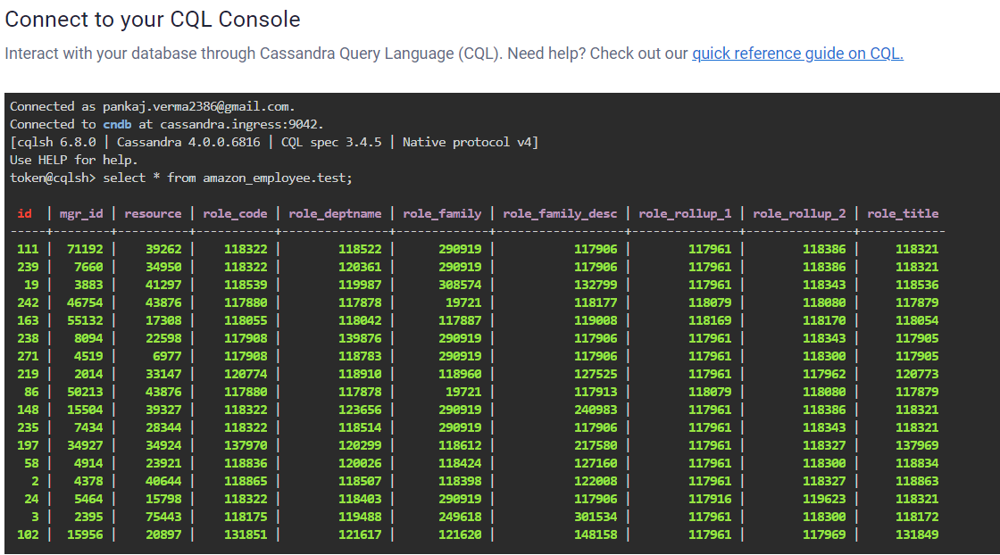